In [1]:
import pandas as pd
import os
from collections import defaultdict

import numpy as np
import statistics 
from scipy import stats

import matplotlib.pyplot as mp
from decimal import Decimal

import statsmodels.tsa.stattools as stattools
#  Use the pacf function of the statsmodels package
from statsmodels.tsa.stattools import pacf,pacf_ols,pacf_yw

import math
import numpy as np
from scipy.stats import pearsonr

from pandas.plotting import register_matplotlib_converters
from statsmodels.tsa.stattools import adfuller  #Dicker-Fuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
register_matplotlib_converters()
from Bio import pairwise2
from numpy import linalg as LA
from scipy.stats import wilcoxon
from scipy.stats import mannwhitneyu
from scipy.stats import ttest_ind
from mpl_toolkits import mplot3d
import matplotlib.pyplot as plt

In [2]:
data_dir = 'C:/Users/Qiong/chunting/projects/drug-target/ppis/codes'
import sys
sys.path.append(data_dir)

In [3]:
tissue = 'lung'
gene_expression = 'data/GSE28166.txt'
significant_genes = 'data/GSE28166_significant_genes.txt'

#for PPIN_network in PPIN_network_list:
PPIN_network = 'data/lung/Static_PPIN.txt'

In [6]:
#static_ppis_in_tissue = pd.read_excel("".join([data_dir, '/data/', 'PPIs_in_tissues_ref.xlsx']), sheet_name = 'PPIs_in_tissues')

#significant_genes = pd.read_excel("".join([data_dir, '/data/', 'GSE28166_significant_genes.xlsx']), sheet_name = 'significant_genes_all_time')

In [ ]:
static_ppis_in_tissue = pd.read_excel("".join([data_dir, '/data/', 'PPIs_in_tissues_ref.xlsx']), sheet_name = 'PPIs_in_tissues')

def retrieve_static_ppis_in_tissues(static_ppis_in_tissue):
    #static_ppis_in_tissue = pd.read_excel("".join([data_dir, '/data/', 'PPIs_in_tissues.xlsx']), sheet_name = 'PPIs_in_tissues')
    tissues = []
    list_ppi_gene_a = static_ppis_in_tissue['geneA_symbol']
    list_ppi_gene_b = static_ppis_in_tissue['geneB_symbol']
    for col in static_ppis_in_tissue.columns.str.strip():
        #col = 'adipose_subcutaneous'
        if (not col.startswith('gene')):
            if not os.path.exists("".join([data_dir, '/data/', col])):
                os.makedirs("".join([data_dir, '/data/', col]))
            tissues.append(col)
            ppi_values = static_ppis_in_tissue[col]
            t_ppis = pd.DataFrame(list(zip(list_ppi_gene_a, list_ppi_gene_b, ppi_values)), columns = ['geneA', 'geneB', 'value'])
            valid_t_ppis = t_ppis[t_ppis['value']>0]
            with open("".join([data_dir, '/data/', col, '/Static_PPIN.txt']), 'w') as f:
                for item in valid_t_ppis.values:
                    f.write("".join([str(item[0]), '\t', str(item[1]), '\t', str(item[2]), '\r']))
            f.close()

#retrieve_static_ppis_in_tissues(static_ppis_in_tissue)

# Retrieve static PPINs (direct PPIs, indirect PPIs (shared pathways, shared complexes)

# step 1

In [23]:
def get_common_proteins(gene_expression, PPIN_network, significant_genes):
    expressed_gene_set = set()
    PPIN_gene_set = set()
    significant_genes_set = set()
    
    gene_expression_file = open(gene_expression, 'r')
    for line in gene_expression_file.readlines():
        items = line.strip().split('\t')
        expressed_gene_set.add(str(items[1]))
    gene_expression_file.close()

    PPIN_network_file = open(PPIN_network, 'r')
    for line in PPIN_network_file.readlines():
        items = line.strip().split('\t')
        PPIN_gene_set.add(str(items[0]))
        PPIN_gene_set.add(str(items[1]))
    PPIN_network_file.close()

    significant_genes_file = open(significant_genes, 'r')
    for line in significant_genes_file.readlines():
        items = line.strip().split('\t')
        significant_genes_set.add(str(items[0]))
    significant_genes_file.close()
    
    tmp_common_protein_set = expressed_gene_set.intersection(PPIN_gene_set)
    common_protein_set = tmp_common_protein_set.intersection(significant_genes_set)
    #common_protein_set = tmp_common_protein_set
    
    protein2id = {}
    id2protein = {}
    idx = 0
    for protein in common_protein_set:
        protein2id[protein] = idx
        id2protein[idx] = protein
        idx += 1
    num_proteins = idx

    return common_protein_set, protein2id, id2protein, num_proteins


tissue = 'lung'
gene_expression = 'data/GSE28166.txt'
significant_genes = 'data/GSE28166_significant_genes.txt'

#for PPIN_network in PPIN_network_list:
PPIN_network = 'data/lung/Static_PPIN.txt'
# - Get common appeared proteins (i.e., genes) from PPI network and GSE3431 gene expression data - #
common_protein_set, protein2id, id2protein, common_num_proteins = get_common_proteins(gene_expression, PPIN_network, significant_genes)
print('----------------------------------------------------------------------------------------------------')
print('Static PPI network: ' + PPIN_network.split('/')[1])
print('Not every protein has to be active, actual number of nodes may be fewer than ' + str(common_num_proteins))

----------------------------------------------------------------------------------------------------
Static PPI network: lung
Not every protein has to be active, actual number of nodes may be fewer than 2405


In [28]:
def count_common_complexes(complexes, gene_i, gene_j, complexes_genes, complexes_genes_syn):
    count = 0
    common_complex_names = []
    for i in range(len(complexes_genes)):
        group = complexes_genes[i] + complexes_genes_syn[i]
        if gene_i in group and gene_i in group:
            count += 1
            common_complex_names.append(complexes['ComplexName'][i])
    return count, list(set(common_complex_names))

def getCommonComplex(complexes, allpairs_num_of_paths, id2protein, PPIN_gene_set, gene2complex):
    allpairs_num_of_complexes = defaultdict(int)
    allpairs_num_of_complexes_names = defaultdict(list)
    for i,j in allpairs_num_of_paths:
        gene_i = id2protein[i]
        gene_j = id2protein[j]
#        count, common_complex_names = count_common_complexes(complexes, gene_i, gene_j, complexes_genes, complexes_genes_syn)
#        allpairs_num_of_complexes[i,j] = count   #/total_complexes
#        allpairs_num_of_complexes_names[i,j] = common_complex_names
#    return allpairs_num_of_complexes, allpairs_num_of_complexes_names, total_complexes
        complex_4_gene_i = list(set(gene2complex[gene_i]))
        complex_4_gene_j = list(set(gene2complex[gene_j]))
        common_complex = [value for value in complex_4_gene_i if value in complex_4_gene_j]
        count = len(common_complex)
        common_complex_names = []
        if (count > 0):
            common_complex_rows = complexes.iloc[common_complex]
            common_complex_names = list(common_complex_rows['ComplexName'])
        allpairs_num_of_complexes_count[gene_i, gene_j] = count   #/total_complexes
        allpairs_num_of_complexes_names[gene_i, gene_j] = common_complex_names
    return allpairs_num_of_complexes_count, allpairs_num_of_complexes_names

# being used
def allComplexes():
    complexes = pd.read_excel("".join([data_dir, '/data/', 'humanComplexes.xlsx']), sheet_name = 'humanComplexes')
    complexes_genes_strings = complexes['subunits(Gene name)']
    complexes_genes_syn_strings = complexes['subunits(Gene name syn)']
    complexes_genes = [list(filter(None, genes.strip().split(';')))  for genes in complexes_genes_strings]
    complexes_genes_syn = [list(filter(None, genes.strip().split(';')))  for genes in complexes_genes_syn_strings]
    total_complexes = len(complexes_genes_strings)
    gene2complex = defaultdict(list)
    for idx in range(total_complexes):
        for genesymbol in complexes_genes[idx]:
            gene2complex[genesymbol].append(idx)
        for complexes_genes_syn in complexes_genes[idx]:
            gene2complex[genesymbol].append(idx)
    del complexes
    return total_complexes, gene2complex

# being used
def getCommonComplexes4PPIN(PPIN_gene_set, gene2complex):
    allpairs_num_of_complexes_count = defaultdict(int)
    allpairs_num_of_complexes_ids = defaultdict(list)
    i = 0
    for gene_i in list(PPIN_gene_set):
        i += 1
        if (i % 500 == 0): 
            print(i)
        for gene_j in list(PPIN_gene_set):
            complex_4_gene_i = list(set(gene2complex[gene_i]))
            complex_4_gene_j = list(set(gene2complex[gene_j]))
            common_complex = [value for value in complex_4_gene_i if value in complex_4_gene_j]
            count = len(common_complex)
            #if (count > 0):
            #    common_complex_rows = complexes.iloc[common_complex]
            #    common_complex_names = list(common_complex_rows['ComplexName'])
            if (count > 0):
                #print(gene_i, gene_j, count)
                allpairs_num_of_complexes_count[gene_i, gene_j] = count   #/total_complexes
                allpairs_num_of_complexes_ids[gene_i, gene_j] = common_complex  #common_complex_names
    return allpairs_num_of_complexes_count, allpairs_num_of_complexes_ids

#########################################################
# being used
def count_common_pathways(gene_pathways_dict, gene_i, gene_j):
    pathway_i = list(set(gene_pathways_dict[gene_i]))
    pathway_j = list(set(gene_pathways_dict[gene_j]))
    common_pathway_names = [value for value in pathway_i if value in pathway_j]
    return len(common_pathway_names), common_pathway_names

# being used
def allGenePathways():
    gene_pathways = pd.read_excel("".join([data_dir, '/data/', 'CTD_genes_pathways.xlsx']), sheet_name = 'CTD_genes_pathways')
    gene_pathways_dict = defaultdict(list)
    size = len(gene_pathways['GeneSymbol'])
    for i in range(size):
        gene_pathways_dict[gene_pathways['GeneSymbol'][i]].append(gene_pathways['PathwayID'][i])
    total_pathways = len(set(gene_pathways['PathwayID']))
    del gene_pathways
    return total_pathways, gene_pathways_dict

def getCommonPathways(gene_pathways_dict, allpairs_num_of_paths, id2protein):
    allpairs_num_of_pathways_count = defaultdict(int)
    allpairs_num_of_pathways_names = defaultdict(list)
    for i,j in allpairs_num_of_paths:
        gene_i = id2protein[i]
        gene_j = id2protein[j]
        
        count, common_pathways_names = count_common_pathways(gene_pathways_dict, gene_i, gene_j)
        allpairs_num_of_pathways_count[i,j] = count   #/total_pathways
        allpairs_num_of_pathways_names[i,j] = common_pathways_names
    return allpairs_num_of_pathways_count, allpairs_num_of_pathways_names

# being used
def getCommonPathways4PPIN(gene_pathways_dict, PPIN_gene_set):
    allpairs_num_of_pathways_count = defaultdict(int)
    allpairs_num_of_pathways_names = defaultdict(list)
    i = 0
    for gene_i in list(PPIN_gene_set):
        i += 1
        if (i % 500 == 0): 
            print(i)
        for gene_j in list(PPIN_gene_set):
            count, common_pathways_names = count_common_pathways(gene_pathways_dict, gene_i, gene_j)
            allpairs_num_of_pathways_count[gene_i,gene_j] = count   #/total_pathways
            allpairs_num_of_pathways_names[gene_i,gene_j] = common_pathways_names
    return allpairs_num_of_pathways_count, allpairs_num_of_pathways_names

In [25]:
from decimal import Decimal
def load_static_tPPI(PPIN_network):
    PPIN_genes = []
    PPINs = defaultdict(float)
    PPIN_network_file = open(PPIN_network, 'r')
    with open(PPIN_network, 'r') as PPIN_network_file:
        num_of_eges = 0
        for line in PPIN_network_file.readlines():
            items = line.strip().split('\t')
            num_of_eges += 1
            PPIN_genes.append(str(items[0]))
            PPIN_genes.append(str(items[1]))
            PPINs[str(items[0]), str(items[1])] = float(items[2])
    PPIN_network_file.close()  
    PPIN_gene_set = set(PPIN_genes)
    num_of_edges = len(set(PPINs))
    num_of_nodes = len(set(PPIN_gene_set)) 
    return num_of_nodes, num_of_edges, PPIN_gene_set, PPINs

                                    
# Actions:
PPIN_network_file = "".join([data_dir, '/data/lung/', 'Static_PPIN.txt']) 
num_of_nodes, num_of_edges, PPIN_gene_set, PPINs = load_static_tPPI(PPIN_network_file)
print('static PPIN (#(nodes), #(edges)): ', num_of_nodes, num_of_edges)
                                    

static PPIN (#(nodes), #(edges)):  6710 35373


In [26]:
total_pathways, gene_pathways_dict = allGenePathways()
print("total_pathways:", total_pathways)
#allpairs_num_of_pathways_count, allpairs_num_of_pathways_names = getCommonPathways4PPIN(gene_pathways_dict, PPIN_gene_set)
allpairs_num_of_pathways_count, allpairs_num_of_pathways_names = getCommonPathways4PPIN(gene_pathways_dict, common_protein_set)
print('Finish') 

total_pathways: 292
500
1000
1500
2000
Finish


In [29]:
total_complexes, gene2complex = allComplexes()
print("total_complexes:", total_complexes)   
#allpairs_num_of_complexes_count, allpairs_num_of_complexes_ids = getCommonComplexes4PPIN(PPIN_gene_set, gene2complex)
allpairs_num_of_complexes_count, allpairs_num_of_complexes_ids = getCommonComplexes4PPIN(common_protein_set, gene2complex)
print('Finish')

total_complexes: 3574
500
1000
1500
2000
Finish


In [30]:
from decimal import Decimal
def write_static_PPI_info_to_file(filename, PPIN_gene_set, PPINs, allpairs_num_of_pathways_count, allpairs_num_of_pathways_names, allpairs_num_of_complexes_count, allpairs_num_of_complexes_ids ):
    with open(filename, 'w') as f:
        i = 0
        for gene_i in list(PPIN_gene_set):
            i += 1
            if (i % 500 == 0):
                print(i)
            for gene_j in list(PPIN_gene_set): 
                exists = False
                ppi_confidence = 0
                if ((gene_i, gene_j) in PPINs) and (PPINs[gene_i,gene_j] > 0):
                    ppi_confidence = PPINs[gene_i,gene_j]
                    exists = True
                ppi_pathways = []
                ppi_pathways_count = 0
                if ((gene_i, gene_j) in allpairs_num_of_pathways_count) and (allpairs_num_of_pathways_count[gene_i,gene_j] > 0):
                    ppi_pathways_count = allpairs_num_of_pathways_count[gene_i,gene_j]
                    ppi_pathways = allpairs_num_of_pathways_names[gene_i,gene_j]
                    exists = True
                ppi_complexes = []
                ppi_complexes_count = 0
                if ((gene_i, gene_j) in allpairs_num_of_complexes_count)  and (allpairs_num_of_complexes_count[gene_i,gene_j] > 0):
                    ppi_complexes_count = allpairs_num_of_complexes_count[gene_i,gene_j]
                    ppi_complexes = allpairs_num_of_complexes_ids[gene_i,gene_j]
                    exists = True
                if exists:
                    f.write('\t'.join([gene_i, gene_j, str(ppi_confidence), str(ppi_pathways_count), str(ppi_complexes_count), ';'.join(ppi_pathways), '\n']))
                                       #, ';'.join(ppi_complexes), '\n']))
    f.close()
    
# Action
filename = "".join([data_dir, '/data/lung/', 'Static_PPIN_pathway_complexes.txt'])
print('Writing to the file, ', filename)
#allpairs_num_of_complexes_count = dict()
#allpairs_num_of_complexes_ids = dict()
#write_static_PPI_info_to_file(filename, PPIN_gene_set, PPINs, allpairs_num_of_pathways_count, allpairs_num_of_pathways_names, allpairs_num_of_complexes_count, allpairs_num_of_complexes_ids)
write_static_PPI_info_to_file(filename, common_protein_set, PPINs, allpairs_num_of_pathways_count, allpairs_num_of_pathways_names, allpairs_num_of_complexes_count, allpairs_num_of_complexes_ids)

print('Finish')

Writing to the file,  C:/Users/Qiong/chunting/projects/drug-target/ppis/codes/data/lung/Static_PPIN_pathway_complexes.txt
500
1000
1500
2000
Finish


# Step 2

In [32]:
def create_mixed_adjacent_matrix(filename, common_num_proteins, protein2id):
    asso_matrix = np.zeros((common_num_proteins, common_num_proteins), dtype=int)
    i = 0
    with open(filename, 'r') as f:
        for line in f.readlines():
            i += 1
            if (i % 10000 == 0):
                print(i)
            items = line.strip().split('\t')
            gene_i = items[0]
            gene_j = items[1]
            idx_gene_i = protein2id[gene_i]
            idx_gene_j = protein2id[gene_j]
            asso_matrix[idx_gene_i][idx_gene_j] = 1
            asso_matrix[idx_gene_j][idx_gene_i] = 1
    f.close()
    return asso_matrix

#Action:
filename = "".join([data_dir, '/data/lung/', 'Static_PPIN_pathway_complexes.txt'])
asso_matrix = create_mixed_adjacent_matrix(filename, common_num_proteins, protein2id)
print('Done')

10000
20000
30000
40000
50000
60000
70000
80000
90000
100000
110000
120000
130000
140000
150000
160000
170000
180000
190000
200000
210000
220000
230000
Done


# step 3 validation of data + act prob. matrix (read from gene expression data)

In [9]:
from numpy.dual import lstsq
from statsmodels.tools import add_constant
from statsmodels.tsa.tsatools import lagmat
import statsmodels.tsa.stattools as stattools
#  Use the pacf function of the statsmodels package
from statsmodels.tsa.stattools import pacf,pacf_ols,pacf_yw

import math
import numpy as np
from scipy.stats import pearsonr

from pandas.plotting import register_matplotlib_converters
from statsmodels.tsa.stattools import adfuller  #Dicker-Fuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
register_matplotlib_converters()
from Bio import pairwise2
from numpy import linalg as LA
from scipy.stats import wilcoxon
from mpl_toolkits import mplot3d
import matplotlib.pyplot as plt

def cronbach_alpha(df):
    # 1. Transform the df into a correlation matrix
    df_corr = df.corr()  #method ='kendall' 'pearson'
    
    # 2.1 Calculate N
    # The number of variables equals the number of columns in the df
    N = df.shape[1]
    
    # 2.2 Calculate R
    # For this, we'll loop through the columns and append every
    # relevant correlation to an array calles "r_s". Then, we'll
    # calculate the mean of "r_s"
    rs = np.array([])
    for i, col in enumerate(df_corr.columns):
        sum_ = df_corr[col][i+1:].values
        rs = np.append(sum_, rs)
    mean_r = np.mean(rs)
    
   # 3. Use the formula to calculate Cronbach's Alpha 
    cronbach_alpha = (N * mean_r) / (1 + (N - 1) * mean_r)
    return cronbach_alpha

def perform_adf_test(series1, series2, N):
    for i in range(N):
        serial1 = series1[i,:]
        result = adfuller(serial1)
        print("[Control %i] ADF Statistic: %f" % (i, result[0]))
        print("[Control %i] p-value: %f" % (i, result[1]))
        serial2 = series2[i,:]
        result = adfuller(serial2)
        print("[Exp %i] ADF Statistic: %f" % (i, result[0]))
        print("[Exp %i] p-value: %f" % (i, result[1])) 

def cal_acf(x, nlags):
    """
    Write your own according to the formula acf function
    It is only used to help understand. It is not recommended to use it in other environments
    """
    x = np.array(x)
    mean_x = np.mean(x)
    length_x = x.shape[0]
    c_0 = np.mean((x-mean_x) **2)
    c_k = np.sum((x[:(length_x-nlags)] - mean_x) * (x[nlags:] - mean_x)) / length_x
    r_k = c_k / c_0
    return r_k


#  The function of solving pacf with ols is implemented by myself
def cal_my_pacf_ols(x, nlags=5):
    """
    Self realization pacf，The principle uses ols(least square method)
    :param x:
    :param nlags:
    :return:
    """
    pacf = np.empty(nlags+1) * 0
    pacf[0] = 1.0

    xlags, x0 = lagmat(x, nlags, original="sep")
    xlags = add_constant(xlags)

    for k in range(1, nlags+1):
        params = lstsq(xlags[k:, :(k+1)], x0[k:])[0]  #, rcond=None
        pacf[k] = params[-1]

    return pacf

def cal_my_yule_walker(x, nlags=5):
    """
    Self realization yule_walker theory
    :param x:
    :param nlags:
    :return:
    """
    x = np.array(x, dtype=np.float64)
    x -= x.mean()
    n = x.shape[0]

    r = np.zeros(shape=nlags+1, dtype=np.float64)
    r[0] = (x ** 2).sum()/n

    for k in range(1, nlags+1):
        r[k] = (x[0:-k] * x[k:]).sum() / (n-k*1)

    from scipy.linalg import toeplitz
    R = toeplitz(c=r[:-1])
    result = np.linalg.solve(R, r[1:])
    return result

def cal_my_pacf_yw(x, nlags=5):
    """
    Pass by yourself yule_walker Method pacf Value of
    :param x:
    :param nlags:
    :return:
    """
    pacf = np.empty(nlags+1) * 0
    pacf[0] = 1.0
    for k in range(1, nlags+1):
        pacf[k] = cal_my_yule_walker(x,nlags=k)[-1]

    return pacf

def perform_acf_pacf(series1, series2, num_proteins):
    for i in range(num_proteins):
        serial1 = series1[i,:]
        #autocors, conf_int = stattools.acf(serial1) #,nlags=5,qstat=True,alpha=0.05, fft=False)
        #  Comparison of results
        #print(autocors, conf_int)
        
        mock_adf = pd.DataFrame({'pacf':pacf(serial1,nlags=5, method='ols'),
                      'pacf_ols':pacf_ols(serial1,nlags=5),
                      'pacf_yw':pacf_yw(serial1,nlags=5),
                      'pacf_ols_bymyself':cal_my_pacf_ols(x=serial1),
                      'pacf_yw_bymyself':cal_my_pacf_yw(x=serial1)})
        print('mock_adf: ', mock_adf)
        serial2 = series2[i,:]
        #autocors, conf_int = stattools.acf(serial2) #,nlags=5,qstat=True,alpha=0.05, fft=False)
        #print(autocors, conf_int)
        #  Comparison of results

        exp_adf = pd.DataFrame({'pacf':pacf(serial2,nlags=5, method='ols'),
                      'pacf_ols':pacf_ols(serial2,nlags=5),
                      'pacf_yw':pacf_yw(serial2,nlags=5),
                      'pacf_ols_bymyself':cal_my_pacf_ols(x=serial2),
                      'pacf_yw_bymyself':cal_my_pacf_yw(x=serial2)})
        print('exp_adf: ', exp_adf)
    
def perform_cronbach_alpha(series1, series2, time_points, num_replicates):
    for t in range(time_points):
        np_data = series1[:, t*num_replicates:(t+1)*num_replicates]
        df = pd.DataFrame(np_data, columns = ['replicate 1', 'replicate 2', 'replicate 3'])
        alpha = cronbach_alpha(df)
        print("mock data at time point ", str(t+1), "cronbach's alpha: ", alpha)

    for t in range(time_points):
        np_data = series2[:, t*num_replicates:(t+1)*num_replicates]
        df = pd.DataFrame(np_data, columns = ['replicate 1', 'replicate 2', 'replicate 3'])
        alpha = cronbach_alpha(df)
        print("infected data at time point ", str(t+1), "cronbach's alpha: ", alpha)
        
def get_temporal_act_prob(groups, time_points, num_replicates, num_proteins, protein2id, gene_expression, time_point):
    # - lifelong expression value - #
    num_cycles = num_replicates
    mock_gene_expression_value = np.zeros((num_proteins, time_points * num_replicates), dtype=np.float32)
    exp_gene_expression_value = np.zeros((num_proteins, time_points * num_replicates), dtype=np.float32)
    mock_gene_expression_avg = np.zeros((num_proteins, time_points), dtype=np.float32)
    exp_gene_expression_avg = np.zeros((num_proteins, time_points), dtype=np.float32)
    
    gene_expression_file = open(gene_expression, 'r')
    for line in gene_expression_file.readlines():
        items = line.strip().split('\t')
        if items[1] in protein2id.keys():
            for t in range(time_points * num_replicates):
                mock_gene_expression_value[protein2id[items[1]], t] = float(items[t + 2])
                exp_gene_expression_value[protein2id[items[1]], t] = float(items[t + 2 + time_points * num_replicates])
            for t in range(time_points):
                control_sum = 0
                exp_sum = 0
                for j in range(num_replicates):
                    control_sum = control_sum + float(items[t* num_replicates + 2 + j])
                    exp_sum = exp_sum + float(items[t* num_replicates + 2 + j + time_points * num_replicates])
                mock_gene_expression_avg[protein2id[items[1]], t] = control_sum/(num_replicates + 0.0) 
                exp_gene_expression_avg[protein2id[items[1]], t] = exp_sum/(num_replicates + 0.0) 
    gene_expression_file.close()

    # reliability: replicates capture the same information
    perform_cronbach_alpha(mock_gene_expression_value, exp_gene_expression_value, time_points, num_replicates)
    
    # is stationary? on the averages of replicates
    #perform_adf_test(mock_gene_expression_avg, exp_gene_expression_avg, num_proteins)
    
    # ACF & PACF?  on the averages of replicates
    perform_acf_pacf(mock_gene_expression_avg, exp_gene_expression_avg, num_proteins)

    # - periodical expression value mean and std - #
    mock_avg_gene_expression_avg = np.zeros((num_proteins,), dtype=float)
    mock_std_gene_expression_avg = np.zeros((num_proteins,), dtype=float)
    exp_avg_gene_expression_avg = np.zeros((num_proteins,), dtype=float)
    exp_std_gene_expression_avg = np.zeros((num_proteins,), dtype=float)
    for idx in protein2id.values():
        mock_avg_gene_expression_avg[idx] = np.mean(mock_gene_expression_avg[idx,:])
        mock_std_gene_expression_avg[idx] = np.std(mock_gene_expression_avg[idx, :])
        exp_avg_gene_expression_avg[idx] = np.mean(exp_gene_expression_avg[idx,:])
        exp_std_gene_expression_avg[idx] = np.std(exp_gene_expression_avg[idx, :])
        
    # - Get active probability of each protein at each time (total 36 time stamps) - #
    #mock_act_vec_list = []
    #for i in range(time_points):
    mock_act_prob_vec = np.zeros((num_proteins,), dtype=float)
    for idx in protein2id.values():
        if mock_gene_expression_avg[idx, time_point] >= mock_avg_gene_expression_avg[idx] + 3 * mock_std_gene_expression_avg[idx] * (1 - 1/(1 + math.pow(mock_std_gene_expression_avg[idx], 2))):
            mock_act_prob_vec[idx] = 0.99
        elif mock_gene_expression_avg[idx, time_point] >= mock_avg_gene_expression_avg[idx] + 2 * mock_std_gene_expression_avg[idx] * (1 - 1/(1 + math.pow(mock_std_gene_expression_avg[idx], 2))):
            mock_act_prob_vec[idx] = 0.95
        elif mock_gene_expression_avg[idx, time_point] >= mock_avg_gene_expression_avg[idx] + 1 * mock_std_gene_expression_avg[idx] * (1 - 1/(1 + math.pow(mock_std_gene_expression_avg[idx], 2))):
            mock_act_prob_vec[idx] = 0.68
        #mock_act_vec_list.append(mock_act_prob_vec)

    #exp_act_vec_list = []
    #for i in range(time_points):
    exp_act_prob_vec = np.zeros((num_proteins,), dtype=float)
    for idx in protein2id.values():
        if exp_gene_expression_avg[idx, time_point] >= exp_avg_gene_expression_avg[idx] + 3 * exp_std_gene_expression_avg[idx] * (1 - 1/(1 + math.pow(exp_std_gene_expression_avg[idx], 2))):
            exp_act_prob_vec[idx] = 0.99
        elif exp_gene_expression_avg[idx, time_point] >= exp_avg_gene_expression_avg[idx] + 2 * exp_std_gene_expression_avg[idx] * (1 - 1/(1 + math.pow(exp_std_gene_expression_avg[idx], 2))):
            exp_act_prob_vec[idx] = 0.95
        elif exp_gene_expression_avg[idx, time_point] >= exp_avg_gene_expression_avg[idx] + 1 * exp_std_gene_expression_avg[idx] * (1 - 1/(1 + math.pow(exp_std_gene_expression_avg[idx], 2))):
            exp_act_prob_vec[idx] = 0.68
        #exp_act_vec_list.append(exp_act_prob_vec)
        
    return mock_act_prob_vec, exp_act_prob_vec, mock_gene_expression_value, exp_gene_expression_value


# Actions
groups = 2
time_points = 6  # - GSE28166 Calu-3 cells were infected with VN1203 influenza virus and profiled at 0, 3, 7, 12, 18, and 24 hours post infection. There are 3 mock and infected replicates for each time point. #
#num_cycles = 6  # - GSE3431 has 3 consecutive cycles - #
replicates = 3
mock_act_vec_list = []
exp_act_vec_list = []
mock_gene_expression_value =[]
exp_gene_expression_value = []

for time_point in range(time_points):
    print("Time step: ", time_point)
    # - Get the active prob. of each gene at each time stamp via expression values - #
    # act_vec_list, gene_expression_value #
    mock_act_prob_vec, exp_act_prob_vec, mock_gene_expression_at_t, exp_gene_expression_at_t = get_temporal_act_prob(groups, time_points, replicates, common_num_proteins, protein2id, gene_expression, time_point)
    mock_act_vec_list.append(mock_act_prob_vec)
    exp_act_vec_list.append(exp_act_prob_vec)
    mock_gene_expression_value.append(mock_gene_expression_at_t)
    exp_gene_expression_value.append(exp_gene_expression_at_t)
    
#Output: mock_act_vec_list, exp_act_vec_list, mock_gene_expression_value,exp_gene_expression_value

Time step:  0
mock data at time point  1 cronbach's alpha:  0.9973261069002195
mock data at time point  2 cronbach's alpha:  0.9957867418819556
mock data at time point  3 cronbach's alpha:  0.9972258458051636
mock data at time point  4 cronbach's alpha:  0.9972622788219558
mock data at time point  5 cronbach's alpha:  0.9919348042872547
mock data at time point  6 cronbach's alpha:  0.9972142688706331
infected data at time point  1 cronbach's alpha:  0.9982863702525266
infected data at time point  2 cronbach's alpha:  0.996021784654901
infected data at time point  3 cronbach's alpha:  0.9958211481593745
infected data at time point  4 cronbach's alpha:  0.9937937504189178
infected data at time point  5 cronbach's alpha:  0.9862169006719733
infected data at time point  6 cronbach's alpha:  0.989768298239734


C:\Users\Qiong\chunting\tools\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1283: RuntimeWarning: invalid value encountered in sqrt
  return rho, np.sqrt(sigmasq)


mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.391401 -0.391401 -0.467703          -0.391401         -0.467703
2 -0.656653 -0.656653 -0.967382          -0.656653         -0.967382
3  0.699775  0.699775 -7.906410           0.699775         -7.906410
4  0.260189  0.260189  1.087626           0.260189          1.087626
5  0.197951  0.197951  1.051448           0.197951          1.051448
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.183441  1.183441  0.591478           1.183441          0.591478
2  2.144416  2.144416 -0.595453           2.144416         -0.595453
3  3.240555  3.240555 -0.370494           3.240555         -0.370494
4  0.295720  0.295720 -1.643655           0.295720         -1.643655
5  0.218182  0.218182  1.620081           0.218182          1.620081
mock_adf:    

5  0.180691  0.180691  3.948966           0.180691          3.948966
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.491886  0.491886  0.472196           0.491886          0.472196
2  0.722889  0.722889 -0.314177           0.722889         -0.314177
3 -0.395881 -0.395881 -0.383108          -0.395881         -0.383108
4  0.440782  0.440782 -1.715405           0.440782         -1.715405
5  0.199142  0.199142  0.551706           0.199142          0.551706
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.310964 -0.310964 -0.325449          -0.310964         -0.325449
2 -0.852667 -0.852667 -0.486670          -0.852667         -0.486670
3  4.618744  4.618744 -0.786093           4.618744         -0.786093
4  0.314068  0.314068 -2.161716           0.314068         -2.161716
5  0.231388  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.681231  0.681231  0.686259           0.681231          0.686259
2 -0.497144 -0.497144 -1.060367          -0.497144         -1.060367
3  1.539510  1.539510  0.588774           1.539510          0.588774
4  0.516258  0.516258 -2.084364           0.516258         -2.084364
5  0.194058  0.194058 -4.497412           0.194058         -4.497412
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.272395  0.272395  0.239188           0.272395          0.239188
2  0.246349  0.246349 -0.115215           0.246349         -0.115215
3 -0.010734 -0.010734 -0.285219          -0.010734         -0.285219
4  0.291000  0.291000 -1.203649           0.291000         -1.203649
5  0.201698  0.201698  1.574237           0.201698          1.574237
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.362279 -0.362279 -0.417865          -0.362279         -0.417865
2 -0.727055 -0.727055 -0.763258          -0.727055         -0.763258
3  0.715170  0.715170  0.401434           0.715170          0.401434
4  0.253943  0.253943 -0.019619           0.253943         -0.019619
5  0.199382  0.199382 -1.532848           0.199382         -1.532848
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.434458  0.434458  0.521024           0.434458          0.521024
2 -0.541922 -0.541922 -1.062021          -0.541922         -1.062021
3  1.653385  1.653385 -1.901719           1.653385         -1.901719
4  0.435761  0.435761  0.810200           0.435761          0.810200
5  0.207843  0.207843 -6.921328           0.207843         -6.921328
mock_adf:    

mock_adf:         pacf  pacf_ols     pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000    1.000000           1.000000          1.000000
1  0.991326  0.991326    0.649879           0.991326          0.649879
2  0.046906  0.046906   -0.695723           0.046906         -0.695723
3  0.511648  0.511648   -0.994847           0.511648         -0.994847
4  0.162446  0.162446 -146.314592           0.162446       -146.314592
5  0.210396  0.210396    0.999803           0.210396          0.999803
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.472172  0.472172  0.327325           0.472172          0.327325
2  0.166536  0.166536 -0.119593           0.166536         -0.119593
3  1.120729  1.120729 -0.542093           1.120729         -0.542093
4  0.054443  0.054443 -1.186516           0.054443         -1.186516
5  0.210543  0.210543  3.301702           0.210543          3.301702

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -1.462872 -1.462872 -0.763833          -1.462872         -0.763833
2 -1.644692 -1.644692 -0.386798          -1.644692         -0.386798
3  1.798554  1.798554  0.052858           1.798554          0.052858
4  0.302585  0.302585 -0.543637           0.302585         -0.543637
5  0.125482  0.125482 -2.034311           0.125482         -2.034311
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.142308  0.142308  0.179359           0.142308          0.179359
2 -0.693469 -0.693469 -0.714965          -0.693469         -0.714965
3 -4.966221 -4.966221 -1.195559          -4.966221         -1.195559
4  0.100023  0.100023  1.953620           0.100023          1.953620
5  0.195978  0.195978  1.546183           0.195978          1.546183
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.243793  0.243793  0.243344           0.243793          0.243344
2 -1.023253 -1.023253 -1.071118          -1.023253         -1.071118
3  2.267333  2.267333 -0.567892           2.267333         -0.567892
4  0.246883  0.246883  2.960001           0.246883          2.960001
5  0.183257  0.183257  0.254745           0.183257          0.254745
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.028719  0.028719  0.040957           0.028719          0.040957
2 -0.183011 -0.183011 -0.297942          -0.183011         -0.297942
3  1.778612  1.778612 -0.547021           1.778612         -0.547021
4  0.241890  0.241890 -0.662366           0.241890         -0.662366
5  0.181820  0.181820 -1.024159           0.181820         -1.024159
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.978858  0.978858  0.501120           0.978858          0.501120
2  0.433262  0.433262 -0.297617           0.433262         -0.297617
3  0.717863  0.717863 -0.406060           0.717863         -0.406060
4 -0.074342 -0.074342 -1.706137          -0.074342         -1.706137
5  0.214495  0.214495  0.948071           0.214495          0.948071
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.081380  1.081380  0.381014           1.081380          0.381014
2 -2.756855 -2.756855 -0.706707          -2.756855         -0.706707
3  1.283740  1.283740  0.030711           1.283740          0.030711
4  0.152550  0.152550 -0.754172           0.152550         -0.754172
5  0.134464  0.134464 -3.447737           0.134464         -3.447737
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.538309  0.538309  0.562973           0.538309          0.562973
2 -0.544171 -0.544171 -0.611712          -0.544171         -0.611712
3  1.578142  1.578142 -0.627512           1.578142         -0.627512
4  0.365775  0.365775 -2.108178           0.365775         -2.108178
5  0.188394  0.188394  0.715976           0.188394          0.715976
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.383109 -0.383109 -0.463795          -0.383109         -0.463795
2 -0.624196 -0.624196 -0.703738          -0.624196         -0.703738
3  0.566727  0.566727 -0.064590           0.566727         -0.064590
4  0.159853  0.159853 -0.679728           0.159853         -0.679728
5  0.187004  0.187004 -1.556785           0.187004         -1.556785
exp_adf:     

5  0.168910  0.168910  0.652133           0.168910          0.652133
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.291251  0.291251  0.354368           0.291251          0.354368
2 -0.522206 -0.522206 -0.711662          -0.522206         -0.711662
3  1.878553  1.878553 -0.481353           1.878553         -0.481353
4  0.433510  0.433510 -0.636782           0.433510         -0.636782
5  0.211076  0.211076 -1.124676           0.211076         -1.124676
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.676598  0.676598  0.704237           0.676598          0.704237
2 -0.570787 -0.570787 -1.270566          -0.570787         -1.270566
3  0.942049  0.942049 -0.550840           0.942049         -0.550840
4  0.648606  0.648606 -0.368364           0.648606         -0.368364
5  0.197576  

5  0.215603  0.215603  0.704633           0.215603          0.704633
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.577255 -0.577255 -0.477301          -0.577255         -0.477301
2 -1.035379 -1.035379 -1.016142          -1.035379         -1.016142
3  1.062208  1.062208  3.325397           1.062208          3.325397
4  0.214608  0.214608  0.918812           0.214608          0.918812
5  0.191184  0.191184  2.690305           0.191184          2.690305
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.020029  1.020029  0.614463           1.020029          0.614463
2 -3.868480 -3.868480 -0.866303          -3.868480         -0.866303
3  2.192776  2.192776  0.183614           2.192776          0.183614
4  0.215564  0.215564 -3.029776           0.215564         -3.029776
5  0.158041  

5  0.196212  0.196212  0.472422           0.196212          0.472422
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.989978  0.989978  0.707636           0.989978          0.707636
2 -0.492130 -0.492130 -0.946735          -0.492130         -0.946735
3 -0.060358 -0.060358 -2.238685          -0.060358         -2.238685
4  0.524247  0.524247  2.128711           0.524247          2.128711
5  0.186613  0.186613  1.098757           0.186613          1.098757
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.728239  0.728239  0.579945           0.728239          0.579945
2  0.360676  0.360676 -0.363273           0.360676         -0.363273
3  1.821979  1.821979 -1.047476           1.821979         -1.047476
4  0.196587  0.196587  4.312550           0.196587          4.312550
5  0.199147  

5  0.206929  0.206929 -5.886525           0.206929         -5.886525
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.581299  0.581299  0.592915           0.581299          0.592915
2  0.158954  0.158954 -0.697173           0.158954         -0.697173
3 -0.307612 -0.307612 -1.194694          -0.307612         -1.194694
4  0.846922  0.846922  1.571870           0.846922          1.571870
5  0.198366  0.198366  2.176497           0.198366          2.176497
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.193257  0.193257  0.150956           0.193257          0.150956
2  0.003167  0.003167 -0.162664           0.003167         -0.162664
3  0.273484  0.273484 -0.557778           0.273484         -0.557778
4 -0.139906 -0.139906 -1.351594          -0.139906         -1.351594
5  0.181369  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.864459  0.864459  0.560225           0.864459          0.560225
2 -0.130435 -0.130435 -0.547271          -0.130435         -0.547271
3  0.447853  0.447853 -1.139019           0.447853         -1.139019
4  0.108356  0.108356  1.619248           0.108356          1.619248
5  0.224811  0.224811  2.103610           0.224811          2.103610
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.393992  1.393992  0.536189           1.393992          0.536189
2  0.029783  0.029783 -0.389743           0.029783         -0.389743
3 -0.068277 -0.068277 -0.966636          -0.068277         -0.966636
4 -0.260667 -0.260667 -9.390202          -0.260667         -9.390202
5  0.254569  0.254569  1.026644           0.254569          1.026644
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.662308  0.662308  0.585255           0.662308          0.585255
2 -0.013399 -0.013399 -0.606764          -0.013399         -0.606764
3  0.606936  0.606936 -0.493690           0.606936         -0.493690
4  0.222496  0.222496 -1.401814           0.222496         -1.401814
5  0.202181  0.202181  3.483259           0.202181          3.483259
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.107626 -0.107626 -0.153325          -0.107626         -0.153325
2 -1.096201 -1.096201 -0.671162          -1.096201         -0.671162
3  1.056217  1.056217  0.775882           1.056217          0.775882
4  0.591143  0.591143 -0.258966           0.591143         -0.258966
5  0.202889  0.202889 -8.034276           0.202889         -8.034276
exp_adf:     

exp_adf:         pacf  pacf_ols     pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000    1.000000           1.000000          1.000000
1  0.986975  0.986975    0.671671           0.986975          0.671671
2 -1.309750 -1.309750   -1.051350          -1.309750         -1.051350
3  0.619740  0.619740    0.282186           0.619740          0.282186
4  0.282535  0.282535   -1.038980           0.282535         -1.038980
5  0.174565  0.174565 -137.989189           0.174565       -137.989189
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.444172 -0.444172 -0.278227          -0.444172         -0.278227
2 -1.649164 -1.649164 -0.643226          -1.649164         -0.643226
3  1.601798  1.601798  0.669948           1.601798          0.669948
4  0.237864  0.237864 -1.375826           0.237864         -1.375826
5  0.209719  0.209719  0.101700           0.209719          0.101700

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.688615  0.688615  0.598729           0.688615          0.598729
2  0.039549  0.039549 -0.660394           0.039549         -0.660394
3  0.298601  0.298601 -0.359612           0.298601         -0.359612
4  0.315698  0.315698 -1.658822           0.315698         -1.658822
5  0.191414  0.191414  1.577069           0.191414          1.577069
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.291794 -0.291794  -0.360093          -0.291794         -0.360093
2 -0.725572 -0.725572  -1.090326          -0.725572         -1.090326
3  0.798405  0.798405   1.141182           0.798405          1.141182
4  0.250526  0.250526  -0.804265           0.250526         -0.804265
5  0.194503  0.194503  24.987252           0.194503         24.987252
exp_ad

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.316322  0.316322  0.389818           0.316322          0.389818
2 -1.255031 -1.255031 -0.426767          -1.255031         -0.426767
3  5.326472  5.326472 -0.713436           5.326472         -0.713436
4 -0.161939 -0.161939 -1.793253          -0.161939         -1.793253
5  0.227434  0.227434  0.196059           0.227434          0.196059
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.253015  0.253015  0.115538           0.253015          0.115538
2 -0.066235 -0.066235 -0.353565          -0.066235         -0.353565
3  0.653034  0.653034  0.571311           0.653034          0.571311
4  0.243158  0.243158 -1.931645           0.243158         -1.931645
5  0.203376  0.203376 -0.239681           0.203376         -0.239681
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.491503 -0.491503 -0.578643          -0.491503         -0.578643
2 -0.474807 -0.474807 -0.682131          -0.474807         -0.682131
3  1.423525  1.423525 -1.158886           1.423525         -1.158886
4  0.258918  0.258918  5.610540           0.258918          5.610540
5  0.203889  0.203889  0.901122           0.203889          0.901122
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.148425  0.148425  0.099997           0.148425          0.099997
2  0.512597  0.512597  0.277171           0.512597          0.277171
3  0.903053  0.903053 -0.572922           0.903053         -0.572922
4 -0.026387 -0.026387 -1.318927          -0.026387         -1.318927
5  0.206259  0.206259  2.961196           0.206259          2.961196
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.759720  0.759720  0.736674           0.759720          0.736674
2 -0.641706 -0.641706 -1.445592          -0.641706         -1.445592
3  0.337291  0.337291 -0.674879           0.337291         -0.674879
4  0.955313  0.955313 -0.008463           0.955313         -0.008463
5  0.174761  0.174761  0.596605           0.174761          0.596605
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.806596 -0.806596 -0.363511          -0.806596         -0.363511
2 -0.502007 -0.502007 -0.304660          -0.502007         -0.304660
3  1.195962  1.195962  0.634032           1.195962          0.634032
4 -0.221754 -0.221754 -1.658462          -0.221754         -1.658462
5  0.180015  0.180015 -0.096072           0.180015         -0.096072
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.270574  0.270574  0.326154           0.270574          0.326154
2 -1.015308 -1.015308 -0.696148          -1.015308         -0.696148
3  2.268423  2.268423 -0.507701           2.268423         -0.507701
4  0.685213  0.685213 -1.067345           0.685213         -1.067345
5  0.230552  0.230552  0.047484           0.230552          0.047484
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.605205 -0.605205 -0.639805          -0.605205         -0.639805
2 -0.784619 -0.784619 -1.230960          -0.784619         -1.230960
3  0.737771  0.737771  1.426122           0.737771          1.426122
4  0.104208  0.104208  1.222205           0.104208          1.222205
5  0.195422  0.195422 -3.889095           0.195422         -3.889095
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.410009  0.410009  0.421456           0.410009          0.421456
2  0.237027  0.237027 -0.421116           0.237027         -0.421116
3 -0.312567 -0.312567 -0.219408          -0.312567         -0.219408
4  0.339856  0.339856 -1.340373           0.339856         -1.340373
5  0.195665  0.195665  0.612227           0.195665          0.612227
exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   0.981750   0.981750  0.374516           0.981750          0.374516
2   5.924752   5.924752 -0.461230           5.924752         -0.461230
3 -34.786612 -34.786612  0.147199         -34.786612          0.147199
4   0.145132   0.145132 -1.571969           0.145132         -1.571969
5   0.171464   0.171464 -0.158102           0.171464         -0.158102

5  0.217107  0.217107  11.650369           0.217107         11.650369
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.058784  0.058784   0.111003           0.058784          0.111003
2 -0.471721 -0.471721  -0.539321          -0.471721         -0.539321
3 -0.417416 -0.417416  -0.968222          -0.417416         -0.968222
4 -0.047430 -0.047430 -13.052817          -0.047430        -13.052817
5  0.174241  0.174241   0.931688           0.174241          0.931688
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.251880  0.251880  0.002746           0.251880          0.002746
2  1.890850  1.890850  0.274277           1.890850          0.274277
3  0.048249  0.048249 -0.561860           0.048249         -0.561860
4 -0.141424 -0.141424 -1.167499          -0.141424         -1.167499
5  0.

5  0.190281  0.190281  0.736249           0.190281          0.736249
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.735546  0.735546  0.702996           0.735546          0.702996
2 -0.365167 -0.365167 -1.221731          -0.365167         -1.221731
3  0.591862  0.591862 -0.601321           0.591862         -0.601321
4  0.441539  0.441539  0.261265           0.441539          0.261265
5  0.178777  0.178777  1.872044           0.178777          1.872044
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.380119  0.380119  0.356006           0.380119          0.356006
2  0.042318  0.042318 -0.458355           0.042318         -0.458355
3  0.090029  0.090029  0.118860           0.090029          0.118860
4  0.273307  0.273307 -1.473948           0.273307         -1.473948
5  0.198197  

5  0.137096  0.137096  0.469855           0.137096          0.469855
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.273324  0.273324  0.341005           0.273324          0.341005
2 -0.674747 -0.674747 -1.056380          -0.674747         -1.056380
3  0.465514  0.465514 -1.511149           0.465514         -1.511149
4  0.101243  0.101243 -0.228489           0.101243         -0.228489
5  0.126109  0.126109 -4.289223           0.126109         -4.289223
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.205393  0.205393  0.045474           0.205393          0.045474
2  4.318525  4.318525 -0.197841           4.318525         -0.197841
3 -3.620018 -3.620018 -0.229715          -3.620018         -0.229715
4 -0.861732 -0.861732 -1.158891          -0.861732         -1.158891
5  0.448458  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.605847  1.605847  0.476601           1.605847          0.476601
2 -4.207811 -4.207811 -0.543926          -4.207811         -0.543926
3  2.033229  2.033229 -0.279389           2.033229         -0.279389
4  0.056413  0.056413 -0.878534           0.056413         -0.878534
5  0.183669  0.183669 -7.798352           0.183669         -7.798352
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.323682 -0.323682 -0.103711          -0.323682         -0.103711
2  0.572646  0.572646 -0.021457           0.572646         -0.021457
3  0.930993  0.930993 -0.080776           0.930993         -0.080776
4 -0.539517 -0.539517 -1.488146          -0.539517         -1.488146
5  0.172928  0.172928 -0.157621           0.172928         -0.157621
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.165848  0.165848  0.080487           0.165848          0.080487
2 -1.483047 -1.483047 -0.910521          -1.483047         -0.910521
3  1.452505  1.452505  0.477873           1.452505          0.477873
4  0.398166  0.398166 -2.830156           0.398166         -2.830156
5  0.192191  0.192191 -0.406215           0.192191         -0.406215
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.221191 -0.221191 -0.215477          -0.221191         -0.215477
2 -0.070991 -0.070991 -0.024640          -0.070991         -0.024640
3  0.346355  0.346355 -0.701967           0.346355         -0.701967
4  0.256659  0.256659 -0.651790           0.256659         -0.651790
5  0.210449  0.210449 -1.136565           0.210449         -1.136565
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.262821  0.262821  0.254314           0.262821          0.254314
2 -1.115628 -1.115628 -1.010622          -1.115628         -1.010622
3  1.651151  1.651151  1.974896           1.651151          1.974896
4  0.452553  0.452553 -1.875381           0.452553         -1.875381
5  0.240122  0.240122 -7.141685           0.240122         -7.141685
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.457600  0.457600   0.371018           0.457600          0.371018
2 -0.789934 -0.789934  -0.801360          -0.789934         -0.801360
3  0.102022  0.102022  -0.984863           0.102022         -0.984863
4 -0.012026 -0.012026 -22.835670          -0.012026        -22.835670
5  0.194172  0.194172   0.929331           0.194172          0.929331
exp_ad

5  0.197424  0.197424  -1.579696           0.197424         -1.579696
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.029199 -0.029199 -0.032008          -0.029199         -0.032008
2 -0.166188 -0.166188 -0.244823          -0.166188         -0.244823
3  1.132043  1.132043 -0.386004           1.132043         -0.386004
4  0.224458  0.224458 -0.718972           0.224458         -0.718972
5  0.203901  0.203901 -1.054476           0.203901         -1.054476
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.316678  1.316678  0.624187           1.316678          0.624187
2 -3.647448 -3.647448 -0.700042          -3.647448         -0.700042
3  2.048024  2.048024 -0.678623           2.048024         -0.678623
4  0.054902  0.054902 -2.216411           0.054902         -2.216411
5  0.181497 

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.269832  1.269832   0.510883           1.269832          0.510883
2 -0.184947 -0.184947  -0.448612          -0.184947         -0.448612
3 -0.267340 -0.267340  -1.057409          -0.267340         -1.057409
4 -0.083843 -0.083843   0.802936          -0.083843          0.802936
5  0.133444  0.133444  12.763911           0.133444         12.763911
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.560319  1.560319  0.465400           1.560319          0.465400
2  0.951977  0.951977 -0.453257           0.951977         -0.453257
3 -0.953878 -0.953878 -0.398295          -0.953878         -0.398295
4 -0.167918 -0.167918 -1.370126          -0.167918         -1.370126
5  0.293394  0.293394  0.945332           0.293394          0.945332
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.414861  0.414861  0.487408           0.414861          0.487408
2 -0.304327 -0.304327 -0.739838          -0.304327         -0.739838
3  2.904424  2.904424 -0.950870           2.904424         -0.950870
4  0.295814  0.295814  3.316135           0.295814          3.316135
5  0.206177  0.206177  2.230412           0.206177          2.230412
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.092379  1.092379  0.539775           1.092379          0.539775
2  0.822418  0.822418 -0.407590           0.822418         -0.407590
3  2.558147  2.558147 -0.150466           2.558147         -0.150466
4  0.092653  0.092653 -1.827760           0.092653         -1.827760
5  0.186231  0.186231  0.578723           0.186231          0.578723
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.193105  1.193105  0.549943           1.193105          0.549943
2  0.987479  0.987479 -0.456149           0.987479         -0.456149
3 -0.678458 -0.678458 -0.358538          -0.678458         -0.358538
4  0.110817  0.110817 -1.954835           0.110817         -1.954835
5  0.239568  0.239568  0.497084           0.239568          0.497084
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.376972  0.376972  0.290082           0.376972          0.290082
2  1.372243  1.372243 -0.195389           1.372243         -0.195389
3  3.526770  3.526770  0.036362           3.526770          0.036362
4  0.189312  0.189312 -1.467808           0.189312         -1.467808
5  0.162331  0.162331  0.359567           0.162331          0.359567
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.648616  0.648616  0.683862           0.648616          0.683862
2 -3.172141 -3.172141 -1.092545          -3.172141         -1.092545
3  2.729347  2.729347 -0.145018           2.729347         -0.145018
4  1.357634  1.357634  1.239259           1.357634          1.239259
5  0.201069  0.201069  4.199796           0.201069          4.199796
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.570652 -0.570652 -0.551595          -0.570652         -0.551595
2 -0.979931 -0.979931 -0.910697          -0.979931         -0.910697
3  0.994272  0.994272 -0.539619           0.994272         -0.539619
4  0.217258  0.217258  0.646704           0.217258          0.646704
5  0.181267  0.181267 -1.251539           0.181267         -1.251539
exp_adf:     

5  0.178808  0.178808 -2.351129           0.178808         -2.351129
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.675793  0.675793  0.709567           0.675793          0.709567
2 -1.305147 -1.305147 -1.298492          -1.305147         -1.298492
3  1.280336  1.280336 -0.537532           1.280336         -0.537532
4  0.987137  0.987137 -0.233974           0.987137         -0.233974
5  0.199184  0.199184  0.782681           0.199184          0.782681
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.077021  0.077021  0.091407           0.077021          0.091407
2 -0.378517 -0.378517 -0.617110          -0.378517         -0.617110
3  0.566397  0.566397 -0.108817           0.566397         -0.108817
4  0.252360  0.252360 -0.880443           0.252360         -0.880443
5  0.195578  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.467157 -0.467157 -0.456328          -0.467157         -0.456328
2 -0.148902 -0.148902 -0.272011          -0.148902         -0.272011
3  1.211070  1.211070  0.018325           1.211070          0.018325
4  0.070742  0.070742 -0.734394           0.070742         -0.734394
5  0.216638  0.216638 -1.445579           0.216638         -1.445579
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.199754 -0.199754 -0.213821          -0.199754         -0.213821
2 -0.119137 -0.119137 -0.202172          -0.119137         -0.202172
3  1.332807  1.332807 -0.185281           1.332807         -0.185281
4  0.051473  0.051473 -0.971063           0.051473         -0.971063
5  0.202207  0.202207 -4.841003           0.202207         -4.841003
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.856503 -0.856503 -0.264860          -0.856503         -0.264860
2 -1.968808 -1.968808 -0.425066          -1.968808         -0.425066
3  3.813282  3.813282  0.043680           3.813282          0.043680
4 -0.279934 -0.279934 -1.150306          -0.279934         -1.150306
5  0.178548  0.178548 -0.275060           0.178548         -0.275060
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.297550  1.297550  0.555946           1.297550          0.555946
2  0.702658  0.702658 -0.581699           0.702658         -0.581699
3  1.863493  1.863493 -0.335616           1.863493         -0.335616
4  0.255817  0.255817 -1.247060           0.255817         -1.247060
5  0.229115  0.229115  4.339628           0.229115          4.339628
mock_adf:    

5  0.215048  0.215048  1.046495           0.215048          1.046495
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.044898 -0.044898 -0.077420          -0.044898         -0.077420
2 -0.263494 -0.263494 -0.431077          -0.263494         -0.431077
3  0.236208  0.236208  0.175896           0.236208          0.175896
4  0.207061  0.207061 -0.800077           0.207061         -0.800077
5  0.172840  0.172840 -1.505538           0.172840         -1.505538
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.208889  0.208889  0.059455           0.208889          0.059455
2  0.252907  0.252907 -0.108494           0.252907         -0.108494
3  0.949974  0.949974  0.344621           0.949974          0.344621
4  0.066231  0.066231 -1.563668           0.066231         -1.563668
5  0.251311  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -2.056304 -2.056304 -0.293665          -2.056304         -0.293665
2  2.313103  2.313103 -0.238751           2.313103         -0.238751
3  2.629785  2.629785 -0.333293           2.629785         -0.333293
4 -2.507566 -2.507566 -0.782396          -2.507566         -0.782396
5  0.101240  0.101240 -1.459672           0.101240         -1.459672
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.205078 -0.205078 -0.188486          -0.205078         -0.188486
2 -1.319711 -1.319711 -0.827265          -1.319711         -0.827265
3  1.261207  1.261207  1.265886           1.261207          1.265886
4  0.532353  0.532353  1.943787           0.532353          1.943787
5  0.192641  0.192641 -2.927204           0.192641         -2.927204
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.046854  1.046854  0.696751           1.046854          0.696751
2 -2.340681 -2.340681 -1.063740          -2.340681         -1.063740
3  1.183544  1.183544 -0.054362           1.183544         -0.054362
4  0.172812  0.172812  1.944670           0.172812          1.944670
5  0.121312  0.121312 -0.847493           0.121312         -0.847493
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.449201 -0.449201 -0.453960          -0.449201         -0.453960
2 -0.443963 -0.443963 -0.637923          -0.443963         -0.637923
3  0.547268  0.547268 -0.209268           0.547268         -0.209268
4 -0.073819 -0.073819 -1.806684          -0.073819         -1.806684
5  0.220345  0.220345  0.568635           0.220345          0.568635
exp_adf:     

mock_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   0.787776   0.787776  0.428812           0.787776          0.428812
2   8.346512   8.346512 -0.515607           8.346512         -0.515607
3 -12.422681 -12.422681  0.073251         -12.422681          0.073251
4   0.212039   0.212039 -1.615863           0.212039         -1.615863
5   0.169695   0.169695 -0.168070           0.169695         -0.168070
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.343074 -0.343074 -0.391542          -0.343074         -0.391542
2 -0.864406 -0.864406 -1.095374          -0.864406         -1.095374
3  1.155683  1.155683  1.674237           1.155683          1.674237
4  0.273673  0.273673  0.738439           0.273673          0.738439
5  0.194807  0.194807  2.900344           0.194807          2.900344

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.549109  0.549109  0.523059           0.549109          0.523059
2 -0.312186 -0.312186 -0.664538          -0.312186         -0.664538
3  0.721724  0.721724 -0.994829           0.721724         -0.994829
4  0.363759  0.363759  6.638515           0.363759          6.638515
5  0.203830  0.203830  3.189089           0.203830          3.189089
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.025391  1.025391  0.375590           1.025391          0.375590
2 -3.356657 -3.356657 -0.646604          -3.356657         -0.646604
3  1.816588  1.816588  0.207355           1.816588          0.207355
4  0.227592  0.227592 -1.193582           0.227592         -1.193582
5  0.177740  0.177740  1.926475           0.177740          1.926475
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.622095  0.622095  0.378371           0.622095          0.378371
2 -0.131301 -0.131301 -0.503871          -0.131301         -0.503871
3 -0.319281 -0.319281 -0.782533          -0.319281         -0.782533
4 -0.083098 -0.083098 -1.966199          -0.083098         -1.966199
5  0.228046  0.228046  0.170321           0.228046          0.170321
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.677571  0.677571  0.634478           0.677571          0.634478
2  5.591178  5.591178 -0.719401           5.591178         -0.719401
3 -5.040389 -5.040389 -0.650153          -5.040389         -0.650153
4  0.478377  0.478377 -3.615089           0.478377         -3.615089
5  0.165014  0.165014  0.670128           0.165014          0.670128
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.442029  1.442029  0.491708           1.442029          0.491708
2 -0.121421 -0.121421 -0.461260          -0.121421         -0.461260
3  0.362498  0.362498 -0.708575           0.362498         -0.708575
4 -0.452708 -0.452708 -1.730175          -0.452708         -1.730175
5  0.172595  0.172595  0.942750           0.172595          0.942750
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.480977 -0.480977 -0.571934          -0.480977         -0.571934
2 -0.485043 -0.485043 -0.638780          -0.485043         -0.638780
3  0.388757  0.388757 -1.105615           0.388757         -1.105615
4  0.249886  0.249886  7.885689           0.249886          7.885689
5  0.197853  0.197853  0.930968           0.197853          0.930968
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.510023 -0.510023 -0.103543          -0.510023         -0.103543
2 -1.109276 -1.109276 -0.290041          -1.109276         -0.290041
3 -2.762646 -2.762646 -0.801770          -2.762646         -0.801770
4  1.096650  1.096650 -0.879230           1.096650         -0.879230
5  0.152682  0.152682 -5.875203           0.152682         -5.875203
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.353210 -0.353210 -0.191491          -0.353210         -0.191491
2 -1.170810 -1.170810 -0.574045          -1.170810         -0.574045
3  3.685698  3.685698 -0.278088           3.685698         -0.278088
4  0.157840  0.157840 -1.136754           0.157840         -1.136754
5  0.243234  0.243234  2.008508           0.243234          2.008508
mock_adf:    

5  0.197120  0.197120 -0.031584           0.197120         -0.031584
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.144418  1.144418  0.632021           1.144418          0.632021
2  2.935544  2.935544 -0.619895           2.935544         -0.619895
3 -2.131645 -2.131645 -0.549903          -2.131645         -0.549903
4  0.134881  0.134881 -2.356985           0.134881         -2.356985
5  0.175775  0.175775  1.148630           0.175775          1.148630
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.287876 -0.287876 -0.274374          -0.287876         -0.274374
2  0.019095  0.019095 -0.279729           0.019095         -0.279729
3  0.304043  0.304043 -0.238728           0.304043         -0.238728
4  0.078538  0.078538 -1.091716           0.078538         -1.091716
5  0.251769  

5  0.209274  0.209274  2.417279           0.209274          2.417279
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.909084  0.909084  0.382038           0.909084          0.382038
2 -2.037222 -2.037222 -0.779345          -2.037222         -0.779345
3  0.789665  0.789665 -0.106373           0.789665         -0.106373
4  0.261214  0.261214 -0.369559           0.261214         -0.369559
5  0.248430  0.248430 -2.481116           0.248430         -2.481116
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.475486  0.475486  0.405585           0.475486          0.405585
2 -0.887134 -0.887134 -0.909248          -0.887134         -0.909248
3  0.335369  0.335369 -0.936040           0.335369         -0.936040
4  0.238698  0.238698 -4.362142           0.238698         -4.362142
5  0.310154  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.768632 -0.768632 -0.924700          -0.768632         -0.924700
2 -0.243825 -0.243825 -1.846139          -0.243825         -1.846139
3  0.223532  0.223532  1.284535           0.223532          1.284535
4  0.225239  0.225239  1.400941           0.225239          1.400941
5  0.208748  0.208748 -1.335829           0.208748         -1.335829
exp_adf:         pacf  pacf_ols     pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000    1.000000           1.000000          1.000000
1  0.411967  0.411967    0.229454           0.411967          0.229454
2  0.485316  0.485316    0.133859           0.485316          0.133859
3  1.242596  1.242596   -0.684172           1.242596         -0.684172
4  0.116272  0.116272   -1.007591           0.116272         -1.007591
5  0.127755  0.127755  173.323722           0.127755        173.323722

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.112145  1.112145  0.656616           1.112145          0.656616
2 -0.932769 -0.932769 -0.664810          -0.932769         -0.664810
3 -1.401248 -1.401248 -0.831236          -1.401248         -0.831236
4  0.614846  0.614846 -4.906105           0.614846         -4.906105
5  0.213534  0.213534  1.153467           0.213534          1.153467
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.758018 -0.758018 -0.776412          -0.758018         -0.776412
2 -0.765587 -0.765587 -1.091074          -0.765587         -1.091074
3  0.775685  0.775685  1.858364           0.775685          1.858364
4  0.147040  0.147040  1.589299           0.147040          1.589299
5  0.205063  0.205063 -0.253883           0.205063         -0.253883
exp_adf:     

5  0.201043  0.201043 -0.504757           0.201043         -0.504757
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.287300  1.287300  0.411333           1.287300          0.411333
2  2.309267  2.309267 -0.481470           2.309267         -0.481470
3  5.645987  5.645987  0.145444           5.645987          0.145444
4  0.199235  0.199235 -1.449806           0.199235         -1.449806
5  0.186994  0.186994  0.486033           0.186994          0.486033
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.428334 -0.428334 -0.482499          -0.428334         -0.482499
2 -0.415470 -0.415470 -0.406698          -0.415470         -0.406698
3  0.245566  0.245566 -0.824303           0.245566         -0.824303
4  0.259478  0.259478 -2.693156           0.259478         -2.693156
5  0.198131  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.203251 -0.203251 -0.208418          -0.203251         -0.208418
2 -0.958031 -0.958031 -0.769150          -0.958031         -0.769150
3  0.493009  0.493009 -0.614787           0.493009         -0.614787
4  0.366853  0.366853  0.015935           0.366853          0.015935
5  0.196430  0.196430 -3.058989           0.196430         -3.058989
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.034261  0.034261  0.006112           0.034261          0.006112
2  0.299727  0.299727  0.086177           0.299727          0.086177
3  0.812464  0.812464 -0.048342           0.812464         -0.048342
4 -0.317495 -0.317495 -1.216376          -0.317495         -1.216376
5  0.207442  0.207442  1.849123           0.207442          1.849123
exp_adf:     

5  0.192391  0.192391  -1.020163           0.192391         -1.020163
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.458755  0.458755  0.516851           0.458755          0.516851
2 -0.393766 -0.393766 -0.801908          -0.393766         -0.801908
3  1.304235  1.304235 -0.679880           1.304235         -0.679880
4  0.442909  0.442909 -0.073960           0.442909         -0.073960
5  0.197512  0.197512 -3.139342           0.197512         -3.139342
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.119331  1.119331  0.673068           1.119331          0.673068
2 -1.137125 -1.137125 -0.764258          -1.137125         -0.764258
3  0.960183  0.960183 -1.236548           0.960183         -1.236548
4  0.636668  0.636668  2.547111           0.636668          2.547111
5  0.222216 

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.257344 -0.257344  -0.304300          -0.257344         -0.304300
2 -0.413669 -0.413669  -0.806885          -0.413669         -0.806885
3  0.516860  0.516860  -0.907155           0.516860         -0.907155
4  0.192414  0.192414 -12.322706           0.192414        -12.322706
5  0.189689  0.189689   1.022852           0.189689          1.022852
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.916067  0.916067  0.673566           0.916067          0.673566
2 -0.544894 -0.544894 -0.705865          -0.544894         -0.705865
3  1.961133  1.961133 -1.198078           1.961133         -1.198078
4  0.774523  0.774523  3.099019           0.774523          3.099019
5  0.201084  0.201084  0.684601           0.201084          0.684601
mock_a

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.293227 -0.293227 -0.298485          -0.293227         -0.298485
2 -0.086090 -0.086090 -0.176490          -0.086090         -0.176490
3  0.419642  0.419642  0.290018           0.419642          0.290018
4  0.134231  0.134231 -0.928872           0.134231         -0.928872
5  0.217870  0.217870 -5.544392           0.217870         -5.544392
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.199293  0.199293  0.238953           0.199293          0.238953
2 -0.329942 -0.329942 -0.597177          -0.329942         -0.597177
3  0.016137  0.016137 -0.479912           0.016137         -0.479912
4  0.454487  0.454487 -0.380926           0.454487         -0.380926
5  0.183442  0.183442 -1.275544           0.183442         -1.275544
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.977240  1.977240  0.398919           1.977240          0.398919
2  1.347022  1.347022 -0.264237           1.347022         -0.264237
3  0.123416  0.123416 -0.390032           0.123416         -0.390032
4  0.152118  0.152118 -0.722526           0.152118         -0.722526
5  0.172296  0.172296 -4.646140           0.172296         -4.646140
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.071464 -0.071464 -0.085010          -0.071464         -0.085010
2 -0.115707 -0.115707 -0.226440          -0.115707         -0.226440
3 -0.110043 -0.110043 -0.447261          -0.110043         -0.447261
4  0.330249  0.330249 -0.621136           0.330249         -0.621136
5  0.198268  0.198268 -1.012849           0.198268         -1.012849
exp_adf:     

5  0.232666  0.232666  2.448396           0.232666          2.448396
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.105804 -0.105804 -0.002361          -0.105804         -0.002361
2  1.193708  1.193708 -0.077189           1.193708         -0.077189
3  2.819657  2.819657 -0.264790           2.819657         -0.264790
4 -0.767749 -0.767749 -1.427965          -0.767749         -1.427965
5  0.161883  0.161883 -0.128247           0.161883         -0.128247
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.047146  0.047146 -0.048083           0.047146         -0.048083
2 -0.422767 -0.422767 -0.505575          -0.422767         -0.505575
3  0.745820  0.745820  0.899996           0.745820          0.899996
4  0.320645  0.320645 -5.932494           0.320645         -5.932494
5  0.191891  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.145745  1.145745  0.569003           1.145745          0.569003
2  0.742748  0.742748 -0.410535           0.742748         -0.410535
3  0.653567  0.653567 -0.403864           0.653567         -0.403864
4  0.030094  0.030094 -1.734477           0.030094         -1.734477
5  0.204652  0.204652  1.427191           0.204652          1.427191
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.194378 -0.194378 -0.130728          -0.194378         -0.130728
2 -0.104183 -0.104183 -0.230415          -0.104183         -0.230415
3  4.785637  4.785637 -0.371568           4.785637         -0.371568
4 -0.622492 -0.622492 -1.487700          -0.622492         -1.487700
5  0.182973  0.182973 -0.003018           0.182973         -0.003018
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.363196 -0.363196 -0.428099          -0.363196         -0.428099
2  0.468988  0.468988  0.635549           0.468988          0.635549
3  1.183498  1.183498 -1.087800           1.183498         -1.087800
4  0.248003  0.248003  3.626977           0.248003          3.626977
5  0.166824  0.166824  1.614127           0.166824          1.614127
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.409538  0.409538  0.395002           0.409538          0.395002
2  0.049037  0.049037 -0.439387           0.049037         -0.439387
3  0.037461  0.037461 -0.146161           0.037461         -0.146161
4  0.283503  0.283503 -1.271902           0.283503         -1.271902
5  0.190558  0.190558  0.624995           0.190558          0.624995
exp_adf:     

5  0.186642  0.186642  2.926776           0.186642          2.926776
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.234012 -0.234012 -0.261541          -0.234012         -0.261541
2 -0.965475 -0.965475 -1.151116          -0.965475         -1.151116
3  0.985449  0.985449  0.442934           0.985449          0.442934
4  0.542010  0.542010  0.099403           0.542010          0.099403
5  0.200991  0.200991  0.766641           0.200991          0.766641
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.006766  1.006766  0.639885           1.006766          0.639885
2  0.367046  0.367046 -0.544215           0.367046         -0.544215
3  0.727870  0.727870 -1.225350           0.727870         -1.225350
4  0.333010  0.333010  1.225839           0.333010          1.225839
5  0.211030  

5  0.200622  0.200622 -2.564646           0.200622         -2.564646
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.033169  0.033169  0.047314           0.033169          0.047314
2 -1.081382 -1.081382 -0.841233          -1.081382         -0.841233
3  3.449300  3.449300 -0.702019           3.449300         -0.702019
4  0.234512  0.234512 -2.857602           0.234512         -2.857602
5  0.189611  0.189611  1.288601           0.189611          1.288601
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -2.586200 -2.586200 -0.256269          -2.586200         -0.256269
2 -2.136918 -2.136918 -0.060912          -2.136918         -0.060912
3  1.083049  1.083049 -0.133191           1.083049         -0.133191
4 -1.647322 -1.647322 -0.884075          -1.647322         -0.884075
5  0.232844  

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.717828  1.717828   0.452204           1.717828          0.452204
2  1.230114  1.230114  -0.214102           1.230114         -0.214102
3 -0.843117 -0.843117  -0.747038          -0.843117         -0.747038
4 -0.072481 -0.072481  -0.903873          -0.072481         -0.903873
5  0.129042  0.129042 -20.884053           0.129042        -20.884053
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.177942  0.177942  0.203663           0.177942          0.203663
2 -0.236124 -0.236124 -0.383197          -0.236124         -0.383197
3  1.034257  1.034257 -0.535738           1.034257         -0.535738
4  0.325469  0.325469 -0.496351           0.325469         -0.496351
5  0.198289  0.198289 -1.126535           0.198289         -1.126535
exp_ad

5  0.204006  0.204006  0.376579           0.204006          0.376579
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.786069  1.786069  0.265133           1.786069          0.265133
2 -2.902415 -2.902415 -0.450185          -2.902415         -0.450185
3  0.530092  0.530092 -0.330305           0.530092         -0.330305
4  0.221844  0.221844 -0.321569           0.221844         -0.321569
5  0.173266  0.173266 -1.697792           0.173266         -1.697792
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.014364  1.014364  0.635352           1.014364          0.635352
2 -0.681655 -0.681655 -0.800419          -0.681655         -0.800419
3  0.639207  0.639207 -0.923486           0.639207         -0.923486
4  0.261497  0.261497 -5.066590           0.261497         -5.066590
5  0.181649  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.686845  0.686845  0.556507           0.686845          0.556507
2  0.633994  0.633994 -0.579076           0.633994         -0.579076
3  1.651161  1.651161 -0.310125           1.651161         -0.310125
4  0.207343  0.207343 -1.693890           0.207343         -1.693890
5  0.166680  0.166680  0.710067           0.166680          0.710067
mock_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   3.330903   3.330903  0.008276           3.330903          0.008276
2 -10.129898 -10.129898 -0.225430         -10.129898         -0.225430
3  21.822138  21.822138 -0.172156          21.822138         -0.172156
4  -0.493895  -0.493895 -0.492216          -0.493895         -0.492216
5   0.216004   0.216004 -1.400596           0.216004         -1.400596

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.339192  0.339192  0.286709           0.339192          0.286709
2  0.070796  0.070796 -0.131698           0.070796         -0.131698
3  0.967792  0.967792 -0.758124           0.967792         -0.758124
4  0.169205  0.169205 -1.069790           0.169205         -1.069790
5  0.215648  0.215648  8.841853           0.215648          8.841853
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.219987  0.219987  0.258003           0.219987          0.258003
2 -0.777109 -0.777109 -0.862660          -0.777109         -0.862660
3  0.581722  0.581722  0.193921           0.581722          0.193921
4  0.358564  0.358564 -1.671634           0.358564         -1.671634
5  0.189924  0.189924 -0.469880           0.189924         -0.469880
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.273145 -0.273145 -0.314274          -0.273145         -0.314274
2  0.018757  0.018757 -0.057612           0.018757         -0.057612
3  1.115892  1.115892 -0.120230           1.115892         -0.120230
4  0.037272  0.037272 -0.957989           0.037272         -0.957989
5  0.209938  0.209938 -5.437214           0.209938         -5.437214
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.155587  1.155587  0.623992           1.155587          0.623992
2  7.664913  7.664913 -0.705287           7.664913         -0.705287
3 -9.206823 -9.206823 -0.346473          -9.206823         -0.346473
4  0.400191  0.400191 -2.145478           0.400191         -2.145478
5  0.222775  0.222775  0.805474           0.222775          0.805474
mock_adf:    

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.849179  0.849179   0.681672           0.849179          0.681672
2 -0.584349 -0.584349  -0.984200          -0.584349         -0.984200
3  0.472471  0.472471 -10.547135           0.472471        -10.547135
4  0.265184  0.265184   0.826337           0.265184          0.826337
5  0.143932  0.143932   0.105142           0.143932          0.105142
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.481406  1.481406  0.484440           1.481406          0.484440
2 -0.887553 -0.887553 -0.514073          -0.887553         -0.514073
3 -0.052435 -0.052435 -0.749332          -0.052435         -0.749332
4  0.059758  0.059758 -0.395427           0.059758         -0.395427
5  0.229203  0.229203 -3.706226           0.229203         -3.706226
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.037197  0.037197 -0.006178           0.037197         -0.006178
2 -1.422702 -1.422702 -0.834846          -1.422702         -0.834846
3  1.061832  1.061832  0.337086           1.061832          0.337086
4  0.325649  0.325649 -1.135958           0.325649         -1.135958
5  0.196404  0.196404  4.508868           0.196404          4.508868
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.706663  0.706663  0.675342           0.706663          0.675342
2 -0.262009 -0.262009 -0.816109          -0.262009         -0.816109
3  1.656408  1.656408 -2.154664           1.656408         -2.154664
4  0.473662  0.473662  0.413204           0.473662          0.413204
5  0.200491  0.200491  0.079546           0.200491          0.079546
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.079966  0.079966  0.093037           0.079966          0.093037
2 -1.251487 -1.251487 -0.818270          -1.251487         -0.818270
3  0.723328  0.723328  0.028175           0.723328          0.028175
4  0.224916  0.224916 -1.453110           0.224916         -1.453110
5  0.182225  0.182225  0.016569           0.182225          0.016569
exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1  -0.639207  -0.639207 -0.251767          -0.639207         -0.251767
2  -2.808851  -2.808851  0.062007          -2.808851          0.062007
3 -10.609828 -10.609828 -0.346439         -10.609828         -0.346439
4   1.109271   1.109271  0.527732           1.109271          0.527732
5   0.139985   0.139985 -3.615417           0.139985         -3.615417

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.515919  0.515919  0.589057           0.515919          0.589057
2 -0.416619 -0.416619 -0.840567          -0.416619         -0.840567
3  3.266716  3.266716 -1.426718           3.266716         -1.426718
4  0.223922  0.223922 -0.069831           0.223922         -0.069831
5  0.184492  0.184492  0.761120           0.184492          0.761120
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.961480  0.961480  0.533773           0.961480          0.533773
2  1.944499  1.944499 -0.671980           1.944499         -0.671980
3  5.211275  5.211275  0.147784           5.211275          0.147784
4  0.137830  0.137830 -2.107980           0.137830         -2.107980
5  0.115177  0.115177 -0.275081           0.115177         -0.275081
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.250723  0.250723  0.300130           0.250723          0.300130
2 -0.446585 -0.446585 -0.620154          -0.446585         -0.620154
3  1.152919  1.152919 -0.374995           1.152919         -0.374995
4  0.409688  0.409688 -0.601265           0.409688         -0.601265
5  0.205019  0.205019 -1.209233           0.205019         -1.209233
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.781566  0.781566  0.720354           0.781566          0.720354
2 -0.445803 -0.445803 -1.198825          -0.445803         -1.198825
3  0.543518  0.543518 -0.077853           0.543518         -0.077853
4  0.364331  0.364331 -0.821313           0.364331         -0.821313
5  0.146113  0.146113  8.071328           0.146113          8.071328
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -1.348698 -1.348698 -0.462866          -1.348698         -0.462866
2 -0.624571 -0.624571 -0.233879          -0.624571         -0.233879
3  1.392980  1.392980  0.446936           1.392980          0.446936
4 -0.487260 -0.487260 -1.183247          -0.487260         -1.183247
5  0.156202  0.156202  1.504114           0.156202          1.504114
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.457378  1.457378  0.582938           1.457378          0.582938
2  0.147384  0.147384 -0.535921           0.147384         -0.535921
3 -0.193525 -0.193525 -0.667478          -0.193525         -0.667478
4 -0.192530 -0.192530 -2.157734          -0.192530         -2.157734
5  0.247378  0.247378  1.184254           0.247378          1.184254
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.333822  1.333822  0.107149           1.333822          0.107149
2  1.672078  1.672078 -0.046506           1.672078         -0.046506
3  2.500783  2.500783 -0.294089           2.500783         -0.294089
4 -1.790984 -1.790984 -1.089889          -1.790984         -1.089889
5  0.167549  0.167549  3.222736           0.167549          3.222736
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.565006  0.565006  0.130079           0.565006          0.130079
2  1.290245  1.290245 -0.016387           1.290245         -0.016387
3  3.970861  3.970861  0.002965           3.970861          0.002965
4  1.147332  1.147332 -0.453628           1.147332         -0.453628
5  0.211526  0.211526 -3.391322           0.211526         -3.391322
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.390997  1.390997  0.575331           1.390997          0.575331
2  1.052410  1.052410 -0.617007           1.052410         -0.617007
3 -1.105610 -1.105610 -0.387623          -1.105610         -0.387623
4  0.006237  0.006237 -1.817972           0.006237         -1.817972
5  0.216810  0.216810  0.739458           0.216810          0.739458
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.942501 -0.942501 -0.772915          -0.942501         -0.772915
2 -1.219456 -1.219456 -1.162277          -1.219456         -1.162277
3  2.244676  2.244676  2.244122           2.244676          2.244122
4  0.193691  0.193691  1.273298           0.193691          1.273298
5  0.124968  0.124968 -1.085392           0.124968         -1.085392
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.016830  0.016830 -0.055682           0.016830         -0.055682
2 -0.246536 -0.246536 -0.279303          -0.246536         -0.279303
3  1.018741  1.018741  0.653153           1.018741          0.653153
4  0.184287  0.184287 -1.983343           0.184287         -1.983343
5  0.194383  0.194383 -0.174868           0.194383         -0.174868
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.529459  0.529459   0.560316           0.529459          0.560316
2 -0.451622 -0.451622  -0.827913          -0.451622         -0.827913
3  0.933567  0.933567  -0.916719           0.933567         -0.916719
4  0.450423  0.450423   0.298163           0.450423          0.298163
5  0.198479  0.198479 -12.672626           0.198479        -12.672626
mock_a

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.483129  0.483129  0.358024           0.483129          0.358024
2 -0.662022 -0.662022 -0.583747          -0.662022         -0.583747
3  0.342108  0.342108 -0.671031           0.342108         -0.671031
4  0.285555  0.285555  0.218767           0.285555          0.218767
5  0.222349  0.222349 -2.543040           0.222349         -2.543040
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.500355 -0.500355 -0.421814          -0.500355         -0.421814
2 -0.780011 -0.780011 -0.512975          -0.780011         -0.512975
3  0.938081  0.938081  0.667487           0.938081          0.667487
4  0.182833  0.182833 -0.755987           0.182833         -0.755987
5  0.214712  0.214712 -4.820255           0.214712         -4.820255
exp_adf:     

5  0.164081  0.164081  1.020175           0.164081          1.020175
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.156860  0.156860  0.165446           0.156860          0.165446
2 -0.523284 -0.523284 -0.773526          -0.523284         -0.773526
3  1.374936  1.374936 -0.104567           1.374936         -0.104567
4  0.334875  0.334875 -0.225453           0.334875         -0.225453
5  0.210648  0.210648 -2.471823           0.210648         -2.471823
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.653779  0.653779   0.476047           0.653779          0.476047
2 -1.279654 -1.279654  -0.714863          -1.279654         -0.714863
3  0.842567  0.842567  -0.017376           0.842567         -0.017376
4  0.210220  0.210220  -1.050263           0.210220         -1.050263
5  0.16

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.874133  0.874133  0.409423           0.874133          0.409423
2  0.578149  0.578149 -0.296888           0.578149         -0.296888
3  1.529223  1.529223  0.094416           1.529223          0.094416
4  0.264369  0.264369 -1.431376           0.264369         -1.431376
5  0.210997  0.210997  1.282996           0.210997          1.282996
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.704676 -0.704676  -0.716447          -0.704676         -0.716447
2 -0.776896 -0.776896  -1.122773          -0.776896         -1.122773
3  1.678441  1.678441   2.296216           1.678441          2.296216
4  0.073647  0.073647   1.017109           0.073647          1.017109
5  0.202285  0.202285 -12.423024           0.202285        -12.423024
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.320340  0.320340  0.309417           0.320340          0.309417
2 -1.099350 -1.099350 -0.910178          -1.099350         -0.910178
3  0.399034  0.399034 -0.037463           0.399034         -0.037463
4  0.214205  0.214205 -0.767678           0.214205         -0.767678
5  0.168198  0.168198 -6.028996           0.168198         -6.028996
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.046370  0.046370 -0.018853           0.046370         -0.018853
2  0.006498  0.006498 -0.161885           0.006498         -0.161885
3  1.137424  1.137424  0.465825           1.137424          0.465825
4  0.250054  0.250054 -1.455807           0.250054         -1.455807
5  0.195156  0.195156  0.571097           0.195156          0.571097
mock_adf:    

5  0.166348  0.166348  0.982826           0.166348          0.982826
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -1.141233 -1.141233 -0.379614          -1.141233         -0.379614
2  0.151635  0.151635 -0.111814           0.151635         -0.111814
3  1.819160  1.819160  0.355155           1.819160          0.355155
4 -0.075767 -0.075767 -0.528015          -0.075767         -0.528015
5  0.123797  0.123797 -2.482443           0.123797         -2.482443
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.372923 -0.372923 -0.447574          -0.372923         -0.447574
2 -0.011842 -0.011842  0.158433          -0.011842          0.158433
3 -0.865456 -0.865456 -0.807737          -0.865456         -0.807737
4  0.468518  0.468518  1.235904           0.468518          1.235904
5  0.156652  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.033501  1.033501  0.687711           1.033501          0.687711
2 -1.543792 -1.543792 -0.806958          -1.543792         -0.806958
3  1.305269  1.305269 -1.346753           1.305269         -1.346753
4  1.033439  1.033439  2.348059           1.033439          2.348059
5  0.210838  0.210838  0.577274           0.210838          0.577274
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.912213  0.912213  0.386974           0.912213          0.386974
2  1.087660  1.087660 -0.213352           1.087660         -0.213352
3 -4.540898 -4.540898 -0.253643          -4.540898         -0.253643
4  0.003238  0.003238 -1.600407           0.003238         -1.600407
5  0.210154  0.210154  0.382960           0.210154          0.382960
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.022992  1.022992  0.653954           1.022992          0.653954
2  2.721332  2.721332 -0.683014           2.721332         -0.683014
3 -1.169739 -1.169739 -0.611049          -1.169739         -0.611049
4  0.822853  0.822853 -3.067771           0.822853         -3.067771
5  0.208554  0.208554  0.985657           0.208554          0.985657
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.128658 -0.128658 -0.006786          -0.128658         -0.006786
2 -0.452600 -0.452600 -0.306684          -0.452600         -0.306684
3 -1.306347 -1.306347 -0.909924          -1.306347         -0.909924
4 -0.685284 -0.685284 -5.128105          -0.685284         -5.128105
5  0.212165  0.212165  0.758096           0.212165          0.758096
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.704316  0.704316  0.667557           0.704316          0.667557
2 -0.927588 -0.927588 -0.901656          -0.927588         -0.901656
3  0.943001  0.943001 -1.593894           0.943001         -1.593894
4  0.316252  0.316252  1.804404           0.316252          1.804404
5  0.143839  0.143839  0.974539           0.143839          0.974539
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.591820 -0.591820 -0.340479          -0.591820         -0.340479
2 -0.444502 -0.444502 -0.264278          -0.444502         -0.264278
3  1.097160  1.097160  0.598573           1.097160          0.598573
4 -0.037204 -0.037204 -1.571460          -0.037204         -1.571460
5  0.184100  0.184100  0.019701           0.184100          0.019701
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.459245  0.459245  0.340591           0.459245          0.340591
2 -1.252751 -1.252751 -0.978114          -1.252751         -0.978114
3  1.012742  1.012742 -3.013230           1.012742         -3.013230
4  0.083648  0.083648  1.067330           0.083648          1.067330
5  0.258688  0.258688  4.969968           0.258688          4.969968
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.960564  0.960564  0.529840           0.960564          0.529840
2  0.989745  0.989745 -0.284068           0.989745         -0.284068
3  1.528871  1.528871 -0.500705           1.528871         -0.500705
4  0.050822  0.050822 -1.388952           0.050822         -1.388952
5  0.153326  0.153326  3.727342           0.153326          3.727342
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.842153  0.842153  0.369971           0.842153          0.369971
2  0.688033  0.688033 -0.335005           0.688033         -0.335005
3  2.011243  2.011243  0.265801           2.011243          0.265801
4  0.278229  0.278229 -1.682653           0.278229         -1.682653
5  0.209720  0.209720  0.250343           0.209720          0.250343
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.288819 -0.288819 -0.194493          -0.288819         -0.194493
2 -2.490617 -2.490617 -0.331758          -2.490617         -0.331758
3  2.382904  2.382904  0.354549           2.382904          0.354549
4  0.123634  0.123634 -0.923437           0.123634         -0.923437
5  0.133630  0.133630 -4.420730           0.133630         -4.420730
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.027512 -0.027512 -0.067433          -0.027512         -0.067433
2 -0.063885 -0.063885 -0.213503          -0.063885         -0.213503
3  0.657533  0.657533  0.488392           0.657533          0.488392
4  0.118151  0.118151 -1.492098           0.118151         -1.492098
5  0.196191  0.196191  0.185372           0.196191          0.185372
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.296099  1.296099  0.563989           1.296099          0.563989
2  1.714102  1.714102 -0.505910           1.714102         -0.505910
3 -2.395978 -2.395978 -0.244348          -2.395978         -0.244348
4  0.001869  0.001869 -1.807995           0.001869         -1.807995
5  0.179367  0.179367  0.689919           0.179367          0.689919
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.748594 -0.748594 -0.246041          -0.748594         -0.246041
2 -1.880908 -1.880908 -0.413744          -1.880908         -0.413744
3 -3.486827 -3.486827 -0.796077          -3.486827         -0.796077
4  3.391573  3.391573 -1.513967           3.391573         -1.513967
5  0.294681  0.294681  2.572606           0.294681          2.572606
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.357438  0.357438  0.358712           0.357438          0.358712
2 -0.261677 -0.261677 -0.508142          -0.261677         -0.508142
3  0.746918  0.746918 -0.613948           0.746918         -0.613948
4  0.271112  0.271112 -0.636260           0.271112         -0.636260
5  0.207987  0.207987 -1.398012           0.207987         -1.398012
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.271418 -0.271418 -0.285953          -0.271418         -0.285953
2 -0.132395 -0.132395 -0.161245          -0.132395         -0.161245
3  0.596329  0.596329 -0.501265           0.596329         -0.501265
4  0.217623  0.217623 -0.713587           0.217623         -0.713587
5  0.195972  0.195972 -1.348710           0.195972         -1.348710
exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   1.061022   1.061022  0.678807           1.061022          0.678807
2  -6.086115  -6.086115 -0.948445          -6.086115         -0.948445
3  17.343708  17.343708 -0.375079          17.343708         -0.375079
4   0.365427   0.365427 -7.713934           0.365427         -7.713934
5   0.184833   0.184833  0.436859           0.184833          0.436859

5  0.193933  0.193933  0.058488           0.193933          0.058488
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.087639  1.087639  0.571520           1.087639          0.571520
2  0.755912  0.755912 -0.656870           0.755912         -0.656870
3  2.193232  2.193232 -0.173332           2.193232         -0.173332
4  0.285505  0.285505 -1.572336           0.285505         -1.572336
5  0.210442  0.210442  1.154185           0.210442          1.154185
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.113206  0.113206  0.039180           0.113206          0.039180
2 -0.240769 -0.240769 -0.437875          -0.240769         -0.437875
3  1.365158  1.365158  0.178276           1.365158          0.178276
4  0.346984  0.346984 -0.375181           0.346984         -0.375181
5  0.199172  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.123882 -0.123882 -0.167739          -0.123882         -0.167739
2 -0.428908 -0.428908 -0.603899          -0.428908         -0.603899
3  0.365321  0.365321  0.267333           0.365321          0.267333
4  0.099505  0.099505 -0.925062           0.099505         -0.925062
5  0.217619  0.217619 -1.455076           0.217619         -1.455076
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.375079  0.375079  0.446962           0.375079          0.446962
2 -0.122332 -0.122332 -0.383033          -0.122332         -0.383033
3  2.873642  2.873642 -0.789241           2.873642         -0.789241
4 -0.906024 -0.906024 -2.305767          -0.906024         -2.305767
5  0.245124  0.245124  0.530695           0.245124          0.530695
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.845329  0.845329  0.463328           0.845329          0.463328
2  0.727958  0.727958 -0.330178           0.727958         -0.330178
3  1.531689  1.531689 -0.035590           1.531689         -0.035590
4  0.154293  0.154293 -1.489707           0.154293         -1.489707
5  0.203168  0.203168  1.139295           0.203168          1.139295
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.005630  0.005630 -0.028098           0.005630         -0.028098
2 -0.399232 -0.399232 -0.644843          -0.399232         -0.644843
3  0.350006  0.350006  0.490751           0.350006          0.490751
4  0.239499  0.239499 -1.556288           0.239499         -1.556288
5  0.201036  0.201036 -0.684748           0.201036         -0.684748
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.017989  1.017989  0.673042           1.017989          0.673042
2 -0.078393 -0.078393 -0.874705          -0.078393         -0.874705
3 -0.000261 -0.000261 -1.298172          -0.000261         -1.298172
4  0.154393  0.154393  4.621305           0.154393          4.621305
5  0.175806  0.175806  1.191751           0.175806          1.191751
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.994626  0.994626  0.499857           0.994626          0.499857
2  1.335856  1.335856 -0.388944           1.335856         -0.388944
3 -3.074193 -3.074193 -0.162272          -3.074193         -0.162272
4  0.233279  0.233279 -1.834048           0.233279         -1.834048
5  0.218731  0.218731  0.240189           0.218731          0.240189
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.191494 -0.191494 -0.253759          -0.191494         -0.253759
2 -0.523846 -0.523846 -0.602420          -0.523846         -0.602420
3  0.542328  0.542328  0.573507           0.542328          0.573507
4  0.119372  0.119372 -1.236605           0.119372         -1.236605
5  0.212543  0.212543 -0.017170           0.212543         -0.017170
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.695815  0.695815  0.718223           0.695815          0.718223
2 -0.607147 -0.607147 -1.329091          -0.607147         -1.329091
3 -0.557588 -0.557588 -0.646560          -0.557588         -0.646560
4  1.264756  1.264756  0.261189           1.264756          0.261189
5  0.190782  0.190782  0.259940           0.190782          0.259940
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.228204  0.228204  0.191182           0.228204          0.191182
2 -0.120033 -0.120033 -0.384156          -0.120033         -0.384156
3  0.895146  0.895146 -0.099167           0.895146         -0.099167
4  0.234228  0.234228 -0.340065           0.234228         -0.340065
5  0.196045  0.196045 -2.008232           0.196045         -2.008232
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.997103  0.997103  0.486320           0.997103          0.486320
2  3.898090  3.898090 -0.577417           3.898090         -0.577417
3 -2.869126 -2.869126 -0.105388          -2.869126         -0.105388
4  0.184525  0.184525 -1.578736           0.184525         -1.578736
5  0.188750  0.188750  0.031725           0.188750          0.031725
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.121247  0.121247  0.145924           0.121247          0.145924
2 -0.052508 -0.052508 -0.295453          -0.052508         -0.295453
3 -0.336678 -0.336678 -0.599579          -0.336678         -0.599579
4  0.413183  0.413183 -0.601701           0.413183         -0.601701
5  0.193684  0.193684 -1.040819           0.193684         -1.040819
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.350560  0.350560  0.273264           0.350560          0.273264
2  0.323361  0.323361 -0.197899           0.323361         -0.197899
3  0.519065  0.519065  0.222357           0.519065          0.222357
4  0.086590  0.086590 -1.638238           0.086590         -1.638238
5  0.201671  0.201671  0.148092           0.201671          0.148092
mock_adf:    

5  0.224705  0.224705 -3.170197           0.224705         -3.170197
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.017709 -0.017709  -0.046785          -0.017709         -0.046785
2 -0.017673 -0.017673  -0.169790          -0.017673         -0.169790
3  0.295933  0.295933   0.144036           0.295933          0.144036
4  0.210087  0.210087  -0.985365           0.210087         -0.985365
5  0.197138  0.197138 -21.841434           0.197138        -21.841434
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.428796  1.428796  0.583255           1.428796          0.583255
2 -0.854456 -0.854456 -0.597273          -0.854456         -0.597273
3 -0.106059 -0.106059 -0.921220          -0.106059         -0.921220
4 -0.104306 -0.104306 -3.213231          -0.104306         -3.213231
5  0.1

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.790759  0.790759  0.602745           0.790759          0.602745
2 -0.413517 -0.413517 -0.748444          -0.413517         -0.748444
3  1.613693  1.613693 -0.264220           1.613693         -0.264220
4  0.313721  0.313721 -1.959486           0.313721         -1.959486
5  0.185403  0.185403  0.609851           0.185403          0.609851
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.807678  0.807678   0.687708           0.807678          0.687708
2 -0.449445 -0.449445  -1.087119          -0.449445         -1.087119
3  0.700408  0.700408   1.036597           0.700408          1.036597
4  0.397459  0.397459  64.169547           0.397459         64.169547
5  0.195853  0.195853  -0.981493           0.195853         -0.981493
exp_ad

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.952832  0.952832   0.670505           0.952832          0.670505
2  0.053738  0.053738  -0.877798           0.053738         -0.877798
3 -0.456922 -0.456922  -1.106446          -0.456922         -1.106446
4  0.349742  0.349742  15.459502           0.349742         15.459502
5  0.209290  0.209290   1.085217           0.209290          1.085217
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.074743  1.074743  0.305655           1.074743          0.305655
2  0.053431  0.053431 -0.335827           0.053431         -0.335827
3  0.072184  0.072184 -0.418215           0.072184         -0.418215
4  0.367786  0.367786 -0.110320           0.367786         -0.110320
5  0.176642  0.176642 -2.396877           0.176642         -2.396877
mock_a

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.061409  1.061409  0.672105           1.061409          0.672105
2  0.280325  0.280325 -0.766317           0.280325         -0.766317
3 -1.216414 -1.216414 -0.751830          -1.216414         -0.751830
4  0.282070  0.282070 -5.059153           0.282070         -5.059153
5  0.169077  0.169077  0.985780           0.169077          0.985780
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.053805  1.053805  0.622544           1.053805          0.622544
2 -0.370919 -0.370919 -0.817091          -0.370919         -0.817091
3  0.192640  0.192640 -1.162382           0.192640         -1.162382
4  0.108075  0.108075  4.051152           0.108075          4.051152
5  0.215358  0.215358  1.230327           0.215358          1.230327
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.078601 -0.078601 -0.074417          -0.078601         -0.074417
2 -0.609820 -0.609820 -0.711755          -0.609820         -0.711755
3  0.284916  0.284916 -0.777699           0.284916         -0.777699
4  0.262338  0.262338 -2.813863           0.262338         -2.813863
5  0.216133  0.216133  1.289295           0.216133          1.289295
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.009588  1.009588  0.658000           1.009588          0.658000
2  0.909479  0.909479 -0.696974           0.909479         -0.696974
3 -0.523488 -0.523488 -0.584364          -0.523488         -0.584364
4  0.224135  0.224135 -3.206140           0.224135         -3.206140
5  0.155827  0.155827  0.875098           0.155827          0.875098
mock_adf:    

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.313138  0.313138   0.131833           0.313138          0.131833
2 -1.734385 -1.734385  -0.802818          -1.734385         -0.802818
3  2.063774  2.063774  -0.410175           2.063774         -0.410175
4  0.403978  0.403978  -0.946847           0.403978         -0.946847
5  0.193717  0.193717 -17.136848           0.193717        -17.136848
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.924557  0.924557  0.669326           0.924557          0.669326
2 -0.007337 -0.007337 -0.718955          -0.007337         -0.718955
3  0.980509  0.980509 -1.479766           0.980509         -1.479766
4  0.272503  0.272503  0.875589           0.272503          0.875589
5  0.203425  0.203425  1.995609           0.203425          1.995609
mock_a

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.573558 -0.573558 -0.252574          -0.573558         -0.252574
2  1.648236  1.648236 -0.344858           1.648236         -0.344858
3  4.897091  4.897091 -0.538532           4.897091         -0.538532
4 -2.433793 -2.433793 -1.656927          -2.433793         -1.656927
5  0.271616  0.271616  0.714696           0.271616          0.714696
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.266387  1.266387  0.483345           1.266387          0.483345
2  3.069062  3.069062 -0.489850           3.069062         -0.489850
3 -4.763282 -4.763282  0.015667          -4.763282          0.015667
4  0.111964  0.111964 -1.686998           0.111964         -1.686998
5  0.178228  0.178228  0.151145           0.178228          0.151145
exp_adf:     

5  0.180262  0.180262 -0.752475           0.180262         -0.752475
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.279272 -0.279272 -0.354716          -0.279272         -0.354716
2 -0.661540 -0.661540 -0.762712          -0.661540         -0.762712
3  0.608528  0.608528  0.622154           0.608528          0.622154
4  0.089737  0.089737 -0.798668           0.089737         -0.798668
5  0.187874  0.187874 -3.229269           0.187874         -3.229269
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.341600 -0.341600 -0.234803          -0.341600         -0.234803
2 -1.202623 -1.202623 -0.735928          -1.202623         -0.735928
3  0.468403  0.468403 -0.413542           0.468403         -0.413542
4  0.960654  0.960654  1.180088           0.960654          1.180088
5  0.203039  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.091526  0.091526  0.046756           0.091526          0.046756
2 -0.288295 -0.288295 -0.560728          -0.288295         -0.560728
3  0.368363  0.368363  0.593655           0.368363          0.593655
4  0.240147  0.240147 -1.947570           0.240147         -1.947570
5  0.195712  0.195712 -0.589188           0.195712         -0.589188
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.221741  1.221741  0.647381           1.221741          0.647381
2 -1.273966 -1.273966 -0.770305          -1.273966         -0.770305
3  0.293289  0.293289 -1.072308           0.293289         -1.072308
4  0.008641  0.008641  6.191280           0.008641          6.191280
5  0.114634  0.114634  0.617585           0.114634          0.617585
mock_adf:    

mock_adf:         pacf  pacf_ols     pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000    1.000000           1.000000          1.000000
1 -0.331586 -0.331586   -0.399560          -0.331586         -0.399560
2 -0.590827 -0.590827   -0.763021          -0.590827         -0.763021
3  0.405955  0.405955   -0.993240           0.405955         -0.993240
4  0.229296  0.229296 -128.829463           0.229296       -128.829463
5  0.198085  0.198085    1.005167           0.198085          1.005167
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.179707  1.179707  0.474252           1.179707          0.474252
2 -3.137056 -3.137056 -0.774356          -3.137056         -0.774356
3  2.081949  2.081949  0.067019           2.081949          0.067019
4  0.116290  0.116290 -1.168261           0.116290         -1.168261
5  0.174954  0.174954  2.623564           0.174954          2.623564

exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   1.057786   1.057786  0.636713           1.057786          0.636713
2   5.684847   5.684847 -0.736393           5.684847         -0.736393
3 -10.155110 -10.155110 -0.312581         -10.155110         -0.312581
4   0.055777   0.055777 -2.501564           0.055777         -2.501564
5   0.067245   0.067245  0.527176           0.067245          0.527176
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.560869  0.560869   0.199911           0.560869          0.199911
2  0.807436  0.807436   0.159119           0.807436          0.159119
3  0.006146  0.006146  -1.072271           0.006146         -1.072271
4  0.164148  0.164148   1.025908           0.164148          1.025908
5  0.274589  0.274589  28.248826           0.274589         28

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.503857  1.503857  0.555986           1.503857          0.555986
2  0.143824  0.143824 -0.410075           0.143824         -0.410075
3 -0.209706 -0.209706 -0.770931          -0.209706         -0.770931
4 -0.075118 -0.075118 -1.623953          -0.075118         -1.623953
5  0.241104  0.241104  3.537028           0.241104          3.537028
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.355329  0.355329   0.360506           0.355329          0.360506
2 -0.948314 -0.948314  -1.001539          -0.948314         -1.001539
3  0.482397  0.482397  13.563889           0.482397         13.563889
4  0.147146  0.147146   0.889468           0.147146          0.889468
5  0.178734  0.178734   2.044806           0.178734          2.044806
exp_ad

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.317236  1.317236  0.587507           1.317236          0.587507
2 -1.955181 -1.955181 -0.644177          -1.955181         -0.644177
3  2.680117  2.680117 -0.413220           2.680117         -0.413220
4  0.068517  0.068517 -1.474148           0.068517         -1.474148
5  0.150374  0.150374  2.453176           0.150374          2.453176
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.836660 -0.836660  -0.705905          -0.836660         -0.705905
2 -0.880748 -0.880748  -1.000665          -0.880748         -1.000665
3  0.908364  0.908364 -30.574068           0.908364        -30.574068
4 -0.090669 -0.090669   0.787678          -0.090669          0.787678
5  0.188059  0.188059  -5.547933           0.188059         -5.547933
exp_ad

5  0.209647  0.209647 -1.327616           0.209647         -1.327616
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.323024 -0.323024 -0.357179          -0.323024         -0.357179
2 -0.018689 -0.018689 -0.233826          -0.018689         -0.233826
3  0.133849  0.133849 -0.190400           0.133849         -0.190400
4  0.197498  0.197498 -0.787884           0.197498         -0.787884
5  0.189919  0.189919 -1.441172           0.189919         -1.441172
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.007143  0.007143  -0.005149           0.007143         -0.005149
2 -1.330039 -1.330039  -0.698962          -1.330039         -0.698962
3  0.161479  0.161479  -0.942831           0.161479         -0.942831
4  0.894459  0.894459  -1.576493           0.894459         -1.576493
5  0.23

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.750370  0.750370  0.709763           0.750370          0.709763
2 -3.431696 -3.431696 -1.064183          -3.431696         -1.064183
3  2.984101  2.984101  0.643408           2.984101          0.643408
4  1.738083  1.738083  2.508450           1.738083          2.508450
5  0.199569  0.199569  0.885176           0.199569          0.885176
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.701132  0.701132  0.582017           0.701132          0.582017
2  0.073616  0.073616 -0.543419           0.073616         -0.543419
3  1.637011  1.637011 -0.877821           1.637011         -0.877821
4  0.237504  0.237504 -2.164200           0.237504         -2.164200
5  0.197933  0.197933  3.061786           0.197933          3.061786
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.468769  0.468769  0.564966           0.468769          0.564966
2 -1.125215 -1.125215 -1.110949          -1.125215         -1.110949
3  1.185805  1.185805 -1.114232           1.185805         -1.114232
4  1.115638  1.115638  1.569997           1.115638          1.569997
5  0.222056  0.222056  5.813619           0.222056          5.813619
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.064494  0.064494  0.024615           0.064494          0.024615
2  0.153729  0.153729 -0.106826           0.153729         -0.106826
3  0.781639  0.781639  0.074331           0.781639          0.074331
4  0.004926  0.004926 -0.939979           0.004926         -0.939979
5  0.196685  0.196685 -8.237231           0.196685         -8.237231
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.165372  1.165372  0.661891           1.165372          0.661891
2 -0.742309 -0.742309 -0.736545          -0.742309         -0.736545
3 -1.335558 -1.335558 -0.781415          -1.335558         -0.781415
4  0.061772  0.061772 -4.672125           0.061772         -4.672125
5  0.160396  0.160396  1.073226           0.160396          1.073226
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.625466 -0.625466 -0.458115          -0.625466         -0.458115
2 -0.554415 -0.554415 -0.551612          -0.554415         -0.551612
3  1.667720  1.667720  0.331315           1.667720          0.331315
4  0.160050  0.160050  0.113183           0.160050          0.113183
5  0.180525  0.180525 -1.651615           0.180525         -1.651615
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.041427  1.041427  0.577493           1.041427          0.577493
2  0.355234  0.355234 -0.325046           0.355234         -0.325046
3  0.102609  0.102609 -1.224867           0.102609         -1.224867
4 -0.124147 -0.124147  0.884528          -0.124147          0.884528
5  0.107471  0.107471 -0.192311           0.107471         -0.192311
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.050677  0.050677  0.025616           0.050677          0.025616
2  3.654706  3.654706 -0.070485           3.654706         -0.070485
3 -6.430509 -6.430509 -0.203417          -6.430509         -0.203417
4  0.117431  0.117431 -1.133071           0.117431         -1.133071
5  0.214015  0.214015  1.154042           0.214015          1.154042
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.235857  0.235857  0.239020           0.235857          0.239020
2 -0.106089 -0.106089 -0.283553          -0.106089         -0.283553
3  0.798439  0.798439 -0.649887           0.798439         -0.649887
4  0.238456  0.238456 -0.595527           0.238456         -0.595527
5  0.188137  0.188137 -1.345312           0.188137         -1.345312
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.862934  0.862934  0.728667           0.862934          0.728667
2 -0.752768 -0.752768 -1.318096          -0.752768         -1.318096
3  0.652252  0.652252 -0.389511           0.652252         -0.389511
4  0.457748  0.457748 -0.555764           0.457748         -0.555764
5  0.180324  0.180324  1.841589           0.180324          1.841589
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.484712  0.484712  0.509387           0.484712          0.509387
2  0.111885  0.111885 -0.542470           0.111885         -0.542470
3 -0.603271 -0.603271 -0.663398          -0.603271         -0.663398
4  0.519343  0.519343 -1.477672           0.519343         -1.477672
5  0.196523  0.196523  1.452372           0.196523          1.452372
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.802575 -0.802575 -0.659073          -0.802575         -0.659073
2 -0.188421 -0.188421 -0.517988          -0.188421         -0.517988
3  0.393940  0.393940 -1.913116           0.393940         -1.913116
4  1.083009  1.083009  0.720798           1.083009          0.720798
5  0.211211  0.211211  0.303807           0.211211          0.303807
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.199081  0.199081  0.156542           0.199081          0.156542
2  0.072048  0.072048 -0.099146           0.072048         -0.099146
3  0.410780  0.410780 -0.645896           0.410780         -0.645896
4  0.220916  0.220916 -0.368432           0.220916         -0.368432
5  0.197470  0.197470 -1.651621           0.197470         -1.651621
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.734541  0.734541  0.626227           0.734541          0.626227
2 -1.577533 -1.577533 -0.924395          -1.577533         -0.924395
3  1.239650  1.239650  0.079628           1.239650          0.079628
4  0.420025  0.420025 -3.483603           0.420025         -3.483603
5  0.190989  0.190989 -0.104202           0.190989         -0.104202
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.085831 -0.085831 -0.102084          -0.085831         -0.102084
2 -0.376528 -0.376528 -0.335193          -0.376528         -0.335193
3  0.476058  0.476058 -0.455731           0.476058         -0.455731
4  0.225458  0.225458 -0.457012           0.225458         -0.457012
5  0.196020  0.196020 -1.059599           0.196020         -1.059599
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.158089  1.158089  0.660434           1.158089          0.660434
2 -1.088211 -1.088211 -0.843679          -1.088211         -0.843679
3  0.374890  0.374890 -1.391828           0.374890         -1.391828
4  0.146164  0.146164  1.160101           0.146164          1.160101
5  0.164173  0.164173 -6.121321           0.164173         -6.121321
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.984997  0.984997  0.430523           0.984997          0.430523
2  1.006624  1.006624 -0.155663           1.006624         -0.155663
3  0.070032  0.070032 -0.711707           0.070032         -0.711707
4  0.319360  0.319360 -0.657332           0.319360         -0.657332
5  0.205353  0.205353 -6.998594           0.205353         -6.998594
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.352463  0.352463  0.431106           0.352463          0.431106
2 -0.609858 -0.609858 -1.071787          -0.609858         -1.071787
3  1.639051  1.639051 -1.589637           1.639051         -1.589637
4  0.234909  0.234909  0.767568           0.234909          0.767568
5  0.179288  0.179288 -6.884609           0.179288         -6.884609
mock_adf:    

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.096926  1.096926   0.683690           1.096926          0.683690
2 -0.155166 -0.155166  -0.822586          -0.155166         -0.822586
3 -0.334871 -0.334871  -1.025114          -0.334871         -1.025114
4  0.418782  0.418782  50.226307           0.418782         50.226307
5  0.211142  0.211142   1.002282           0.211142          1.002282
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.405307  1.405307  0.611147           1.405307          0.611147
2 -0.447007 -0.447007 -0.594839          -0.447007         -0.594839
3 -0.251590 -0.251590 -0.856830          -0.251590         -0.856830
4 -0.191169 -0.191169 -3.836532          -0.191169         -3.836532
5  0.215492  0.215492  1.221155           0.215492          1.221155
mock_a

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.293996  0.293996  0.336485           0.293996          0.336485
2 -0.912320 -0.912320 -1.081345          -0.912320         -1.081345
3  0.992744  0.992744  0.021351           0.992744          0.021351
4  0.137703  0.137703  0.307217           0.137703          0.307217
5  0.227133  0.227133 -0.359397           0.227133         -0.359397
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.022361 -0.022361  -0.093448          -0.022361         -0.093448
2 -0.469016 -0.469016  -0.584430          -0.469016         -0.584430
3  0.699534  0.699534   0.952278           0.699534          0.952278
4  0.323219  0.323219 -13.240393           0.323219        -13.240393
5  0.199065  0.199065  -0.908021           0.199065         -0.908021
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.320624 -0.320624 -0.383087          -0.320624         -0.383087
2 -0.405058 -0.405058 -0.381624          -0.405058         -0.381624
3  0.487667  0.487667  0.302089           0.487667          0.302089
4  0.257704  0.257704 -0.427450           0.257704         -0.427450
5  0.201174  0.201174 -1.485478           0.201174         -1.485478
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.763080  0.763080  0.706013           0.763080          0.706013
2 -0.251720 -0.251720 -1.049407          -0.251720         -1.049407
3 -1.783461 -1.783461 -0.107267          -1.783461         -0.107267
4  1.358757  1.358757  6.277322           1.358757          6.277322
5  0.198672  0.198672  0.267853           0.198672          0.267853
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.236653 -0.236653 -0.295046          -0.236653         -0.295046
2 -0.674428 -0.674428 -1.012367          -0.674428         -1.012367
3  0.652943  0.652943  7.496276           0.652943          7.496276
4  0.263899  0.263899  0.721708           0.263899          0.721708
5  0.181225  0.181225  1.549103           0.181225          1.549103
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.975032  0.975032  0.462733           0.975032          0.462733
2  1.264130  1.264130 -0.423820           1.264130         -0.423820
3  3.375527  3.375527  0.118632           3.375527          0.118632
4  0.275032  0.275032 -1.751043           0.275032         -1.751043
5  0.216612  0.216612  0.170089           0.216612          0.170089
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.172017  0.172017  0.091647           0.172017          0.091647
2 -5.260586 -5.260586 -0.417593          -5.260586         -0.417593
3  4.090720  4.090720  0.242898           4.090720          0.242898
4  0.107697  0.107697 -1.103699           0.107697         -1.103699
5  0.088065  0.088065  1.203003           0.088065          1.203003
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.125537  0.125537  0.146592           0.125537          0.146592
2  0.344752  0.344752  0.035588           0.344752          0.035588
3  2.541999  2.541999 -0.450770           2.541999         -0.450770
4 -0.616322 -0.616322 -1.490679          -0.616322         -1.490679
5  0.178382  0.178382  0.447307           0.178382          0.447307
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.007184 -0.007184 -0.075922          -0.007184         -0.075922
2  0.369190  0.369190  0.128455           0.369190          0.128455
3  0.373152  0.373152 -0.045246           0.373152         -0.045246
4  0.014928  0.014928 -0.667299           0.014928         -0.667299
5  0.178918  0.178918 -3.314830           0.178918         -3.314830
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.693085  0.693085  0.685402           0.693085          0.685402
2 -0.565651 -0.565651 -1.307026          -0.565651         -1.307026
3  0.487095  0.487095 -0.764072           0.487095         -0.764072
4  0.479099  0.479099 -0.082757           0.479099         -0.082757
5  0.171010  0.171010  1.362450           0.171010          1.362450
mock_adf:    

exp_adf:         pacf  pacf_ols     pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000    1.000000           1.000000          1.000000
1  0.944360  0.944360    0.695684           0.944360          0.695684
2 -0.263333 -0.263333   -0.884111          -0.263333         -0.884111
3 -1.032995 -1.032995   -1.018652          -1.032995         -1.018652
4  0.419140  0.419140  105.616428           0.419140        105.616428
5  0.148591  0.148591    1.007309           0.148591          1.007309
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.199371 -0.199371 -0.216914          -0.199371         -0.216914
2 -0.506551 -0.506551 -0.720271          -0.506551         -0.720271
3  0.463057  0.463057 -0.569198           0.463057         -0.569198
4  0.167124  0.167124 -2.265696           0.167124         -2.265696
5  0.189866  0.189866  1.052092           0.189866          1.052092

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.044522 -0.044522 -0.042585          -0.044522         -0.042585
2 -1.298435 -1.298435 -0.781168          -1.298435         -0.781168
3  2.918377  2.918377 -0.622754           2.918377         -0.622754
4  0.221125  0.221125 -1.897315           0.221125         -1.897315
5  0.182988  0.182988  1.709074           0.182988          1.709074
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.012649  0.012649 -0.041466           0.012649         -0.041466
2  0.273386  0.273386  0.030579           0.273386          0.030579
3  0.197602  0.197602 -0.487396           0.197602         -0.487396
4  0.260465  0.260465 -0.151438           0.260465         -0.151438
5  0.205286  0.205286 -1.727622           0.205286         -1.727622
exp_adf:     

exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   1.575107   1.575107  0.482978           1.575107          0.482978
2   4.274869   4.274869 -0.473812           4.274869         -0.473812
3  24.663913  24.663913 -0.164322          24.663913         -0.164322
4   0.037401   0.037401 -1.220639           0.037401         -1.220639
5   0.176609   0.176609  3.018471           0.176609          3.018471
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.291377 -0.291377 -0.339759          -0.291377         -0.339759
2 -0.837278 -0.837278 -0.892403          -0.837278         -0.892403
3  0.743347  0.743347  0.197277           0.743347          0.197277
4  0.305094  0.305094  1.413584           0.305094          1.413584
5  0.199615  0.199615  3.042940           0.199615          3.042940

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.883854 -0.883854 -0.684352          -0.883854         -0.684352
2 -0.112401 -0.112401  0.231461          -0.112401          0.231461
3 -0.330259 -0.330259 -0.930462          -0.330259         -0.930462
4  0.389015  0.389015 -4.698306           0.389015         -4.698306
5  0.180132  0.180132  0.760320           0.180132          0.760320
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.524191  1.524191  0.522901           1.524191          0.522901
2 -0.687884 -0.687884 -0.506597          -0.687884         -0.506597
3 -0.104609 -0.104609 -0.878343          -0.104609         -0.878343
4 -0.065874 -0.065874 -1.736323          -0.065874         -1.736323
5  0.308142  0.308142  2.843132           0.308142          2.843132
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.405554  0.405554  0.461386           0.405554          0.461386
2 -0.369650 -0.369650 -0.792412          -0.369650         -0.792412
3  1.169260  1.169260 -0.269219           1.169260         -0.269219
4  0.376288  0.376288 -0.567492           0.376288         -0.567492
5  0.199441  0.199441 -2.300596           0.199441         -2.300596
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.905053  0.905053  0.698646           0.905053          0.698646
2 -3.019797 -3.019797 -1.188677          -3.019797         -1.188677
3  2.027564  2.027564 -0.777948           2.027564         -0.777948
4  0.304489  0.304489  1.776610           0.304489          1.776610
5  0.135661  0.135661 -0.666253           0.135661         -0.666253
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -1.119719 -1.119719 -0.554283          -1.119719         -0.554283
2  0.063370  0.063370 -0.163509           0.063370         -0.163509
3  3.161919  3.161919  0.266530           3.161919          0.266530
4  0.310022  0.310022  0.038026           0.310022          0.038026
5  0.174651  0.174651 -1.895134           0.174651         -1.895134
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.966561  0.966561  0.636401           0.966561          0.636401
2 -0.162964 -0.162964 -0.723514          -0.162964         -0.723514
3  0.997149  0.997149 -1.062524           0.997149         -1.062524
4  0.461992  0.461992  5.023082           0.461992          5.023082
5  0.217148  0.217148  0.318776           0.217148          0.318776
mock_adf:    

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.813295  0.813295   0.423123           0.813295          0.423123
2  0.487771  0.487771  -0.158389           0.487771         -0.158389
3  0.606679  0.606679  -0.303064           0.606679         -0.303064
4  0.205453  0.205453  -1.044391           0.205453         -1.044391
5  0.204337  0.204337  28.363316           0.204337         28.363316
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.168166 -0.168166 -0.121227          -0.168166         -0.121227
2 -0.194699 -0.194699 -0.169871          -0.194699         -0.169871
3  1.565289  1.565289  0.436374           1.565289          0.436374
4  0.102877  0.102877 -1.360794           0.102877         -1.360794
5  0.207750  0.207750  0.491347           0.207750          0.491347
exp_ad

5  0.226758  0.226758 -1.483040           0.226758         -1.483040
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.069330  0.069330  0.114016           0.069330          0.114016
2 -0.035592 -0.035592 -0.336591          -0.035592         -0.336591
3 -0.631883 -0.631883 -0.718913          -0.631883         -0.718913
4  0.308725  0.308725 -1.399357           0.308725         -1.399357
5  0.299553  0.299553  0.392411           0.299553          0.392411
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.148537 -0.148537 -0.150407          -0.148537         -0.150407
2  0.181067  0.181067  0.031354           0.181067          0.031354
3  1.909028  1.909028 -0.163607           1.909028         -0.163607
4 -0.433139 -0.433139 -1.385010          -0.433139         -1.385010
5  0.193650  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.518979  0.518979  0.592009           0.518979          0.592009
2 -0.950947 -0.950947 -0.729010          -0.950947         -0.729010
3  2.389571  2.389571 -1.091391           2.389571         -1.091391
4  0.757534  0.757534  4.748616           0.757534          4.748616
5  0.210419  0.210419  1.212410           0.210419          1.212410
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.264636 -0.264636 -0.317690          -0.264636         -0.317690
2 -0.585530 -0.585530 -0.788454          -0.585530         -0.788454
3  1.504966  1.504966 -0.697840           1.504966         -0.697840
4  0.170924  0.170924 -3.245176           0.170924         -3.245176
5  0.198594  0.198594  1.171409           0.198594          1.171409
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.636324  0.636324  0.497833           0.636324          0.497833
2  1.921484  1.921484 -0.414506           1.921484         -0.414506
3 -1.053339 -1.053339 -0.615415          -1.053339         -0.615415
4  0.452792  0.452792 -1.710564           0.452792         -1.710564
5  0.195147  0.195147  0.916904           0.195147          0.916904
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.957770  0.957770  0.659313           0.957770          0.659313
2  0.191728  0.191728 -0.762882           0.191728         -0.762882
3  1.659224  1.659224 -0.806553           1.659224         -0.806553
4  0.472602  0.472602 -4.817896           0.472602         -4.817896
5  0.204249  0.204249  1.155684           0.204249          1.155684
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.260436  0.260436  0.137872           0.260436          0.137872
2  1.200542  1.200542 -0.036480           1.200542         -0.036480
3 -2.891867 -2.891867 -0.317859          -2.891867         -0.317859
4 -0.043973 -0.043973 -1.439106          -0.043973         -1.439106
5  0.192892  0.192892  0.209237           0.192892          0.209237
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.829099  0.829099  0.307672           0.829099          0.307672
2 -3.130934 -3.130934 -0.720627          -3.130934         -0.720627
3  5.022479  5.022479  0.320552           5.022479          0.320552
4  0.172611  0.172611 -1.636974           0.172611         -1.636974
5  0.174101  0.174101 -0.614442           0.174101         -0.614442
mock_adf:    

mock_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   1.967650   1.967650  0.252829           1.967650          0.252829
2   1.606079   1.606079 -0.152357           1.606079         -0.152357
3 -14.504868 -14.504868 -0.128298         -14.504868         -0.128298
4  -0.880295  -0.880295 -1.167652          -0.880295         -1.167652
5   0.212662   0.212662  2.345605           0.212662          2.345605
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.210482  0.210482  0.193770           0.210482          0.193770
2 -1.035217 -1.035217 -1.010548          -1.035217         -1.010548
3  0.680186  0.680186  3.397954           0.680186          3.397954
4  0.429236  0.429236  0.692957           0.429236          0.692957
5  0.195037  0.195037 -2.238473           0.195037         -2.238473

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.043494 -0.043494 -0.072676          -0.043494         -0.072676
2 -0.627635 -0.627635 -0.893524          -0.627635         -0.893524
3  0.487937  0.487937  0.133691           0.487937          0.133691
4  0.311203  0.311203 -1.839003           0.311203         -1.839003
5  0.175174  0.175174  0.304352           0.175174          0.304352
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.670389  0.670389  0.321875           0.670389          0.321875
2  0.860521  0.860521 -0.094869           0.860521         -0.094869
3  0.388179  0.388179 -0.374573           0.388179         -0.374573
4  0.260968  0.260968 -0.627447           0.260968         -0.627447
5  0.210614  0.210614 -4.112357           0.210614         -4.112357
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.429138 -0.429138 -0.466014          -0.429138         -0.466014
2 -0.370947 -0.370947 -0.539256          -0.370947         -0.539256
3  1.330605  1.330605 -0.521825           1.330605         -0.521825
4  0.202346  0.202346 -1.356069           0.202346         -1.356069
5  0.202242  0.202242  2.632569           0.202242          2.632569
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.629218  0.629218  0.488317           0.629218          0.488317
2  0.523563  0.523563 -0.387555           0.523563         -0.387555
3  0.088453  0.088453  0.010781           0.088453          0.010781
4  0.223063  0.223063 -1.891300           0.223063         -1.891300
5  0.199119  0.199119  0.101152           0.199119          0.101152
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.232625  0.232625  0.178895           0.232625          0.178895
2  1.577135  1.577135  0.023424           1.577135          0.023424
3  5.360909  5.360909 -0.277932           5.360909         -0.277932
4  0.352806  0.352806 -1.271889           0.352806         -1.271889
5  0.192743  0.192743  1.509514           0.192743          1.509514
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.831104  0.831104  0.217288           0.831104          0.217288
2  1.129126  1.129126 -0.158534           1.129126         -0.158534
3  4.436276  4.436276  0.091802           4.436276          0.091802
4 -0.106280 -0.106280 -1.441842          -0.106280         -1.441842
5  0.190959  0.190959  0.296930           0.190959          0.296930
exp_adf:     

5  0.187831  0.187831  0.798771           0.187831          0.798771
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.404800  0.404800  0.196152           0.404800          0.196152
2  0.936451  0.936451 -0.308163           0.936451         -0.308163
3 -1.235871 -1.235871 -0.506744          -1.235871         -0.506744
4 -0.063674 -0.063674 -1.283108          -0.063674         -1.283108
5  0.339133  0.339133 -0.096708           0.339133         -0.096708
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.036177 -0.036177 -0.013401          -0.036177         -0.013401
2  0.778752  0.778752  0.019725           0.778752          0.019725
3 -1.532128 -1.532128 -0.677896          -1.532128         -0.677896
4  0.592370  0.592370 -1.556874           0.592370         -1.556874
5  0.237629  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.860818 -0.860818 -0.388014          -0.860818         -0.388014
2 -1.561663 -1.561663 -0.792365          -1.561663         -0.792365
3  1.929802  1.929802 -0.358499           1.929802         -0.358499
4  0.191973  0.191973 -1.666733           0.191973         -1.666733
5  0.233091  0.233091  1.316054           0.233091          1.316054
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.195339  1.195339  0.563486           1.195339          0.563486
2  0.321583  0.321583 -0.401715           0.321583         -0.401715
3  0.273745  0.273745 -1.189479           0.273745         -1.189479
4  0.247284  0.247284  0.325947           0.247284          0.325947
5  0.255960  0.255960  2.320988           0.255960          2.320988
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.954123  0.954123  0.622121           0.954123          0.622121
2 -0.237838 -0.237838 -0.742831          -0.237838         -0.742831
3  0.971098  0.971098 -0.552918           0.971098         -0.552918
4  0.180736  0.180736 -1.846092           0.180736         -1.846092
5  0.134224  0.134224  2.085472           0.134224          2.085472
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.170771 -0.170771 -0.203220          -0.170771         -0.203220
2 -0.302975 -0.302975 -0.464944          -0.302975         -0.464944
3  1.204862  1.204862 -0.414262           1.204862         -0.414262
4  0.247970  0.247970 -0.668067           0.247970         -0.668067
5  0.196788  0.196788 -1.595661           0.196788         -1.595661
exp_adf:     

5  0.223113  0.223113  0.829177           0.223113          0.829177
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.200292 -0.200292 -0.173381          -0.200292         -0.173381
2 -0.193041 -0.193041 -0.478524          -0.193041         -0.478524
3  0.270813  0.270813 -0.478124           0.270813         -0.478124
4  0.004748  0.004748 -1.567214           0.004748         -1.567214
5  0.244093  0.244093  0.714144           0.244093          0.714144
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.595558  0.595558   0.577936           0.595558          0.577936
2  0.361946  0.361946  -0.417694           0.361946         -0.417694
3  1.141499  1.141499  -0.995338           1.141499         -0.995338
4  0.020784  0.020784 -91.014144           0.020784        -91.014144
5  0.19

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.255268  1.255268  0.628149           1.255268          0.628149
2 -1.467148 -1.467148 -0.654816          -1.467148         -0.654816
3  0.961908  0.961908 -0.790000           0.961908         -0.790000
4  0.298035  0.298035 -2.731436           0.298035         -2.731436
5  0.228914  0.228914  1.773886           0.228914          1.773886
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.379448  0.379448  0.172943           0.379448          0.172943
2  0.003168  0.003168 -0.344332           0.003168         -0.344332
3  1.705654  1.705654  0.545347           1.705654          0.545347
4  0.231836  0.231836 -2.021952           0.231836         -2.021952
5  0.195998  0.195998 -0.291514           0.195998         -0.291514
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.637402  1.637402  0.466424           1.637402          0.466424
2  2.371400  2.371400 -0.401590           2.371400         -0.401590
3 -8.062402 -8.062402 -0.152779          -8.062402         -0.152779
4 -0.074919 -0.074919 -1.288041          -0.074919         -1.288041
5  0.177396  0.177396  2.128669           0.177396          2.128669
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.197204 -0.197204 -0.175499          -0.197204         -0.175499
2 -0.148904 -0.148904 -0.360548          -0.148904         -0.360548
3  0.537685  0.537685 -0.096738           0.537685         -0.096738
4  0.022807  0.022807 -1.146005           0.022807         -1.146005
5  0.194066  0.194066 -0.158575           0.194066         -0.158575
exp_adf:     

5  0.180832  0.180832 -2.223906           0.180832         -2.223906
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.477352 -0.477352 -0.573600          -0.477352         -0.573600
2 -0.527161 -0.527161 -0.851861          -0.527161         -0.851861
3  0.818547  0.818547 -2.420217           0.818547         -2.420217
4  0.249050  0.249050  1.441257           0.249050          1.441257
5  0.201368  0.201368  0.868648           0.201368          0.868648
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.392597  0.392597  0.446204           0.392597          0.446204
2  1.005113  1.005113 -0.373109           1.005113         -0.373109
3  2.992318  2.992318 -0.554645           2.992318         -0.554645
4  0.577159  0.577159 -1.694631           0.577159         -1.694631
5  0.203337  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.257051  0.257051  0.099000           0.257051          0.099000
2  0.112411  0.112411 -0.210279           0.112411         -0.210279
3  1.111557  1.111557  0.505008           1.111557          0.505008
4  0.243896  0.243896 -1.835337           0.243896         -1.835337
5  0.203811  0.203811 -0.083543           0.203811         -0.083543
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.074159  0.074159  0.055524           0.074159          0.055524
2  0.190160  0.190160 -0.035786           0.190160         -0.035786
3  0.142894  0.142894 -0.174994           0.142894         -0.174994
4  0.215447  0.215447 -1.123577           0.215447         -1.123577
5  0.203967  0.203967  2.051277           0.203967          2.051277
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.018350  1.018350  0.678583           1.018350          0.678583
2 -0.663043 -0.663043 -0.933673          -0.663043         -0.933673
3  0.430428  0.430428 -3.242787           0.430428         -3.242787
4  0.276624  0.276624  0.564351           0.276624          0.564351
5  0.183762  0.183762  0.465888           0.183762          0.465888
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.748698  0.748698  0.590987           0.748698          0.590987
2  0.885395  0.885395 -0.536348           0.885395         -0.536348
3 -0.187863 -0.187863 -0.520361          -0.187863         -0.520361
4  0.544500  0.544500 -2.454107           0.544500         -2.454107
5  0.205414  0.205414  0.555762           0.205414          0.555762
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.072254  1.072254  0.650575           1.072254          0.650575
2  0.101427  0.101427 -0.591310           0.101427         -0.591310
3  0.424279  0.424279 -1.158367           0.424279         -1.158367
4 -0.001294 -0.001294  2.849192          -0.001294          2.849192
5  0.180280  0.180280  0.670976           0.180280          0.670976
mock_adf:         pacf  pacf_ols     pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000    1.000000           1.000000          1.000000
1  0.325777  0.325777    0.285808           0.325777          0.285808
2 -1.129569 -1.129569   -0.999853          -1.129569         -0.999853
3  0.333733  0.333733 -564.726887           0.333733       -564.726887
4  0.215713  0.215713    0.998881           0.215713          0.998881
5  0.203139  0.203139   -0.037431           0.203139         -0.037431

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.901318  0.901318  0.212345           0.901318          0.212345
2 -2.141218 -2.141218 -0.599565          -2.141218         -0.599565
3  0.450125  0.450125 -0.422109           0.450125         -0.422109
4  0.331803  0.331803 -0.138159           0.331803         -0.138159
5  0.178231  0.178231 -1.631460           0.178231         -1.631460
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -1.021768 -1.021768 -0.881913          -1.021768         -0.881913
2 -0.228866 -0.228866 -0.529497          -0.228866         -0.529497
3  1.609864  1.609864  0.656584           1.609864          0.656584
4  0.292161  0.292161 -0.290607           0.292161         -0.290607
5  0.190912  0.190912 -6.788749           0.190912         -6.788749
exp_adf:     

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.451670 -0.451670  -0.530597          -0.451670         -0.530597
2 -0.699533 -0.699533  -0.985657          -0.699533         -0.985657
3  0.710349  0.710349 -17.359145           0.710349        -17.359145
4  0.256797  0.256797   1.022748           0.256797          1.022748
5  0.199556  0.199556   1.414657           0.199556          1.414657
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.797052  0.797052  0.695778           0.797052          0.695778
2 -3.449874 -3.449874 -1.080597          -3.449874         -1.080597
3  2.141262  2.141262 -0.430404           2.141262         -0.430404
4  0.623914  0.623914  3.177238           0.623914          3.177238
5  0.184519  0.184519  0.409623           0.184519          0.409623
mock_a

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.622897  0.622897  0.296664           0.622897          0.296664
2  0.237540  0.237540 -0.228911           0.237540         -0.228911
3  1.001976  1.001976  0.293572           1.001976          0.293572
4  0.295159  0.295159 -1.429148           0.295159         -1.429148
5  0.201497  0.201497  1.331815           0.201497          1.331815
exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   0.221246   0.221246  0.190849           0.221246          0.190849
2   2.847361   2.847361 -0.062637           2.847361         -0.062637
3 -15.375403 -15.375403 -0.265958         -15.375403         -0.265958
4   0.389628   0.389628 -1.155511           0.389628         -1.155511
5   0.197517   0.197517  2.346806           0.197517          2.346806

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.582942  0.582942  0.221573           0.582942          0.221573
2  0.787250  0.787250 -0.146612           0.787250         -0.146612
3  2.125687  2.125687  0.167516           2.125687          0.167516
4  0.115459  0.115459 -1.545557           0.115459         -1.545557
5  0.208678  0.208678  0.210859           0.208678          0.210859
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.453200  1.453200   0.503081           1.453200          0.503081
2 -1.035637 -1.035637  -0.546158          -1.035637         -0.546158
3  1.183393  1.183393  -0.324303           1.183393         -0.324303
4  0.139958  0.139958  -0.885537           0.139958         -0.885537
5  0.185824  0.185824 -10.053157           0.185824        -10.053157
mock_a

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.395027  1.395027  0.561036           1.395027          0.561036
2  2.860360  2.860360 -0.641182           2.860360         -0.641182
3 -4.211834 -4.211834 -0.231070          -4.211834         -0.231070
4 -0.120840 -0.120840 -1.595607          -0.120840         -1.595607
5  0.057246  0.057246  0.867232           0.057246          0.867232
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.093613 -0.093613 -0.160961          -0.093613         -0.160961
2 -0.277532 -0.277532 -0.406619          -0.277532         -0.406619
3  0.357894  0.357894  0.104072           0.357894          0.104072
4  0.232244  0.232244 -0.059067           0.232244         -0.059067
5  0.209881  0.209881 -1.695841           0.209881         -1.695841
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.239072  0.239072  0.275175           0.239072          0.275175
2 -0.791061 -0.791061 -1.035677          -0.791061         -1.035677
3  1.228012  1.228012 -2.987354           1.228012         -2.987354
4  0.504721  0.504721  0.390577           0.504721          0.390577
5  0.192491  0.192491 -2.088582           0.192491         -2.088582
mock_adf:         pacf  pacf_ols     pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000    1.000000           1.000000          1.000000
1  0.133056  0.133056    0.082401           0.133056          0.082401
2  0.298321  0.298321    0.082303           0.298321          0.082303
3  0.567365  0.567365   -0.115039           0.567365         -0.115039
4 -0.170280 -0.170280   -0.995566          -0.170280         -0.995566
5  0.207287  0.207287 -166.489613           0.207287       -166.489613

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.868427  0.868427  0.721043           0.868427          0.721043
2 -0.499072 -0.499072 -1.080140          -0.499072         -1.080140
3  1.400975  1.400975  1.945565           1.400975          1.945565
4  0.659154  0.659154  3.101639           0.659154          3.101639
5  0.200781  0.200781 -0.650081           0.200781         -0.650081
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.807927 -0.807927 -0.665315          -0.807927         -0.665315
2 -1.445810 -1.445810 -0.591346          -1.445810         -0.591346
3  1.407127  1.407127  0.271696           1.407127          0.271696
4  0.067131  0.067131 -1.061631           0.067131         -1.061631
5  0.220307  0.220307  8.889010           0.220307          8.889010
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.120314  0.120314  0.098832           0.120314          0.098832
2  0.294657  0.294657  0.174543           0.294657          0.174543
3  0.808355  0.808355 -0.913995           0.808355         -0.913995
4  0.237564  0.237564 -1.523256           0.237564         -1.523256
5  0.199018  0.199018  2.354898           0.199018          2.354898
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.088674  1.088674  0.680482           1.088674          0.680482
2 -0.631110 -0.631110 -0.801485          -0.631110         -0.801485
3  0.354736  0.354736 -1.615141           0.354736         -1.615141
4  0.208918  0.208918  0.856794           0.208918          0.856794
5  0.169468  0.169468  3.331076           0.169468          3.331076
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.098510  0.098510  0.041475           0.098510          0.041475
2  0.628111  0.628111  0.427965           0.628111          0.427965
3  0.662929  0.662929 -1.129600           0.662929         -1.129600
4  0.232762  0.232762  0.748510           0.232762          0.748510
5  0.199354  0.199354 -0.621121           0.199354         -0.621121
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.914942  0.914942  0.700890           0.914942          0.700890
2 -0.785478 -0.785478 -0.972827          -0.785478         -0.972827
3  0.846817  0.846817 -6.503738           0.846817         -6.503738
4  0.495215  0.495215  0.844401           0.495215          0.844401
5  0.194091  0.194091  0.601505           0.194091          0.601505
mock_adf:    

5  0.157777  0.157777  0.832471           0.157777          0.832471
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.298917  0.298917  0.332930           0.298917          0.332930
2 -0.174194 -0.174194 -0.446996          -0.174194         -0.446996
3  1.792500  1.792500 -0.665410           1.792500         -0.665410
4  0.255348  0.255348 -0.327306           0.255348         -0.327306
5  0.178763  0.178763 -1.508819           0.178763         -1.508819
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.166728 -0.166728 -0.146579          -0.166728         -0.146579
2 -0.200981 -0.200981 -0.234709          -0.200981         -0.234709
3  4.191390  4.191390 -0.653555           4.191390         -0.653555
4  0.090736  0.090736 -1.268782           0.090736         -1.268782
5  0.176754  

5  0.205042  0.205042 -7.947609           0.205042         -7.947609
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.509655  0.509655  0.115126           0.509655          0.115126
2 -0.244291 -0.244291 -0.336362          -0.244291         -0.336362
3  1.976995  1.976995  0.582700           1.976995          0.582700
4  0.265829  0.265829 -2.011417           0.265829         -2.011417
5  0.204384  0.204384 -0.270033           0.204384         -0.270033
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.800760  0.800760  0.663890           0.800760          0.663890
2 -0.580494 -0.580494 -0.674250          -0.580494         -0.674250
3  3.257115  3.257115 -1.204291           3.257115         -1.204291
4  0.289376  0.289376  2.565117           0.289376          2.565117
5  0.199249  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.349222  0.349222  0.421139           0.349222          0.421139
2 -1.051789 -1.051789 -0.890591          -1.051789         -0.890591
3  1.358676  1.358676  0.393739           1.358676          0.393739
4  0.809626  0.809626 -2.527552           0.809626         -2.527552
5  0.219354  0.219354 -0.884100           0.219354         -0.884100
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.583554  0.583554  0.575120           0.583554          0.575120
2 -0.850038 -0.850038 -1.093148          -0.850038         -1.093148
3  0.494807  0.494807 -0.962556           0.494807         -0.962556
4  0.668467  0.668467 -6.687852           0.668467         -6.687852
5  0.244571  0.244571  0.471094           0.244571          0.471094
exp_adf:     

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.327118  0.327118   0.396819           0.327118          0.396819
2 -0.658212 -0.658212  -0.896205          -0.658212         -0.896205
3 -0.299211 -0.299211  -0.989840          -0.299211         -0.989840
4  0.401427  0.401427 -17.488492           0.401427        -17.488492
5  0.211022  0.211022   0.994763           0.211022          0.994763
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.103065  0.103065  0.122404           0.103065          0.122404
2 -0.691544 -0.691544 -0.548040          -0.691544         -0.548040
3 -0.725421 -0.725421 -1.208545          -0.725421         -1.208545
4  0.272298  0.272298  1.134852           0.272298          1.134852
5  0.207824  0.207824  7.165945           0.207824          7.165945
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.325405  0.325405  0.328688           0.325405          0.328688
2  0.346314  0.346314 -0.005950           0.346314         -0.005950
3 -1.854212 -1.854212 -0.771558          -1.854212         -0.771558
4 -0.366245 -0.366245 -1.625585          -0.366245         -1.625585
5  0.212188  0.212188  1.677976           0.212188          1.677976
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.712905  0.712905  0.700841           0.712905          0.700841
2 -2.396504 -2.396504 -1.023596          -2.396504         -1.023596
3  1.661184  1.661184  3.617938           1.661184          3.617938
4  1.453207  1.453207  0.910096           1.453207          0.910096
5  0.194532  0.194532  4.041148           0.194532          4.041148
mock_adf:    

5  0.189797  0.189797  0.737170           0.189797          0.737170
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.397786 -0.397786 -0.464962          -0.397786         -0.464962
2 -0.729644 -0.729644 -1.052664          -0.729644         -1.052664
3  0.834479  0.834479  4.457183           0.834479          4.457183
4  0.271957  0.271957  0.933566           0.271957          0.933566
5  0.199514  0.199514  2.251648           0.199514          2.251648
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.417791  0.417791  0.498497           0.417791          0.498497
2 -0.501204 -0.501204 -0.896491          -0.501204         -0.896491
3  1.883994  1.883994 -0.344145           1.883994         -0.344145
4  0.452717  0.452717 -0.107159           0.452717         -0.107159
5  0.193215  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.816334  0.816334  0.718095           0.816334          0.718095
2 -0.366112 -0.366112 -1.138456          -0.366112         -1.138456
3  0.771948  0.771948 -0.119951           0.771948         -0.119951
4  0.617294  0.617294  0.367483           0.617294          0.367483
5  0.200789  0.200789  1.693552           0.200789          1.693552
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.378315  0.378315  0.444531           0.378315          0.444531
2 -0.288051 -0.288051 -0.378822          -0.288051         -0.378822
3 -1.381180 -1.381180 -0.786091          -1.381180         -0.786091
4 -1.448693 -1.448693 -2.017965          -1.448693         -2.017965
5  0.210331  0.210331  0.654011           0.210331          0.654011
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.530364  0.530364  0.473745           0.530364          0.473745
2  0.347429  0.347429 -0.226446           0.347429         -0.226446
3 -0.991580 -0.991580 -0.759772          -0.991580         -0.759772
4 -0.161561 -0.161561 -1.219134          -0.161561         -1.219134
5  0.205125  0.205125  8.516193           0.205125          8.516193
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.807693  0.807693   0.668444           0.807693          0.668444
2 -0.189695 -0.189695  -0.704526          -0.189695         -0.704526
3  1.318910  1.318910  -1.387116           1.318910         -1.387116
4  0.461165  0.461165   1.037942           0.461165          1.037942
5  0.188108  0.188108 -12.059891           0.188108        -12.059891
mock_a

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.484433  0.484433  0.573329           0.484433          0.573329
2 -0.786599 -0.786599 -1.090322          -0.786599         -1.090322
3  1.221124  1.221124 -1.385992           1.221124         -1.385992
4  0.692256  0.692256  0.620954           0.692256          0.620954
5  0.211288  0.211288 -5.680579           0.211288         -5.680579
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.513925 -0.513925 -0.566447          -0.513925         -0.566447
2 -0.758499 -0.758499 -1.048090          -0.758499         -1.048090
3  1.088364  1.088364  6.826149           1.088364          6.826149
4  0.247715  0.247715  0.968937           0.247715          0.968937
5  0.189134  0.189134  2.808739           0.189134          2.808739
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.430891 -0.430891 -0.517145          -0.430891         -0.517145
2 -7.386481 -7.386481 -0.284230          -7.386481         -0.284230
3  7.199082  7.199082 -0.158193           7.199082         -0.158193
4  0.364370  0.364370 -0.585255           0.364370         -0.585255
5  0.197134  0.197134 -1.231515           0.197134         -1.231515
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.433498  0.433498  0.361170           0.433498          0.361170
2  0.412320  0.412320 -0.170881           0.412320         -0.170881
3 -0.043149 -0.043149 -0.330176          -0.043149         -0.330176
4  0.315293  0.315293 -1.444167           0.315293         -1.444167
5  0.196201  0.196201  0.823520           0.196201          0.823520
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.825496  0.825496  0.593763           0.825496          0.593763
2  0.165511  0.165511 -0.581363           0.165511         -0.581363
3  0.546914  0.546914 -0.447978           0.546914         -0.447978
4  0.205928  0.205928 -1.994881           0.205928         -1.994881
5  0.194255  0.194255  0.874277           0.194255          0.874277
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.323826  0.323826  0.366055           0.323826          0.366055
2 -0.282883 -0.282883 -0.645728          -0.282883         -0.645728
3  0.364729  0.364729 -0.204700           0.364729         -0.204700
4  0.375875  0.375875 -0.919334           0.375875         -0.919334
5  0.196754  0.196754 -2.503826           0.196754         -2.503826
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.397157  1.397157  0.578750           1.397157          0.578750
2  2.345955  2.345955 -0.544348           2.345955         -0.544348
3 -1.866047 -1.866047 -0.394043          -1.866047         -0.394043
4 -0.106762 -0.106762 -1.715667          -0.106762         -1.715667
5  0.176216  0.176216  1.244706           0.176216          1.244706
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.374786 -0.374786 -0.321478          -0.374786         -0.321478
2 -0.133961 -0.133961 -0.269963          -0.133961         -0.269963
3  0.778364  0.778364  0.194154           0.778364          0.194154
4 -0.078076 -0.078076 -1.115003          -0.078076         -1.115003
5  0.103730  0.103730  0.449522           0.103730          0.449522
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.883636  0.883636  0.729678           0.883636          0.729678
2 -0.867953 -0.867953 -1.119718          -0.867953         -1.119718
3  0.982881  0.982881  0.611462           0.982881          0.611462
4  0.744565  0.744565 -2.507839           0.744565         -2.507839
5  0.194852  0.194852 -2.293795           0.194852         -2.293795
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.705076 -0.705076 -0.555239          -0.705076         -0.555239
2 -0.952413 -0.952413 -0.820977          -0.952413         -0.820977
3  1.501062  1.501062 -0.736810           1.501062         -0.736810
4  0.099641  0.099641 -5.088303           0.099641         -5.088303
5  0.205315  0.205315  1.072471           0.205315          1.072471
exp_adf:     

mock_adf:         pacf  pacf_ols     pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000    1.000000           1.000000          1.000000
1  0.068737  0.068737    0.125645           0.068737          0.125645
2 -0.436014 -0.436014   -0.588629          -0.436014         -0.588629
3 -0.871594 -0.871594   -0.997608          -0.871594         -0.997608
4 -0.036991 -0.036991 -186.957074          -0.036991       -186.957074
5  0.212488  0.212488    0.995217           0.212488          0.995217
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.425560  1.425560  0.211213           1.425560          0.211213
2  0.691210  0.691210 -0.096852           0.691210         -0.096852
3 -1.052373 -1.052373 -0.781159          -1.052373         -0.781159
4  0.139295  0.139295 -0.172057           0.139295         -0.172057
5  0.107785  0.107785 -2.129795           0.107785         -2.129795

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.566697  0.566697  0.463911           0.566697          0.463911
2 -0.691768 -0.691768 -0.730187          -0.691768         -0.730187
3  0.426749  0.426749 -0.667838           0.426749         -0.667838
4  0.273356  0.273356  0.282798           0.273356          0.282798
5  0.194892  0.194892 -3.507079           0.194892         -3.507079
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.628238  0.628238  0.676682           0.628238          0.676682
2 -0.973614 -0.973614 -1.191120          -0.973614         -1.191120
3  1.249882  1.249882 -0.490630           1.249882         -0.490630
4  0.796609  0.796609 -0.383312           0.796609         -0.383312
5  0.200717  0.200717  1.709330           0.200717          1.709330
mock_adf:    

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.299213  0.299213   0.340477           0.299213          0.340477
2 -0.981353 -0.981353  -0.976932          -0.981353         -0.976932
3  1.800917  1.800917  -3.805510           1.800917         -3.805510
4  0.059698  0.059698   0.985210           0.059698          0.985210
5  0.208523  0.208523 -22.067127           0.208523        -22.067127
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.801757  0.801757  0.666076           0.801757          0.666076
2  0.044632  0.044632 -0.811155           0.044632         -0.811155
3 -0.286941 -0.286941 -0.557302          -0.286941         -0.557302
4  0.596272  0.596272 -3.727255           0.596272         -3.727255
5  0.197349  0.197349  0.796559           0.197349          0.796559
mock_a

5  0.245306  0.245306  1.824118           0.245306          1.824118
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.568479 -0.568479 -0.392138          -0.568479         -0.392138
2 -0.881837 -0.881837 -0.528240          -0.881837         -0.528240
3  2.830723  2.830723 -0.349889           2.830723         -0.349889
4  0.089571  0.089571 -1.397181           0.089571         -1.397181
5  0.218975  0.218975  1.301137           0.218975          1.301137
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.229055  1.229055  0.642722           1.229055          0.642722
2 -1.286553 -1.286553 -0.630398          -1.286553         -0.630398
3  0.212332  0.212332 -0.929529           0.212332         -0.929529
4 -0.060204 -0.060204 -8.029985          -0.060204         -8.029985
5  0.159531  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.589632 -0.589632 -0.595622          -0.589632         -0.595622
2  0.260925  0.260925  0.416175           0.260925          0.416175
3  0.597724  0.597724 -0.539854           0.597724         -0.539854
4  0.275103  0.275103 -1.266774           0.275103         -1.266774
5  0.191120  0.191120  1.229468           0.191120          1.229468
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.645755  1.645755  0.262078           1.645755          0.262078
2 -2.083010 -2.083010 -0.415334          -2.083010         -0.415334
3  1.085710  1.085710 -0.106370           1.085710         -0.106370
4  0.421340  0.421340 -0.439886           0.421340         -0.439886
5  0.167419  0.167419 -2.223305           0.167419         -2.223305
mock_adf:    

exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   1.309263   1.309263  0.586596           1.309263          0.586596
2   5.020048   5.020048 -0.460338           5.020048         -0.460338
3  14.174471  14.174471 -0.612574          14.174471         -0.612574
4  -0.305983  -0.305983 -1.763679          -0.305983         -1.763679
5   0.109763   0.109763  2.167775           0.109763          2.167775
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.759303 -0.759303  -0.779308          -0.759303         -0.779308
2 -1.120768 -1.120768  -0.992336          -1.120768         -0.992336
3  1.201574  1.201574 -30.201181           1.201574        -30.201181
4  0.195892  0.195892   1.017929           0.195892          1.017929
5  0.210389  0.210389  -0.035238           0.210389         -0

5  0.176467  0.176467 -3.977427           0.176467         -3.977427
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.541868 -0.541868 -0.646822          -0.541868         -0.646822
2 -0.098007 -0.098007 -0.096385          -0.098007         -0.096385
3  1.491338  1.491338 -0.332040           1.491338         -0.332040
4  0.225942  0.225942 -0.859274           0.225942         -0.859274
5  0.196005  0.196005 -3.293962           0.196005         -3.293962
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.108656  1.108656  0.663656           1.108656          0.663656
2 -4.676392 -4.676392 -0.919988          -4.676392         -0.919988
3  3.017208  3.017208 -0.430757           3.017208         -0.430757
4  0.234552  0.234552 -4.466745           0.234552         -4.466745
5  0.167365  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.135313  1.135313  0.658224           1.135313          0.658224
2  0.898125  0.898125 -0.756963           0.898125         -0.756963
3 -0.818955 -0.818955 -0.533111          -0.818955         -0.533111
4  0.064103  0.064103 -3.360390           0.064103         -3.360390
5  0.139096  0.139096  0.712709           0.139096          0.712709
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.907830  0.907830  0.633495           0.907830          0.633495
2  0.223259  0.223259 -0.541612           0.223259         -0.541612
3  0.542953  0.542953 -1.516596           0.542953         -1.516596
4  0.289629  0.289629  0.190383           0.289629          0.190383
5  0.197969  0.197969  0.537768           0.197969          0.537768
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.170355 -0.170355 -0.192559          -0.170355         -0.192559
2 -0.369073 -0.369073 -0.554932          -0.369073         -0.554932
3  1.006059  1.006059  0.029145           1.006059          0.029145
4  0.115500  0.115500 -0.969193           0.115500         -0.969193
5  0.195939  0.195939 -2.188218           0.195939         -2.188218
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.994532  0.994532  0.578909           0.994532          0.578909
2  0.396391  0.396391 -0.306563           0.396391         -0.306563
3  0.267179  0.267179 -1.249120           0.267179         -1.249120
4 -0.041060 -0.041060  0.710465          -0.041060          0.710465
5  0.131176  0.131176  0.650815           0.131176          0.650815
mock_adf:    

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.490502  0.490502   0.572499           0.490502          0.572499
2 -0.544443 -0.544443  -1.060065          -0.544443         -1.060065
3  1.592297  1.592297  -1.489501           1.592297         -1.489501
4  0.517583  0.517583   1.043260           0.517583          1.043260
5  0.193402  0.193402  59.103996           0.193402         59.103996
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.433313  0.433313  0.501824           0.433313          0.501824
2 -0.371141 -0.371141 -0.958267          -0.371141         -0.958267
3  0.312956  0.312956  3.241663           0.312956          3.241663
4  0.259197  0.259197  1.852240           0.259197          1.852240
5  0.191415  0.191415 -1.213572           0.191415         -1.213572
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.343247 -0.343247 -0.234599          -0.343247         -0.234599
2 -0.954410 -0.954410 -0.400801          -0.954410         -0.400801
3  1.289869  1.289869  0.684059           1.289869          0.684059
4  0.161099  0.161099 -1.575633           0.161099         -1.575633
5  0.182500  0.182500  0.247211           0.182500          0.247211
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.835372  0.835372  0.707917           0.835372          0.707917
2 -4.639380 -4.639380 -1.149667          -4.639380         -1.149667
3  5.685017  5.685017 -0.627814           5.685017         -0.627814
4  0.747407  0.747407  2.381170           0.747407          2.381170
5  0.191612  0.191612  0.535235           0.191612          0.535235
mock_adf:    

5  0.073500  0.073500 -0.591452           0.073500         -0.591452
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.657599 -0.657599  -0.721324          -0.657599         -0.721324
2 -0.677719 -0.677719  -1.175002          -0.677719         -1.175002
3  0.906979  0.906979   2.626056           0.906979          2.626056
4  0.190483  0.190483   0.980828           0.190483          0.980828
5  0.185285  0.185285  11.998562           0.185285         11.998562
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.882598  0.882598  0.442223           0.882598          0.442223
2  0.299062  0.299062 -0.253055           0.299062         -0.253055
3  0.123776  0.123776 -1.108362           0.123776         -1.108362
4  0.247595  0.247595 -0.512320           0.247595         -0.512320
5  0.2

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.404436 -0.404436 -0.469299          -0.404436         -0.469299
2 -1.208543 -1.208543 -0.949033          -1.208543         -0.949033
3  1.003765  1.003765 -2.340380           1.003765         -2.340380
4  0.086587  0.086587  2.430264           0.086587          2.430264
5  0.183724  0.183724  1.120609           0.183724          1.120609
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.085338  1.085338  0.651330           1.085338          0.651330
2 -0.819387 -0.819387 -0.799955          -0.819387         -0.799955
3  0.926869  0.926869 -1.062088           0.926869         -1.062088
4  0.508426  0.508426  7.480810           0.508426          7.480810
5  0.230081  0.230081  0.607076           0.230081          0.607076
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.435402  1.435402  0.583363           1.435402          0.583363
2 -2.500735 -2.500735 -0.638318          -2.500735         -0.638318
3  0.748508  0.748508 -0.634046           0.748508         -0.634046
4 -0.085835 -0.085835 -1.372097          -0.085835         -1.372097
5  0.124391  0.124391  4.566245           0.124391          4.566245
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.080034 -0.080034 -0.086528          -0.080034         -0.086528
2 -1.056986 -1.056986 -0.351047          -1.056986         -0.351047
3  1.744525  1.744525  0.606727           1.744525          0.606727
4  0.158265  0.158265 -1.670541           0.158265         -1.670541
5  0.184924  0.184924 -0.111969           0.184924         -0.111969
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.396800  0.396800  0.483672           0.396800          0.483672
2 -0.570058 -0.570058 -0.891987          -0.570058         -0.891987
3  3.662623  3.662623 -0.963949           3.662623         -0.963949
4  0.228955  0.228955  6.255728           0.228955          6.255728
5  0.219876  0.219876  1.385519           0.219876          1.385519
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.260354  0.260354  0.160658           0.260354          0.160658
2  0.016654  0.016654 -0.251690           0.016654         -0.251690
3  0.649549  0.649549  0.231568           0.649549          0.231568
4  0.077024  0.077024 -1.356605           0.077024         -1.356605
5  0.210765  0.210765  0.282280           0.210765          0.282280
exp_adf:     

5  0.179221  0.179221  0.971817           0.179221          0.971817
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.562833 -0.562833 -0.605064          -0.562833         -0.605064
2 -0.698874 -0.698874 -0.706631          -0.698874         -0.706631
3  1.731017  1.731017 -1.211831           1.731017         -1.211831
4  0.192762  0.192762  4.934822           0.192762          4.934822
5  0.159110  0.159110  0.901899           0.159110          0.901899
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.040464  0.040464   0.042896           0.040464          0.042896
2 -0.704356 -0.704356  -0.829658          -0.704356         -0.829658
3  0.904205  0.904205  -0.996423           0.904205         -0.996423
4  0.372850  0.372850 -69.501371           0.372850        -69.501371
5  0.13

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.638566  0.638566  0.640389           0.638566          0.640389
2 -1.481323 -1.481323 -1.012114          -1.481323         -1.012114
3  0.898480  0.898480 -1.910416           0.898480         -1.910416
4  0.298470  0.298470 -3.574703           0.298470         -3.574703
5  0.132850  0.132850  3.430069           0.132850          3.430069
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.003133  0.003133  0.015203           0.003133          0.015203
2 -0.505556 -0.505556 -0.742165          -0.505556         -0.742165
3  0.639052  0.639052 -0.258565           0.639052         -0.258565
4  0.304810  0.304810 -1.297489           0.304810         -1.297489
5  0.237793  0.237793  0.979769           0.237793          0.979769
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.070033  1.070033  0.647593           1.070033          0.647593
2 -5.576209 -5.576209 -0.842226          -5.576209         -0.842226
3  4.082664  4.082664 -0.293102           4.082664         -0.293102
4  0.256670  0.256670 -2.833934           0.256670         -2.833934
5  0.169565  0.169565  0.547075           0.169565          0.547075
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.177761 -0.177761 -0.210493          -0.177761         -0.210493
2 -0.471672 -0.471672 -0.630490          -0.471672         -0.630490
3  0.324050  0.324050 -0.032123           0.324050         -0.032123
4  0.120201  0.120201 -1.050323           0.120201         -1.050323
5  0.229491  0.229491  2.026133           0.229491          2.026133
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.053105  0.053105  0.109102           0.053105          0.109102
2 -0.321130 -0.321130 -0.467961          -0.321130         -0.467961
3 -0.509875 -0.509875 -0.663427          -0.509875         -0.663427
4 -0.283887 -0.283887 -1.766362          -0.283887         -1.766362
5  0.278980  0.278980  0.336394           0.278980          0.336394
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.078258  0.078258  0.106340           0.078258          0.106340
2  0.117664  0.117664 -0.340376           0.117664         -0.340376
3 -0.503284 -0.503284 -0.726306          -0.503284         -0.726306
4 -0.429495 -0.429495 -2.180604          -0.429495         -2.180604
5  0.230421  0.230421  0.283886           0.230421          0.283886
exp_adf:     

5  0.187135  0.187135  0.004909           0.187135          0.004909
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.792388  0.792388  0.575210           0.792388          0.575210
2  0.882790  0.882790 -0.417763           0.882790         -0.417763
3  1.253137  1.253137 -0.494265           1.253137         -0.494265
4 -0.304795 -0.304795 -1.863858          -0.304795         -1.863858
5  0.198537  0.198537  1.325492           0.198537          1.325492
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.286952 -0.286952 -0.287461          -0.286952         -0.287461
2 -0.809911 -0.809911 -0.962602          -0.809911         -0.962602
3  1.503654  1.503654 -3.691733           1.503654         -3.691733
4  0.318987  0.318987  1.515993           0.318987          1.515993
5  0.203220  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.126646  0.126646  0.160276           0.126646          0.160276
2  0.194642  0.194642 -0.135140           0.194642         -0.135140
3  1.652766  1.652766 -0.347501           1.652766         -0.347501
4 -0.268789 -0.268789 -1.359795          -0.268789         -1.359795
5  0.221531  0.221531  0.077566           0.221531          0.077566
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.213303 -0.213303 -0.271361          -0.213303         -0.271361
2 -0.812356 -0.812356 -0.636763          -0.812356         -0.636763
3  0.888352  0.888352  0.950567           0.888352          0.950567
4  0.198185  0.198185 -8.820516           0.198185         -8.820516
5  0.199421  0.199421 -0.820188           0.199421         -0.820188
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.764621  0.764621  0.447691           0.764621          0.447691
2  0.306689  0.306689 -0.275831           0.306689         -0.275831
3  0.443135  0.443135 -0.520747           0.443135         -0.520747
4 -0.035974 -0.035974 -1.849750          -0.035974         -1.849750
5  0.197128  0.197128  0.466123           0.197128          0.466123
exp_adf:          pacf   pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000   1.000000           1.000000          1.000000
1   1.808311   1.808311   0.466105           1.808311          0.466105
2   8.446644   8.446644  -0.432175           8.446644         -0.432175
3  15.055345  15.055345  -0.300503          15.055345         -0.300503
4  -0.114524  -0.114524  -1.012643          -0.114524         -1.012643
5   0.176415   0.176415  68.989977           0.176415         68

5  0.218605  0.218605 -1.842595           0.218605         -1.842595
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.668021 -0.668021 -0.681065          -0.668021         -0.681065
2 -0.964993 -0.964993 -0.964242          -0.964993         -0.964242
3  0.985579  0.985579 -4.541920           0.985579         -4.541920
4  0.207889  0.207889  0.968909           0.207889          0.968909
5  0.192364  0.192364 -1.713396           0.192364         -1.713396
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.825725 -0.825725 -0.686750          -0.825725         -0.686750
2 -0.310529 -0.310529 -0.483367          -0.310529         -0.483367
3  1.035080  1.035080  0.157453           1.035080          0.157453
4 -0.067025 -0.067025 -1.656995          -0.067025         -1.656995
5  0.215034  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.035234  0.035234  0.056509           0.035234          0.056509
2 -0.180999 -0.180999 -0.247976          -0.180999         -0.247976
3 -4.048057 -4.048057 -0.964858          -4.048057         -0.964858
4  0.148091  0.148091 -1.305091           0.148091         -1.305091
5  0.151835  0.151835  3.160639           0.151835          3.160639
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.534692 -0.534692 -0.649668          -0.534692         -0.649668
2 -0.331498 -0.331498 -0.726700          -0.331498         -0.726700
3  0.178011  0.178011 -0.766286           0.178011         -0.766286
4  0.158573  0.158573 -0.198856           0.158573         -0.198856
5  0.205618  0.205618 -1.656422           0.205618         -1.656422
exp_adf:     

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.694004  1.694004   0.506418           1.694004          0.506418
2 -1.719872 -1.719872  -0.547998          -1.719872         -0.547998
3 -0.244369 -0.244369  -0.546867          -0.244369         -0.546867
4 -0.310834 -0.310834  -1.065854          -0.310834         -1.065854
5  0.155307  0.155307  13.336090           0.155307         13.336090
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.018564  0.018564  0.012660           0.018564          0.012660
2 -0.020615 -0.020615 -0.187305          -0.020615         -0.187305
3  0.176343  0.176343 -0.171561           0.176343         -0.171561
4  0.217362  0.217362 -0.902685           0.217362         -0.902685
5  0.205111  0.205111 -2.340111           0.205111         -2.340111
exp_ad

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.721463  0.721463  0.674950           0.721463          0.674950
2 -0.217595 -0.217595 -0.927306          -0.217595         -0.927306
3  1.392945  1.392945 -3.617668           1.392945         -3.617668
4  0.417793  0.417793  0.504535           0.417793          0.504535
5  0.199967  0.199967 -0.037931           0.199967         -0.037931
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.357725  0.357725  0.360992           0.357725          0.360992
2  0.253390  0.253390 -0.085154           0.253390         -0.085154
3  0.981676  0.981676 -0.896896           0.981676         -0.896896
4  0.169959  0.169959 -2.230025           0.169959         -2.230025
5  0.201665  0.201665  1.338111           0.201665          1.338111
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.975771  0.975771  0.511545           0.975771          0.511545
2  1.041605  1.041605 -0.533119           1.041605         -0.533119
3  1.876150  1.876150 -0.074745           1.876150         -0.074745
4  0.280134  0.280134 -1.419036           0.280134         -1.419036
5  0.218502  0.218502  1.285895           0.218502          1.285895
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.296535  0.296535   0.351182           0.296535          0.351182
2 -0.737494 -0.737494  -0.908672          -0.737494         -0.908672
3  0.819116  0.819116   1.155175           0.819116          1.155175
4  0.489703  0.489703  12.933284           0.489703         12.933284
5  0.193150  0.193150  -1.024642           0.193150         -1.024642
exp_ad

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.846339  0.846339  0.715517           0.846339          0.715517
2 -2.075619 -2.075619 -1.045213          -2.075619         -1.045213
3 -3.347181 -3.347181  0.683546          -3.347181          0.683546
4  1.137301  1.137301  9.033124           1.137301          9.033124
5  0.190681  0.190681 -0.399040           0.190681         -0.399040
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.802601  0.802601  0.210323           0.802601          0.210323
2  0.701606  0.701606 -0.042144           0.701606         -0.042144
3  0.520835  0.520835 -0.427976           0.520835         -0.427976
4 -0.753116 -0.753116 -1.459053          -0.753116         -1.459053
5  0.177715  0.177715  0.445306           0.177715          0.445306
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.188098  0.188098  0.177357           0.188098          0.177357
2 -0.325238 -0.325238 -0.677155          -0.325238         -0.677155
3  0.342455  0.342455  0.553516           0.342455          0.553516
4  0.233984  0.233984 -2.299696           0.233984         -2.299696
5  0.180701  0.180701 -0.777952           0.180701         -0.777952
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.384592  0.384592  0.345062           0.384592          0.345062
2 -2.214899 -2.214899 -0.842449          -2.214899         -0.842449
3  6.325286  6.325286  0.161190           6.325286          0.161190
4  0.245099  0.245099 -1.330106           0.245099         -1.330106
5  0.156807  0.156807 -0.175572           0.156807         -0.175572
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.547890  0.547890  0.623381           0.547890          0.623381
2 -1.210232 -1.210232 -0.959034          -1.210232         -0.959034
3 -1.479902 -1.479902 -2.294609          -1.479902         -2.294609
4  1.573649  1.573649  0.897798           1.573649          0.897798
5  0.202594  0.202594 -2.608837           0.202594         -2.608837
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.313438 -0.313438 -0.378222          -0.313438         -0.378222
2 -0.202164 -0.202164 -0.200984          -0.202164         -0.200984
3  0.116548  0.116548 -0.229473           0.116548         -0.229473
4  0.277947  0.277947 -0.592905           0.277947         -0.592905
5  0.187247  0.187247 -1.089376           0.187247         -1.089376
exp_adf:     

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.279065 -0.279065  -0.316997          -0.279065         -0.316997
2  0.144466  0.144466   0.088836           0.144466          0.088836
3  0.438600  0.438600   0.119806           0.438600          0.119806
4  0.286228  0.286228  -0.946484           0.286228         -0.946484
5  0.193910  0.193910 -10.262809           0.193910        -10.262809
exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   0.144782   0.144782  0.037035           0.144782          0.037035
2  -2.074082  -2.074082 -0.476456          -2.074082         -0.476456
3 -13.331916 -13.331916 -0.291468         -13.331916         -0.291468
4  -0.438778  -0.438778 -0.879744          -0.438778         -0.879744
5   0.167954   0.167954 -1.290456           0.167954         -1

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.523318  0.523318   0.564852           0.523318          0.564852
2 -0.244089 -0.244089  -0.819952          -0.244089         -0.819952
3  1.167910  1.167910  -0.809017           1.167910         -0.809017
4  0.335521  0.335521   0.741234           0.335521          0.741234
5  0.203706  0.203706 -20.648855           0.203706        -20.648855
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.342975  0.342975  0.154596           0.342975          0.154596
2  0.116484  0.116484 -0.321727           0.116484         -0.321727
3  4.166946  4.166946  0.302263           4.166946          0.302263
4  0.256467  0.256467 -1.379181           0.256467         -1.379181
5  0.207837  0.207837  0.127268           0.207837          0.127268
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.156746 -0.156746 -0.126017          -0.156746         -0.126017
2  0.050994  0.050994 -0.114819           0.050994         -0.114819
3  0.642413  0.642413  0.208178           0.642413          0.208178
4 -0.044322 -0.044322 -1.344283          -0.044322         -1.344283
5  0.204821  0.204821 -0.010776           0.204821         -0.010776
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.350616  1.350616  0.396098           1.350616          0.396098
2 -1.623772 -1.623772 -0.522771          -1.623772         -0.522771
3  0.799925  0.799925 -0.201242           0.799925         -0.201242
4  0.240106  0.240106 -0.532601           0.240106         -0.532601
5  0.177777  0.177777 -2.744726           0.177777         -2.744726
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.004655  1.004655  0.642136           1.004655          0.642136
2  2.887148  2.887148 -0.589720           2.887148         -0.589720
3 -2.722119 -2.722119 -0.749713          -2.722119         -0.749713
4  0.442503  0.442503 -3.208025           0.442503         -3.208025
5  0.185224  0.185224  1.290210           0.185224          1.290210
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.821775 -0.821775 -0.943353          -0.821775         -0.943353
2 -0.174096 -0.174096 -1.159890          -0.174096         -1.159890
3  0.019702  0.019702  3.552975           0.019702          3.552975
4  0.318116  0.318116  1.119521           0.318116          1.119521
5  0.200217  0.200217 -0.776149           0.200217         -0.776149
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.100104  0.100104  0.067670           0.100104          0.067670
2 -0.195477 -0.195477 -0.449684          -0.195477         -0.449684
3  0.241633  0.241633  0.235825           0.241633          0.235825
4  0.102820  0.102820 -0.844664           0.102820         -0.844664
5  0.168244  0.168244 -2.998535           0.168244         -2.998535
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.069666  0.069666 -0.023581           0.069666         -0.023581
2 -0.949626 -0.949626 -0.463506          -0.949626         -0.463506
3  1.162162  1.162162  0.613623           1.162162          0.613623
4  0.251465  0.251465 -1.341133           0.251465         -1.341133
5  0.205297  0.205297  1.487821           0.205297          1.487821
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.761478 -0.761478 -0.789834          -0.761478         -0.789834
2  0.158573  0.158573  0.339404           0.158573          0.339404
3  1.477267  1.477267  0.025174           1.477267          0.025174
4  0.286848  0.286848 -1.271602           0.286848         -1.271602
5  0.212510  0.212510  1.695217           0.212510          1.695217
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.638595 -0.638595 -0.766091          -0.638595         -0.766091
2 -0.731567 -0.731567 -1.215830          -0.731567         -1.215830
3  1.084869  1.084869  2.679269           1.084869          2.679269
4  0.235515  0.235515  1.021355           0.235515          1.021355
5  0.197086  0.197086 -9.962012           0.197086         -9.962012
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.190729 -0.190729 -0.237454          -0.190729         -0.237454
2 -0.343515 -0.343515 -0.393460          -0.343515         -0.393460
3  0.474390  0.474390  0.422652           0.474390          0.422652
4  0.250199  0.250199 -0.749058           0.250199         -0.749058
5  0.199352  0.199352 -2.484131           0.199352         -2.484131
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.046723  1.046723  0.456482           1.046723          0.456482
2 -1.455695 -1.455695 -0.611597          -1.455695         -0.611597
3  1.489721  1.489721  0.053620           1.489721          0.053620
4  0.228633  0.228633 -1.165634           0.228633         -1.165634
5  0.185041  0.185041  3.483247           0.185041          3.483247
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.532960  0.532960  0.597560           0.532960          0.597560
2 -0.365068 -0.365068 -0.908893          -0.365068         -0.908893
3  1.624269  1.624269 -1.470542           1.624269         -1.470542
4  0.381689  0.381689 -0.461524           0.381689         -0.461524
5  0.216037  0.216037  2.605775           0.216037          2.605775
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.257545 -0.257545 -0.173042          -0.257545         -0.173042
2  0.338581  0.338581 -0.083778           0.338581         -0.083778
3 -3.052311 -3.052311 -0.543608          -3.052311         -0.543608
4  0.115835  0.115835 -1.155753           0.115835         -1.155753
5  0.149194  0.149194  1.010232           0.149194          1.010232
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.377225 -0.377225 -0.441766          -0.377225         -0.441766
2 -1.016059 -1.016059 -0.599901          -1.016059         -0.599901
3  1.183690  1.183690  0.400181           1.183690          0.400181
4 -0.030547 -0.030547 -1.209526          -0.030547         -1.209526
5  0.195945  0.195945 -0.451128           0.195945         -0.451128
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.609787  0.609787  0.646864           0.609787          0.646864
2 -0.354386 -0.354386 -1.009020          -0.354386         -1.009020
3  1.901875  1.901875  6.228359           1.901875          6.228359
4  0.389930  0.389930  1.476392           0.389930          1.476392
5  0.195421  0.195421  0.222666           0.195421          0.222666
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.274781  0.274781  0.269108           0.274781          0.269108
2  0.071540  0.071540 -0.154983           0.071540         -0.154983
3  0.709134  0.709134 -0.657567           0.709134         -0.657567
4  0.212172  0.212172 -0.751966           0.212172         -0.751966
5  0.199007  0.199007 -2.915353           0.199007         -2.915353
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.549253  0.549253  0.574360           0.549253          0.574360
2  0.076827  0.076827 -0.759330           0.076827         -0.759330
3 -0.474178 -0.474178 -0.096552          -0.474178         -0.096552
4  0.393504  0.393504 -2.131778           0.393504         -2.131778
5  0.194120  0.194120 -0.120768           0.194120         -0.120768
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.038333  0.038333 -0.062048           0.038333         -0.062048
2  0.615109  0.615109  0.241155           0.615109          0.241155
3 -1.050031 -1.050031 -0.255556          -1.050031         -0.255556
4  0.281277  0.281277 -0.356856           0.281277         -0.356856
5  0.199350  0.199350 -2.972004           0.199350         -2.972004
exp_adf:         pacf  pacf_ols     pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000    1.000000           1.000000          1.000000
1  0.955450  0.955450    0.686833           0.955450          0.686833
2  0.004640  0.004640   -0.853657           0.004640         -0.853657
3  0.084943  0.084943   -0.997208           0.084943         -0.997208
4  0.352706  0.352706 -547.733080           0.352706       -547.733080
5  0.191168  0.191168    0.999279           0.191168          0.999279

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.916339  0.916339  0.680349           0.916339          0.680349
2 -0.026489 -0.026489 -0.789856          -0.026489         -0.789856
3 -1.500331 -1.500331 -0.836797          -1.500331         -0.836797
4  1.278790  1.278790 -8.020307           1.278790         -8.020307
5  0.201803  0.201803  0.983154           0.201803          0.983154
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.429340  1.429340  0.241263           1.429340          0.241263
2  1.140366  1.140366 -0.182692           1.140366         -0.182692
3  4.948523  4.948523  0.083989           4.948523          0.083989
4 -0.275856 -0.275856 -1.300303          -0.275856         -1.300303
5  0.217919  0.217919  1.050164           0.217919          1.050164
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.593995  0.593995  0.387814           0.593995          0.387814
2  0.397019  0.397019 -0.286506           0.397019         -0.286506
3  0.436045  0.436045  0.162012           0.436045          0.162012
4  0.236491  0.236491 -1.829197           0.236491         -1.829197
5  0.194786  0.194786 -0.017601           0.194786         -0.017601
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.263547  1.263547  0.578218           1.263547          0.578218
2  0.433741  0.433741 -0.599007           0.433741         -0.599007
3  1.395023  1.395023 -0.445169           1.395023         -0.445169
4  0.167064  0.167064 -1.333022           0.167064         -1.333022
5  0.180691  0.180691  3.948966           0.180691          3.948966
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.025312  0.025312  0.037456           0.025312          0.037456
2 -1.149477 -1.149477 -0.941921          -1.149477         -0.941921
3  1.407112  1.407112 -0.493173           1.407112         -0.493173
4  0.239713  0.239713 -5.598277           0.239713         -5.598277
5  0.197869  0.197869  0.671491           0.197869          0.671491
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.117496  0.117496 -0.023730           0.117496         -0.023730
2 -0.268809 -0.268809 -0.367725          -0.268809         -0.367725
3  0.990234  0.990234  0.731674           0.990234          0.731674
4  0.291196  0.291196 -2.211640           0.291196         -2.211640
5  0.189251  0.189251 -0.105849           0.189251         -0.105849
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.737321  0.737321  0.604635           0.737321          0.604635
2  0.188979  0.188979 -0.702096           0.188979         -0.702096
3  1.766743  1.766743 -0.407394           1.766743         -0.407394
4  0.344560  0.344560 -2.054538           0.344560         -2.054538
5  0.190054  0.190054  0.728357           0.190054          0.728357
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.648953 -0.648953 -0.711908          -0.648953         -0.711908
2  5.005166  5.005166  0.095070           5.005166          0.095070
3 -3.814645 -3.814645 -0.492591          -3.814645         -0.492591
4  0.184298  0.184298 -1.859617           0.184298         -1.859617
5  0.084184  0.084184  0.536121           0.084184          0.536121
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.793474  0.793474  0.293797           0.793474          0.293797
2  0.410341  0.410341 -0.390512           0.410341         -0.390512
3  1.684565  1.684565  0.325972           1.684565          0.325972
4  0.262302  0.262302 -1.381537           0.262302         -1.381537
5  0.134764  0.134764  1.014143           0.134764          1.014143
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.444501 -0.444501 -0.502462          -0.444501         -0.502462
2 -0.386917 -0.386917 -0.593476          -0.386917         -0.593476
3  0.968602  0.968602 -0.443498           0.968602         -0.443498
4  0.175780  0.175780 -1.212604           0.175780         -1.212604
5  0.202672  0.202672  4.097048           0.202672          4.097048
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.745185  0.745185  0.669565           0.745185          0.669565
2 -0.144917 -0.144917 -0.957698          -0.144917         -0.957698
3  0.685911  0.685911 -0.388721           0.685911         -0.388721
4  0.285464  0.285464 -7.225547           0.285464         -7.225547
5  0.146452  0.146452  0.525611           0.146452          0.525611
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.035586 -0.035586 -0.068481          -0.035586         -0.068481
2 -1.544418 -1.544418 -0.430612          -1.544418         -0.430612
3  1.445620  1.445620  0.366892           1.445620          0.366892
4  0.130897  0.130897 -1.155071           0.130897         -1.155071
5  0.192098  0.192098  0.184852           0.192098          0.184852
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.268829  1.268829  0.144221           1.268829          0.144221
2  1.894035  1.894035 -0.038357           1.894035         -0.038357
3 -1.070805 -1.070805 -0.607697          -1.070805         -0.607697
4  0.737452  0.737452  0.021850           0.737452          0.021850
5  0.236822  0.236822 -2.443681           0.236822         -2.443681
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.395645  0.395645  0.298469           0.395645          0.298469
2 -1.828044 -1.828044 -0.748730          -1.828044         -0.748730
3  0.959286  0.959286  0.334312           0.959286          0.334312
4  0.185674  0.185674 -1.503127           0.185674         -1.503127
5  0.164072  0.164072 -0.289536           0.164072         -0.289536
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.524319 -0.524319 -0.569450          -0.524319         -0.569450
2 -0.454694 -0.454694 -0.940449          -0.454694         -0.940449
3  0.721628  0.721628 -1.811544           0.721628         -1.811544
4 -0.038531 -0.038531  4.069099          -0.038531          4.069099
5  0.180503  0.180503  1.120482           0.180503          1.120482
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.109001  1.109001  0.646931           1.109001          0.646931
2  4.313343  4.313343 -0.724610           4.313343         -0.724610
3 -2.407747 -2.407747 -0.461763          -2.407747         -0.461763
4  0.580087  0.580087 -2.696441           0.580087         -2.696441
5  0.219165  0.219165  0.780098           0.219165          0.780098
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.040438  1.040438  0.532253           1.040438          0.532253
2  0.862279  0.862279 -0.321951           0.862279         -0.321951
3  0.413865  0.413865 -0.748339           0.413865         -0.748339
4  0.267030  0.267030 -1.261472           0.267030         -1.261472
5  0.218217  0.218217  8.969091           0.218217          8.969091
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.224123  0.224123  0.262959           0.224123          0.262959
2 -0.430066 -0.430066 -0.714778          -0.430066         -0.714778
3  1.044026  1.044026  0.011923           1.044026          0.011923
4  0.334108  0.334108 -1.082565           0.334108         -1.082565
5  0.200942  0.200942  0.034772           0.200942          0.034772
exp_adf:     

exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   3.527493   3.527493  0.172442           3.527493          0.172442
2  -6.498527  -6.498527 -0.296022          -6.498527         -0.296022
3  13.104310  13.104310 -0.234608          13.104310         -0.234608
4  -0.380621  -0.380621 -0.562954          -0.380621         -0.562954
5   0.119119   0.119119 -1.643633           0.119119         -1.643633
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.468079 -0.468079 -0.555189          -0.468079         -0.555189
2 -0.040572 -0.040572 -0.149682          -0.040572         -0.149682
3  0.609353  0.609353  0.152545           0.609353          0.152545
4  0.016693  0.016693 -0.817261           0.016693         -0.817261
5  0.252223  0.252223 -2.626013           0.252223         -2.626013

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.320985 -0.320985 -0.386462          -0.320985         -0.386462
2 -1.206678 -1.206678 -0.819642          -1.206678         -0.819642
3  0.936030  0.936030 -0.235544           0.936030         -0.235544
4  0.057981  0.057981 -1.630507           0.057981         -1.630507
5  0.201979  0.201979  0.983094           0.201979          0.983094
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.291768  0.291768  0.351982           0.291768          0.351982
2 -0.514438 -0.514438 -0.980988          -0.514438         -0.980988
3  0.580575  0.580575  7.583681           0.580575          7.583681
4  0.172117  0.172117  1.263019           0.172117          1.263019
5  0.138595  0.138595 -1.265958           0.138595         -1.265958
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.676598  0.676598  0.704237           0.676598          0.704237
2 -0.570787 -0.570787 -1.270566          -0.570787         -1.270566
3  0.942049  0.942049 -0.550840           0.942049         -0.550840
4  0.648606  0.648606 -0.368364           0.648606         -0.368364
5  0.197576  0.197576  1.950999           0.197576          1.950999
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.512985  0.512985   0.409058           0.512985          0.409058
2  0.214290  0.214290  -0.260572           0.214290         -0.260572
3  0.035571  0.035571  -0.187074           0.035571         -0.187074
4 -0.016294 -0.016294  -1.083789          -0.016294         -1.083789
5  0.202502  0.202502  10.433215           0.202502         10.433215
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.356631 -0.356631 -0.388830          -0.356631         -0.388830
2 -1.105421 -1.105421 -0.580507          -1.105421         -0.580507
3  1.139893  1.139893  0.653858           1.139893          0.653858
4  0.242686  0.242686 -0.455454           0.242686         -0.455454
5  0.193201  0.193201 -3.097813           0.193201         -3.097813
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.375915  0.375915  0.452560           0.375915          0.452560
2 -1.873723 -1.873723 -0.839162          -1.873723         -0.839162
3  1.182529  1.182529 -0.239085           1.182529         -0.239085
4  1.570897  1.570897 -0.767932           1.570897         -0.767932
5  0.154270  0.154270 -2.101801           0.154270         -2.101801
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.377347  0.377347  0.192984           0.377347          0.192984
2  0.316128  0.316128  0.017201           0.316128          0.017201
3  0.667814  0.667814 -0.657084           0.667814         -0.657084
4 -0.113684 -0.113684 -1.578725          -0.113684         -1.578725
5  0.347758  0.347758  0.595472           0.347758          0.595472
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.261364  0.261364  0.244960           0.261364          0.244960
2  0.364035  0.364035  0.091024           0.364035          0.091024
3  0.341839  0.341839 -0.877980           0.341839         -0.877980
4  0.072082  0.072082 -1.876054           0.072082         -1.876054
5  0.133177  0.133177  1.586638           0.133177          1.586638
mock_adf:    

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.188938  0.188938   0.189019           0.188938          0.189019
2 -0.536839 -0.536839  -0.555617          -0.536839         -0.555617
3 -1.305252 -1.305252  -0.964751          -1.305252         -0.964751
4 -0.080915 -0.080915 -10.935988          -0.080915        -10.935988
5  0.183456  0.183456   0.885076           0.183456          0.885076
exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   0.650155   0.650155  0.601027           0.650155          0.601027
2 -11.104731 -11.104731 -0.841311         -11.104731         -0.841311
3  13.465439  13.465439 -0.163633          13.465439         -0.163633
4   0.588969   0.588969 -2.509486           0.588969         -2.509486
5   0.191343   0.191343 -0.041133           0.191343         -0

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.118487 -0.118487 -0.122424          -0.118487         -0.122424
2 -0.558058 -0.558058 -0.680818          -0.558058         -0.680818
3  0.403427  0.403427 -0.686433           0.403427         -0.686433
4  0.257684  0.257684 -2.047938           0.257684         -2.047938
5  0.216626  0.216626  1.441685           0.216626          1.441685
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.754011  0.754011  0.608081           0.754011          0.608081
2  1.441936  1.441936 -0.603141           1.441936         -0.603141
3  2.059455  2.059455 -0.508754           2.059455         -0.508754
4  0.114537  0.114537 -2.254148           0.114537         -2.254148
5  0.094082  0.094082  0.824326           0.094082          0.824326
mock_adf:    

5  0.180928  0.180928  1.029884           0.180928          1.029884
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.187833 -0.187833 -0.210364          -0.187833         -0.210364
2 -0.898737 -0.898737 -1.092105          -0.898737         -1.092105
3  1.212514  1.212514  0.656254           1.212514          0.656254
4  0.367572  0.367572  2.800061           0.367572          2.800061
5  0.201928  0.201928 -0.207317           0.201928         -0.207317
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.778134  0.778134  0.704566           0.778134          0.704566
2 -0.307022 -0.307022 -1.091244          -0.307022         -1.091244
3  0.680241  0.680241 -0.003057           0.680241         -0.003057
4  0.495375  0.495375  0.682639           0.495375          0.682639
5  0.189555  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.634822 -0.634822 -0.510123          -0.634822         -0.510123
2 -0.055429 -0.055429 -0.353189          -0.055429         -0.353189
3  0.737282  0.737282  0.143169           0.737282          0.143169
4 -0.213391 -0.213391 -1.646881          -0.213391         -1.646881
5  0.186817  0.186817 -0.128665           0.186817         -0.128665
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.721175  0.721175  0.472141           0.721175          0.472141
2  0.501372  0.501372 -0.242372           0.501372         -0.242372
3  0.899815  0.899815 -0.258222           0.899815         -0.258222
4 -0.053950 -0.053950 -1.390947          -0.053950         -1.390947
5  0.200301  0.200301  2.230990           0.200301          2.230990
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.999267  0.999267  0.357244           0.999267          0.357244
2  0.122545  0.122545 -0.215623           0.122545         -0.215623
3  1.346120  1.346120  0.101340           1.346120          0.101340
4  0.583208  0.583208 -1.205953           0.583208         -1.205953
5  0.210233  0.210233  4.223152           0.210233          4.223152
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.382716  1.382716  0.345719           1.382716          0.345719
2  1.935234  1.935234 -0.345024           1.935234         -0.345024
3  3.259620  3.259620  0.136413           3.259620          0.136413
4  0.005499  0.005499 -1.455226           0.005499         -1.455226
5  0.121211  0.121211  0.375529           0.121211          0.375529
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.278820  1.278820  0.602670           1.278820          0.602670
2  0.181408  0.181408 -0.533841           0.181408         -0.533841
3  0.553357  0.553357 -0.763058           0.553357         -0.763058
4  0.198675  0.198675 -2.052530           0.198675         -2.052530
5  0.218640  0.218640  2.407453           0.218640          2.407453
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.384272  0.384272  0.135646           0.384272          0.135646
2  1.794517  1.794517 -0.151169           1.794517         -0.151169
3  8.658937  8.658937  0.058728           8.658937          0.058728
4  0.098916  0.098916 -1.278799           0.098916         -1.278799
5  0.213091  0.213091  0.531383           0.213091          0.531383
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.684661 -0.684661 -0.523537          -0.684661         -0.523537
2 -0.890151 -0.890151 -0.702279          -0.890151         -0.702279
3  0.958333  0.958333  0.728218           0.958333          0.728218
4  0.089158  0.089158 -0.853165           0.089158         -0.853165
5  0.208476  0.208476 -7.816671           0.208476         -7.816671
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.917753  0.917753  0.572476           0.917753          0.572476
2  0.519498  0.519498 -0.488150           0.519498         -0.488150
3  0.250634  0.250634 -0.239202           0.250634         -0.239202
4  0.214801  0.214801 -2.070994           0.214801         -2.070994
5  0.206870  0.206870  0.384519           0.206870          0.384519
mock_adf:    

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.425991  0.425991   0.368983           0.425991          0.368983
2  0.349025  0.349025  -0.031596           0.349025         -0.031596
3  0.719754  0.719754  -1.064576           0.719754         -1.064576
4  0.238796  0.238796   1.040398           0.238796          1.040398
5  0.200892  0.200892 -16.869696           0.200892        -16.869696
exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   1.265567   1.265567  0.640247           1.265567          0.640247
2  -3.594550  -3.594550 -0.733489          -3.594550         -0.733489
3 -12.315662 -12.315662 -0.662057         -12.315662         -0.662057
4   0.108782   0.108782 -2.744499           0.108782         -2.744499
5   0.188515   0.188515  1.276384           0.188515          1

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.402159  1.402159  0.458998           1.402159          0.458998
2  1.018805  1.018805 -0.318728           1.018805         -0.318728
3  1.705709  1.705709 -0.089099           1.705709         -0.089099
4  0.097950  0.097950 -1.515967           0.097950         -1.515967
5  0.245621  0.245621  0.929884           0.245621          0.929884
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.675689 -0.675689 -0.774220          -0.675689         -0.774220
2 -0.579030 -0.579030 -1.305106          -0.579030         -1.305106
3  0.619262  0.619262  1.648022           0.619262          1.648022
4  0.104967  0.104967  1.164756           0.104967          1.164756
5  0.225058  0.225058 -2.612183           0.225058         -2.612183
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.055044  0.055044 -0.082857           0.055044         -0.082857
2 -0.724444 -0.724444 -0.461104          -0.724444         -0.461104
3  1.176963  1.176963  0.599634           1.176963          0.599634
4  0.811470  0.811470 -0.232908           0.811470         -0.232908
5  0.205965  0.205965 -4.541085           0.205965         -4.541085
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.610894 -0.610894 -0.563761          -0.610894         -0.563761
2 -1.169937 -1.169937 -0.416354          -1.169937         -0.416354
3  1.258556  1.258556  0.418640           1.258556          0.418640
4  0.206839  0.206839 -0.342341           0.206839         -0.342341
5  0.193803  0.193803 -1.883710           0.193803         -1.883710
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.999804  0.999804  0.524135           0.999804          0.524135
2  0.659796  0.659796 -0.378588           0.659796         -0.378588
3  1.434384  1.434384 -0.105410           1.434384         -0.105410
4  0.257602  0.257602 -1.734965           0.257602         -1.734965
5  0.205880  0.205880  0.716992           0.205880          0.716992
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.057775  0.057775  0.065942           0.057775          0.065942
2 -0.071233 -0.071233 -0.174597          -0.071233         -0.174597
3  1.615040  1.615040 -0.664217           1.615040         -0.664217
4  0.264113  0.264113 -0.536093           0.264113         -0.536093
5  0.203279  0.203279 -1.043473           0.203279         -1.043473
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.746720  0.746720  0.725733           0.746720          0.725733
2 -0.613834 -0.613834 -1.278098          -0.613834         -1.278098
3  0.361865  0.361865 -0.572288           0.361865         -0.572288
4  0.871530  0.871530  0.399633           0.871530          0.399633
5  0.193885  0.193885  0.872933           0.193885          0.872933
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.738180  0.738180  0.359049           0.738180          0.359049
2  2.145262  2.145262 -0.265798           2.145262         -0.265798
3 -5.301288 -5.301288 -0.125157          -5.301288         -0.125157
4  0.223563  0.223563 -1.432913           0.223563         -1.432913
5  0.215993  0.215993  0.443665           0.215993          0.443665
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.198085  1.198085  0.532996           1.198085          0.532996
2 -1.109572 -1.109572 -0.698742          -1.109572         -0.698742
3  0.167487  0.167487 -0.810085           0.167487         -0.810085
4  0.110972  0.110972 -0.000379           0.110972         -0.000379
5  0.196228  0.196228 -5.050883           0.196228         -5.050883
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.605847  1.605847  0.476601           1.605847          0.476601
2 -4.207811 -4.207811 -0.543926          -4.207811         -0.543926
3  2.033229  2.033229 -0.279389           2.033229         -0.279389
4  0.056413  0.056413 -0.878534           0.056413         -0.878534
5  0.183669  0.183669 -7.798352           0.183669         -7.798352
mock_adf:    

5  0.218382  0.218382  2.331495           0.218382          2.331495
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.784479  0.784479  0.710402           0.784479          0.710402
2 -0.352415 -0.352415 -1.111251          -0.352415         -1.111251
3  0.590483  0.590483 -0.266368           0.590483         -0.266368
4  0.537428  0.537428  1.332801           0.537428          1.332801
5  0.170246  0.170246 -1.317911           0.170246         -1.317911
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.522159  1.522159  0.530023           1.522159          0.530023
2  1.298124  1.298124 -0.438707           1.298124         -0.438707
3 -1.279645 -1.279645 -0.366478          -1.279645         -0.366478
4 -0.277512 -0.277512 -1.608796          -0.277512         -1.608796
5  0.211865  

5  0.176842  0.176842  1.913706           0.176842          1.913706
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.269290 -0.269290 -0.323682          -0.269290         -0.323682
2 -0.551666 -0.551666 -0.719649          -0.551666         -0.719649
3  0.455329  0.455329 -0.292437           0.455329         -0.292437
4  0.206001  0.206001 -1.201214           0.206001         -1.201214
5  0.232427  0.232427  2.904244           0.232427          2.904244
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  2.014691  2.014691  0.210857           2.014691          0.210857
2  0.739207  0.739207 -0.325524           0.739207         -0.325524
3  4.672156  4.672156  0.116995           4.672156          0.116995
4  0.257447  0.257447 -0.845004           0.257447         -0.845004
5  0.130919  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.237011 -0.237011 -0.292105          -0.237011         -0.292105
2 -0.310445 -0.310445 -0.364289          -0.310445         -0.364289
3  0.228729  0.228729 -0.062102           0.228729         -0.062102
4  0.174119  0.174119 -0.534184           0.174119         -0.534184
5  0.128577  0.128577 -1.014607           0.128577         -1.014607
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.853779  0.853779  0.661390           0.853779          0.661390
2 -2.610243 -2.610243 -1.173002          -2.610243         -1.173002
3  0.175019  0.175019 -1.083668           0.175019         -1.083668
4  1.200630  1.200630 -2.830107           1.200630         -2.830107
5  0.244189  0.244189  2.915511           0.244189          2.915511
mock_adf:    

5  0.196307  0.196307 -1.227303           0.196307         -1.227303
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.189474  1.189474  0.596053           1.189474          0.596053
2  1.614386  1.614386 -0.466341           1.614386         -0.466341
3 -1.918190 -1.918190 -0.573984          -1.918190         -0.573984
4 -0.191517 -0.191517 -1.879810          -0.191517         -1.879810
5  0.176287  0.176287  1.778674           0.176287          1.778674
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.307928 -0.307928 -0.193990          -0.307928         -0.193990
2 -2.086766 -2.086766 -0.611466          -2.086766         -0.611466
3  2.101205  2.101205  0.526072           2.101205          0.526072
4  0.241674  0.241674 -1.201887           0.241674         -1.201887
5  0.197262  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.427704 -0.427704 -0.356499          -0.427704         -0.356499
2 -0.148872 -0.148872 -0.213523          -0.148872         -0.213523
3  0.556360  0.556360 -0.211513           0.556360         -0.211513
4 -0.002281 -0.002281 -1.114209          -0.002281         -1.114209
5  0.194024  0.194024  1.413099           0.194024          1.413099
exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   1.153327   1.153327  0.578424           1.153327          0.578424
2  22.908561  22.908561 -0.728363          22.908561         -0.728363
3 -15.155722 -15.155722  0.011532         -15.155722          0.011532
4   0.178486   0.178486 -2.148008           0.178486         -2.148008
5   0.171210   0.171210 -0.063965           0.171210         -0.063965

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.270729 -0.270729 -0.336970          -0.270729         -0.336970
2 -0.620759 -0.620759 -0.815402          -0.620759         -0.815402
3  0.563210  0.563210  0.079355           0.563210          0.079355
4  0.172233  0.172233 -1.058480           0.172233         -1.058480
5  0.192511  0.192511  3.534947           0.192511          3.534947
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.897370  0.897370   0.452003           0.897370          0.452003
2  0.439634  0.439634  -0.144121           0.439634         -0.144121
3  0.279620  0.279620  -0.455281           0.279620         -0.455281
4  0.321073  0.321073  -1.063053           0.321073         -1.063053
5  0.205035  0.205035  24.105140           0.205035         24.105140
mock_a

5  0.184141  0.184141  0.594237           0.184141          0.594237
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.140463 -0.140463 -0.155420          -0.140463         -0.155420
2 -0.745097 -0.745097 -0.656895          -0.745097         -0.656895
3  0.350032  0.350032 -0.726418           0.350032         -0.726418
4  0.214250  0.214250 -1.669770           0.214250         -1.669770
5  0.192824  0.192824  2.410621           0.192824          2.410621
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.305052  1.305052  0.597442           1.305052          0.597442
2 -0.645239 -0.645239 -0.636756          -0.645239         -0.636756
3  0.040084  0.040084 -0.974021           0.040084         -0.974021
4  0.014207  0.014207 -7.516036           0.014207         -7.516036
5  0.143132  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.113276  1.113276  0.639365           1.113276          0.639365
2 -0.498485 -0.498485 -0.721970          -0.498485         -0.721970
3  0.859555  0.859555 -0.812450           0.859555         -0.812450
4  0.251683  0.251683 -3.186397           0.251683         -3.186397
5  0.186232  0.186232  1.718260           0.186232          1.718260
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.267783 -0.267783 -0.201901          -0.267783         -0.201901
2 -1.403466 -1.403466 -0.802586          -1.403466         -0.802586
3  1.347155  1.347155  1.193478           1.347155          1.193478
4  0.446929  0.446929  2.919448           0.446929          2.919448
5  0.130893  0.130893 -1.728403           0.130893         -1.728403
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.362154  1.362154  0.516824           1.362154          0.516824
2  0.761151  0.761151 -0.333408           0.761151         -0.333408
3  1.289652  1.289652 -0.426867           1.289652         -0.426867
4 -0.378466 -0.378466 -1.718533          -0.378466         -1.718533
5  0.213897  0.213897  1.007312           0.213897          1.007312
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.002578 -0.002578 -0.019721          -0.002578         -0.019721
2 -0.078499 -0.078499 -0.226672          -0.078499         -0.226672
3  0.647114  0.647114  0.177076           0.647114          0.177076
4  0.040004  0.040004 -1.194446           0.040004         -1.194446
5  0.186279  0.186279  0.228054           0.186279          0.228054
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.801709  0.801709  0.736197           0.801709          0.736197
2 -0.722050 -0.722050 -1.296892          -0.722050         -1.296892
3  1.417150  1.417150 -0.302102           1.417150         -0.302102
4  0.839884  0.839884 -0.536265           0.839884         -0.536265
5  0.193680  0.193680  1.980977           0.193680          1.980977
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.128446 -0.128446 -0.008299          -0.128446         -0.008299
2 -0.042016 -0.042016 -0.279208          -0.042016         -0.279208
3 -0.622657 -0.622657 -0.646044          -0.622657         -0.646044
4 -0.645820 -0.645820 -2.104200          -0.645820         -2.104200
5  0.159092  0.159092  0.263939           0.159092          0.263939
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.139590  1.139590  0.623587           1.139590          0.623587
2 -0.075666 -0.075666 -0.494737          -0.075666         -0.494737
3  0.040071  0.040071 -0.869072           0.040071         -0.869072
4 -0.053813 -0.053813 -4.121458          -0.053813         -4.121458
5  0.204711  0.204711  1.381372           0.204711          1.381372
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.472301 -0.472301 -0.370002          -0.472301         -0.370002
2 -0.036338 -0.036338 -0.283203          -0.036338         -0.283203
3  0.617539  0.617539  0.175656           0.617539          0.175656
4 -0.161958 -0.161958 -1.427734          -0.161958         -1.427734
5  0.178617  0.178617 -0.346688           0.178617         -0.346688
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.788746  0.788746  0.740878           0.788746          0.740878
2 -0.891832 -0.891832 -1.409407          -0.891832         -1.409407
3  0.952088  0.952088 -0.523958           0.952088         -0.523958
4  0.741781  0.741781 -0.371597           0.741781         -0.371597
5  0.193163  0.193163  1.048902           0.193163          1.048902
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.201504  0.201504  0.225904           0.201504          0.225904
2 -0.405179 -0.405179 -0.587960          -0.405179         -0.587960
3  0.233075  0.233075 -0.598269           0.233075         -0.598269
4  0.097491  0.097491 -1.300494           0.097491         -1.300494
5  0.177759  0.177759  0.221593           0.177759          0.221593
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.738867 -0.738867 -0.600721          -0.738867         -0.600721
2 -0.923127 -0.923127 -0.612488          -0.923127         -0.612488
3  1.807783  1.807783 -0.236904           1.807783         -0.236904
4  0.041364  0.041364 -1.614528           0.041364         -1.614528
5  0.218283  0.218283  1.248602           0.218283          1.248602
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.541987  0.541987  0.626477           0.541987          0.626477
2 -2.320651 -2.320651 -0.958235          -2.320651         -0.958235
3  1.886907  1.886907 -1.954217           1.886907         -1.954217
4  1.504664  1.504664  1.575178           1.504664          1.575178
5  0.220715  0.220715  2.092709           0.220715          2.092709
mock_adf:    

5  0.194807  0.194807  2.900344           0.194807          2.900344
mock_adf:         pacf  pacf_ols     pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000    1.000000           1.000000          1.000000
1 -0.465026 -0.465026   -0.367498          -0.465026         -0.367498
2 -1.056528 -1.056528   -0.810273          -1.056528         -0.810273
3  1.064997  1.064997    0.999358           1.064997          0.999358
4  0.251568  0.251568 -529.122169           0.251568       -529.122169
5  0.203254  0.203254   -0.996234           0.203254         -0.996234
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.995959  0.995959  0.710434           0.995959          0.710434
2 -0.538761 -0.538761 -0.948094          -0.538761         -0.948094
3  0.392377  0.392377 -4.545354           0.392377         -4.545354
4  0.256210  0.256210  0.793838           0.256210          0.793838

5   0.225675   0.225675  2.398919           0.225675          2.398919
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.192629 -0.192629 -0.235626          -0.192629         -0.235626
2 -1.134666 -1.134666 -0.918468          -1.134666         -0.918468
3  1.654713  1.654713 -2.242444           1.654713         -2.242444
4  0.545412  0.545412  1.284469           0.545412          1.284469
5  0.199603  0.199603 -0.063104           0.199603         -0.063104
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.771215  0.771215  0.726320           0.771215          0.726320
2 -0.718759 -0.718759 -1.207501          -0.718759         -1.207501
3  1.140938  1.140938 -0.226366           1.140938         -0.226366
4  0.914222  0.914222 -0.153613           0.914222         -0.153613
5  0.197902

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.244050  0.244050  0.278324           0.244050          0.278324
2 -0.461564 -0.461564 -0.657183          -0.461564         -0.657183
3  0.430283  0.430283 -0.606057           0.430283         -0.606057
4  0.304368  0.304368 -0.865643           0.304368         -0.865643
5  0.189467  0.189467 -1.833033           0.189467         -1.833033
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.031334  1.031334  0.712880           1.031334          0.712880
2 -0.507652 -0.507652 -1.067000          -0.507652         -1.067000
3  0.286705  0.286705  0.929363           0.286705          0.929363
4  0.191832  0.191832 -3.053429           0.191832         -3.053429
5  0.153311  0.153311 -1.062019           0.153311         -1.062019
mock_adf:    

5  0.219415  0.219415  38.500501           0.219415         38.500501
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.257682 -0.257682 -0.221265          -0.257682         -0.221265
2 -0.086768 -0.086768 -0.283469          -0.086768         -0.283469
3  0.607838  0.607838  0.035519           0.607838          0.035519
4 -0.032194 -0.032194 -1.206183          -0.032194         -1.206183
5  0.218798  0.218798 -0.323954           0.218798         -0.323954
exp_adf:         pacf  pacf_ols     pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000    1.000000           1.000000          1.000000
1  0.724490  0.724490    0.581958           0.724490          0.581958
2 -0.962382 -0.962382   -0.956916          -0.962382         -0.956916
3  0.522197  0.522197   -0.335078           0.522197         -0.335078
4  0.283146  0.283146    0.984466           0.283146          0.984466


mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.510023 -0.510023 -0.103543          -0.510023         -0.103543
2 -1.109276 -1.109276 -0.290041          -1.109276         -0.290041
3 -2.762646 -2.762646 -0.801770          -2.762646         -0.801770
4  1.096650  1.096650 -0.879230           1.096650         -0.879230
5  0.152682  0.152682 -5.875203           0.152682         -5.875203
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.353210 -0.353210 -0.191491          -0.353210         -0.191491
2 -1.170810 -1.170810 -0.574045          -1.170810         -0.574045
3  3.685698  3.685698 -0.278088           3.685698         -0.278088
4  0.157840  0.157840 -1.136754           0.157840         -1.136754
5  0.243234  0.243234  2.008508           0.243234          2.008508
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.732121  0.732121  0.116043           0.732121          0.116043
2 -1.066870 -1.066870 -0.420285          -1.066870         -0.420285
3  1.565303  1.565303  0.382350           1.565303          0.382350
4  0.559762  0.559762 -0.764876           0.559762         -0.764876
5  0.156511  0.156511 -5.057377           0.156511         -5.057377
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.339171 -0.339171 -0.361633          -0.339171         -0.361633
2  0.460496  0.460496  0.551040           0.460496          0.551040
3  1.153073  1.153073 -0.965511           1.153073         -0.965511
4  0.280412  0.280412 -8.314673           0.280412         -8.314673
5  0.204414  0.204414  0.885011           0.204414          0.885011
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.078896  1.078896  0.640596           1.078896          0.640596
2 -0.589999 -0.589999 -0.752898          -0.589999         -0.752898
3  1.843991  1.843991 -0.794192           1.843991         -0.794192
4  0.517374  0.517374 -3.039570           0.517374         -3.039570
5  0.133844  0.133844  1.788505           0.133844          1.788505
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.036255 -0.036255 -0.059976          -0.036255         -0.059976
2 -1.146499 -1.146499 -0.729094          -1.146499         -0.729094
3  0.572465  0.572465 -0.289235           0.572465         -0.289235
4  0.337182  0.337182 -0.114214           0.337182         -0.114214
5  0.205150  0.205150 -2.081278           0.205150         -2.081278
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.493263  0.493263  0.323381           0.493263          0.323381
2  0.163148  0.163148 -0.256725           0.163148         -0.256725
3  0.552780  0.552780  0.040266           0.552780          0.040266
4  0.101124  0.101124 -1.465872           0.101124         -1.465872
5  0.205671  0.205671  0.322910           0.205671          0.322910
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.726375  0.726375  0.623829           0.726375          0.623829
2 -5.337970 -5.337970 -0.840617          -5.337970         -0.840617
3  5.186639  5.186639 -0.137938           5.186639         -0.137938
4  0.245753  0.245753 -2.985099           0.245753         -2.985099
5  0.122067  0.122067 -0.036478           0.122067         -0.036478
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.254218  1.254218  0.559827           1.254218          0.559827
2 -1.198823 -1.198823 -0.704982          -1.198823         -0.704982
3  0.254003  0.254003 -0.766053           0.254003         -0.766053
4  0.105307  0.105307 -0.474290           0.105307         -0.474290
5  0.182832  0.182832 -6.544468           0.182832         -6.544468
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.117713 -0.117713 -0.112780          -0.117713         -0.112780
2 -0.354167 -0.354167 -0.413510          -0.354167         -0.413510
3 -0.108838 -0.108838 -0.845726          -0.108838         -0.845726
4  0.333030  0.333030 -1.706578           0.333030         -1.706578
5  0.211985  0.211985  1.910802           0.211985          1.910802
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.853383  0.853383  0.301986           0.853383          0.301986
2  0.520818  0.520818 -0.319128           0.520818         -0.319128
3  1.628376  1.628376  0.294705           1.628376          0.294705
4  0.347567  0.347567 -1.344711           0.347567         -1.344711
5  0.190238  0.190238  1.579614           0.190238          1.579614
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.112130 -0.112130 -0.147453          -0.112130         -0.147453
2 -0.674996 -0.674996 -0.953810          -0.674996         -0.953810
3  0.704560  0.704560 -2.942281           0.704560         -2.942281
4  0.497099  0.497099  1.363536           0.497099          1.363536
5  0.200431  0.200431  0.261646           0.200431          0.261646
exp_adf:     

exp_adf:         pacf  pacf_ols     pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000    1.000000           1.000000          1.000000
1  1.463988  1.463988    0.436209           1.463988          0.436209
2  1.341330  1.341330   -0.438432           1.341330         -0.438432
3  2.141836  2.141836   -0.101802           2.141836         -0.101802
4  0.192647  0.192647   -0.998986           0.192647         -0.998986
5  0.140712  0.140712 -846.012547           0.140712       -846.012547
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.106801  1.106801  0.652907           1.106801          0.652907
2 -1.069946 -1.069946 -0.925234          -1.069946         -0.925234
3  0.467900  0.467900 -1.957154           0.467900         -1.957154
4  0.268238  0.268238  0.535022           0.268238          0.535022
5  0.212536  0.212536  2.269625           0.212536          2.269625

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.912988 -0.912988 -0.589268          -0.912988         -0.589268
2 -1.080706 -1.080706 -0.661167          -1.080706         -0.661167
3  1.452742  1.452742  0.267872           1.452742          0.267872
4 -0.386047 -0.386047 -2.162981          -0.386047         -2.162981
5  0.289348  0.289348 -0.190560           0.289348         -0.190560
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.363130 -0.363130 -0.376038          -0.363130         -0.376038
2 -0.600409 -0.600409 -0.753844          -0.600409         -0.753844
3  0.708324  0.708324  0.442507           0.708324          0.442507
4  0.122649  0.122649 -0.963750           0.122649         -0.963750
5  0.196366  0.196366 -1.494192           0.196366         -1.494192
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.072743 -0.072743 -0.127262          -0.072743         -0.127262
2 -0.440066 -0.440066 -0.624415          -0.440066         -0.624415
3  0.452143  0.452143  0.543033           0.452143          0.543033
4  0.196785  0.196785 -1.208975           0.196785         -1.208975
5  0.208096  0.208096  0.630087           0.208096          0.630087
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.274819  1.274819  0.563086           1.274819          0.563086
2  1.002416  1.002416 -0.447831           1.002416         -0.447831
3  0.588750  0.588750 -0.583363           0.588750         -0.583363
4  0.101405  0.101405 -1.337377           0.101405         -1.337377
5  0.128615  0.128615  4.928247           0.128615          4.928247
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.426765 -0.426765 -0.512009          -0.426765         -0.512009
2 -0.623693 -0.623693 -0.777002          -0.623693         -0.777002
3  0.416138  0.416138 -1.329922           0.416138         -1.329922
4  0.152975  0.152975  3.370705           0.152975          3.370705
5  0.198544  0.198544  0.867557           0.198544          0.867557
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.481950  0.481950  0.383069           0.481950          0.383069
2  0.580268  0.580268  0.094054           0.580268          0.094054
3  0.443101  0.443101 -1.170161           0.443101         -1.170161
4  0.172750  0.172750  0.447441           0.172750          0.447441
5  0.171085  0.171085  0.842274           0.171085          0.842274
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.944600  0.944600  0.661423           0.944600          0.661423
2  0.462979  0.462979 -0.788755           0.462979         -0.788755
3  1.880446  1.880446 -0.709804           1.880446         -0.709804
4  0.179207  0.179207 -4.063094           0.179207         -4.063094
5  0.111753  0.111753  1.047182           0.111753          1.047182
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.773757  0.773757  0.580868           0.773757          0.580868
2  0.180550  0.180550 -0.569345           0.180550         -0.569345
3  0.547418  0.547418 -0.330473           0.547418         -0.330473
4  0.234652  0.234652 -1.691347           0.234652         -1.691347
5  0.200907  0.200907  1.204951           0.200907          1.204951
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.552032 -0.552032 -0.247210          -0.552032         -0.247210
2  0.007100  0.007100 -0.114139           0.007100         -0.114139
3  2.012163  2.012163  0.272781           2.012163          0.272781
4 -0.132994 -0.132994 -1.377672          -0.132994         -1.377672
5  0.190906  0.190906 -0.044730           0.190906         -0.044730
exp_adf:         pacf  pacf_ols     pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000    1.000000           1.000000          1.000000
1  0.475109  0.475109    0.270292           0.475109          0.270292
2  0.565698  0.565698   -0.154853           0.565698         -0.154853
3  0.841840  0.841840    0.025154           0.841840          0.025154
4  0.129056  0.129056   -0.997617           0.129056         -0.997617
5  0.200585  0.200585 -363.989414           0.200585       -363.989414

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.501691  0.501691  0.558024           0.501691          0.558024
2 -0.523270 -0.523270 -0.606158          -0.523270         -0.606158
3  1.782790  1.782790 -0.851592           1.782790         -0.851592
4  0.513605  0.513605 -3.351023           0.513605         -3.351023
5  0.203699  0.203699  0.863005           0.203699          0.863005
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.249703 -0.249703 -0.223016          -0.249703         -0.223016
2  0.166469  0.166469 -0.162701           0.166469         -0.162701
3  0.161564  0.161564 -0.351039           0.161564         -0.351039
4  0.102342  0.102342 -1.135942           0.102342         -1.135942
5  0.212657  0.212657  0.884175           0.212657          0.884175
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.020258 -0.020258 -0.083297          -0.020258         -0.083297
2 -0.308396 -0.308396 -0.380492          -0.308396         -0.380492
3  0.672919  0.672919  0.701741           0.672919          0.701741
4  0.256458  0.256458 -2.059542           0.256458         -2.059542
5  0.200504  0.200504 -0.247763           0.200504         -0.247763
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.646730  0.646730  0.442922           0.646730          0.442922
2  1.524978  1.524978 -0.337873           1.524978         -0.337873
3  5.151392  5.151392 -0.009857           5.151392         -0.009857
4  0.278900  0.278900 -1.757335           0.278900         -1.757335
5  0.190171  0.190171  0.112703           0.190171          0.112703
mock_adf:    

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.448975 -0.448975  -0.542029          -0.448975         -0.542029
2 -0.155547 -0.155547  -0.074136          -0.155547         -0.074136
3 -0.580915 -0.580915  -1.077718          -0.580915         -1.077718
4  0.486030  0.486030  -0.939381           0.486030         -0.939381
5  0.140630  0.140630  22.761241           0.140630         22.761241
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.677641 -0.677641 -0.195581          -0.677641         -0.195581
2 -0.223201 -0.223201 -0.139106          -0.223201         -0.139106
3  2.003327  2.003327 -0.226367           2.003327         -0.226367
4 -0.990543 -0.990543 -1.523808          -0.990543         -1.523808
5  0.256203  0.256203 -0.154948           0.256203         -0.154948
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.290553  0.290553  0.320773           0.290553          0.320773
2 -0.992869 -0.992869 -1.124187          -0.992869         -1.124187
3  0.596220  0.596220 -0.362702           0.596220         -0.362702
4  0.136438  0.136438  0.591334           0.136438          0.591334
5  0.175978  0.175978  0.504099           0.175978          0.504099
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.917225  0.917225   0.716061           0.917225          0.716061
2 -0.515976 -0.515976  -1.006110          -0.515976         -1.006110
3  0.270737  0.270737  35.856033           0.270737         35.856033
4  0.171167  0.171167   1.050531           0.171167          1.050531
5  0.100369  0.100369  -0.175381           0.100369         -0.175381
mock_a

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.852473  0.852473  0.390298           0.852473          0.390298
2  0.540657  0.540657 -0.248824           0.540657         -0.248824
3  1.158752  1.158752  0.003176           1.158752          0.003176
4  0.282900  0.282900 -1.170726           0.282900         -1.170726
5  0.208507  0.208507  5.069803           0.208507          5.069803
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.421298  0.421298  0.354444           0.421298          0.354444
2  0.107626  0.107626 -0.435433           0.107626         -0.435433
3  0.180882  0.180882  0.291508           0.180882          0.291508
4  0.244814  0.244814 -1.804133           0.244814         -1.804133
5  0.201501  0.201501 -0.285264           0.201501         -0.285264
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -3.866494 -3.866494 -0.236025          -3.866494         -0.236025
2  5.527588  5.527588  0.071266           5.527588          0.071266
3 -3.118220 -3.118220 -0.199595          -3.118220         -0.199595
4  0.820138  0.820138 -0.431266           0.820138         -0.431266
5  0.378371  0.378371 -1.603890           0.378371         -1.603890
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.204652 -0.204652 -0.246323          -0.204652         -0.246323
2 -0.223592 -0.223592 -0.341468          -0.223592         -0.341468
3  0.142019  0.142019 -0.239846           0.142019         -0.239846
4  0.242549  0.242549 -0.577061           0.242549         -0.577061
5  0.198494  0.198494 -1.024188           0.198494         -1.024188
exp_adf:     

5  0.188968  0.188968  1.630338           0.188968          1.630338
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.910987  0.910987  0.425456           0.910987          0.425456
2  0.821002  0.821002 -0.331491           0.821002         -0.331491
3  1.202776  1.202776 -0.077053           1.202776         -0.077053
4  0.262559  0.262559 -1.111170           0.262559         -1.111170
5  0.211372  0.211372  7.803359           0.211372          7.803359
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.305933 -0.305933 -0.339088          -0.305933         -0.339088
2 -0.437244 -0.437244 -0.485045          -0.437244         -0.485045
3  0.374810  0.374810 -0.729825           0.374810         -0.729825
4  0.245234  0.245234 -1.824348           0.245234         -1.824348
5  0.205468  

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.511637 -0.511637  -0.600695          -0.511637         -0.600695
2 -0.733369 -0.733369  -0.982413          -0.733369         -0.982413
3  0.742245  0.742245 -14.861802           0.742245        -14.861802
4  0.247776  0.247776   1.013430           0.247776          1.013430
5  0.198478  0.198478   2.366081           0.198478          2.366081
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.571689  0.571689  0.621466           0.571689          0.621466
2 -0.462722 -0.462722 -0.919082          -0.462722         -0.919082
3  1.086049  1.086049 -2.008323           1.086049         -2.008323
4  0.498844  0.498844  0.253901           0.498844          0.253901
5  0.200319  0.200319  0.459780           0.200319          0.459780
mock_a

mock_adf:         pacf  pacf_ols     pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000    1.000000           1.000000          1.000000
1  0.199159  0.199159    0.143889           0.199159          0.143889
2 -1.741181 -1.741181   -0.725606          -1.741181         -0.725606
3  8.300016  8.300016   -0.103834           8.300016         -0.103834
4  0.218404  0.218404   -1.001485           0.218404         -1.001485
5  0.190493  0.190493  111.272290           0.190493        111.272290
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.132394  1.132394  0.624430           1.132394          0.624430
2  0.330104  0.330104 -0.469964           0.330104         -0.469964
3  0.098316  0.098316 -1.304338           0.098316         -1.304338
4  0.077002  0.077002  0.626088           0.077002          0.626088
5  0.176093  0.176093  1.745901           0.176093          1.745901

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.637826 -0.637826  -0.743240          -0.637826         -0.743240
2 -0.157641 -0.157641  -0.283521          -0.157641         -0.283521
3  1.089831  1.089831   0.155344           1.089831          0.155344
4  0.121407  0.121407  -0.967636           0.121407         -0.967636
5  0.194879  0.194879 -19.118196           0.194879        -19.118196
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.348404  0.348404  0.430772           0.348404          0.430772
2 -0.781113 -0.781113 -0.794435          -0.781113         -0.794435
3  1.665483  1.665483 -0.970993           1.665483         -0.970993
4 -0.099182 -0.099182 -4.822012          -0.099182         -4.822012
5  0.187778  0.187778  0.653287           0.187778          0.653287
mock_a

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.964756  0.964756  0.286309           0.964756          0.286309
2  1.414567  1.414567  0.092234           1.414567          0.092234
3 -0.560629 -0.560629 -0.765327          -0.560629         -0.765327
4  0.515712  0.515712 -0.373100           0.515712         -0.373100
5  0.212269  0.212269 -5.215121           0.212269         -5.215121
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.200651  0.200651  0.147979           0.200651          0.147979
2 -1.444307 -1.444307 -0.871690          -1.444307         -0.871690
3  1.351794  1.351794 -1.073496           1.351794         -1.073496
4  0.644478  0.644478  9.634230           0.644478          9.634230
5  0.250778  0.250778  0.915482           0.250778          0.915482
mock_adf:    

5  0.202484  0.202484 -3.508113           0.202484         -3.508113
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.162323  0.162323  0.076984           0.162323          0.076984
2  1.040597  1.040597 -0.030622           1.040597         -0.030622
3  4.514429  4.514429 -0.191287           4.514429         -0.191287
4 -0.193857 -0.193857 -1.457810          -0.193857         -1.457810
5  0.220476  0.220476  0.043349           0.220476          0.043349
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.877377  0.877377  0.705262           0.877377          0.705262
2 -1.875891 -1.875891 -0.957626          -1.875891         -0.957626
3  1.111730  1.111730 -3.423155           1.111730         -3.423155
4  0.351433  0.351433  1.168168           0.351433          1.168168
5  0.133095  

5  0.130111  0.130111 -3.082834           0.130111         -3.082834
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.329204 -0.329204 -0.182309          -0.329204         -0.182309
2  0.298157  0.298157  0.071611           0.298157          0.071611
3  0.916361  0.916361  0.025938           0.916361          0.025938
4 -0.219741 -0.219741 -1.246473          -0.219741         -1.246473
5  0.192360  0.192360  0.876879           0.192360          0.876879
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.564925  0.564925  0.536175           0.564925          0.536175
2 -0.040984 -0.040984 -0.506020          -0.040984         -0.506020
3  1.396716  1.396716 -1.115672           1.396716         -1.115672
4  0.287988  0.287988  0.290795           0.287988          0.290795
5  0.201389  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.297384  0.297384  0.357472           0.297384          0.357472
2 -0.335900 -0.335900 -0.542765          -0.335900         -0.542765
3  2.999342  2.999342 -0.637027           2.999342         -0.637027
4  0.223054  0.223054 -0.613087           0.223054         -0.613087
5  0.100958  0.100958 -1.237153           0.100958         -1.237153
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.230061 -0.230061 -0.289510          -0.230061         -0.289510
2 -0.649869 -0.649869 -0.812137          -0.649869         -0.812137
3  0.608016  0.608016  0.592671           0.608016          0.592671
4  0.262427  0.262427 -1.239149           0.262427         -1.239149
5  0.197035  0.197035  0.166796           0.197035          0.166796
exp_adf:     

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.567891 -0.567891  -0.559152          -0.567891         -0.559152
2 -0.552773 -0.552773  -0.815423          -0.552773         -0.815423
3  1.184466  1.184466   0.134846           1.184466          0.134846
4 -0.027605 -0.027605  -1.029238          -0.027605         -1.029238
5  0.205365  0.205365  13.956455           0.205365         13.956455
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.670209  0.670209   0.481437           0.670209          0.481437
2  0.291129  0.291129  -0.376435           0.291129         -0.376435
3  0.704848  0.704848  -0.669243           0.704848         -0.669243
4  0.245926  0.245926  -0.843408           0.245926         -0.843408
5  0.210870  0.210870 -10.058704           0.210870        -10.058704

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.253131  0.253131   0.246404           0.253131          0.246404
2 -0.729645 -0.729645  -0.694787          -0.729645         -0.694787
3 -0.146200 -0.146200  -1.027708          -0.146200         -1.027708
4 -0.080048 -0.080048  14.353911          -0.080048         14.353911
5  0.175471  0.175471   1.084191           0.175471          1.084191
exp_adf:         pacf  pacf_ols     pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000    1.000000           1.000000          1.000000
1  1.143965  1.143965    0.679138           1.143965          0.679138
2 -0.213815 -0.213815   -0.896607          -0.213815         -0.896607
3 -0.563025 -0.563025   -0.984962          -0.563025         -0.984962
4  0.058266  0.058266 -127.427150           0.058266       -127.427150
5  0.138890  0.138890    0.991888           0.138890          0

5  0.194325  0.194325  0.637540           0.194325          0.637540
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.353585 -0.353585 -0.351307          -0.353585         -0.351307
2 -2.396882 -2.396882 -0.636092          -2.396882         -0.636092
3  1.978721  1.978721 -0.355051           1.978721         -0.355051
4  0.382298  0.382298 -1.250628           0.382298         -1.250628
5  0.222496  0.222496  2.405923           0.222496          2.405923
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.060730 -0.060730 -0.078003          -0.060730         -0.078003
2 -0.561607 -0.561607 -0.658222          -0.561607         -0.658222
3  1.946342  1.946342 -0.345391           1.946342         -0.345391
4  0.147871  0.147871 -0.707921           0.147871         -0.707921
5  0.178023  

5  0.163311  0.163311  1.073214           0.163311          1.073214
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -1.330871 -1.330871 -0.356622          -1.330871         -0.356622
2 -1.439076 -1.439076 -0.462642          -1.439076         -0.462642
3  3.112807  3.112807 -0.129701           3.112807         -0.129701
4 -0.767078 -0.767078 -1.062626          -0.767078         -1.062626
5  0.256294  0.256294  3.229333           0.256294          3.229333
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.038850  1.038850   0.642207           1.038850          0.642207
2  0.033480  0.033480  -0.760895           0.033480         -0.760895
3 -0.126067 -0.126067  -0.955377          -0.126067         -0.955377
4  0.331649  0.331649 -21.526994           0.331649        -21.526994
5  0.25

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.943865  0.943865  0.487447           0.943865          0.487447
2  0.769502  0.769502 -0.358424           0.769502         -0.358424
3  1.790003  1.790003 -0.074132           1.790003         -0.074132
4  0.221145  0.221145 -1.506923           0.221145         -1.506923
5  0.210577  0.210577  1.195673           0.210577          1.195673
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.333743  0.333743  0.175954           0.333743          0.175954
2 -1.310637 -1.310637 -0.675296          -1.310637         -0.675296
3 -8.869686 -8.869686 -0.430311          -8.869686         -0.430311
4  0.009960  0.009960 -1.200344           0.009960         -1.200344
5  0.212859  0.212859  0.614362           0.212859          0.614362
exp_adf:     

5  0.168198  0.168198 -6.028996           0.168198         -6.028996
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.046370  0.046370 -0.018853           0.046370         -0.018853
2  0.006498  0.006498 -0.161885           0.006498         -0.161885
3  1.137424  1.137424  0.465825           1.137424          0.465825
4  0.250054  0.250054 -1.455807           0.250054         -1.455807
5  0.195156  0.195156  0.571097           0.195156          0.571097
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.457736 -0.457736 -0.558715          -0.457736         -0.558715
2 -0.668617 -0.668617 -0.857886          -0.668617         -0.857886
3  0.617212  0.617212  0.052413           0.617212          0.052413
4  0.034657  0.034657  0.592453           0.034657          0.592453
5  0.202499  

mock_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   2.234009   2.234009  0.342610           2.234009          0.342610
2  -4.713885  -4.713885 -0.421031          -4.713885         -0.421031
3  19.519984  19.519984 -0.275298          19.519984         -0.275298
4  -0.206582  -0.206582 -0.734127          -0.206582         -0.734127
5   0.229307   0.229307 -2.530826           0.229307         -2.530826
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.448008  0.448008  0.533350           0.448008          0.533350
2 -0.553408 -0.553408 -0.984612          -0.553408         -0.984612
3  1.886295  1.886295  1.942984           1.886295          1.942984
4  0.484116  0.484116  1.930925           0.484116          1.930925
5  0.189420  0.189420 -3.150816           0.189420         -3.150816

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.317657  0.317657  0.320254           0.317657          0.320254
2  0.073783  0.073783 -0.145935           0.073783         -0.145935
3  1.455393  1.455393 -0.947556           1.455393         -0.947556
4  0.256738  0.256738 -0.532354           0.256738         -0.532354
5  0.195599  0.195599 -6.705569           0.195599         -6.705569
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.426114 -0.426114  -0.509382          -0.426114         -0.509382
2 -0.513977 -0.513977  -0.663783          -0.513977         -0.663783
3  0.383465  0.383465  -1.039872           0.383465         -1.039872
4  0.257229  0.257229  19.744454           0.257229         19.744454
5  0.203052  0.203052   0.968538           0.203052          0.968538
exp_ad

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.494611  0.494611  0.585335           0.494611          0.585335
2 -0.758547 -0.758547 -0.941074          -0.758547         -0.941074
3  2.576065  2.576065 -1.642061           2.576065         -1.642061
4  0.460321  0.460321  0.258829           0.460321          0.258829
5  0.221182  0.221182  0.449079           0.221182          0.449079
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.828532  0.828532  0.579370           0.828532          0.579370
2  0.558801  0.558801 -0.516886           0.558801         -0.516886
3 -0.085222 -0.085222 -0.323608          -0.085222         -0.323608
4  0.323605  0.323605 -2.214914           0.323605         -2.214914
5  0.204830  0.204830  0.337080           0.204830          0.337080
exp_adf:     

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.434845 -0.434845  -0.482439          -0.434845         -0.482439
2 -0.688956 -0.688956  -1.005460          -0.688956         -1.005460
3  1.024294  1.024294  50.719335           1.024294         50.719335
4  0.265814  0.265814   0.989116           0.265814          0.989116
5  0.191681  0.191681   1.299344           0.191681          1.299344
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.795856  0.795856  0.717997           0.795856          0.717997
2 -2.939680 -2.939680 -1.097056          -2.939680         -1.097056
3 -0.708671 -0.708671  0.047984          -0.708671          0.047984
4  1.058983  1.058983  1.850864           1.058983          1.850864
5  0.184929  0.184929  0.935424           0.184929          0.935424
mock_a

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.579845  0.579845  0.650306           0.579845          0.650306
2 -2.859129 -2.859129 -0.961431          -2.859129         -0.961431
3  0.794248  0.794248 -2.553177           0.794248         -2.553177
4  2.827474  2.827474  1.377435           2.827474          1.377435
5  0.159642  0.159642  2.383151           0.159642          2.383151
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.694914  0.694914  0.465884           0.694914          0.465884
2  0.281971  0.281971 -0.201878           0.281971         -0.201878
3  0.309533  0.309533 -1.247647           0.309533         -1.247647
4  0.205070  0.205070 -0.141467           0.205070         -0.141467
5  0.183719  0.183719  0.396668           0.183719          0.396668
exp_adf:     

5  0.194001  0.194001 -3.787611           0.194001         -3.787611
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.111541  1.111541  0.594720           1.111541          0.594720
2  3.284358  3.284358 -0.671890           3.284358         -0.671890
3  5.396621  5.396621 -0.189051           5.396621         -0.189051
4  0.160418  0.160418 -1.886233           0.160418         -1.886233
5  0.143873  0.143873  0.620521           0.143873          0.620521
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.597916  0.597916  0.257546           0.597916          0.257546
2  0.223202  0.223202 -0.241467           0.223202         -0.241467
3  1.078217  1.078217  0.364526           1.078217          0.364526
4  0.319462  0.319462 -1.424778           0.319462         -1.424778
5  0.132795  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.368244  0.368244  0.438125           0.368244          0.438125
2  0.008921  0.008921 -0.357189           0.008921         -0.357189
3  5.028995  5.028995 -0.773867           5.028995         -0.773867
4 -1.374372 -1.374372 -2.220665          -1.374372         -2.220665
5  0.214081  0.214081  0.518374           0.214081          0.518374
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.620833  1.620833  0.480107           1.620833          0.480107
2 -0.340142 -0.340142 -0.454691          -0.340142         -0.454691
3  0.170881  0.170881 -0.664545           0.170881         -0.664545
4 -0.464936 -0.464936 -1.409186          -0.464936         -1.409186
5  0.228418  0.228418  1.617331           0.228418          1.617331
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.731084  0.731084  0.267071           0.731084          0.267071
2  0.764830  0.764830 -0.180790           0.764830         -0.180790
3  2.138287  2.138287  0.183483           2.138287          0.183483
4  0.083918  0.083918 -1.620487           0.083918         -1.620487
5  0.191581  0.191581  0.139245           0.191581          0.139245
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.095423  1.095423   0.685937           1.095423          0.685937
2 -0.422806 -0.422806  -0.857052          -0.422806         -0.857052
3 -0.791134 -0.791134  -0.933488          -0.791134         -0.933488
4  0.263428  0.263428 -23.949915           0.263428        -23.949915
5  0.174728  0.174728   0.982620           0.174728          0.982620
mock_a

5  0.192444  0.192444 -2.263706           0.192444         -2.263706
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.857523  0.857523  0.203345           0.857523          0.203345
2  1.596556  1.596556  0.311532           1.596556          0.311532
3 -0.884699 -0.884699 -0.907017          -0.884699         -0.907017
4  0.557735  0.557735 -1.647373           0.557735         -1.647373
5  0.208528  0.208528  6.207064           0.208528          6.207064
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.660166  0.660166  0.672132           0.660166          0.672132
2 -0.722859 -0.722859 -1.335216          -0.722859         -1.335216
3  0.741461  0.741461 -0.831492           0.741461         -0.831492
4  0.569430  0.569430 -0.533664           0.569430         -0.533664
5  0.190079  

5  0.201441  0.201441 -1.327876           0.201441         -1.327876
exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   0.996099   0.996099  0.527509           0.996099          0.527509
2  12.382441  12.382441 -0.676338          12.382441         -0.676338
3  -8.147203  -8.147203  0.103348          -8.147203          0.103348
4   0.424584   0.424584 -2.072020           0.424584         -2.072020
5   0.252506   0.252506 -0.337717           0.252506         -0.337717
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.265749  0.265749  0.259901           0.265749          0.259901
2 -0.093413 -0.093413 -0.427895          -0.093413         -0.427895
3  0.087079  0.087079 -0.029927           0.087079         -0.029927
4  0.018684  0.018684 -0.799018           0.018684         -0.799018

5  0.204620  0.204620  1.606282           0.204620          1.606282
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.233037  0.233037  0.180705           0.233037          0.180705
2 -1.258284 -1.258284 -0.996305          -1.258284         -0.996305
3  0.945550  0.945550  6.074093           0.945550          6.074093
4  0.385055  0.385055  2.012215           0.385055          2.012215
5  0.247350  0.247350 -2.533574           0.247350         -2.533574
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.205923  1.205923  0.445144           1.205923          0.445144
2  1.710617  1.710617 -0.426948           1.710617         -0.426948
3  8.186267  8.186267  0.114602           8.186267          0.114602
4  0.209376  0.209376 -1.654807           0.209376         -1.654807
5  0.202480  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.809323 -0.809323 -0.386746          -0.809323         -0.386746
2  0.901398  0.901398 -0.203485           0.901398         -0.203485
3 -0.239658 -0.239658 -0.443135          -0.239658         -0.443135
4 -0.867060 -0.867060 -1.654222          -0.867060         -1.654222
5  0.262305  0.262305  0.518489           0.262305          0.518489
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.376800  0.376800  0.429021           0.376800          0.429021
2  0.161694  0.161694 -0.384620           0.161694         -0.384620
3  0.605962  0.605962 -1.062709           0.605962         -1.062709
4  1.013105  1.013105  0.809200           1.013105          0.809200
5  0.195527  0.195527 -3.845325           0.195527         -3.845325
exp_adf:     

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.394970 -0.394970  -0.371850          -0.394970         -0.371850
2 -1.631289 -1.631289  -1.006972          -1.631289         -1.006972
3  1.441774  1.441774  29.350735           1.441774         29.350735
4  0.539781  0.539781   0.973462           0.539781          0.973462
5  0.202108  0.202108   1.100134           0.202108          1.100134
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.061615  1.061615  0.557885           1.061615          0.557885
2  3.473094  3.473094 -0.601694           3.473094         -0.601694
3 -7.073728 -7.073728 -0.021548          -7.073728         -0.021548
4  0.175558  0.175558 -2.064322           0.175558         -2.064322
5  0.154251  0.154251 -0.013345           0.154251         -0.013345
mock_a

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.581919  0.581919  0.495561           0.581919          0.495561
2  0.536923  0.536923 -0.390755           0.536923         -0.390755
3 -0.074447 -0.074447 -0.133268          -0.074447         -0.133268
4  0.065424  0.065424 -1.659575           0.065424         -1.659575
5  0.196322  0.196322  0.545272           0.196322          0.545272
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.392543 -0.392543 -0.260435          -0.392543         -0.260435
2  0.226742  0.226742 -0.079522           0.226742         -0.079522
3  0.696124  0.696124  0.149416           0.696124          0.149416
4 -0.137101 -0.137101 -1.449942          -0.137101         -1.449942
5  0.179855  0.179855 -0.197446           0.179855         -0.197446
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.781519  0.781519  0.693996           0.781519          0.693996
2 -0.246179 -0.246179 -0.919921          -0.246179         -0.919921
3  2.271994  2.271994 -4.170547           2.271994         -4.170547
4  0.435288  0.435288  0.564334           0.435288          0.564334
5  0.172189  0.172189 -0.205631           0.172189         -0.205631
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.841930  0.841930  0.684643           0.841930          0.684643
2 -1.688305 -1.688305 -0.973314          -1.688305         -0.973314
3  1.457827  1.457827 -2.158178           1.457827         -2.158178
4  0.494186  0.494186  3.012573           0.494186          3.012573
5  0.184870  0.184870  1.164081           0.184870          1.164081
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.350560  0.350560  0.273264           0.350560          0.273264
2  0.323361  0.323361 -0.197899           0.323361         -0.197899
3  0.519065  0.519065  0.222357           0.519065          0.222357
4  0.086590  0.086590 -1.638238           0.086590         -1.638238
5  0.201671  0.201671  0.148092           0.201671          0.148092
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.262495 -0.262495 -0.292198          -0.262495         -0.292198
2 -0.421011 -0.421011 -0.755768          -0.421011         -0.755768
3  0.568269  0.568269 -0.512600           0.568269         -0.512600
4  0.109564  0.109564 -2.535899           0.109564         -2.535899
5  0.235523  0.235523  0.894309           0.235523          0.894309
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.428796  1.428796  0.583255           1.428796          0.583255
2 -0.854456 -0.854456 -0.597273          -0.854456         -0.597273
3 -0.106059 -0.106059 -0.921220          -0.106059         -0.921220
4 -0.104306 -0.104306 -3.213231          -0.104306         -3.213231
5  0.167001  0.167001  1.980032           0.167001          1.980032
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.316873 -0.316873 -0.317708          -0.316873         -0.317708
2 -0.437098 -0.437098 -0.320213          -0.437098         -0.320213
3  0.270758  0.270758 -0.068402           0.270758         -0.068402
4 -0.337754 -0.337754 -1.323799          -0.337754         -1.323799
5  0.213169  0.213169 -0.056753           0.213169         -0.056753
exp_adf:     

5  0.170783  0.170783 -1.579086           0.170783         -1.579086
mock_adf:         pacf  pacf_ols     pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000    1.000000           1.000000          1.000000
1  0.554268  0.554268    0.514345           0.554268          0.514345
2 -1.334763 -1.334763   -1.159913          -1.334763         -1.159913
3  0.893764  0.893764   -1.245056           0.893764         -1.245056
4  0.398749  0.398749    0.987469           0.398749          0.987469
5  0.216424  0.216424 -151.013981           0.216424       -151.013981
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  2.105568  2.105568  0.375543           2.105568          0.375543
2  1.020453  1.020453 -0.254795           1.020453         -0.254795
3  2.652604  2.652604 -0.270487           2.652604         -0.270487
4  0.024703  0.024703 -0.814531           0.024703         -0.814531

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.952832  0.952832   0.670505           0.952832          0.670505
2  0.053738  0.053738  -0.877798           0.053738         -0.877798
3 -0.456922 -0.456922  -1.106446          -0.456922         -1.106446
4  0.349742  0.349742  15.459502           0.349742         15.459502
5  0.209290  0.209290   1.085217           0.209290          1.085217
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.074743  1.074743  0.305655           1.074743          0.305655
2  0.053431  0.053431 -0.335827           0.053431         -0.335827
3  0.072184  0.072184 -0.418215           0.072184         -0.418215
4  0.367786  0.367786 -0.110320           0.367786         -0.110320
5  0.176642  0.176642 -2.396877           0.176642         -2.396877
mock_a

5  0.169077  0.169077  0.985780           0.169077          0.985780
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.053805  1.053805  0.622544           1.053805          0.622544
2 -0.370919 -0.370919 -0.817091          -0.370919         -0.817091
3  0.192640  0.192640 -1.162382           0.192640         -1.162382
4  0.108075  0.108075  4.051152           0.108075          4.051152
5  0.215358  0.215358  1.230327           0.215358          1.230327
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.673830  0.673830  0.512246           0.673830          0.512246
2  1.093127  1.093127 -0.411096           1.093127         -0.411096
3  1.833567  1.833567 -0.235937           1.833567         -0.235937
4  0.159195  0.159195 -1.641413           0.159195         -1.641413
5  0.191731  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.009588  1.009588  0.658000           1.009588          0.658000
2  0.909479  0.909479 -0.696974           0.909479         -0.696974
3 -0.523488 -0.523488 -0.584364          -0.523488         -0.584364
4  0.224135  0.224135 -3.206140           0.224135         -3.206140
5  0.155827  0.155827  0.875098           0.155827          0.875098
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.437609 -0.437609 -0.293747          -0.437609         -0.293747
2  0.009924  0.009924 -0.147583           0.009924         -0.147583
3  0.725240  0.725240  0.168095           0.725240          0.168095
4 -0.214867 -0.214867 -1.367808          -0.214867         -1.367808
5  0.170505  0.170505 -0.203656           0.170505         -0.203656
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.924557  0.924557  0.669326           0.924557          0.669326
2 -0.007337 -0.007337 -0.718955          -0.007337         -0.718955
3  0.980509  0.980509 -1.479766           0.980509         -1.479766
4  0.272503  0.272503  0.875589           0.272503          0.875589
5  0.203425  0.203425  1.995609           0.203425          1.995609
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.309708 -0.309708 -0.268012          -0.309708         -0.268012
2 -0.288820 -0.288820 -0.456110          -0.288820         -0.456110
3  0.266721  0.266721 -0.319349           0.266721         -0.319349
4 -0.163508 -0.163508 -1.626186          -0.163508         -1.626186
5  0.177202  0.177202  0.360897           0.177202          0.360897
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.573558 -0.573558 -0.252574          -0.573558         -0.252574
2  1.648236  1.648236 -0.344858           1.648236         -0.344858
3  4.897091  4.897091 -0.538532           4.897091         -0.538532
4 -2.433793 -2.433793 -1.656927          -2.433793         -1.656927
5  0.271616  0.271616  0.714696           0.271616          0.714696
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.266387  1.266387  0.483345           1.266387          0.483345
2  3.069062  3.069062 -0.489850           3.069062         -0.489850
3 -4.763282 -4.763282  0.015667          -4.763282          0.015667
4  0.111964  0.111964 -1.686998           0.111964         -1.686998
5  0.178228  0.178228  0.151145           0.178228          0.151145
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.133342 -0.133342 -0.156902          -0.133342         -0.156902
2 -0.498058 -0.498058 -0.652027          -0.498058         -0.652027
3 -0.149020 -0.149020 -1.137017          -0.149020         -1.137017
4  0.615712  0.615712  1.749041           0.615712          1.749041
5  0.180262  0.180262 -0.752475           0.180262         -0.752475
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.279272 -0.279272 -0.354716          -0.279272         -0.354716
2 -0.661540 -0.661540 -0.762712          -0.661540         -0.762712
3  0.608528  0.608528  0.622154           0.608528          0.622154
4  0.089737  0.089737 -0.798668           0.089737         -0.798668
5  0.187874  0.187874 -3.229269           0.187874         -3.229269
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.018183  0.018183  0.075551           0.018183          0.075551
2 -0.324210 -0.324210 -0.320080          -0.324210         -0.320080
3 -2.028063 -2.028063 -0.624787          -2.028063         -0.624787
4 -1.442421 -1.442421 -1.776470          -1.442421         -1.776470
5  0.167895  0.167895  0.132724           0.167895          0.132724
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.373128  1.373128  0.582465           1.373128          0.582465
2  0.342998  0.342998 -0.417897           0.342998         -0.417897
3  0.607681  0.607681 -0.728216           0.607681         -0.728216
4 -0.351884 -0.351884 -2.187013          -0.351884         -2.187013
5  0.241178  0.241178  1.670847           0.241178          1.670847
mock_adf:    

5  0.201147  0.201147  2.457853           0.201147          2.457853
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.118033 -0.118033 -0.182992          -0.118033         -0.182992
2 -0.741221 -0.741221 -0.698068          -0.741221         -0.698068
3  0.822305  0.822305  0.936269           0.822305          0.936269
4  0.430587  0.430587 -2.990739           0.430587         -2.990739
5  0.193692  0.193692  1.673410           0.193692          1.673410
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.913139  0.913139  0.535416           0.913139          0.535416
2  0.725927  0.725927 -0.110723           0.725927         -0.110723
3  0.244702  0.244702 -1.341946           0.244702         -1.341946
4  0.187834  0.187834  0.125266           0.187834          0.125266
5  0.166250  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.451131 -0.451131 -0.447477          -0.451131         -0.447477
2 -0.595449 -0.595449 -0.396334          -0.595449         -0.396334
3  0.802362  0.802362  0.541822           0.802362          0.541822
4  0.220274  0.220274 -0.467567           0.220274         -0.467567
5  0.194443  0.194443 -2.548348           0.194443         -2.548348
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.610529  0.610529  0.615998           0.610529          0.615998
2 -0.161368 -0.161368 -0.776301          -0.161368         -0.776301
3  1.820608  1.820608 -1.516151           1.820608         -1.516151
4  0.349509  0.349509 -0.004676           0.349509         -0.004676
5  0.197016  0.197016  0.859722           0.197016          0.859722
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.080047  1.080047  0.695669           1.080047          0.695669
2 -0.590341 -0.590341 -0.865312          -0.590341         -0.865312
3  0.543859  0.543859 -1.680693           0.543859         -1.680693
4  0.500647  0.500647  1.570058           0.500647          1.570058
5  0.213616  0.213616  0.611433           0.213616          0.611433
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.304128  0.304128  0.197515           0.304128          0.197515
2  0.723271  0.723271  0.004987           0.723271          0.004987
3  0.963431  0.963431 -0.151732           0.963431         -0.151732
4  0.262318  0.262318 -1.398097           0.262318         -1.398097
5  0.204390  0.204390  0.844112           0.204390          0.844112
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.210072 -0.210072 -0.256615          -0.210072         -0.256615
2 -0.666591 -0.666591 -1.026506          -0.666591         -1.026506
3  0.991104  0.991104  3.857661           0.991104          3.857661
4  0.301081  0.301081  0.455975           0.301081          0.455975
5  0.198897  0.198897  1.919992           0.198897          1.919992
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.115043  0.115043  0.127013           0.115043          0.127013
2 -0.867426 -0.867426 -0.828979          -0.867426         -0.828979
3  0.217132  0.217132 -1.111564           0.217132         -1.111564
4  0.292225  0.292225  3.456209           0.292225          3.456209
5  0.212600  0.212600  0.435411           0.212600          0.435411
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.901045  0.901045  0.603635           0.901045          0.603635
2  0.629859  0.629859 -0.354919           0.629859         -0.354919
3  1.632024  1.632024 -1.172645           1.632024         -1.172645
4  0.098163  0.098163  1.309335           0.098163          1.309335
5  0.191885  0.191885 -1.957110           0.191885         -1.957110
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.308366 -0.308366 -0.075697          -0.308366         -0.075697
2 -2.561607 -2.561607 -0.563425          -2.561607         -0.563425
3  3.696862  3.696862  0.092922           3.696862          0.092922
4  0.304424  0.304424 -0.715268           0.304424         -0.715268
5  0.183727  0.183727 -1.209689           0.183727         -1.209689
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.333300  0.333300  0.397332           0.333300          0.397332
2 -0.792708 -0.792708 -1.059843          -0.792708         -1.059843
3  1.103275  1.103275 -2.547302           1.103275         -2.547302
4  0.654821  0.654821  0.578692           0.654821          0.578692
5  0.209111  0.209111 -1.935068           0.209111         -1.935068
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.092317  0.092317  0.104987           0.092317          0.104987
2 -0.924276 -0.924276 -0.806529          -0.924276         -0.806529
3  6.476370  6.476370 -0.782287           6.476370         -0.782287
4  0.191917  0.191917 -3.443566           0.191917         -3.443566
5  0.185504  0.185504  1.075850           0.185504          1.075850
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.190502  0.190502  0.148086           0.190502          0.148086
2  0.035870  0.035870 -0.102749           0.035870         -0.102749
3  0.344191  0.344191 -0.746851           0.344191         -0.746851
4  0.062876  0.062876 -1.218791           0.062876         -1.218791
5  0.209136  0.209136  0.913482           0.209136          0.913482
exp_adf:          pacf   pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000   1.000000           1.000000          1.000000
1   0.639757   0.639757   0.647574           0.639757          0.647574
2  -7.217327  -7.217327  -0.880925          -7.217327         -0.880925
3 -10.694279 -10.694279  -0.895085         -10.694279         -0.895085
4   1.030150   1.030150 -14.445372           1.030150        -14.445372
5   0.197081   0.197081   0.905016           0.197081          0

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.397538 -0.397538 -0.466704          -0.397538         -0.466704
2 -0.434013 -0.434013 -0.677845          -0.434013         -0.677845
3  1.010757  1.010757 -0.851700           1.010757         -0.851700
4  0.252493  0.252493 -4.779109           0.252493         -4.779109
5  0.195821  0.195821  1.191826           0.195821          1.191826
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.862499  0.862499  0.724567           0.862499          0.724567
2 -1.624165 -1.624165 -1.160241          -1.624165         -1.160241
3 -2.312934 -2.312934 -0.443234          -2.312934         -0.443234
4  0.868243  0.868243  1.864307           0.868243          1.864307
5  0.186869  0.186869  0.820839           0.186869          0.820839
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.781835  0.781835  0.730615           0.781835          0.730615
2 -1.543785 -1.543785 -1.442042          -1.543785         -1.442042
3  1.093700  1.093700 -0.678902           1.093700         -0.678902
4  0.596275  0.596275 -0.164519           0.596275         -0.164519
5  0.167758  0.167758  0.855233           0.167758          0.855233
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.011992 -0.011992 -0.010618          -0.011992         -0.010618
2 -0.274165 -0.274165 -0.298038          -0.274165         -0.298038
3  0.420616  0.420616 -0.631238           0.420616         -0.631238
4  0.245886  0.245886 -0.482006           0.245886         -0.482006
5  0.194594  0.194594 -1.082202           0.194594         -1.082202
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.796840  0.796840  0.636583           0.796840          0.636583
2  0.010730  0.010730 -0.638957           0.010730         -0.638957
3  0.968421  0.968421 -1.673419           0.968421         -1.673419
4  0.380773  0.380773  0.117383           0.380773          0.117383
5  0.210105  0.210105  0.164093           0.210105          0.164093
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.176705  0.176705  0.125969           0.176705          0.125969
2  1.011214  1.011214  0.093503           1.011214          0.093503
3  2.162605  2.162605 -0.271486           2.162605         -0.271486
4  0.331159  0.331159 -1.325432           0.331159         -1.325432
5  0.195684  0.195684  1.264656           0.195684          1.264656
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.126625 -0.126625 -0.140935          -0.126625         -0.140935
2 -0.996783 -0.996783 -0.810865          -0.996783         -0.810865
3  2.253827  2.253827 -0.813766           2.253827         -0.813766
4  0.237600  0.237600 -5.074315           0.237600         -5.074315
5  0.202792  0.202792  1.113100           0.202792          1.113100
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.289966  0.289966  0.351788           0.289966          0.351788
2 -1.155094 -1.155094 -0.560469          -1.155094         -0.560469
3 -2.626537 -2.626537 -0.893795          -2.626537         -0.893795
4  2.491830  2.491830 -2.154674           2.491830         -2.154674
5  0.249106  0.249106  0.334893           0.249106          0.334893
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.281309  0.281309  0.143741           0.281309          0.143741
2 -1.417711 -1.417711 -0.816615          -1.417711         -0.816615
3  0.508721  0.508721 -0.748554           0.508721         -0.748554
4  0.495600  0.495600 -0.444937           0.495600         -0.444937
5  0.217254  0.217254 -6.319548           0.217254         -6.319548
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.401359 -0.401359 -0.475265          -0.401359         -0.475265
2 -0.568794 -0.568794 -0.576630          -0.568794         -0.576630
3  0.567532  0.567532  0.198250           0.567532          0.198250
4  0.252350  0.252350 -0.127157           0.252350         -0.127157
5  0.200718  0.200718 -1.175731           0.200718         -1.175731
exp_adf:     

5  0.189953  0.189953 -66.875131           0.189953        -66.875131
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.756759  0.756759  0.712701           0.756759          0.712701
2 -0.629084 -0.629084 -1.117946          -0.629084         -1.117946
3  1.397570  1.397570  0.806511           1.397570          0.806511
4  0.708678  0.708678 -9.759611           0.708678         -9.759611
5  0.199190  0.199190 -1.148072           0.199190         -1.148072
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.503701 -0.503701 -0.349991          -0.503701         -0.349991
2 -0.183714 -0.183714 -0.283041          -0.183714         -0.283041
3  0.376432  0.376432 -0.125403           0.376432         -0.125403
4 -0.385291 -0.385291 -1.640082          -0.385291         -1.640082
5  0.178799 

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.328051 -0.328051  -0.384943          -0.328051         -0.384943
2 -0.386491 -0.386491  -0.443496          -0.386491         -0.443496
3  0.482803  0.482803  -0.614201           0.482803         -0.614201
4  0.238805  0.238805  -1.011050           0.238805         -1.011050
5  0.196092  0.196092  79.594084           0.196092         79.594084
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.992021  0.992021  0.707445           0.992021          0.707445
2 -1.444310 -1.444310 -1.036031          -1.444310         -1.036031
3  1.030679  1.030679  2.397782           1.030679          2.397782
4  0.616925  0.616925  1.502653           0.616925          1.502653
5  0.209331  0.209331  0.770820           0.209331          0.770820
mock_a

exp_adf:         pacf  pacf_ols     pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000    1.000000           1.000000          1.000000
1 -0.413458 -0.413458   -0.332115          -0.413458         -0.332115
2 -1.253977 -1.253977   -0.927727          -1.253977         -0.927727
3  1.344859  1.344859    1.006522           1.344859          1.006522
4  0.309497  0.309497  112.392936           0.309497        112.392936
5  0.194930  0.194930   -1.006846           0.194930         -1.006846
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.470712 -0.470712 -0.537181          -0.470712         -0.537181
2 -0.721024 -0.721024 -0.946823          -0.721024         -0.946823
3  1.278386  1.278386 -3.428584           1.278386         -3.428584
4  0.101954  0.101954  1.494434           0.101954          1.494434
5  0.154401  0.154401  0.949303           0.154401          0.949303

5  0.193803  0.193803 -10.449371           0.193803        -10.449371
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.161774  1.161774  0.590564           1.161774          0.590564
2  0.114475  0.114475 -0.485857           0.114475         -0.485857
3  0.157737  0.157737 -1.287686           0.157737         -1.287686
4  0.144894  0.144894  0.264391           0.144894          0.264391
5  0.216723  0.216723  1.123828           0.216723          1.123828
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.429662 -0.429662 -0.478933          -0.429662         -0.478933
2  0.158158  0.158158 -0.339359           0.158158         -0.339359
3 -0.188978 -0.188978 -0.611735          -0.188978         -0.611735
4  0.171077  0.171077 -1.572027           0.171077         -1.572027
5  0.180513 

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.263592  0.263592  0.184980           0.263592          0.184980
2 -0.162934 -0.162934 -0.501005          -0.162934         -0.501005
3  0.564741  0.564741  0.519624           0.564741          0.519624
4  0.278560  0.278560 -1.807164           0.278560         -1.807164
5  0.197885  0.197885 -0.308662           0.197885         -0.308662
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.783790  0.783790  0.291013           0.783790          0.291013
2  0.197999  0.197999 -0.247773           0.197999         -0.247773
3  1.227902  1.227902  0.339446           1.227902          0.339446
4  0.441247  0.441247 -1.479570           0.441247         -1.479570
5  0.208600  0.208600  1.122171           0.208600          1.122171
mock_adf:    

exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   0.931440   0.931440  0.705201           0.931440          0.705201
2  -5.535107  -5.535107 -1.037278          -5.535107         -1.037278
3 -13.192679 -13.192679 -0.121881         -13.192679         -0.121881
4   0.283188   0.283188  8.290665           0.283188          8.290665
5   0.119210   0.119210  0.184425           0.119210          0.184425
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.840851 -0.840851 -0.610410          -0.840851         -0.610410
2 -0.882107 -0.882107 -0.721380          -0.882107         -0.721380
3  1.341492  1.341492  0.249941           1.341492          0.249941
4 -0.367899 -0.367899 -2.424146          -0.367899         -2.424146
5  0.282845  0.282845 -0.131031           0.282845         -0.131031

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.546415 -0.546415 -0.646181          -0.546415         -0.646181
2 -0.685201 -0.685201 -0.901467          -0.685201         -0.901467
3  0.726938  0.726938 -2.543127           0.726938         -2.543127
4  0.182806  0.182806  1.576580           0.182806          1.576580
5  0.202342  0.202342  0.768719           0.202342          0.768719
exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   0.961915   0.961915  0.702941           0.961915          0.702941
2  -5.161139  -5.161139 -1.005676          -5.161139         -1.005676
3 -13.780708 -13.780708  3.875689         -13.780708          3.875689
4   0.419865   0.419865 -2.674071           0.419865         -2.674071
5   0.160770   0.160770 -8.948094           0.160770         -8.948094

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.033197  0.033197  0.041282           0.033197          0.041282
2  0.234732  0.234732 -0.044634           0.234732         -0.044634
3 -0.085174 -0.085174 -0.448297          -0.085174         -0.448297
4  0.215991  0.215991 -1.164160           0.215991         -1.164160
5  0.218819  0.218819  0.868367           0.218819          0.868367
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.556504  0.556504  0.409859           0.556504          0.409859
2 -0.969923 -0.969923 -0.530558          -0.969923         -0.530558
3  3.136887  3.136887  0.126567           3.136887          0.126567
4  0.181229  0.181229 -1.614163           0.181229         -1.614163
5  0.152196  0.152196 -0.250822           0.152196         -0.250822
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.842204  0.842204  0.641650           0.842204          0.641650
2  0.114040  0.114040 -0.665489           0.114040         -0.665489
3  0.919464  0.919464 -1.168432           0.919464         -1.168432
4  0.352085  0.352085  2.092090           0.352085          2.092090
5  0.203616  0.203616  0.085539           0.203616          0.085539
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.274500 -0.274500 -0.319706          -0.274500         -0.319706
2 -1.151041 -1.151041 -0.910185          -1.151041         -0.910185
3  1.430203  1.430203 -1.908717           1.430203         -1.908717
4  0.310855  0.310855  2.018204           0.310855          2.018204
5  0.190236  0.190236  0.813225           0.190236          0.813225
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.178144  1.178144  0.336381           1.178144          0.336381
2 -0.154307 -0.154307 -0.443107          -0.154307         -0.443107
3  1.263875  1.263875  0.027754           1.263875          0.027754
4  0.375412  0.375412 -0.747149           0.375412         -0.747149
5  0.226377  0.226377 -4.095581           0.226377         -4.095581
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.345219  0.345219  0.323600           0.345219          0.323600
2 -0.712230 -0.712230 -0.771438          -0.712230         -0.771438
3  0.193680  0.193680 -0.814501           0.193680         -0.814501
4  0.152216  0.152216 -1.341292           0.152216         -1.341292
5  0.211602  0.211602  1.802774           0.211602          1.802774
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.291377 -0.291377 -0.339759          -0.291377         -0.339759
2 -0.837278 -0.837278 -0.892403          -0.837278         -0.892403
3  0.743347  0.743347  0.197277           0.743347          0.197277
4  0.305094  0.305094  1.413584           0.305094          1.413584
5  0.199615  0.199615  3.042940           0.199615          3.042940
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.658810  1.658810  0.523115           1.658810          0.523115
2  0.199113  0.199113 -0.333652           0.199113         -0.333652
3 -1.004475 -1.004475 -0.795164          -1.004475         -0.795164
4 -0.627431 -0.627431 -1.732726          -0.627431         -1.732726
5  0.149755  0.149755  2.659434           0.149755          2.659434
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.112569 -0.112569 -0.164987          -0.112569         -0.164987
2 -0.287703 -0.287703 -0.335505          -0.287703         -0.335505
3  0.492113  0.492113  0.477431           0.492113          0.477431
4  0.210713  0.210713 -1.113437           0.210713         -1.113437
5  0.211220  0.211220  2.767581           0.211220          2.767581
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -1.731062 -1.731062 -0.435414          -1.731062         -0.435414
2  0.245822  0.245822 -0.125827           0.245822         -0.125827
3  5.012049  5.012049  0.159383           5.012049          0.159383
4  0.617626  0.617626 -0.042531           0.617626         -0.042531
5  0.167019  0.167019 -1.739659           0.167019         -1.739659
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.906535  0.906535  0.567234           0.906535          0.567234
2  0.449461  0.449461 -0.293741           0.449461         -0.293741
3  0.574664  0.574664 -1.394378           0.574664         -1.394378
4  0.273453  0.273453  0.028273           0.273453          0.028273
5  0.219073  0.219073  0.448758           0.219073          0.448758
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.418264  0.418264  0.355969           0.418264          0.355969
2 -1.691651 -1.691651 -1.048635          -1.691651         -1.048635
3  1.492477  1.492477 -2.992798           1.492477         -2.992798
4  0.203307  0.203307  0.552504           0.203307          0.552504
5  0.164462  0.164462 -1.700287           0.164462         -1.700287
exp_adf:     

5  0.143521  0.143521  19.313230           0.143521         19.313230
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.107615 -0.107615 -0.135070          -0.107615         -0.135070
2 -0.016568 -0.016568  0.025357          -0.016568          0.025357
3 -1.363864 -1.363864 -0.848974          -1.363864         -0.848974
4  0.124299  0.124299 -0.400841           0.124299         -0.400841
5  0.063957  0.063957 -1.017633           0.063957         -1.017633
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.446989 -0.446989 -0.183811          -0.446989         -0.183811
2  0.073876  0.073876 -0.105621           0.073876         -0.105621
3  1.253013  1.253013  0.427563           1.253013          0.427563
4 -0.287909 -0.287909 -1.393558          -0.287909         -1.393558
5  0.220121 

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.366985  1.366985  0.470129           1.366985          0.470129
2 -6.198782 -6.198782 -0.648730          -6.198782         -0.648730
3  4.097424  4.097424 -0.023743           4.097424         -0.023743
4  0.185876  0.185876 -1.170449           0.185876         -1.170449
5  0.237289  0.237289  2.679096           0.237289          2.679096
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.061237  1.061237  0.584178           1.061237          0.584178
2  0.342985  0.342985 -0.704297           0.342985         -0.704297
3 -0.610174 -0.610174 -0.640564          -0.610174         -0.640564
4  0.058723  0.058723 -2.461295           0.058723         -2.461295
5  0.154332  0.154332  0.632069           0.154332          0.632069
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.443608  0.443608  0.151115           0.443608          0.151115
2 -4.560723 -4.560723 -0.440692          -4.560723         -0.440692
3  4.556613  4.556613  0.378593           4.556613          0.378593
4  0.217046  0.217046 -1.496965           0.217046         -1.496965
5  0.191585  0.191585 -0.321209           0.191585         -0.321209
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.100615  1.100615  0.489712           1.100615          0.489712
2  1.427583  1.427583 -0.389633           1.427583         -0.389633
3 -1.845127 -1.845127 -0.268406          -1.845127         -0.268406
4  0.086323  0.086323 -1.724978           0.086323         -1.724978
5  0.207613  0.207613  0.367397           0.207613          0.367397
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.274748  0.274748  0.295864           0.274748          0.295864
2 -0.174582 -0.174582 -0.447471          -0.174582         -0.447471
3  2.149454  2.149454 -0.572540           2.149454         -0.572540
4  0.250195  0.250195 -0.188402           0.250195         -0.188402
5  0.201481  0.201481 -1.618192           0.201481         -1.618192
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.955202  0.955202  0.713685           0.955202          0.713685
2 -3.387570 -3.387570 -1.072330          -3.387570         -1.072330
3  1.828195  1.828195 -0.093894           1.828195         -0.093894
4  0.458466  0.458466  3.334714           0.458466          3.334714
5  0.163148  0.163148  0.228554           0.163148          0.228554
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.173269  0.173269  0.208763           0.173269          0.208763
2 -0.712040 -0.712040 -0.643053          -0.712040         -0.643053
3  1.072134  1.072134 -0.130663           1.072134         -0.130663
4  0.454600  0.454600 -0.900075           0.454600         -0.900075
5  0.201308  0.201308 -1.402575           0.201308         -1.402575
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.030424  0.030424 -0.004538           0.030424         -0.004538
2 -1.798765 -1.798765 -0.773084          -1.798765         -0.773084
3  2.742342  2.742342  0.440399           2.742342          0.440399
4  0.322855  0.322855 -1.877520           0.322855         -1.877520
5  0.228924  0.228924 -0.777457           0.228924         -0.777457
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.413694  0.413694  0.257281           0.413694          0.257281
2  0.651761  0.651761  0.315509           0.651761          0.315509
3  1.355714  1.355714 -1.285829           1.355714         -1.285829
4  0.254560  0.254560  0.015052           0.254560          0.015052
5  0.199147  0.199147  0.303240           0.199147          0.303240
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.245123 -0.245123 -0.280907          -0.245123         -0.280907
2 -1.312337 -1.312337 -0.867079          -1.312337         -0.867079
3  1.222171  1.222171  0.612228           1.222171          0.612228
4  0.187656  0.187656 -1.790506           0.187656         -1.790506
5  0.196433  0.196433 -0.631416           0.196433         -0.631416
exp_adf:     

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.296998  1.296998   0.553808           1.296998          0.553808
2  0.372850  0.372850  -0.463572           0.372850         -0.463572
3  0.203637  0.203637  -0.829864           0.203637         -0.829864
4  0.239406  0.239406  -1.207679           0.239406         -1.207679
5  0.230475  0.230475  15.006625           0.230475         15.006625
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.735067 -0.735067 -0.520308          -0.735067         -0.520308
2 -0.386869 -0.386869 -0.207038          -0.386869         -0.207038
3  1.678257  1.678257  0.216536           1.678257          0.216536
4 -0.094301 -0.094301 -1.513814          -0.094301         -1.513814
5  0.190181  0.190181 -0.060312           0.190181         -0.060312
exp_ad

5  0.178415  0.178415  -3.017013           0.178415         -3.017013
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.460915 -0.460915 -0.332837          -0.460915         -0.332837
2 -0.707600 -0.707600 -0.676525          -0.707600         -0.676525
3  1.961456  1.961456 -0.423629           1.961456         -0.423629
4  0.100107  0.100107 -1.978150           0.100107         -1.978150
5  0.203135  0.203135  0.868703           0.203135          0.868703
exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   1.184559   1.184559  0.587706           1.184559          0.587706
2  14.116665  14.116665 -0.706961          14.116665         -0.706961
3  80.657277  80.657277 -0.099630          80.657277         -0.099630
4   0.206573   0.206573 -1.970001           0.206573         -1.970001


5  0.137410  0.137410  0.743220           0.137410          0.743220
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.113142  0.113142  0.169829           0.113142          0.169829
2 -0.611574 -0.611574 -0.585271          -0.611574         -0.585271
3 -0.873458 -0.873458 -1.063569          -0.873458         -1.063569
4 -0.255208 -0.255208  7.316815          -0.255208          7.316815
5  0.237371  0.237371  1.201416           0.237371          1.201416
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.649215  0.649215  0.622638           0.649215          0.622638
2  5.489259  5.489259 -0.690172           5.489259         -0.690172
3 -5.187048 -5.187048 -0.650719          -5.187048         -0.650719
4  0.482978  0.482978 -3.323635           0.482978         -3.323635
5  0.165584  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.230613  0.230613  0.266657           0.230613          0.266657
2 -2.398001 -2.398001 -0.539229          -2.398001         -0.539229
3 -7.493449 -7.493449 -0.562411          -7.493449         -0.562411
4  0.616981  0.616981 -0.361670           0.616981         -0.361670
5  0.185776  0.185776 -1.216975           0.185776         -1.216975
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.531268  0.531268  0.431949           0.531268          0.431949
2 -0.274783 -0.274783 -0.574045          -0.274783         -0.574045
3  0.235890  0.235890 -0.723396           0.235890         -0.723396
4  0.124221  0.124221 -1.650598           0.124221         -1.650598
5  0.219078  0.219078  0.184179           0.219078          0.184179
exp_adf:     

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.423622  1.423622   0.462056           1.423622          0.462056
2 -1.627766 -1.627766  -0.650547          -1.627766         -0.650547
3 -3.679413 -3.679413  -0.403404          -3.679413         -0.403404
4 -0.107837 -0.107837  -0.961590          -0.107837         -0.961590
5  0.232350  0.232350 -10.307496           0.232350        -10.307496
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.146400  1.146400  0.553237           1.146400          0.553237
2  2.274915  2.274915 -0.547623           2.274915         -0.547623
3  9.438349  9.438349 -0.110230           9.438349         -0.110230
4  0.209013  0.209013 -1.746781           0.209013         -1.746781
5  0.184162  0.184162  0.557570           0.184162          0.557570
mock_a

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.031358  0.031358  0.042690           0.031358          0.042690
2 -1.121224 -1.121224 -0.897985          -1.121224         -0.897985
3  2.404913  2.404913 -0.566706           2.404913         -0.566706
4  0.237433  0.237433 -3.400075           0.237433         -3.400075
5  0.194409  0.194409  0.957433           0.194409          0.957433
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.341771 -0.341771 -0.401424          -0.341771         -0.401424
2 -0.964856 -0.964856 -0.893805          -0.964856         -0.893805
3  0.967386  0.967386  0.934006           0.967386          0.934006
4  0.226780  0.226780 -2.764194           0.226780         -2.764194
5  0.200213  0.200213  0.819367           0.200213          0.819367
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.470840  1.470840  0.414405           1.470840          0.414405
2  1.202967  1.202967 -0.256614           1.202967         -0.256614
3 -0.033571 -0.033571 -0.464051          -0.033571         -0.464051
4  0.356518  0.356518 -0.593016           0.356518         -0.593016
5  0.136908  0.136908 -4.153943           0.136908         -4.153943
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.497130  0.497130  0.363416           0.497130          0.363416
2 -0.514970 -0.514970 -0.612436          -0.514970         -0.612436
3 -0.052378 -0.052378 -0.841982          -0.052378         -0.841982
4 -0.090190 -0.090190 -2.245294          -0.090190         -2.245294
5  0.190337  0.190337  0.262598           0.190337          0.262598
exp_adf:     

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.528620 -0.528620  -0.536348          -0.528620         -0.536348
2 -0.019213 -0.019213  -0.358616          -0.019213         -0.358616
3  0.392209  0.392209   0.118480           0.392209          0.118480
4  0.070618  0.070618  -1.007505           0.070618         -1.007505
5  0.207398  0.207398  36.660971           0.207398         36.660971
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.068675  1.068675  0.503922           1.068675          0.503922
2 -0.233577 -0.233577 -0.567799          -0.233577         -0.567799
3  0.642137  0.642137 -0.354466           0.642137         -0.354466
4  0.199788  0.199788 -0.714782           0.199788         -0.714782
5  0.160610  0.160610 -5.097080           0.160610         -5.097080
mock_a

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.345299  0.345299  0.400526           0.345299          0.400526
2 -0.013268 -0.013268 -0.296991          -0.013268         -0.296991
3  4.207532  4.207532 -1.056017           4.207532         -1.056017
4  0.151551  0.151551  0.898218           0.151551          0.898218
5  0.203664  0.203664 -6.767847           0.203664         -6.767847
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.208246  0.208246   0.235433           0.208246          0.235433
2 -1.073373 -1.073373  -1.050453          -1.073373         -1.050453
3  0.552723  0.552723  -0.885858           0.552723         -0.885858
4  0.279930  0.279930  10.766904           0.279930         10.766904
5  0.219760  0.219760   0.661691           0.219760          0.661691
mock_a

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.345173  0.345173  0.423117           0.345173          0.423117
2 -0.627433 -0.627433 -1.036896          -0.627433         -1.036896
3  0.193516  0.193516 -1.952291           0.193516         -1.952291
4  0.353268  0.353268  0.393987           0.353268          0.393987
5  0.237635  0.237635 -2.153005           0.237635         -2.153005
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.051083  0.051083  0.033461           0.051083          0.033461
2 -0.623249 -0.623249 -0.871205          -0.623249         -0.871205
3  0.591793  0.591793  0.540263           0.591793          0.540263
4  0.362804  0.362804 -2.459945           0.362804         -2.459945
5  0.210382  0.210382 -0.491596           0.210382         -0.491596
exp_adf:     

5  0.198942  0.198942  1.005813           0.198942          1.005813
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.732523  1.732523   0.271162           1.732523          0.271162
2 -0.058103 -0.058103  -0.409579          -0.058103         -0.409579
3  6.891369  6.891369   0.119335           6.891369          0.119335
4  0.161068  0.161068  -1.009449           0.161068         -1.009449
5  0.183930  0.183930  50.983570           0.183930         50.983570
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.071482 -0.071482 -0.042275          -0.071482         -0.042275
2 -5.816144 -5.816144 -0.329017          -5.816144         -0.329017
3  5.007149  5.007149  0.214365           5.007149          0.214365
4  0.076477  0.076477 -1.098518           0.076477         -1.098518
5  0.2

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.043080  1.043080  0.698100           1.043080          0.698100
2 -0.835431 -0.835431 -0.976205          -0.835431         -0.976205
3  0.800620  0.800620 -7.603025           0.800620         -7.603025
4  0.552494  0.552494  0.834136           0.552494          0.834136
5  0.224459  0.224459  0.386674           0.224459          0.386674
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.379339  0.379339  0.427416           0.379339          0.427416
2 -0.007704 -0.007704 -0.436460          -0.007704         -0.436460
3  0.167463  0.167463 -1.051954           0.167463         -1.051954
4  0.967960  0.967960  0.284668           0.967960          0.284668
5  0.200808  0.200808  0.289252           0.200808          0.289252
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.267850  1.267850  0.582844           1.267850          0.582844
2  0.809593  0.809593 -0.469850           0.809593         -0.469850
3  0.624528  0.624528 -0.693885           0.624528         -0.693885
4  0.279432  0.279432 -1.626769           0.279432         -1.626769
5  0.230523  0.230523  3.308063           0.230523          3.308063
mock_adf:         pacf  pacf_ols     pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000    1.000000           1.000000          1.000000
1 -0.658134 -0.658134   -0.631505          -0.658134         -0.631505
2 -0.783552 -0.783552   -1.001293          -0.783552         -1.001293
3  1.158942  1.158942  217.560751           1.158942        217.560751
4  0.160655  0.160655    0.996306           0.160655          0.996306
5  0.209504  0.209504    0.997958           0.209504          0.997958

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.142244 -0.142244 -0.156703          -0.142244         -0.156703
2 -0.229348 -0.229348 -0.334351          -0.229348         -0.334351
3  1.163710  1.163710  0.336432           1.163710          0.336432
4  0.102083  0.102083 -0.729771           0.102083         -0.729771
5  0.188038  0.188038 -2.360307           0.188038         -2.360307
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.382918 -0.382918  -0.437594          -0.382918         -0.437594
2 -0.424917 -0.424917  -0.846639          -0.424917         -0.846639
3  0.622112  0.622112  -0.890050           0.622112         -0.890050
4  0.048373  0.048373 -15.432763           0.048373        -15.432763
5  0.222416  0.222416   0.985632           0.222416          0.985632
mock_a

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.896046  0.896046  0.599132           0.896046          0.599132
2  1.385433  1.385433 -0.531076           1.385433         -0.531076
3  2.876040  2.876040 -0.405572           2.876040         -0.405572
4  0.242550  0.242550 -1.984173           0.242550         -1.984173
5  0.183076  0.183076  0.976991           0.183076          0.976991
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.031586 -0.031586  0.020728          -0.031586          0.020728
2 -0.941760 -0.941760 -0.609502          -0.941760         -0.609502
3  4.511043  4.511043 -0.571261           4.511043         -0.571261
4  0.042277  0.042277 -1.659467           0.042277         -1.659467
5  0.223228  0.223228  0.766723           0.223228          0.766723
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -1.092143 -1.092143 -0.708889          -1.092143         -0.708889
2 -0.079430 -0.079430  0.020325          -0.079430          0.020325
3 -3.399590 -3.399590 -1.110061          -3.399590         -1.110061
4  0.745475  0.745475 -0.540034           0.745475         -0.540034
5  0.212037  0.212037  2.724348           0.212037          2.724348
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.449316 -0.449316 -0.304939          -0.449316         -0.304939
2 -0.249574 -0.249574 -0.062708          -0.249574         -0.062708
3 -0.559175 -0.559175 -1.089417          -0.559175         -1.089417
4  0.483685  0.483685  1.695221           0.483685          1.695221
5  0.265179  0.265179  2.194249           0.265179          2.194249
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.487070  0.487070  0.431657           0.487070          0.431657
2 -0.006325 -0.006325 -0.420636          -0.006325         -0.420636
3  0.299511  0.299511 -0.437386           0.299511         -0.437386
4  0.227048  0.227048 -1.417749           0.227048         -1.417749
5  0.214306  0.214306  0.484843           0.214306          0.484843
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.509006  0.509006  0.568301           0.509006          0.568301
2 -0.391752 -0.391752 -1.043477          -0.391752         -1.043477
3  0.833074  0.833074 -3.688260           0.833074         -3.688260
4  0.418216  0.418216  0.557948           0.418216          0.557948
5  0.192530  0.192530 -1.640586           0.192530         -1.640586
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.445449  1.445449  0.569699           1.445449          0.569699
2  1.635688  1.635688 -0.486419           1.635688         -0.486419
3 -1.441536 -1.441536 -0.464805          -1.441536         -0.464805
4 -0.302615 -0.302615 -1.646527          -0.302615         -1.646527
5  0.170060  0.170060  1.640920           0.170060          1.640920
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.410428  0.410428  0.162041           0.410428          0.162041
2  0.456942  0.456942 -0.056740           0.456942         -0.056740
3  0.246246  0.246246 -0.463111           0.246246         -0.463111
4 -0.565378 -0.565378 -1.523202          -0.565378         -1.523202
5  0.191478  0.191478  0.158496           0.191478          0.158496
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.743942  0.743942  0.650690           0.743942          0.650690
2  1.994747  1.994747 -0.851476           1.994747         -0.851476
3  6.986961  6.986961 -0.454214           6.986961         -0.454214
4  0.505402  0.505402 -3.875234           0.505402         -3.875234
5  0.178638  0.178638  0.445710           0.178638          0.445710
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.651489 -0.651489 -0.620063          -0.651489         -0.620063
2 -0.969917 -0.969917 -1.153833          -0.969917         -1.153833
3  1.051887  1.051887  1.390845           1.051887          1.390845
4 -0.034434 -0.034434  0.196551          -0.034434          0.196551
5  0.206240  0.206240  2.775621           0.206240          2.775621
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.933386  0.933386  0.716809           0.933386          0.716809
2 -1.121695 -1.121695 -1.063491          -1.121695         -1.063491
3  1.308919  1.308919  1.595286           1.308919          1.595286
4  0.903319  0.903319  3.074200           0.903319          3.074200
5  0.208257  0.208257 -0.392691           0.208257         -0.392691
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.758611  0.758611  0.451101           0.758611          0.451101
2 -2.188022 -2.188022 -0.959404          -2.188022         -0.959404
3  1.454408  1.454408  3.069816           1.454408          3.069816
4  0.245224  0.245224  1.773716           0.245224          1.773716
5  0.218514  0.218514 -1.303116           0.218514         -1.303116
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.543589  0.543589  0.626022           0.543589          0.626022
2 -0.540581 -0.540581 -1.220206          -0.540581         -1.220206
3  1.055872  1.055872 -1.032521           1.055872         -1.032521
4  0.499562  0.499562  4.079253           0.499562          4.079253
5  0.188946  0.188946  2.532567           0.188946          2.532567
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.255163 -0.255163 -0.303924          -0.255163         -0.303924
2 -0.492684 -0.492684 -0.640093          -0.492684         -0.640093
3  0.615193  0.615193 -0.695081           0.615193         -0.695081
4  0.272994  0.272994 -1.853310           0.272994         -1.853310
5  0.203524  0.203524  1.880596           0.203524          1.880596
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.612028  0.612028  0.657398           0.612028          0.657398
2 -0.683100 -0.683100 -0.903948          -0.683100         -0.903948
3 -0.512147 -0.512147 -1.325494          -0.512147         -1.325494
4  2.521695  2.521695  4.518582           2.521695          4.518582
5  0.208163  0.208163  1.272239           0.208163          1.272239
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.371343 -0.371343 -0.426630          -0.371343         -0.426630
2 -1.259112 -1.259112 -0.690217          -1.259112         -0.690217
3  2.490774  2.490774 -0.791020           2.490774         -0.791020
4  0.274822  0.274822 -3.207821           0.274822         -3.207821
5  0.199891  0.199891  1.347800           0.199891          1.347800
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.220926  0.220926  0.262183           0.220926          0.262183
2 -0.782867 -0.782867 -0.929298          -0.782867         -0.929298
3  1.244095  1.244095  1.481907           1.244095          1.481907
4  0.590776  0.590776  5.064123           0.590776          5.064123
5  0.197795  0.197795 -1.075335           0.197795         -1.075335
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.093464  1.093464  0.591996           1.093464          0.591996
2  1.817345  1.817345 -0.548656           1.817345         -0.548656
3  8.651366  8.651366 -0.301597           8.651366         -0.301597
4  0.243862  0.243862 -1.868853           0.243862         -1.868853
5  0.189820  0.189820  0.918042           0.189820          0.918042
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.603411 -0.603411 -0.708685          -0.603411         -0.708685
2 -0.806479 -0.806479 -1.139967          -0.806479         -1.139967
3  1.033142  1.033142  3.265799           1.033142          3.265799
4  0.248670  0.248670  1.037518           0.248670          1.037518
5  0.199005  0.199005 -4.715890           0.199005         -4.715890
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.839653  0.839653  0.712129           0.839653          0.712129
2 -5.501557 -5.501557 -1.082121          -5.501557         -1.082121
3  6.109951  6.109951 -0.137491           6.109951         -0.137491
4  0.788265  0.788265  2.964053           0.788265          2.964053
5  0.185302  0.185302  0.428133           0.185302          0.428133
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.349222  0.349222  0.421139           0.349222          0.421139
2 -1.051789 -1.051789 -0.890591          -1.051789         -0.890591
3  1.358676  1.358676  0.393739           1.358676          0.393739
4  0.809626  0.809626 -2.527552           0.809626         -2.527552
5  0.219354  0.219354 -0.884100           0.219354         -0.884100
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.583554  0.583554  0.575120           0.583554          0.575120
2 -0.850038 -0.850038 -1.093148          -0.850038         -1.093148
3  0.494807  0.494807 -0.962556           0.494807         -0.962556
4  0.668467  0.668467 -6.687852           0.668467         -6.687852
5  0.244571  0.244571  0.471094           0.244571          0.471094
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.543146  0.543146  0.615276           0.543146          0.615276
2 -0.477522 -0.477522 -1.045631          -0.477522         -1.045631
3  1.437601  1.437601 -0.030699           1.437601         -0.030699
4  0.512864  0.512864 -2.488118           0.512864         -2.488118
5  0.205630  0.205630 -2.002001           0.205630         -2.002001
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.203402  0.203402  0.147849           0.203402          0.147849
2  0.213344  0.213344 -0.126583           0.213344         -0.126583
3  0.285106  0.285106  0.110559           0.285106          0.110559
4  0.273876  0.273876 -1.255071           0.273876         -1.255071
5  0.196185  0.196185  1.161012           0.196185          1.161012
exp_adf:     

5  0.236540  0.236540  0.222498           0.236540          0.222498
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.933608  0.933608  0.586752           0.933608          0.586752
2  0.879702  0.879702 -0.470998           0.879702         -0.470998
3  0.614284  0.614284 -0.341315           0.614284         -0.341315
4  0.177888  0.177888 -1.891529           0.177888         -1.891529
5  0.147568  0.147568  1.006577           0.147568          1.006577
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.325405  0.325405  0.328688           0.325405          0.328688
2  0.346314  0.346314 -0.005950           0.346314         -0.005950
3 -1.854212 -1.854212 -0.771558          -1.854212         -0.771558
4 -0.366245 -0.366245 -1.625585          -0.366245         -1.625585
5  0.212188  

5  0.226887  0.226887 -0.114146           0.226887         -0.114146
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.186021  1.186021  0.502743           1.186021          0.502743
2 -2.407146 -2.407146 -0.654374          -2.407146         -0.654374
3  1.789406  1.789406 -0.024008           1.789406         -0.024008
4  0.147048  0.147048 -1.230746           0.147048         -1.230746
5  0.141698  0.141698  2.597065           0.141698          2.597065
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.519452 -0.519452 -0.619672          -0.519452         -0.619672
2 -0.379117 -0.379117 -0.545601          -0.379117         -0.545601
3  0.175871  0.175871 -0.923389           0.175871         -0.923389
4  0.264917  0.264917 -8.753097           0.264917         -8.753097
5  0.198672  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.816334  0.816334  0.718095           0.816334          0.718095
2 -0.366112 -0.366112 -1.138456          -0.366112         -1.138456
3  0.771948  0.771948 -0.119951           0.771948         -0.119951
4  0.617294  0.617294  0.367483           0.617294          0.367483
5  0.200789  0.200789  1.693552           0.200789          1.693552
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.378315  0.378315  0.444531           0.378315          0.444531
2 -0.288051 -0.288051 -0.378822          -0.288051         -0.378822
3 -1.381180 -1.381180 -0.786091          -1.381180         -0.786091
4 -1.448693 -1.448693 -2.017965          -1.448693         -2.017965
5  0.210331  0.210331  0.654011           0.210331          0.654011
exp_adf:     

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.426635  0.426635   0.493765           0.426635          0.493765
2 -0.382739 -0.382739  -0.987239          -0.382739         -0.987239
3  0.507159  0.507159  13.198977           0.507159         13.198977
4  0.318882  0.318882   1.145883           0.318882          1.145883
5  0.203082  0.203082  -1.321179           0.203082         -1.321179
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.545328  0.545328   0.613370           0.545328          0.613370
2 -2.635082 -2.635082  -0.868959          -2.635082         -0.868959
3  2.210876  2.210876  -0.943113           2.210876         -0.943113
4  1.275955  1.275955 -15.753516           1.275955        -15.753516
5  0.207178  0.207178   0.942423           0.207178          0.942423

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.232711  0.232711  0.210234           0.232711          0.210234
2 -1.337384 -1.337384 -0.789870          -1.337384         -0.789870
3 -0.080537 -0.080537 -1.299499          -0.080537         -1.299499
4  0.327572  0.327572  1.463450           0.327572          1.463450
5  0.167195  0.167195  1.880247           0.167195          1.880247
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.514332 -0.514332 -0.474172          -0.514332         -0.474172
2  0.075660  0.075660 -0.369645           0.075660         -0.369645
3  0.498563  0.498563 -0.086676           0.498563         -0.086676
4 -0.088705 -0.088705 -1.432385          -0.088705         -1.432385
5  0.182235  0.182235  0.361034           0.182235          0.361034
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.820797  0.820797  0.585212           0.820797          0.585212
2 -0.962735 -0.962735 -1.040345          -0.962735         -1.040345
3  0.758624  0.758624 -0.495492           0.758624         -0.495492
4  0.199409  0.199409 -0.048843           0.199409         -0.048843
5  0.192235  0.192235  1.103161           0.192235          1.103161
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.830946  0.830946   0.703361           0.830946          0.703361
2 -0.074451 -0.074451  -1.038376          -0.074451         -1.038376
3 -0.270692 -0.270692  -0.512786          -0.270692         -0.512786
4  0.549219  0.549219  12.242381           0.549219         12.242381
5  0.186798  0.186798   0.507851           0.186798          0.507851
mock_a

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.323826  0.323826  0.366055           0.323826          0.366055
2 -0.282883 -0.282883 -0.645728          -0.282883         -0.645728
3  0.364729  0.364729 -0.204700           0.364729         -0.204700
4  0.375875  0.375875 -0.919334           0.375875         -0.919334
5  0.196754  0.196754 -2.503826           0.196754         -2.503826
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.910303  0.910303  0.548540           0.910303          0.548540
2  0.278511  0.278511 -0.393910           0.278511         -0.393910
3  0.624305  0.624305 -0.569348           0.624305         -0.569348
4 -0.077199 -0.077199 -1.873349          -0.077199         -1.873349
5  0.159532  0.159532  1.179409           0.159532          1.179409
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.330142  0.330142  0.347269           0.330142          0.347269
2 -0.307632 -0.307632 -0.706508          -0.307632         -0.706508
3  1.123067  1.123067  0.071880           1.123067          0.071880
4  0.190410  0.190410 -0.633453           0.190410         -0.633453
5  0.137214  0.137214 -3.099184           0.137214         -3.099184
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.464627  0.464627  0.410775           0.464627          0.410775
2  0.036023  0.036023 -0.263087           0.036023         -0.263087
3  0.953872  0.953872 -0.909675           0.953872         -0.909675
4  0.211842  0.211842 -1.615306           0.211842         -1.615306
5  0.194140  0.194140  2.638411           0.194140          2.638411
exp_adf:     

5  0.205315  0.205315  1.072471           0.205315          1.072471
exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   1.292208   1.292208  0.513802           1.292208          0.513802
2   4.322125   4.322125 -0.551597           4.322125         -0.551597
3 -22.628757 -22.628757 -0.022908         -22.628757         -0.022908
4   0.145099   0.145099 -1.635803           0.145099         -1.635803
5   0.184812   0.184812  0.380468           0.184812          0.380468
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.001905  1.001905  0.467308           1.001905          0.467308
2  0.867660  0.867660 -0.307418           0.867660         -0.307418
3  2.235086  2.235086 -0.110725           2.235086         -0.110725
4  0.096091  0.096091 -1.791273           0.096091         -1.791273

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.201168 -0.201168 -0.097507          -0.201168         -0.097507
2 -0.451880 -0.451880 -0.220720          -0.451880         -0.220720
3 -0.636379 -0.636379 -1.100428          -0.636379         -1.100428
4  0.413024  0.413024  0.662520           0.413024          0.662520
5  0.196837  0.196837 -0.874412           0.196837         -0.874412
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.981956  0.981956  0.721498           0.981956          0.721498
2 -0.686068 -0.686068 -1.053130          -0.686068         -1.053130
3  0.645495  0.645495  2.425458           0.645495          2.425458
4  0.459608  0.459608  1.834744           0.459608          1.834744
5  0.190291  0.190291 -0.242440           0.190291         -0.242440
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.925216  0.925216  0.479708           0.925216          0.479708
2 -2.395249 -2.395249 -0.730490          -2.395249         -0.730490
3  1.314451  1.314451  0.178425           1.314451          0.178425
4  0.223889  0.223889 -1.438365           0.223889         -1.438365
5  0.184759  0.184759  0.666951           0.184759          0.666951
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.566697  0.566697  0.463911           0.566697          0.463911
2 -0.691768 -0.691768 -0.730187          -0.691768         -0.730187
3  0.426749  0.426749 -0.667838           0.426749         -0.667838
4  0.273356  0.273356  0.282798           0.273356          0.282798
5  0.194892  0.194892 -3.507079           0.194892         -3.507079
exp_adf:     

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.815255  0.815255   0.670942           0.815255          0.670942
2  1.466822  1.466822  -0.770399           1.466822         -0.770399
3  2.965215  2.965215  -0.942868           2.965215         -0.942868
4  0.578328  0.578328 -18.664032           0.578328        -18.664032
5  0.180130  0.180130   0.995034           0.180130          0.995034
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.893902  0.893902  0.417668           0.893902          0.417668
2  0.511831  0.511831 -0.296290           0.511831         -0.296290
3  1.391828  1.391828  0.183484           1.391828          0.183484
4  0.246172  0.246172 -1.793178           0.246172         -1.793178
5  0.188937  0.188937  0.231892           0.188937          0.231892
exp_ad

5  0.120538  0.120538 -0.503023           0.120538         -0.503023
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.808564  0.808564  0.541382           0.808564          0.541382
2  0.273237  0.273237 -0.452358           0.273237         -0.452358
3  0.377293  0.377293 -0.325457           0.377293         -0.325457
4  0.142191  0.142191 -1.861018           0.142191         -1.861018
5  0.206875  0.206875  0.518545           0.206875          0.518545
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.963705  0.963705   0.712082           0.963705          0.712082
2 -0.181587 -0.181587  -1.032281          -0.181587         -1.032281
3 -0.169383 -0.169383   1.233141          -0.169383          1.233141
4  0.619002  0.619002 -11.162579           0.619002        -11.162579
5  0.21

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.383508  1.383508  0.553412           1.383508          0.553412
2 -0.228449 -0.228449 -0.564834          -0.228449         -0.564834
3  1.224654  1.224654 -0.436736           1.224654         -0.436736
4  0.088399  0.088399 -1.134851           0.088399         -1.134851
5  0.158820  0.158820  9.544417           0.158820          9.544417
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.178760  1.178760  0.458909           1.178760          0.458909
2 -0.683929 -0.683929 -0.529663          -0.683929         -0.529663
3 -0.155740 -0.155740 -0.892982          -0.155740         -0.892982
4  0.039746  0.039746  0.357616           0.039746          0.357616
5  0.159167  0.159167 -5.716339           0.159167         -5.716339
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.546564  0.546564 -0.034782           0.546564         -0.034782
2 -5.217337 -5.217337 -0.255075          -5.217337         -0.255075
3  1.920981  1.920981 -0.147366           1.920981         -0.147366
4  2.755994  2.755994 -0.198505           2.755994         -0.198505
5  0.215977  0.215977 -1.543520           0.215977         -1.543520
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.071194  1.071194  0.666360           1.071194          0.666360
2 -2.469243 -2.469243 -0.824170          -2.469243         -0.824170
3  1.824591  1.824591 -0.810944           1.824591         -0.810944
4  0.346270  0.346270 -5.744461           0.346270         -5.744461
5  0.189665  0.189665  1.133191           0.189665          1.133191
mock_adf:    

5  0.159488  0.159488  11.372211           0.159488         11.372211
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.223772  0.223772  0.110867           0.223772          0.110867
2 -1.434231 -1.434231 -0.669471          -1.434231         -0.669471
3  5.366304  5.366304 -0.333258           5.366304         -0.333258
4  0.072445  0.072445 -1.177739           0.072445         -1.177739
5  0.244325  0.244325  0.698195           0.244325          0.698195
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.930559  0.930559  0.496864           0.930559          0.496864
2  1.590826  1.590826 -0.648876           1.590826         -0.648876
3  7.214844  7.214844  0.214402           7.214844          0.214402
4  0.156363  0.156363 -2.098068           0.156363         -2.098068
5  0.131903 

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.012710  0.012710  0.016877           0.012710          0.016877
2 -0.646153 -0.646153 -0.807903          -0.646153         -0.807903
3  1.436907  1.436907 -0.221435           1.436907         -0.221435
4  0.231229  0.231229 -1.318604           0.231229         -1.318604
5  0.203875  0.203875  1.592540           0.203875          1.592540
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.113496 -0.113496 -0.134791          -0.113496         -0.134791
2 -0.572917 -0.572917 -0.745909          -0.572917         -0.745909
3  0.979408  0.979408 -0.382001           0.979408         -0.382001
4  0.344876  0.344876 -1.244859           0.344876         -1.244859
5  0.200690  0.200690  3.032254           0.200690          3.032254
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.433432  0.433432  0.310264           0.433432          0.310264
2  0.315880  0.315880 -0.255233           0.315880         -0.255233
3  0.432385  0.432385  0.279619           0.432385          0.279619
4  0.222307  0.222307 -1.812027           0.222307         -1.812027
5  0.197248  0.197248 -0.074965           0.197248         -0.074965
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.555072  0.555072  0.448298           0.555072          0.448298
2  3.191725  3.191725 -0.357145           3.191725         -0.357145
3 -5.224392 -5.224392 -0.272897          -5.224392         -0.272897
4  0.164113  0.164113 -1.512459           0.164113         -1.512459
5  0.102029  0.102029  0.566384           0.102029          0.566384
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.601185  0.601185  0.600563           0.601185          0.600563
2 -0.207872 -0.207872 -0.907901          -0.207872         -0.907901
3  0.892594  0.892594  0.339110           0.892594          0.339110
4  0.326700  0.326700 -3.393547           0.326700         -3.393547
5  0.198081  0.198081 -0.392881           0.198081         -0.392881
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.162642  0.162642  0.118022           0.162642          0.118022
2  0.132012  0.132012 -0.105234           0.132012         -0.105234
3  0.525916  0.525916 -0.089897           0.525916         -0.089897
4  0.018084  0.018084 -1.337594           0.018084         -1.337594
5  0.236551  0.236551  0.177378           0.236551          0.177378
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.320037  1.320037  0.567340           1.320037          0.567340
2  1.334678  1.334678 -0.414515           1.334678         -0.414515
3  3.439851  3.439851 -0.558177           3.439851         -0.558177
4 -0.163099 -0.163099 -1.552917          -0.163099         -1.552917
5  0.166263  0.166263  2.707305           0.166263          2.707305
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.505030  0.505030  0.449625           0.505030          0.449625
2  0.374265  0.374265 -0.050308           0.374265         -0.050308
3  2.896872  2.896872 -1.236766           2.896872         -1.236766
4  0.217197  0.217197 -0.073374           0.217197         -0.073374
5  0.201175  0.201175  1.053328           0.201175          1.053328
exp_adf:     

5  0.211283  0.211283  0.196695           0.211283          0.196695
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.322651  1.322651  0.530738           1.322651          0.530738
2  2.163538  2.163538 -0.536405           2.163538         -0.536405
3  3.426021  3.426021 -0.201015           3.426021         -0.201015
4  0.134470  0.134470 -1.325747           0.134470         -1.325747
5  0.159241  0.159241  2.370002           0.159241          2.370002
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.240428 -0.240428 -0.282210          -0.240428         -0.282210
2 -2.252556 -2.252556 -0.679928          -2.252556         -0.679928
3  1.754904  1.754904 -0.773895           1.754904         -0.773895
4  0.550065  0.550065 -2.406989           0.550065         -2.406989
5  0.148088  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.248534  0.248534  0.117061           0.248534          0.117061
2 -1.610125 -1.610125 -0.814529          -1.610125         -0.814529
3  3.951737  3.951737  0.051248           3.951737          0.051248
4  0.257128  0.257128 -1.481773           0.257128         -1.481773
5  0.189618  0.189618 -0.189050           0.189618         -0.189050
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.452919  1.452919  0.280118           1.452919          0.280118
2 -3.955281 -3.955281 -0.500107          -3.955281         -0.500107
3  2.160195  2.160195  0.047988           2.160195          0.047988
4  0.306155  0.306155 -0.710700           0.306155         -0.710700
5  0.180123  0.180123 -2.888415           0.180123         -2.888415
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.127414  0.127414  0.145841           0.127414          0.145841
2 -1.448520 -1.448520 -0.844986          -1.448520         -0.844986
3  1.365622  1.365622 -0.154174           1.365622         -0.154174
4  0.944952  0.944952 -0.778690           0.944952         -0.778690
5  0.200056  0.200056 -5.136491           0.200056         -5.136491
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.498184  0.498184  0.582304           0.498184          0.582304
2 -0.512619 -0.512619 -1.025316          -0.512619         -1.025316
3  1.987426  1.987426 -0.649605           1.987426         -0.649605
4  0.467169  0.467169 -4.997460           0.467169         -4.997460
5  0.191660  0.191660 -0.208919           0.191660         -0.208919
mock_adf:    

5  0.244683  0.244683  1.405789           0.244683          1.405789
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.531276  0.531276  0.418821           0.531276          0.418821
2  0.104109  0.104109 -0.379825           0.104109         -0.379825
3  0.385132  0.385132 -0.112928           0.385132         -0.112928
4  0.173380  0.173380 -1.498765           0.173380         -1.498765
5  0.203860  0.203860  0.268390           0.203860          0.268390
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.620057  0.620057  0.493746           0.620057          0.493746
2 -1.759188 -1.759188 -0.628771          -1.759188         -0.628771
3  3.251394  3.251394  0.031168           3.251394          0.031168
4  0.278098  0.278098 -1.750231           0.278098         -1.750231
5  0.178754  

5   0.189562   0.189562  0.267691           0.189562          0.267691
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.007148  0.007148  0.052045           0.007148          0.052045
2 -1.376887 -1.376887 -0.597477          -1.376887         -0.597477
3  4.599633  4.599633 -0.657105           4.599633         -0.657105
4  0.181037  0.181037 -1.971702           0.181037         -1.971702
5  0.214672  0.214672  0.695718           0.214672          0.695718
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.126977  0.126977  0.156291           0.126977          0.156291
2 -0.361546 -0.361546 -0.465999          -0.361546         -0.465999
3  1.771260  1.771260 -0.408034           1.771260         -0.408034
4  0.303731  0.303731 -0.698141           0.303731         -0.698141
5  0.146088

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.993555  0.993555  0.698628           0.993555          0.698628
2 -0.391204 -0.391204 -0.853186          -0.391204         -0.853186
3  0.568153  0.568153 -1.839810           0.568153         -1.839810
4  0.381523  0.381523  1.111555           0.381523          1.111555
5  0.189029  0.189029 -0.581237           0.189029         -0.581237
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.557102 -0.557102 -0.667560          -0.557102         -0.667560
2 -0.557240 -0.557240 -0.835030          -0.557240         -0.835030
3  0.579379  0.579379 -2.413218           0.579379         -2.413218
4  0.255216  0.255216  1.458806           0.255216          1.458806
5  0.203752  0.203752  0.821902           0.203752          0.821902
exp_adf:     

5  0.201126  0.201126  0.897752           0.201126          0.897752
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.408806  1.408806  0.534724           1.408806          0.534724
2  2.666724  2.666724 -0.486201           2.666724         -0.486201
3 -8.773168 -8.773168 -0.243265          -8.773168         -0.243265
4  0.017095  0.017095 -1.435037           0.017095         -1.435037
5  0.153413  0.153413  1.726867           0.153413          1.726867
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.752798  0.752798  0.637648           0.752798          0.637648
2 -0.384044 -0.384044 -0.798402          -0.384044         -0.798402
3  0.844258  0.844258 -1.215270           0.844258         -1.215270
4  0.388058  0.388058  1.532187           0.388058          1.532187
5  0.196437  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.287802 -0.287802 -0.273515          -0.287802         -0.273515
2  1.025333  1.025333  0.105493           1.025333          0.105493
3 -2.222907 -2.222907 -0.666245          -2.222907         -0.666245
4  0.730296  0.730296 -1.534536           0.730296         -1.534536
5  0.233023  0.233023  0.355213           0.233023          0.355213
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.313914  0.313914  0.341380           0.313914          0.341380
2 -0.082776 -0.082776 -0.553383          -0.082776         -0.553383
3 -0.042852 -0.042852 -0.043043          -0.042852         -0.043043
4  0.354547  0.354547 -1.106555           0.354547         -1.106555
5  0.216028  0.216028  1.028178           0.216028          1.028178
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.484649  0.484649  0.460414           0.484649          0.460414
2 -0.797680 -0.797680 -0.908830          -0.797680         -0.908830
3  0.523314  0.523314 -0.148413           0.523314         -0.148413
4  0.352745  0.352745 -0.212899           0.352745         -0.212899
5  0.219753  0.219753 -3.055793           0.219753         -3.055793
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.855384  0.855384  0.597907           0.855384          0.597907
2  1.151582  1.151582 -0.571817           1.151582         -0.571817
3  1.656479  1.656479 -0.463992           1.656479         -0.463992
4  0.229425  0.229425 -1.889744           0.229425         -1.889744
5  0.178706  0.178706  1.209030           0.178706          1.209030
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.849248  0.849248  0.700870           0.849248          0.700870
2 -0.226788 -0.226788 -0.895259          -0.226788         -0.895259
3  0.951767  0.951767 -3.284820           0.951767         -3.284820
4  0.428389  0.428389  0.555389           0.428389          0.555389
5  0.191338  0.191338  0.042204           0.191338          0.042204
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.395351 -0.395351 -0.428590          -0.395351         -0.428590
2 -0.314696 -0.314696 -0.405222          -0.314696         -0.405222
3  0.437758  0.437758  0.298220           0.437758          0.298220
4  0.185725  0.185725 -0.528478           0.185725         -0.528478
5  0.200940  0.200940 -1.429174           0.200940         -1.429174
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.921178  0.921178  0.546595           0.921178          0.546595
2  0.915089  0.915089 -0.414259           0.915089         -0.414259
3  1.710740  1.710740 -0.294294           1.710740         -0.294294
4  0.157381  0.157381 -1.586114           0.157381         -1.586114
5  0.206668  0.206668  1.457286           0.206668          1.457286
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.557438 -0.557438 -0.342414          -0.557438         -0.342414
2  0.316220  0.316220 -0.083847           0.316220         -0.083847
3  1.062550  1.062550  0.217057           1.062550          0.217057
4 -0.151286 -0.151286 -1.513798          -0.151286         -1.513798
5  0.186809  0.186809 -0.198406           0.186809         -0.198406
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.531663  0.531663  0.611713           0.531663          0.611713
2 -0.533141 -0.533141 -1.109005          -0.533141         -1.109005
3  0.596624  0.596624 -1.271363           0.596624         -1.271363
4  0.511418  0.511418  0.199037           0.511418          0.199037
5  0.216163  0.216163 -5.139657           0.216163         -5.139657
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.397425  0.397425  0.285404           0.397425          0.285404
2 -0.874187 -0.874187 -0.608979          -0.874187         -0.608979
3  0.309122  0.309122 -0.587228           0.309122         -0.587228
4  0.286939  0.286939  0.159058           0.286939          0.159058
5  0.224637  0.224637 -2.214314           0.224637         -2.214314
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.001427  1.001427  0.510633           1.001427          0.510633
2 -5.728694 -5.728694 -0.698968          -5.728694         -0.698968
3  4.982988  4.982988  0.239721           4.982988          0.239721
4  0.179772  0.179772 -2.160883           0.179772         -2.160883
5  0.155714  0.155714 -0.417151           0.155714         -0.417151
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.042371  0.042371   0.043705           0.042371          0.043705
2 -0.999997 -0.999997  -0.999310          -0.999997         -0.999310
3  0.851072  0.851072  42.007214           0.851072         42.007214
4  0.569388  0.569388   1.172699           0.569388          1.172699
5  0.198354  0.198354  -3.643334           0.198354         -3.643334
exp_ad

mock_adf:          pacf   pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000   1.000000           1.000000          1.000000
1  -0.281929  -0.281929  -0.240791          -0.281929         -0.240791
2 -10.867378 -10.867378  -0.363401         -10.867378         -0.363401
3 -10.804426 -10.804426  -0.561400         -10.804426         -0.561400
4   1.505375   1.505375  -1.030995           1.505375         -1.030995
5   0.208947   0.208947  16.301540           0.208947         16.301540
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.060704  1.060704  0.454716           1.060704          0.454716
2  0.920056  0.920056 -0.315130           0.920056         -0.315130
3 -0.348857 -0.348857 -0.445205          -0.348857         -0.445205
4  0.050007  0.050007 -1.724093           0.050007         -1.724093
5  0.291145  0.291145  0.460589           0.291145          0

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.275637  0.275637  0.307245           0.275637          0.307245
2 -0.187546 -0.187546 -0.453503          -0.187546         -0.453503
3 -0.076486 -0.076486 -0.633299          -0.076486         -0.633299
4  0.418517  0.418517 -0.731241           0.418517         -0.731241
5  0.195714  0.195714 -1.232073           0.195714         -1.232073
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.101146  1.101146   0.696670           1.101146          0.696670
2 -0.741355 -0.741355  -1.005803          -0.741355         -1.005803
3  0.298028  0.298028  20.529973           0.298028         20.529973
4  0.119676  0.119676   1.032545           0.119676          1.032545
5  0.153820  0.153820   0.115999           0.153820          0.115999
mock_a

5  0.195432  0.195432  0.923078           0.195432          0.923078
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.154384  1.154384  0.547344           1.154384          0.547344
2  0.379669  0.379669 -0.319610           0.379669         -0.319610
3  0.639136  0.639136 -0.812266           0.639136         -0.812266
4 -0.206231 -0.206231 -2.921578          -0.206231         -2.921578
5  0.221492  0.221492  1.120855           0.221492          1.120855
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.036194  1.036194  0.674056           1.036194          0.674056
2  0.113991  0.113991 -0.771098           0.113991         -0.771098
3 -0.099562 -0.099562 -0.850080          -0.099562         -0.850080
4  0.492317  0.492317 -8.148701           0.492317         -8.148701
5  0.214175  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.039684  1.039684  0.327038           1.039684          0.327038
2  0.841683  0.841683 -0.306657           0.841683         -0.306657
3  0.674325  0.674325 -0.121038           0.674325         -0.121038
4  0.414629  0.414629 -0.571936           0.414629         -0.571936
5  0.218260  0.218260 -3.294685           0.218260         -3.294685
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.226258 -0.226258 -0.272426          -0.226258         -0.272426
2 -0.501724 -0.501724 -0.422463          -0.501724         -0.422463
3  0.567399  0.567399 -0.234094           0.567399         -0.234094
4  0.164011  0.164011 -0.552896           0.164011         -0.552896
5  0.199422  0.199422 -1.072087           0.199422         -1.072087
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.375745 -0.375745 -0.454762          -0.375745         -0.454762
2 -0.616098 -0.616098 -0.639629          -0.616098         -0.639629
3  0.584170  0.584170  0.161886           0.584170          0.161886
4  0.163364  0.163364 -0.650118           0.163364         -0.650118
5  0.247897  0.247897 -1.117058           0.247897         -1.117058
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.675177  1.675177  0.127397           1.675177          0.127397
2 -4.935442 -4.935442 -0.424132          -4.935442         -0.424132
3  3.366962  3.366962 -0.003703           3.366962         -0.003703
4  0.423334  0.423334 -0.513140           0.423334         -0.513140
5  0.128675  0.128675 -1.753427           0.128675         -1.753427
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.928918  1.928918  0.199544           1.928918          0.199544
2 -3.423631 -3.423631 -0.386285          -3.423631         -0.386285
3  1.813764  1.813764 -0.055930           1.813764         -0.055930
4  0.513796  0.513796 -0.460187           0.513796         -0.460187
5  0.171919  0.171919 -2.065318           0.171919         -2.065318
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.644736  0.644736  0.511716           0.644736          0.511716
2  0.178928  0.178928 -0.482726           0.178928         -0.482726
3  0.435181  0.435181 -0.823388           0.435181         -0.823388
4  0.245961  0.245961 -2.904293           0.245961         -2.904293
5  0.180397  0.180397  0.679495           0.180397          0.679495
exp_adf:     

5  0.178321  0.178321   1.019061           0.178321          1.019061
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.706772  0.706772  0.505883           0.706772          0.505883
2  0.157216  0.157216 -0.250911           0.157216         -0.250911
3 -1.070091 -1.070091 -0.547004          -1.070091         -0.547004
4  0.060423  0.060423 -1.243656           0.060423         -1.243656
5  0.194423  0.194423  6.281139           0.194423          6.281139
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.888720 -0.888720 -0.162593          -0.888720         -0.162593
2  2.569406  2.569406  0.241864           2.569406          0.241864
3  0.370856  0.370856 -0.260826           0.370856         -0.260826
4  0.414890  0.414890 -0.634299           0.414890         -0.634299
5  0.247265 

5  0.211923  0.211923  0.463152           0.211923          0.463152
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.541856  0.541856  0.635450           0.541856          0.635450
2 -1.077385 -1.077385 -1.192766          -1.077385         -1.192766
3  0.824764  0.824764 -0.777824           0.824764         -0.777824
4  0.685970  0.685970 -0.482844           0.685970         -0.482844
5  0.202672  0.202672  2.283252           0.202672          2.283252
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.196216 -0.196216 -0.154203          -0.196216         -0.154203
2 -0.374207 -0.374207 -0.449922          -0.374207         -0.449922
3  0.221716  0.221716 -0.516067           0.221716         -0.516067
4 -0.006206 -0.006206 -1.550089          -0.006206         -1.550089
5  0.173958  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.067727  0.067727  0.082520           0.067727          0.082520
2 -0.297792 -0.297792 -0.405422          -0.297792         -0.405422
3 -1.757264 -1.757264 -0.879415          -1.757264         -0.879415
4  0.213425  0.213425  0.219735           0.213425          0.219735
5  0.159838  0.159838 -2.748984           0.159838         -2.748984
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.718984  0.718984  0.693520           0.718984          0.693520
2 -0.528547 -0.528547 -1.038195          -0.528547         -1.038195
3  0.158133  0.158133  0.314691           0.158133          0.314691
4  0.046216  0.046216  4.510617           0.046216          4.510617
5  0.094689  0.094689 -0.214261           0.094689         -0.214261
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.544702  0.544702  0.630679           0.544702          0.630679
2 -1.240629 -1.240629 -1.127645          -1.240629         -1.127645
3  2.070033  2.070033 -0.781750           2.070033         -0.781750
4  1.018322  1.018322  0.164808           1.018322          0.164808
5  0.136047  0.136047  2.619652           0.136047          2.619652
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.500252 -0.500252 -0.543057          -0.500252         -0.543057
2 -0.610252 -0.610252 -0.462119          -0.610252         -0.462119
3  0.578248  0.578248  0.116508           0.578248          0.116508
4 -0.185861 -0.185861 -1.271428          -0.185861         -1.271428
5  0.216468  0.216468  0.608410           0.216468          0.608410
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.380609 -0.380609 -0.418187          -0.380609         -0.418187
2  0.910713  0.910713 -0.122825           0.910713         -0.122825
3 -0.603154 -0.603154 -0.470802          -0.603154         -0.470802
4 -0.004945 -0.004945 -1.197985          -0.004945         -1.197985
5  0.224029  0.224029  1.616390           0.224029          1.616390
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.164205  0.164205  0.192744           0.164205          0.192744
2 -0.296071 -0.296071 -0.430688          -0.296071         -0.430688
3 -1.688978 -1.688978 -0.686658          -1.688978         -0.686658
4  0.086466  0.086466 -0.142667           0.086466         -0.142667
5  0.229988  0.229988 -1.349587           0.229988         -1.349587
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.704936  0.704936  0.300838           0.704936          0.300838
2 -2.294877 -2.294877 -0.580834          -2.294877         -0.580834
3  1.640889  1.640889  0.353618           1.640889          0.353618
4  0.254802  0.254802 -1.433520           0.254802         -1.433520
5  0.181752  0.181752  0.262216           0.181752          0.262216
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.961447  0.961447   0.673862           0.961447          0.673862
2 -1.983228 -1.983228  -0.932329          -1.983228         -0.932329
3  1.329432  1.329432  -0.864041           1.329432         -0.864041
4  0.259639  0.259639 -15.057845           0.259639        -15.057845
5  0.146141  0.146141   0.996912           0.146141          0.996912
mock_a

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  2.032904  2.032904   0.426514           2.032904          0.426514
2  1.675439  1.675439  -0.214176           1.675439         -0.214176
3 -1.825660 -1.825660  -0.547288          -1.825660         -0.547288
4 -0.804625 -0.804625  -0.933129          -0.804625         -0.933129
5  0.082296  0.082296 -19.121295           0.082296        -19.121295
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.318888  0.318888  0.301220           0.318888          0.301220
2  0.202210  0.202210 -0.182813           0.202210         -0.182813
3 -0.140585 -0.140585 -0.431487          -0.140585         -0.431487
4  0.322481  0.322481 -1.202521           0.322481         -1.202521
5  0.204869  0.204869  1.670868           0.204869          1.670868
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.371302 -0.371302 -0.448410          -0.371302         -0.448410
2 -0.605676 -0.605676 -0.887191          -0.605676         -0.887191
3  0.656696  0.656696 -2.290703           0.656696         -2.290703
4  0.260485  0.260485  1.589060           0.260485          1.589060
5  0.203279  0.203279  0.866591           0.203279          0.866591
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.287359  0.287359  0.101134           0.287359          0.101134
2 -1.527885 -1.527885 -0.673359          -1.527885         -0.673359
3  0.531904  0.531904 -0.222282           0.531904         -0.222282
4  0.429263  0.429263  0.056019           0.429263          0.056019
5  0.186695  0.186695 -2.268819           0.186695         -2.268819
mock_adf:    

5  0.216532  0.216532  1.455648           0.216532          1.455648
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.920571  0.920571  0.365798           0.920571          0.365798
2 -1.693910 -1.693910 -0.766896          -1.693910         -0.766896
3  0.772999  0.772999 -0.582132           0.772999         -0.582132
4  0.039729  0.039729 -0.456043           0.039729         -0.456043
5  0.274008  0.274008 -1.283476           0.274008         -1.283476
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.380450  0.380450  0.084572           0.380450          0.084572
2  0.717310  0.717310  0.189095           0.717310          0.189095
3  0.555657  0.555657 -0.332041           0.555657         -0.332041
4  0.879262  0.879262 -0.217263           0.879262         -0.217263
5  0.201898  

5  0.216899  0.216899 -2.686197           0.216899         -2.686197
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.513474 -0.513474 -0.437184          -0.513474         -0.437184
2 -1.769160 -1.769160 -0.421279          -1.769160         -0.421279
3  1.704147  1.704147  0.341136           1.704147          0.341136
4  0.227253  0.227253 -0.439886           0.227253         -0.439886
5  0.208197  0.208197 -1.511050           0.208197         -1.511050
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.067254 -0.067254 -0.081853          -0.067254         -0.081853
2 -2.486263 -2.486263 -0.566421          -2.486263         -0.566421
3  1.908555  1.908555 -0.083435           1.908555         -0.083435
4  0.285249  0.285249 -0.857319           0.285249         -0.857319
5  0.199286  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.173457  1.173457  0.547752           1.173457          0.547752
2  0.748209  0.748209 -0.266599           0.748209         -0.266599
3  0.095668  0.095668 -1.154027           0.095668         -1.154027
4  0.224866  0.224866  0.611655           0.224866          0.611655
5  0.224008  0.224008  4.411464           0.224008          4.411464
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.062446  0.062446 -0.019427           0.062446         -0.019427
2 -0.271754 -0.271754 -0.437347          -0.271754         -0.437347
3  0.620318  0.620318  0.749132           0.620318          0.749132
4  0.270013  0.270013 -2.760275           0.270013         -2.760275
5  0.198595  0.198595 -0.556617           0.198595         -0.556617
exp_adf:     

Time step:  2
mock data at time point  1 cronbach's alpha:  0.9973261069002195
mock data at time point  2 cronbach's alpha:  0.9957867418819556
mock data at time point  3 cronbach's alpha:  0.9972258458051636
mock data at time point  4 cronbach's alpha:  0.9972622788219558
mock data at time point  5 cronbach's alpha:  0.9919348042872547
mock data at time point  6 cronbach's alpha:  0.9972142688706331
infected data at time point  1 cronbach's alpha:  0.9982863702525266
infected data at time point  2 cronbach's alpha:  0.996021784654901
infected data at time point  3 cronbach's alpha:  0.9958211481593745
infected data at time point  4 cronbach's alpha:  0.9937937504189178
infected data at time point  5 cronbach's alpha:  0.9862169006719733
infected data at time point  6 cronbach's alpha:  0.989768298239734
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.391401 -0.391401 -0.467703    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.263547  1.263547  0.578218           1.263547          0.578218
2  0.433741  0.433741 -0.599007           0.433741         -0.599007
3  1.395023  1.395023 -0.445169           1.395023         -0.445169
4  0.167064  0.167064 -1.333022           0.167064         -1.333022
5  0.180691  0.180691  3.948966           0.180691          3.948966
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.491886  0.491886  0.472196           0.491886          0.472196
2  0.722889  0.722889 -0.314177           0.722889         -0.314177
3 -0.395881 -0.395881 -0.383108          -0.395881         -0.383108
4  0.440782  0.440782 -1.715405           0.440782         -1.715405
5  0.199142  0.199142  0.551706           0.199142          0.551706
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.117496  0.117496 -0.023730           0.117496         -0.023730
2 -0.268809 -0.268809 -0.367725          -0.268809         -0.367725
3  0.990234  0.990234  0.731674           0.990234          0.731674
4  0.291196  0.291196 -2.211640           0.291196         -2.211640
5  0.189251  0.189251 -0.105849           0.189251         -0.105849
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.135026  1.135026   0.563629           1.135026          0.563629
2  0.502732  0.502732  -0.556459           0.502732         -0.556459
3  0.761133  0.761133  -0.509649           0.761133         -0.509649
4  0.213112  0.213112  -1.119849           0.213112         -1.119849
5  0.178675  0.178675  13.075975           0.178675         13.075975
mock_a

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.426378 -0.426378 -0.222229          -0.426378         -0.222229
2  0.597700  0.597700 -0.023659           0.597700         -0.023659
3  1.446667  1.446667  0.089472           1.446667          0.089472
4 -0.177370 -0.177370 -1.478808          -0.177370         -1.478808
5  0.181051  0.181051 -0.144622           0.181051         -0.144622
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.884082  0.884082  0.536491           0.884082          0.536491
2  0.938532  0.938532 -0.410362           0.938532         -0.410362
3  1.839137  1.839137 -0.221536           1.839137         -0.221536
4  0.155456  0.155456 -1.631185           0.155456         -1.631185
5  0.206007  0.206007  1.085982           0.206007          1.085982
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.349281  0.349281  0.042833           0.349281          0.042833
2 -6.699456 -6.699456 -0.302188          -6.699456         -0.302188
3  9.012654  9.012654  0.152476           9.012654          0.152476
4 -0.123032 -0.123032 -1.116422          -0.123032         -1.116422
5  0.226120  0.226120  0.669646           0.226120          0.669646
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.936242  0.936242  0.658304           0.936242          0.658304
2  5.796133  5.796133 -0.825679           5.796133         -0.825679
3 -4.107037 -4.107037 -0.260937          -4.107037         -0.260937
4  0.169161  0.169161 -3.570445           0.169161         -3.570445
5  0.096045  0.096045  0.224412           0.096045          0.224412
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.833432  0.833432  0.686520           0.833432          0.686520
2 -0.421003 -0.421003 -0.956161          -0.421003         -0.956161
3  0.684929  0.684929 -5.507572           0.684929         -5.507572
4  0.405082  0.405082  0.667144           0.405082          0.667144
5  0.189252  0.189252 -0.087193           0.189252         -0.087193
mock_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   2.397727   2.397727  0.337793           2.397727          0.337793
2   7.366750   7.366750 -0.332033           7.366750         -0.332033
3  33.933819  33.933819 -0.181002          33.933819         -0.181002
4  -0.139760  -0.139760 -0.818646          -0.139760         -0.818646
5   0.205632   0.205632 -4.312413           0.205632         -4.312413

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.574997  0.574997  0.589367           0.574997          0.589367
2 -2.922705 -2.922705 -0.866698          -2.922705         -0.866698
3 -5.576215 -5.576215 -0.560429          -5.576215         -0.560429
4  1.373883  1.373883 -1.994874           1.373883         -1.994874
5  0.199624  0.199624  1.019008           0.199624          1.019008
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.345611 -0.345611 -0.390248          -0.345611         -0.390248
2 -0.253250 -0.253250 -0.370026          -0.253250         -0.370026
3  1.355021  1.355021 -0.428360           1.355021         -0.428360
4  0.215384  0.215384 -0.864049           0.215384         -0.864049
5  0.203354  0.203354 -3.750375           0.203354         -3.750375
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.162999 -0.162999 -0.192383          -0.162999         -0.192383
2 -0.119969 -0.119969 -0.187948          -0.119969         -0.187948
3  1.029341  1.029341 -0.340680           1.029341         -0.340680
4  0.197306  0.197306 -0.696305           0.197306         -0.696305
5  0.205432  0.205432 -1.092678           0.205432         -1.092678
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.380564  1.380564  0.525869           1.380564          0.525869
2  0.591403  0.591403 -0.642226           0.591403         -0.642226
3 -2.705713 -2.705713 -0.170915          -2.705713         -0.170915
4  0.098099  0.098099 -1.518443           0.098099         -1.518443
5  0.232495  0.232495  0.479580           0.232495          0.479580
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.043074  1.043074  0.703740           1.043074          0.703740
2 -1.460856 -1.460856 -0.977143          -1.460856         -0.977143
3 -2.423502 -2.423502 -2.790694          -2.423502         -2.790694
4  0.430191  0.430191  2.771056           0.430191          2.771056
5  0.180575  0.180575  1.514486           0.180575          1.514486
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.204063  0.204063  0.230373           0.204063          0.230373
2 -0.481355 -0.481355 -0.650831          -0.481355         -0.650831
3  0.377439  0.377439 -0.479864           0.377439         -0.479864
4  0.175157  0.175157 -1.141825           0.175157         -1.141825
5  0.213087  0.213087  0.401999           0.213087          0.401999
exp_adf:     

5  0.198573  0.198573  0.789061           0.198573          0.789061
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.754192  0.754192   0.720425           0.754192          0.720425
2 -0.530253 -0.530253  -1.231894          -0.530253         -1.231894
3  1.328912  1.328912  -0.149459           1.328912         -0.149459
4  0.647521  0.647521  -0.917490           0.647521         -0.917490
5  0.199206  0.199206  15.206558           0.199206         15.206558
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.320985 -0.320985 -0.386462          -0.320985         -0.386462
2 -1.206678 -1.206678 -0.819642          -1.206678         -0.819642
3  0.936030  0.936030 -0.235544           0.936030         -0.235544
4  0.057981  0.057981 -1.630507           0.057981         -1.630507
5  0.2

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.046489 -0.046489 -0.007077          -0.046489         -0.007077
2 -0.432322 -0.432322 -0.550290          -0.432322         -0.550290
3 -0.039624 -0.039624 -0.591806          -0.039624         -0.591806
4 -0.018449 -0.018449 -1.696486          -0.018449         -1.696486
5  0.208455  0.208455  0.704828           0.208455          0.704828
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.101824  1.101824  0.613982           1.101824          0.613982
2  2.179057  2.179057 -0.608342           2.179057         -0.608342
3 -3.157125 -3.157125 -0.316397          -3.157125         -0.316397
4  0.189619  0.189619 -2.158872           0.189619         -2.158872
5  0.168910  0.168910  0.652133           0.168910          0.652133
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.460709  0.460709  0.527856           0.460709          0.527856
2 -0.470151 -0.470151 -0.583743          -0.470151         -0.583743
3 -2.512242 -2.512242 -0.693658          -2.512242         -0.693658
4 -0.988259 -0.988259 -1.955743          -0.988259         -1.955743
5  0.215603  0.215603  0.704633           0.215603          0.704633
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.577255 -0.577255 -0.477301          -0.577255         -0.477301
2 -1.035379 -1.035379 -1.016142          -1.035379         -1.016142
3  1.062208  1.062208  3.325397           1.062208          3.325397
4  0.214608  0.214608  0.918812           0.214608          0.918812
5  0.191184  0.191184  2.690305           0.191184          2.690305
exp_adf:     

5  0.196212  0.196212  0.472422           0.196212          0.472422
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.989978  0.989978  0.707636           0.989978          0.707636
2 -0.492130 -0.492130 -0.946735          -0.492130         -0.946735
3 -0.060358 -0.060358 -2.238685          -0.060358         -2.238685
4  0.524247  0.524247  2.128711           0.524247          2.128711
5  0.186613  0.186613  1.098757           0.186613          1.098757
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.728239  0.728239  0.579945           0.728239          0.579945
2  0.360676  0.360676 -0.363273           0.360676         -0.363273
3  1.821979  1.821979 -1.047476           1.821979         -1.047476
4  0.196587  0.196587  4.312550           0.196587          4.312550
5  0.199147  

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.253759  0.253759   0.318347           0.253759          0.318347
2 -0.694863 -0.694863  -0.892394          -0.694863         -0.892394
3 -0.087899 -0.087899  -0.988125          -0.087899         -0.988125
4  0.027403  0.027403 -54.558842           0.027403        -54.558842
5  0.204741  0.204741   0.987498           0.204741          0.987498
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.534979  0.534979  0.602453           0.534979          0.602453
2 -0.435834 -0.435834 -1.084885          -0.435834         -1.084885
3  1.460403  1.460403 -1.207726           1.460403         -1.207726
4  0.445898  0.445898  1.579809           0.445898          1.579809
5  0.194733  0.194733  8.043323           0.194733          8.043323
mock_a

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.512165 -0.512165 -0.345527          -0.512165         -0.345527
2  0.431114  0.431114 -0.099894           0.431114         -0.099894
3  0.966567  0.966567  0.037488           0.966567          0.037488
4 -0.150581 -0.150581 -1.473041          -0.150581         -1.473041
5  0.187651  0.187651 -0.166345           0.187651         -0.166345
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.377859  0.377859  0.148477           0.377859          0.148477
2 -0.186880 -0.186880 -0.365932          -0.186880         -0.365932
3  1.144643  1.144643  0.394507           1.144643          0.394507
4  0.273733  0.273733 -1.073868           0.273733         -1.073868
5  0.205223  0.205223  9.804660           0.205223          9.804660
mock_adf:    

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.892514  0.892514   0.491265           0.892514          0.491265
2  0.811729  0.811729  -0.226595           0.811729         -0.226595
3  0.397738  0.397738  -0.619511           0.397738         -0.619511
4  0.221276  0.221276  -1.133138           0.221276         -1.133138
5  0.190249  0.190249  13.035301           0.190249         13.035301
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.239449 -0.239449 -0.293851          -0.239449         -0.293851
2 -0.795755 -0.795755 -0.815998          -0.795755         -0.815998
3  0.804726  0.804726  1.156089           0.804726          1.156089
4  0.267772  0.267772  3.473590           0.267772          3.473590
5  0.200393  0.200393 -1.437576           0.200393         -1.437576
exp_ad

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.908015  0.908015  0.526499           0.908015          0.526499
2  1.400197  1.400197 -0.565519           1.400197         -0.565519
3  2.459944  2.459944 -0.019947           2.459944         -0.019947
4  0.187384  0.187384 -1.690776           0.187384         -1.690776
5  0.152574  0.152574  0.357835           0.152574          0.357835
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.311169 -0.311169 -0.241682          -0.311169         -0.241682
2  1.273828  1.273828  0.047670           1.273828          0.047670
3 -0.689143 -0.689143 -0.631861          -0.689143         -0.631861
4  0.205459  0.205459 -1.634934           0.205459         -1.634934
5  0.320148  0.320148  0.290585           0.320148          0.290585
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -1.349944 -1.349944 -0.417660          -1.349944         -0.417660
2 -1.638704 -1.638704 -0.296859          -1.638704         -0.296859
3  1.831544  1.831544  0.064942           1.831544          0.064942
4 -1.081353 -1.081353 -1.347703          -1.081353         -1.347703
5  0.154878  0.154878 -0.043335           0.154878         -0.043335
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.999267  0.999267  0.357244           0.999267          0.357244
2  0.122545  0.122545 -0.215623           0.122545         -0.215623
3  1.346120  1.346120  0.101340           1.346120          0.101340
4  0.583208  0.583208 -1.205953           0.583208         -1.205953
5  0.210233  0.210233  4.223152           0.210233          4.223152
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.199302 -0.199302 -0.088145          -0.199302         -0.088145
2 -0.491943 -0.491943 -0.319273          -0.491943         -0.319273
3 -2.950675 -2.950675 -0.729399          -2.950675         -0.729399
4 -0.139837 -0.139837 -2.155239          -0.139837         -2.155239
5  0.122196  0.122196  0.605698           0.122196          0.605698
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.278820  1.278820  0.602670           1.278820          0.602670
2  0.181408  0.181408 -0.533841           0.181408         -0.533841
3  0.553357  0.553357 -0.763058           0.553357         -0.763058
4  0.198675  0.198675 -2.052530           0.198675         -2.052530
5  0.218640  0.218640  2.407453           0.218640          2.407453
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.684661 -0.684661 -0.523537          -0.684661         -0.523537
2 -0.890151 -0.890151 -0.702279          -0.890151         -0.702279
3  0.958333  0.958333  0.728218           0.958333          0.728218
4  0.089158  0.089158 -0.853165           0.089158         -0.853165
5  0.208476  0.208476 -7.816671           0.208476         -7.816671
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.917753  0.917753  0.572476           0.917753          0.572476
2  0.519498  0.519498 -0.488150           0.519498         -0.488150
3  0.250634  0.250634 -0.239202           0.250634         -0.239202
4  0.214801  0.214801 -2.070994           0.214801         -2.070994
5  0.206870  0.206870  0.384519           0.206870          0.384519
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.444436  0.444436  0.514370           0.444436          0.514370
2  3.774550  3.774550 -0.496871           3.774550         -0.496871
3 -0.781831 -0.781831 -0.794131          -0.781831         -0.794131
4  1.809610  1.809610 -2.714818           1.809610         -2.714818
5  0.213845  0.213845  0.631946           0.213845          0.631946
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.425991  0.425991   0.368983           0.425991          0.368983
2  0.349025  0.349025  -0.031596           0.349025         -0.031596
3  0.719754  0.719754  -1.064576           0.719754         -1.064576
4  0.238796  0.238796   1.040398           0.238796          1.040398
5  0.200892  0.200892 -16.869696           0.200892        -16.869696
exp_ad

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.601785  0.601785  0.633173           0.601785          0.633173
2 -0.130561 -0.130561 -0.992715          -0.130561         -0.992715
3 -0.276233 -0.276233  8.891343          -0.276233          8.891343
4  0.553930  0.553930  1.589617           0.553930          1.589617
5  0.183468  0.183468 -1.868710           0.183468         -1.868710
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.402159  1.402159  0.458998           1.402159          0.458998
2  1.018805  1.018805 -0.318728           1.018805         -0.318728
3  1.705709  1.705709 -0.089099           1.705709         -0.089099
4  0.097950  0.097950 -1.515967           0.097950         -1.515967
5  0.245621  0.245621  0.929884           0.245621          0.929884
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.118282  1.118282  0.577861           1.118282          0.577861
2  0.382665  0.382665 -0.533027           0.382665         -0.533027
3  0.522934  0.522934 -0.778616           0.522934         -0.778616
4  0.290931  0.290931 -1.332231           0.290931         -1.332231
5  0.222606  0.222606  8.314670           0.222606          8.314670
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.082793  0.082793  0.009606           0.082793          0.009606
2 -0.285828 -0.285828 -0.506691          -0.285828         -0.506691
3  0.537514  0.537514  0.728932           0.537514          0.728932
4  0.281530  0.281530 -2.720407           0.281530         -2.720407
5  0.198870  0.198870 -0.631699           0.198870         -0.631699
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.025794  0.025794 -0.038822           0.025794         -0.038822
2 -0.311779 -0.311779 -0.490913          -0.311779         -0.490913
3  0.531554  0.531554  0.715590           0.531554          0.715590
4  0.231006  0.231006 -2.399103           0.231006         -2.399103
5  0.159381  0.159381 -0.554784           0.159381         -0.554784
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.884377  1.884377  0.386699           1.884377          0.386699
2  1.428770  1.428770 -0.206738           1.428770         -0.206738
3 -0.269094 -0.269094 -0.469917          -0.269094         -0.469917
4  0.552371  0.552371 -0.636140           0.552371         -0.636140
5  0.289034  0.289034 -4.180562           0.289034         -4.180562
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.048511  1.048511  0.570073           1.048511          0.570073
2 -1.690313 -1.690313 -0.965059          -1.690313         -0.965059
3  0.625234  0.625234  0.329139           0.625234          0.329139
4  0.101683  0.101683 -1.768220           0.101683         -1.768220
5  0.172415  0.172415  2.592260           0.172415          2.592260
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.676029  0.676029 -0.032297           0.676029         -0.032297
2 -1.249678 -1.249678 -0.217425          -1.249678         -0.217425
3  3.069206  3.069206  0.091450           3.069206          0.091450
4  2.319472  2.319472 -0.259676           2.319472         -0.259676
5  0.273463  0.273463 -2.085107           0.273463         -2.085107
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.091307 -0.091307 -0.130460          -0.091307         -0.130460
2 -0.414046 -0.414046 -0.603373          -0.414046         -0.603373
3  0.341087  0.341087  0.277254           0.341087          0.277254
4  0.104575  0.104575 -0.968735           0.104575         -0.968735
5  0.188360  0.188360 -2.549072           0.188360         -2.549072
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.129856  1.129856  0.138232           1.129856          0.138232
2 -1.147933 -1.147933 -0.355803          -1.147933         -0.355803
3  0.746541  0.746541 -0.039557           0.746541         -0.039557
4  0.779316  0.779316 -0.193042           0.779316         -0.193042
5  0.224921  0.224921 -2.182746           0.224921         -2.182746
mock_adf:    

5  0.174972  0.174972  1.616737           0.174972          1.616737
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.407700 -0.407700 -0.272365          -0.407700         -0.272365
2  0.117601  0.117601 -0.211409           0.117601         -0.211409
3  0.463486  0.463486 -0.122467           0.463486         -0.122467
4 -0.263978 -0.263978 -1.495589          -0.263978         -1.495589
5  0.177139  0.177139 -0.177167           0.177139         -0.177167
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.207726  1.207726  0.515703           1.207726          0.515703
2  1.248976  1.248976 -0.445268           1.248976         -0.445268
3  2.175676  2.175676 -0.208205           2.175676         -0.208205
4  0.291938  0.291938 -1.300395           0.291938         -1.300395
5  0.226109  

5  0.205776  0.205776  4.577735           0.205776          4.577735
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.633136  0.633136  0.621900           0.633136          0.621900
2 -0.384855 -0.384855 -0.791433          -0.384855         -0.791433
3  0.999627  0.999627 -1.349562           0.999627         -1.349562
4  0.452175  0.452175  0.599400           0.452175          0.599400
5  0.199005  0.199005  1.590621           0.199005          1.590621
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.131860 -0.131860 -0.147927          -0.131860         -0.147927
2 -0.943423 -0.943423 -1.018903          -0.943423         -1.018903
3  1.232597  1.232597  2.144963           1.232597          2.144963
4  0.324003  0.324003 -1.903014           0.324003         -1.903014
5  0.209244  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.195608  0.195608  0.214445           0.195608          0.214445
2 -0.870243 -0.870243 -0.993818          -0.870243         -0.993818
3  0.980987  0.980987  6.225513           0.980987          6.225513
4  0.626755  0.626755  1.601551           0.626755          1.601551
5  0.193583  0.193583 -2.031711           0.193583         -2.031711
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.307468  1.307468  0.456897           1.307468          0.456897
2 -0.373846 -0.373846 -0.474570          -0.373846         -0.474570
3  0.077826  0.077826 -0.629686           0.077826         -0.629686
4  0.190330  0.190330 -0.228888           0.190330         -0.228888
5  0.183912  0.183912 -3.115243           0.183912         -3.115243
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.500696 -0.500696 -0.589191          -0.500696         -0.589191
2 -0.319941 -0.319941 -0.351252          -0.319941         -0.351252
3  0.117730  0.117730 -0.637913           0.117730         -0.637913
4  0.289648  0.289648 -1.393942           0.289648         -1.393942
5  0.194168  0.194168  2.722869           0.194168          2.722869
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.531524  0.531524  0.115197           0.531524          0.115197
2 -2.308094 -2.308094 -0.637629          -2.308094         -0.637629
3  3.296584  3.296584 -0.241541           3.296584         -0.241541
4  0.305938  0.305938 -0.591198           0.305938         -0.591198
5  0.176620  0.176620 -1.388278           0.176620         -1.388278
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.775726  0.775726  0.598367           0.775726          0.598367
2  1.131168  1.131168 -0.551201           1.131168         -0.551201
3  0.484522  0.484522 -0.266188           0.484522         -0.266188
4  0.445392  0.445392 -2.334908           0.445392         -2.334908
5  0.196704  0.196704  0.293545           0.196704          0.293545
exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   0.547609   0.547609  0.568241           0.547609          0.568241
2 -20.931560 -20.931560 -0.694294         -20.931560         -0.694294
3  16.094752  16.094752 -0.553616          16.094752         -0.553616
4   0.557947   0.557947 -1.980902           0.557947         -1.980902
5   0.180840   0.180840  0.602766           0.180840          0.602766

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.698578 -0.698578 -0.614530          -0.698578         -0.614530
2 -1.017396 -1.017396 -0.713687          -1.017396         -0.713687
3  1.679640  1.679640 -0.574512           1.679640         -0.574512
4  0.152763  0.152763 -2.298608           0.152763         -2.298608
5  0.217170  0.217170  1.473394           0.217170          1.473394
exp_adf:          pacf   pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000   1.000000           1.000000          1.000000
1   0.701082   0.701082   0.670291           0.701082          0.670291
2 -11.559188 -11.559188  -0.944726         -11.559188         -0.944726
3   7.094734   7.094734  -1.043858           7.094734         -1.043858
4   0.459080   0.459080  68.778102           0.459080         68.778102
5   0.148355   0.148355   1.035287           0.148355          1

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.831341  0.831341  0.498970           0.831341          0.498970
2 -0.355409 -0.355409 -0.570528          -0.355409         -0.570528
3  0.032398  0.032398 -1.112164           0.032398         -1.112164
4  0.021918  0.021918  0.310828           0.021918          0.310828
5  0.151361  0.151361 -0.107444           0.151361         -0.107444
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.777909 -0.777909 -0.445399          -0.777909         -0.445399
2 -0.628669 -0.628669 -0.482392          -0.628669         -0.482392
3  1.079020  1.079020  0.769617           1.079020          0.769617
4 -0.128742 -0.128742 -2.098545          -0.128742         -2.098545
5  0.204133  0.204133 -0.306213           0.204133         -0.306213
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.648616  0.648616  0.683862           0.648616          0.683862
2 -3.172141 -3.172141 -1.092545          -3.172141         -1.092545
3  2.729347  2.729347 -0.145018           2.729347         -0.145018
4  1.357634  1.357634  1.239259           1.357634          1.239259
5  0.201069  0.201069  4.199796           0.201069          4.199796
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.570652 -0.570652 -0.551595          -0.570652         -0.551595
2 -0.979931 -0.979931 -0.910697          -0.979931         -0.910697
3  0.994272  0.994272 -0.539619           0.994272         -0.539619
4  0.217258  0.217258  0.646704           0.217258          0.646704
5  0.181267  0.181267 -1.251539           0.181267         -1.251539
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.077021  0.077021  0.091407           0.077021          0.091407
2 -0.378517 -0.378517 -0.617110          -0.378517         -0.617110
3  0.566397  0.566397 -0.108817           0.566397         -0.108817
4  0.252360  0.252360 -0.880443           0.252360         -0.880443
5  0.195578  0.195578 -1.420472           0.195578         -1.420472
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.281497 -0.281497 -0.326731          -0.281497         -0.326731
2 -0.475373 -0.475373 -0.724342          -0.475373         -0.724342
3  0.099588  0.099588 -1.395352           0.099588         -1.395352
4  0.348049  0.348049  1.689336           0.348049          1.689336
5  0.183413  0.183413  0.486256           0.183413          0.486256
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.754283  0.754283  0.716016           0.754283          0.716016
2 -0.440200 -0.440200 -1.270545          -0.440200         -1.270545
3  0.964295  0.964295 -0.492504           0.964295         -0.492504
4  0.579052  0.579052 -0.226454           0.579052         -0.226454
5  0.200777  0.200777  1.512963           0.200777          1.512963
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.633844  0.633844  0.648248           0.633844          0.648248
2 -0.459948 -0.459948 -0.861751          -0.459948         -0.861751
3  2.322016  2.322016 -1.470159           2.322016         -1.470159
4  0.359159  0.359159  0.793223           0.359159          0.793223
5  0.204702  0.204702  4.903283           0.204702          4.903283
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.583211  0.583211  0.655946           0.583211          0.655946
2 -0.961555 -0.961555 -1.065840          -0.961555         -1.065840
3 -0.023651 -0.023651 -0.302140          -0.023651         -0.302140
4  1.017193  1.017193  1.385370           1.017193          1.385370
5  0.193135  0.193135  1.162875           0.193135          1.162875
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.219237 -0.219237 -0.258728          -0.219237         -0.258728
2 -0.918912 -0.918912 -1.124727          -0.918912         -1.124727
3  0.914043  0.914043  0.574194           0.914043          0.574194
4  0.571226  0.571226 -0.435741           0.571226         -0.435741
5  0.198270  0.198270  2.919668           0.198270          2.919668
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.039347  1.039347  0.682842           1.039347          0.682842
2 -0.315501 -0.315501 -0.813151          -0.315501         -0.813151
3  0.688488  0.688488 -2.057931           0.688488         -2.057931
4  0.412543  0.412543  0.463941           0.412543          0.463941
5  0.219034  0.219034  0.441939           0.219034          0.441939
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.782383  0.782383  0.267079           0.782383          0.267079
2  0.984785  0.984785  0.202791           0.984785          0.202791
3  0.479629  0.479629 -0.909177           0.479629         -0.909177
4 -0.047175 -0.047175 -3.545978          -0.047175         -3.545978
5  0.205353  0.205353  1.115107           0.205353          1.115107
exp_adf:     

5  0.183814  0.183814 -0.649293           0.183814         -0.649293
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.215540  0.215540  0.263033           0.215540          0.263033
2 -0.977237 -0.977237 -0.983988          -0.977237         -0.983988
3  0.813854  0.813854  2.084579           0.813854          2.084579
4  0.457970  0.457970  3.631138           0.457970          3.631138
5  0.197058  0.197058 -1.437227           0.197058         -1.437227
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.788746  0.788746  0.740878           0.788746          0.740878
2 -0.891832 -0.891832 -1.409407          -0.891832         -1.409407
3  0.952088  0.952088 -0.523958           0.952088         -0.523958
4  0.741781  0.741781 -0.371597           0.741781         -0.371597
5  0.193163  

5  0.191141  0.191141  0.399564           0.191141          0.399564
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.692991  1.692991  0.453275           1.692991          0.453275
2  2.237992  2.237992 -0.438362           2.237992         -0.438362
3 -1.921998 -1.921998 -0.250393          -1.921998         -0.250393
4 -0.270924 -0.270924 -1.304142          -0.270924         -1.304142
5  0.181781  0.181781  1.236725           0.181781          1.236725
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.148974 -0.148974 -0.172661          -0.148974         -0.172661
2 -0.344416 -0.344416 -0.445753          -0.344416         -0.445753
3  1.070935  1.070935 -0.330819           1.070935         -0.330819
4  0.262905  0.262905 -0.712966           0.262905         -0.712966
5  0.195742  

exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   1.397507   1.397507  0.481997           1.397507          0.481997
2   5.088155   5.088155 -0.542745           5.088155         -0.542745
3  11.498924  11.498924 -0.025366          11.498924         -0.025366
4   0.094714   0.094714 -1.380904           0.094714         -1.380904
5   0.153246   0.153246  1.029729           0.153246          1.029729
mock_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   0.787776   0.787776  0.428812           0.787776          0.428812
2   8.346512   8.346512 -0.515607           8.346512         -0.515607
3 -12.422681 -12.422681  0.073251         -12.422681          0.073251
4   0.212039   0.212039 -1.615863           0.212039         -1.615863
5   0.169695   0.169695 -0.168070           0.169695    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.549109  0.549109  0.523059           0.549109          0.523059
2 -0.312186 -0.312186 -0.664538          -0.312186         -0.664538
3  0.721724  0.721724 -0.994829           0.721724         -0.994829
4  0.363759  0.363759  6.638515           0.363759          6.638515
5  0.203830  0.203830  3.189089           0.203830          3.189089
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.025391  1.025391  0.375590           1.025391          0.375590
2 -3.356657 -3.356657 -0.646604          -3.356657         -0.646604
3  1.816588  1.816588  0.207355           1.816588          0.207355
4  0.227592  0.227592 -1.193582           0.227592         -1.193582
5  0.177740  0.177740  1.926475           0.177740          1.926475
mock_adf:    

5  0.222175  0.222175  2.118160           0.222175          2.118160
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.230511 -0.230511 -0.096553          -0.230511         -0.096553
2  1.613897  1.613897  0.316084           1.613897          0.316084
3  0.565221  0.565221 -0.412768           0.565221         -0.412768
4 -0.051309 -0.051309 -1.107283          -0.051309         -1.107283
5  0.203716  0.203716  6.830192           0.203716          6.830192
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.772092  0.772092  0.186113           0.772092          0.186113
2  1.399217  1.399217  0.070745           1.399217          0.070745
3  3.223381  3.223381 -0.191479           3.223381         -0.191479
4  0.479252  0.479252 -0.744963           0.479252         -0.744963
5  0.189456  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.424035 -0.424035 -0.340036          -0.424035         -0.340036
2 -0.441991 -0.441991 -0.325492          -0.441991         -0.325492
3  0.188875  0.188875 -0.213514           0.188875         -0.213514
4 -0.405100 -0.405100 -1.672541          -0.405100         -1.672541
5  0.203657  0.203657  0.101312           0.203657          0.101312
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.321055  1.321055  0.605942           1.321055          0.605942
2 -0.476709 -0.476709 -0.555363          -0.476709         -0.555363
3  0.262182  0.262182 -0.806166           0.262182         -0.806166
4  0.024703  0.024703 -2.334886           0.024703         -2.334886
5  0.181242  0.181242  2.168561           0.181242          2.168561
mock_adf:    

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.356914  0.356914   0.121692           0.356914          0.121692
2 -2.050058 -2.050058  -0.596839          -2.050058         -0.596839
3  7.748236  7.748236  -0.575102           7.748236         -0.575102
4 -0.131681 -0.131681  -1.026534          -0.131681         -1.026534
5  0.224005  0.224005  13.896270           0.224005         13.896270
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.088440  1.088440  0.293457           1.088440          0.293457
2  0.451914  0.451914 -0.187748           0.451914         -0.187748
3 -0.135453 -0.135453 -0.567608          -0.135453         -0.567608
4 -0.746052 -0.746052 -1.465904          -0.746052         -1.465904
5  0.214292  0.214292  0.396120           0.214292          0.396120
exp_ad

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.997710  0.997710  0.101852           0.997710          0.101852
2 -2.143462 -2.143462 -0.368558          -2.143462         -0.368558
3 -6.374705 -6.374705 -0.195971          -6.374705         -0.195971
4 -0.615117 -0.615117 -0.844468          -0.615117         -0.844468
5  0.263052  0.263052 -1.231967           0.263052         -1.231967
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.610861 -0.610861 -0.535028          -0.610861         -0.535028
2  0.050277  0.050277 -0.348477           0.050277         -0.348477
3  0.644459  0.644459  0.159606           0.644459          0.159606
4 -0.086005 -0.086005 -1.451696          -0.086005         -1.451696
5  0.204334  0.204334  0.065451           0.204334          0.065451
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.329956 -0.329956 -0.393492          -0.329956         -0.393492
2 -0.694603 -0.694603 -0.976741          -0.694603         -0.976741
3  0.660905  0.660905 -8.710111           0.660905         -8.710111
4  0.270941  0.270941  1.107974           0.270941          1.107974
5  0.198500  0.198500  0.984581           0.198500          0.984581
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.818111  0.818111  0.737967           0.818111          0.737967
2 -0.805590 -0.805590 -1.333672          -0.805590         -1.333672
3  0.799129  0.799129 -0.373068           0.799129         -0.373068
4  0.585440  0.585440 -0.518169           0.585440         -0.518169
5  0.181652  0.181652  1.701842           0.181652          1.701842
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.112467 -0.112467 -0.135441          -0.112467         -0.135441
2  0.090150  0.090150  0.076936           0.090150          0.076936
3  1.259483  1.259483 -0.591333           1.259483         -0.591333
4  0.218646  0.218646 -0.649621           0.218646         -0.649621
5  0.199226  0.199226 -1.332131           0.199226         -1.332131
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.768632 -0.768632 -0.924700          -0.768632         -0.924700
2 -0.243825 -0.243825 -1.846139          -0.243825         -1.846139
3  0.223532  0.223532  1.284535           0.223532          1.284535
4  0.225239  0.225239  1.400941           0.225239          1.400941
5  0.208748  0.208748 -1.335829           0.208748         -1.335829
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.626516 -0.626516 -0.747743          -0.626516         -0.747743
2 -0.892462 -0.892462 -1.137926          -0.892462         -1.137926
3  1.724501  1.724501  3.781730           1.724501          3.781730
4  0.234993  0.234993  0.960241           0.234993          0.960241
5  0.174585  0.174585  3.550569           0.174585          3.550569
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.665482 -0.665482 -0.447063          -0.665482         -0.447063
2  1.100203  1.100203  0.722385           1.100203          0.722385
3  0.429716  0.429716 -1.327545           0.429716         -1.327545
4  0.402241  0.402241  0.467035           0.402241          0.467035
5  0.230605  0.230605 -1.416506           0.230605         -1.416506
mock_adf:    

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.480751  1.480751   0.513412           1.480751          0.513412
2  1.052847  1.052847  -0.371076           1.052847         -0.371076
3  0.246856  0.246856  -0.545156           0.246856         -0.545156
4  0.124141  0.124141  -1.016104           0.124141         -1.016104
5  0.175473  0.175473  96.827602           0.175473         96.827602
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.245369 -0.245369 -0.191680          -0.245369         -0.191680
2 -1.309158 -1.309158 -0.758363          -1.309158         -0.758363
3  2.563434  2.563434 -0.147166           2.563434         -0.147166
4  0.275234  0.275234 -1.074503           0.275234         -1.074503
5  0.212822  0.212822  5.700513           0.212822          5.700513
exp_ad

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.181743  1.181743  0.631069           1.181743          0.631069
2 -2.274563 -2.274563 -0.868486          -2.274563         -0.868486
3  0.905842  0.905842 -0.613910           0.905842         -0.613910
4  0.126060  0.126060 -2.051818           0.126060         -2.051818
5  0.153636  0.153636  2.660884           0.153636          2.660884
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.648942 -0.648942 -0.410231          -0.648942         -0.410231
2 -0.503263 -0.503263 -0.346838          -0.503263         -0.346838
3  0.992876  0.992876  0.667764           0.992876          0.667764
4 -0.026984 -0.026984 -1.679486          -0.026984         -1.679486
5  0.207535  0.207535 -0.045267           0.207535         -0.045267
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.128421  1.128421  0.645398           1.128421          0.645398
2  2.457543  2.457543 -0.698064           2.457543         -0.698064
3 -1.649403 -1.649403 -0.495329          -1.649403         -0.495329
4  0.178531  0.178531 -2.682298           0.178531         -2.682298
5  0.169344  0.169344  0.838520           0.169344          0.838520
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.268958  0.268958   0.334278           0.268958          0.334278
2 -0.354123 -0.354123  -0.705829          -0.354123         -0.705829
3 -0.494153 -0.494153  -0.794207          -0.494153         -0.794207
4  0.306246  0.306246  -0.981069           0.306246         -0.981069
5  0.181003  0.181003 -16.697831           0.181003        -16.697831
exp_ad

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.312329  1.312329  0.246384           1.312329          0.246384
2  1.496789  1.496789 -0.132053           1.496789         -0.132053
3 -0.544004 -0.544004 -0.509417          -0.544004         -0.509417
4  0.545249  0.545249 -0.105401           0.545249         -0.105401
5  0.123453  0.123453 -2.591412           0.123453         -2.591412
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.722064 -0.722064 -0.674823          -0.722064         -0.674823
2 -1.305806 -1.305806 -1.325384          -1.305806         -1.325384
3  1.216516  1.216516  0.925493           1.216516          0.925493
4 -0.086968 -0.086968 -1.214604          -0.086968         -1.214604
5  0.135634  0.135634  7.817656           0.135634          7.817656
exp_adf:     

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.816128  0.816128   0.693646           0.816128          0.693646
2 -3.414803 -3.414803  -1.008191          -3.414803         -1.008191
3  2.233826  2.233826   3.657158           2.233826          3.657158
4  0.534271  0.534271  -1.164554           0.534271         -1.164554
5  0.173861  0.173861 -53.937341           0.173861        -53.937341
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.443589  0.443589  0.351187           0.443589          0.351187
2  0.070260  0.070260 -0.201694           0.070260         -0.201694
3  0.436891  0.436891 -1.021383           0.436891         -1.021383
4  0.249291  0.249291 -0.179487           0.249291         -0.179487
5  0.204705  0.204705  7.325787           0.204705          7.325787
exp_ad

5  0.214938  0.214938  1.403899           0.214938          1.403899
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.188971 -0.188971 -0.106770          -0.188971         -0.106770
2 -0.070470 -0.070470 -0.235170          -0.070470         -0.235170
3 -0.571672 -0.571672 -0.634861          -0.571672         -0.634861
4 -0.444395 -0.444395 -1.960043          -0.444395         -1.960043
5  0.223298  0.223298  0.356493           0.223298          0.356493
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.357257  1.357257  0.581960           1.357257          0.581960
2 -0.712372 -0.712372 -0.585474          -0.712372         -0.585474
3  1.102271  1.102271 -0.549816           1.102271         -0.549816
4  0.012255  0.012255 -1.370825           0.012255         -1.370825
5  0.127544  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.145745  1.145745  0.569003           1.145745          0.569003
2  0.742748  0.742748 -0.410535           0.742748         -0.410535
3  0.653567  0.653567 -0.403864           0.653567         -0.403864
4  0.030094  0.030094 -1.734477           0.030094         -1.734477
5  0.204652  0.204652  1.427191           0.204652          1.427191
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.194378 -0.194378 -0.130728          -0.194378         -0.130728
2 -0.104183 -0.104183 -0.230415          -0.104183         -0.230415
3  4.785637  4.785637 -0.371568           4.785637         -0.371568
4 -0.622492 -0.622492 -1.487700          -0.622492         -1.487700
5  0.182973  0.182973 -0.003018           0.182973         -0.003018
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.409538  0.409538  0.395002           0.409538          0.395002
2  0.049037  0.049037 -0.439387           0.049037         -0.439387
3  0.037461  0.037461 -0.146161           0.037461         -0.146161
4  0.283503  0.283503 -1.271902           0.283503         -1.271902
5  0.190558  0.190558  0.624995           0.190558          0.624995
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.293460  0.293460  0.249276           0.293460          0.249276
2 -1.801483 -1.801483 -0.866352          -1.801483         -0.866352
3  1.136100  1.136100  0.772529           1.136100          0.772529
4  0.177649  0.177649 -6.757065           0.177649         -6.757065
5  0.155704  0.155704 -0.936463           0.155704         -0.936463
mock_adf:    

5  0.187865  0.187865 -0.839069           0.187865         -0.839069
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.121555  1.121555   0.656950           1.121555          0.656950
2 -1.209234 -1.209234  -0.776353          -1.209234         -0.776353
3  0.714059  0.714059  -0.963550           0.714059         -0.963550
4  0.123850  0.123850 -17.609104           0.123850        -17.609104
5  0.130610  0.130610   1.103881           0.130610          1.103881
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.085522  0.085522 -0.025199           0.085522         -0.025199
2 -2.285130 -2.285130 -0.391425          -2.285130         -0.391425
3  2.571258  2.571258  0.494930           2.571258          0.494930
4  0.147668  0.147668 -1.417472           0.147668         -1.417472
5  0.1

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -2.586200 -2.586200 -0.256269          -2.586200         -0.256269
2 -2.136918 -2.136918 -0.060912          -2.136918         -0.060912
3  1.083049  1.083049 -0.133191           1.083049         -0.133191
4 -1.647322 -1.647322 -0.884075          -1.647322         -0.884075
5  0.232844  0.232844 -2.367294           0.232844         -2.367294
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.176622  0.176622  0.170939           0.176622          0.170939
2 -1.003608 -1.003608 -0.926234          -1.003608         -0.926234
3  3.870482  3.870482 -0.824442           3.870482         -0.824442
4  0.257822  0.257822 -9.130867           0.257822         -9.130867
5  0.225875  0.225875  0.938019           0.225875          0.938019
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.501129  0.501129  0.316986           0.501129          0.316986
2  0.535241  0.535241 -0.137582           0.535241         -0.137582
3  0.910083  0.910083 -0.037112           0.910083         -0.037112
4  0.007381  0.007381 -1.149752           0.007381         -1.149752
5  0.187536  0.187536  5.122844           0.187536          5.122844
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.164579 -0.164579 -0.147044          -0.164579         -0.147044
2 -0.238247 -0.238247 -0.227884          -0.238247         -0.227884
3  2.832626  2.832626 -0.798527           2.832626         -0.798527
4  0.187081  0.187081 -1.652615           0.187081         -1.652615
5  0.248160  0.248160  1.023111           0.248160          1.023111
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.570707  0.570707  0.637512           0.570707          0.637512
2 -0.966830 -0.966830 -0.891336          -0.966830         -0.891336
3  1.902282  1.902282 -1.799094           1.902282         -1.799094
4  0.846567  0.846567  0.816921           0.846567          0.816921
5  0.208510  0.208510 -1.908762           0.208510         -1.908762
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.165674  0.165674  0.186766           0.165674          0.186766
2 -0.365261 -0.365261 -0.697307          -0.365261         -0.697307
3  0.265453  0.265453  0.155474           0.265453          0.155474
4  0.267474  0.267474 -1.191895           0.267474         -1.191895
5  0.204121  0.204121 -0.402697           0.204121         -0.402697
exp_adf:     

5  0.196728  0.196728  0.205551           0.196728          0.205551
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.882460  0.882460  0.668306           0.882460          0.668306
2  0.008105  0.008105 -0.641751           0.008105         -0.641751
3  1.948485  1.948485 -1.456157           1.948485         -1.456157
4  0.372014  0.372014  0.738211           0.372014          0.738211
5  0.200110  0.200110  1.728877           0.200110          1.728877
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.597713  0.597713   0.368535           0.597713          0.368535
2  0.734870  0.734870   0.064315           0.734870          0.064315
3 -0.232988 -0.232988  -0.717696          -0.232988         -0.717696
4  0.362379  0.362379  -0.928875           0.362379         -0.928875
5  0.18

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.077571  0.077571  0.026912           0.077571          0.026912
2  0.109800  0.109800  0.003334           0.109800          0.003334
3  2.692254  2.692254 -0.508168           2.692254         -0.508168
4  0.272740  0.272740 -0.246285           0.272740         -0.246285
5  0.185460  0.185460 -1.734541           0.185460         -1.734541
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.485707 -0.485707 -0.424417          -0.485707         -0.424417
2 -1.055111 -1.055111 -0.348844          -1.055111         -0.348844
3  1.268906  1.268906  0.493660           1.268906          0.493660
4  0.202033  0.202033 -0.589903           0.202033         -0.589903
5  0.183375  0.183375 -2.515183           0.183375         -2.515183
exp_adf:     

5  0.190955  0.190955  1.060942           0.190955          1.060942
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.166440 -0.166440  -0.211395          -0.166440         -0.211395
2  0.198178  0.198178   0.090640           0.198178          0.090640
3  0.327776  0.327776   0.024410           0.327776          0.024410
4  0.316707  0.316707  -0.992233           0.316707         -0.992233
5  0.191245  0.191245 -60.729639           0.191245        -60.729639
exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   1.108685   1.108685  0.295969           1.108685          0.295969
2   2.942632   2.942632 -0.439512           2.942632         -0.439512
3  10.478694  10.478694  0.247144          10.478694          0.247144
4   0.204227   0.204227 -1.475998           0.204227         -1.4

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.467474 -0.467474 -0.435108          -0.467474         -0.435108
2 -0.117901 -0.117901 -0.459877          -0.117901         -0.459877
3  0.521495  0.521495 -0.002545           0.521495         -0.002545
4 -0.092045 -0.092045 -1.404685          -0.092045         -1.404685
5  0.181621  0.181621  0.135772           0.181621          0.135772
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.019305  1.019305  0.632144           1.019305          0.632144
2  0.654699  0.654699 -0.593373           0.654699         -0.593373
3  1.152667  1.152667 -0.833965           1.152667         -0.833965
4  0.352236  0.352236 -3.490653           0.352236         -3.490653
5  0.211863  0.211863  1.494321           0.211863          1.494321
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.575971 -0.575971 -0.654518          -0.575971         -0.654518
2 -0.192368 -0.192368 -0.146492          -0.192368         -0.146492
3  0.543987  0.543987  0.233699           0.543987          0.233699
4  0.253724  0.253724 -1.097492           0.253724         -1.097492
5  0.202974  0.202974  4.227520           0.202974          4.227520
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.035658  1.035658  0.650791           1.035658          0.650791
2  5.757153  5.757153 -0.819951           5.757153         -0.819951
3 -3.592463 -3.592463 -0.197269          -3.592463         -0.197269
4  0.322005  0.322005 -3.253940           0.322005         -3.253940
5  0.176737  0.176737  0.168038           0.176737          0.168038
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.282751  0.282751  0.245213           0.282751          0.245213
2  0.350064  0.350064  0.179223           0.350064          0.179223
3  3.894178  3.894178 -1.166451           3.894178         -1.166451
4  0.243254  0.243254 -0.290415           0.243254         -0.290415
5  0.192191  0.192191  1.241481           0.192191          1.241481
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.682554  1.682554  0.372697           1.682554          0.372697
2 -0.208447 -0.208447 -0.300155          -0.208447         -0.300155
3 -0.574244 -0.574244 -0.776945          -0.574244         -0.776945
4 -0.028787 -0.028787 -0.359911          -0.028787         -0.359911
5  0.231401  0.231401 -2.669160           0.231401         -2.669160
exp_adf:     

exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   1.024043   1.024043  0.670234           1.024043          0.670234
2 -26.182724 -26.182724 -0.754698         -26.182724         -0.754698
3  26.652897  26.652897 -0.815481          26.652897         -0.815481
4   0.424842   0.424842 -5.827218           0.424842         -5.827218
5   0.182446   0.182446  1.058205           0.182446          1.058205
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.057691  0.057691 -0.030637           0.057691         -0.030637
2 -0.391809 -0.391809 -0.307404          -0.391809         -0.307404
3  1.247620  1.247620  0.668669           1.247620          0.668669
4  0.230814  0.230814 -2.075435           0.230814         -2.075435
5  0.176791  0.176791 -0.225314           0.176791         -0.225314

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.729862  0.729862  0.668177           0.729862          0.668177
2 -0.289234 -0.289234 -0.973074          -0.289234         -0.973074
3  1.057653  1.057653 -6.939256           1.057653         -6.939256
4  0.416311  0.416311  0.715610           0.416311          0.715610
5  0.203847  0.203847 -0.175834           0.203847         -0.175834
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.122663 -0.122663 -0.145906          -0.122663         -0.145906
2 -0.153687 -0.153687 -0.229693          -0.153687         -0.229693
3  1.637613  1.637613 -0.552502           1.637613         -0.552502
4  0.259270  0.259270 -0.563788           0.259270         -0.563788
5  0.202995  0.202995 -1.084142           0.202995         -1.084142
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.518127  0.518127  0.583637           0.518127          0.583637
2 -0.636818 -0.636818 -0.994511          -0.636818         -0.994511
3 -0.246175 -0.246175 -6.071980          -0.246175         -6.071980
4  0.984171  0.984171  0.410484           0.984171          0.410484
5  0.201006  0.201006 -0.286290           0.201006         -0.286290
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.517850 -0.517850 -0.533560          -0.517850         -0.533560
2 -0.925504 -0.925504 -0.901880          -0.925504         -0.901880
3  0.927773  0.927773 -0.411435           0.927773         -0.411435
4  0.244167  0.244167  0.821412           0.244167          0.821412
5  0.202559  0.202559 -2.304271           0.202559         -2.304271
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.451335 -0.451335 -0.382658          -0.451335         -0.382658
2  0.802801  0.802801 -0.229646           0.802801         -0.229646
3  1.752107  1.752107 -0.315732           1.752107         -0.315732
4 -0.246675 -0.246675 -1.669690          -0.246675         -1.669690
5  0.207968  0.207968  0.287005           0.207968          0.287005
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.627222  0.627222  0.638236           0.627222          0.638236
2 -3.331582 -3.331582 -0.836263          -3.331582         -0.836263
3  2.883541  2.883541 -0.835177           2.883541         -0.835177
4  0.847374  0.847374 -7.220149           0.847374         -7.220149
5  0.198322  0.198322  0.860440           0.198322          0.860440
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.360597  0.360597  0.442290           0.360597          0.442290
2 -0.743909 -0.743909 -0.785558          -0.743909         -0.785558
3  3.566955  3.566955 -0.931286           3.566955         -0.931286
4  0.201003  0.201003 -2.357550           0.201003         -2.357550
5  0.223547  0.223547  0.391687           0.223547          0.391687
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.045153  1.045153  0.520039           1.045153          0.520039
2 -2.292688 -2.292688 -0.877832          -2.292688         -0.877832
3  1.083032  1.083032  0.235112           1.083032          0.235112
4  0.255846  0.255846 -1.411881           0.255846         -1.411881
5  0.246309  0.246309  1.740752           0.246309          1.740752
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.640022  0.640022  0.695789           0.640022          0.695789
2 -1.243892 -1.243892 -1.226037          -1.243892         -1.226037
3  1.477444  1.477444 -0.433257           1.477444         -0.433257
4  1.135131  1.135131 -0.254869           1.135131         -0.254869
5  0.204807  0.204807  0.744657           0.204807          0.744657
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.368425 -0.368425 -0.438789          -0.368425         -0.438789
2 -0.379164 -0.379164 -0.473706          -0.379164         -0.473706
3  0.725903  0.725903 -0.205536           0.725903         -0.205536
4  0.150501  0.150501 -0.684056           0.150501         -0.684056
5  0.185389  0.185389 -1.521375           0.185389         -1.521375
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.152185  0.152185  0.177787           0.152185          0.177787
2 -0.304530 -0.304530 -0.531734          -0.304530         -0.531734
3  1.582040  1.582040 -0.389063           1.582040         -0.389063
4  0.277109  0.277109 -0.493364           0.277109         -0.493364
5  0.198557  0.198557 -1.159476           0.198557         -1.159476
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.569440 -0.569440 -0.376123          -0.569440         -0.376123
2 -1.313705 -1.313705 -0.676464          -1.313705         -0.676464
3  2.116333  2.116333 -0.114242           2.116333         -0.114242
4  0.172628  0.172628 -0.948037           0.172628         -0.948037
5  0.207926  0.207926 -6.979826           0.207926         -6.979826
exp_adf:     

exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   1.337005   1.337005  0.423538           1.337005          0.423538
2   2.617907   2.617907 -0.544461           2.617907         -0.544461
3  10.055089  10.055089  0.110641          10.055089          0.110641
4   0.186047   0.186047 -1.410150           0.186047         -1.410150
5   0.214764   0.214764  0.414885           0.214764          0.414885
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.322827 -0.322827  -0.304537          -0.322827         -0.304537
2 -0.522583 -0.522583  -0.349906          -0.522583         -0.349906
3  0.846499  0.846499   0.623922           0.846499          0.623922
4  0.198280  0.198280  -1.031221           0.198280         -1.031221
5  0.173378  0.173378  25.307887           0.173378         25

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.169477 -0.169477 -0.150798          -0.169477         -0.150798
2 -0.465016 -0.465016 -0.415586          -0.465016         -0.415586
3  0.095025  0.095025 -0.874604           0.095025         -0.874604
4  0.248493  0.248493 -2.598710           0.248493         -2.598710
5  0.210161  0.210161  1.263622           0.210161          1.263622
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.033021  1.033021  0.700313           1.033021          0.700313
2 -1.263741 -1.263741 -0.913103          -1.263741         -0.913103
3 -2.216527 -2.216527 -1.497637          -2.216527         -1.497637
4  0.338555  0.338555  3.765894           0.338555          3.765894
5  0.164081  0.164081  1.020175           0.164081          1.020175
mock_adf:    

5  0.175608  0.175608 -0.175222           0.175608         -0.175222
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.874133  0.874133  0.409423           0.874133          0.409423
2  0.578149  0.578149 -0.296888           0.578149         -0.296888
3  1.529223  1.529223  0.094416           1.529223          0.094416
4  0.264369  0.264369 -1.431376           0.264369         -1.431376
5  0.210997  0.210997  1.282996           0.210997          1.282996
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.704676 -0.704676  -0.716447          -0.704676         -0.716447
2 -0.776896 -0.776896  -1.122773          -0.776896         -1.122773
3  1.678441  1.678441   2.296216           1.678441          2.296216
4  0.073647  0.073647   1.017109           0.073647          1.017109
5  0.20

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.955635  0.955635  0.589655           0.955635          0.589655
2  1.163700  1.163700 -0.491320           1.163700         -0.491320
3  2.370167  2.370167 -0.369208           2.370167         -0.369208
4  0.195040  0.195040 -1.876544           0.195040         -1.876544
5  0.206417  0.206417  1.080387           0.206417          1.080387
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.003068 -0.003068  0.019551          -0.003068          0.019551
2  1.517511  1.517511  0.002674           1.517511          0.002674
3 -0.983077 -0.983077 -0.595389          -0.983077         -0.595389
4  0.165258  0.165258 -1.411733           0.165258         -1.411733
5  0.226900  0.226900  0.267023           0.226900          0.267023
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.761438 -0.761438 -0.756797          -0.761438         -0.756797
2 -0.918485 -0.918485 -0.745140          -0.918485         -0.745140
3  1.166571  1.166571  0.093243           1.166571          0.093243
4 -0.025907 -0.025907 -2.213602          -0.025907         -2.213602
5  0.218564  0.218564  0.766928           0.218564          0.766928
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.071155  1.071155  0.708914           1.071155          0.708914
2 -1.180354 -1.180354 -1.036824          -1.180354         -1.036824
3  0.822860  0.822860  2.424543           0.822860          2.424543
4  0.645023  0.645023  1.392426           0.645023          1.392426
5  0.223920  0.223920  0.580028           0.223920          0.580028
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.529315  1.529315  0.506740           1.529315          0.506740
2 -0.007975 -0.007975 -0.303372          -0.007975         -0.303372
3  3.593942  3.593942 -0.480561           3.593942         -0.480561
4 -0.517421 -0.517421 -1.239457          -0.517421         -1.239457
5  0.179966  0.179966  5.378450           0.179966          5.378450
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.145555  0.145555  0.191227           0.145555          0.191227
2 -0.872383 -0.872383 -0.910844          -0.872383         -0.910844
3  3.459909  3.459909 -1.732782           3.459909         -1.732782
4  0.361090  0.361090  0.880888           0.361090          0.880888
5  0.209751  0.209751  4.074107           0.209751          4.074107
exp_adf:     

5  0.212337  0.212337 -1.008393           0.212337         -1.008393
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.857647  0.857647  0.695860           0.857647          0.695860
2 -0.173472 -0.173472 -0.869840          -0.173472         -0.869840
3  0.685397  0.685397 -2.734742           0.685397         -2.734742
4  0.315284  0.315284  0.515153           0.315284          0.515153
5  0.170270  0.170270  0.161215           0.170270          0.161215
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.242625  0.242625  0.281236           0.242625          0.281236
2 -2.285349 -2.285349 -0.644899          -2.285349         -0.644899
3  1.545456  1.545456 -0.053574           1.545456         -0.053574
4  0.467698  0.467698 -1.036189           0.467698         -1.036189
5  0.194522  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.960564  0.960564  0.529840           0.960564          0.529840
2  0.989745  0.989745 -0.284068           0.989745         -0.284068
3  1.528871  1.528871 -0.500705           1.528871         -0.500705
4  0.050822  0.050822 -1.388952           0.050822         -1.388952
5  0.153326  0.153326  3.727342           0.153326          3.727342
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.173836 -0.173836 -0.203196          -0.173836         -0.203196
2 -0.263494 -0.263494 -0.376209          -0.263494         -0.376209
3 -0.088315 -0.088315 -0.685357          -0.088315         -0.685357
4  0.345866  0.345866 -0.732904           0.345866         -0.732904
5  0.195593  0.195593 -2.987214           0.195593         -2.987214
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.218612 -0.218612 -0.180409          -0.218612         -0.180409
2 -1.538162 -1.538162 -0.861344          -1.538162         -0.861344
3  1.587204  1.587204  1.219116           1.587204          1.219116
4  0.390882  0.390882  4.358755           0.390882          4.358755
5  0.201964  0.201964 -1.176632           0.201964         -1.176632
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.457863  0.457863  0.539748           0.457863          0.539748
2 -0.523371 -0.523371 -0.958727          -0.523371         -0.958727
3  1.728035  1.728035  0.057547           1.728035          0.057547
4  0.494624  0.494624 -0.052439           0.494624         -0.052439
5  0.193615  0.193615 -7.164946           0.193615         -7.164946
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.733738  0.733738  0.492387           0.733738          0.492387
2  1.666842  1.666842 -0.426499           1.666842         -0.426499
3  4.441081  4.441081 -0.012731           4.441081         -0.012731
4  0.304617  0.304617 -1.864434           0.304617         -1.864434
5  0.205939  0.205939  0.062339           0.205939          0.062339
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.601551 -0.601551  -0.691130          -0.601551         -0.691130
2 -0.532914 -0.532914  -0.988459          -0.532914         -0.988459
3  0.696357  0.696357 -23.467881           0.696357        -23.467881
4  0.101749  0.101749   1.034111           0.101749          1.034111
5  0.208376  0.208376   0.765168           0.208376          0.765168
exp_ad

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.069751  0.069751 -0.005618           0.069751         -0.005618
2 -2.984899 -2.984899 -0.561849          -2.984899         -0.561849
3  3.619095  3.619095  0.339267           3.619095          0.339267
4  0.235596  0.235596 -1.198036           0.235596         -1.198036
5  0.232650  0.232650 -0.428064           0.232650         -0.428064
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.246893  0.246893   0.281566           0.246893          0.281566
2 -0.923299 -0.923299  -0.994288          -0.923299         -0.994288
3  1.265510  1.265510  15.031741           1.265510         15.031741
4  0.716597  0.716597   1.152046           0.716597          1.152046
5  0.205021  0.205021  -1.522253           0.205021         -1.522253
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.500439  0.500439  0.566998           0.500439          0.566998
2 -2.336070 -2.336070 -0.924291          -2.336070         -0.924291
3  1.813844  1.813844  0.171487           1.813844          0.171487
4  1.091044  1.091044 -2.838504           1.091044         -2.838504
5  0.196980  0.196980 -0.559739           0.196980         -0.559739
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -1.290911 -1.290911 -0.644162          -1.290911         -0.644162
2  0.391490  0.391490  0.174940           0.391490          0.174940
3  0.927716  0.927716  0.160315           0.927716          0.160315
4  0.175421  0.175421 -1.075880           0.175421         -1.075880
5  0.221607  0.221607  7.145790           0.221607          7.145790
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.030224 -0.030224 -0.068859          -0.030224         -0.068859
2 -2.405800 -2.405800 -0.580472          -2.405800         -0.580472
3  2.033488  2.033488  0.578581           2.033488          0.578581
4  0.192376  0.192376 -1.624056           0.192376         -1.624056
5  0.166269  0.166269 -0.513320           0.166269         -0.513320
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.265695 -0.265695 -0.326982          -0.265695         -0.326982
2 -0.813304 -0.813304 -0.487969          -0.813304         -0.487969
3  0.837256  0.837256  0.434817           0.837256          0.434817
4  0.020059  0.020059 -0.716106           0.020059         -0.716106
5  0.202459  0.202459 -1.883819           0.202459         -1.883819
exp_adf:     

5  0.206075  0.206075  0.425966           0.206075          0.425966
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.243187 -0.243187 -0.177199          -0.243187         -0.177199
2 -0.513806 -0.513806 -0.496259          -0.513806         -0.496259
3  2.682173  2.682173 -0.596568           2.682173         -0.596568
4  0.148187  0.148187 -1.660562           0.148187         -1.660562
5  0.243229  0.243229  1.085257           0.243229          1.085257
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.435783 -0.435783 -0.346121          -0.435783         -0.346121
2 -0.966954 -0.966954 -0.877314          -0.966954         -0.877314
3  1.015248  1.015248  1.240682           1.015248          1.240682
4  0.301103  0.301103  1.872823           0.301103          1.872823
5  0.207511  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.444874  1.444874  0.480221           1.444874          0.480221
2 -4.166344 -4.166344 -0.576042          -4.166344         -0.576042
3  3.935219  3.935219 -0.097347           3.935219         -0.097347
4  0.135537  0.135537 -1.144577           0.135537         -1.144577
5  0.193386  0.193386  4.278248           0.193386          4.278248
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.335429 -0.335429 -0.235694          -0.335429         -0.235694
2 -0.574564 -0.574564 -0.381787          -0.574564         -0.381787
3  1.023282  1.023282  0.730871           1.023282          0.730871
4  0.117155  0.117155 -1.905060           0.117155         -1.905060
5  0.177096  0.177096 -0.081338           0.177096         -0.081338
exp_adf:     

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.212870  1.212870   0.557355           1.212870          0.557355
2  0.001405  0.001405  -0.552400           0.001405         -0.552400
3  0.321278  0.321278  -0.727819           0.321278         -0.727819
4  0.200790  0.200790  -0.849268           0.200790         -0.849268
5  0.191579  0.191579 -17.162705           0.191579        -17.162705
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.498755 -0.498755 -0.438376          -0.498755         -0.438376
2  0.230841  0.230841  0.201219           0.230841          0.201219
3  1.423931  1.423931 -0.150819           1.423931         -0.150819
4  0.166615  0.166615 -0.846061           0.166615         -0.846061
5  0.211186  0.211186 -3.359221           0.211186         -3.359221
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.284068 -0.284068 -0.333571          -0.284068         -0.333571
2 -0.790271 -0.790271 -1.046322          -0.790271         -1.046322
3  0.710273  0.710273  2.072352           0.710273          2.072352
4  0.311750  0.311750  0.351495           0.311750          0.351495
5  0.198625  0.198625  1.719351           0.198625          1.719351
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.240964  1.240964  0.647534           1.240964          0.647534
2 -0.858636 -0.858636 -0.841994          -0.858636         -0.841994
3  0.373641  0.373641 -1.243830           0.373641         -1.243830
4  0.125289  0.125289  2.598446           0.125289          2.598446
5  0.225065  0.225065  0.790314           0.225065          0.790314
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.841930  0.841930  0.684643           0.841930          0.684643
2 -1.688305 -1.688305 -0.973314          -1.688305         -0.973314
3  1.457827  1.457827 -2.158178           1.457827         -2.158178
4  0.494186  0.494186  3.012573           0.494186          3.012573
5  0.184870  0.184870  1.164081           0.184870          1.164081
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.118301  1.118301  0.603466           1.118301          0.603466
2 -0.666008 -0.666008 -0.801016          -0.666008         -0.801016
3 -7.245468 -7.245468  0.060500          -7.245468          0.060500
4  0.045450  0.045450 -2.660553           0.045450         -2.660553
5  0.078865  0.078865 -0.225528           0.078865         -0.225528
mock_adf:    

5  0.235523  0.235523  0.894309           0.235523          0.894309
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.459321  0.459321  0.490072           0.459321          0.490072
2  0.024401  0.024401 -0.343014           0.024401         -0.343014
3  0.208789  0.208789 -1.029063           0.208789         -1.029063
4  0.031293  0.031293  3.942197           0.031293          3.942197
5  0.223528  0.223528  0.603139           0.223528          0.603139
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.228676 -0.228676 -0.241171          -0.228676         -0.241171
2 -0.357555 -0.357555 -0.269102          -0.357555         -0.269102
3  0.783637  0.783637  0.565030           0.783637          0.565030
4  0.220785  0.220785 -1.081677           0.220785         -1.081677
5  0.186060  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.316873 -0.316873 -0.317708          -0.316873         -0.317708
2 -0.437098 -0.437098 -0.320213          -0.437098         -0.320213
3  0.270758  0.270758 -0.068402           0.270758         -0.068402
4 -0.337754 -0.337754 -1.323799          -0.337754         -1.323799
5  0.213169  0.213169 -0.056753           0.213169         -0.056753
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.913674  0.913674  0.643697           0.913674          0.643697
2  3.576996  3.576996 -0.724534           3.576996         -0.724534
3  5.573123  5.573123 -0.399021           5.573123         -0.399021
4  0.283030  0.283030 -2.755860           0.283030         -2.755860
5  0.151489  0.151489  0.560364           0.151489          0.560364
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  2.105568  2.105568  0.375543           2.105568          0.375543
2  1.020453  1.020453 -0.254795           1.020453         -0.254795
3  2.652604  2.652604 -0.270487           2.652604         -0.270487
4  0.024703  0.024703 -0.814531           0.024703         -0.814531
5  0.153826  0.153826 -5.819480           0.153826         -5.819480
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.311743 -0.311743 -0.375929          -0.311743         -0.375929
2 -0.164785 -0.164785 -0.566313          -0.164785         -0.566313
3  0.106027  0.106027 -0.783208           0.106027         -0.783208
4  0.208620  0.208620 -2.112894           0.208620         -2.112894
5  0.188746  0.188746  1.815327           0.188746          1.815327
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.066734  0.066734  0.086073           0.066734          0.086073
2 -0.620024 -0.620024 -0.791187          -0.620024         -0.791187
3  0.680053  0.680053 -0.160260           0.680053         -0.160260
4  0.357492  0.357492 -1.266559           0.357492         -1.266559
5  0.216414  0.216414  0.957582           0.216414          0.957582
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.221616  0.221616  0.220687           0.221616          0.220687
2 -0.298422 -0.298422 -0.429957          -0.298422         -0.429957
3  0.406357  0.406357 -0.663619           0.406357         -0.663619
4  0.195019  0.195019 -0.656465           0.195019         -0.656465
5  0.189354  0.189354 -1.004062           0.189354         -1.004062
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.062958 -0.062958 -0.097407          -0.062958         -0.097407
2 -1.033998 -1.033998 -0.420981          -1.033998         -0.420981
3  1.478563  1.478563  0.745541           1.478563          0.745541
4  0.232736  0.232736 -2.388924           0.232736         -2.388924
5  0.179566  0.179566 -0.416795           0.179566         -0.416795
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.836347  0.836347  0.692119           0.836347          0.692119
2 -0.205855 -0.205855 -0.821425          -0.205855         -0.821425
3  1.191083  1.191083 -2.152844           1.191083         -2.152844
4  0.468105  0.468105  0.521478           0.468105          0.521478
5  0.195161  0.195161  0.459681           0.195161          0.459681
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.838058  0.838058  0.735941           0.838058          0.735941
2 -0.616071 -0.616071 -1.257013          -0.616071         -1.257013
3  1.084667  1.084667 -0.224732           1.084667         -0.224732
4  0.763978  0.763978 -0.456015           0.763978         -0.456015
5  0.199896  0.199896  1.894136           0.199896          1.894136
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.037716 -0.037716 -0.046862          -0.037716         -0.046862
2 -0.139687 -0.139687 -0.178682          -0.139687         -0.178682
3  1.702631  1.702631  0.062503           1.702631          0.062503
4  0.049444  0.049444 -1.197955           0.049444         -1.197955
5  0.213854  0.213854  0.071291           0.213854          0.071291
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.668104 -0.668104 -0.402143          -0.668104         -0.402143
2  0.387584  0.387584 -0.345354           0.387584         -0.345354
3  2.268035  2.268035 -0.253231           2.268035         -0.253231
4 -1.071688 -1.071688 -1.528192          -1.071688         -1.528192
5  0.151191  0.151191  0.426593           0.151191          0.426593
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.849539  0.849539  0.580938           0.849539          0.580938
2  0.036333  0.036333 -0.596874           0.036333         -0.596874
3  0.668509  0.668509 -0.861023           0.668509         -0.861023
4  0.304286  0.304286 -1.576539           0.304286         -1.576539
5  0.210247  0.210247  6.143526           0.210247          6.143526
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.473178 -0.473178 -0.566044          -0.473178         -0.566044
2 -0.670824 -0.670824 -0.891942          -0.670824         -0.891942
3  1.517738  1.517738 -3.176706           1.517738         -3.176706
4  0.233731  0.233731  1.287479           0.233731          1.287479
5  0.193504  0.193504  0.917174           0.193504          0.917174
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.227825  0.227825  0.212219           0.227825          0.212219
2 -1.282791 -1.282791 -0.675852          -1.282791         -0.675852
3 -0.600127 -0.600127 -1.134326          -0.600127         -1.134326
4 -0.437948 -0.437948  3.636981          -0.437948          3.636981
5  0.219665  0.219665  1.436285           0.219665          1.436285
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.279272 -0.279272 -0.354716          -0.279272         -0.354716
2 -0.661540 -0.661540 -0.762712          -0.661540         -0.762712
3  0.608528  0.608528  0.622154           0.608528          0.622154
4  0.089737  0.089737 -0.798668           0.089737         -0.798668
5  0.187874  0.187874 -3.229269           0.187874         -3.229269
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.341600 -0.341600 -0.234803          -0.341600         -0.234803
2 -1.202623 -1.202623 -0.735928          -1.202623         -0.735928
3  0.468403  0.468403 -0.413542           0.468403         -0.413542
4  0.960654  0.960654  1.180088           0.960654          1.180088
5  0.203039  0.203039  8.170450           0.203039          8.170450
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.378429  1.378429  0.548431           1.378429          0.548431
2  0.611056  0.611056 -0.307811           0.611056         -0.307811
3 -0.140464 -0.140464 -0.766157          -0.140464         -0.766157
4 -0.818122 -0.818122 -2.265134          -0.818122         -2.265134
5  0.145213  0.145213  1.548833           0.145213          1.548833
mock_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   0.572031   0.572031  0.282089           0.572031          0.282089
2   2.513094   2.513094 -0.231743           2.513094         -0.231743
3 -16.801338 -16.801338 -0.041484         -16.801338         -0.041484
4   0.230866   0.230866 -1.316001           0.230866         -1.316001
5   0.208291   0.208291  0.618890           0.208291          0.618890

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.732966  0.732966  0.692389           0.732966          0.692389
2 -0.334233 -0.334233 -1.144220          -0.334233         -1.144220
3  1.005024  1.005024 -0.305648           1.005024         -0.305648
4  0.470830  0.470830 -0.163991           0.470830         -0.163991
5  0.201147  0.201147  2.457853           0.201147          2.457853
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.118033 -0.118033 -0.182992          -0.118033         -0.182992
2 -0.741221 -0.741221 -0.698068          -0.741221         -0.698068
3  0.822305  0.822305  0.936269           0.822305          0.936269
4  0.430587  0.430587 -2.990739           0.430587         -2.990739
5  0.193692  0.193692  1.673410           0.193692          1.673410
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.539560 -0.539560 -0.638238          -0.539560         -0.638238
2 -0.331524 -0.331524 -0.288785          -0.331524         -0.288785
3  2.783101  2.783101 -0.681389           2.783101         -0.681389
4  0.269694  0.269694 -1.666737           0.269694         -1.666737
5  0.205675  0.205675  1.844666           0.205675          1.844666
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.729477  0.729477  0.171039           0.729477          0.171039
2 -2.469743 -2.469743 -0.649096          -2.469743         -0.649096
3  1.514058  1.514058  0.058815           1.514058          0.058815
4  0.411509  0.411509 -0.490978           0.411509         -0.490978
5  0.179356  0.179356 -2.053979           0.179356         -2.053979
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.127431  0.127431  0.088568           0.127431          0.088568
2  0.156747  0.156747 -0.064341           0.156747         -0.064341
3  0.021979  0.021979 -0.610920           0.021979         -0.610920
4 -0.348624 -0.348624 -1.519580          -0.348624         -1.519580
5  0.190675  0.190675  0.150100           0.190675          0.150100
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.257128  0.257128  0.257990           0.257128          0.257990
2 -1.096824 -1.096824 -1.002137          -1.096824         -1.002137
3  1.704749  1.704749  7.659915           1.704749          7.659915
4  0.493704  0.493704  0.168527           0.493704          0.168527
5  0.222328  0.222328  5.794430           0.222328          5.794430
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.611957  0.611957  0.203467           0.611957          0.203467
2  0.334743  0.334743 -0.184571           0.334743         -0.184571
3  1.113773  1.113773  0.294152           1.113773          0.294152
4  0.322027  0.322027 -1.172001           0.322027         -1.172001
5  0.195057  0.195057  4.538632           0.195057          4.538632
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  2.178129  2.178129  0.402096           2.178129          0.402096
2 -2.159553 -2.159553 -0.373842          -2.159553         -0.373842
3 -0.252998 -0.252998 -0.505839          -0.252998         -0.505839
4 -0.407436 -0.407436 -0.711178          -0.407436         -0.711178
5  0.171759  0.171759 -3.302018           0.171759         -3.302018
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.357113 -0.357113 -0.331746          -0.357113         -0.331746
2 -2.186472 -2.186472 -0.650168          -2.186472         -0.650168
3  2.092397  2.092397 -0.405133           2.092397         -0.405133
4  0.636798  0.636798 -1.407856           0.636798         -1.407856
5  0.104168  0.104168  1.721429           0.104168          1.721429
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.377480  0.377480  0.370333           0.377480          0.370333
2 -0.143260 -0.143260 -0.443071          -0.143260         -0.443071
3  0.783679  0.783679 -0.452459           0.783679         -0.452459
4  0.175441  0.175441 -0.805389           0.175441         -0.805389
5  0.153351  0.153351 -2.602554           0.153351         -2.602554
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.014309  0.014309  0.019218           0.014309          0.019218
2 -1.447009 -1.447009 -0.904245          -1.447009         -0.904245
3  1.249694  1.249694 -0.340890           1.249694         -0.340890
4  0.427920  0.427920 -2.656489           0.427920         -2.656489
5  0.206764  0.206764  0.769573           0.206764          0.769573
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.541606  0.541606  0.505563           0.541606          0.505563
2 -0.284416 -0.284416 -0.702163          -0.284416         -0.702163
3  0.180831  0.180831 -0.738235           0.180831         -0.738235
4  0.378590  0.378590 -1.626004           0.378590         -1.626004
5  0.229901  0.229901  0.656456           0.229901          0.656456
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.659472  0.659472  0.687487           0.659472          0.687487
2 -0.455746 -0.455746 -1.265900          -0.455746         -1.265900
3  1.050964  1.050964 -0.731892           1.050964         -0.731892
4  0.561187  0.561187 -0.253009           0.561187         -0.253009
5  0.198510  0.198510  2.796040           0.198510          2.796040
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.048731  0.048731 -0.073518           0.048731         -0.073518
2 -0.833274 -0.833274 -0.542511          -0.833274         -0.542511
3  1.099779  1.099779  0.859556           1.099779          0.859556
4  0.515574  0.515574 -2.620516           0.515574         -2.620516
5  0.192759  0.192759  0.416537           0.192759          0.416537
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.045444  0.045444  0.031187           0.045444          0.031187
2  4.280921  4.280921  0.019400           4.280921          0.019400
3 -3.159017 -3.159017 -0.443159          -3.159017         -0.443159
4  0.237960  0.237960 -0.942931           0.237960         -0.942931
5  0.128482  0.128482 -6.418752           0.128482         -6.418752
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.288305 -0.288305 -0.347933          -0.288305         -0.347933
2 -0.593203 -0.593203 -0.849784          -0.593203         -0.849784
3  0.567935  0.567935 -1.226095           0.567935         -1.226095
4  0.237755  0.237755  5.938560           0.237755          5.938560
5  0.195528  0.195528  0.950055           0.195528          0.950055
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.465470  0.465470  0.550305           0.465470          0.550305
2 -0.552862 -0.552862 -1.128915          -0.552862         -1.128915
3  0.607485  0.607485 -1.618613           0.607485         -1.618613
4  0.604748  0.604748  0.526948           0.604748          0.526948
5  0.209589  0.209589 -2.756590           0.209589         -2.756590
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.839821  0.839821  0.540475           0.839821          0.540475
2 -0.544608 -0.544608 -0.819705          -0.544608         -0.819705
3 -0.990771 -0.990771 -0.712769          -0.990771         -0.712769
4  0.165898  0.165898 -1.792211           0.165898         -1.792211
5  0.179646  0.179646  0.700680           0.179646          0.700680
exp_adf:     

5  0.206597  0.206597  0.313037           0.206597          0.313037
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.505833  1.505833   0.531910           1.505833          0.531910
2 -3.638406 -3.638406  -0.618612          -3.638406         -0.618612
3  1.616274  1.616274  -0.411651           1.616274         -0.411651
4  0.108836  0.108836  -0.972964           0.108836         -0.972964
5  0.242731  0.242731 -41.479353           0.242731        -41.479353
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.830742  0.830742  0.109128           0.830742          0.109128
2 -0.500316 -0.500316 -0.327691          -0.500316         -0.327691
3  3.072934  3.072934  0.401336           3.072934          0.401336
4  0.183730  0.183730 -1.341535           0.183730         -1.341535
5  0.2

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.492428  0.492428  0.588010           0.492428          0.588010
2 -0.798708 -0.798708 -1.042539          -0.798708         -1.042539
3  2.319351  2.319351 -0.340039           2.319351         -0.340039
4  0.435457  0.435457 -1.260185           0.435457         -1.260185
5  0.188024  0.188024 -6.416724           0.188024         -6.416724
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.126625 -0.126625 -0.140935          -0.126625         -0.140935
2 -0.996783 -0.996783 -0.810865          -0.996783         -0.810865
3  2.253827  2.253827 -0.813766           2.253827         -0.813766
4  0.237600  0.237600 -5.074315           0.237600         -5.074315
5  0.202792  0.202792  1.113100           0.202792          1.113100
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.680175  0.680175  0.375830           0.680175          0.375830
2  1.069100  1.069100 -0.374307           1.069100         -0.374307
3  2.766085  2.766085  0.250487           2.766085          0.250487
4  0.242765  0.242765 -1.808405           0.242765         -1.808405
5  0.203425  0.203425 -0.128140           0.203425         -0.128140
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.281309  0.281309  0.143741           0.281309          0.143741
2 -1.417711 -1.417711 -0.816615          -1.417711         -0.816615
3  0.508721  0.508721 -0.748554           0.508721         -0.748554
4  0.495600  0.495600 -0.444937           0.495600         -0.444937
5  0.217254  0.217254 -6.319548           0.217254         -6.319548
mock_adf:    

5  0.189953  0.189953 -66.875131           0.189953        -66.875131
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.756759  0.756759  0.712701           0.756759          0.712701
2 -0.629084 -0.629084 -1.117946          -0.629084         -1.117946
3  1.397570  1.397570  0.806511           1.397570          0.806511
4  0.708678  0.708678 -9.759611           0.708678         -9.759611
5  0.199190  0.199190 -1.148072           0.199190         -1.148072
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.503701 -0.503701 -0.349991          -0.503701         -0.349991
2 -0.183714 -0.183714 -0.283041          -0.183714         -0.283041
3  0.376432  0.376432 -0.125403           0.376432         -0.125403
4 -0.385291 -0.385291 -1.640082          -0.385291         -1.640082
5  0.178799 

5  0.179288  0.179288 -6.884609           0.179288         -6.884609
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.764736  0.764736  0.655233           0.764736          0.655233
2 -1.074114 -1.074114 -1.254749          -1.074114         -1.254749
3  0.647033  0.647033 -0.780776           0.647033         -0.780776
4  0.406850  0.406850 -0.848023           0.406850         -0.848023
5  0.189105  0.189105  8.385115           0.189105          8.385115
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.749979  0.749979  0.336211           0.749979          0.336211
2  0.733691  0.733691  0.052546           0.733691          0.052546
3  0.035233  0.035233 -1.176427           0.035233         -1.176427
4  0.223277  0.223277 -0.173971           0.223277         -0.173971
5  0.216634  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.307433 -0.307433 -0.264522          -0.307433         -0.264522
2 -0.958559 -0.958559 -0.485808          -0.958559         -0.485808
3  1.154428  1.154428  0.756002           1.154428          0.756002
4  0.237398  0.237398 -1.642235           0.237398         -1.642235
5  0.203756  0.203756  0.514416           0.203756          0.514416
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.373443  0.373443  0.447699           0.373443          0.447699
2 -0.472360 -0.472360 -0.743975          -0.472360         -0.743975
3  1.925457  1.925457 -0.592021           1.925457         -0.592021
4  0.435942  0.435942 -0.442186           0.435942         -0.442186
5  0.187316  0.187316 -1.555399           0.187316         -1.555399
mock_adf:    

5   0.207083   0.207083  0.051721           0.207083          0.051721
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.242850  1.242850  0.633080           1.242850          0.633080
2 -2.333335 -2.333335 -0.648564          -2.333335         -0.648564
3  1.083473  1.083473 -0.778421           1.083473         -0.778421
4  0.059378  0.059378 -2.911013           0.059378         -2.911013
5  0.168480  0.168480  1.572116           0.168480          1.572116
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.077139  0.077139  0.085483           0.077139          0.085483
2 -0.006077 -0.006077 -0.110275          -0.006077         -0.110275
3  1.161522  1.161522 -0.616776           1.161522         -0.616776
4  0.236437  0.236437 -0.704867           0.236437         -0.704867
5  0.203361

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.994413  0.994413  0.697638           0.994413          0.697638
2 -2.529262 -2.529262 -0.963024          -2.529262         -0.963024
3  1.362772  1.362772 -2.625363           1.362772         -2.625363
4  0.368319  0.368319  1.696841           0.368319          1.696841
5  0.167485  0.167485  0.616781           0.167485          0.616781
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.821898  1.821898  0.480772           1.821898          0.480772
2  0.340615  0.340615 -0.304235           0.340615         -0.304235
3  0.990674  0.990674 -0.623819           0.990674         -0.623819
4 -0.920460 -0.920460 -1.426046          -0.920460         -1.426046
5  0.228649  0.228649  2.348702           0.228649          2.348702
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.278648 -0.278648 -0.350210          -0.278648         -0.350210
2  0.293619  0.293619  0.498273           0.293619          0.498273
3 -2.323900 -2.323900 -1.019156          -2.323900         -1.019156
4  0.227349  0.227349  9.193330           0.227349          9.193330
5  0.204264  0.204264  1.184710           0.204264          1.184710
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.334276 -0.334276 -0.211819          -0.334276         -0.211819
2  1.113699  1.113699  0.404782           1.113699          0.404782
3 -1.045279 -1.045279 -0.396612          -1.045279         -0.396612
4  0.646623  0.646623 -0.372806           0.646623         -0.372806
5  0.117603  0.117603 -3.332831           0.117603         -3.332831
mock_adf:    

5  0.184201  0.184201  -2.192056           0.184201         -2.192056
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.991431  0.991431   0.633186           0.991431          0.633186
2 -1.922939 -1.922939  -0.957392          -1.922939         -0.957392
3 -3.221575 -3.221575   1.454248          -3.221575          1.454248
4  0.248291  0.248291  10.309189           0.248291         10.309189
5  0.157580  0.157580  -1.166928           0.157580         -1.166928
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.983306  0.983306   0.638307           0.983306          0.638307
2 -1.504991 -1.504991  -1.121228          -1.504991         -1.121228
3  1.654022  1.654022  -0.882001           1.654022         -0.882001
4  0.305176  0.305176   0.895493           0.305176          0.895493

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.161922 -0.161922 -0.181587          -0.161922         -0.181587
2 -0.889410 -0.889410 -0.977737          -0.889410         -0.977737
3  1.059713  1.059713 -2.869061           1.059713         -2.869061
4  0.448780  0.448780  2.638951           0.448780          2.638951
5  0.203283  0.203283  1.374167           0.203283          1.374167
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.982823  0.982823  0.727582           0.982823          0.727582
2 -1.160488 -1.160488 -1.156451          -1.160488         -1.156451
3 -0.736794 -0.736794 -0.259509          -0.736794         -0.259509
4  0.424994  0.424994  1.077605           0.424994          1.077605
5  0.163525  0.163525  1.541471           0.163525          1.541471
mock_adf:    

5  0.133765  0.133765  4.867968           0.133765          4.867968
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.082111 -0.082111 -0.088170          -0.082111         -0.088170
2 -2.053296 -2.053296 -0.470730          -2.053296         -0.470730
3  2.025325  2.025325  0.637610           2.025325          0.637610
4  0.218569  0.218569 -1.755354           0.218569         -1.755354
5  0.175283  0.175283 -0.335645           0.175283         -0.335645
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.636081  0.636081  0.322924           0.636081          0.322924
2  0.836300  0.836300  0.203054           0.836300          0.203054
3  0.204783  0.204783 -1.295066           0.204783         -1.295066
4  0.232005  0.232005 -0.114968           0.232005         -0.114968
5  0.190454  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.012649  0.012649 -0.041466           0.012649         -0.041466
2  0.273386  0.273386  0.030579           0.273386          0.030579
3  0.197602  0.197602 -0.487396           0.197602         -0.487396
4  0.260465  0.260465 -0.151438           0.260465         -0.151438
5  0.205286  0.205286 -1.727622           0.205286         -1.727622
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.178144  1.178144  0.336381           1.178144          0.336381
2 -0.154307 -0.154307 -0.443107          -0.154307         -0.443107
3  1.263875  1.263875  0.027754           1.263875          0.027754
4  0.375412  0.375412 -0.747149           0.375412         -0.747149
5  0.226377  0.226377 -4.095581           0.226377         -4.095581
mock_adf:    

5  0.182835  0.182835  3.381483           0.182835          3.381483
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.175173 -0.175173 -0.214433          -0.175173         -0.214433
2 -0.372818 -0.372818 -0.490798          -0.372818         -0.490798
3  0.201715  0.201715 -0.274993           0.201715         -0.274993
4  0.263661  0.263661 -0.604489           0.263661         -0.604489
5  0.202725  0.202725 -1.224454           0.202725         -1.224454
exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   1.575107   1.575107  0.482978           1.575107          0.482978
2   4.274869   4.274869 -0.473812           4.274869         -0.473812
3  24.663913  24.663913 -0.164322          24.663913         -0.164322
4   0.037401   0.037401 -1.220639           0.037401         -1.220639
5

5  0.185040  0.185040   0.677184           0.185040          0.677184
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.151332 -0.151332 -0.162543          -0.151332         -0.162543
2  0.122482  0.122482 -0.048745           0.122482         -0.048745
3 -0.112344 -0.112344 -0.354489          -0.112344         -0.354489
4  0.268567  0.268567 -0.871406           0.268567         -0.871406
5  0.202994  0.202994 -1.941614           0.202994         -1.941614
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.333866  0.333866  0.093689           0.333866          0.093689
2 -1.969469 -1.969469 -0.756719          -1.969469         -0.756719
3  1.993914  1.993914  0.000082           1.993914          0.000082
4  0.459782  0.459782 -0.673535           0.459782         -0.673535
5  0.181597 

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.394546 -0.394546 -0.297561          -0.394546         -0.297561
2 -0.364259 -0.364259 -0.276387          -0.364259         -0.276387
3  0.891747  0.891747  0.614764           0.891747          0.614764
4  0.105423  0.105423 -1.389570           0.105423         -1.389570
5  0.206387  0.206387  0.779973           0.206387          0.779973
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.045768  1.045768  0.607105           1.045768          0.607105
2 -0.989553 -0.989553 -0.767258          -0.989553         -0.767258
3  2.547299  2.547299 -0.127436           2.547299         -0.127436
4  0.213811  0.213811 -2.040611           0.213811         -2.040611
5  0.161401  0.161401  0.451651           0.161401          0.451651
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.255332  1.255332  0.609788           1.255332          0.609788
2  1.845582  1.845582 -0.589494           1.845582         -0.589494
3 -1.472356 -1.472356 -0.429621          -1.472356         -0.429621
4 -0.001160 -0.001160 -2.052034          -0.001160         -2.052034
5  0.176849  0.176849  0.973583           0.176849          0.973583
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.320545 -0.320545 -0.363977          -0.320545         -0.363977
2 -0.471352 -0.471352 -0.508997          -0.471352         -0.508997
3  0.402322  0.402322  0.132480           0.402322          0.132480
4 -0.138676 -0.138676 -1.136611          -0.138676         -1.136611
5  0.214639  0.214639 -0.060158           0.214639         -0.060158
exp_adf:     

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.555850  1.555850   0.377494           1.555850          0.377494
2 -0.835212 -0.835212  -0.154097          -0.835212         -0.154097
3  3.648478  3.648478  -0.218745           3.648478         -0.218745
4  0.949744  0.949744  -0.956468           0.949744         -0.956468
5  0.159878  0.159878 -26.864123           0.159878        -26.864123
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.510849 -0.510849 -0.607296          -0.510849         -0.607296
2  0.927894  0.927894  0.085215           0.927894          0.085215
3  2.208802  2.208802  0.118741           2.208802          0.118741
4  0.373148  0.373148 -1.074597           0.373148         -1.074597
5  0.200066  0.200066  5.591603           0.200066          5.591603
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.257478  0.257478  0.285880           0.257478          0.285880
2 -0.339573 -0.339573 -0.584278          -0.339573         -0.584278
3  0.532510  0.532510 -0.304594           0.532510         -0.304594
4  0.296674  0.296674 -0.950980           0.296674         -0.950980
5  0.206515  0.206515 -1.172605           0.206515         -1.172605
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.309638  0.309638  0.375868           0.309638          0.375868
2 -0.203479 -0.203479 -0.343880          -0.203479         -0.343880
3  2.488152  2.488152 -0.618087           2.488152         -0.618087
4  0.141393  0.141393 -1.612657           0.141393         -1.612657
5  0.232356  0.232356  0.242859           0.232356          0.242859
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.048420  1.048420  0.663462           1.048420          0.663462
2  4.811422  4.811422 -0.770733           4.811422         -0.770733
3 -2.927851 -2.927851 -0.558841          -2.927851         -0.558841
4  0.349411  0.349411 -3.455286           0.349411         -3.455286
5  0.178262  0.178262  0.813581           0.178262          0.813581
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.367279 -0.367279 -0.305194          -0.367279         -0.305194
2  0.075797  0.075797 -0.009361           0.075797         -0.009361
3 -0.718955 -0.718955 -0.837189          -0.718955         -0.837189
4  0.394672  0.394672 -2.620083           0.394672         -2.620083
5  0.230630  0.230630  0.627804           0.230630          0.627804
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.535119  0.535119  0.604039           0.535119          0.604039
2 -0.582320 -0.582320 -1.055697          -0.582320         -1.055697
3  1.144359  1.144359 -0.858605           1.144359         -0.858605
4  0.559186  0.559186 -3.189542           0.559186         -3.189542
5  0.201917  0.201917 -1.228530           0.201917         -1.228530
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.480213 -0.480213 -0.584628          -0.480213         -0.584628
2 -0.032949 -0.032949 -0.115974          -0.032949         -0.115974
3 -0.079246 -0.079246 -1.093943          -0.079246         -1.093943
4  0.475627  0.475627  0.444369           0.475627          0.444369
5  0.195560  0.195560  3.054006           0.195560          3.054006
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.019972  0.019972  0.074526           0.019972          0.074526
2 -0.418418 -0.418418 -0.533891          -0.418418         -0.533891
3  0.051274  0.051274 -0.694552           0.051274         -0.694552
4 -0.063759 -0.063759 -2.137268          -0.063759         -2.137268
5  0.272029  0.272029  0.544095           0.272029          0.544095
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.919980  0.919980  0.677681           0.919980          0.677681
2 -0.428567 -0.428567 -0.977023          -0.428567         -0.977023
3  0.815054  0.815054 -8.764798           0.815054         -8.764798
4  0.436623  0.436623  0.792700           0.436623          0.792700
5  0.237865  0.237865 -0.294417           0.237865         -0.294417
mock_adf:    

5  0.184921  0.184921  1.246608           0.184921          1.246608
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.788095 -0.788095 -0.581686          -0.788095         -0.581686
2 -0.882318 -0.882318 -0.484938          -0.882318         -0.484938
3  0.834776  0.834776  0.277015           0.834776          0.277015
4 -0.560854 -0.560854 -2.126853          -0.560854         -2.126853
5  0.173219  0.173219 -0.256870           0.173219         -0.256870
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.735653  0.735653  0.684463           0.735653          0.684463
2 -0.288878 -0.288878 -0.970758          -0.288878         -0.970758
3  1.722365  1.722365 -4.034979           1.722365         -4.034979
4  0.329169  0.329169  0.869322           0.329169          0.869322
5  0.166921  

5  0.190797  0.190797 -3.392860           0.190797         -3.392860
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.040314  1.040314  0.671364           1.040314          0.671364
2 -8.339567 -8.339567 -0.945951          -8.339567         -0.945951
3  7.249793  7.249793  0.063248           7.249793          0.063248
4  0.309426  0.309426 -7.048512           0.309426         -7.048512
5  0.169858  0.169858 -0.136267           0.169858         -0.136267
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.591020  0.591020  0.314011           0.591020          0.314011
2  0.269510  0.269510 -0.064170           0.269510         -0.064170
3  0.490744  0.490744 -0.667237           0.490744         -0.667237
4 -0.163878 -0.163878 -1.690727          -0.163878         -1.690727
5  0.183908  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.429138 -0.429138 -0.466014          -0.429138         -0.466014
2 -0.370947 -0.370947 -0.539256          -0.370947         -0.539256
3  1.330605  1.330605 -0.521825           1.330605         -0.521825
4  0.202346  0.202346 -1.356069           0.202346         -1.356069
5  0.202242  0.202242  2.632569           0.202242          2.632569
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.629218  0.629218  0.488317           0.629218          0.488317
2  0.523563  0.523563 -0.387555           0.523563         -0.387555
3  0.088453  0.088453  0.010781           0.088453          0.010781
4  0.223063  0.223063 -1.891300           0.223063         -1.891300
5  0.199119  0.199119  0.101152           0.199119          0.101152
mock_adf:    

5  0.204278  0.204278  2.459961           0.204278          2.459961
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.556905 -0.556905  -0.641498          -0.556905         -0.641498
2 -0.077795 -0.077795  -0.169265          -0.077795         -0.169265
3  1.070125  1.070125   0.192203           1.070125          0.192203
4  0.042594  0.042594  -1.027393           0.042594         -1.027393
5  0.192319  0.192319  15.337014           0.192319         15.337014
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.309405  1.309405  0.441957           1.309405          0.441957
2  1.623493  1.623493 -0.442267           1.623493         -0.442267
3  3.784903  3.784903  0.039989           3.784903          0.039989
4  0.274919  0.274919 -1.337586           0.274919         -1.337586
5  0.2

5  0.203432  0.203432  0.669975           0.203432          0.669975
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.145804  1.145804  0.686665           1.145804          0.686665
2 -0.491147 -0.491147 -0.900058          -0.491147         -0.900058
3 -0.853594 -0.853594 -1.352862          -0.853594         -1.352862
4  0.192219  0.192219  4.500067           0.192219          4.500067
5  0.186991  0.186991  1.056307           0.186991          1.056307
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.301002 -0.301002 -0.346717          -0.301002         -0.346717
2 -0.219156 -0.219156 -0.136500          -0.219156         -0.136500
3  0.613492  0.613492  0.364335           0.613492          0.364335
4  0.267229  0.267229 -0.731435           0.267229         -0.731435
5  0.199883  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.076441  1.076441  0.623986           1.076441          0.623986
2  0.611755  0.611755 -0.592461           0.611755         -0.592461
3  0.660720  0.660720 -0.783056           0.660720         -0.783056
4  0.125823  0.125823 -2.609422           0.125823         -2.609422
5  0.118029  0.118029  1.825306           0.118029          1.825306
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.466088 -0.466088 -0.367788          -0.466088         -0.367788
2 -1.490786 -1.490786 -0.733132          -1.490786         -0.733132
3  1.761394  1.761394  0.162435           1.761394          0.162435
4  0.226277  0.226277 -0.496802           0.226277         -0.496802
5  0.182652  0.182652 -1.041745           0.182652         -1.041745
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.170771 -0.170771 -0.203220          -0.170771         -0.203220
2 -0.302975 -0.302975 -0.464944          -0.302975         -0.464944
3  1.204862  1.204862 -0.414262           1.204862         -0.414262
4  0.247970  0.247970 -0.668067           0.247970         -0.668067
5  0.196788  0.196788 -1.595661           0.196788         -1.595661
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.735566  0.735566  0.706985           0.735566          0.706985
2 -0.623886 -0.623886 -1.277045          -0.623886         -1.277045
3  1.451051  1.451051 -0.404592           1.451051         -0.404592
4  0.662973  0.662973 -0.750890           0.662973         -0.750890
5  0.184203  0.184203  3.823660           0.184203          3.823660
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.200292 -0.200292 -0.173381          -0.200292         -0.173381
2 -0.193041 -0.193041 -0.478524          -0.193041         -0.478524
3  0.270813  0.270813 -0.478124           0.270813         -0.478124
4  0.004748  0.004748 -1.567214           0.004748         -1.567214
5  0.244093  0.244093  0.714144           0.244093          0.714144
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.595558  0.595558   0.577936           0.595558          0.577936
2  0.361946  0.361946  -0.417694           0.361946         -0.417694
3  1.141499  1.141499  -0.995338           1.141499         -0.995338
4  0.020784  0.020784 -91.014144           0.020784        -91.014144
5  0.195515  0.195515   0.999631           0.195515          0.999631
mock_a

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.992287  0.992287  0.652944           0.992287          0.652944
2 -0.926797 -0.926797 -0.825333          -0.926797         -0.825333
3  1.981528  1.981528 -0.555789           1.981528         -0.555789
4  0.550677  0.550677 -2.989086           0.550677         -2.989086
5  0.218016  0.218016  1.073728           0.218016          1.073728
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.402521  0.402521  0.345775           0.402521          0.345775
2  0.160634  0.160634 -0.375733           0.160634         -0.375733
3  0.097008  0.097008  0.134839           0.097008          0.134839
4  0.097734  0.097734 -1.323521           0.097734         -1.323521
5  0.203813  0.203813  0.955798           0.203813          0.955798
exp_adf:     

5  0.219664  0.219664  1.243238           0.219664          1.243238
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.004962 -0.004962 -0.007217          -0.004962         -0.007217
2 -0.362434 -0.362434 -0.348384          -0.362434         -0.348384
3  0.422373  0.422373 -0.574172           0.422373         -0.574172
4  0.246884  0.246884 -0.417888           0.246884         -0.417888
5  0.195448  0.195448 -1.104542           0.195448         -1.104542
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.728030  0.728030   0.685386           0.728030          0.685386
2 -0.357711 -0.357711  -0.978548          -0.357711         -0.978548
3  0.927897  0.927897 -11.077804           0.927897        -11.077804
4  0.464508  0.464508   0.806063           0.464508          0.806063
5  0.19

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.914988  0.914988   0.712701           0.914988          0.712701
2 -3.652588 -3.652588  -1.029792          -3.652588         -1.029792
3  2.524749  2.524749   1.813198           2.524749          1.813198
4  0.626099  0.626099  -0.916566           0.626099         -0.916566
5  0.178729  0.178729  51.259808           0.178729         51.259808
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.884182  1.884182  0.345322           1.884182          0.345322
2  0.131691  0.131691 -0.227053           0.131691         -0.227053
3 -0.861129 -0.861129 -0.620852          -0.861129         -0.620852
4 -1.015058 -1.015058 -1.184148          -1.015058         -1.184148
5  0.254568  0.254568  2.524277           0.254568          2.524277
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.903004 -0.903004 -0.463147          -0.903004         -0.463147
2 -2.371171 -2.371171 -0.753902          -2.371171         -0.753902
3  2.445320  2.445320 -0.806668           2.445320         -0.806668
4  0.487401  0.487401 -5.042935           0.487401         -5.042935
5  0.163074  0.163074  1.115832           0.163074          1.115832
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.597346  0.597346   0.098577           0.597346          0.098577
2  1.666405  1.666405   0.236774           1.666405          0.236774
3 -0.579288 -0.579288  -0.955326          -0.579288         -0.955326
4  0.366482  0.366482  -1.243900           0.366482         -1.243900
5  0.295279  0.295279  14.371224           0.295279         14.371224
mock_a

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.376088  0.376088  0.249232           0.376088          0.249232
2  0.075930  0.075930 -0.123643           0.075930         -0.123643
3  0.164121  0.164121 -0.980015           0.164121         -0.980015
4  0.135279  0.135279 -3.398971           0.135279         -3.398971
5  0.190880  0.190880  0.886862           0.190880          0.886862
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.500104  0.500104  0.586603           0.500104          0.586603
2 -0.540667 -0.540667 -1.070156          -0.540667         -1.070156
3  0.246019  0.246019 -1.675864           0.246019         -1.675864
4  0.388511  0.388511  0.206284           0.388511          0.206284
5  0.190824  0.190824 -2.546303           0.190824         -2.546303
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.747773  0.747773  0.709511           0.747773          0.709511
2 -0.369176 -0.369176 -1.196896          -0.369176         -1.196896
3  0.752993  0.752993 -0.544233           0.752993         -0.544233
4  0.588319  0.588319  0.509307           0.588319          0.509307
5  0.196912  0.196912  2.360677           0.196912          2.360677
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.000627  0.000627 -0.068803           0.000627         -0.068803
2 -0.413380 -0.413380 -0.323378          -0.413380         -0.323378
3  1.080782  1.080782  0.701422           1.080782          0.701422
4  0.225384  0.225384 -2.139135           0.225384         -2.139135
5  0.174336  0.174336 -0.226025           0.174336         -0.226025
exp_adf:     

5  0.180280  0.180280  0.670976           0.180280          0.670976
mock_adf:         pacf  pacf_ols     pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000    1.000000           1.000000          1.000000
1  0.325777  0.325777    0.285808           0.325777          0.285808
2 -1.129569 -1.129569   -0.999853          -1.129569         -0.999853
3  0.333733  0.333733 -564.726887           0.333733       -564.726887
4  0.215713  0.215713    0.998881           0.215713          0.998881
5  0.203139  0.203139   -0.037431           0.203139         -0.037431
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.703870  1.703870   0.425913           1.703870          0.425913
2  3.182200  3.182200  -0.443204           3.182200         -0.443204
3  6.222434  6.222434  -0.110410           6.222434         -0.110410
4  0.080400  0.080400  -1.031368           0.080400         -1.

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.901318  0.901318  0.212345           0.901318          0.212345
2 -2.141218 -2.141218 -0.599565          -2.141218         -0.599565
3  0.450125  0.450125 -0.422109           0.450125         -0.422109
4  0.331803  0.331803 -0.138159           0.331803         -0.138159
5  0.178231  0.178231 -1.631460           0.178231         -1.631460
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -1.021768 -1.021768 -0.881913          -1.021768         -0.881913
2 -0.228866 -0.228866 -0.529497          -0.228866         -0.529497
3  1.609864  1.609864  0.656584           1.609864          0.656584
4  0.292161  0.292161 -0.290607           0.292161         -0.290607
5  0.190912  0.190912 -6.788749           0.190912         -6.788749
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.763118  0.763118  0.742615           0.763118          0.742615
2 -0.970334 -0.970334 -1.465739          -0.970334         -1.465739
3  0.974126  0.974126 -0.621787           0.974126         -0.621787
4  0.911158  0.911158 -0.223784           0.911158         -0.223784
5  0.196975  0.196975  0.713933           0.196975          0.713933
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.451670 -0.451670  -0.530597          -0.451670         -0.530597
2 -0.699533 -0.699533  -0.985657          -0.699533         -0.985657
3  0.710349  0.710349 -17.359145           0.710349        -17.359145
4  0.256797  0.256797   1.022748           0.256797          1.022748
5  0.199556  0.199556   1.414657           0.199556          1.414657
exp_ad

5  0.140045  0.140045 -2.165645           0.140045         -2.165645
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.158394  0.158394  0.189845           0.158394          0.189845
2 -0.510607 -0.510607 -0.769500          -0.510607         -0.769500
3  1.080993  1.080993  0.114994           1.080993          0.114994
4  0.368068  0.368068 -1.302635           0.368068         -1.302635
5  0.198691  0.198691 -0.455506           0.198691         -0.455506
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.725134  0.725134  0.478747           0.725134          0.478747
2 -9.859008 -9.859008 -0.701302          -9.859008         -0.701302
3  6.380714  6.380714  0.267530           6.380714          0.267530
4  0.130672  0.130672 -2.206799           0.130672         -2.206799
5  0.100794  

5  0.163483  0.163483 -1.377711           0.163483         -1.377711
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.073027 -0.073027 -0.040833          -0.073027         -0.040833
2  0.547389  0.547389  0.028153           0.547389          0.028153
3  0.894204  0.894204 -0.062350           0.894204         -0.062350
4 -0.017254 -0.017254 -1.443248          -0.017254         -1.443248
5  0.288074  0.288074  0.091777           0.288074          0.091777
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.095839  1.095839   0.640895           1.095839          0.640895
2 -0.032600 -0.032600  -0.724943          -0.032600         -0.724943
3  0.197974  0.197974  -1.013140           0.197974         -1.013140
4  0.258477  0.258477  60.165603           0.258477         60.165603
5  0.25

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.877456  0.877456  0.736951           0.877456          0.736951
2 -0.938585 -0.938585 -1.241242          -0.938585         -1.241242
3  0.810293  0.810293 -0.143311           0.810293         -0.143311
4  0.591766  0.591766 -0.544951           0.591766         -0.544951
5  0.183304  0.183304  2.422951           0.183304          2.422951
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.325046 -0.325046 -0.285931          -0.325046         -0.285931
2 -0.861048 -0.861048 -0.444633          -0.861048         -0.444633
3  1.093848  1.093848  0.705051           1.093848          0.705051
4  0.222490  0.222490 -1.274135           0.222490         -1.274135
5  0.192387  0.192387  2.374622           0.192387          2.374622
exp_adf:     

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.450443  0.450443   0.224267           0.450443          0.224267
2  0.456142  0.456142  -0.220737           0.456142         -0.220737
3  0.988081  0.988081   0.211295           0.988081          0.211295
4  0.190266  0.190266  -1.048648           0.190266         -1.048648
5  0.203614  0.203614  16.406762           0.203614         16.406762
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.394738 -0.394738  -0.421852          -0.394738         -0.421852
2  0.197255  0.197255   0.092857           0.197255          0.092857
3  0.352522  0.352522   0.084905           0.352522          0.084905
4  0.252373  0.252373  -0.995160           0.252373         -0.995160
5  0.195634  0.195634 -90.330729           0.195634        -90.330729

mock_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   0.214281   0.214281  0.269365           0.214281          0.269365
2  -0.200350  -0.200350 -0.397735          -0.200350         -0.397735
3  10.525821  10.525821 -0.953676          10.525821         -0.953676
4   0.127286   0.127286 -1.284430           0.127286         -1.284430
5   0.206503   0.206503  0.806394           0.206503          0.806394
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.995413  0.995413  0.707060           0.995413          0.707060
2 -1.462146 -1.462146 -0.934294          -1.462146         -0.934294
3  0.950220  0.950220 -2.718389           0.950220         -2.718389
4  0.548853  0.548853  1.120990           0.548853          1.120990
5  0.188131  0.188131 -0.337276           0.188131         -0.337276

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.363592 -0.363592 -0.446522          -0.363592         -0.446522
2 -0.804030 -0.804030 -0.768378          -0.804030         -0.768378
3  0.803882  0.803882  0.582064           0.803882          0.582064
4  0.139514  0.139514 -0.626272           0.139514         -0.626272
5  0.200475  0.200475 -1.876795           0.200475         -1.876795
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.349181  1.349181  0.583068           1.349181          0.583068
2 -5.292560 -5.292560 -0.664184          -5.292560         -0.664184
3  2.886815  2.886815 -0.398532           2.886815         -0.398532
4  0.106556  0.106556 -1.416872           0.106556         -1.416872
5  0.187114  0.187114  2.679850           0.187114          2.679850
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.421751 -0.421751 -0.346809          -0.421751         -0.346809
2 -0.312249 -0.312249 -0.206492          -0.312249         -0.206492
3  0.907886  0.907886  0.528330           0.907886          0.528330
4  0.145914  0.145914 -1.107527           0.145914         -1.107527
5  0.261623  0.261623  5.128045           0.261623          5.128045
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.342843  0.342843  0.383807           0.342843          0.383807
2  0.427741  0.427741 -0.149198           0.427741         -0.149198
3  1.192846  1.192846 -0.686816           1.192846         -0.686816
4 -0.538092 -0.538092 -1.905558          -0.538092         -1.905558
5  0.228527  0.228527  0.671019           0.228527          0.671019
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.826516  0.826516  0.691503           0.826516          0.691503
2 -0.591841 -0.591841 -0.968905          -0.591841         -0.968905
3  0.849154  0.849154 -6.011063           0.849154         -6.011063
4  0.476705  0.476705  0.780562           0.476705          0.780562
5  0.192259  0.192259  0.277242           0.192259          0.277242
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.666849 -0.666849 -0.746603          -0.666849         -0.746603
2 -0.797515 -0.797515 -1.196529          -0.797515         -1.196529
3  0.862319  0.862319  2.242929           0.862319          2.242929
4  0.228794  0.228794  1.173438           0.228794          1.173438
5  0.196911  0.196911 -1.726570           0.196911         -1.726570
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.538495  0.538495  0.181335           0.538495          0.181335
2  0.176471  0.176471 -0.238230           0.176471         -0.238230
3  0.979503  0.979503  0.446580           0.979503          0.446580
4  0.263966  0.263966 -1.512881           0.263966         -1.512881
5  0.157777  0.157777  0.832471           0.157777          0.832471
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.298917  0.298917  0.332930           0.298917          0.332930
2 -0.174194 -0.174194 -0.446996          -0.174194         -0.446996
3  1.792500  1.792500 -0.665410           1.792500         -0.665410
4  0.255348  0.255348 -0.327306           0.255348         -0.327306
5  0.178763  0.178763 -1.508819           0.178763         -1.508819
mock_adf:    

5  0.184666  0.184666  1.396309           0.184666          1.396309
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.469102  0.469102  0.537512           0.469102          0.537512
2 -0.395460 -0.395460 -0.807540          -0.395460         -0.807540
3  1.278125  1.278125 -0.893631           1.278125         -0.893631
4  0.450568  0.450568  0.337451           0.450568          0.337451
5  0.205042  0.205042 -7.947609           0.205042         -7.947609
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.509655  0.509655  0.115126           0.509655          0.115126
2 -0.244291 -0.244291 -0.336362          -0.244291         -0.336362
3  1.976995  1.976995  0.582700           1.976995          0.582700
4  0.265829  0.265829 -2.011417           0.265829         -2.011417
5  0.204384  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.409192  0.409192  0.190454           0.409192          0.190454
2  0.180922  0.180922 -0.289623           0.180922         -0.289623
3  1.451584  1.451584  0.548281           1.451584          0.548281
4  0.177479  0.177479 -2.153547           0.177479         -2.153547
5  0.117011  0.117011 -0.288697           0.117011         -0.288697
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.113404  0.113404  0.077980           0.113404          0.077980
2  0.745709  0.745709  0.024660           0.745709          0.024660
3  2.417373  2.417373 -0.300439           2.417373         -0.300439
4  0.009871  0.009871 -1.462193           0.009871         -1.462193
5  0.185735  0.185735  0.220605           0.185735          0.220605
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.420763  0.420763  0.276477           0.420763          0.276477
2  0.145674  0.145674 -0.205315           0.145674         -0.205315
3  1.444211  1.444211 -0.195207           1.444211         -0.195207
4  0.184554  0.184554 -0.716179           0.184554         -0.716179
5  0.190748  0.190748 -3.449745           0.190748         -3.449745
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.531404 -0.531404  -0.632319          -0.531404         -0.632319
2 -0.593432 -0.593432  -0.749248          -0.593432         -0.749248
3  0.542915  0.542915  -0.649950           0.542915         -0.649950
4  0.256510  0.256510  -1.031037           0.256510         -1.031037
5  0.200418  0.200418  49.618606           0.200418         49.618606
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.278026  0.278026  0.181608           0.278026          0.181608
2  0.709968  0.709968  0.416136           0.709968          0.416136
3  0.857287  0.857287 -1.255092           0.857287         -1.255092
4  0.224524  0.224524  0.184672           0.224524          0.184672
5  0.197184  0.197184  0.563656           0.197184          0.563656
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.877465  0.877465  0.586808           0.877465          0.586808
2  0.617945  0.617945 -0.672769           0.617945         -0.672769
3  1.976839  1.976839 -0.229452           1.976839         -0.229452
4  0.383773  0.383773 -1.768801           0.383773         -1.768801
5  0.215419  0.215419  0.772282           0.215419          0.772282
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  2.772518  2.772518  0.245971           2.772518          0.245971
2  2.329588  2.329588 -0.068460           2.329588         -0.068460
3 -2.744861 -2.744861 -0.412154          -2.744861         -0.412154
4  0.674572  0.674572 -0.547920           0.674572         -0.547920
5  0.088137  0.088137 -2.941669           0.088137         -2.941669
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.592022 -0.592022 -0.647113          -0.592022         -0.647113
2 -0.431903 -0.431903 -0.109626          -0.431903         -0.109626
3  1.109352  1.109352  0.398595           1.109352          0.398595
4  0.284303  0.284303 -0.701029           0.284303         -0.701029
5  0.204531  0.204531 -3.479080           0.204531         -3.479080
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.260986  0.260986  0.289549           0.260986          0.289549
2 -0.251656 -0.251656 -0.542829          -0.251656         -0.542829
3  0.447644  0.447644 -0.205819           0.447644         -0.205819
4  0.303469  0.303469 -0.939547           0.303469         -0.939547
5  0.201901  0.201901 -2.110333           0.201901         -2.110333
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.129675  1.129675  0.352592           1.129675          0.352592
2 -1.931619 -1.931619 -0.554398          -1.931619         -0.554398
3  0.824747  0.824747 -0.098356           0.824747         -0.098356
4  0.268359  0.268359 -0.495867           0.268359         -0.495867
5  0.167451  0.167451 -2.545218           0.167451         -2.545218
mock_adf:    

mock_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   0.879723   0.879723  0.218590           0.879723          0.218590
2   1.591409   1.591409 -0.179748           1.591409         -0.179748
3  11.969066  11.969066  0.035028          11.969066          0.035028
4  -0.120055  -0.120055 -1.376946          -0.120055         -1.376946
5   0.208713   0.208713  0.324598           0.208713          0.324598
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.340846  1.340846  0.594901           1.340846          0.594901
2 -0.374802 -0.374802 -0.540464          -0.374802         -0.540464
3  1.110458  1.110458 -0.643774           1.110458         -0.643774
4 -0.001839 -0.001839 -1.714046          -0.001839         -1.714046
5  0.174511  0.174511  2.534586           0.174511          2.534586

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.902564  0.902564  0.639914           0.902564          0.639914
2  0.468622  0.468622 -0.658107           0.468622         -0.658107
3  1.065926  1.065926 -0.859541           1.065926         -0.859541
4  0.312687  0.312687 -4.520975           0.312687         -4.520975
5  0.191471  0.191471  1.280385           0.191471          1.280385
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.439410 -0.439410 -0.438275          -0.439410         -0.438275
2 -0.326944 -0.326944 -0.593840          -0.326944         -0.593840
3  0.750091  0.750091 -0.026091           0.750091         -0.026091
4 -0.024491 -0.024491 -1.347356          -0.024491         -1.347356
5  0.181238  0.181238  0.437264           0.181238          0.437264
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.258509 -0.258509 -0.131442          -0.258509         -0.131442
2  0.565622  0.565622 -0.026804           0.565622         -0.026804
3  1.114408  1.114408 -0.130743           1.114408         -0.130743
4 -0.188197 -0.188197 -1.469040          -0.188197         -1.469040
5  0.183025  0.183025 -0.146716           0.183025         -0.146716
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.655964  0.655964  0.380912           0.655964          0.380912
2  0.485589  0.485589 -0.263741           0.485589         -0.263741
3  1.216367  1.216367  0.189201           1.216367          0.189201
4  0.169245  0.169245 -1.678246           0.169245         -1.678246
5  0.202351  0.202351  0.371112           0.202351          0.371112
mock_adf:    

5  0.195424  0.195424 -0.331436           0.195424         -0.331436
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.217880 -0.217880 -0.258937          -0.217880         -0.258937
2  0.045960  0.045960  0.069190           0.045960          0.069190
3  1.801042  1.801042 -0.520086           1.801042         -0.520086
4  0.240505  0.240505 -0.531054           0.240505         -0.531054
5  0.196622  0.196622 -1.125788           0.196622         -1.125788
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.106276 -0.106276  -0.123347          -0.106276         -0.123347
2 -1.106497 -1.106497  -0.949179          -1.106497         -0.949179
3  1.132689  1.132689  -0.760898           1.132689         -0.760898
4  0.575378  0.575378 -12.705639           0.575378        -12.705639
5  0.18

5  0.181020  0.181020 -0.341791           0.181020         -0.341791
exp_adf:         pacf  pacf_ols     pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000    1.000000           1.000000          1.000000
1  0.699499  0.699499    0.469638           0.699499          0.469638
2 -0.355473 -0.355473   -0.557449          -0.355473         -0.557449
3  1.003204  1.003204   -0.173499           1.003204         -0.173499
4  0.263632  0.263632   -0.995124           0.263632         -0.995124
5  0.211712  0.211712 -154.311701           0.211712       -154.311701
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.300474  0.300474   0.359577           0.300474          0.359577
2 -0.557755 -0.557755  -0.900142          -0.557755         -0.900142
3  1.187149  1.187149   1.033671           1.187149          1.033671
4  0.434304  0.434304  56.131601           0.434304         56.

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.270563  0.270563  0.211365           0.270563          0.211365
2  0.063187  0.063187 -0.275766           0.063187         -0.275766
3  0.557040  0.557040 -0.075588           0.557040         -0.075588
4  0.195838  0.195838 -0.500493           0.195838         -0.500493
5  0.212119  0.212119 -2.431738           0.212119         -2.431738
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.241241  1.241241  0.433271           1.241241          0.433271
2 -2.070737 -2.070737 -0.684415          -2.070737         -0.684415
3  0.581839  0.581839 -0.389483           0.581839         -0.389483
4  0.199151  0.199151 -0.282234           0.199151         -0.282234
5  0.267089  0.267089 -2.222791           0.267089         -2.222791
mock_adf:    

exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   1.056652   1.056652  0.557661           1.056652          0.557661
2   7.297724   7.297724 -0.686884           7.297724         -0.686884
3  16.469873  16.469873  0.079743          16.469873          0.079743
4   0.042351   0.042351 -2.131397           0.042351         -2.131397
5   0.050704   0.050704 -0.173427           0.050704         -0.173427
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.660395 -0.660395 -0.427340          -0.660395         -0.427340
2 -0.053529 -0.053529 -0.140478          -0.053529         -0.140478
3  1.265820  1.265820  0.361135           1.265820          0.361135
4 -0.057650 -0.057650 -1.452287          -0.057650         -1.452287
5  0.185425  0.185425 -0.006485           0.185425         -0.006485

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.467970  1.467970  0.448743           1.467970          0.448743
2  0.841703  0.841703 -0.315399           0.841703         -0.315399
3  0.133807  0.133807 -0.461811           0.133807         -0.461811
4 -0.172110 -0.172110 -1.560880          -0.172110         -1.560880
5  0.371154  0.371154  0.753638           0.371154          0.753638
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.859092  0.859092  0.288696           0.859092          0.288696
2  0.685867  0.685867 -0.110411           0.685867         -0.110411
3  1.416019  1.416019 -0.045275           1.416019         -0.045275
4 -0.188036 -0.188036 -1.527333          -0.188036         -1.527333
5  0.208310  0.208310  0.435896           0.208310          0.435896
exp_adf:     

5  0.204837  0.204837  3.151766           0.204837          3.151766
exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1  -1.070916  -1.070916 -0.933792          -1.070916         -0.933792
2  -1.594246  -1.594246 -1.838311          -1.594246         -1.838311
3 -15.511480 -15.511480  1.510562         -15.511480          1.510562
4   0.491303   0.491303  1.263499           0.491303          1.263499
5   0.214470   0.214470 -1.719835           0.214470         -1.719835
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.513830 -0.513830 -0.399135          -0.513830         -0.399135
2  1.013237  1.013237 -0.163230           1.013237         -0.163230
3  2.492418  2.492418 -0.256563           2.492418         -0.256563
4 -0.149277 -0.149277 -1.610103          -0.149277         -1.610103

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.492122 -0.492122 -0.184104          -0.492122         -0.184104
2 -3.075305 -3.075305 -0.403519          -3.075305         -0.403519
3  3.773416  3.773416  0.165406           3.773416          0.165406
4  0.028901  0.028901 -1.011370           0.028901         -1.011370
5  0.229990  0.229990  2.362428           0.229990          2.362428
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.858009  0.858009  0.578552           0.858009          0.578552
2  3.092028  3.092028 -0.613349           3.092028         -0.613349
3 -2.307263 -2.307263 -0.109098          -2.307263         -0.109098
4  0.268672  0.268672 -2.177031           0.268672         -2.177031
5  0.164921  0.164921  0.054588           0.164921          0.054588
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.069352 -0.069352 -0.079779          -0.069352         -0.079779
2 -0.266968 -0.266968 -0.459613          -0.266968         -0.459613
3  0.402693  0.402693 -0.171882           0.402693         -0.171882
4  0.217757  0.217757 -0.774553           0.217757         -0.774553
5  0.204928  0.204928 -1.062667           0.204928         -1.062667
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.506589  0.506589  0.460578           0.506589          0.460578
2  0.303495  0.303495 -0.222549           0.303495         -0.222549
3  0.661803  0.661803 -0.907925           0.661803         -0.907925
4  0.168221  0.168221 -2.541107           0.168221         -2.541107
5  0.190045  0.190045  1.617991           0.190045          1.617991
mock_adf:    

5  0.205121  0.205121  1.243919           0.205121          1.243919
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.434739 -0.434739 -0.531752          -0.434739         -0.531752
2 -0.613412 -0.613412 -0.660075          -0.613412         -0.660075
3  0.653692  0.653692  0.571290           0.653692          0.571290
4 -0.020083 -0.020083 -0.083942          -0.020083         -0.083942
5  0.175218  0.175218 -2.230686           0.175218         -2.230686
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.460434 -0.460434 -0.551813          -0.460434         -0.551813
2  1.429207  1.429207  0.227261           1.429207          0.227261
3 -0.389262 -0.389262 -0.877298          -0.389262         -0.877298
4  0.625977  0.625977 -1.953784           0.625977         -1.953784
5  0.182011  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.283195  0.283195  0.233229           0.283195          0.233229
2 -0.032679 -0.032679 -0.318832          -0.032679         -0.318832
3  0.482442  0.482442  0.056293           0.482442          0.056293
4  0.145473  0.145473 -1.261916           0.145473         -1.261916
5  0.203506  0.203506  0.255107           0.203506          0.255107
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.157584  1.157584   0.681821           1.157584          0.681821
2 -0.481745 -0.481745  -0.896798          -0.481745         -0.896798
3 -0.679149 -0.679149  -1.114677          -0.679149         -1.114677
4  0.396662  0.396662  14.914869           0.396662         14.914869
5  0.222949  0.222949   1.036191           0.222949          1.036191
mock_a

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.555072  0.555072  0.448298           0.555072          0.448298
2  3.191725  3.191725 -0.357145           3.191725         -0.357145
3 -5.224392 -5.224392 -0.272897          -5.224392         -0.272897
4  0.164113  0.164113 -1.512459           0.164113         -1.512459
5  0.102029  0.102029  0.566384           0.102029          0.566384
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  2.402205  2.402205   0.367212           2.402205          0.367212
2  3.766468  3.766468  -0.293500           3.766468         -0.293500
3 -3.731464 -3.731464  -0.259953          -3.731464         -0.259953
4 -0.638722 -0.638722  -0.943434          -0.638722         -0.943434
5  0.189400  0.189400 -12.769206           0.189400        -12.769206
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.193217  0.193217  0.004957           0.193217          0.004957
2 -2.530102 -2.530102 -0.449608          -2.530102         -0.449608
3  2.516699  2.516699  0.562073           2.516699          0.562073
4  0.227827  0.227827 -1.644735           0.227827         -1.644735
5  0.182542  0.182542 -0.282170           0.182542         -0.282170
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.601185  0.601185  0.600563           0.601185          0.600563
2 -0.207872 -0.207872 -0.907901          -0.207872         -0.907901
3  0.892594  0.892594  0.339110           0.892594          0.339110
4  0.326700  0.326700 -3.393547           0.326700         -3.393547
5  0.198081  0.198081 -0.392881           0.198081         -0.392881
mock_adf:    

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.856072  0.856072   0.036924           0.856072          0.036924
2  0.214996  0.214996  -0.173630           0.214996         -0.173630
3  2.904362  2.904362   0.240541           2.904362          0.240541
4 -0.255131 -0.255131  -0.975834          -0.255131         -0.975834
5  0.183201  0.183201 -24.193221           0.183201        -24.193221
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.320037  1.320037  0.567340           1.320037          0.567340
2  1.334678  1.334678 -0.414515           1.334678         -0.414515
3  3.439851  3.439851 -0.558177           3.439851         -0.558177
4 -0.163099 -0.163099 -1.552917          -0.163099         -1.552917
5  0.166263  0.166263  2.707305           0.166263          2.707305
mock_a

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.240428 -0.240428 -0.282210          -0.240428         -0.282210
2 -2.252556 -2.252556 -0.679928          -2.252556         -0.679928
3  1.754904  1.754904 -0.773895           1.754904         -0.773895
4  0.550065  0.550065 -2.406989           0.550065         -2.406989
5  0.148088  0.148088  1.651979           0.148088          1.651979
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.042573  0.042573  0.060107           0.042573          0.060107
2 -2.194997 -2.194997 -0.222441          -2.194997         -0.222441
3  6.422281  6.422281 -0.363574           6.422281         -0.363574
4  1.205684  1.205684 -0.975980           1.205684         -0.975980
5  0.069088  0.069088 -5.097926           0.069088         -5.097926
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.870922  0.870922  0.495416           0.870922          0.495416
2  0.614643  0.614643 -0.316379           0.614643         -0.316379
3  1.307295  1.307295 -0.195325           1.307295         -0.195325
4  0.148337  0.148337 -1.435534           0.148337         -1.435534
5  0.204018  0.204018  1.865453           0.204018          1.865453
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.363445  0.363445  0.303804           0.363445          0.303804
2  0.110606  0.110606 -0.139012           0.110606         -0.139012
3  0.459087  0.459087 -0.951956           0.459087         -0.951956
4  0.251831  0.251831 -0.370286           0.251831         -0.370286
5  0.196601  0.196601 -5.483718           0.196601         -5.483718
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.498184  0.498184  0.582304           0.498184          0.582304
2 -0.512619 -0.512619 -1.025316          -0.512619         -1.025316
3  1.987426  1.987426 -0.649605           1.987426         -0.649605
4  0.467169  0.467169 -4.997460           0.467169         -4.997460
5  0.191660  0.191660 -0.208919           0.191660         -0.208919
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.334074  0.334074  0.332742           0.334074          0.332742
2 -0.453816 -0.453816 -0.569797          -0.453816         -0.569797
3  0.499535  0.499535 -0.619972           0.499535         -0.619972
4  0.289654  0.289654 -0.221431           0.289654         -0.221431
5  0.193949  0.193949 -1.449681           0.193949         -1.449681
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.235471 -0.235471 -0.230393          -0.235471         -0.230393
2 -0.102839 -0.102839 -0.245947          -0.102839         -0.245947
3  0.500305  0.500305  0.225229           0.500305          0.225229
4  0.063686  0.063686 -1.079651           0.063686         -1.079651
5  0.204746  0.204746  1.250393           0.204746          1.250393
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.315823  1.315823  0.536370           1.315823          0.536370
2  1.187086  1.187086 -0.451446           1.187086         -0.451446
3  1.173287  1.173287 -0.417938           1.173287         -0.417938
4  0.190708  0.190708 -1.166940           0.190708         -1.166940
5  0.181598  0.181598  7.650785           0.181598          7.650785
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.723623 -0.723623 -0.712630          -0.723623         -0.712630
2 -0.901971 -0.901971 -1.069026          -0.901971         -1.069026
3  1.128816  1.128816  4.428026           1.128816          4.428026
4  0.160531  0.160531  0.926116           0.160531          0.926116
5  0.189577  0.189577  1.406205           0.189577          1.406205
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.220390  1.220390  0.601941           1.220390          0.601941
2  0.463527  0.463527 -0.552821           0.463527         -0.552821
3  0.693115  0.693115 -0.727483           0.693115         -0.727483
4  0.260361  0.260361 -1.829347           0.260361         -1.829347
5  0.217813  0.217813  2.830682           0.217813          2.830682
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.248017 -0.248017 -0.279107          -0.248017         -0.279107
2 -0.421105 -0.421105 -0.460236          -0.421105         -0.460236
3  0.088976  0.088976 -0.772874           0.088976         -0.772874
4  0.281094  0.281094 -1.713645           0.281094         -1.713645
5  0.202146  0.202146  2.007970           0.202146          2.007970
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.765932  1.765932   0.497663           1.765932          0.497663
2 -2.204006 -2.204006  -0.472551          -2.204006         -0.472551
3  0.327827  0.327827  -0.563161           0.327827         -0.563161
4 -0.151958 -0.151958  -0.908039          -0.151958         -0.908039
5  0.229359  0.229359 -13.323220           0.229359        -13.323220
mock_a

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.408806  1.408806  0.534724           1.408806          0.534724
2  2.666724  2.666724 -0.486201           2.666724         -0.486201
3 -8.773168 -8.773168 -0.243265          -8.773168         -0.243265
4  0.017095  0.017095 -1.435037           0.017095         -1.435037
5  0.153413  0.153413  1.726867           0.153413          1.726867
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.752798  0.752798  0.637648           0.752798          0.637648
2 -0.384044 -0.384044 -0.798402          -0.384044         -0.798402
3  0.844258  0.844258 -1.215270           0.844258         -1.215270
4  0.388058  0.388058  1.532187           0.388058          1.532187
5  0.196437  0.196437 -1.389660           0.196437         -1.389660
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.941830  0.941830  0.592533           0.941830          0.592533
2  0.385989  0.385989 -0.365463           0.385989         -0.365463
3  0.401929  0.401929 -1.436715           0.401929         -1.436715
4  0.223852  0.223852  0.083009           0.223852          0.083009
5  0.196016  0.196016  0.404558           0.196016          0.404558
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.965813  0.965813  0.590464           0.965813          0.590464
2 -0.297887 -0.297887 -0.668580          -0.297887         -0.668580
3  0.201603  0.201603 -1.387928           0.201603         -1.387928
4  0.122693  0.122693  0.126250           0.122693          0.126250
5  0.186222  0.186222  0.234021           0.186222          0.234021
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.214836  0.214836  0.204056           0.214836          0.204056
2 -0.899860 -0.899860 -0.840918          -0.899860         -0.840918
3 -0.055988 -0.055988 -1.534630          -0.055988         -1.534630
4  0.300054  0.300054  0.694166           0.300054          0.694166
5  0.190345  0.190345  0.706923           0.190345          0.706923
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.285671 -0.285671 -0.264761          -0.285671         -0.264761
2 -1.297325 -1.297325 -0.943508          -1.297325         -0.943508
3  1.383313  1.383313  1.967724           1.383313          1.967724
4  0.336360  0.336360  1.605801           0.336360          1.605801
5  0.196356  0.196356 -1.633538           0.196356         -1.633538
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.266700  0.266700  0.313172           0.266700          0.313172
2 -0.381318 -0.381318 -0.719763          -0.381318         -0.719763
3  2.989873  2.989873 -0.536884           2.989873         -0.536884
4  0.201247  0.201247  0.243733           0.201247          0.243733
5  0.166753  0.166753 -2.752617           0.166753         -2.752617
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.126646  0.126646  0.160276           0.126646          0.160276
2  0.194642  0.194642 -0.135140           0.194642         -0.135140
3  1.652766  1.652766 -0.347501           1.652766         -0.347501
4 -0.268789 -0.268789 -1.359795          -0.268789         -1.359795
5  0.221531  0.221531  0.077566           0.221531          0.077566
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.894601 -0.894601 -0.496771          -0.894601         -0.496771
2 -0.231316 -0.231316 -0.119188          -0.231316         -0.119188
3 -0.096885 -0.096885 -0.306825          -0.096885         -0.306825
4 -0.343091 -0.343091 -1.684850          -0.343091         -1.684850
5  0.190343  0.190343  0.346631           0.190343          0.346631
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.155886 -0.155886 -0.026562          -0.155886         -0.026562
2 -4.090025 -4.090025 -0.457291          -4.090025         -0.457291
3 -6.461569 -6.461569 -0.757254          -6.461569         -0.757254
4 -1.985738 -1.985738 -2.384166          -1.985738         -2.384166
5  0.211895  0.211895  0.738022           0.211895          0.738022
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.519145  0.519145  0.321491           0.519145          0.321491
2  0.685329  0.685329 -0.053290           0.685329         -0.053290
3  0.348975  0.348975 -0.635440           0.348975         -0.635440
4  0.200412  0.200412 -0.645499           0.200412         -0.645499
5  0.197357  0.197357 -4.497648           0.197357         -4.497648
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.817664  0.817664  0.360561           0.817664          0.360561
2 -1.970131 -1.970131 -0.812142          -1.970131         -0.812142
3  0.797584  0.797584 -0.040295           0.797584         -0.040295
4  0.203098  0.203098 -0.433604           0.203098         -0.433604
5  0.188532  0.188532 -2.658831           0.188532         -2.658831
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.282469 -0.282469 -0.322107          -0.282469         -0.322107
2 -0.507467 -0.507467 -0.613664          -0.507467         -0.613664
3  0.357076  0.357076 -0.746611           0.357076         -0.746611
4  0.235655  0.235655 -2.567524           0.235655         -2.567524
5  0.205139  0.205139  1.331920           0.205139          1.331920
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.770986  0.770986  0.600031           0.770986          0.600031
2 -0.046332 -0.046332 -0.603290          -0.046332         -0.603290
3  0.879542  0.879542 -1.179569           0.879542         -1.179569
4  0.213263  0.213263  1.374348           0.213263          1.374348
5  0.207515  0.207515  1.065204           0.207515          1.065204
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.464389  0.464389  0.226186           0.464389          0.226186
2 -2.244085 -2.244085 -0.584015          -2.244085         -0.584015
3  1.557382  1.557382  0.442789           1.557382          0.442789
4  0.239446  0.239446 -1.597030           0.239446         -1.597030
5  0.182954  0.182954 -0.211528           0.182954         -0.211528
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.718814  0.718814  0.647462           0.718814          0.647462
2 -0.038994 -0.038994 -0.682915          -0.038994         -0.682915
3  0.882626  0.882626 -1.775575           0.882626         -1.775575
4  0.354568  0.354568  0.189849           0.354568          0.189849
5  0.192047  0.192047  0.040438           0.192047          0.040438
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.433388 -0.433388 -0.356517          -0.433388         -0.356517
2  0.488581  0.488581 -0.155962           0.488581         -0.155962
3  0.918596  0.918596 -0.280159           0.918596         -0.280159
4 -0.050225 -0.050225 -1.438088          -0.050225         -1.438088
5  0.227559  0.227559  0.244786           0.227559          0.244786
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.729601  0.729601   0.629236           0.729601          0.629236
2  0.367975  0.367975  -0.572096           0.367975         -0.572096
3  0.782823  0.782823  -1.045062           0.782823         -1.045062
4  0.177006  0.177006  10.841241           0.177006         10.841241
5  0.140803  0.140803   0.958497           0.140803          0.958497
mock_a

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.287913 -0.287913 -0.310534          -0.287913         -0.310534
2  0.190339  0.190339 -0.148681           0.190339         -0.148681
3  0.184720  0.184720 -0.660205           0.184720         -0.660205
4  0.272905  0.272905 -1.135236           0.272905         -1.135236
5  0.177636  0.177636  3.233377           0.177636          3.233377
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.685192  0.685192   0.144576           0.685192          0.144576
2 -2.530710 -2.530710  -0.534369          -2.530710         -0.534369
3  1.763311  1.763311   0.389297           1.763311          0.389297
4  0.470366  0.470366  -0.951363           0.470366         -0.951363
5  0.226846  0.226846 -15.534683           0.226846        -15.534683
mock_a

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.496128  0.496128   0.583928           0.496128          0.583928
2 -0.682352 -0.682352  -1.125782          -0.682352         -1.125782
3  0.895355  0.895355  -1.195889           0.895355         -1.195889
4  0.558080  0.558080   1.185524           0.558080          1.185524
5  0.207785  0.207785  16.396304           0.207785         16.396304
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.730661  0.730661  0.217388           0.730661          0.217388
2  0.749041  0.749041 -0.051607           0.749041         -0.051607
3  1.446056  1.446056 -0.293599           1.446056         -0.293599
4 -0.530932 -0.530932 -1.486499          -0.530932         -1.486499
5  0.191326  0.191326  0.338585           0.191326          0.338585
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.930178 -0.930178 -0.673654          -0.930178         -0.673654
2 -0.250399 -0.250399  0.055920          -0.250399          0.055920
3 -1.818663 -1.818663 -0.842087          -1.818663         -0.842087
4  0.621464  0.621464  2.093336           0.621464          2.093336
5  0.200966  0.200966  2.113975           0.200966          2.113975
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.193218  0.193218  0.156695           0.193218          0.156695
2  1.512683  1.512683 -0.038855           1.512683         -0.038855
3 -0.825131 -0.825131 -0.673014          -0.825131         -0.673014
4  0.332774  0.332774 -1.386229           0.332774         -1.386229
5  0.254038  0.254038  0.590124           0.254038          0.590124
mock_adf:    

5  0.180565  0.180565   1.436987           0.180565          1.436987
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.292400  1.292400  0.239939           1.292400          0.239939
2  0.757305  0.757305 -0.305695           0.757305         -0.305695
3  3.761674  3.761674  0.291549           3.761674          0.291549
4  0.198960  0.198960 -1.371140           0.198960         -1.371140
5  0.214873  0.214873  0.774706           0.214873          0.774706
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.547890  0.547890  0.623381           0.547890          0.623381
2 -1.210232 -1.210232 -0.959034          -1.210232         -0.959034
3 -1.479902 -1.479902 -2.294609          -1.479902         -2.294609
4  1.573649  1.573649  0.897798           1.573649          0.897798
5  0.202594 

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.154631  1.154631  0.164194           1.154631          0.164194
2 -2.095660 -2.095660 -0.439349          -2.095660         -0.439349
3 -5.735565 -5.735565 -0.231305          -5.735565         -0.231305
4 -0.405277 -0.405277 -0.837141          -0.405277         -0.837141
5  0.212626  0.212626 -1.152919           0.212626         -1.152919
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.750543  0.750543  0.667242           0.750543          0.667242
2 -0.065911 -0.065911 -0.706447          -0.065911         -0.706447
3  1.357453  1.357453 -1.758285           1.357453         -1.758285
4  0.379370  0.379370  0.347997           0.379370          0.347997
5  0.195528  0.195528  0.369032           0.195528          0.369032
mock_adf:    

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.523318  0.523318   0.564852           0.523318          0.564852
2 -0.244089 -0.244089  -0.819952          -0.244089         -0.819952
3  1.167910  1.167910  -0.809017           1.167910         -0.809017
4  0.335521  0.335521   0.741234           0.335521          0.741234
5  0.203706  0.203706 -20.648855           0.203706        -20.648855
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.342975  0.342975  0.154596           0.342975          0.154596
2  0.116484  0.116484 -0.321727           0.116484         -0.321727
3  4.166946  4.166946  0.302263           4.166946          0.302263
4  0.256467  0.256467 -1.379181           0.256467         -1.379181
5  0.207837  0.207837  0.127268           0.207837          0.127268
exp_ad

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.117814  0.117814  0.064947           0.117814          0.064947
2  0.315450  0.315450 -0.195060           0.315450         -0.195060
3  2.656343  2.656343  0.250112           2.656343          0.250112
4  0.105793  0.105793 -1.240038           0.105793         -1.240038
5  0.125060  0.125060  0.895650           0.125060          0.895650
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.455732  0.455732  0.398127           0.455732          0.398127
2 -0.256573 -0.256573 -0.541363          -0.256573         -0.541363
3  0.295201  0.295201 -0.649936           0.295201         -0.649936
4  0.143475  0.143475 -1.399736           0.143475         -1.399736
5  0.208089  0.208089  0.072132           0.208089          0.072132
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.107324  1.107324  0.435533           1.107324          0.435533
2 -3.149314 -3.149314 -0.771195          -3.149314         -0.771195
3  2.672075  2.672075  0.178222           2.672075          0.178222
4  0.118892  0.118892 -1.346413           0.118892         -1.346413
5  0.166231  0.166231  0.368713           0.166231          0.368713
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.778926  0.778926  0.507579           0.778926          0.507579
2 -0.161629 -0.161629 -0.541796          -0.161629         -0.541796
3  0.486647  0.486647 -0.715392           0.486647         -0.715392
4  0.270335  0.270335 -0.355522           0.270335         -0.355522
5  0.207395  0.207395 -4.159612           0.207395         -4.159612
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.066880  1.066880  0.642019           1.066880          0.642019
2 -0.226277 -0.226277 -0.574995          -0.226277         -0.574995
3  0.399906  0.399906 -0.904724           0.399906         -0.904724
4  0.037229  0.037229 -6.118023           0.037229         -6.118023
5  0.130389  0.130389  1.231985           0.130389          1.231985
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.372791  0.372791   0.339539           0.372791          0.339539
2 -0.832945 -0.832945  -0.850429          -0.832945         -0.850429
3  0.099467  0.099467  -1.027017           0.099467         -1.027017
4  0.051385  0.051385  14.400000           0.051385         14.400000
5  0.184122  0.184122   1.066155           0.184122          1.066155
exp_ad

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.412788 -0.412788  -0.487518          -0.412788         -0.487518
2 -0.672269 -0.672269  -0.822666          -0.672269         -0.822666
3  0.556274  0.556274  -1.112507           0.556274         -1.112507
4  0.062591  0.062591  10.819329           0.062591         10.819329
5  0.200957  0.200957   0.960815           0.200957          0.960815
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.491393 -0.491393 -0.563900          -0.491393         -0.563900
2 -1.078994 -1.078994 -1.056393          -1.078994         -1.056393
3  1.474164  1.474164  4.715681           1.474164          4.715681
4  0.148330  0.148330  0.860353           0.148330          0.860353
5  0.150859  0.150859  1.425136           0.150859          1.425136
exp_ad

5  0.205010  0.205010  0.436433           0.205010          0.436433
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.395701  0.395701  0.475660           0.395701          0.475660
2 -0.951628 -0.951628 -0.800452          -0.951628         -0.800452
3  1.570706  1.570706 -0.352042           1.570706         -0.352042
4  0.756197  0.756197 -1.031492           0.756197         -1.031492
5  0.208369  0.208369  4.698723           0.208369          4.698723
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.036242 -0.036242 -0.023323          -0.036242         -0.023323
2 -0.371306 -0.371306 -0.571365          -0.371306         -0.571365
3  0.306636  0.306636 -0.651469           0.306636         -0.651469
4  0.083924  0.083924 -1.185721           0.083924         -1.185721
5  0.175207  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.681715 -0.681715 -0.498414          -0.681715         -0.498414
2 -0.718103 -0.718103 -0.539415          -0.718103         -0.539415
3  0.927125  0.927125  0.733779           0.927125          0.733779
4  0.039959  0.039959 -1.421725           0.039959         -1.421725
5  0.186410  0.186410  0.979485           0.186410          0.979485
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.271642  1.271642  0.559547           1.271642          0.559547
2  0.819512  0.819512 -0.390076           0.819512         -0.390076
3 -1.854201 -1.854201 -0.458645          -1.854201         -0.458645
4 -0.293805 -0.293805 -1.591717          -0.293805         -1.591717
5  0.210507  0.210507  2.047110           0.210507          2.047110
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.305747 -0.305747 -0.299268          -0.305747         -0.299268
2 -0.977025 -0.977025 -0.749632          -0.977025         -0.749632
3  1.002491  1.002491  1.079808           1.002491          1.079808
4  0.283554  0.283554  5.311387           0.283554          5.311387
5  0.190670  0.190670 -1.368091           0.190670         -1.368091
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.042379  1.042379  0.670769           1.042379          0.670769
2 -0.162774 -0.162774 -0.717819          -0.162774         -0.717819
3  0.265323  0.265323 -1.539888           0.265323         -1.539888
4  0.181687  0.181687  0.635678           0.181687          0.635678
5  0.152832  0.152832  1.556808           0.152832          1.556808
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.234882 -0.234882 -0.243789          -0.234882         -0.243789
2 -1.028560 -1.028560 -0.475634          -1.028560         -0.475634
3  1.210887  1.210887  0.745045           1.210887          0.745045
4  0.239952  0.239952 -1.569379           0.239952         -1.569379
5  0.184733  0.184733  0.744525           0.184733          0.744525
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.117324  1.117324  0.565936           1.117324          0.565936
2  0.636354  0.636354 -0.245170           0.636354         -0.245170
3  0.580986  0.580986 -1.176149           0.580986         -1.176149
4  0.066927  0.066927  1.112049           0.066927          1.112049
5  0.216899  0.216899 -2.686197           0.216899         -2.686197
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.320515  1.320515  0.570457           1.320515          0.570457
2 -0.510715 -0.510715 -0.602291          -0.510715         -0.602291
3  1.076750  1.076750 -0.479279           1.076750         -0.479279
4  0.136068  0.136068 -1.193548           0.136068         -1.193548
5  0.178563  0.178563  7.355346           0.178563          7.355346
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.478787 -0.478787 -0.338495          -0.478787         -0.338495
2 -0.640511 -0.640511 -0.182656          -0.640511         -0.182656
3 -7.939924 -7.939924 -0.521596          -7.939924         -0.521596
4 -0.029683 -0.029683 -1.667727          -0.029683         -1.667727
5  0.183364  0.183364  0.550751           0.183364          0.550751
exp_adf:     

Time step:  3
mock data at time point  1 cronbach's alpha:  0.9973261069002195
mock data at time point  2 cronbach's alpha:  0.9957867418819556
mock data at time point  3 cronbach's alpha:  0.9972258458051636
mock data at time point  4 cronbach's alpha:  0.9972622788219558
mock data at time point  5 cronbach's alpha:  0.9919348042872547
mock data at time point  6 cronbach's alpha:  0.9972142688706331
infected data at time point  1 cronbach's alpha:  0.9982863702525266
infected data at time point  2 cronbach's alpha:  0.996021784654901
infected data at time point  3 cronbach's alpha:  0.9958211481593745
infected data at time point  4 cronbach's alpha:  0.9937937504189178
infected data at time point  5 cronbach's alpha:  0.9862169006719733
infected data at time point  6 cronbach's alpha:  0.989768298239734
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.391401 -0.391401 -0.467703    

5  0.194786  0.194786 -0.017601           0.194786         -0.017601
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.263547  1.263547  0.578218           1.263547          0.578218
2  0.433741  0.433741 -0.599007           0.433741         -0.599007
3  1.395023  1.395023 -0.445169           1.395023         -0.445169
4  0.167064  0.167064 -1.333022           0.167064         -1.333022
5  0.180691  0.180691  3.948966           0.180691          3.948966
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.491886  0.491886  0.472196           0.491886          0.472196
2  0.722889  0.722889 -0.314177           0.722889         -0.314177
3 -0.395881 -0.395881 -0.383108          -0.395881         -0.383108
4  0.440782  0.440782 -1.715405           0.440782         -1.715405
5  0.199142  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.903082  0.903082  0.465177           0.903082          0.465177
2  1.235559  1.235559 -0.034738           1.235559         -0.034738
3 -1.253422 -1.253422 -0.825228          -1.253422         -0.825228
4  0.560944  0.560944 -1.658486           0.560944         -1.658486
5  0.201870  0.201870  4.491208           0.201870          4.491208
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.025312  0.025312  0.037456           0.025312          0.037456
2 -1.149477 -1.149477 -0.941921          -1.149477         -0.941921
3  1.407112  1.407112 -0.493173           1.407112         -0.493173
4  0.239713  0.239713 -5.598277           0.239713         -5.598277
5  0.197869  0.197869  0.671491           0.197869          0.671491
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -1.002646 -1.002646 -0.291111          -1.002646         -0.291111
2  0.062749  0.062749 -0.272082           0.062749         -0.272082
3 -2.186142 -2.186142 -0.784115          -2.186142         -0.784115
4  2.199293  2.199293 -1.245672           2.199293         -1.245672
5  0.333816  0.333816  3.798084           0.333816          3.798084
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.038238 -0.038238  0.001674          -0.038238          0.001674
2 -0.901863 -0.901863 -0.685563          -0.901863         -0.685563
3  7.602880  7.602880 -0.618406           7.602880         -0.618406
4  0.177522  0.177522 -1.853788           0.177522         -1.853788
5  0.205864  0.205864  1.097712           0.205864          1.097712
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.136266  0.136266  0.018947           0.136266          0.018947
2 -0.222147 -0.222147 -0.316248          -0.222147         -0.316248
3  0.965765  0.965765  0.710151           0.965765          0.710151
4  0.219873  0.219873 -2.563432           0.219873         -2.563432
5  0.150980  0.150980 -0.420929           0.150980         -0.420929
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.069886  1.069886   0.637347           1.069886          0.637347
2  0.163529  0.163529  -0.565967           0.163529         -0.565967
3  0.193192  0.193192  -1.024384           0.193192         -1.024384
4 -0.260138 -0.260138  21.592070          -0.260138         21.592070
5  0.085137  0.085137   0.969644           0.085137          0.969644
mock_a

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.833432  0.833432  0.686520           0.833432          0.686520
2 -0.421003 -0.421003 -0.956161          -0.421003         -0.956161
3  0.684929  0.684929 -5.507572           0.684929         -5.507572
4  0.405082  0.405082  0.667144           0.405082          0.667144
5  0.189252  0.189252 -0.087193           0.189252         -0.087193
mock_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   2.397727   2.397727  0.337793           2.397727          0.337793
2   7.366750   7.366750 -0.332033           7.366750         -0.332033
3  33.933819  33.933819 -0.181002          33.933819         -0.181002
4  -0.139760  -0.139760 -0.818646          -0.139760         -0.818646
5   0.205632   0.205632 -4.312413           0.205632         -4.312413

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.187833  0.187833  0.237296           0.187833          0.237296
2  0.548405  0.548405 -0.202506           0.548405         -0.202506
3 -1.107332 -1.107332 -0.608494          -1.107332         -0.608494
4  0.262829  0.262829 -1.403985           0.262829         -1.403985
5  0.224314  0.224314  0.239996           0.224314          0.239996
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.574997  0.574997  0.589367           0.574997          0.589367
2 -2.922705 -2.922705 -0.866698          -2.922705         -0.866698
3 -5.576215 -5.576215 -0.560429          -5.576215         -0.560429
4  1.373883  1.373883 -1.994874           1.373883         -1.994874
5  0.199624  0.199624  1.019008           0.199624          1.019008
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.070311 -0.070311 -0.070525          -0.070311         -0.070525
2 -0.491697 -0.491697 -0.745341          -0.491697         -0.745341
3  0.430422  0.430422 -0.778260           0.430422         -0.778260
4  0.277155  0.277155 -3.026131           0.277155         -3.026131
5  0.184630  0.184630  1.284837           0.184630          1.284837
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.907022  0.907022  0.324123           0.907022          0.324123
2  0.687218  0.687218 -0.309673           0.687218         -0.309673
3  0.585874  0.585874 -0.163845           0.585874         -0.163845
4  0.370400  0.370400 -0.511166           0.370400         -0.511166
5  0.221809  0.221809 -2.998968           0.221809         -2.998968
mock_adf:    

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.821424  0.821424   0.640785           0.821424          0.640785
2 -4.043811 -4.043811  -0.950287          -4.043811         -0.950287
3  2.462894  2.462894   1.083215           2.462894          1.083215
4  0.368925  0.368925  52.665308           0.368925         52.665308
5  0.173919  0.173919  -1.039879           0.173919         -1.039879
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.057648  1.057648  0.586755           1.057648          0.586755
2  0.821179  0.821179 -0.498597           0.821179         -0.498597
3  1.080873  1.080873 -0.268474           1.080873         -0.268474
4  0.202695  0.202695 -2.065975           0.202695         -2.065975
5  0.206772  0.206772  0.549179           0.206772          0.549179
exp_ad

5  0.260391  0.260391 -0.274965           0.260391         -0.274965
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.570614  0.570614  0.585406           0.570614          0.585406
2  0.512667  0.512667 -0.549727           0.512667         -0.549727
3  1.632863  1.632863 -0.801076           1.632863         -0.801076
4  0.258914  0.258914 -3.525312           0.258914         -3.525312
5  0.180415  0.180415  0.842562           0.180415          0.842562
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.525036  0.525036  0.281504           0.525036          0.281504
2  0.380401  0.380401 -0.141600           0.380401         -0.141600
3  0.608429  0.608429  0.040132           0.608429          0.040132
4  0.080508  0.080508 -1.565476           0.080508         -1.565476
5  0.211817  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.971719  0.971719  0.619001           0.971719          0.619001
2  6.784647  6.784647 -0.755911           6.784647         -0.755911
3 -8.548532 -8.548532 -0.078562          -8.548532         -0.078562
4  0.299760  0.299760 -2.607938           0.299760         -2.607938
5  0.175989  0.175989  0.001526           0.175989          0.001526
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.002587 -0.002587 -0.068410          -0.002587         -0.068410
2 -0.262304 -0.262304 -0.299896          -0.262304         -0.299896
3  0.852323  0.852323  0.666111           0.852323          0.666111
4  0.229340  0.229340 -1.948581           0.229340         -1.948581
5  0.190611  0.190611 -0.120721           0.190611         -0.120721
exp_adf:     

5  0.206962  0.206962  0.743586           0.206962          0.743586
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.514638  0.514638  0.612445           0.514638          0.612445
2 -0.776429 -0.776429 -1.219713          -0.776429         -1.219713
3  0.735709  0.735709 -0.927196           0.735709         -0.927196
4  0.755686  0.755686 -2.150701           0.755686         -2.150701
5  0.236454  0.236454 -0.629037           0.236454         -0.629037
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.235666 -0.235666 -0.281749          -0.235666         -0.281749
2 -0.419231 -0.419231 -0.515312          -0.419231         -0.515312
3  0.641372  0.641372 -0.505898           0.641372         -0.505898
4  0.255197  0.255197 -0.830625           0.255197         -0.830625
5  0.199082  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.315454  0.315454  0.361123           0.315454          0.361123
2 -0.236796 -0.236796 -0.472283          -0.236796         -0.472283
3  1.094102  1.094102 -0.683254           1.094102         -0.683254
4  0.348645  0.348645 -0.472197           0.348645         -0.472197
5  0.202249  0.202249 -1.511131           0.202249         -1.511131
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.206610  0.206610  0.233982           0.206610          0.233982
2 -0.940442 -0.940442 -1.077565          -0.940442         -1.077565
3  0.572604  0.572604 -0.489404           0.572604         -0.489404
4  0.299926  0.299926  1.958307           0.299926          1.958307
5  0.226845  0.226845 -0.460395           0.226845         -0.460395
mock_adf:    

5  0.183322  0.183322   1.053058           0.183322          1.053058
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.040656 -0.040656 -0.060616          -0.040656         -0.060616
2 -5.896778 -5.896778 -0.257828          -5.896778         -0.257828
3  4.687118  4.687118 -0.024112           4.687118         -0.024112
4  0.512283  0.512283 -0.788711           0.512283         -0.788711
5  0.152873  0.152873 -1.479981           0.152873         -1.479981
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.430568 -0.430568 -0.283235          -0.430568         -0.283235
2 -1.685605 -1.685605 -0.899947          -1.685605         -0.899947
3  1.538365  1.538365 -2.473675           1.538365         -2.473675
4  1.402392  1.402392  1.018767           1.402392          1.018767
5  0.206929 

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.617408 -0.617408 -0.576738          -0.617408         -0.576738
2 -0.420215 -0.420215 -0.762311          -0.420215         -0.762311
3  0.864670  0.864670  0.410468           0.864670          0.410468
4 -0.130656 -0.130656 -1.928830          -0.130656         -1.928830
5  0.228424  0.228424 -0.365713           0.228424         -0.365713
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.742993 -0.742993 -0.725292          -0.742993         -0.725292
2 -0.303529 -0.303529 -0.216343          -0.303529         -0.216343
3  0.540238  0.540238 -1.062615           0.540238         -1.062615
4  0.685278  0.685278 -5.265920           0.685278         -5.265920
5  0.171309  0.171309  0.973647           0.171309          0.973647
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.408614  0.408614  0.491789           0.408614          0.491789
2 -0.834791 -0.834791 -1.102055          -0.834791         -1.102055
3  1.034080  1.034080 -1.864587           1.034080         -1.864587
4  0.787351  0.787351  0.604369           0.787351          0.604369
5  0.202480  0.202480 -2.616750           0.202480         -2.616750
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.299613  1.299613  0.615412           1.299613          0.615412
2 -0.896577 -0.896577 -0.742602          -0.896577         -0.742602
3  0.057778  0.057778 -1.106180           0.057778         -1.106180
4 -0.031982 -0.031982  2.812734          -0.031982          2.812734
5  0.185237  0.185237  0.426405           0.185237          0.426405
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.475154 -0.475154 -0.410849          -0.475154         -0.410849
2 -0.852461 -0.852461 -0.702151          -0.852461         -0.702151
3  2.177365  2.177365 -0.695271           2.177365         -0.695271
4  0.194930  0.194930 -2.754823           0.194930         -2.754823
5  0.174714  0.174714  1.270814           0.174714          1.270814
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.760897  0.760897  0.674222           0.760897          0.674222
2 -0.266854 -0.266854 -0.860016          -0.266854         -0.860016
3  1.343212  1.343212 -2.477888           1.343212         -2.477888
4  0.505132  0.505132  0.401102           0.505132          0.401102
5  0.198100  0.198100  0.039415           0.198100          0.039415
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.914258  0.914258  0.645394           0.914258          0.645394
2  0.071825  0.071825 -0.602718           0.071825         -0.602718
3  0.957070  0.957070 -1.503691           0.957070         -1.503691
4  0.236930  0.236930  0.436945           0.236930          0.436945
5  0.208436  0.208436  0.364943           0.208436          0.364943
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.254044 -0.254044 -0.266334          -0.254044         -0.266334
2 -1.314553 -1.314553 -0.417082          -1.314553         -0.417082
3  1.863030  1.863030 -0.012298           1.863030         -0.012298
4  0.205547  0.205547 -1.031610           0.205547         -1.031610
5  0.196167  0.196167  1.887263           0.196167          1.887263
exp_adf:     

5  0.200966  0.200966  4.915042           0.200966          4.915042
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.090717  1.090717  0.686415           1.090717          0.686415
2 -0.327909 -0.327909 -0.805691          -0.327909         -0.805691
3 -0.027222 -0.027222 -1.642302          -0.027222         -1.642302
4 -0.073194 -0.073194  1.071571          -0.073194          1.071571
5  0.102282  0.102282 -0.193553           0.102282         -0.193553
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.528658  0.528658  0.449979           0.528658          0.449979
2  0.193004  0.193004 -0.416420           0.193004         -0.416420
3  0.065558  0.065558 -0.109783           0.065558         -0.109783
4  0.282833  0.282833 -1.578743           0.282833         -1.578743
5  0.200852  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.285280 -0.285280 -0.331577          -0.285280         -0.331577
2 -0.758749 -0.758749 -0.971903          -0.758749         -0.971903
3  0.696981  0.696981  0.331005           0.696981          0.331005
4  0.296982  0.296982 -2.918881           0.296982         -2.918881
5  0.199631  0.199631 -0.144797           0.199631         -0.144797
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.186111  1.186111  0.652635           1.186111          0.652635
2 -0.225223 -0.225223 -0.632325          -0.225223         -0.632325
3  0.043730  0.043730 -1.060870           0.043730         -1.060870
4 -0.068411 -0.068411  9.095275          -0.068411          9.095275
5  0.187457  0.187457  0.901222           0.187457          0.901222
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.331010  1.331010  0.510660           1.331010          0.510660
2  1.187352  1.187352 -0.392710           1.187352         -0.392710
3 -3.246988 -3.246988 -0.148861          -3.246988         -0.148861
4  0.054604  0.054604 -1.629966           0.054604         -1.629966
5  0.220811  0.220811  0.799562           0.220811          0.799562
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.486697 -0.486697 -0.472527          -0.486697         -0.472527
2  0.122664  0.122664 -0.006360           0.122664         -0.006360
3  0.567815  0.567815  0.263359           0.567815          0.263359
4  0.184800  0.184800 -1.063495           0.184800         -1.063495
5  0.204990  0.204990  6.781256           0.204990          6.781256
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.912285  0.912285  0.722185           0.912285          0.722185
2 -0.920038 -0.920038 -1.059509          -0.920038         -1.059509
3  0.720094  0.720094  2.209290           0.720094          2.209290
4  0.481877  0.481877  2.129617           0.481877          2.129617
5  0.172001  0.172001 -0.337888           0.172001         -0.337888
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.521996 -0.521996 -0.601435          -0.521996         -0.601435
2 -0.563279 -0.563279 -0.726310          -0.563279         -0.726310
3  0.502845  0.502845 -0.291338           0.502845         -0.291338
4  0.176006  0.176006 -0.140320           0.176006         -0.140320
5  0.174324  0.174324 -1.168274           0.174324         -1.168274
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.258564  0.258564  0.303518           0.258564          0.303518
2 -0.628597 -0.628597 -0.754856          -0.628597         -0.754856
3 -0.313255 -0.313255 -0.931247          -0.313255         -0.931247
4  0.856023  0.856023  1.522207           0.856023          1.522207
5  0.188111  0.188111  7.261965           0.188111          7.261965
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.117373  0.117373  0.028739           0.117373          0.028739
2 -5.471712 -5.471712 -0.339379          -5.471712         -0.339379
3  5.090128  5.090128  0.223087           5.090128          0.223087
4  0.221606  0.221606 -1.055780           0.221606         -1.055780
5  0.214085  0.214085  3.082381           0.214085          3.082381
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.964388  0.964388  0.549101           0.964388          0.549101
2  1.133035  1.133035 -0.461248           1.133035         -0.461248
3  2.091803  2.091803 -0.242986           2.091803         -0.242986
4  0.232929  0.232929 -1.592828           0.232929         -1.592828
5  0.207225  0.207225  1.262773           0.207225          1.262773
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.265227 -0.265227 -0.175484          -0.265227         -0.175484
2  0.261965  0.261965 -0.089546           0.261965         -0.089546
3  0.539472  0.539472 -0.108080           0.539472         -0.108080
4 -0.110188 -0.110188 -1.370074          -0.110188         -1.370074
5  0.173303  0.173303 -0.160722           0.173303         -0.160722
exp_adf:     

5  0.200230  0.200230 -1.060945           0.200230         -1.060945
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.278588  0.278588   0.336779           0.278588          0.336779
2 -0.235865 -0.235865  -0.519610          -0.235865         -0.519610
3  7.186673  7.186673  -0.937934           7.186673         -0.937934
4  0.214635  0.214635   1.094056           0.214635          1.094056
5  0.208602  0.208602  24.925376           0.208602         24.925376
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.667604  0.667604  0.541808           0.667604          0.541808
2 -0.466192 -0.466192 -0.801360          -0.466192         -0.801360
3  0.415611  0.415611 -0.926224           0.415611         -0.926224
4  0.215094  0.215094 -3.585154           0.215094         -3.585154
5  0.2

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.913095  0.913095  0.498909           0.913095          0.498909
2 -0.204013 -0.204013 -0.557111          -0.204013         -0.557111
3  0.159316  0.159316 -0.842257           0.159316         -0.842257
4  0.159935  0.159935 -2.888591           0.159935         -2.888591
5  0.410669  0.410669  0.589593           0.410669          0.589593
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.178674 -0.178674 -0.084692          -0.178674         -0.084692
2 -0.226258 -0.226258 -0.243088          -0.226258         -0.243088
3 -1.383728 -1.383728 -0.835935          -1.383728         -0.835935
4 -0.029130 -0.029130 -3.255107          -0.029130         -3.255107
5  0.412467  0.412467  0.641661           0.412467          0.641661
mock_adf:    

mock_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1  -0.399847  -0.399847 -0.194317          -0.399847         -0.194317
2  -0.949616  -0.949616 -0.333954          -0.949616         -0.333954
3 -20.602652 -20.602652 -0.411979         -20.602652         -0.411979
4  -0.057525  -0.057525 -1.353208          -0.057525         -1.353208
5   0.211568   0.211568  0.517188           0.211568          0.517188
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.322076  1.322076  0.579768           1.322076          0.579768
2  0.528350  0.528350 -0.385417           0.528350         -0.385417
3 -1.128439 -1.128439 -0.765691          -1.128439         -0.765691
4 -0.722101 -0.722101 -2.178959          -0.722101         -2.178959
5  0.160584  0.160584  1.984157           0.160584          1.984157

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.479774  1.479774  0.577927           1.479774          0.577927
2 -0.054952 -0.054952 -0.603499          -0.054952         -0.603499
3 -0.923753 -0.923753 -0.537473          -0.923753         -0.537473
4 -0.127364 -0.127364 -1.771532          -0.127364         -1.771532
5  0.218407  0.218407  1.258719           0.218407          1.258719
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.238323 -0.238323 -0.282461          -0.238323         -0.282461
2 -1.345546 -1.345546 -0.737304          -1.345546         -0.737304
3  1.193153  1.193153  0.778837           1.193153          0.778837
4  0.165448  0.165448 -2.008458           0.165448         -2.008458
5  0.199449  0.199449 -0.378432           0.199449         -0.378432
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.463476  0.463476  0.559887           0.463476          0.559887
2 -0.983632 -0.983632 -1.133321          -0.983632         -1.133321
3  1.062832  1.062832 -1.054340           1.062832         -1.054340
4  0.896228  0.896228  3.766213           0.896228          3.766213
5  0.176842  0.176842  1.913706           0.176842          1.913706
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.269290 -0.269290 -0.323682          -0.269290         -0.323682
2 -0.551666 -0.551666 -0.719649          -0.551666         -0.719649
3  0.455329  0.455329 -0.292437           0.455329         -0.292437
4  0.206001  0.206001 -1.201214           0.206001         -1.201214
5  0.232427  0.232427  2.904244           0.232427          2.904244
exp_adf:     

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.769921  0.769921   0.502083           0.769921          0.502083
2  0.567715  0.567715  -0.390158           0.567715         -0.390158
3  0.694700  0.694700  -0.532460           0.694700         -0.532460
4  0.196508  0.196508  -1.020439           0.196508         -1.020439
5  0.194636  0.194636  65.061227           0.194636         65.061227
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.421505  0.421505  0.508889           0.421505          0.508889
2 -0.635385 -0.635385 -0.946006          -0.635385         -0.946006
3  1.708560  1.708560 -0.193832           1.708560         -0.193832
4  0.549584  0.549584 -0.209363           0.549584         -0.209363
5  0.225362  0.225362 -3.491494           0.225362         -3.491494
mock_a

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.858352  0.858352  0.434634           0.858352          0.434634
2  0.676967  0.676967 -0.234532           0.676967         -0.234532
3  1.233233  1.233233 -0.302528           1.233233         -0.302528
4  0.031679  0.031679 -1.736806           0.031679         -1.736806
5  0.207354  0.207354  0.406875           0.207354          0.406875
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.923949  0.923949   0.672801           0.923949          0.672801
2 -1.541881 -1.541881  -0.957719          -1.541881         -0.957719
3  1.154824  1.154824  -1.192107           1.154824         -1.192107
4  0.391315  0.391315  11.507399           0.391315         11.507399
5  0.186086  0.186086   0.945472           0.186086          0.945472
mock_a

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.413358 -0.413358 -0.483826          -0.413358         -0.483826
2 -0.288353 -0.288353 -0.322953          -0.288353         -0.322953
3  0.497473  0.497473 -0.549358           0.497473         -0.549358
4  0.251066  0.251066 -0.790134           0.251066         -0.790134
5  0.202335  0.202335 -3.322505           0.202335         -3.322505
exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   0.879615   0.879615  0.465990           0.879615          0.465990
2  21.412470  21.412470 -0.625163          21.412470         -0.625163
3 -16.327032 -16.327032  0.131973         -16.327032          0.131973
4   0.216971   0.216971 -1.808106           0.216971         -1.808106
5   0.178353   0.178353 -0.380428           0.178353         -0.380428

5  0.178889  0.178889  0.671262           0.178889          0.671262
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.508771 -0.508771 -0.591315          -0.508771         -0.591315
2 -0.729170 -0.729170 -1.195379          -0.729170         -1.195379
3  0.864840  0.864840  1.298656           0.864840          1.298656
4 -0.044855 -0.044855  0.637796          -0.044855          0.637796
5  0.229253  0.229253  4.975117           0.229253          4.975117
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.473501  0.473501  0.403002           0.473501          0.403002
2  0.228908  0.228908 -0.397646           0.228908         -0.397646
3  0.125427  0.125427  0.105854           0.125427          0.105854
4  0.169521  0.169521 -1.485145           0.169521         -1.485145
5  0.151269  

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.754024  0.754024   0.713206           0.754024          0.713206
2 -0.514653 -0.514653  -1.099662          -0.514653         -1.099662
3  0.795802  0.795802   1.156284           0.795802          1.156284
4  0.498224  0.498224  14.232835           0.498224         14.232835
5  0.172305  0.172305  -0.908973           0.172305         -0.908973
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.265878 -0.265878 -0.163074          -0.265878         -0.163074
2 -0.247913 -0.247913 -0.186326          -0.247913         -0.186326
3  1.338766  1.338766  0.498047           1.338766          0.498047
4  0.061053  0.061053 -1.457649           0.061053         -1.457649
5  0.227261  0.227261  0.247725           0.227261          0.247725
exp_ad

5  0.202307  0.202307  1.232670           0.202307          1.232670
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.721222  0.721222  0.702385           0.721222          0.702385
2 -0.746227 -0.746227 -1.074387          -0.746227         -1.074387
3  0.867512  0.867512  0.308153           0.867512          0.308153
4  0.977350  0.977350  0.658078           0.977350          0.658078
5  0.201199  0.201199  2.956946           0.201199          2.956946
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.487475 -0.487475 -0.102665          -0.487475         -0.102665
2 -0.288326 -0.288326 -0.163440          -0.288326         -0.163440
3 -1.806806 -1.806806 -0.766872          -1.806806         -0.766872
4 -0.845852 -0.845852 -1.808712          -0.845852         -1.808712
5  0.201637  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.235885  0.235885  0.290808           0.235885          0.290808
2 -0.372790 -0.372790 -0.630933          -0.372790         -0.630933
3  2.798272  2.798272 -0.711969           2.798272         -0.711969
4  0.294321  0.294321 -0.379826           0.294321         -0.379826
5  0.211205  0.211205 -1.248512           0.211205         -1.248512
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.787188  0.787188  0.726758           0.787188          0.726758
2 -0.685527 -0.685527 -1.192916          -0.685527         -1.192916
3  0.651974  0.651974 -0.213979           0.651974         -0.213979
4  0.675327  0.675327  0.027329           0.675327          0.027329
5  0.173675  0.173675  1.252393           0.173675          1.252393
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.856503 -0.856503 -0.264860          -0.856503         -0.264860
2 -1.968808 -1.968808 -0.425066          -1.968808         -0.425066
3  3.813282  3.813282  0.043680           3.813282          0.043680
4 -0.279934 -0.279934 -1.150306          -0.279934         -1.150306
5  0.178548  0.178548 -0.275060           0.178548         -0.275060
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.297550  1.297550  0.555946           1.297550          0.555946
2  0.702658  0.702658 -0.581699           0.702658         -0.581699
3  1.863493  1.863493 -0.335616           1.863493         -0.335616
4  0.255817  0.255817 -1.247060           0.255817         -1.247060
5  0.229115  0.229115  4.339628           0.229115          4.339628
mock_adf:    

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -1.237201 -1.237201  -0.298191          -1.237201         -0.298191
2  1.373957  1.373957   0.310847           1.373957          0.310847
3 -0.752799 -0.752799  -0.673756          -0.752799         -0.673756
4  0.383040  0.383040  -1.039742           0.383040         -1.039742
5  0.399190  0.399190  10.033064           0.399190         10.033064
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.368962 -0.368962 -0.448404          -0.368962         -0.448404
2 -0.181865 -0.181865 -0.168403          -0.181865         -0.168403
3 -0.679399 -0.679399 -1.236281          -0.679399         -1.236281
4  0.598720  0.598720  0.506520           0.598720          0.506520
5  0.213880  0.213880  0.591750           0.213880          0.591750
mock_a

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.240532  0.240532  0.268462           0.240532          0.268462
2 -1.153471 -1.153471 -0.826764          -1.153471         -0.826764
3  2.695008  2.695008 -0.698283           2.695008         -0.698283
4  0.576141  0.576141 -2.129145           0.576141         -2.129145
5  0.241302  0.241302  0.789619           0.241302          0.789619
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.065863  1.065863  0.658978           1.065863          0.658978
2  0.475016  0.475016 -0.701813           0.475016         -0.701813
3  0.035674  0.035674 -0.635065           0.035674         -0.635065
4  0.403652  0.403652 -3.471980           0.403652         -3.471980
5  0.205376  0.205376  0.904756           0.205376          0.904756
exp_adf:     

5  0.187531  0.187531  0.380599           0.187531          0.380599
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.046854  1.046854  0.696751           1.046854          0.696751
2 -2.340681 -2.340681 -1.063740          -2.340681         -1.063740
3  1.183544  1.183544 -0.054362           1.183544         -0.054362
4  0.172812  0.172812  1.944670           0.172812          1.944670
5  0.121312  0.121312 -0.847493           0.121312         -0.847493
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.449201 -0.449201 -0.453960          -0.449201         -0.453960
2 -0.443963 -0.443963 -0.637923          -0.443963         -0.637923
3  0.547268  0.547268 -0.209268           0.547268         -0.209268
4 -0.073819 -0.073819 -1.806684          -0.073819         -1.806684
5  0.220345  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.553368  0.553368  0.572263           0.553368          0.572263
2 -2.964042 -2.964042 -0.693808          -2.964042         -0.693808
3  2.928164  2.928164 -0.514223           2.928164         -0.514223
4  0.503078  0.503078 -2.019900           0.503078         -2.019900
5  0.185744  0.185744  0.522234           0.185744          0.522234
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.318898  1.318898  0.575361           1.318898          0.575361
2  0.243445  0.243445 -0.449652           0.243445         -0.449652
3  0.256825  0.256825 -0.793654           0.256825         -0.793654
4 -0.292564 -0.292564 -2.996891          -0.292564         -2.996891
5  0.218680  0.218680  1.033962           0.218680          1.033962
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.434616  0.434616  0.494839           0.434616          0.494839
2 -0.163935 -0.163935 -0.514945          -0.163935         -0.514945
3  1.030149  1.030149 -1.045372           1.030149         -1.045372
4  0.316453  0.316453  1.574076           0.316453          1.574076
5  0.213160  0.213160  0.432941           0.213160          0.432941
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.443946 -0.443946 -0.528383          -0.443946         -0.528383
2 -0.649314 -0.649314 -0.904337          -0.649314         -0.904337
3  0.607961  0.607961 -2.464295           0.607961         -2.464295
4  0.253242  0.253242  1.396820           0.253242          1.396820
5  0.200135  0.200135  0.809115           0.200135          0.809115
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.622095  0.622095  0.378371           0.622095          0.378371
2 -0.131301 -0.131301 -0.503871          -0.131301         -0.503871
3 -0.319281 -0.319281 -0.782533          -0.319281         -0.782533
4 -0.083098 -0.083098 -1.966199          -0.083098         -1.966199
5  0.228046  0.228046  0.170321           0.228046          0.170321
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.677571  0.677571  0.634478           0.677571          0.634478
2  5.591178  5.591178 -0.719401           5.591178         -0.719401
3 -5.040389 -5.040389 -0.650153          -5.040389         -0.650153
4  0.478377  0.478377 -3.615089           0.478377         -3.615089
5  0.165014  0.165014  0.670128           0.165014          0.670128
mock_adf:    

5  0.143002  0.143002  0.620375           0.143002          0.620375
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.190238  0.190238   0.209223           0.190238          0.209223
2 -0.827448 -0.827448  -0.750159          -0.827448         -0.750159
3 -0.446404 -0.446404  -1.015656          -0.446404         -1.015656
4  0.948318  0.948318   0.333879           0.948318          0.333879
5  0.219415  0.219415  38.500501           0.219415         38.500501
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.257682 -0.257682 -0.221265          -0.257682         -0.221265
2 -0.086768 -0.086768 -0.283469          -0.086768         -0.283469
3  0.607838  0.607838  0.035519           0.607838          0.035519
4 -0.032194 -0.032194 -1.206183          -0.032194         -1.206183
5  0.2

5  0.179914  0.179914  1.021482           0.179914          1.021482
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.510023 -0.510023 -0.103543          -0.510023         -0.103543
2 -1.109276 -1.109276 -0.290041          -1.109276         -0.290041
3 -2.762646 -2.762646 -0.801770          -2.762646         -0.801770
4  1.096650  1.096650 -0.879230           1.096650         -0.879230
5  0.152682  0.152682 -5.875203           0.152682         -5.875203
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.353210 -0.353210 -0.191491          -0.353210         -0.191491
2 -1.170810 -1.170810 -0.574045          -1.170810         -0.574045
3  3.685698  3.685698 -0.278088           3.685698         -0.278088
4  0.157840  0.157840 -1.136754           0.157840         -1.136754
5  0.243234  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.732121  0.732121  0.116043           0.732121          0.116043
2 -1.066870 -1.066870 -0.420285          -1.066870         -0.420285
3  1.565303  1.565303  0.382350           1.565303          0.382350
4  0.559762  0.559762 -0.764876           0.559762         -0.764876
5  0.156511  0.156511 -5.057377           0.156511         -5.057377
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.339171 -0.339171 -0.361633          -0.339171         -0.361633
2  0.460496  0.460496  0.551040           0.460496          0.551040
3  1.153073  1.153073 -0.965511           1.153073         -0.965511
4  0.280412  0.280412 -8.314673           0.280412         -8.314673
5  0.204414  0.204414  0.885011           0.204414          0.885011
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.036255 -0.036255 -0.059976          -0.036255         -0.059976
2 -1.146499 -1.146499 -0.729094          -1.146499         -0.729094
3  0.572465  0.572465 -0.289235           0.572465         -0.289235
4  0.337182  0.337182 -0.114214           0.337182         -0.114214
5  0.205150  0.205150 -2.081278           0.205150         -2.081278
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.621885  0.621885  0.672991           0.621885          0.672991
2 -1.650062 -1.650062 -1.285650          -1.650062         -1.285650
3  1.386540  1.386540 -0.813274           1.386540         -0.813274
4  0.992758  0.992758 -0.114345           0.992758         -0.114345
5  0.197993  0.197993  2.000338           0.197993          2.000338
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.088227 -0.088227 -0.134892          -0.088227         -0.134892
2 -1.073076 -1.073076 -0.540840          -1.073076         -0.540840
3  0.821329  0.821329  0.382198           0.821329          0.382198
4  0.240457  0.240457 -0.335256           0.240457         -0.335256
5  0.201612  0.201612 -2.192285           0.201612         -2.192285
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.417163  0.417163  0.139944           0.417163          0.139944
2  0.175537  0.175537 -0.211586           0.175537         -0.211586
3  1.067008  1.067008  0.483792           1.067008          0.483792
4  0.159442  0.159442 -1.868319           0.159442         -1.868319
5  0.188434  0.188434 -0.102015           0.188434         -0.102015
exp_adf:     

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.203671  1.203671   0.672830           1.203671          0.672830
2 -1.124155 -1.124155  -0.830869          -1.124155         -0.830869
3  0.893989  0.893989  -1.092171           0.893989         -1.092171
4  0.132137  0.132137  10.600868           0.132137         10.600868
5  0.186934  0.186934   0.952812           0.186934          0.952812
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.556707 -0.556707 -0.531530          -0.556707         -0.531530
2 -1.036421 -1.036421 -0.873535          -1.036421         -0.873535
3  1.051473  1.051473 -0.101833           1.051473         -0.101833
4  0.232228  0.232228  0.567198           0.232228          0.567198
5  0.202558  0.202558 -1.417835           0.202558         -1.417835
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.341708 -0.341708 -0.415494          -0.341708         -0.415494
2 -0.647470 -0.647470 -1.041980          -0.647470         -1.041980
3  0.871384  0.871384  4.155669           0.871384          4.155669
4  0.191109  0.191109  0.740659           0.191109          0.740659
5  0.210062  0.210062  1.449908           0.210062          1.449908
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.621871  0.621871  0.533075           0.621871          0.533075
2  0.981759  0.981759 -0.402088           0.981759         -0.402088
3  0.168824  0.168824 -0.315315           0.168824         -0.315315
4  0.297979  0.297979 -1.980933           0.297979         -1.980933
5  0.144542  0.144542  0.379425           0.144542          0.379425
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.649820  0.649820  0.452414           0.649820          0.452414
2 -0.385733 -0.385733 -0.604248          -0.385733         -0.604248
3  0.160653  0.160653 -0.839106           0.160653         -0.839106
4  0.025429  0.025429 -2.180079           0.025429         -2.180079
5  0.221887  0.221887  0.383409           0.221887          0.383409
exp_adf:         pacf  pacf_ols     pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000    1.000000           1.000000          1.000000
1  1.463988  1.463988    0.436209           1.463988          0.436209
2  1.341330  1.341330   -0.438432           1.341330         -0.438432
3  2.141836  2.141836   -0.101802           2.141836         -0.101802
4  0.192647  0.192647   -0.998986           0.192647         -0.998986
5  0.140712  0.140712 -846.012547           0.140712       -846.012547

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.169311  0.169311  0.057913           0.169311          0.057913
2 -0.205244 -0.205244 -0.437054          -0.205244         -0.437054
3  0.616827  0.616827  0.758778           0.616827          0.758778
4  0.309395  0.309395 -3.104491           0.309395         -3.104491
5  0.199229  0.199229 -0.581444           0.199229         -0.581444
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.343380  0.343380  0.414985           0.343380          0.414985
2 -0.602340 -0.602340 -1.055644          -0.602340         -1.055644
3  1.029423  1.029423 -3.139576           1.029423         -3.139576
4  0.451026  0.451026  0.626098           0.451026          0.626098
5  0.203860  0.203860 -1.643328           0.203860         -1.643328
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.948669  0.948669  0.619783           0.948669          0.619783
2 -1.125549 -1.125549 -1.033419          -1.125549         -1.033419
3  0.594941  0.594941  0.243640           0.594941          0.243640
4  0.405240  0.405240 -3.098403           0.405240         -3.098403
5  0.269801  0.269801 -2.066274           0.269801         -2.066274
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.179388 -0.179388 -0.225972          -0.179388         -0.225972
2 -0.066182 -0.066182 -0.019390          -0.066182         -0.019390
3 -0.507344 -0.507344 -0.845181          -0.507344         -0.845181
4  0.251128  0.251128 -0.112992           0.251128         -0.112992
5  0.190074  0.190074 -1.339984           0.190074         -1.339984
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.977240  1.977240  0.398919           1.977240          0.398919
2  1.347022  1.347022 -0.264237           1.347022         -0.264237
3  0.123416  0.123416 -0.390032           0.123416         -0.390032
4  0.152118  0.152118 -0.722526           0.152118         -0.722526
5  0.172296  0.172296 -4.646140           0.172296         -4.646140
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.071464 -0.071464 -0.085010          -0.071464         -0.085010
2 -0.115707 -0.115707 -0.226440          -0.115707         -0.226440
3 -0.110043 -0.110043 -0.447261          -0.110043         -0.447261
4  0.330249  0.330249 -0.621136           0.330249         -0.621136
5  0.198268  0.198268 -1.012849           0.198268         -1.012849
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.231739 -0.231739 -0.256377          -0.231739         -0.256377
2 -0.542695 -0.542695 -0.536825          -0.542695         -0.536825
3  0.695242  0.695242  0.739849           0.695242          0.739849
4  0.243151  0.243151 -1.536024           0.243151         -1.536024
5  0.189198  0.189198  0.601561           0.189198          0.601561
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.641828  1.641828   0.394433           1.641828          0.394433
2 -1.359614 -1.359614  -0.527161          -1.359614         -0.527161
3 -2.711568 -2.711568  -0.297711          -2.711568         -0.297711
4 -0.223584 -0.223584  -0.971622          -0.223584         -0.971622
5  0.216198  0.216198 -11.089427           0.216198        -11.089427
mock_a

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.331953  0.331953  0.262121           0.331953          0.262121
2  0.165390  0.165390 -0.162168           0.165390         -0.162168
3  0.312609  0.312609 -0.285353           0.312609         -0.285353
4  0.121237  0.121237 -1.370737           0.121237         -1.370737
5  0.215642  0.215642  0.379864           0.215642          0.379864
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.944600  0.944600  0.661423           0.944600          0.661423
2  0.462979  0.462979 -0.788755           0.462979         -0.788755
3  1.880446  1.880446 -0.709804           1.880446         -0.709804
4  0.179207  0.179207 -4.063094           0.179207         -4.063094
5  0.111753  0.111753  1.047182           0.111753          1.047182
mock_adf:    

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.110719  0.110719   0.099056           0.110719          0.099056
2 -1.795709 -1.795709  -0.684202          -1.795709         -0.684202
3  0.434885  0.434885  -1.021086           0.434885         -1.021086
4  0.992106  0.992106  18.653216           0.992106         18.653216
5  0.272994  0.272994   0.992317           0.272994          0.992317
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.552032 -0.552032 -0.247210          -0.552032         -0.247210
2  0.007100  0.007100 -0.114139           0.007100         -0.114139
3  2.012163  2.012163  0.272781           2.012163          0.272781
4 -0.132994 -0.132994 -1.377672          -0.132994         -1.377672
5  0.190906  0.190906 -0.044730           0.190906         -0.044730
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.249703 -0.249703 -0.223016          -0.249703         -0.223016
2  0.166469  0.166469 -0.162701           0.166469         -0.162701
3  0.161564  0.161564 -0.351039           0.161564         -0.351039
4  0.102342  0.102342 -1.135942           0.102342         -1.135942
5  0.212657  0.212657  0.884175           0.212657          0.884175
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.599065  0.599065  0.659219           0.599065          0.659219
2 -1.538214 -1.538214 -0.965119          -1.538214         -0.965119
3 -2.268403 -2.268403 -2.634844          -2.268403         -2.634844
4  1.577715  1.577715  1.601977           1.577715          1.601977
5  0.207137  0.207137  1.998362           0.207137          1.998362
mock_adf:    

5  0.190171  0.190171  0.112703           0.190171          0.112703
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.492872  0.492872  0.489840           0.492872          0.489840
2 -0.691159 -0.691159 -0.873568          -0.691159         -0.873568
3  0.575715  0.575715 -0.284020           0.575715         -0.284020
4  0.353588  0.353588 -0.199373           0.353588         -0.199373
5  0.189914  0.189914 -2.913888           0.189914         -2.913888
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.212521  1.212521  0.654085           1.212521          0.654085
2 -2.837889 -2.837889 -0.873681          -2.837889         -0.873681
3  2.492516  2.492516 -0.728379           2.492516         -0.728379
4  0.162603  0.162603 -4.398589           0.162603         -4.398589
5  0.180173  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.076671  0.076671  0.088588           0.076671          0.088588
2 -0.564403 -0.564403 -0.812923          -0.564403         -0.812923
3  0.613394  0.613394  0.231258           0.613394          0.231258
4  0.078829  0.078829 -1.747187           0.078829         -1.747187
5  0.112772  0.112772 -0.586166           0.112772         -0.586166
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.350738  0.350738  0.362154           0.350738          0.362154
2 -0.495508 -0.495508 -0.690464          -0.495508         -0.690464
3  0.506875  0.506875 -0.504618           0.506875         -0.504618
4  0.283182  0.283182 -0.470941           0.283182         -0.470941
5  0.186884  0.186884 -1.264409           0.186884         -1.264409
exp_adf:     

5  0.190391  0.190391  0.807505           0.190391          0.807505
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.709163  0.709163  0.570060           0.709163          0.570060
2  0.136390  0.136390 -0.465938           0.136390         -0.465938
3  1.769808  1.769808 -0.933445           1.769808         -0.933445
4  0.229865  0.229865 -3.352904           0.229865         -3.352904
5  0.200756  0.200756  2.124281           0.200756          2.124281
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.442556 -0.442556 -0.442953          -0.442556         -0.442953
2 -0.737974 -0.737974 -0.965375          -0.737974         -0.965375
3  1.216061  1.216061 -6.478509           1.216061         -6.478509
4  0.258922  0.258922  1.167658           0.258922          1.167658
5  0.194188  

5  0.201501  0.201501 -0.285264           0.201501         -0.285264
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.688956  0.688956  0.689305           0.688956          0.689305
2 -0.675676 -0.675676 -0.963303          -0.675676         -0.963303
3  1.745051  1.745051 -5.819250           1.745051         -5.819250
4  0.743447  0.743447  0.770012           0.743447          0.770012
5  0.202244  0.202244 -0.170124           0.202244         -0.170124
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.562131 -0.562131 -0.473768          -0.562131         -0.473768
2  0.135977  0.135977 -0.288088           0.135977         -0.288088
3  0.629972  0.629972  0.062441           0.629972          0.062441
4 -0.116390 -0.116390 -1.450359          -0.116390         -1.450359
5  0.185538  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.355702  0.355702  0.317193           0.355702          0.317193
2 -0.080502 -0.080502 -0.305045          -0.080502         -0.305045
3  0.752023  0.752023 -0.319186           0.752023         -0.319186
4  0.147733  0.147733 -0.849055           0.147733         -0.849055
5  0.193078  0.193078 -3.837341           0.193078         -3.837341
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.280235  1.280235   0.483916           1.280235          0.483916
2  0.668190  0.668190  -0.198267           0.668190         -0.198267
3 -0.479063 -0.479063  -0.575859          -0.479063         -0.575859
4  0.609193  0.609193  -1.086787           0.609193         -1.086787
5  0.185772  0.185772  20.080984           0.185772         20.080984
exp_ad

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.967019  0.967019   0.665941           0.967019          0.665941
2 -1.155044 -1.155044  -0.665889          -1.155044         -0.665889
3  0.900326  0.900326  -1.038383           0.900326         -1.038383
4  0.772849  0.772849  16.996055           0.772849         16.996055
5  0.194496  0.194496   0.939579           0.194496          0.939579
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.987350  0.987350  0.713413           0.987350          0.713413
2 -0.523676 -0.523676 -0.971854          -0.523676         -0.971854
3  0.602673  0.602673 -7.161562           0.602673         -7.161562
4  0.416346  0.416346  0.883008           0.416346          0.883008
5  0.190375  0.190375  0.324030           0.190375          0.324030
mock_a

5  0.178208  0.178208  0.320721           0.178208          0.320721
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.951307  0.951307  0.558044           0.951307          0.558044
2  0.168315  0.168315 -0.452280           0.168315         -0.452280
3  0.459129  0.459129 -0.727588           0.459129         -0.727588
4 -0.002246 -0.002246 -2.675194          -0.002246         -2.675194
5  0.217798  0.217798  0.795277           0.217798          0.795277
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.891109  0.891109  0.621732           0.891109          0.621732
2  0.621845  0.621845 -0.679934           0.621845         -0.679934
3  1.417187  1.417187 -0.549448           1.417187         -0.549448
4  0.292626  0.292626 -2.095710           0.292626         -2.095710
5  0.186850  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.764442  0.764442  0.727501           0.764442          0.727501
2 -0.400169 -0.400169 -1.302124          -0.400169         -1.302124
3 -0.995031 -0.995031 -0.610471          -0.995031         -0.610471
4  1.053621  1.053621  0.624885           1.053621          0.624885
5  0.200498  0.200498 -0.424035           0.200498         -0.424035
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.235549 -0.235549 -0.070002          -0.235549         -0.070002
2 -0.787055 -0.787055 -0.406219          -0.787055         -0.406219
3 -6.370919 -6.370919 -0.612874          -6.370919         -0.612874
4 -1.557913 -1.557913 -2.007865          -1.557913         -2.007865
5  0.206569  0.206569  0.466341           0.206569          0.466341
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.289713  0.289713  0.346915           0.289713          0.346915
2 -0.375091 -0.375091 -0.842591          -0.375091         -0.842591
3  0.119592  0.119592  0.413671           0.119592          0.413671
4  0.248623  0.248623 -2.342485           0.248623         -2.342485
5  0.182520  0.182520 -0.843044           0.182520         -0.843044
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.789200  1.789200  0.431151           1.789200          0.431151
2 -5.977909 -5.977909 -0.502210          -5.977909         -0.502210
3  3.039847  3.039847 -0.258018           3.039847         -0.258018
4 -0.060442 -0.060442 -0.811785          -0.060442         -0.811785
5  0.119123  0.119123 -4.485654           0.119123         -4.485654
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.761542 -0.761542 -0.592488          -0.761542         -0.592488
2 -1.005752 -1.005752 -0.852264          -1.005752         -0.852264
3  1.008859  1.008859  0.551688           1.008859          0.551688
4  0.063728  0.063728 -0.390929           0.063728         -0.390929
5  0.188786  0.188786 -2.404168           0.188786         -2.404168
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.000976  1.000976   0.675106           1.000976          0.675106
2 -4.799841 -4.799841  -0.743390          -4.799841         -0.743390
3  2.320993  2.320993  -0.969280           2.320993         -0.969280
4  1.442071  1.442071 -29.480189           1.442071        -29.480189
5  0.207358  0.207358   1.020963           0.207358          1.020963
mock_a

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.986821  0.986821  0.605464           0.986821          0.605464
2  0.506484  0.506484 -0.570515           0.506484         -0.570515
3  0.797785  0.797785 -0.782885           0.797785         -0.782885
4  0.291914  0.291914 -2.078707           0.291914         -2.078707
5  0.209882  0.209882  2.530771           0.209882          2.530771
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.250723  0.250723  0.300130           0.250723          0.300130
2 -0.446585 -0.446585 -0.620154          -0.446585         -0.620154
3  1.152919  1.152919 -0.374995           1.152919         -0.374995
4  0.409688  0.409688 -0.601265           0.409688         -0.601265
5  0.205019  0.205019 -1.209233           0.205019         -1.209233
exp_adf:     

5  0.221625  0.221625 -0.100167           0.221625         -0.100167
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -1.348698 -1.348698 -0.462866          -1.348698         -0.462866
2 -0.624571 -0.624571 -0.233879          -0.624571         -0.233879
3  1.392980  1.392980  0.446936           1.392980          0.446936
4 -0.487260 -0.487260 -1.183247          -0.487260         -1.183247
5  0.156202  0.156202  1.504114           0.156202          1.504114
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.457378  1.457378  0.582938           1.457378          0.582938
2  0.147384  0.147384 -0.535921           0.147384         -0.535921
3 -0.193525 -0.193525 -0.667478          -0.193525         -0.667478
4 -0.192530 -0.192530 -2.157734          -0.192530         -2.157734
5  0.247378  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.481213 -0.481213 -0.563249          -0.481213         -0.563249
2 -0.454807 -0.454807 -0.545707          -0.454807         -0.545707
3  0.326880  0.326880 -0.929028           0.326880         -0.929028
4  0.251134  0.251134 -9.669412           0.251134         -9.669412
5  0.194370  0.194370  1.069959           0.194370          1.069959
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.831268  0.831268  0.607355           0.831268          0.607355
2 -3.770357 -3.770357 -0.836996          -3.770357         -0.836996
3  3.494651  3.494651  0.203173           3.494651          0.203173
4  0.332514  0.332514 -3.317317           0.332514         -3.317317
5  0.179103  0.179103 -0.449202           0.179103         -0.449202
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.783336  0.783336  0.431416           0.783336          0.431416
2  0.694058  0.694058 -0.238567           0.694058         -0.238567
3  0.028132  0.028132 -0.460439           0.028132         -0.460439
4  0.070620  0.070620 -1.786513           0.070620         -1.786513
5  0.209557  0.209557  0.450997           0.209557          0.450997
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.705269  0.705269  0.674545           0.705269          0.674545
2 -1.001113 -1.001113 -0.851016          -1.001113         -0.851016
3  1.715003  1.715003 -1.539141           1.715003         -1.539141
4  0.802202  0.802202  1.731744           0.802202          1.731744
5  0.197539  0.197539  1.276016           0.197539          1.276016
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.134385  0.134385  0.108860           0.134385          0.108860
2 -0.138192 -0.138192 -0.309852          -0.138192         -0.309852
3  0.905591  0.905591  0.020904           0.905591          0.020904
4  0.092597  0.092597 -1.018842           0.092597         -1.018842
5  0.196743  0.196743  8.304624           0.196743          8.304624
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.156321  0.156321   0.121550           0.156321          0.121550
2 -1.495392 -1.495392  -0.849085          -1.495392         -0.849085
3  1.810933  1.810933  -0.949103           1.810933         -0.949103
4  0.669306  0.669306 -14.498337           0.669306        -14.498337
5  0.227256  0.227256   1.041606           0.227256          1.041606
mock_a

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.363653 -0.363653 -0.354181          -0.363653         -0.354181
2 -0.905369 -0.905369 -1.003609          -0.905369         -1.003609
3  0.873574  0.873574 -8.800285           0.873574         -8.800285
4  0.308580  0.308580  0.941323           0.308580          0.941323
5  0.203107  0.203107 -3.437578           0.203107         -3.437578
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.727082  0.727082  0.616241           0.727082          0.616241
2  0.420352  0.420352 -0.648918           0.420352         -0.648918
3 -0.570232 -0.570232 -0.323927          -0.570232         -0.323927
4  0.294767  0.294767 -2.229585           0.294767         -2.229585
5  0.197511  0.197511  0.565932           0.197511          0.565932
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.155091  0.155091  0.186347           0.155091          0.186347
2 -1.663382 -1.663382 -0.728870          -1.663382         -0.728870
3  1.375336  1.375336  0.004430           1.375336          0.004430
4  0.756002  0.756002 -1.087018           0.756002         -1.087018
5  0.194702  0.194702  0.340272           0.194702          0.340272
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.602535  0.602535   0.648062           0.602535          0.648062
2 -0.103342 -0.103342  -0.928540          -0.103342         -0.928540
3 -1.530612 -1.530612  -0.776984          -1.530612         -0.776984
4  1.196002  1.196002 -10.198937           1.196002        -10.198937
5  0.208342  0.208342   0.793453           0.208342          0.793453
mock_a

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.432293  0.432293  0.322924           0.432293          0.322924
2  0.042466  0.042466 -0.328185           0.042466         -0.328185
3  1.318034  1.318034 -0.132429           1.318034         -0.132429
4  0.204329  0.204329 -0.767676           0.204329         -0.767676
5  0.199963  0.199963 -3.793359           0.199963         -3.793359
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.215573  1.215573  0.328523           1.215573          0.328523
2 -3.808651 -3.808651 -0.590356          -3.808651         -0.590356
3  2.053199  2.053199  0.107744           2.053199          0.107744
4  0.219825  0.219825 -0.888753           0.219825         -0.888753
5  0.150332  0.150332 -5.729770           0.150332         -5.729770
mock_adf:    

5  0.202304  0.202304 -0.543478           0.202304         -0.543478
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.614227  0.614227  0.558503           0.614227          0.558503
2  0.060455  0.060455 -0.670435           0.060455         -0.670435
3  0.081064  0.081064 -0.094902           0.081064         -0.094902
4  0.310767  0.310767 -2.010244           0.310767         -2.010244
5  0.189556  0.189556 -0.062566           0.189556         -0.062566
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.630463 -0.630463 -0.473964          -0.630463         -0.473964
2  0.012845  0.012845 -0.288914           0.012845         -0.288914
3  0.740676  0.740676  0.242676           0.740676          0.242676
4 -0.198167 -0.198167 -1.600551          -0.198167         -1.600551
5  0.177490  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.187090  0.187090  0.202307           0.187090          0.202307
2  0.038698  0.038698 -0.098941           0.038698         -0.098941
3  2.631057  2.631057 -0.875688           2.631057         -0.875688
4  0.218712  0.218712 -0.469790           0.218712         -0.469790
5  0.169000  0.169000 -1.948174           0.169000         -1.948174
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.570035  0.570035  0.559577           0.570035          0.559577
2 -0.154207 -0.154207 -0.795316          -0.154207         -0.795316
3  0.475981  0.475981  0.039789           0.475981          0.039789
4  0.319328  0.319328 -2.155606           0.319328         -2.155606
5  0.197568  0.197568 -0.324624           0.197568         -0.324624
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.197841 -0.197841 -0.237121          -0.197841         -0.237121
2 -0.663841 -0.663841 -0.948588          -0.663841         -0.948588
3  1.251043  1.251043 -1.899160           1.251043         -1.899160
4  0.221833  0.221833  3.224506           0.221833          3.224506
5  0.189281  0.189281  1.106365           0.189281          1.106365
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.761438 -0.761438 -0.756797          -0.761438         -0.756797
2 -0.918485 -0.918485 -0.745140          -0.918485         -0.745140
3  1.166571  1.166571  0.093243           1.166571          0.093243
4 -0.025907 -0.025907 -2.213602          -0.025907         -2.213602
5  0.218564  0.218564  0.766928           0.218564          0.766928
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.068471  1.068471  0.685078           1.068471          0.685078
2 -0.703420 -0.703420 -1.035467          -0.703420         -1.035467
3  0.451540  0.451540  2.159492           0.451540          2.159492
4  0.317710  0.317710  1.687951           0.317710          1.687951
5  0.224182  0.224182 -0.433332           0.224182         -0.433332
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.700512  0.700512  0.536108           0.700512          0.536108
2  0.279556  0.279556 -0.334058           0.279556         -0.334058
3  1.671293  1.671293 -0.891038           1.671293         -0.891038
4  0.221089  0.221089 -1.877817           0.221089         -1.877817
5  0.189796  0.189796  4.181674           0.189796          4.181674
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.860976  0.860976  0.269106           0.860976          0.269106
2 -1.629226 -1.629226 -0.505574          -1.629226         -0.505574
3  1.909941  1.909941  0.346137           1.909941          0.346137
4  0.318709  0.318709 -1.284628           0.318709         -1.284628
5  0.192787  0.192787  1.230685           0.192787          1.230685
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.397001 -0.397001 -0.488305          -0.397001         -0.488305
2 -0.587406 -0.587406 -0.735856          -0.587406         -0.735856
3  0.539813  0.539813  0.166865           0.539813          0.166865
4  0.098530  0.098530  0.458776           0.098530          0.458776
5  0.192284  0.192284 -1.692683           0.192284         -1.692683
exp_adf:     

5  0.182027  0.182027 -2.749467           0.182027         -2.749467
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.738689  0.738689  0.258195           0.738689          0.258195
2  1.049469  1.049469 -0.111418           1.049469         -0.111418
3  0.103387  0.103387 -0.241966           0.103387         -0.241966
4 -0.202786 -0.202786 -1.493314          -0.202786         -1.493314
5  0.227857  0.227857  0.266938           0.227857          0.266938
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.704410  0.704410  0.676487           0.704410          0.676487
2 -1.494352 -1.494352 -0.856860          -1.494352         -0.856860
3  1.146421  1.146421 -1.503314           1.146421         -1.503314
4  1.432308  1.432308  1.769596           1.432308          1.769596
5  0.201818  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.159356  1.159356  0.655218           1.159356          0.655218
2 -1.537920 -1.537920 -0.700915          -1.537920         -0.700915
3 -2.352356 -2.352356 -0.754534          -2.352356         -0.754534
4  0.539417  0.539417 -3.825722           0.539417         -3.825722
5  0.219686  0.219686  1.151016           0.219686          1.151016
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.297152 -0.297152 -0.218551          -0.297152         -0.218551
2 -1.329003 -1.329003 -0.826792          -1.329003         -0.826792
3  1.319969  1.319969  1.168058           1.319969          1.168058
4  0.577831  0.577831  2.444374           0.577831          2.444374
5  0.204545  0.204545 -2.615754           0.204545         -2.615754
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.440330  0.440330  0.532082           0.440330          0.532082
2 -0.479787 -0.479787 -0.874435          -0.479787         -0.874435
3 -0.855209 -0.855209 -0.850105          -0.855209         -0.850105
4  0.821047  0.821047 -1.813421           0.821047         -1.813421
5  0.193632  0.193632  1.143982           0.193632          1.143982
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.114893  0.114893  0.036277           0.114893          0.036277
2  0.455168  0.455168 -0.035694           0.455168         -0.035694
3  1.294493  1.294493  0.206867           1.294493          0.206867
4  0.215848  0.215848 -1.305886           0.215848         -1.305886
5  0.187000  0.187000  1.090028           0.187000          1.090028
exp_adf:     

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.707150 -0.707150  -0.566395          -0.707150         -0.566395
2 -0.732033 -0.732033  -0.400084          -0.732033         -0.400084
3  1.032176  1.032176   0.565918           1.032176          0.565918
4  0.091023  0.091023  -1.008840           0.091023         -1.008840
5  0.211044  0.211044  74.850256           0.211044         74.850256
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.172386 -0.172386 -0.067850          -0.172386         -0.067850
2 -1.073192 -1.073192 -0.689235          -1.073192         -0.689235
3  4.295583  4.295583 -0.422451           4.295583         -0.422451
4  0.173794  0.173794 -1.642538           0.173794         -1.642538
5  0.228682  0.228682  0.776907           0.228682          0.776907
mock_a

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.660166  0.660166  0.672132           0.660166          0.672132
2 -0.722859 -0.722859 -1.335216          -0.722859         -1.335216
3  0.741461  0.741461 -0.831492           0.741461         -0.831492
4  0.569430  0.569430 -0.533664           0.569430         -0.533664
5  0.190079  0.190079  2.896286           0.190079          2.896286
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.147419  1.147419   0.616455           1.147419          0.616455
2 -0.144727 -0.144727  -0.670853          -0.144727         -0.670853
3 -0.046217 -0.046217  -1.032175          -0.046217         -1.032175
4 -0.111195 -0.111195  17.761998          -0.111195         17.761998
5  0.162430  0.162430   1.029650           0.162430          1.029650
mock_a

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.944789  0.944789  0.645142           0.944789          0.645142
2 -2.538900 -2.538900 -0.886448          -2.538900         -0.886448
3  1.993258  1.993258 -0.075691           1.993258         -0.075691
4  0.174116  0.174116 -3.317039           0.174116         -3.317039
5  0.114539  0.114539  0.121818           0.114539          0.121818
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.123882 -0.123882 -0.167739          -0.123882         -0.167739
2 -0.428908 -0.428908 -0.603899          -0.428908         -0.603899
3  0.365321  0.365321  0.267333           0.365321          0.267333
4  0.099505  0.099505 -0.925062           0.099505         -0.925062
5  0.217619  0.217619 -1.455076           0.217619         -1.455076
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.331162 -0.331162 -0.252821          -0.331162         -0.252821
2  0.283203  0.283203  0.058547           0.283203          0.058547
3  2.191627  2.191627  0.062201           2.191627          0.062201
4  0.177518  0.177518 -0.467728           0.177518         -0.467728
5  0.183248  0.183248 -2.167599           0.183248         -2.167599
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.845329  0.845329  0.463328           0.845329          0.463328
2  0.727958  0.727958 -0.330178           0.727958         -0.330178
3  1.531689  1.531689 -0.035590           1.531689         -0.035590
4  0.154293  0.154293 -1.489707           0.154293         -1.489707
5  0.203168  0.203168  1.139295           0.203168          1.139295
mock_adf:    

5  0.257618  0.257618  2.129370           0.257618          2.129370
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.108687  0.108687  0.054795           0.108687          0.054795
2  0.332688  0.332688  0.002228           0.332688          0.002228
3  0.490954  0.490954  0.038946           0.490954          0.038946
4  0.172220  0.172220 -1.303352           0.172220         -1.303352
5  0.189141  0.189141  0.890126           0.189141          0.890126
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.017989  1.017989  0.673042           1.017989          0.673042
2 -0.078393 -0.078393 -0.874705          -0.078393         -0.874705
3 -0.000261 -0.000261 -1.298172          -0.000261         -1.298172
4  0.154393  0.154393  4.621305           0.154393          4.621305
5  0.175806  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.403600 -0.403600 -0.138666          -0.403600         -0.138666
2 -1.989931 -1.989931 -0.421170          -1.989931         -0.421170
3  1.140232  1.140232 -0.025204           1.140232         -0.025204
4  1.650744  1.650744  0.304073           1.650744          0.304073
5  0.228888  0.228888 -2.314172           0.228888         -2.314172
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.746184  0.746184  0.699601           0.746184          0.699601
2 -0.459127 -0.459127 -1.048479          -0.459127         -1.048479
3  0.172301  0.172301  0.131077           0.172301          0.131077
4  0.044251  0.044251  3.647570           0.044251          3.647570
5  0.077381  0.077381 -0.081979           0.077381         -0.081979
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.707822  0.707822  0.599677           0.707822          0.599677
2 -0.072490 -0.072490 -0.615912          -0.072490         -0.615912
3  0.462731  0.462731 -1.473559           0.462731         -1.473559
4  0.249882  0.249882 -0.005862           0.249882         -0.005862
5  0.162460  0.162460  0.304897           0.162460          0.304897
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.174906  0.174906  0.164797           0.174906          0.164797
2 -0.232246 -0.232246 -0.436374          -0.232246         -0.436374
3  1.396939  1.396939 -0.533467           1.396939         -0.533467
4  0.372890  0.372890  0.287358           0.372890          0.287358
5  0.214508  0.214508 -2.487683           0.214508         -2.487683
mock_adf:    

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.183931  0.183931   0.194814           0.183931          0.194814
2 -1.251467 -1.251467  -0.725694          -1.251467         -0.725694
3 -2.535499 -2.535499  -0.975077          -2.535499         -0.975077
4 -0.145010 -0.145010 -24.426461          -0.145010        -24.426461
5  0.214094  0.214094   0.961327           0.214094          0.961327
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.905316  0.905316  0.696985           0.905316          0.696985
2 -0.551084 -0.551084 -0.870348          -0.551084         -0.870348
3  0.173717  0.173717 -1.429045           0.173717         -1.429045
4  0.597968  0.597968  2.948446           0.597968          2.948446
5  0.172917  0.172917  0.841924           0.172917          0.841924
mock_a

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.031173  0.031173  0.035931           0.031173          0.035931
2 -0.123103 -0.123103 -0.303199          -0.123103         -0.303199
3 -0.126260 -0.126260 -0.445003          -0.126260         -0.445003
4  0.346716  0.346716 -0.594657           0.346716         -0.594657
5  0.202405  0.202405 -1.006290           0.202405         -1.006290
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.304129  1.304129  0.639207           1.304129          0.639207
2 -0.910380 -0.910380 -0.658807          -0.910380         -0.658807
3  0.281681  0.281681 -0.904064           0.281681         -0.904064
4  0.000319  0.000319 -6.408132           0.000319         -6.408132
5  0.213022  0.213022  1.158853           0.213022          1.158853
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.138025 -0.138025 -0.146898          -0.138025         -0.146898
2 -0.274860 -0.274860 -0.227221          -0.274860         -0.227221
3  0.984804  0.984804  0.570734           0.984804          0.570734
4  0.190557  0.190557 -1.431859           0.190557         -1.431859
5  0.189068  0.189068  0.706077           0.189068          0.706077
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.446386  1.446386  0.556401           1.446386          0.556401
2  0.017601  0.017601 -0.454713           0.017601         -0.454713
3 -0.154817 -0.154817 -0.906750          -0.154817         -0.906750
4  0.007681  0.007681 -2.196674           0.007681         -2.196674
5  0.205920  0.205920  3.216223           0.205920          3.216223
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.629627  1.629627  0.527935           1.629627          0.527935
2  0.859048  0.859048 -0.512038           0.859048         -0.512038
3 -1.455410 -1.455410 -0.401713          -1.455410         -0.401713
4 -0.277405 -0.277405 -1.408922          -0.277405         -1.408922
5  0.178626  0.178626  1.692774           0.178626          1.692774
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.450601  0.450601  0.336922           0.450601          0.336922
2  0.401436  0.401436 -0.094191           0.401436         -0.094191
3 -3.437949 -3.437949 -0.633016          -3.437949         -0.633016
4  0.352386  0.352386 -0.297539           0.352386         -0.297539
5  0.200489  0.200489 -3.541640           0.200489         -3.541640
exp_adf:     

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.613389  0.613389   0.671119           0.613389          0.671119
2 -0.584465 -0.584465  -1.130400          -0.584465         -1.130400
3  1.739764  1.739764  -0.125534           1.739764         -0.125534
4  0.612134  0.612134  -1.127127           0.612134         -1.127127
5  0.204728  0.204728 -12.809747           0.204728        -12.809747
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.236560 -0.236560 -0.265576          -0.236560         -0.265576
2 -0.428378 -0.428378 -0.547482          -0.428378         -0.547482
3  0.537056  0.537056  0.488244           0.537056          0.488244
4  0.195230  0.195230 -0.897623           0.195230         -0.897623
5  0.197946  0.197946 -3.369166           0.197946         -3.369166
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.409735 -0.409735 -0.476057          -0.409735         -0.476057
2 -0.080025 -0.080025 -0.096792          -0.080025         -0.096792
3  0.871060  0.871060 -0.427047           0.871060         -0.427047
4  0.253378  0.253378 -0.626679           0.253378         -0.626679
5  0.203785  0.203785 -1.242206           0.203785         -1.242206
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.683483  0.683483  0.591313           0.683483          0.591313
2  2.776520  2.776520 -0.615994           2.776520         -0.615994
3 -1.631132 -1.631132 -0.540856          -1.631132         -0.540856
4  0.366894  0.366894 -2.360868           0.366894         -2.360868
5  0.144913  0.144913  0.587385           0.144913          0.587385
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.366290 -0.366290 -0.377254          -0.366290         -0.377254
2  0.721998  0.721998  0.227947           0.721998          0.227947
3  1.383585  1.383585 -0.045172           1.383585         -0.045172
4  0.294773  0.294773 -1.189706           0.294773         -1.189706
5  0.197929  0.197929  1.967867           0.197929          1.967867
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.471716  1.471716   0.541863           1.471716          0.541863
2 -3.334953 -3.334953  -0.592085          -3.334953         -0.592085
3  1.703357  1.703357  -0.400368           1.703357         -0.400368
4  0.055551  0.055551  -1.077595           0.055551         -1.077595
5  0.182179  0.182179  14.667631           0.182179         14.667631
mock_a

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.771558  0.771558  0.631475           0.771558          0.631475
2  0.674435  0.674435 -0.680595           0.674435         -0.680595
3 -0.796484 -0.796484 -0.314878          -0.796484         -0.314878
4  0.552831  0.552831 -2.782911           0.552831         -2.782911
5  0.192829  0.192829  0.273239           0.192829          0.273239
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.346820 -0.346820 -0.361051          -0.346820         -0.361051
2 -0.416737 -0.416737 -0.417673          -0.416737         -0.417673
3  0.277995  0.277995 -0.678997           0.277995         -0.678997
4  0.210645  0.210645 -1.760883           0.210645         -1.760883
5  0.211610  0.211610  1.463506           0.211610          1.463506
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.445187 -0.445187 -0.266626          -0.445187         -0.266626
2 -1.452264 -1.452264 -0.954554          -1.452264         -0.954554
3  1.736152  1.736152 -1.718317           1.736152         -1.718317
4  0.589772  0.589772  3.298410           0.589772          3.298410
5  0.137239  0.137239  0.931764           0.137239          0.931764
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.072293  0.072293  0.081561           0.072293          0.081561
2 -0.983366 -0.983366 -0.746644          -0.983366         -0.746644
3  9.199513  9.199513 -0.640125           9.199513         -0.640125
4  0.161477  0.161477 -2.196950           0.161477         -2.196950
5  0.217998  0.217998  0.905394           0.217998          0.905394
exp_adf:     

mock_adf:         pacf  pacf_ols      pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000     1.000000           1.000000          1.000000
1 -0.376897 -0.376897    -0.451013          -0.376897         -0.451013
2 -0.643077 -0.643077    -0.999906          -0.643077         -0.999906
3  0.834283  0.834283 -1848.692646           0.834283      -1848.692646
4  0.071337  0.071337     1.000814           0.071337          1.000814
5  0.209399  0.209399     1.247531           0.209399          1.247531
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.395856  0.395856  0.346357           0.395856          0.346357
2  0.301404  0.301404 -0.026476           0.301404         -0.026476
3 -0.024626 -0.024626 -0.993856          -0.024626         -0.993856
4  0.262051  0.262051  4.719736           0.262051          4.719736
5  0.192120  0.192120  5.205391           0.192120          5

5  0.205702  0.205702  0.647887           0.205702          0.647887
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.546682 -0.546682  -0.662642          -0.546682         -0.662642
2  0.129512  0.129512   0.208474           0.129512          0.208474
3  2.004739  2.004739  -0.006926           2.004739         -0.006926
4  0.128284  0.128284  -1.014673           0.128284         -1.014673
5  0.193866  0.193866  32.295975           0.193866         32.295975
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.986723  0.986723  0.626358           0.986723          0.626358
2  0.633057  0.633057 -0.511732           0.633057         -0.511732
3  0.798368  0.798368 -0.940999           0.798368         -0.940999
4  0.265626  0.265626 -7.788248           0.265626         -7.788248
5  0.2

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.396198  0.396198  0.318554           0.396198          0.318554
2 -0.190197 -0.190197 -0.365469          -0.190197         -0.365469
3  0.367709  0.367709 -0.813678           0.367709         -0.813678
4  0.135490  0.135490 -1.086613           0.135490         -1.086613
5  0.222454  0.222454  2.904852           0.222454          2.904852
exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   1.057786   1.057786  0.636713           1.057786          0.636713
2   5.684847   5.684847 -0.736393           5.684847         -0.736393
3 -10.155110 -10.155110 -0.312581         -10.155110         -0.312581
4   0.055777   0.055777 -2.501564           0.055777         -2.501564
5   0.067245   0.067245  0.527176           0.067245          0.527176

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.629171  0.629171  0.617343           0.629171          0.617343
2  0.625924  0.625924 -0.693581           0.625924         -0.693581
3 -1.637742 -1.637742 -0.491977          -1.637742         -0.491977
4  0.550021  0.550021 -2.568550           0.550021         -2.568550
5  0.201689  0.201689  0.565758           0.201689          0.565758
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.108016  0.108016  0.096496           0.108016          0.096496
2  0.161891  0.161891  0.020728           0.161891          0.020728
3  0.682232  0.682232 -0.649783           0.682232         -0.649783
4  0.198560  0.198560 -0.743358           0.198560         -0.743358
5  0.198063  0.198063 -2.362286           0.198063         -2.362286
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.944234  0.944234  0.596698           0.944234          0.596698
2 -2.583505 -2.583505 -1.024380          -2.583505         -1.024380
3  1.497517  1.497517 -5.136598           1.497517         -5.136598
4  0.260694  0.260694  0.636550           0.260694          0.636550
5  0.186981  0.186981 -1.975810           0.186981         -1.975810
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.079441  1.079441  0.392037           1.079441          0.392037
2  1.690069  1.690069  0.043920           1.690069          0.043920
3  2.316676  2.316676 -0.687621           2.316676         -0.687621
4  0.462862  0.462862 -1.212689           0.462862         -1.212689
5  0.204141  0.204141  9.121378           0.204141          9.121378
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.711121 -0.711121 -0.843109          -0.711121         -0.843109
2  0.202315  0.202315 -0.041486           0.202315         -0.041486
3  0.208169  0.208169 -0.650855           0.208169         -0.650855
4  0.366769  0.366769 -0.374123           0.366769         -0.374123
5  0.209647  0.209647 -1.327616           0.209647         -1.327616
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.323024 -0.323024 -0.357179          -0.323024         -0.357179
2 -0.018689 -0.018689 -0.233826          -0.018689         -0.233826
3  0.133849  0.133849 -0.190400           0.133849         -0.190400
4  0.197498  0.197498 -0.787884           0.197498         -0.787884
5  0.189919  0.189919 -1.441172           0.189919         -1.441172
exp_adf:     

5  0.186479  0.186479 -480.720310           0.186479       -480.720310
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.369724  1.369724  0.528323           1.369724          0.528323
2  0.813184  0.813184 -0.534090           0.813184         -0.534090
3 -0.812104 -0.812104 -0.457151          -0.812104         -0.457151
4 -0.109330 -0.109330 -1.670300          -0.109330         -1.670300
5  0.212017  0.212017  0.670667           0.212017          0.670667
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.729939  0.729939  0.394510           0.729939          0.394510
2  0.183631  0.183631 -0.502746           0.183631         -0.502746
3  2.209675  2.209675  0.245510           2.209675          0.245510
4  0.232529  0.232529 -1.668154           0.232529         -1.668154
5  0.193794

5  0.220005  0.220005 -2.091489           0.220005         -2.091489
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -1.084814 -1.084814 -0.846345          -1.084814         -0.846345
2 -2.668861 -2.668861 -1.252190          -2.668861         -1.252190
3  5.092221  5.092221  2.398590           5.092221          2.398590
4  0.436435  0.436435  1.074994           0.436435          1.074994
5  0.139591  0.139591 -2.609112           0.139591         -2.609112
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.324984 -0.324984 -0.390438          -0.324984         -0.390438
2 -0.624163 -0.624163 -0.769779          -0.624163         -0.769779
3  0.467396  0.467396 -1.158067           0.467396         -1.158067
4  0.229455  0.229455  6.228518           0.229455          6.228518
5  0.198520  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.578920 -0.578920 -0.622669          -0.578920         -0.622669
2 -0.738981 -0.738981 -0.904406          -0.738981         -0.904406
3  0.719491  0.719491 -1.116874           0.719491         -1.116874
4  0.218171  0.218171  2.168675           0.218171          2.168675
5  0.201210  0.201210  0.382536           0.201210          0.382536
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.231082  1.231082  0.530437           1.231082          0.530437
2  1.791211  1.791211 -0.486052           1.791211         -0.486052
3  8.463931  8.463931 -0.125266           8.463931         -0.125266
4  0.200716  0.200716 -1.572972           0.200716         -1.572972
5  0.194371  0.194371  0.959118           0.194371          0.959118
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.928527  0.928527  0.708000           0.928527          0.708000
2 -0.473232 -0.473232 -1.022803          -0.473232         -1.022803
3  0.444227  0.444227  9.003148           0.444227          9.003148
4  0.285154  0.285154  1.258639           0.285154          1.258639
5  0.159768  0.159768 -0.374466           0.159768         -0.374466
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.338792 -0.338792 -0.365371          -0.338792         -0.365371
2  0.199056  0.199056 -0.063442           0.199056         -0.063442
3 -0.412232 -0.412232 -0.770735          -0.412232         -0.770735
4  0.089721  0.089721 -1.832932           0.089721         -1.832932
5  0.179720  0.179720  0.838450           0.179720          0.838450
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.862934  0.862934  0.728667           0.862934          0.728667
2 -0.752768 -0.752768 -1.318096          -0.752768         -1.318096
3  0.652252  0.652252 -0.389511           0.652252         -0.389511
4  0.457748  0.457748 -0.555764           0.457748         -0.555764
5  0.180324  0.180324  1.841589           0.180324          1.841589
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.030074  1.030074  0.468277           1.030074          0.468277
2  1.231437  1.231437 -0.492004           1.231437         -0.492004
3 -1.042892 -1.042892 -0.442117          -1.042892         -0.442117
4  0.071041  0.071041 -1.469158           0.071041         -1.469158
5  0.215750  0.215750  0.477579           0.215750          0.477579
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.484712  0.484712  0.509387           0.484712          0.509387
2  0.111885  0.111885 -0.542470           0.111885         -0.542470
3 -0.603271 -0.603271 -0.663398          -0.603271         -0.663398
4  0.519343  0.519343 -1.477672           0.519343         -1.477672
5  0.196523  0.196523  1.452372           0.196523          1.452372
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.802575 -0.802575 -0.659073          -0.802575         -0.659073
2 -0.188421 -0.188421 -0.517988          -0.188421         -0.517988
3  0.393940  0.393940 -1.913116           0.393940         -1.913116
4  1.083009  1.083009  0.720798           1.083009          0.720798
5  0.211211  0.211211  0.303807           0.211211          0.303807
exp_adf:     

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.145801  1.145801   0.684428           1.145801          0.684428
2 -1.464790 -1.464790  -0.997713          -1.464790         -0.997713
3  1.778856  1.778856 -17.392628           1.778856        -17.392628
4  0.383929  0.383929   1.233697           0.383929          1.233697
5  0.219590  0.219590   1.983715           0.219590          1.983715
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.744430  0.744430  0.172242           0.744430          0.172242
2 -2.645847 -2.645847 -0.561017          -2.645847         -0.561017
3  1.573546  1.573546  0.289214           1.573546          0.289214
4  0.420043  0.420043 -0.776806           0.420043         -0.776806
5  0.187359  0.187359 -4.002827           0.187359         -4.002827
mock_a

5  0.164173  0.164173 -6.121321           0.164173         -6.121321
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.261087 -0.261087 -0.262449          -0.261087         -0.262449
2 -1.379981 -1.379981 -0.783742          -1.379981         -0.783742
3  1.340946  1.340946  1.088870           1.340946          1.088870
4  0.285886  0.285886  6.224729           0.285886          6.224729
5  0.196627  0.196627 -1.208287           0.196627         -1.208287
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.574088  0.574088   0.645622           0.574088          0.645622
2 -0.604691 -0.604691  -1.206255          -0.604691         -1.206255
3  1.462802  1.462802  -0.766929           1.462802         -0.766929
4  0.615500  0.615500  -0.969980           0.615500         -0.969980
5  0.19

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.352463  0.352463  0.431106           0.352463          0.431106
2 -0.609858 -0.609858 -1.071787          -0.609858         -1.071787
3  1.639051  1.639051 -1.589637           1.639051         -1.589637
4  0.234909  0.234909  0.767568           0.234909          0.767568
5  0.179288  0.179288 -6.884609           0.179288         -6.884609
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.764736  0.764736  0.655233           0.764736          0.655233
2 -1.074114 -1.074114 -1.254749          -1.074114         -1.254749
3  0.647033  0.647033 -0.780776           0.647033         -0.780776
4  0.406850  0.406850 -0.848023           0.406850         -0.848023
5  0.189105  0.189105  8.385115           0.189105          8.385115
exp_adf:     

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.096926  1.096926   0.683690           1.096926          0.683690
2 -0.155166 -0.155166  -0.822586          -0.155166         -0.822586
3 -0.334871 -0.334871  -1.025114          -0.334871         -1.025114
4  0.418782  0.418782  50.226307           0.418782         50.226307
5  0.211142  0.211142   1.002282           0.211142          1.002282
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.405307  1.405307  0.611147           1.405307          0.611147
2 -0.447007 -0.447007 -0.594839          -0.447007         -0.594839
3 -0.251590 -0.251590 -0.856830          -0.251590         -0.856830
4 -0.191169 -0.191169 -3.836532          -0.191169         -3.836532
5  0.215492  0.215492  1.221155           0.215492          1.221155
mock_a

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.293996  0.293996  0.336485           0.293996          0.336485
2 -0.912320 -0.912320 -1.081345          -0.912320         -1.081345
3  0.992744  0.992744  0.021351           0.992744          0.021351
4  0.137703  0.137703  0.307217           0.137703          0.307217
5  0.227133  0.227133 -0.359397           0.227133         -0.359397
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.022361 -0.022361  -0.093448          -0.022361         -0.093448
2 -0.469016 -0.469016  -0.584430          -0.469016         -0.584430
3  0.699534  0.699534   0.952278           0.699534          0.952278
4  0.323219  0.323219 -13.240393           0.323219        -13.240393
5  0.199065  0.199065  -0.908021           0.199065         -0.908021
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.320624 -0.320624 -0.383087          -0.320624         -0.383087
2 -0.405058 -0.405058 -0.381624          -0.405058         -0.381624
3  0.487667  0.487667  0.302089           0.487667          0.302089
4  0.257704  0.257704 -0.427450           0.257704         -0.427450
5  0.201174  0.201174 -1.485478           0.201174         -1.485478
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.763080  0.763080  0.706013           0.763080          0.706013
2 -0.251720 -0.251720 -1.049407          -0.251720         -1.049407
3 -1.783461 -1.783461 -0.107267          -1.783461         -0.107267
4  1.358757  1.358757  6.277322           1.358757          6.277322
5  0.198672  0.198672  0.267853           0.198672          0.267853
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.362345  0.362345  0.268528           0.362345          0.268528
2  0.790795  0.790795 -0.019017           0.790795         -0.019017
3 -0.053115 -0.053115 -0.530896          -0.053115         -0.530896
4  0.268924  0.268924 -1.593381           0.268924         -1.593381
5  0.212409  0.212409  0.627580           0.212409          0.627580
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.370632  0.370632  0.421976           0.370632          0.421976
2  0.106996  0.106996 -0.234186           0.106996         -0.234186
3 -3.139843 -3.139843 -0.936416          -3.139843         -0.936416
4 -0.405208 -0.405208 -4.237393          -0.405208         -4.237393
5  0.215789  0.215789  0.869256           0.215789          0.869256
mock_adf:    

5  0.116544  0.116544  1.056018           0.116544          1.056018
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.013155  0.013155  0.042998           0.013155          0.042998
2  0.099413  0.099413 -0.070949           0.099413         -0.070949
3 -1.342081 -1.342081 -0.570044          -1.342081         -0.570044
4 -0.578128 -0.578128 -1.388987          -0.578128         -1.388987
5  0.205134  0.205134  0.163768           0.205134          0.163768
exp_adf:         pacf  pacf_ols     pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000    1.000000           1.000000          1.000000
1  0.847906  0.847906    0.716184           0.847906          0.716184
2 -0.683180 -0.683180   -1.000594          -0.683180         -1.000594
3  1.102049  1.102049  316.442032           1.102049        316.442032
4  0.731804  0.731804    1.004003           0.731804          1.004003
5

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.549098  0.549098  0.458884           0.549098          0.458884
2  0.059637  0.059637 -0.305336           0.059637         -0.305336
3  1.163577  1.163577 -0.877210           1.163577         -0.877210
4  0.174909  0.174909 -1.758551           0.174909         -1.758551
5  0.204626  0.204626  2.263299           0.204626          2.263299
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.231630 -0.231630 -0.173379          -0.231630         -0.173379
2  0.158966  0.158966 -0.119362           0.158966         -0.119362
3  0.446192  0.446192 -0.101814           0.446192         -0.101814
4 -0.035587 -0.035587 -1.271605          -0.035587         -1.271605
5  0.183843  0.183843 -0.088792           0.183843         -0.088792
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.764111 -0.764111 -0.263556          -0.764111         -0.263556
2 -1.628003 -1.628003 -0.567236          -1.628003         -0.567236
3  1.225778  1.225778 -0.349931           1.225778         -0.349931
4  1.762538  1.762538  0.689765           1.762538          0.689765
5  0.228844  0.228844 -3.957302           0.228844         -3.957302
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.435100  1.435100  0.415852           1.435100          0.415852
2 -0.397098 -0.397098 -0.550098          -0.397098         -0.550098
3 -2.268918 -2.268918 -0.248508          -2.268918         -0.248508
4 -0.078038 -0.078038 -1.126903          -0.078038         -1.126903
5  0.249430  0.249430  1.493480           0.249430          1.493480
exp_adf:     

5  0.204314  0.204314   0.975598           0.204314          0.975598
exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   1.449834   1.449834  0.323660           1.449834          0.323660
2   2.454083   2.454083 -0.374248           2.454083         -0.374248
3  13.509456  13.509456  0.161308          13.509456          0.161308
4   0.067778   0.067778 -1.365055           0.067778         -1.365055
5   0.169124   0.169124  0.559088           0.169124          0.559088
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.991526  0.991526  0.350414           0.991526          0.350414
2  1.257537  1.257537 -0.208859           1.257537         -0.208859
3 -2.356388 -2.356388 -0.290151          -2.356388         -0.290151
4 -0.145087 -0.145087 -1.506364          -0.145087         -1.50636

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.966055  0.966055   0.715660           0.966055          0.715660
2 -1.211346 -1.211346  -0.993181          -1.211346         -0.993181
3  0.573727  0.573727 -22.310740           0.573727        -22.310740
4  0.309901  0.309901   0.980150           0.309901          0.980150
5  0.141401  0.141401   0.922193           0.141401          0.922193
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.424542  0.424542  0.373624           0.424542          0.373624
2 -0.093215 -0.093215 -0.391173          -0.093215         -0.391173
3  0.721270  0.721270 -0.385345           0.721270         -0.385345
4  0.143878  0.143878 -1.255123           0.143878         -1.255123
5  0.234742  0.234742  0.555872           0.234742          0.555872
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.153411  0.153411  0.092560           0.153411          0.092560
2  0.054952  0.054952 -0.158155           0.054952         -0.158155
3 -1.312720 -1.312720 -0.403690          -1.312720         -0.403690
4  0.377580  0.377580  0.095402           0.377580          0.095402
5  0.194227  0.194227 -2.246377           0.194227         -2.246377
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.677006  0.677006  0.648907           0.677006          0.648907
2 -0.232991 -0.232991 -0.675669          -0.232991         -0.675669
3  5.186014  5.186014 -1.448197           5.186014         -1.448197
4  0.029478  0.029478  0.667255           0.029478          0.667255
5  0.188843  0.188843  0.550242           0.188843          0.550242
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.394546 -0.394546 -0.297561          -0.394546         -0.297561
2 -0.364259 -0.364259 -0.276387          -0.364259         -0.276387
3  0.891747  0.891747  0.614764           0.891747          0.614764
4  0.105423  0.105423 -1.389570           0.105423         -1.389570
5  0.206387  0.206387  0.779973           0.206387          0.779973
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.045768  1.045768  0.607105           1.045768          0.607105
2 -0.989553 -0.989553 -0.767258          -0.989553         -0.767258
3  2.547299  2.547299 -0.127436           2.547299         -0.127436
4  0.213811  0.213811 -2.040611           0.213811         -2.040611
5  0.161401  0.161401  0.451651           0.161401          0.451651
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.295503 -0.295503 -0.253651          -0.295503         -0.253651
2 -0.006137 -0.006137  0.040537          -0.006137          0.040537
3  0.297910  0.297910 -0.688160           0.297910         -0.688160
4  0.202345  0.202345 -0.959424           0.202345         -0.959424
5  0.195026  0.195026 -6.209014           0.195026         -6.209014
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.690022  0.690022  0.687204           0.690022          0.687204
2 -0.178709 -0.178709 -0.984053          -0.178709         -0.984053
3  0.050302  0.050302 -4.054572           0.050302         -4.054572
4  1.851629  1.851629  2.022880           1.851629          2.022880
5  0.200863  0.200863  2.119226           0.200863          2.119226
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.532176  1.532176  0.224578           1.532176          0.224578
2 -1.187733 -1.187733 -0.354915          -1.187733         -0.354915
3  0.225501  0.225501 -0.283069           0.225501         -0.283069
4  0.599641  0.599641 -0.167862           0.599641         -0.167862
5  0.259193  0.259193 -2.030991           0.259193         -2.030991
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.953189  0.953189  0.418165           0.953189          0.418165
2  0.890438  0.890438 -0.261943           0.890438         -0.261943
3  2.690178  2.690178 -0.020542           2.690178         -0.020542
4  0.079420  0.079420 -1.729676           0.079420         -1.729676
5  0.192073  0.192073  0.218660           0.192073          0.218660
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.896900  0.896900  0.528170           0.896900          0.528170
2 -1.559107 -1.559107 -0.727480          -1.559107         -0.727480
3  1.239444  1.239444  0.036673           1.239444          0.036673
4  0.234448  0.234448 -1.432410           0.234448         -1.432410
5  0.182815  0.182815  1.033122           0.182815          1.033122
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.290380  1.290380  0.214608           1.290380          0.214608
2 -0.835877 -0.835877 -0.339718          -0.835877         -0.339718
3 -0.403934 -0.403934 -0.522582          -0.403934         -0.522582
4 -1.029510 -1.029510 -0.963174          -1.029510         -0.963174
5  0.306016  0.306016 -3.603707           0.306016         -3.603707
exp_adf:     

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.656784  0.656784   0.665913           0.656784          0.665913
2 -4.286658 -4.286658  -1.004673          -4.286658         -1.004673
3  2.941591  2.941591   3.802113           2.941591          3.802113
4  0.932165  0.932165  -2.104570           0.932165         -2.104570
5  0.195815  0.195815 -12.173113           0.195815        -12.173113
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.438010 -0.438010 -0.519553          -0.438010         -0.519553
2 -0.117158 -0.117158 -0.247733          -0.117158         -0.247733
3  0.795249  0.795249  0.263705           0.795249          0.263705
4 -0.001487 -0.001487 -0.828814          -0.001487         -0.828814
5  0.203386  0.203386 -2.753700           0.203386         -2.753700
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.483548  0.483548  0.378186           0.483548          0.378186
2 -0.282837 -0.282837 -0.472129          -0.282837         -0.472129
3  0.428530  0.428530 -0.849296           0.428530         -0.849296
4  0.184176  0.184176 -1.200577           0.184176         -1.200577
5  0.278857  0.278857  1.432885           0.278857          1.432885
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.228889  0.228889  0.160533           0.228889          0.160533
2  0.242441  0.242441 -0.166340           0.242441         -0.166340
3  0.734573  0.734573  0.346500           0.734573          0.346500
4  0.132112  0.132112 -1.658171           0.132112         -1.658171
5  0.175294  0.175294  0.059330           0.175294          0.059330
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.009411  0.009411  0.041230           0.009411          0.041230
2 -2.120522 -2.120522 -0.593819          -2.120522         -0.593819
3  0.078484  0.078484 -0.943212           0.078484         -0.943212
4  1.837954  1.837954 -6.426879           1.837954         -6.426879
5  0.177272  0.177272  1.032910           0.177272          1.032910
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.489949 -0.489949 -0.231572          -0.489949         -0.231572
2 -5.821359 -5.821359 -0.493534          -5.821359         -0.493534
3  4.157933  4.157933 -0.673865           4.157933         -0.673865
4  2.383420  2.383420 -1.795230           2.383420         -1.795230
5  0.395917  0.395917  1.332823           0.395917          1.332823
exp_adf:     

mock_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   1.967650   1.967650  0.252829           1.967650          0.252829
2   1.606079   1.606079 -0.152357           1.606079         -0.152357
3 -14.504868 -14.504868 -0.128298         -14.504868         -0.128298
4  -0.880295  -0.880295 -1.167652          -0.880295         -1.167652
5   0.212662   0.212662  2.345605           0.212662          2.345605
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.210482  0.210482  0.193770           0.210482          0.193770
2 -1.035217 -1.035217 -1.010548          -1.035217         -1.010548
3  0.680186  0.680186  3.397954           0.680186          3.397954
4  0.429236  0.429236  0.692957           0.429236          0.692957
5  0.195037  0.195037 -2.238473           0.195037         -2.238473

exp_adf:         pacf  pacf_ols     pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000    1.000000           1.000000          1.000000
1  0.709303  0.709303    0.655843           0.709303          0.655843
2 -0.260426 -0.260426   -0.758764          -0.260426         -0.758764
3  1.674359  1.674359   -1.344018           1.674359         -1.344018
4  0.405442  0.405442    0.993976           0.405442          0.993976
5  0.199497  0.199497  139.269282           0.199497        139.269282
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.061301 -0.061301 -0.110002          -0.061301         -0.110002
2 -0.474191 -0.474191 -0.297457          -0.474191         -0.297457
3  1.164101  1.164101  0.644357           1.164101          0.644357
4  0.246979  0.246979 -1.663051           0.246979         -1.663051
5  0.196892  0.196892  0.247173           0.196892          0.247173

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.490495  0.490495  0.566027           0.490495          0.566027
2 -0.420437 -0.420437 -0.962342          -0.420437         -0.962342
3  1.208134  1.208134 -0.710476           1.208134         -0.710476
4  0.443534  0.443534  3.544027           0.443534          3.544027
5  0.212184  0.212184  2.422744           0.212184          2.422744
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.677565 -0.677565 -0.796058          -0.677565         -0.796058
2 -0.769201 -0.769201 -1.103031          -0.769201         -1.103031
3  0.756930  0.756930  3.428896           0.756930          3.428896
4  0.260562  0.260562  1.121316           0.260562          1.121316
5  0.200625  0.200625 -1.061061           0.200625         -1.061061
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.426262  0.426262  0.132836           0.426262          0.132836
2  0.427513  0.427513 -0.085918           0.427513         -0.085918
3  1.116927  1.116927  0.219256           1.116927          0.219256
4 -0.098257 -0.098257 -1.525071          -0.098257         -1.525071
5  0.184129  0.184129  0.259843           0.184129          0.259843
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.042571  1.042571  0.642247           1.042571          0.642247
2  0.426190  0.426190 -0.683711           0.426190         -0.683711
3  1.475217  1.475217 -0.760504           1.475217         -0.760504
4  0.463569  0.463569 -3.069581           0.463569         -3.069581
5  0.215843  0.215843  1.471080           0.215843          1.471080
mock_adf:    

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.577793  0.577793   0.645758           0.577793          0.645758
2 -0.941200 -0.941200  -1.264894          -0.941200         -1.264894
3  1.048715  1.048715  -0.909301           1.048715         -0.909301
4  0.738382  0.738382  -1.208823           0.738382         -1.208823
5  0.198369  0.198369 -10.027491           0.198369        -10.027491
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.004437 -0.004437 -0.044597          -0.004437         -0.044597
2 -0.099079 -0.099079 -0.217327          -0.099079         -0.217327
3  0.810918  0.810918 -0.232630           0.810918         -0.232630
4  0.102398  0.102398 -0.273681           0.102398         -0.273681
5  0.178276  0.178276 -1.372302           0.178276         -1.372302
exp_ad

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.031358  0.031358  0.042690           0.031358          0.042690
2 -1.121224 -1.121224 -0.897985          -1.121224         -0.897985
3  2.404913  2.404913 -0.566706           2.404913         -0.566706
4  0.237433  0.237433 -3.400075           0.237433         -3.400075
5  0.194409  0.194409  0.957433           0.194409          0.957433
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.341771 -0.341771 -0.401424          -0.341771         -0.401424
2 -0.964856 -0.964856 -0.893805          -0.964856         -0.893805
3  0.967386  0.967386  0.934006           0.967386          0.934006
4  0.226780  0.226780 -2.764194           0.226780         -2.764194
5  0.200213  0.200213  0.819367           0.200213          0.819367
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.497130  0.497130  0.363416           0.497130          0.363416
2 -0.514970 -0.514970 -0.612436          -0.514970         -0.612436
3 -0.052378 -0.052378 -0.841982          -0.052378         -0.841982
4 -0.090190 -0.090190 -2.245294          -0.090190         -2.245294
5  0.190337  0.190337  0.262598           0.190337          0.262598
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.679132  0.679132  0.481491           0.679132          0.481491
2  0.541515  0.541515 -0.309162           0.541515         -0.309162
3  0.590701  0.590701 -0.092371           0.590701         -0.092371
4 -0.019483 -0.019483 -1.660926          -0.019483         -1.660926
5  0.198564  0.198564  0.700961           0.198564          0.700961
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.068675  1.068675  0.503922           1.068675          0.503922
2 -0.233577 -0.233577 -0.567799          -0.233577         -0.567799
3  0.642137  0.642137 -0.354466           0.642137         -0.354466
4  0.199788  0.199788 -0.714782           0.199788         -0.714782
5  0.160610  0.160610 -5.097080           0.160610         -5.097080
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.180812 -0.180812 -0.142013          -0.180812         -0.142013
2 -1.286100 -1.286100 -0.477337          -1.286100         -0.477337
3  1.516952  1.516952  0.768278           1.516952          0.768278
4  0.245145  0.245145 -2.426931           0.245145         -2.426931
5  0.203158  0.203158 -0.443610           0.203158         -0.443610
exp_adf:     

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.728030  0.728030   0.685386           0.728030          0.685386
2 -0.357711 -0.357711  -0.978548          -0.357711         -0.978548
3  0.927897  0.927897 -11.077804           0.927897        -11.077804
4  0.464508  0.464508   0.806063           0.464508          0.806063
5  0.192455  0.192455  -0.347554           0.192455         -0.347554
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.345299  0.345299  0.400526           0.345299          0.400526
2 -0.013268 -0.013268 -0.296991          -0.013268         -0.296991
3  4.207532  4.207532 -1.056017           4.207532         -1.056017
4  0.151551  0.151551  0.898218           0.151551          0.898218
5  0.203664  0.203664 -6.767847           0.203664         -6.767847
exp_ad

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.345173  0.345173  0.423117           0.345173          0.423117
2 -0.627433 -0.627433 -1.036896          -0.627433         -1.036896
3  0.193516  0.193516 -1.952291           0.193516         -1.952291
4  0.353268  0.353268  0.393987           0.353268          0.393987
5  0.237635  0.237635 -2.153005           0.237635         -2.153005
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.051083  0.051083  0.033461           0.051083          0.033461
2 -0.623249 -0.623249 -0.871205          -0.623249         -0.871205
3  0.591793  0.591793  0.540263           0.591793          0.540263
4  0.362804  0.362804 -2.459945           0.362804         -2.459945
5  0.210382  0.210382 -0.491596           0.210382         -0.491596
exp_adf:     

5  0.198942  0.198942  1.005813           0.198942          1.005813
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.732523  1.732523   0.271162           1.732523          0.271162
2 -0.058103 -0.058103  -0.409579          -0.058103         -0.409579
3  6.891369  6.891369   0.119335           6.891369          0.119335
4  0.161068  0.161068  -1.009449           0.161068         -1.009449
5  0.183930  0.183930  50.983570           0.183930         50.983570
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.071482 -0.071482 -0.042275          -0.071482         -0.042275
2 -5.816144 -5.816144 -0.329017          -5.816144         -0.329017
3  5.007149  5.007149  0.214365           5.007149          0.214365
4  0.076477  0.076477 -1.098518           0.076477         -1.098518
5  0.2

5  0.201220  0.201220  0.215124           0.201220          0.215124
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.023946  1.023946   0.713775           1.023946          0.713775
2 -0.656494 -0.656494  -0.995546          -0.656494         -0.995546
3  0.529754  0.529754 -28.002465           0.529754        -28.002465
4  0.411719  0.411719   1.009608           0.411719          1.009608
5  0.187656  0.187656   0.561709           0.187656          0.561709
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.062034 -0.062034 -0.074410          -0.062034         -0.074410
2 -0.544209 -0.544209 -0.769092          -0.544209         -0.769092
3  1.006888  1.006888 -0.082339           1.006888         -0.082339
4  0.159876  0.159876 -1.376870           0.159876         -1.376870
5  0.1

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.686484  0.686484  0.699652           0.686484          0.699652
2 -1.131128 -1.131128 -1.067771          -1.131128         -1.067771
3  1.513479  1.513479  1.299420           1.513479          1.299420
4  1.037295  1.037295  5.504697           1.037295          5.504697
5  0.201942  0.201942 -0.782001           0.201942         -0.782001
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.187287  1.187287  0.554739           1.187287          0.554739
2  1.438942  1.438942 -0.507212           1.438942         -0.507212
3 -1.451228 -1.451228 -0.270822          -1.451228         -0.270822
4  0.127444  0.127444 -1.943600           0.127444         -1.943600
5  0.210738  0.210738  0.360084           0.210738          0.360084
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.167923  1.167923  0.617944           1.167923          0.617944
2 -0.083192 -0.083192 -0.576294          -0.083192         -0.576294
3  0.226654  0.226654 -1.290515           0.226654         -1.290515
4  0.013550  0.013550  0.872421           0.013550          0.872421
5  0.213236  0.213236 -0.975540           0.213236         -0.975540
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.136099  1.136099   0.678950           1.136099          0.678950
2 -0.636027 -0.636027  -0.789910          -0.636027         -0.789910
3  0.826203  0.826203  -1.557563           0.826203         -1.557563
4  0.561841  0.561841   0.977850           0.561841          0.977850
5  0.229210  0.229210  13.843492           0.229210         13.843492
mock_a

5  0.196913  0.196913 -4.478690           0.196913         -4.478690
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.458669  0.458669  0.553745           0.458669          0.553745
2 -0.897699 -0.897699 -1.132287          -0.897699         -1.132287
3  0.693034  0.693034 -1.080494           0.693034         -1.080494
4  0.985541  0.985541  3.181094           0.985541          3.181094
5  0.216611  0.216611  2.087063           0.216611          2.087063
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.158380 -0.158380  -0.194712          -0.158380         -0.194712
2 -1.134549 -1.134549  -0.619318          -1.134549         -0.619318
3  1.205399  1.205399   1.009921           1.205399          1.009921
4  0.277489  0.277489  53.532386           0.277489         53.532386
5  0.20

5  0.192915  0.192915  0.564473           0.192915          0.564473
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.489625  0.489625  0.442941           0.489625          0.442941
2 -0.594184 -0.594184 -0.645693          -0.594184         -0.645693
3  0.578867  0.578867 -0.542682           0.578867         -0.542682
4  0.299363  0.299363 -0.275860           0.299363         -0.275860
5  0.197669  0.197669 -2.126841           0.197669         -2.126841
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.102671  1.102671  0.692834           1.102671          0.692834
2 -1.383894 -1.383894 -0.912764          -1.383894         -0.912764
3 -3.147434 -3.147434 -1.321251          -3.147434         -1.321251
4  0.342135  0.342135  5.710525           0.342135          5.710525
5  0.187356  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.287901  0.287901  0.317098           0.287901          0.317098
2 -0.083515 -0.083515 -0.319167          -0.083515         -0.319167
3  1.165710  1.165710 -0.802889           1.165710         -0.802889
4  0.285178  0.285178 -0.333884           0.285178         -0.333884
5  0.196949  0.196949 -1.754745           0.196949         -1.754745
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.016498  0.016498  0.028242           0.016498          0.028242
2 -0.418974 -0.418974 -0.548238          -0.418974         -0.548238
3  1.504645  1.504645 -0.385329           1.504645         -0.385329
4  0.329253  0.329253 -0.773000           0.329253         -0.773000
5  0.204610  0.204610 -1.588642           0.204610         -1.588642
exp_adf:     

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.783195  0.783195   0.555215           0.783195          0.555215
2  0.632008  0.632008  -0.301049           0.632008         -0.301049
3  0.539387  0.539387  -0.994933           0.539387         -0.994933
4  0.178028  0.178028 -49.626188           0.178028        -49.626188
5  0.191178  0.191178   1.042601           0.191178          1.042601
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.841226  0.841226  0.694216           0.841226          0.694216
2 -3.098980 -3.098980 -1.044888          -3.098980         -1.044888
3  1.881895  1.881895 -0.173701           1.881895         -0.173701
4  0.465453  0.465453  5.085197           0.465453          5.085197
5  0.168901  0.168901  0.198405           0.168901          0.198405
mock_a

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.120440  1.120440  0.626714           1.120440          0.626714
2  2.028949  2.028949 -0.673131           2.028949         -0.673131
3 -1.485459 -1.485459 -0.300260          -1.485459         -0.300260
4  0.356499  0.356499 -2.460180           0.356499         -2.460180
5  0.210669  0.210669  0.419207           0.210669          0.419207
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.928552 -0.928552 -0.947669          -0.928552         -0.947669
2 -0.540554 -0.540554 -2.010479          -0.540554         -2.010479
3  1.165423  1.165423  0.887431           1.165423          0.887431
4  0.264981  0.264981 -1.439963           0.264981         -1.439963
5  0.252573  0.252573 -6.127642           0.252573         -6.127642
exp_adf:     

5  0.205773  0.205773 -1.748963           0.205773         -1.748963
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.555669  0.555669  0.639694           0.555669          0.639694
2 -0.556731 -0.556731 -1.253162          -0.556731         -1.253162
3  0.482398  0.482398 -0.991526           0.482398         -0.991526
4  0.668673  0.668673 -7.806531           0.668673         -7.806531
5  0.195521  0.195521 -0.084060           0.195521         -0.084060
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.219393 -0.219393 -0.235947          -0.219393         -0.235947
2  0.041798  0.041798 -0.096765           0.041798         -0.096765
3  0.158984  0.158984 -0.088759           0.158984         -0.088759
4  0.199149  0.199149 -0.869280           0.199149         -0.869280
5  0.207682  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.645726  0.645726  0.552860           0.645726          0.552860
2 -0.009389 -0.009389 -0.613244          -0.009389         -0.613244
3  0.865508  0.865508 -0.390814           0.865508         -0.390814
4  0.216296  0.216296 -1.270587           0.216296         -1.270587
5  0.191363  0.191363  3.476653           0.191363          3.476653
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.363592 -0.363592 -0.446522          -0.363592         -0.446522
2 -0.804030 -0.804030 -0.768378          -0.804030         -0.768378
3  0.803882  0.803882  0.582064           0.803882          0.582064
4  0.139514  0.139514 -0.626272           0.139514         -0.626272
5  0.200475  0.200475 -1.876795           0.200475         -1.876795
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.001947 -0.001947 -0.009165          -0.001947         -0.009165
2 -0.782821 -0.782821 -0.902167          -0.782821         -0.902167
3  0.974563  0.974563 -1.467841           0.974563         -1.467841
4  0.497989  0.497989  1.854808           0.497989          1.854808
5  0.197029  0.197029 -0.230984           0.197029         -0.230984
exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   1.376413   1.376413  0.349269           1.376413          0.349269
2   3.738987   3.738987 -0.477270           3.738987         -0.477270
3  11.486475  11.486475  0.164269          11.486475          0.164269
4   0.139838   0.139838 -1.340946           0.139838         -1.340946
5   0.182917   0.182917  0.465971           0.182917          0.465971

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.644664 -0.644664 -0.651064          -0.644664         -0.651064
2 -0.712405 -0.712405 -1.080572          -0.712405         -1.080572
3  0.941723  0.941723  2.701496           0.941723          2.701496
4  0.017117  0.017117  0.627911           0.017117          0.627911
5  0.205165  0.205165  1.170844           0.205165          1.170844
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.355463  1.355463  0.607687           1.355463          0.607687
2 -1.532960 -1.532960 -0.603001          -1.532960         -0.603001
3  0.393112  0.393112 -0.765751           0.393112         -0.765751
4 -0.076302 -0.076302 -2.114589          -0.076302         -2.114589
5  0.132267  0.132267  2.261767           0.132267          2.261767
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.069117 -0.069117 -0.079841          -0.069117         -0.079841
2  0.118464  0.118464  0.087858           0.118464          0.087858
3  2.071783  2.071783 -0.652181           2.071783         -0.652181
4  0.130750  0.130750 -1.070485           0.130750         -1.070485
5  0.196477  0.196477  3.357420           0.196477          3.357420
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.114826  0.114826  0.115131           0.114826          0.115131
2 -0.972149 -0.972149 -0.957420          -0.972149         -0.957420
3  2.485856  2.485856 -0.415291           2.485856         -0.415291
4  0.359928  0.359928 -6.682728           0.359928         -6.682728
5  0.190564  0.190564  0.499390           0.190564          0.499390
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.296216 -0.296216 -0.314173          -0.296216         -0.314173
2 -0.160297 -0.160297 -0.165094          -0.160297         -0.165094
3  2.578346  2.578346 -0.570144           2.578346         -0.570144
4  0.182698  0.182698 -1.056891           0.182698         -1.056891
5  0.216380  0.216380  6.349678           0.216380          6.349678
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.604088  0.604088  0.647385           0.604088          0.647385
2 -0.397498 -0.397498 -0.873005          -0.397498         -0.873005
3  1.748683  1.748683 -2.226447           1.748683         -2.226447
4  0.491407  0.491407  0.351426           0.491407          0.351426
5  0.207490  0.207490 -0.051894           0.207490         -0.051894
mock_adf:    

5  0.211752  0.211752 -20.696075           0.211752        -20.696075
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.806598  0.806598  0.600123           0.806598          0.600123
2  1.451530  1.451530 -0.636451           1.451530         -0.636451
3  2.338506  2.338506 -0.348762           2.338506         -0.348762
4  0.311845  0.311845 -2.019964           0.311845         -2.019964
5  0.192453  0.192453  0.672491           0.192453          0.672491
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.020404 -0.020404 -0.026755          -0.020404         -0.026755
2 -0.478427 -0.478427 -0.677983          -0.478427         -0.677983
3  0.406038  0.406038 -0.644281           0.406038         -0.644281
4  0.487760  0.487760 -0.765122           0.487760         -0.765122
5  0.198460 

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.154899  1.154899  0.553014           1.154899          0.553014
2  0.825323  0.825323 -0.291932           0.825323         -0.291932
3 -0.325685 -0.325685 -0.739430          -0.325685         -0.739430
4  0.356389  0.356389 -1.708603           0.356389         -1.708603
5  0.195708  0.195708  3.240827           0.195708          3.240827
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.691772  0.691772  0.713258           0.691772          0.713258
2 -0.786405 -0.786405 -1.257154          -0.786405         -1.257154
3  0.637219  0.637219 -0.558241           0.637219         -0.558241
4  1.043177  1.043177  0.201899           1.043177          0.201899
5  0.195119  0.195119  0.901977           0.195119          0.901977
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.080799  0.080799  0.084311           0.080799          0.084311
2 -1.417958 -1.417958 -0.844407          -1.417958         -0.844407
3  1.444867  1.444867 -0.432478           1.444867         -0.432478
4  1.109096  1.109096 -1.247581           1.109096         -1.247581
5  0.139136  0.139136  5.030018           0.139136          5.030018
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.411923 -0.411923 -0.265581          -0.411923         -0.265581
2 -1.079062 -1.079062 -0.523938          -1.079062         -0.523938
3  3.808726  3.808726 -0.359447           3.808726         -0.359447
4  0.184404  0.184404 -1.147128           0.184404         -1.147128
5  0.256134  0.256134  2.748119           0.256134          2.748119
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.722798  0.722798  0.726924           0.722798          0.726924
2 -0.766732 -0.766732 -1.332672          -0.766732         -1.332672
3  0.906265  0.906265 -0.565638           0.906265         -0.565638
4  0.983233  0.983233 -0.065213           0.983233         -0.065213
5  0.196096  0.196096  0.914935           0.196096          0.914935
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.228343  0.228343  0.138053           0.228343          0.138053
2  0.226187  0.226187 -0.141180           0.226187         -0.141180
3  0.562465  0.562465  0.285921           0.562465          0.285921
4  0.259893  0.259893 -1.469110           0.259893         -1.469110
5  0.200261  0.200261  0.421163           0.200261          0.421163
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.429640 -0.429640 -0.478789          -0.429640         -0.478789
2 -0.655864 -0.655864 -0.963571          -0.655864         -0.963571
3  0.910824  0.910824 -7.295885           0.910824         -7.295885
4  0.251785  0.251785  1.116406           0.251785          1.116406
5  0.202062  0.202062  1.038936           0.202062          1.038936
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.483827  0.483827  0.576425           0.483827          0.576425
2 -0.609613 -0.609613 -1.071869          -0.609613         -1.071869
3  0.163441  0.163441 -1.444307           0.163441         -1.444307
4  0.446525  0.446525  0.218960           0.446525          0.218960
5  0.192434  0.192434 -2.870064           0.192434         -2.870064
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.636903  0.636903  0.181146           0.636903          0.181146
2 -2.888989 -2.888989 -0.675178          -2.888989         -0.675178
3  2.773900  2.773900  0.386120           2.773900          0.386120
4  0.331958  0.331958 -1.399289           0.331958         -1.399289
5  0.220776  0.220776 -0.154072           0.220776         -0.154072
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.783579 -0.783579  -0.918556          -0.783579         -0.918556
2 -0.980046 -0.980046  -0.778676          -0.980046         -0.778676
3  2.270293  2.270293  -0.918750           2.270293         -0.918750
4  0.242366  0.242366 -42.944266           0.242366        -42.944266
5  0.203409  0.203409   0.988319           0.203409          0.988319
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.514332 -0.514332 -0.474172          -0.514332         -0.474172
2  0.075660  0.075660 -0.369645           0.075660         -0.369645
3  0.498563  0.498563 -0.086676           0.498563         -0.086676
4 -0.088705 -0.088705 -1.432385          -0.088705         -1.432385
5  0.182235  0.182235  0.361034           0.182235          0.361034
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.806392  0.806392  0.400644           0.806392          0.400644
2  0.763602  0.763602 -0.309134           0.763602         -0.309134
3  1.135910  1.135910 -0.045049           1.135910         -0.045049
4  0.232913  0.232913 -1.100794           0.232913         -1.100794
5  0.210189  0.210189  8.224879           0.210189          8.224879
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.432450 -0.432450 -0.520899          -0.432450         -0.520899
2 -1.451350 -1.451350 -0.784444          -1.451350         -0.784444
3  1.396992  1.396992  0.527921           1.396992          0.527921
4  0.139824  0.139824 -0.157964           0.139824         -0.157964
5  0.191660  0.191660 -1.761149           0.191660         -1.761149
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.662655  1.662655  0.194500           1.662655          0.194500
2 -0.371947 -0.371947 -0.264860          -0.371947         -0.264860
3 -0.394521 -0.394521 -0.416893          -0.394521         -0.416893
4  0.685099  0.685099 -0.078730           0.685099         -0.078730
5  0.256310  0.256310 -2.004136           0.256310         -2.004136
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.032700  1.032700  0.637362           1.032700          0.637362
2 -0.273947 -0.273947 -0.841151          -0.273947         -0.841151
3  0.177764  0.177764 -1.205655           0.177764         -1.205655
4  0.097948  0.097948  4.102618           0.097948          4.102618
5  0.184222  0.184222  1.239307           0.184222          1.239307
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.574102 -0.574102 -0.426206          -0.574102         -0.426206
2 -1.305269 -1.305269 -0.801085          -1.305269         -0.801085
3  1.368458  1.368458  0.375293           1.368458          0.375293
4  0.208388  0.208388 -0.418128           0.208388         -0.418128
5  0.189549  0.189549 -1.145200           0.189549         -1.145200
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.464627  0.464627  0.410775           0.464627          0.410775
2  0.036023  0.036023 -0.263087           0.036023         -0.263087
3  0.953872  0.953872 -0.909675           0.953872         -0.909675
4  0.211842  0.211842 -1.615306           0.211842         -1.615306
5  0.194140  0.194140  2.638411           0.194140          2.638411
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.813378  0.813378  0.473841           0.813378          0.473841
2 -1.587784 -1.587784 -0.887502          -1.587784         -0.887502
3  0.570967  0.570967  0.009345           0.570967          0.009345
4  0.263307  0.263307 -0.188295           0.263307         -0.188295
5  0.235617  0.235617 -4.230828           0.235617         -4.230828
mock_adf:    

exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   1.292208   1.292208  0.513802           1.292208          0.513802
2   4.322125   4.322125 -0.551597           4.322125         -0.551597
3 -22.628757 -22.628757 -0.022908         -22.628757         -0.022908
4   0.145099   0.145099 -1.635803           0.145099         -1.635803
5   0.184812   0.184812  0.380468           0.184812          0.380468
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.001905  1.001905  0.467308           1.001905          0.467308
2  0.867660  0.867660 -0.307418           0.867660         -0.307418
3  2.235086  2.235086 -0.110725           2.235086         -0.110725
4  0.096091  0.096091 -1.791273           0.096091         -1.791273
5  0.206580  0.206580  0.278977           0.206580          0.278977

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.981956  0.981956  0.721498           0.981956          0.721498
2 -0.686068 -0.686068 -1.053130          -0.686068         -1.053130
3  0.645495  0.645495  2.425458           0.645495          2.425458
4  0.459608  0.459608  1.834744           0.459608          1.834744
5  0.190291  0.190291 -0.242440           0.190291         -0.242440
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.221305  0.221305  0.264153           0.221305          0.264153
2 -0.213855 -0.213855 -0.391539          -0.213855         -0.391539
3  1.336236  1.336236 -0.629477           1.336236         -0.629477
4  0.313956  0.313956 -0.607358           0.313956         -0.607358
5  0.209778  0.209778 -1.158642           0.209778         -1.158642
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.014925 -0.014925 -0.015368          -0.014925         -0.015368
2 -0.725558 -0.725558 -0.626713          -0.725558         -0.626713
3  0.481434  0.481434 -0.418068           0.481434         -0.418068
4  0.226984  0.226984 -0.716762           0.226984         -0.716762
5  0.186537  0.186537 -2.226039           0.186537         -2.226039
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.616048 -0.616048 -0.321845          -0.616048         -0.321845
2  0.773589  0.773589  0.258440           0.773589          0.258440
3  2.906231  2.906231 -0.038425           2.906231         -0.038425
4  0.316261  0.316261 -0.520295           0.316261         -0.520295
5  0.143457  0.143457 -2.743952           0.143457         -2.743952
mock_adf:    

5  0.208523  0.208523 -22.067127           0.208523        -22.067127
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.801757  0.801757  0.666076           0.801757          0.666076
2  0.044632  0.044632 -0.811155           0.044632         -0.811155
3 -0.286941 -0.286941 -0.557302          -0.286941         -0.557302
4  0.596272  0.596272 -3.727255           0.596272         -3.727255
5  0.197349  0.197349  0.796559           0.197349          0.796559
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.550224 -0.550224 -0.385223          -0.550224         -0.385223
2 -1.000162 -1.000162 -0.867250          -1.000162         -0.867250
3  1.650402  1.650402 -0.811286           1.650402         -0.811286
4  0.204452  0.204452 -8.182546           0.204452         -8.182546
5  0.206488 

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.568479 -0.568479 -0.392138          -0.568479         -0.392138
2 -0.881837 -0.881837 -0.528240          -0.881837         -0.528240
3  2.830723  2.830723 -0.349889           2.830723         -0.349889
4  0.089571  0.089571 -1.397181           0.089571         -1.397181
5  0.218975  0.218975  1.301137           0.218975          1.301137
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.229055  1.229055  0.642722           1.229055          0.642722
2 -1.286553 -1.286553 -0.630398          -1.286553         -0.630398
3  0.212332  0.212332 -0.929529           0.212332         -0.929529
4 -0.060204 -0.060204 -8.029985          -0.060204         -8.029985
5  0.159531  0.159531  1.172274           0.159531          1.172274
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.645755  1.645755  0.262078           1.645755          0.262078
2 -2.083010 -2.083010 -0.415334          -2.083010         -0.415334
3  1.085710  1.085710 -0.106370           1.085710         -0.106370
4  0.421340  0.421340 -0.439886           0.421340         -0.439886
5  0.167419  0.167419 -2.223305           0.167419         -2.223305
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.409520 -0.409520 -0.447029          -0.409520         -0.447029
2 -0.519064 -0.519064 -0.513534          -0.519064         -0.513534
3  0.597705  0.597705  0.410550           0.597705          0.410550
4  0.230542  0.230542 -0.252195           0.230542         -0.252195
5  0.200752  0.200752 -1.619564           0.200752         -1.619564
exp_adf:     

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.085096  0.085096   0.102236           0.085096          0.102236
2  1.695778  1.695778  -0.050928           1.695778         -0.050928
3 -0.656014 -0.656014  -0.748904          -0.656014         -0.748904
4  0.888077  0.888077  -0.979667           0.888077         -0.979667
5  0.203921  0.203921 -14.241120           0.203921        -14.241120
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.779773 -0.779773 -0.044162          -0.779773         -0.044162
2 -7.470302 -7.470302 -0.260478          -7.470302         -0.260478
3  9.812544  9.812544 -0.184638           9.812544         -0.184638
4  0.582015  0.582015 -0.440219           0.582015         -0.440219
5  0.276564  0.276564 -1.237096           0.276564         -1.237096
mock_a

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.378985 -0.378985 -0.453318          -0.378985         -0.453318
2 -0.555224 -0.555224 -0.707714          -0.555224         -0.707714
3  0.308982  0.308982 -1.095304           0.308982         -1.095304
4  0.201743  0.201743  8.850491           0.201743          8.850491
5  0.197826  0.197826  0.935994           0.197826          0.935994
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.859434  0.859434  0.523845           0.859434          0.523845
2 -1.086723 -1.086723 -0.741228          -1.086723         -0.741228
3  0.610043  0.610043 -0.311495           0.610043         -0.311495
4  0.220649  0.220649 -0.538646           0.220649         -0.538646
5  0.176467  0.176467 -3.977427           0.176467         -3.977427
mock_adf:    

5  0.195011  0.195011 -0.098514           0.195011         -0.098514
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.667671  0.667671  0.696991           0.667671          0.696991
2 -0.611637 -0.611637 -1.168541          -0.611637         -1.168541
3  1.247741  1.247741 -0.012477           1.247741         -0.012477
4  0.660238  0.660238 -1.252510           0.660238         -1.252510
5  0.201013  0.201013 -6.026777           0.201013         -6.026777
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.219084 -0.219084 -0.274405          -0.219084         -0.274405
2 -0.109898 -0.109898 -0.111632          -0.109898         -0.111632
3  0.323682  0.323682  0.147146           0.323682          0.147146
4  0.257988  0.257988 -0.807664           0.257988         -0.807664
5  0.205298  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.127454  0.127454  0.164265           0.127454          0.164265
2 -0.593650 -0.593650 -0.775581          -0.593650         -0.775581
3 -0.050540 -0.050540 -1.075488          -0.050540         -1.075488
4  0.274533  0.274533  4.343772           0.274533          4.343772
5  0.189375  0.189375  0.802155           0.189375          0.802155
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.585892  0.585892  0.614312           0.585892          0.614312
2 -0.569681 -0.569681 -0.907287          -0.569681         -0.907287
3  0.949084  0.949084 -1.420672           0.949084         -1.420672
4  0.492025  0.492025  0.428290           0.492025          0.428290
5  0.196014  0.196014  2.864559           0.196014          2.864559
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.607287  1.607287  0.403883           1.607287          0.403883
2  1.499267  1.499267 -0.030129           1.499267         -0.030129
3 -0.769860 -0.769860 -0.878006          -0.769860         -0.878006
4 -0.170170 -0.170170 -1.812481          -0.170170         -1.812481
5  0.219821  0.219821  3.110674           0.219821          3.110674
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.490502  0.490502   0.572499           0.490502          0.572499
2 -0.544443 -0.544443  -1.060065          -0.544443         -1.060065
3  1.592297  1.592297  -1.489501           1.592297         -1.489501
4  0.517583  0.517583   1.043260           0.517583          1.043260
5  0.193402  0.193402  59.103996           0.193402         59.103996
mock_a

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.835372  0.835372  0.707917           0.835372          0.707917
2 -4.639380 -4.639380 -1.149667          -4.639380         -1.149667
3  5.685017  5.685017 -0.627814           5.685017         -0.627814
4  0.747407  0.747407  2.381170           0.747407          2.381170
5  0.191612  0.191612  0.535235           0.191612          0.535235
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.274743 -0.274743 -0.292674          -0.274743         -0.292674
2  0.471433  0.471433  0.293270           0.471433          0.293270
3  0.147774  0.147774 -0.562110           0.147774         -0.562110
4  0.261360  0.261360 -0.340845           0.261360         -0.340845
5  0.197280  0.197280 -1.812659           0.197280         -1.812659
exp_adf:     

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.657599 -0.657599  -0.721324          -0.657599         -0.721324
2 -0.677719 -0.677719  -1.175002          -0.677719         -1.175002
3  0.906979  0.906979   2.626056           0.906979          2.626056
4  0.190483  0.190483   0.980828           0.190483          0.980828
5  0.185285  0.185285  11.998562           0.185285         11.998562
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.882598  0.882598  0.442223           0.882598          0.442223
2  0.299062  0.299062 -0.253055           0.299062         -0.253055
3  0.123776  0.123776 -1.108362           0.123776         -1.108362
4  0.247595  0.247595 -0.512320           0.247595         -0.512320
5  0.234533  0.234533  3.577409           0.234533          3.577409
mock_a

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.625649  0.625649  0.505776           0.625649          0.505776
2  1.367714  1.367714 -0.335465           1.367714         -0.335465
3 -1.103858 -1.103858 -0.511742          -1.103858         -0.511742
4  0.242237  0.242237 -1.899925           0.242237         -1.899925
5  0.115506  0.115506  0.681320           0.115506          0.681320
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.404436 -0.404436 -0.469299          -0.404436         -0.469299
2 -1.208543 -1.208543 -0.949033          -1.208543         -0.949033
3  1.003765  1.003765 -2.340380           1.003765         -2.340380
4  0.086587  0.086587  2.430264           0.086587          2.430264
5  0.183724  0.183724  1.120609           0.183724          1.120609
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.080034 -0.080034 -0.086528          -0.080034         -0.086528
2 -1.056986 -1.056986 -0.351047          -1.056986         -0.351047
3  1.744525  1.744525  0.606727           1.744525          0.606727
4  0.158265  0.158265 -1.670541           0.158265         -1.670541
5  0.184924  0.184924 -0.111969           0.184924         -0.111969
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.689646  0.689646  0.621952           0.689646          0.621952
2 -0.196905 -0.196905 -0.735868          -0.196905         -0.735868
3  0.752957  0.752957 -1.592168           0.752957         -1.592168
4  0.367055  0.367055  0.090996           0.367055          0.090996
5  0.194924  0.194924  0.364216           0.194924          0.364216
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.403196  0.403196  0.474278           0.403196          0.474278
2  3.807099  3.807099 -0.413250           3.807099         -0.413250
3  5.575051  5.575051 -0.725904           5.575051         -0.725904
4  0.424309  0.424309 -2.251940           0.424309         -2.251940
5  0.244106  0.244106  0.484088           0.244106          0.484088
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.376142 -0.376142 -0.433906          -0.376142         -0.433906
2 -0.753103 -0.753103 -1.076701          -0.753103         -1.076701
3  0.914072  0.914072  2.789423           0.914072          2.789423
4  0.285377  0.285377  0.900344           0.285377          0.900344
5  0.196209  0.196209  2.741907           0.196209          2.741907
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.109075  0.109075  0.129997           0.109075          0.129997
2 -0.508541 -0.508541 -0.334412          -0.508541         -0.334412
3 -0.682030 -0.682030 -0.899015          -0.682030         -0.899015
4  1.388364  1.388364  0.268306           1.388364          0.268306
5  0.164384  0.164384 -2.429732           0.164384         -2.429732
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.700890  1.700890  0.457566           1.700890          0.457566
2  1.069908  1.069908 -0.308574           1.069908         -0.308574
3 -0.026403 -0.026403 -0.565244          -0.026403         -0.565244
4  0.264235  0.264235 -0.737855           0.264235         -0.737855
5  0.270657  0.270657 -6.167783           0.270657         -6.167783
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.847723 -0.847723 -0.669055          -0.847723         -0.669055
2 -0.986451 -0.986451 -0.834270          -0.986451         -0.834270
3  0.965465  0.965465  0.691482           0.965465          0.691482
4 -0.370261 -0.370261 -6.194792          -0.370261         -6.194792
5  0.220499  0.220499 -0.690491           0.220499         -0.690491
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.738507  0.738507  0.227610           0.738507          0.227610
2 -2.082097 -2.082097 -0.719085          -2.082097         -0.719085
3  3.404916  3.404916 -0.191775           3.404916         -0.191775
4  0.268692  0.268692 -0.763789           0.268692         -0.763789
5  0.336294  0.336294 -1.643644           0.336294         -1.643644
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.034322  1.034322  0.655785           1.034322          0.655785
2 -0.384049 -0.384049 -0.758156          -0.384049         -0.758156
3  1.142342  1.142342 -0.897106           1.142342         -0.897106
4  0.408291  0.408291 -6.847555           0.408291         -6.847555
5  0.207054  0.207054  1.227605           0.207054          1.227605
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.272634  0.272634  0.302436           0.272634          0.302436
2 -0.997168 -0.997168 -0.834606          -0.997168         -0.834606
3 -0.137346 -0.137346 -1.181959          -0.137346         -1.181959
4  0.799001  0.799001  0.914763           0.799001          0.914763
5  0.188456  0.188456  0.231067           0.188456          0.231067
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -1.699279 -1.699279 -0.587943          -1.699279         -0.587943
2  1.176066  1.176066  0.183115           1.176066          0.183115
3  1.435300  1.435300  0.023949           1.435300          0.023949
4  0.416497  0.416497 -0.504422           0.416497         -0.504422
5  0.148790  0.148790 -1.993364           0.148790         -1.993364
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.218497  0.218497  0.120627           0.218497          0.120627
2  0.095305  0.095305 -0.153744           0.095305         -0.153744
3  2.123000  2.123000 -0.249458           2.123000         -0.249458
4  0.341638  0.341638 -0.207541           0.341638         -0.207541
5  0.186572  0.186572 -2.083923           0.186572         -2.083923
mock_adf:    

exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   0.589939   0.589939  0.600183           0.589939          0.600183
2  -8.036592  -8.036592 -0.749688          -8.036592         -0.749688
3 -13.667095 -13.667095 -0.636292         -13.667095         -0.636292
4   0.585881   0.585881 -2.696591           0.585881         -2.696591
5   0.176888   0.176888  0.657377           0.176888          0.657377
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.148570 -0.148570 -0.101722          -0.148570         -0.101722
2 -0.265692 -0.265692 -0.267307          -0.265692         -0.267307
3 -0.541388 -0.541388 -1.067029          -0.541388         -1.067029
4  0.402321  0.402321  2.975680           0.402321          2.975680
5  0.210802  0.210802  1.350024           0.210802          1.350024

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.493686  0.493686  0.501719           0.493686          0.501719
2  0.216347  0.216347 -0.446271           0.216347         -0.446271
3 -1.659299 -1.659299 -0.914635          -1.659299         -0.914635
4  0.600664  0.600664 -3.664865           0.600664         -3.664865
5  0.202534  0.202534  0.919776           0.202534          0.919776
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.845187  1.845187  0.098291           1.845187          0.098291
2 -3.697009 -3.697009 -0.314174          -3.697009         -0.314174
3 -0.633511 -0.633511 -0.403324          -0.633511         -0.403324
4  0.073912  0.073912 -0.384645           0.073912         -0.384645
5  0.123482  0.123482 -1.217395           0.123482         -1.217395
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.205084 -0.205084 -0.124745          -0.205084         -0.124745
2 -0.279343 -0.279343 -0.331274          -0.279343         -0.331274
3  3.647219  3.647219 -0.375663           3.647219         -0.375663
4 -0.658456 -0.658456 -1.483348          -0.658456         -1.483348
5  0.223937  0.223937  0.087500           0.223937          0.087500
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.838401  1.838401   0.316474           1.838401          0.316474
2  2.274042  2.274042  -0.383554           2.274042         -0.383554
3  6.569052  6.569052   0.053718           6.569052          0.053718
4  0.130226  0.130226  -0.993954           0.130226         -0.993954
5  0.143565  0.143565 -99.691761           0.143565        -99.691761
mock_a

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.069520 -0.069520 -0.105474          -0.069520         -0.105474
2 -0.048151 -0.048151 -0.140441          -0.048151         -0.140441
3  0.787291  0.787291  0.446081           0.787291          0.446081
4  0.217680  0.217680 -1.272569           0.217680         -1.272569
5  0.194308  0.194308  1.470700           0.194308          1.470700
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.758841  0.758841  0.725871           0.758841          0.725871
2 -0.648120 -0.648120 -1.244478          -0.648120         -1.244478
3  0.917197  0.917197 -0.409919           0.917197         -0.409919
4  0.872239  0.872239  0.037039           0.872239          0.037039
5  0.197082  0.197082  1.146678           0.197082          1.146678
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.959614  0.959614  0.593274           0.959614          0.593274
2  2.026791  2.026791 -0.593945           2.026791         -0.593945
3  4.807166  4.807166 -0.234234           4.807166         -0.234234
4  0.261184  0.261184 -1.984966           0.261184         -1.984966
5  0.180256  0.180256  0.560665           0.180256          0.560665
mock_adf:          pacf   pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000   1.000000           1.000000          1.000000
1  -0.281929  -0.281929  -0.240791          -0.281929         -0.240791
2 -10.867378 -10.867378  -0.363401         -10.867378         -0.363401
3 -10.804426 -10.804426  -0.561400         -10.804426         -0.561400
4   1.505375   1.505375  -1.030995           1.505375         -1.030995
5   0.208947   0.208947  16.301540           0.208947         16

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.347061  1.347061   0.556093           1.347061          0.556093
2 -1.023266 -1.023266  -0.616092          -1.023266         -0.616092
3  0.340704  0.340704  -0.636810           0.340704         -0.636810
4  0.071172  0.071172  -0.819225           0.071172         -0.819225
5  0.147660  0.147660 -11.361642           0.147660        -11.361642
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.275637  0.275637  0.307245           0.275637          0.307245
2 -0.187546 -0.187546 -0.453503          -0.187546         -0.453503
3 -0.076486 -0.076486 -0.633299          -0.076486         -0.633299
4  0.418517  0.418517 -0.731241           0.418517         -0.731241
5  0.195714  0.195714 -1.232073           0.195714         -1.232073
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.097991 -0.097991 -0.100694          -0.097991         -0.100694
2 -0.519036 -0.519036 -0.668550          -0.519036         -0.668550
3  0.214715  0.214715 -0.563430           0.214715         -0.563430
4  0.224570  0.224570 -1.497613           0.224570         -1.497613
5  0.209429  0.209429  1.800231           0.209429          1.800231
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.468052  0.468052  0.157246           0.468052          0.157246
2  0.015531  0.015531 -0.293008           0.015531         -0.293008
3  1.083881  1.083881  0.552618           1.083881          0.552618
4  0.407236  0.407236 -1.587261           0.407236         -1.587261
5  0.195432  0.195432  0.923078           0.195432          0.923078
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.166795 -0.166795 -0.193618          -0.166795         -0.193618
2 -0.276334 -0.276334 -0.296317          -0.276334         -0.296317
3  0.542493  0.542493 -0.502489           0.542493         -0.502489
4  0.248860  0.248860 -0.530290           0.248860         -0.530290
5  0.198628  0.198628 -1.145540           0.198628         -1.145540
exp_adf:         pacf  pacf_ols     pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000    1.000000           1.000000          1.000000
1  0.858229  0.858229    0.715287           0.858229          0.715287
2 -0.478630 -0.478630   -1.000669          -0.478630         -1.000669
3  1.022344  1.022344  281.541271           1.022344        281.541271
4  0.610330  0.610330    1.004787           0.610330          1.004787
5  0.194729  0.194729    0.110398           0.194729          0.110398

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.896682  0.896682  0.631603           0.896682          0.631603
2 -0.193220 -0.193220 -0.727470          -0.193220         -0.727470
3  0.440290  0.440290 -1.447996           0.440290         -1.447996
4  0.275550  0.275550  0.180259           0.275550          0.180259
5  0.184474  0.184474  1.397113           0.184474          1.397113
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.401511  0.401511  0.450642           0.401511          0.450642
2  0.053414  0.053414 -0.285813           0.053414         -0.285813
3  2.506368  2.506368 -1.074688           2.506368         -1.074688
4  0.144202  0.144202  1.644327           0.144202          1.644327
5  0.202929  0.202929  2.170972           0.202929          2.170972
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.405151  0.405151  0.284468           0.405151          0.284468
2  0.308770  0.308770 -0.171551           0.308770         -0.171551
3  0.295969  0.295969  0.016406           0.295969          0.016406
4  0.228532  0.228532 -1.463956           0.228532         -1.463956
5  0.208166  0.208166  0.413156           0.208166          0.413156
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.208033  0.208033  0.207546           0.208033          0.207546
2 -3.330731 -3.330731 -0.513562          -3.330731         -0.513562
3  2.236979  2.236979  0.020953           2.236979          0.020953
4  0.214204  0.214204 -1.046147           0.214204         -1.046147
5  0.176175  0.176175  0.994328           0.176175          0.994328
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.105458 -0.105458 -0.170603          -0.105458         -0.170603
2 -0.542779 -0.542779 -0.613636          -0.542779         -0.613636
3  0.648717  0.648717  0.865561           0.648717          0.865561
4  0.228186  0.228186 -3.892966           0.228186         -3.892966
5  0.195715  0.195715 -0.664118           0.195715         -0.664118
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.453742  0.453742  0.171505           0.453742          0.171505
2 -2.379251 -2.379251 -0.662737          -2.379251         -0.662737
3  1.558623  1.558623  0.481612           1.558623          0.481612
4  0.339920  0.339920 -1.491723           0.339920         -1.491723
5  0.215683  0.215683  0.100535           0.215683          0.100535
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.427164 -0.427164 -0.462163          -0.427164         -0.462163
2 -0.398044 -0.398044 -0.663088          -0.398044         -0.663088
3 -0.286003 -0.286003 -1.743064          -0.286003         -1.743064
4  0.498128  0.498128  0.942092           0.498128          0.942092
5  0.200855  0.200855  0.842945           0.200855          0.842945
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.338763  1.338763  0.423909           1.338763          0.423909
2  1.446382  1.446382 -0.005931           1.446382         -0.005931
3 -0.675260 -0.675260 -0.908355          -0.675260         -0.908355
4  0.383067  0.383067 -1.920380           0.383067         -1.920380
5  0.228026  0.228026  4.213959           0.228026          4.213959
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.150689 -0.150689 -0.145809          -0.150689         -0.145809
2  0.194548  0.194548  0.166418           0.194548          0.166418
3  0.660512  0.660512 -0.699599           0.660512         -0.699599
4  0.223569  0.223569 -0.937399           0.223569         -0.937399
5  0.218807  0.218807 -5.372648           0.218807         -5.372648
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.622256 -0.622256 -0.164072          -0.622256         -0.164072
2 -1.920349 -1.920349 -0.619039          -1.920349         -0.619039
3  3.479908  3.479908 -0.078010           3.479908         -0.078010
4  0.190598  0.190598 -0.872597           0.190598         -0.872597
5  0.142642  0.142642 -1.871384           0.142642         -1.871384
mock_adf:    

5  0.195891  0.195891  1.026165           0.195891          1.026165
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.505066  0.505066  0.362056           0.505066          0.362056
2  0.222466  0.222466 -0.302187           0.222466         -0.302187
3  0.317782  0.317782  0.089523           0.317782          0.089523
4  0.201203  0.201203 -1.186052           0.201203         -1.186052
5  0.189257  0.189257  3.738636           0.189257          3.738636
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.405413  0.405413  0.489474           0.405413          0.489474
2 -0.863864 -0.863864 -0.944706          -0.863864         -0.944706
3  1.241403  1.241403  0.645842           1.241403          0.645842
4  0.698247  0.698247 -4.928768           0.698247         -4.928768
5  0.234555  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.279393  0.279393  0.218202           0.279393          0.218202
2  0.678884  0.678884  0.031321           0.678884          0.031321
3  0.395590  0.395590 -0.327484           0.395590         -0.327484
4  0.336540  0.336540 -1.403239           0.336540         -1.403239
5  0.202199  0.202199  1.012429           0.202199          1.012429
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.279160  1.279160  0.459533           1.279160          0.459533
2  0.408513  0.408513 -0.405898           0.408513         -0.405898
3  0.162668  0.162668 -0.567066           0.162668         -0.567066
4  0.246788  0.246788 -0.432130           0.246788         -0.432130
5  0.185424  0.185424 -3.587869           0.185424         -3.587869
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.659315  0.659315  0.647500           0.659315          0.647500
2 -0.380916 -0.380916 -1.019835          -0.380916         -1.019835
3  0.947213  0.947213  3.804734           0.947213          3.804734
4  0.430446  0.430446  1.870115           0.430446          1.870115
5  0.197767  0.197767 -0.391736           0.197767         -0.391736
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.786279  0.786279  0.599207           0.786279          0.599207
2 -0.334916 -0.334916 -0.722737          -0.334916         -0.722737
3  0.722669  0.722669 -0.944789           0.722669         -0.944789
4  0.354103  0.354103 -3.060452           0.354103         -3.060452
5  0.208897  0.208897  3.362200           0.208897          3.362200
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.023356 -0.023356 -0.028201          -0.023356         -0.028201
2 -0.751988 -0.751988 -0.867432          -0.751988         -0.867432
3  1.000296  1.000296 -0.138357           1.000296         -0.138357
4  0.212434  0.212434 -2.078739           0.212434         -2.078739
5  0.200698  0.200698  0.349527           0.200698          0.349527
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.440500  0.440500  0.531607           0.440500          0.531607
2 -0.840394 -0.840394 -1.103190          -0.840394         -1.103190
3  1.608797  1.608797 -1.468384           1.608797         -1.468384
4  0.711440  0.711440  0.626530           0.711440          0.626530
5  0.191565  0.191565 -3.872510           0.191565         -3.872510
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.163550  1.163550  0.478821           1.163550          0.478821
2 -1.446203 -1.446203 -0.740246          -1.446203         -0.740246
3  0.201031  0.201031 -0.717885           0.201031         -0.717885
4  0.004869  0.004869 -0.242306           0.004869         -0.242306
5  0.222961  0.222961 -2.119626           0.222961         -2.119626
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.015399  1.015399  0.328972           1.015399          0.328972
2  0.033015  0.033015 -0.477746           0.033015         -0.477746
3  2.892429  2.892429  0.318270           2.892429          0.318270
4  0.257732  0.257732 -1.533785           0.257732         -1.533785
5  0.178001  0.178001  0.158249           0.178001          0.158249
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.939611  0.939611  0.705287           0.939611          0.705287
2 -0.745392 -0.745392 -0.896253          -0.745392         -0.896253
3  0.959107  0.959107 -2.179227           0.959107         -2.179227
4  0.847788  0.847788  1.103540           0.847788          1.103540
5  0.202596  0.202596 -0.601557           0.202596         -0.601557
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.614498  0.614498   0.524585           0.614498          0.524585
2  0.239502  0.239502  -0.360835           0.239502         -0.360835
3  0.724694  0.724694  -0.997811           0.724694         -0.997811
4  0.238641  0.238641 -78.208806           0.238641        -78.208806
5  0.199001  0.199001   1.026209           0.199001          1.026209
exp_ad

5  0.123867  0.123867 -145.256882           0.123867       -145.256882
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.011300 -0.011300  0.048596          -0.011300          0.048596
2 -0.415406 -0.415406 -0.447056          -0.415406         -0.447056
3 -0.485966 -0.485966 -0.663588          -0.485966         -0.663588
4 -0.430530 -0.430530 -1.991727          -0.430530         -1.991727
5  0.180066  0.180066  0.406790           0.180066          0.406790
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.617912  1.617912  0.536056           1.617912          0.536056
2  0.746958  0.746958 -0.510390           0.746958         -0.510390
3 -1.369481 -1.369481 -0.429234          -1.369481         -0.429234
4 -0.335863 -0.335863 -1.444743          -0.335863         -1.444743
5  0.145346

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.022523  0.022523  0.054635           0.022523          0.054635
2 -0.829245 -0.829245 -0.709176          -0.829245         -0.709176
3  6.308645  6.308645 -0.711918           6.308645         -0.711918
4  0.182009  0.182009 -2.540656           0.182009         -2.540656
5  0.242627  0.242627  0.921315           0.242627          0.921315
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.170887 -0.170887 -0.217363          -0.170887         -0.217363
2 -0.243613 -0.243613 -0.313829          -0.243613         -0.313829
3  0.234378  0.234378  0.038099           0.234378          0.038099
4  0.262304  0.262304 -0.602538           0.262304         -0.602538
5  0.201550  0.201550 -1.163898           0.201550         -1.163898
exp_adf:     

5  0.199967  0.199967 -0.445784           0.199967         -0.445784
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.824454  0.824454  0.732616           0.824454          0.732616
2 -0.763512 -0.763512 -1.195269          -0.763512         -1.195269
3  0.925893  0.925893 -0.065451           0.925893         -0.065451
4  0.784577  0.784577 -0.344114           0.784577         -0.344114
5  0.192306  0.192306  1.881052           0.192306          1.881052
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.430495 -0.430495 -0.464238          -0.430495         -0.464238
2 -0.441140 -0.441140 -0.376166          -0.441140         -0.376166
3  0.605140  0.605140  0.426213           0.605140          0.426213
4  0.233657  0.233657 -0.380136           0.233657         -0.380136
5  0.196676  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.045024 -0.045024 -0.078797          -0.045024         -0.078797
2 -0.175750 -0.175750 -0.323127          -0.175750         -0.323127
3  0.301921  0.301921  0.324174           0.301921          0.324174
4 -0.003675 -0.003675 -1.173878          -0.003675         -1.173878
5  0.207691  0.207691  0.296289           0.207691          0.296289
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.358261  1.358261  0.548597           1.358261          0.548597
2  0.807495  0.807495 -0.347724           0.807495         -0.347724
3 -0.304449 -0.304449 -0.884220          -0.304449         -0.884220
4  0.044533  0.044533 -2.088896           0.044533         -2.088896
5  0.144368  0.144368  3.305194           0.144368          3.305194
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.395873  0.395873  0.389662           0.395873          0.389662
2 -2.123169 -2.123169 -0.895325          -2.123169         -0.895325
3  4.854358  4.854358  0.372228           4.854358          0.372228
4  0.316117  0.316117 -1.869523           0.316117         -1.869523
5  0.159775  0.159775 -0.427006           0.159775         -0.427006
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.903082  0.903082  0.465177           0.903082          0.465177
2  1.235559  1.235559 -0.034738           1.235559         -0.034738
3 -1.253422 -1.253422 -0.825228          -1.253422         -0.825228
4  0.560944  0.560944 -1.658486           0.560944         -1.658486
5  0.201870  0.201870  4.491208           0.201870          4.491208
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -1.002646 -1.002646 -0.291111          -1.002646         -0.291111
2  0.062749  0.062749 -0.272082           0.062749         -0.272082
3 -2.186142 -2.186142 -0.784115          -2.186142         -0.784115
4  2.199293  2.199293 -1.245672           2.199293         -1.245672
5  0.333816  0.333816  3.798084           0.333816          3.798084
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.038238 -0.038238  0.001674          -0.038238          0.001674
2 -0.901863 -0.901863 -0.685563          -0.901863         -0.685563
3  7.602880  7.602880 -0.618406           7.602880         -0.618406
4  0.177522  0.177522 -1.853788           0.177522         -1.853788
5  0.205864  0.205864  1.097712           0.205864          1.097712
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.072442  0.072442  0.072237           0.072442          0.072237
2 -0.638821 -0.638821 -0.468935          -0.638821         -0.468935
3  0.544614  0.544614 -0.267774           0.544614         -0.267774
4  0.176051  0.176051 -0.557383           0.176051         -0.557383
5  0.180885  0.180885 -1.094711           0.180885         -1.094711
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.349281  0.349281  0.042833           0.349281          0.042833
2 -6.699456 -6.699456 -0.302188          -6.699456         -0.302188
3  9.012654  9.012654  0.152476           9.012654          0.152476
4 -0.123032 -0.123032 -1.116422          -0.123032         -1.116422
5  0.226120  0.226120  0.669646           0.226120          0.669646
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.833432  0.833432  0.686520           0.833432          0.686520
2 -0.421003 -0.421003 -0.956161          -0.421003         -0.956161
3  0.684929  0.684929 -5.507572           0.684929         -5.507572
4  0.405082  0.405082  0.667144           0.405082          0.667144
5  0.189252  0.189252 -0.087193           0.189252         -0.087193
mock_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   2.397727   2.397727  0.337793           2.397727          0.337793
2   7.366750   7.366750 -0.332033           7.366750         -0.332033
3  33.933819  33.933819 -0.181002          33.933819         -0.181002
4  -0.139760  -0.139760 -0.818646          -0.139760         -0.818646
5   0.205632   0.205632 -4.312413           0.205632         -4.312413

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.742346  0.742346  0.725823           0.742346          0.725823
2 -1.007398 -1.007398 -1.230454          -1.007398         -1.230454
3  1.275951  1.275951 -0.248986           1.275951         -0.248986
4  1.057015  1.057015 -0.285749           1.057015         -0.285749
5  0.199759  0.199759  1.231140           0.199759          1.231140
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.208128  0.208128  0.114607           0.208128          0.114607
2  0.213831  0.213831 -0.134970           0.213831         -0.134970
3  0.648372  0.648372  0.315195           0.648372          0.315195
4  0.246935  0.246935 -1.473851           0.246935         -1.473851
5  0.192725  0.192725  0.433161           0.192725          0.433161
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.870650 -0.870650 -0.749569          -0.870650         -0.749569
2  1.046457  1.046457 -0.667626           1.046457         -0.667626
3 -2.025096 -2.025096 -1.982298          -2.025096         -1.982298
4  0.819248  0.819248  1.451559           0.819248          1.451559
5  0.176693  0.176693  0.907738           0.176693          0.907738
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.673811  1.673811  0.095419           1.673811          0.095419
2  0.755616  0.755616 -0.141277           0.755616         -0.141277
3  3.881149  3.881149  0.122866           3.881149          0.122866
4 -0.508759 -0.508759 -0.910930          -0.508759         -0.910930
5  0.127686  0.127686 -7.558904           0.127686         -7.558904
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.701978  0.701978  0.615062           0.701978          0.615062
2  0.167795  0.167795 -0.570661           0.167795         -0.570661
3  1.144055  1.144055 -1.101849           1.144055         -1.101849
4  0.275706  0.275706  3.384265           0.275706          3.384265
5  0.199611  0.199611  0.790925           0.199611          0.790925
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.330702 -0.330702 -0.358145          -0.330702         -0.358145
2 -1.006918 -1.006918 -1.087945          -1.006918         -1.087945
3  0.868239  0.868239  1.423198           0.868239          1.423198
4  0.288292  0.288292  0.078687           0.288292          0.078687
5  0.205048  0.205048  3.197468           0.205048          3.197468
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -1.520342 -1.520342 -0.446392          -1.520342         -0.446392
2 -0.148565 -0.148565  0.140521          -0.148565          0.140521
3 -2.832658 -2.832658 -0.767796          -2.832658         -0.767796
4  0.796735  0.796735 -0.108617           0.796735         -0.108617
5  0.140549  0.140549 -1.178821           0.140549         -1.178821
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.835600  0.835600  0.329421           0.835600          0.329421
2  0.863119  0.863119 -0.005219           0.863119         -0.005219
3 -0.079999 -0.079999 -0.473900          -0.079999         -0.473900
4  0.446609  0.446609 -0.626230           0.446609         -0.626230
5  0.210177  0.210177 -5.088040           0.210177         -5.088040
mock_adf:    

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.648495  0.648495   0.607620           0.648495          0.607620
2 -1.383184 -1.383184  -0.967423          -1.383184         -0.967423
3  0.967143  0.967143   1.268580           0.967143          1.268580
4  0.403019  0.403019  12.823605           0.403019         12.823605
5  0.180594  0.180594  -1.127512           0.180594         -1.127512
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.089352  0.089352  0.065524           0.089352          0.065524
2  0.207147  0.207147 -0.055932           0.207147         -0.055932
3  0.097231  0.097231 -0.063894           0.097231         -0.063894
4  0.292199  0.292199 -1.048118           0.292199         -1.048118
5  0.185907  0.185907  7.857344           0.185907          7.857344
exp_ad

5  0.278318  0.278318  0.015529           0.278318          0.015529
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.187687  0.187687  0.107455           0.187687          0.107455
2  0.553394  0.553394  0.406775           0.553394          0.406775
3 -0.395441 -0.395441 -1.126055          -0.395441         -1.126055
4  0.264969  0.264969  0.090511           0.264969          0.090511
5  0.173785  0.173785  3.373328           0.173785          3.373328
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.262703  0.262703   0.174283           0.262703          0.174283
2 -1.435208 -1.435208  -0.881768          -1.435208         -0.881768
3  0.795559  0.795559   0.146821           0.795559          0.146821
4  0.291204  0.291204  -1.042192           0.291204         -1.042192
5  0.19

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.224817 -0.224817 -0.272642          -0.224817         -0.272642
2 -0.090037 -0.090037 -0.167468          -0.090037         -0.167468
3  0.943919  0.943919  0.250937           0.943919          0.250937
4 -0.087524 -0.087524 -1.092720          -0.087524         -1.092720
5  0.203071  0.203071  1.991955           0.203071          1.991955
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.469477  0.469477   0.561823           0.469477          0.561823
2 -0.554983 -0.554983  -1.123140          -0.554983         -1.123140
3  0.206739  0.206739  -1.301085           0.206739         -1.301085
4  0.660634  0.660634   0.809704           0.660634          0.809704
5  0.195307  0.195307 -10.664649           0.195307        -10.664649
mock_a

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.193257  0.193257  0.150956           0.193257          0.150956
2  0.003167  0.003167 -0.162664           0.003167         -0.162664
3  0.273484  0.273484 -0.557778           0.273484         -0.557778
4 -0.139906 -0.139906 -1.351594          -0.139906         -1.351594
5  0.181369  0.181369  0.134266           0.181369          0.134266
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.801776  0.801776  0.687629           0.801776          0.687629
2 -0.170471 -0.170471 -0.845060          -0.170471         -0.845060
3  2.068169  2.068169 -2.701016           2.068169         -2.701016
4  0.433979  0.433979  0.404473           0.433979          0.404473
5  0.181791  0.181791 -0.082714           0.181791         -0.082714
mock_adf:    

5  0.192328  0.192328  0.738519           0.192328          0.738519
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.033082 -0.033082 -0.016285          -0.033082         -0.016285
2 -0.605821 -0.605821 -0.784283          -0.605821         -0.784283
3  0.318164  0.318164 -0.614356           0.318164         -0.614356
4  0.215352  0.215352 -2.529716           0.215352         -2.529716
5  0.213845  0.213845  0.986758           0.213845          0.986758
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.398273  1.398273  0.580322           1.398273          0.580322
2  0.716766  0.716766 -0.507387           0.716766         -0.507387
3  2.788486  2.788486 -0.575147           2.788486         -0.575147
4 -0.173123 -0.173123 -1.567060          -0.173123         -1.567060
5  0.107415  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.298349  1.298349  0.599870           1.298349          0.599870
2 -1.047512 -1.047512 -0.684976          -1.047512         -0.684976
3  0.190404  0.190404 -0.866710           0.190404         -0.866710
4  0.019229  0.019229 -1.947043           0.019229         -1.947043
5  0.131512  0.131512  4.132794           0.131512          4.132794
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.373420 -0.373420  -0.448085          -0.373420         -0.448085
2 -0.460574 -0.460574  -0.735274          -0.460574         -0.735274
3  0.863789  0.863789  -1.040384           0.863789         -1.040384
4  0.240833  0.240833  21.022321           0.240833         21.022321
5  0.186231  0.186231   0.969465           0.186231          0.969465
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.475154 -0.475154 -0.410849          -0.475154         -0.410849
2 -0.852461 -0.852461 -0.702151          -0.852461         -0.702151
3  2.177365  2.177365 -0.695271           2.177365         -0.695271
4  0.194930  0.194930 -2.754823           0.194930         -2.754823
5  0.174714  0.174714  1.270814           0.174714          1.270814
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.760897  0.760897  0.674222           0.760897          0.674222
2 -0.266854 -0.266854 -0.860016          -0.266854         -0.860016
3  1.343212  1.343212 -2.477888           1.343212         -2.477888
4  0.505132  0.505132  0.401102           0.505132          0.401102
5  0.198100  0.198100  0.039415           0.198100          0.039415
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.936887  0.936887  0.718986           0.936887          0.718986
2 -1.941698 -1.941698 -1.130620          -1.941698         -1.130620
3 -3.155617 -3.155617 -0.469329          -3.155617         -0.469329
4  0.646053  0.646053  2.514965           0.646053          2.514965
5  0.184828  0.184828  0.529344           0.184828          0.529344
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.272568 -0.272568 -0.310233          -0.272568         -0.310233
2 -0.040601 -0.040601 -0.043803          -0.040601         -0.043803
3  0.727833  0.727833 -0.511237           0.727833         -0.511237
4  0.253991  0.253991 -0.591713           0.253991         -0.591713
5  0.204005  0.204005 -1.061292           0.204005         -1.061292
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.480522  0.480522  0.552010           0.480522          0.552010
2  0.037290  0.037290 -0.700002           0.037290         -0.700002
3 -1.360635 -1.360635 -0.623920          -1.360635         -0.623920
4  0.236924  0.236924 -1.947623           0.236924         -1.947623
5  0.187091  0.187091  0.593306           0.187091          0.593306
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.047689 -0.047689  0.025459          -0.047689          0.025459
2 -1.710674 -1.710674 -0.455671          -1.710674         -0.455671
3 -2.086912 -2.086912 -0.950731          -2.086912         -0.950731
4  0.239216  0.239216 -7.204485           0.239216         -7.204485
5  0.258598  0.258598  0.924849           0.258598          0.924849
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.558965  0.558965  0.554867           0.558965          0.554867
2 -0.372803 -0.372803 -0.836856          -0.372803         -0.836856
3  0.778584  0.778584 -0.750278           0.778584         -0.750278
4  0.349774  0.349774 -0.677950           0.349774         -0.677950
5  0.194976  0.194976 -6.947794           0.194976         -6.947794
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.110991  1.110991  0.696021           1.110991          0.696021
2 -0.715324 -0.715324 -0.900592          -0.715324         -0.900592
3  0.349598  0.349598 -1.887908           0.349598         -1.887908
4  0.145957  0.145957  1.502031           0.145957          1.502031
5  0.164884  0.164884  0.677269           0.164884          0.677269
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.758813  0.758813  0.666795           0.758813          0.666795
2 -0.423697 -0.423697 -0.954477          -0.423697         -0.954477
3  1.077432  1.077432 -4.674920           1.077432         -4.674920
4  0.529135  0.529135  0.579574           0.529135          0.579574
5  0.209226  0.209226 -0.110475           0.209226         -0.110475
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.122752 -0.122752 -0.152160          -0.122752         -0.152160
2 -0.223845 -0.223845 -0.205044          -0.223845         -0.205044
3  0.543832  0.543832 -0.321688           0.543832         -0.321688
4  0.183290  0.183290 -0.494628           0.183290         -0.494628
5  0.198387  0.198387 -1.029561           0.198387         -1.029561
exp_adf:     

5  0.218086  0.218086   1.203135           0.218086          1.203135
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.926731  0.926731  0.688062           0.926731          0.688062
2 -0.157483 -0.157483 -0.819967          -0.157483         -0.819967
3  1.412344  1.412344 -2.417293           1.412344         -2.417293
4  0.464784  0.464784  0.402803           0.464784          0.402803
5  0.207920  0.207920  0.034724           0.207920          0.034724
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.318299  0.318299  0.196801           0.318299          0.196801
2  0.257198  0.257198 -0.181864           0.257198         -0.181864
3  0.613006  0.613006  0.321942           0.613006          0.321942
4  0.246320  0.246320 -1.647062           0.246320         -1.647062
5  0.192685 

5  0.197372  0.197372  1.628082           0.197372          1.628082
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.165448  0.165448  0.165011           0.165448          0.165011
2 -1.118371 -1.118371 -0.864706          -1.118371         -0.864706
3  3.220970  3.220970 -0.764605           3.220970         -0.764605
4  0.400235  0.400235 -4.461039           0.400235         -4.461039
5  0.217282  0.217282  0.909216           0.217282          0.909216
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.665342  0.665342  0.408437           0.665342          0.408437
2  0.367417  0.367417 -0.299610           0.367417         -0.299610
3  0.464185  0.464185  0.102158           0.464185          0.102158
4  0.173994  0.173994 -1.772352           0.173994         -1.772352
5  0.192794  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.066186  1.066186  0.647329           1.066186          0.647329
2 -0.787451 -0.787451 -0.585467          -0.787451         -0.585467
3  0.931074  0.931074 -0.937240           0.931074         -0.937240
4  0.795110  0.795110 -9.422225           0.795110         -9.422225
5  0.210760  0.210760  1.135768           0.210760          1.135768
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.450732 -0.450732 -0.375293          -0.450732         -0.375293
2 -1.127610 -1.127610 -0.775792          -1.127610         -0.775792
3  1.123240  1.123240  0.837589           1.123240          0.837589
4  0.242305  0.242305 -1.470860           0.242305         -1.470860
5  0.181662  0.181662  2.147310           0.181662          2.147310
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.522894 -0.522894 -0.628038          -0.522894         -0.628038
2 -0.185742 -0.185742 -0.295379          -0.185742         -0.295379
3  0.565606  0.565606 -0.211163           0.565606         -0.211163
4  0.191370  0.191370 -0.502098           0.191370         -0.502098
5  0.200414  0.200414 -1.290567           0.200414         -1.290567
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.852007  0.852007  0.622954           0.852007          0.622954
2 -0.123493 -0.123493 -0.683407          -0.123493         -0.683407
3  0.480024  0.480024 -1.562851           0.480024         -1.562851
4  0.293558  0.293558  0.052255           0.293558          0.052255
5  0.195782  0.195782  0.464383           0.195782          0.464383
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.913095  0.913095  0.498909           0.913095          0.498909
2 -0.204013 -0.204013 -0.557111          -0.204013         -0.557111
3  0.159316  0.159316 -0.842257           0.159316         -0.842257
4  0.159935  0.159935 -2.888591           0.159935         -2.888591
5  0.410669  0.410669  0.589593           0.410669          0.589593
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.178674 -0.178674 -0.084692          -0.178674         -0.084692
2 -0.226258 -0.226258 -0.243088          -0.226258         -0.243088
3 -1.383728 -1.383728 -0.835935          -1.383728         -0.835935
4 -0.029130 -0.029130 -3.255107          -0.029130         -3.255107
5  0.412467  0.412467  0.641661           0.412467          0.641661
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.322076  1.322076  0.579768           1.322076          0.579768
2  0.528350  0.528350 -0.385417           0.528350         -0.385417
3 -1.128439 -1.128439 -0.765691          -1.128439         -0.765691
4 -0.722101 -0.722101 -2.178959          -0.722101         -2.178959
5  0.160584  0.160584  1.984157           0.160584          1.984157
mock_adf:         pacf  pacf_ols      pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000     1.000000           1.000000          1.000000
1  0.368617  0.368617     0.245589           0.368617          0.245589
2  0.655792  0.655792     0.112725           0.655792          0.112725
3  0.475882  0.475882    -0.474032           0.475882         -0.474032
4  0.062677  0.062677    -1.000351           0.062677         -1.000351
5  0.199509  0.199509  3366.804768           0.199509       3366

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.238323 -0.238323 -0.282461          -0.238323         -0.282461
2 -1.345546 -1.345546 -0.737304          -1.345546         -0.737304
3  1.193153  1.193153  0.778837           1.193153          0.778837
4  0.165448  0.165448 -2.008458           0.165448         -2.008458
5  0.199449  0.199449 -0.378432           0.199449         -0.378432
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.283586 -0.283586 -0.279553          -0.283586         -0.279553
2 -0.265168 -0.265168 -0.185385          -0.265168         -0.185385
3  0.263556  0.263556 -0.720350           0.263556         -0.720350
4  0.256719  0.256719 -0.919450           0.256719         -0.919450
5  0.209237  0.209237 -7.046970           0.209237         -7.046970
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  2.014691  2.014691  0.210857           2.014691          0.210857
2  0.739207  0.739207 -0.325524           0.739207         -0.325524
3  4.672156  4.672156  0.116995           4.672156          0.116995
4  0.257447  0.257447 -0.845004           0.257447         -0.845004
5  0.130919  0.130919 -4.742387           0.130919         -4.742387
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.337085  0.337085   0.343151           0.337085          0.343151
2 -0.935871 -0.935871  -0.977970          -0.935871         -0.977970
3  1.133946  1.133946  -3.384398           1.133946         -3.384398
4  0.114394  0.114394   0.986570           0.114394          0.986570
5  0.192451  0.192451 -21.334129           0.192451        -21.334129
exp_ad

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.769921  0.769921   0.502083           0.769921          0.502083
2  0.567715  0.567715  -0.390158           0.567715         -0.390158
3  0.694700  0.694700  -0.532460           0.694700         -0.532460
4  0.196508  0.196508  -1.020439           0.196508         -1.020439
5  0.194636  0.194636  65.061227           0.194636         65.061227
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.421505  0.421505  0.508889           0.421505          0.508889
2 -0.635385 -0.635385 -0.946006          -0.635385         -0.946006
3  1.708560  1.708560 -0.193832           1.708560         -0.193832
4  0.549584  0.549584 -0.209363           0.549584         -0.209363
5  0.225362  0.225362 -3.491494           0.225362         -3.491494
mock_a

5  0.176287  0.176287  1.778674           0.176287          1.778674
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.307928 -0.307928 -0.193990          -0.307928         -0.193990
2 -2.086766 -2.086766 -0.611466          -2.086766         -0.611466
3  2.101205  2.101205  0.526072           2.101205          0.526072
4  0.241674  0.241674 -1.201887           0.241674         -1.201887
5  0.197262  0.197262  0.006119           0.197262          0.006119
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.998538  0.998538  0.646207           0.998538          0.646207
2  5.550046  5.550046 -0.781665           5.550046         -0.781665
3 -4.980707 -4.980707 -0.242741          -4.980707         -0.242741
4  0.362278  0.362278 -2.966259           0.362278         -2.966259
5  0.182621  

exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   1.153327   1.153327  0.578424           1.153327          0.578424
2  22.908561  22.908561 -0.728363          22.908561         -0.728363
3 -15.155722 -15.155722  0.011532         -15.155722          0.011532
4   0.178486   0.178486 -2.148008           0.178486         -2.148008
5   0.171210   0.171210 -0.063965           0.171210         -0.063965
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.090564  0.090564  0.123302           0.090564          0.123302
2 -0.936255 -0.936255 -0.451454          -0.936255         -0.451454
3  1.828541  1.828541 -0.346644           1.828541         -0.346644
4  0.370952  0.370952 -1.095289           0.370952         -1.095289
5  0.163352  0.163352 -0.236727           0.163352         -0.236727

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.297883  1.297883  0.634422           1.297883          0.634422
2 -1.232576 -1.232576 -0.815550          -1.232576         -0.815550
3  0.879511  0.879511 -0.925779           0.879511         -0.925779
4  0.155048  0.155048 -8.953785           0.155048         -8.953785
5  0.239993  0.239993  1.102847           0.239993          1.102847
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.009414 -0.009414  -0.003545          -0.009414         -0.003545
2 -0.720462 -0.720462  -0.831454          -0.720462         -0.831454
3  0.372648  0.372648  -0.932407           0.372648         -0.932407
4  0.277535  0.277535 -10.208151           0.277535        -10.208151
5  0.192643  0.192643   1.125586           0.192643          1.125586
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.379010 -0.379010 -0.431942          -0.379010         -0.431942
2 -0.704376 -0.704376 -1.025670          -0.704376         -1.025670
3  0.889345  0.889345  9.291450           0.889345          9.291450
4  0.282344  0.282344  0.938687           0.282344          0.938687
5  0.200320  0.200320  1.347388           0.200320          1.347388
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.366284  1.366284  0.612829           1.366284          0.612829
2 -1.742550 -1.742550 -0.755397          -1.742550         -0.755397
3  1.271663  1.271663 -0.714674           1.271663         -0.714674
4  0.143887  0.143887 -2.240905           0.143887         -2.240905
5  0.250327  0.250327  1.683331           0.250327          1.683331
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.255383  0.255383  0.265608           0.255383          0.265608
2 -0.765616 -0.765616 -0.802570          -0.765616         -0.802570
3  0.271049  0.271049 -0.766595           0.271049         -0.766595
4  0.242286  0.242286 -1.194213           0.242286         -1.194213
5  0.230804  0.230804  6.116265           0.230804          6.116265
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.767849  0.767849  0.561838           0.767849          0.561838
2  0.663179  0.663179 -0.459493           0.663179         -0.459493
3  0.183592  0.183592 -0.200767           0.183592         -0.200767
4  0.236920  0.236920 -1.884806           0.236920         -1.884806
5  0.184141  0.184141  0.594237           0.184141          0.594237
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.040329  0.040329 -0.017416           0.040329         -0.017416
2 -0.439339 -0.439339 -0.644968          -0.439339         -0.644968
3  0.700033  0.700033  0.656046           0.700033          0.656046
4  0.319027  0.319027 -1.913916           0.319027         -1.913916
5  0.189279  0.189279 -0.399228           0.189279         -0.399228
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.883874  0.883874  0.682413           0.883874          0.682413
2 -0.246767 -0.246767 -0.872791          -0.246767         -0.872791
3  1.566761  1.566761 -2.904014           1.566761         -2.904014
4  0.498674  0.498674  0.416066           0.498674          0.416066
5  0.197028  0.197028 -0.096004           0.197028         -0.096004
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.633844  0.633844  0.648248           0.633844          0.648248
2 -0.459948 -0.459948 -0.861751          -0.459948         -0.861751
3  2.322016  2.322016 -1.470159           2.322016         -1.470159
4  0.359159  0.359159  0.793223           0.359159          0.793223
5  0.204702  0.204702  4.903283           0.204702          4.903283
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.922891  0.922891   0.713635           0.922891          0.713635
2 -0.399197 -0.399197  -0.992459          -0.399197         -0.992459
3  0.504105  0.504105 -16.985704           0.504105        -16.985704
4  0.465634  0.465634   1.010202           0.465634          1.010202
5  0.180943  0.180943  -0.643483           0.180943         -0.643483
mock_a

5  0.178647  0.178647 -2.270196           0.178647         -2.270196
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.377084 -0.377084  -0.433312          -0.377084         -0.433312
2 -0.827715 -0.827715  -1.035025          -0.827715         -1.035025
3  0.860083  0.860083   2.791687           0.860083          2.791687
4  0.274118  0.274118   0.996764           0.274118          0.996764
5  0.199593  0.199593  61.272099           0.199593         61.272099
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.583211  0.583211  0.655946           0.583211          0.655946
2 -0.961555 -0.961555 -1.065840          -0.961555         -1.065840
3 -0.023651 -0.023651 -0.302140          -0.023651         -0.302140
4  1.017193  1.017193  1.385370           1.017193          1.385370
5  0.1

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.097404  0.097404  0.107776           0.097404          0.107776
2 -0.173983 -0.173983 -0.299310          -0.173983         -0.299310
3  0.413517  0.413517 -0.487707           0.413517         -0.487707
4  0.036425  0.036425 -1.072790           0.036425         -1.072790
5  0.188088  0.188088  0.776046           0.188088          0.776046
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.306011 -0.306011 -0.371655          -0.306011         -0.371655
2 -0.605840 -0.605840 -1.020412          -0.605840         -1.020412
3  0.883718  0.883718  7.467169           0.883718          7.467169
4  0.192653  0.192653  0.797778           0.192653          0.797778
5  0.194890  0.194890  1.428073           0.194890          1.428073
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.240532  0.240532  0.268462           0.240532          0.268462
2 -1.153471 -1.153471 -0.826764          -1.153471         -0.826764
3  2.695008  2.695008 -0.698283           2.695008         -0.698283
4  0.576141  0.576141 -2.129145           0.576141         -2.129145
5  0.241302  0.241302  0.789619           0.241302          0.789619
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.065863  1.065863  0.658978           1.065863          0.658978
2  0.475016  0.475016 -0.701813           0.475016         -0.701813
3  0.035674  0.035674 -0.635065           0.035674         -0.635065
4  0.403652  0.403652 -3.471980           0.403652         -3.471980
5  0.205376  0.205376  0.904756           0.205376          0.904756
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.021786 -0.021786 -0.026398          -0.021786         -0.026398
2 -0.402647 -0.402647 -0.599345          -0.402647         -0.599345
3  1.453307  1.453307 -0.296877           1.453307         -0.296877
4  0.256454  0.256454 -0.714957           0.256454         -0.714957
5  0.200605  0.200605 -1.605068           0.200605         -1.605068
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.252082  1.252082  0.473901           1.252082          0.473901
2  0.578121  0.578121 -0.405410           0.578121         -0.405410
3  0.307428  0.307428 -0.549401           0.307428         -0.549401
4  0.296084  0.296084 -0.543984           0.296084         -0.543984
5  0.226646  0.226646 -4.198361           0.226646         -4.198361
mock_adf:    

5  0.207690  0.207690  0.655740           0.207690          0.655740
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.966175  0.966175  0.226286           0.966175          0.226286
2 -1.761733 -1.761733 -0.476882          -1.761733         -0.476882
3  0.957699  0.957699  0.041454           0.957699          0.041454
4  0.437094  0.437094 -0.423448           0.437094         -0.423448
5  0.189312  0.189312 -2.403604           0.189312         -2.403604
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.312911 -0.312911  -0.255097          -0.312911         -0.255097
2 -1.303772 -1.303772  -0.992161          -1.303772         -0.992161
3  1.219830  1.219830 -25.512964           1.219830        -25.512964
4  1.058609  1.058609   0.981524           1.058609          0.981524
5  0.18

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.115512  1.115512  0.411071           1.115512          0.411071
2 -1.631239 -1.631239 -0.706197          -1.631239         -0.706197
3 -4.010112 -4.010112 -0.299360          -4.010112         -0.299360
4 -0.010689 -0.010689 -0.962938          -0.010689         -0.962938
5  0.247089  0.247089 -3.592104           0.247089         -3.592104
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.712266 -0.712266 -0.227140          -0.712266         -0.227140
2 -1.411642 -1.411642 -0.282888          -1.411642         -0.282888
3  2.045247  2.045247 -0.219660           2.045247         -0.219660
4 -0.771317 -0.771317 -1.462353          -0.771317         -1.462353
5  0.155512  0.155512 -0.065642           0.155512         -0.065642
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.287584 -0.287584 -0.137511          -0.287584         -0.137511
2  0.561947  0.561947 -0.052392           0.561947         -0.052392
3  1.057532  1.057532 -0.157950           1.057532         -0.157950
4 -0.264991 -0.264991 -1.492706          -0.264991         -1.492706
5  0.167084  0.167084 -0.188785           0.167084         -0.188785
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.150973  1.150973  0.585504           1.150973          0.585504
2  1.471510  1.471510 -0.546452           1.471510         -0.546452
3  2.082746  2.082746 -0.427550           2.082746         -0.427550
4  0.313733  0.313733 -1.567834           0.313733         -1.567834
5  0.222175  0.222175  2.118160           0.222175          2.118160
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.273667  1.273667  0.602530           1.273667          0.602530
2  1.082946  1.082946 -0.515349           1.082946         -0.515349
3  2.233098  2.233098 -0.657097           2.233098         -0.657097
4  0.272640  0.272640 -1.935185           0.272640         -1.935185
5  0.229354  0.229354  2.024128           0.229354          2.024128
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.131908 -0.131908 -0.166105          -0.131908         -0.166105
2 -0.144434 -0.144434 -0.144419          -0.144434         -0.144419
3  0.831604  0.831604  0.451186           0.831604          0.451186
4  0.234171  0.234171 -1.112747           0.234171         -1.112747
5  0.182759  0.182759  5.118767           0.182759          5.118767
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.681563 -0.681563 -0.564846          -0.681563         -0.564846
2 -0.995381 -0.995381 -1.013894          -0.995381         -1.013894
3  0.999691  0.999691  5.258898           0.999691          5.258898
4  0.131705  0.131705  0.967352           0.131705          0.967352
5  0.209154  0.209154  3.185452           0.209154          3.185452
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.281616  1.281616  0.486365           1.281616          0.486365
2  1.828791  1.828791 -0.444856           1.828791         -0.444856
3  0.930170  0.930170  0.001736           0.930170          0.001736
4  0.066972  0.066972 -1.629930           0.066972         -1.629930
5  0.126593  0.126593  0.453894           0.126593          0.453894
mock_adf:    

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.968910  0.968910   0.385236           0.968910          0.385236
2 -0.958445 -0.958445  -0.537947          -0.958445         -0.537947
3  1.431788  1.431788   0.115846           1.431788          0.115846
4  0.291861  0.291861  -1.052761           0.291861         -1.052761
5  0.215723  0.215723  12.172797           0.215723         12.172797
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.047986 -0.047986 -0.054485          -0.047986         -0.054485
2 -0.339115 -0.339115 -0.501382          -0.339115         -0.501382
3  1.653108  1.653108 -0.479778           1.653108         -0.479778
4  0.283456  0.283456 -0.622232           0.283456         -0.622232
5  0.203757  0.203757 -1.528977           0.203757         -1.528977
exp_ad

5  0.182705  0.182705  0.215969           0.182705          0.215969
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.140635 -0.140635 -0.168189          -0.140635         -0.168189
2 -0.002747 -0.002747 -0.102766          -0.002747         -0.102766
3  0.076342  0.076342 -0.149155           0.076342         -0.149155
4  0.267589  0.267589 -0.746566           0.267589         -0.746566
5  0.196644  0.196644 -1.486852           0.196644         -1.486852
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.873635  0.873635  0.669172           0.873635          0.669172
2  0.037030  0.037030 -0.809603           0.037030         -0.809603
3  0.262912  0.262912 -0.735447           0.262912         -0.735447
4  0.225351  0.225351 -5.117900           0.225351         -5.117900
5  0.161291  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.861050  0.861050  0.631076           0.861050          0.631076
2 -2.615353 -2.615353 -0.858659          -2.615353         -0.858659
3  3.338903  3.338903  0.072473           3.338903          0.072473
4  0.246242  0.246242 -3.422359           0.246242         -3.422359
5  0.140893  0.140893 -0.242090           0.140893         -0.242090
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.166602 -0.166602 -0.155410          -0.166602         -0.155410
2  0.147050  0.147050 -0.041914           0.147050         -0.041914
3  1.397323  1.397323  0.299432           1.397323          0.299432
4  0.192538  0.192538 -1.143797           0.192538         -1.143797
5  0.187480  0.187480  2.974528           0.187480          2.974528
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.480719 -0.480719 -0.204020          -0.480719         -0.204020
2 -1.853006 -1.853006 -0.814052          -1.853006         -0.814052
3  1.869288  1.869288 -0.135537           1.869288         -0.135537
4  0.908077  0.908077 -0.343880           0.908077         -0.343880
5  0.222917  0.222917 -2.092548           0.222917         -2.092548
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.539524 -0.539524 -0.629494          -0.539524         -0.629494
2 -0.420490 -0.420490 -0.112973          -0.420490         -0.112973
3  1.944260  1.944260 -0.833878           1.944260         -0.833878
4  0.354291  0.354291 -2.914147           0.354291         -2.914147
5  0.236426  0.236426  1.054787           0.236426          1.054787
mock_adf:    

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.197442  0.197442   0.206037           0.197442          0.206037
2 -0.315497 -0.315497  -0.471020          -0.315497         -0.471020
3  0.380877  0.380877  -0.499870           0.380877         -0.499870
4  0.101616  0.101616  -1.004379           0.101616         -1.004379
5  0.173431  0.173431  13.625727           0.173431         13.625727
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.865443  0.865443  0.672493           0.865443          0.672493
2 -0.431737 -0.431737 -0.747736          -0.431737         -0.747736
3 -2.187353 -2.187353 -0.862001          -2.187353         -0.862001
4  0.277051  0.277051 -7.746045           0.277051         -7.746045
5  0.178335  0.178335  1.024263           0.178335          1.024263
mock_a

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.112130 -0.112130 -0.147453          -0.112130         -0.147453
2 -0.674996 -0.674996 -0.953810          -0.674996         -0.953810
3  0.704560  0.704560 -2.942281           0.704560         -2.942281
4  0.497099  0.497099  1.363536           0.497099          1.363536
5  0.200431  0.200431  0.261646           0.200431          0.261646
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.870208  0.870208  0.725934           0.870208          0.725934
2 -0.635826 -0.635826 -1.117812          -0.635826         -1.117812
3 -0.283132 -0.283132 -0.130167          -0.283132         -0.130167
4  1.241772  1.241772  1.733499           1.241772          1.733499
5  0.201421  0.201421  0.577545           0.201421          0.577545
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.703686  0.703686  0.359895           0.703686          0.359895
2 -0.926630 -0.926630 -0.626889          -0.926630         -0.626889
3 -0.141902 -0.141902 -0.980243          -0.141902         -0.980243
4  0.016539  0.016539 -3.021854           0.016539         -3.021854
5  0.280433  0.280433  0.604180           0.280433          0.604180
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.178698  0.178698  0.180896           0.178698          0.180896
2 -0.358810 -0.358810 -0.631625          -0.358810         -0.631625
3  0.440751  0.440751  0.049263           0.440751          0.049263
4  0.197643  0.197643 -0.616847           0.197643         -0.616847
5  0.189652  0.189652 -1.935390           0.189652         -1.935390
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.118343  0.118343  0.129638           0.118343          0.129638
2 -0.250698 -0.250698 -0.380299          -0.250698         -0.380299
3  0.682202  0.682202 -0.546356           0.682202         -0.546356
4  0.269533  0.269533 -0.549228           0.269533         -0.549228
5  0.209118  0.209118 -1.015389           0.209118         -1.015389
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.830243  0.830243  0.535276           0.830243          0.535276
2  0.412568  0.412568 -0.329062           0.412568         -0.329062
3  0.524237  0.524237 -0.429711           0.524237         -0.429711
4  0.282661  0.282661 -1.393974           0.282661         -1.393974
5  0.195484  0.195484  3.262647           0.195484          3.262647
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.377061 -0.377061 -0.423536          -0.377061         -0.423536
2 -0.585433 -0.585433 -0.306897          -0.585433         -0.306897
3  0.863296  0.863296  0.495560           0.863296          0.495560
4  0.253900  0.253900 -0.501124           0.253900         -0.501124
5  0.197962  0.197962 -2.550006           0.197962         -2.550006
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.003923  0.003923  0.005085           0.003923          0.005085
2 -1.183338 -1.183338 -0.765524          -1.183338         -0.765524
3  0.844536  0.844536 -0.050376           0.844536         -0.050376
4  0.326767  0.326767 -1.273772           0.326767         -1.273772
5  0.203363  0.203363  0.387778           0.203363          0.387778
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.264147 -0.264147 -0.295696          -0.264147         -0.295696
2 -0.459013 -0.459013 -0.669510          -0.459013         -0.669510
3  0.589609  0.589609 -0.585360           0.589609         -0.585360
4  0.190647  0.190647 -1.980219           0.190647         -1.980219
5  0.204307  0.204307  1.309547           0.204307          1.309547
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.558707  0.558707   0.613632           0.558707          0.613632
2 -2.252510 -2.252510  -0.756820          -2.252510         -0.756820
3  2.747405  2.747405  -0.966201           2.747405         -0.966201
4  1.376932  1.376932 -21.442061           1.376932        -21.442061
5  0.205106  0.205106   0.958735           0.205106          0.958735
mock_a

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.478821 -0.478821 -0.578387          -0.478821         -0.578387
2 -0.771233 -0.771233 -0.470795          -0.771233         -0.470795
3  0.943677  0.943677  0.529595           0.943677          0.529595
4  0.165496  0.165496 -0.539488           0.165496         -0.539488
5  0.211144  0.211144 -2.603303           0.211144         -2.603303
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.730384  0.730384  0.716044           0.730384          0.716044
2 -1.022128 -1.022128 -1.211752          -1.022128         -1.211752
3  2.379356  2.379356 -0.170711           2.379356         -0.170711
4  0.875799  0.875799 -0.599751           0.875799         -0.599751
5  0.146142  0.146142  2.467328           0.146142          2.467328
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.147323  1.147323  0.642587           1.147323          0.642587
2 -0.725078 -0.725078 -0.596139          -0.725078         -0.596139
3  0.416083  0.416083 -0.932884           0.416083         -0.932884
4  0.148052  0.148052 -8.193848           0.148052         -8.193848
5  0.189768  0.189768  1.182191           0.189768          1.182191
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.611415 -0.611415 -0.590540          -0.611415         -0.590540
2 -0.984510 -0.984510 -0.394587          -0.984510         -0.394587
3  1.144633  1.144633  0.442202           1.144633          0.442202
4  0.221828  0.221828 -0.316822           0.221828         -0.316822
5  0.201929  0.201929 -2.057398           0.201929         -2.057398
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.475280  0.475280  0.165797           0.475280          0.165797
2 -1.558079 -1.558079 -0.608195          -1.558079         -0.608195
3  0.391753  0.391753 -0.311764           0.391753         -0.311764
4  0.436716  0.436716  0.104059           0.436716          0.104059
5  0.222035  0.222035 -2.224192           0.222035         -2.224192
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.281922  0.281922  0.117148           0.281922          0.117148
2 -0.596123 -0.596123 -0.392089          -0.596123         -0.392089
3 -3.193929 -3.193929 -0.334566          -3.193929         -0.334566
4 -0.169813 -0.169813 -1.103417          -0.169813         -1.103417
5  0.224898  0.224898 -0.272928           0.224898         -0.272928
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.301263 -0.301263 -0.259106          -0.301263         -0.259106
2 -0.690173 -0.690173 -0.561104          -0.690173         -0.561104
3  0.908023  0.908023  0.882731           0.908023          0.882731
4  0.216994  0.216994 -3.741885           0.216994         -3.741885
5  0.189684  0.189684 -0.563244           0.189684         -0.563244
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.241777 -0.241777 -0.286606          -0.241777         -0.286606
2 -0.980650 -0.980650 -0.450051          -0.980650         -0.450051
3  1.223337  1.223337  0.252413           1.223337          0.252413
4  0.030681  0.030681 -1.083239           0.030681         -1.083239
5  0.202192  0.202192 -0.352283           0.202192         -0.352283
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.646730  0.646730  0.442922           0.646730          0.442922
2  1.524978  1.524978 -0.337873           1.524978         -0.337873
3  5.151392  5.151392 -0.009857           5.151392         -0.009857
4  0.278900  0.278900 -1.757335           0.278900         -1.757335
5  0.190171  0.190171  0.112703           0.190171          0.112703
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.492872  0.492872  0.489840           0.492872          0.489840
2 -0.691159 -0.691159 -0.873568          -0.691159         -0.873568
3  0.575715  0.575715 -0.284020           0.575715         -0.284020
4  0.353588  0.353588 -0.199373           0.353588         -0.199373
5  0.189914  0.189914 -2.913888           0.189914         -2.913888
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.076671  0.076671  0.088588           0.076671          0.088588
2 -0.564403 -0.564403 -0.812923          -0.564403         -0.812923
3  0.613394  0.613394  0.231258           0.613394          0.231258
4  0.078829  0.078829 -1.747187           0.078829         -1.747187
5  0.112772  0.112772 -0.586166           0.112772         -0.586166
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.350738  0.350738  0.362154           0.350738          0.362154
2 -0.495508 -0.495508 -0.690464          -0.495508         -0.690464
3  0.506875  0.506875 -0.504618           0.506875         -0.504618
4  0.283182  0.283182 -0.470941           0.283182         -0.470941
5  0.186884  0.186884 -1.264409           0.186884         -1.264409
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.144995  1.144995  0.605595           1.144995          0.605595
2  0.415640  0.415640 -0.549718           0.415640         -0.549718
3  0.391699  0.391699 -0.862487           0.391699         -0.862487
4  0.208121  0.208121 -2.603268           0.208121         -2.603268
5  0.183440  0.183440  2.358672           0.183440          2.358672
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.544550  0.544550  0.384721           0.544550          0.384721
2  0.325574  0.325574 -0.294704           0.325574         -0.294704
3  0.358179  0.358179  0.195245           0.358179          0.195245
4  0.150276  0.150276 -1.718993           0.150276         -1.718993
5  0.196728  0.196728  0.205551           0.196728          0.205551
exp_adf:     

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.859797  0.859797   0.452827           0.859797          0.452827
2  0.828248  0.828248  -0.357763           0.828248         -0.357763
3  1.062212  1.062212  -0.185304           1.062212         -0.185304
4  0.226153  0.226153  -1.083320           0.226153         -1.083320
5  0.210208  0.210208  11.078663           0.210208         11.078663
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.199868  0.199868  0.224840           0.199868          0.224840
2  1.237615  1.237615  0.039738           1.237615          0.039738
3  0.412759  0.412759 -0.743663           0.412759         -0.743663
4  0.685159  0.685159 -1.810526           0.685159         -1.810526
5  0.205945  0.205945  0.682127           0.205945          0.682127
exp_ad

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.006694 -0.006694  0.027971          -0.006694          0.027971
2 -5.975000 -5.975000 -0.390351          -5.975000         -0.390351
3  4.258195  4.258195 -0.673088           4.258195         -0.673088
4  4.807358  4.807358 -1.252530           4.807358         -1.252530
5  0.184615  0.184615  1.204292           0.184615          1.204292
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.356136  0.356136  0.268175           0.356136          0.268175
2 -0.247465 -0.247465 -0.496335          -0.247465         -0.496335
3 -0.396278 -0.396278 -0.835776          -0.396278         -0.835776
4 -0.153949 -0.153949 -2.597682          -0.153949         -2.597682
5  0.243815  0.243815  0.364323           0.243815          0.364323
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.987350  0.987350  0.713413           0.987350          0.713413
2 -0.523676 -0.523676 -0.971854          -0.523676         -0.971854
3  0.602673  0.602673 -7.161562           0.602673         -7.161562
4  0.416346  0.416346  0.883008           0.416346          0.883008
5  0.190375  0.190375  0.324030           0.190375          0.324030
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.155186  0.155186  0.133776           0.155186          0.133776
2  1.195492  1.195492 -0.116842           1.195492         -0.116842
3 -0.881035 -0.881035 -0.701715          -0.881035         -0.701715
4  0.181215  0.181215 -1.406168           0.181215         -1.406168
5  0.207702  0.207702  0.299575           0.207702          0.299575
exp_adf:     

5  0.174884  0.174884 -0.233306           0.174884         -0.233306
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.186856  0.186856  0.225819           0.186856          0.225819
2 -0.843810 -0.843810 -1.037799          -0.843810         -1.037799
3  0.373425  0.373425 -0.183369           0.373425         -0.183369
4  0.240725  0.240725  3.251717           0.240725          3.251717
5  0.194333  0.194333 -0.060918           0.194333         -0.060918
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.815167  0.815167  0.713917           0.815167          0.713917
2 -0.390304 -0.390304 -1.060256          -0.390304         -1.060256
3  1.230743  1.230743  1.750788           1.230743          1.750788
4  0.595134  0.595134  2.835245           0.595134          2.835245
5  0.200174  

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.581498  1.581498   0.479237           1.581498          0.479237
2  1.221948  1.221948  -0.355935           1.221948         -0.355935
3  1.162665  1.162665  -0.380996           1.162665         -0.380996
4  0.228528  0.228528  -0.970693           0.228528         -0.970693
5  0.235673  0.235673 -42.050463           0.235673        -42.050463
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.282751  0.282751  0.245213           0.282751          0.245213
2  0.350064  0.350064  0.179223           0.350064          0.179223
3  3.894178  3.894178 -1.166451           3.894178         -1.166451
4  0.243254  0.243254 -0.290415           0.243254         -0.290415
5  0.192191  0.192191  1.241481           0.192191          1.241481
mock_a

exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   0.781789   0.781789  0.660544           0.781789          0.660544
2  10.588553  10.588553 -0.858569          10.588553         -0.858569
3  -7.100202  -7.100202 -0.446612          -7.100202         -0.446612
4   0.386827   0.386827 -4.406191           0.386827         -4.406191
5   0.147485   0.147485  0.419086           0.147485          0.419086
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.462385 -0.462385  -0.437802          -0.462385         -0.437802
2 -1.155495 -1.155495  -0.927349          -1.155495         -0.927349
3  1.337008  1.337008  -0.626770           1.337008         -0.626770
4  0.259260  0.259260  -1.130606           0.259260         -1.130606
5  0.191617  0.191617  13.530976           0.191617         13

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.964756  0.964756  0.286309           0.964756          0.286309
2  1.414567  1.414567  0.092234           1.414567          0.092234
3 -0.560629 -0.560629 -0.765327          -0.560629         -0.765327
4  0.515712  0.515712 -0.373100           0.515712         -0.373100
5  0.212269  0.212269 -5.215121           0.212269         -5.215121
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.200651  0.200651  0.147979           0.200651          0.147979
2 -1.444307 -1.444307 -0.871690          -1.444307         -0.871690
3  1.351794  1.351794 -1.073496           1.351794         -1.073496
4  0.644478  0.644478  9.634230           0.644478          9.634230
5  0.250778  0.250778  0.915482           0.250778          0.915482
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.877377  0.877377  0.705262           0.877377          0.705262
2 -1.875891 -1.875891 -0.957626          -1.875891         -0.957626
3  1.111730  1.111730 -3.423155           1.111730         -3.423155
4  0.351433  0.351433  1.168168           0.351433          1.168168
5  0.133095  0.133095  0.542120           0.133095          0.542120
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.443267  0.443267  0.353637           0.443267          0.353637
2  0.558734  0.558734  0.044909           0.558734          0.044909
3  0.712153  0.712153 -0.619759           0.712153         -0.619759
4 -0.083860 -0.083860 -1.423936          -0.083860         -1.423936
5  0.200932  0.200932  2.810989           0.200932          2.810989
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.796518  0.796518  0.712836           0.796518          0.712836
2 -0.354650 -0.354650 -1.160093          -0.354650         -1.160093
3  0.986887  0.986887 -0.067117           0.986887         -0.067117
4  0.515524  0.515524 -0.485957           0.515524         -0.485957
5  0.202219  0.202219  3.075204           0.202219          3.075204
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.273638  0.273638  0.293887           0.273638          0.293887
2 -0.450755 -0.450755 -0.505998          -0.450755         -0.505998
3  0.664088  0.664088 -0.449946           0.664088         -0.449946
4  0.297540  0.297540 -0.496712           0.297540         -0.496712
5  0.193902  0.193902 -1.311571           0.193902         -1.311571
exp_adf:     

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.263566  0.263566   0.014184           0.263566          0.014184
2  1.852120  1.852120   0.335700           1.852120          0.335700
3 -0.732481 -0.732481  -0.973495          -0.732481         -0.973495
4  0.432646  0.432646  -0.725940           0.432646         -0.725940
5  0.213454  0.213454 -33.035918           0.213454        -33.035918
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.204723  1.204723  0.653131           1.204723          0.653131
2 -0.409288 -0.409288 -0.661107          -0.409288         -0.661107
3  0.362410  0.362410 -1.235889           0.362410         -1.235889
4  0.236362  0.236362  1.617096           0.236362          1.617096
5  0.223897  0.223897 -0.183709           0.223897         -0.183709
mock_a

exp_adf:         pacf  pacf_ols     pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000    1.000000           1.000000          1.000000
1  1.008029  1.008029    0.645460           1.008029          0.645460
2  0.369081  0.369081   -0.606840           0.369081         -0.606840
3  0.647613  0.647613   -1.002897           0.647613         -1.002897
4  0.277287  0.277287  169.832081           0.277287        169.832081
5  0.180155  0.180155    0.990686           0.180155          0.990686
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.050302  0.050302  0.042547           0.050302          0.042547
2  0.154456  0.154456 -0.045243           0.154456         -0.045243
3 -0.174150 -0.174150 -0.357964          -0.174150         -0.357964
4  0.368712  0.368712 -0.870704           0.368712         -0.870704
5  0.200541  0.200541 -2.930644           0.200541         -2.930644

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.263063  1.263063  0.553088           1.263063          0.553088
2  0.474446  0.474446 -0.293814           0.474446         -0.293814
3  0.090299  0.090299 -1.158643           0.090299         -1.158643
4 -0.033941 -0.033941  1.054831          -0.033941          1.054831
5  0.224032  0.224032 -4.249021           0.224032         -4.249021
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.433168 -0.433168 -0.516679          -0.433168         -0.516679
2 -0.521056 -0.521056 -0.806582          -0.521056         -0.806582
3  0.731029  0.731029 -1.645111           0.731029         -1.645111
4  0.247081  0.247081  2.092306           0.247081          2.092306
5  0.199706  0.199706  0.838059           0.199706          0.838059
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.037061  0.037061  0.082321           0.037061          0.082321
2 -2.338571 -2.338571 -0.453412          -2.338571         -0.453412
3 -3.421542 -3.421542 -0.891058          -3.421542         -0.891058
4  1.470720  1.470720 -3.740039           1.470720         -3.740039
5  0.414490  0.414490  0.761861           0.414490          0.761861
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.492510  0.492510   0.590969           0.492510          0.590969
2 -0.874922 -0.874922  -1.108852          -0.874922         -1.108852
3  1.414711  1.414711  -0.819593           1.414711         -0.819593
4  0.596720  0.596720  -1.048087           0.596720         -1.048087
5  0.192955  0.192955 -24.423802           0.192955        -24.423802
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.404830 -0.404830 -0.458212          -0.404830         -0.458212
2 -0.706070 -0.706070 -0.769152          -0.706070         -0.769152
3  0.689069  0.689069  0.220074           0.689069          0.220074
4  0.252622  0.252622  0.122974           0.252622          0.122974
5  0.195751  0.195751 -1.276026           0.195751         -1.276026
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.111758  1.111758  0.649805           1.111758          0.649805
2  1.771409  1.771409 -0.673561           1.771409         -0.673561
3 -1.426880 -1.426880 -0.634625          -1.426880         -0.634625
4  0.132017  0.132017 -2.975487           0.132017         -2.975487
5  0.163311  0.163311  1.073214           0.163311          1.073214
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.233913 -0.233913 -0.148306          -0.233913         -0.148306
2  0.004796  0.004796 -0.256435           0.004796         -0.256435
3  0.314762  0.314762 -0.288457           0.314762         -0.288457
4 -0.179616 -0.179616 -1.424394          -0.179616         -1.424394
5  0.186041  0.186041 -0.089204           0.186041         -0.089204
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.943865  0.943865  0.487447           0.943865          0.487447
2  0.769502  0.769502 -0.358424           0.769502         -0.358424
3  1.790003  1.790003 -0.074132           1.790003         -0.074132
4  0.221145  0.221145 -1.506923           0.221145         -1.506923
5  0.210577  0.210577  1.195673           0.210577          1.195673
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.320340  0.320340  0.309417           0.320340          0.309417
2 -1.099350 -1.099350 -0.910178          -1.099350         -0.910178
3  0.399034  0.399034 -0.037463           0.399034         -0.037463
4  0.214205  0.214205 -0.767678           0.214205         -0.767678
5  0.168198  0.168198 -6.028996           0.168198         -6.028996
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.046370  0.046370 -0.018853           0.046370         -0.018853
2  0.006498  0.006498 -0.161885           0.006498         -0.161885
3  1.137424  1.137424  0.465825           1.137424          0.465825
4  0.250054  0.250054 -1.455807           0.250054         -1.455807
5  0.195156  0.195156  0.571097           0.195156          0.571097
mock_adf:    

mock_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   2.234009   2.234009  0.342610           2.234009          0.342610
2  -4.713885  -4.713885 -0.421031          -4.713885         -0.421031
3  19.519984  19.519984 -0.275298          19.519984         -0.275298
4  -0.206582  -0.206582 -0.734127          -0.206582         -0.734127
5   0.229307   0.229307 -2.530826           0.229307         -2.530826
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.448008  0.448008  0.533350           0.448008          0.533350
2 -0.553408 -0.553408 -0.984612          -0.553408         -0.984612
3  1.886295  1.886295  1.942984           1.886295          1.942984
4  0.484116  0.484116  1.930925           0.484116          1.930925
5  0.189420  0.189420 -3.150816           0.189420         -3.150816

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.351603  1.351603  0.613599           1.351603          0.613599
2 -3.701680 -3.701680 -0.606530          -3.701680         -0.606530
3  2.037314  2.037314 -0.690403           2.037314         -0.690403
4 -0.125959 -0.125959 -2.141983          -0.125959         -2.141983
5  0.143399  0.143399  1.780442           0.143399          1.780442
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.248030  0.248030  0.058169           0.248030          0.058169
2  0.201600  0.201600 -0.133099           0.201600         -0.133099
3  1.005526  1.005526  0.391186           1.005526          0.391186
4  0.003247  0.003247 -1.571859           0.003247         -1.571859
5  0.218336  0.218336  0.190914           0.218336          0.190914
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.846298  1.846298  0.328837           1.846298          0.328837
2  1.316513  1.316513 -0.365913           1.316513         -0.365913
3  2.932576  2.932576 -0.031458           2.932576         -0.031458
4  0.328487  0.328487 -0.816256           0.328487         -0.816256
5  0.225813  0.225813 -4.829415           0.225813         -4.829415
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.015419 -0.015419  0.021351          -0.015419          0.021351
2 -0.183038 -0.183038 -0.230976          -0.183038         -0.230976
3 -0.728864 -0.728864 -0.860876          -0.728864         -0.860876
4 -0.137803 -0.137803 -2.093193          -0.137803         -2.093193
5  0.211506  0.211506  0.565788           0.211506          0.565788
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.355151  0.355151  0.407402           0.355151          0.407402
2 -0.236067 -0.236067 -0.582184          -0.236067         -0.582184
3 -0.349103 -0.349103 -0.725588          -0.349103         -0.725588
4  0.601888  0.601888 -0.429943           0.601888         -0.429943
5  0.197437  0.197437 -1.532916           0.197437         -1.532916
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.434845 -0.434845  -0.482439          -0.434845         -0.482439
2 -0.688956 -0.688956  -1.005460          -0.688956         -1.005460
3  1.024294  1.024294  50.719335           1.024294         50.719335
4  0.265814  0.265814   0.989116           0.265814          0.989116
5  0.191681  0.191681   1.299344           0.191681          1.299344
exp_ad

5  0.133630  0.133630 -4.420730           0.133630         -4.420730
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.718413  0.718413  0.244083           0.718413          0.244083
2  0.865072  0.865072 -0.153857           0.865072         -0.153857
3  0.514259  0.514259 -0.100368           0.514259         -0.100368
4  0.417606  0.417606 -0.495224           0.417606         -0.495224
5  0.196095  0.196095 -3.214653           0.196095         -3.214653
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.014610  0.014610  0.010750           0.014610          0.010750
2 -0.093208 -0.093208 -0.176959          -0.093208         -0.176959
3  1.003987  1.003987 -0.534112           1.003987         -0.534112
4  0.269203  0.269203 -0.544628           0.269203         -0.544628
5  0.194851  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.336535 -0.336535 -0.358514          -0.336535         -0.358514
2 -0.905682 -0.905682 -1.133200          -0.905682         -1.133200
3  1.045607  1.045607  0.822884           1.045607          0.822884
4  0.338477  0.338477  0.429326           0.338477          0.429326
5  0.194001  0.194001 -3.787611           0.194001         -3.787611
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.111541  1.111541  0.594720           1.111541          0.594720
2  3.284358  3.284358 -0.671890           3.284358         -0.671890
3  5.396621  5.396621 -0.189051           5.396621         -0.189051
4  0.160418  0.160418 -1.886233           0.160418         -1.886233
5  0.143873  0.143873  0.620521           0.143873          0.620521
mock_adf:    

5  0.214081  0.214081  0.518374           0.214081          0.518374
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.620833  1.620833  0.480107           1.620833          0.480107
2 -0.340142 -0.340142 -0.454691          -0.340142         -0.454691
3  0.170881  0.170881 -0.664545           0.170881         -0.664545
4 -0.464936 -0.464936 -1.409186          -0.464936         -1.409186
5  0.228418  0.228418  1.617331           0.228418          1.617331
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.484799 -0.484799 -0.593926          -0.484799         -0.593926
2 -0.276527 -0.276527 -0.404370          -0.276527         -0.404370
3  0.192883  0.192883 -0.050962           0.192883         -0.050962
4  0.108414  0.108414 -0.026641           0.108414         -0.026641
5  0.202620  

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.955489  0.955489   0.712355           0.955489          0.712355
2 -1.454560 -1.454560  -1.004994          -1.454560         -1.004994
3  1.017307  1.017307  25.863718           1.017307         25.863718
4  0.584840  0.584840   1.018408           0.584840          1.018408
5  0.191137  0.191137   1.180994           0.191137          1.180994
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.239848  0.239848  0.293111           0.239848          0.293111
2 -0.362150 -0.362150 -0.680697          -0.362150         -0.680697
3 -0.268142 -0.268142 -0.756167          -0.268142         -0.756167
4  0.533961  0.533961 -0.136478           0.533961         -0.136478
5  0.205586  0.205586 -1.702849           0.205586         -1.702849
exp_ad

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.582539  0.582539  0.659146           0.582539          0.659146
2 -1.527158 -1.527158 -1.110821          -1.527158         -1.110821
3  1.637072  1.637072 -0.328605           1.637072         -0.328605
4  1.257565  1.257565  0.150375           1.257565          0.150375
5  0.208424  0.208424  0.126970           0.208424          0.126970
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.332685 -0.332685 -0.326837          -0.332685         -0.326837
2 -0.670642 -0.670642 -0.549039          -0.670642         -0.549039
3  0.808512  0.808512  0.737285           0.808512          0.737285
4  0.228617  0.228617 -1.145620           0.228617         -1.145620
5  0.187700  0.187700  6.195643           0.187700          6.195643
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.467646 -0.467646 -0.490458          -0.467646         -0.490458
2 -0.827709 -0.827709 -0.969359          -0.827709         -0.969359
3  0.814113  0.814113 -2.306034           0.814113         -2.306034
4  0.248122  0.248122  1.068695           0.248122          1.068695
5  0.195073  0.195073  1.707694           0.195073          1.707694
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.542610  0.542610  0.629129           0.542610          0.629129
2 -0.634060 -0.634060 -1.257563          -0.634060         -1.257563
3  1.273631  1.273631 -0.966380           1.273631         -0.966380
4  0.623123  0.623123 -4.493047           0.623123         -4.493047
5  0.193885  0.193885  0.108633           0.193885          0.108633
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.164869  1.164869  0.269811           1.164869          0.269811
2  0.655490  0.655490 -0.337555           0.655490         -0.337555
3  3.099669  3.099669  0.333985           3.099669          0.333985
4  0.290482  0.290482 -1.479417           0.290482         -1.479417
5  0.203567  0.203567  0.513907           0.203567          0.513907
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.444874  1.444874  0.480221           1.444874          0.480221
2 -4.166344 -4.166344 -0.576042          -4.166344         -0.576042
3  3.935219  3.935219 -0.097347           3.935219         -0.097347
4  0.135537  0.135537 -1.144577           0.135537         -1.144577
5  0.193386  0.193386  4.278248           0.193386          4.278248
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -1.128940 -1.128940 -0.445921          -1.128940         -0.445921
2 -1.534149 -1.534149 -0.575865          -1.534149         -0.575865
3  2.781920  2.781920 -0.337070           2.781920         -0.337070
4 -0.154252 -0.154252 -1.325363          -0.154252         -1.325363
5  0.240332  0.240332  1.875792           0.240332          1.875792
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.271198 -0.271198 -0.151396          -0.271198         -0.151396
2  0.171761  0.171761 -0.061934           0.171761         -0.061934
3  0.921181  0.921181  0.332332           0.921181          0.332332
4 -0.206636 -0.206636 -1.522906          -0.206636         -1.522906
5  0.183548  0.183548 -0.019437           0.183548         -0.019437
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.191494 -0.191494 -0.253759          -0.191494         -0.253759
2 -0.523846 -0.523846 -0.602420          -0.523846         -0.602420
3  0.542328  0.542328  0.573507           0.542328          0.573507
4  0.119372  0.119372 -1.236605           0.119372         -1.236605
5  0.212543  0.212543 -0.017170           0.212543         -0.017170
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.695815  0.695815  0.718223           0.695815          0.718223
2 -0.607147 -0.607147 -1.329091          -0.607147         -1.329091
3 -0.557588 -0.557588 -0.646560          -0.557588         -0.646560
4  1.264756  1.264756  0.261189           1.264756          0.261189
5  0.190782  0.190782  0.259940           0.190782          0.259940
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.286585  0.286585  0.214773           0.286585          0.214773
2  0.339885  0.339885  0.113633           0.339885          0.113633
3  0.695162  0.695162 -0.907192           0.695162         -0.907192
4  0.311086  0.311086  0.280892           0.311086          0.280892
5  0.182335  0.182335 -7.625181           0.182335         -7.625181
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.228204  0.228204  0.191182           0.228204          0.191182
2 -0.120033 -0.120033 -0.384156          -0.120033         -0.384156
3  0.895146  0.895146 -0.099167           0.895146         -0.099167
4  0.234228  0.234228 -0.340065           0.234228         -0.340065
5  0.196045  0.196045 -2.008232           0.196045         -2.008232
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.331428 -0.331428 -0.207913          -0.331428         -0.207913
2  0.219151  0.219151 -0.045939           0.219151         -0.045939
3  0.848802  0.848802  0.288418           0.848802          0.288418
4 -0.077765 -0.077765 -1.489226          -0.077765         -1.489226
5  0.237704  0.237704 -0.027711           0.237704         -0.027711
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.731990  0.731990  0.586503           0.731990          0.586503
2  0.129113  0.129113 -0.438020           0.129113         -0.438020
3  0.852016  0.852016 -1.364666           0.852016         -1.364666
4  0.216705  0.216705  0.176236           0.216705          0.176236
5  0.181614  0.181614  0.401359           0.181614          0.401359
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.178679 -0.178679 -0.195705          -0.178679         -0.195705
2  0.021691  0.021691 -0.110932           0.021691         -0.110932
3  0.140257  0.140257 -0.108284           0.140257         -0.108284
4  0.157363  0.157363 -0.850029           0.157363         -0.850029
5  0.106885  0.106885 -1.880780           0.106885         -1.880780
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.512935  0.512935  0.079658           0.512935          0.079658
2 -1.229451 -1.229451 -0.442343          -1.229451         -0.442343
3  1.251337  1.251337  0.340834           1.251337          0.340834
4  0.649904  0.649904 -0.483276           0.649904         -0.483276
5  0.224705  0.224705 -3.170197           0.224705         -3.170197
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -1.007715 -1.007715 -0.362856          -1.007715         -0.362856
2 -1.787426 -1.787426 -0.317610          -1.787426         -0.317610
3  1.837242  1.837242  0.409355           1.837242          0.409355
4 -0.294248 -0.294248 -1.393105          -0.294248         -1.393105
5  0.221420  0.221420 -0.331605           0.221420         -0.331605
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.608952  0.608952  0.138605           0.608952          0.138605
2 -2.137930 -2.137930 -0.614695          -2.137930         -0.614695
3  0.675197  0.675197 -0.440229           0.675197         -0.440229
4  0.473172  0.473172 -0.201630           0.473172         -0.201630
5  0.170783  0.170783 -1.579086           0.170783         -1.579086
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.074743  1.074743  0.305655           1.074743          0.305655
2  0.053431  0.053431 -0.335827           0.053431         -0.335827
3  0.072184  0.072184 -0.418215           0.072184         -0.418215
4  0.367786  0.367786 -0.110320           0.367786         -0.110320
5  0.176642  0.176642 -2.396877           0.176642         -2.396877
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.074615  0.074615  0.075128           0.074615          0.075128
2  0.001200  0.001200 -0.187749           0.001200         -0.187749
3  0.555472  0.555472 -0.186804           0.555472         -0.186804
4  0.027989  0.027989 -1.226055           0.027989         -1.226055
5  0.257848  0.257848 -0.062240           0.257848         -0.062240
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.673830  0.673830  0.512246           0.673830          0.512246
2  1.093127  1.093127 -0.411096           1.093127         -0.411096
3  1.833567  1.833567 -0.235937           1.833567         -0.235937
4  0.159195  0.159195 -1.641413           0.159195         -1.641413
5  0.191731  0.191731  0.714528           0.191731          0.714528
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.062958 -0.062958 -0.097407          -0.062958         -0.097407
2 -1.033998 -1.033998 -0.420981          -1.033998         -0.420981
3  1.478563  1.478563  0.745541           1.478563          0.745541
4  0.232736  0.232736 -2.388924           0.232736         -2.388924
5  0.179566  0.179566 -0.416795           0.179566         -0.416795
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.437609 -0.437609 -0.293747          -0.437609         -0.293747
2  0.009924  0.009924 -0.147583           0.009924         -0.147583
3  0.725240  0.725240  0.168095           0.725240          0.168095
4 -0.214867 -0.214867 -1.367808          -0.214867         -1.367808
5  0.170505  0.170505 -0.203656           0.170505         -0.203656
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.882856  0.882856  0.392863           0.882856          0.392863
2  0.870441  0.870441 -0.249961           0.870441         -0.249961
3  0.548057  0.548057 -0.319949           0.548057         -0.319949
4  0.297629  0.297629 -0.686820           0.297629         -0.686820
5  0.217349  0.217349 -4.551642           0.217349         -4.551642
mock_adf:    

5  0.195068  0.195068 -9.100961           0.195068         -9.100961
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.313138  0.313138   0.131833           0.313138          0.131833
2 -1.734385 -1.734385  -0.802818          -1.734385         -0.802818
3  2.063774  2.063774  -0.410175           2.063774         -0.410175
4  0.403978  0.403978  -0.946847           0.403978         -0.946847
5  0.193717  0.193717 -17.136848           0.193717        -17.136848
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.924557  0.924557  0.669326           0.924557          0.669326
2 -0.007337 -0.007337 -0.718955          -0.007337         -0.718955
3  0.980509  0.980509 -1.479766           0.980509         -1.479766
4  0.272503  0.272503  0.875589           0.272503          0.875589
5  0.2

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.451009 -0.451009 -0.464904          -0.451009         -0.464904
2 -0.763977 -0.763977 -0.718885          -0.763977         -0.718885
3  0.778059  0.778059  0.492911           0.778059          0.492911
4  0.232014  0.232014  0.111518           0.232014          0.111518
5  0.189153  0.189153 -1.947069           0.189153         -1.947069
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.573558 -0.573558 -0.252574          -0.573558         -0.252574
2  1.648236  1.648236 -0.344858           1.648236         -0.344858
3  4.897091  4.897091 -0.538532           4.897091         -0.538532
4 -2.433793 -2.433793 -1.656927          -2.433793         -1.656927
5  0.271616  0.271616  0.714696           0.271616          0.714696
mock_adf:    

5  0.213254  0.213254  0.598309           0.213254          0.598309
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.990408  0.990408  0.545348           0.990408          0.545348
2  0.856906  0.856906 -0.449023           0.856906         -0.449023
3  0.825116  0.825116 -0.487723           0.825116         -0.487723
4  0.225697  0.225697 -1.215890           0.225697         -1.215890
5  0.188421  0.188421  6.407100           0.188421          6.407100
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.432928 -0.432928 -0.501415          -0.432928         -0.501415
2 -0.599655 -0.599655 -0.883214          -0.599655         -0.883214
3  0.622458  0.622458 -0.638077           0.622458         -0.638077
4 -0.029613 -0.029613 -5.285917          -0.029613         -5.285917
5  0.232764  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.091526  0.091526  0.046756           0.091526          0.046756
2 -0.288295 -0.288295 -0.560728          -0.288295         -0.560728
3  0.368363  0.368363  0.593655           0.368363          0.593655
4  0.240147  0.240147 -1.947570           0.240147         -1.947570
5  0.195712  0.195712 -0.589188           0.195712         -0.589188
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.221741  1.221741  0.647381           1.221741          0.647381
2 -1.273966 -1.273966 -0.770305          -1.273966         -0.770305
3  0.293289  0.293289 -1.072308           0.293289         -1.072308
4  0.008641  0.008641  6.191280           0.008641          6.191280
5  0.114634  0.114634  0.617585           0.114634          0.617585
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.930164  0.930164  0.721826           0.930164          0.721826
2 -0.467404 -0.467404 -1.068920          -0.467404         -1.068920
3 -0.077341 -0.077341  0.439169          -0.077341          0.439169
4  1.015321  1.015321  2.947576           1.015321          2.947576
5  0.199868  0.199868  0.102644           0.199868          0.102644
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.108980  0.108980  0.102740           0.108980          0.102740
2 -0.527812 -0.527812 -0.429697          -0.527812         -0.429697
3 -2.014388 -2.014388 -0.639828          -2.014388         -0.639828
4 -0.168425 -0.168425 -1.554123          -0.168425         -1.554123
5  0.203122  0.203122  0.291796           0.203122          0.291796
exp_adf:     

5  0.179356  0.179356 -2.053979           0.179356         -2.053979
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.467212  0.467212  0.497814           0.467212          0.497814
2 -0.400891 -0.400891 -0.819141          -0.400891         -0.819141
3  0.428038  0.428038 -0.272421           0.428038         -0.272421
4  0.388391  0.388391 -1.133256           0.388391         -1.133256
5  0.171818  0.171818  1.237834           0.171818          1.237834
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.987488  0.987488   0.458456           0.987488          0.458456
2  0.994530  0.994530  -0.088752           0.994530         -0.088752
3  0.182373  0.182373  -1.000880           0.182373         -1.000880
4  0.328486  0.328486  95.112318           0.328486         95.112318
5  0.22

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.257128  0.257128  0.257990           0.257128          0.257990
2 -1.096824 -1.096824 -1.002137          -1.096824         -1.002137
3  1.704749  1.704749  7.659915           1.704749          7.659915
4  0.493704  0.493704  0.168527           0.493704          0.168527
5  0.222328  0.222328  5.794430           0.222328          5.794430
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.400879 -0.400879 -0.492349          -0.400879         -0.492349
2 -0.423020 -0.423020 -0.541115          -0.423020         -0.541115
3  0.339857  0.339857  0.098044           0.339857          0.098044
4  0.144674  0.144674  0.429670           0.144674          0.429670
5  0.196572  0.196572 -1.704749           0.196572         -1.704749
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.611957  0.611957  0.203467           0.611957          0.203467
2  0.334743  0.334743 -0.184571           0.334743         -0.184571
3  1.113773  1.113773  0.294152           1.113773          0.294152
4  0.322027  0.322027 -1.172001           0.322027         -1.172001
5  0.195057  0.195057  4.538632           0.195057          4.538632
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  2.178129  2.178129  0.402096           2.178129          0.402096
2 -2.159553 -2.159553 -0.373842          -2.159553         -0.373842
3 -0.252998 -0.252998 -0.505839          -0.252998         -0.505839
4 -0.407436 -0.407436 -0.711178          -0.407436         -0.711178
5  0.171759  0.171759 -3.302018           0.171759         -3.302018
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.099748 -0.099748 -0.027605          -0.099748         -0.027605
2 -0.202377 -0.202377 -0.317067          -0.202377         -0.317067
3 -0.580138 -0.580138 -0.735281          -0.580138         -0.735281
4 -0.377874 -0.377874 -2.285877          -0.377874         -2.285877
5  0.179450  0.179450  0.491742           0.179450          0.491742
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.357113 -0.357113 -0.331746          -0.357113         -0.331746
2 -2.186472 -2.186472 -0.650168          -2.186472         -0.650168
3  2.092397  2.092397 -0.405133           2.092397         -0.405133
4  0.636798  0.636798 -1.407856           0.636798         -1.407856
5  0.104168  0.104168  1.721429           0.104168          1.721429
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.005671  1.005671  0.373447           1.005671          0.373447
2  0.638148  0.638148 -0.173710           0.638148         -0.173710
3  1.169041  1.169041 -0.072377           1.169041         -0.072377
4 -0.137210 -0.137210 -1.549604          -0.137210         -1.549604
5  0.211502  0.211502  0.633654           0.211502          0.633654
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.895535  0.895535   0.704555           0.895535          0.704555
2 -0.432318 -0.432318  -0.993393          -0.432318         -0.993393
3  1.236293  1.236293 -36.130462           1.236293        -36.130462
4  0.596367  0.596367   0.943085           0.596367          0.943085
5  0.208921  0.208921  -0.269586           0.208921         -0.269586
mock_a

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.536094  0.536094  0.589964           0.536094          0.589964
2 -0.318731 -0.318731 -1.019539          -0.318731         -1.019539
3  0.400610  0.400610 -7.483191           0.400610         -7.483191
4  0.378150  0.378150  0.724544           0.378150          0.724544
5  0.201604  0.201604 -1.665711           0.201604         -1.665711
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.472683  1.472683  0.563119           1.472683          0.563119
2 -0.707377 -0.707377 -0.504166          -0.707377         -0.504166
3  0.434762  0.434762 -0.625067           0.434762         -0.625067
4 -0.093142 -0.093142 -1.302947          -0.093142         -1.302947
5  0.130588  0.130588  5.485634           0.130588          5.485634
mock_adf:    

mock_adf:           pacf    pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0    1.000000    1.000000  1.000000           1.000000          1.000000
1    0.089059    0.089059  0.038138           0.089059          0.038138
2   59.652952   59.652952 -0.221514          59.652952         -0.221514
3  570.098804  570.098804 -0.078743         570.098804         -0.078743
4    0.220758    0.220758 -0.903958           0.220758         -0.903958
5    0.212527    0.212527 -2.662810           0.212527         -2.662810
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.795886  0.795886   0.707172           0.795886          0.707172
2 -0.327043 -0.327043  -1.006020          -0.327043         -1.006020
3  0.763985  0.763985  37.380072           0.763985         37.380072
4  0.409293  0.409293   1.057170           0.409293          1.057170
5  0.173034  0.173034  -0.298929           0.173

5  0.179720  0.179720  0.838450           0.179720          0.838450
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.465470  0.465470  0.550305           0.465470          0.550305
2 -0.552862 -0.552862 -1.128915          -0.552862         -1.128915
3  0.607485  0.607485 -1.618613           0.607485         -1.618613
4  0.604748  0.604748  0.526948           0.604748          0.526948
5  0.209589  0.209589 -2.756590           0.209589         -2.756590
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.839821  0.839821  0.540475           0.839821          0.540475
2 -0.544608 -0.544608 -0.819705          -0.544608         -0.819705
3 -0.990771 -0.990771 -0.712769          -0.990771         -0.712769
4  0.165898  0.165898 -1.792211           0.165898         -1.792211
5  0.179646  

5  0.217378  0.217378  1.282647           0.217378          1.282647
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.943767  0.943767  0.618809           0.943767          0.618809
2  1.023010  1.023010 -0.620624           1.023010         -0.620624
3 -0.443949 -0.443949 -0.328949          -0.443949         -0.328949
4  0.424374  0.424374 -2.587936           0.424374         -2.587936
5  0.206597  0.206597  0.313037           0.206597          0.313037
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.505833  1.505833   0.531910           1.505833          0.531910
2 -3.638406 -3.638406  -0.618612          -3.638406         -0.618612
3  1.616274  1.616274  -0.411651           1.616274         -0.411651
4  0.108836  0.108836  -0.972964           0.108836         -0.972964
5  0.24

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.004752 -0.004752 -0.035658          -0.004752         -0.035658
2  0.333745  0.333745  0.156700           0.333745          0.156700
3  0.054771  0.054771 -0.889786           0.054771         -0.889786
4  0.273749  0.273749  0.174005           0.273749          0.174005
5  0.190314  0.190314 -2.838754           0.190314         -2.838754
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.492428  0.492428  0.588010           0.492428          0.588010
2 -0.798708 -0.798708 -1.042539          -0.798708         -1.042539
3  2.319351  2.319351 -0.340039           2.319351         -0.340039
4  0.435457  0.435457 -1.260185           0.435457         -1.260185
5  0.188024  0.188024 -6.416724           0.188024         -6.416724
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.630017  1.630017  0.536459           1.630017          0.536459
2 -0.570956 -0.570956 -0.479992          -0.570956         -0.479992
3 -0.284824 -0.284824 -0.757755          -0.284824         -0.757755
4 -0.242245 -0.242245 -1.705750          -0.242245         -1.705750
5  0.301014  0.301014  2.010675           0.301014          2.010675
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.680175  0.680175  0.375830           0.680175          0.375830
2  1.069100  1.069100 -0.374307           1.069100         -0.374307
3  2.766085  2.766085  0.250487           2.766085          0.250487
4  0.242765  0.242765 -1.808405           0.242765         -1.808405
5  0.203425  0.203425 -0.128140           0.203425         -0.128140
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.010731  0.010731  0.006456           0.010731          0.006456
2 -1.244944 -1.244944 -0.906744          -1.244944         -0.906744
3  2.553276  2.553276  0.037219           2.553276          0.037219
4  0.341272  0.341272 -2.845087           0.341272         -2.845087
5  0.189899  0.189899 -0.061775           0.189899         -0.061775
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.794694  0.794694   0.641903           0.794694          0.641903
2 -1.022349 -1.022349  -1.070701          -1.022349         -1.070701
3  0.642900  0.642900  -0.476264           0.642900         -0.476264
4  0.368793  0.368793  -1.056038           0.368793         -1.056038
5  0.189953  0.189953 -66.875131           0.189953        -66.875131
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.166472 -0.166472 -0.221820          -0.166472         -0.221820
2 -0.518091 -0.518091 -0.653002          -0.518091         -0.653002
3  0.506889  0.506889  0.534609           0.506889          0.534609
4  0.253945  0.253945 -1.073847           0.253945         -1.073847
5  0.203643  0.203643  2.343811           0.203643          2.343811
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.581822 -0.581822 -0.280529          -0.581822         -0.280529
2 -1.608140 -1.608140 -0.835977          -1.608140         -0.835977
3  1.596711  1.596711  0.443126           1.596711          0.443126
4  0.674717  0.674717  0.017060           0.674717          0.017060
5  0.185507  0.185507 -2.674807           0.185507         -2.674807
mock_adf:    

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.096926  1.096926   0.683690           1.096926          0.683690
2 -0.155166 -0.155166  -0.822586          -0.155166         -0.822586
3 -0.334871 -0.334871  -1.025114          -0.334871         -1.025114
4  0.418782  0.418782  50.226307           0.418782         50.226307
5  0.211142  0.211142   1.002282           0.211142          1.002282
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.405307  1.405307  0.611147           1.405307          0.611147
2 -0.447007 -0.447007 -0.594839          -0.447007         -0.594839
3 -0.251590 -0.251590 -0.856830          -0.251590         -0.856830
4 -0.191169 -0.191169 -3.836532          -0.191169         -3.836532
5  0.215492  0.215492  1.221155           0.215492          1.221155
mock_a

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.077139  0.077139  0.085483           0.077139          0.085483
2 -0.006077 -0.006077 -0.110275          -0.006077         -0.110275
3  1.161522  1.161522 -0.616776           1.161522         -0.616776
4  0.236437  0.236437 -0.704867           0.236437         -0.704867
5  0.203361  0.203361 -1.369521           0.203361         -1.369521
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.999627  0.999627  0.719006           0.999627          0.719006
2 -1.655743 -1.655743 -1.063073          -1.655743         -1.063073
3  1.170687  1.170687  0.775458           1.170687          0.775458
4  0.265382  0.265382  2.170502           0.265382          2.170502
5  0.132719  0.132719 -0.479932           0.132719         -0.479932
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.392395  1.392395  0.462491           1.392395          0.462491
2  1.599453  1.599453 -0.452482           1.599453         -0.452482
3  2.767113  2.767113 -0.090973           2.767113         -0.090973
4  0.160385  0.160385 -1.151651           0.160385         -1.151651
5  0.130508  0.130508  4.930910           0.130508          4.930910
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.066209 -0.066209 -0.080218          -0.066209         -0.080218
2 -0.604727 -0.604727 -0.774863          -0.604727         -0.774863
3  0.375998  0.375998 -0.338240           0.375998         -0.338240
4  0.242698  0.242698 -1.303755           0.242698         -1.303755
5  0.202355  0.202355  2.281581           0.202355          2.281581
exp_adf:     

5  0.194268  0.194268  15.033447           0.194268         15.033447
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.609214  1.609214  0.529370           1.609214          0.529370
2  2.878931  2.878931 -0.410971           2.878931         -0.410971
3 -2.221871 -2.221871 -0.461642          -2.221871         -0.461642
4 -0.260813 -0.260813 -1.336224          -0.260813         -1.336224
5  0.252013  0.252013  3.234420           0.252013          3.234420
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.278648 -0.278648 -0.350210          -0.278648         -0.350210
2  0.293619  0.293619  0.498273           0.293619          0.498273
3 -2.323900 -2.323900 -1.019156          -2.323900         -1.019156
4  0.227349  0.227349  9.193330           0.227349          9.193330
5  0.204264 

5  0.203129  0.203129 -4.568429           0.203129         -4.568429
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.263173  0.263173  0.062472           0.263173          0.062472
2  0.187331  0.187331 -0.186323           0.187331         -0.186323
3  1.616452  1.616452  0.427577           1.616452          0.427577
4  0.121611  0.121611 -1.601528           0.121611         -1.601528
5  0.184142  0.184142  0.070778           0.184142          0.070778
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.591462  0.591462  0.620644           0.591462          0.620644
2 -0.276768 -0.276768 -0.803241          -0.276768         -0.803241
3  1.291200  1.291200 -1.692118           1.291200         -1.692118
4  0.442648  0.442648  0.134120           0.442648          0.134120
5  0.200784  

5  0.190944  0.190944 -1.733484           0.190944         -1.733484
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.427222  0.427222  0.370476           0.427222          0.370476
2  0.213531  0.213531 -0.310266           0.213531         -0.310266
3  0.038297  0.038297 -0.102356           0.038297         -0.102356
4  0.292516  0.292516 -1.393706           0.292516         -1.393706
5  0.199899  0.199899  0.505223           0.199899          0.505223
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.845092  0.845092  0.406621           0.845092          0.406621
2 -1.688166 -1.688166 -0.766831          -1.688166         -0.766831
3  0.474080  0.474080 -0.243562           0.474080         -0.243562
4  0.199062  0.199062 -0.103068           0.199062         -0.103068
5  0.179816  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.888085  0.888085  0.700476           0.888085          0.700476
2 -1.428208 -1.428208 -0.934915          -1.428208         -0.934915
3  1.211086  1.211086 -2.490161           1.211086         -2.490161
4  0.529057  0.529057  1.238548           0.529057          1.238548
5  0.177842  0.177842  0.328904           0.177842          0.328904
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.516576 -0.516576 -0.591285          -0.516576         -0.591285
2 -0.951062 -0.951062 -0.742604          -0.951062         -0.742604
3  0.949209  0.949209  0.137726           0.949209          0.137726
4  0.244205  0.244205  0.553482           0.244205          0.553482
5  0.197316  0.197316 -1.849531           0.197316         -1.849531
exp_adf:     

5  0.218113  0.218113  2.161654           0.218113          2.161654
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.983376  0.983376  0.661058           0.983376          0.661058
2 -0.499205 -0.499205 -0.958814          -0.499205         -0.958814
3  0.437286  0.437286 -3.656483           0.437286         -3.656483
4  0.290761  0.290761  0.800413           0.290761          0.800413
5  0.235907  0.235907 -0.607413           0.235907         -0.607413
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.055247  1.055247  0.526272           1.055247          0.526272
2  1.815277  1.815277 -0.509458           1.815277         -0.509458
3  5.154440  5.154440 -0.016473           5.154440         -0.016473
4  0.189311  0.189311 -1.769865           0.189311         -1.769865
5  0.158993  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.656864  1.656864  0.080088           1.656864          0.080088
2 -0.816618 -0.816618 -0.280418          -0.816618         -0.280418
3  3.099506  3.099506  0.172119           3.099506          0.172119
4  0.800034  0.800034 -0.591418           0.800034         -0.591418
5  0.164714  0.164714 -2.649897           0.164714         -2.649897
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.247719 -0.247719 -0.287137          -0.247719         -0.287137
2 -0.753488 -0.753488 -0.547025          -0.753488         -0.547025
3  0.455617  0.455617 -0.328229           0.455617         -0.328229
4  0.170392  0.170392 -0.425880           0.170392         -0.425880
5  0.198848  0.198848 -1.268622           0.198848         -1.268622
exp_adf:     

exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   1.575107   1.575107  0.482978           1.575107          0.482978
2   4.274869   4.274869 -0.473812           4.274869         -0.473812
3  24.663913  24.663913 -0.164322          24.663913         -0.164322
4   0.037401   0.037401 -1.220639           0.037401         -1.220639
5   0.176609   0.176609  3.018471           0.176609          3.018471
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.291377 -0.291377 -0.339759          -0.291377         -0.339759
2 -0.837278 -0.837278 -0.892403          -0.837278         -0.892403
3  0.743347  0.743347  0.197277           0.743347          0.197277
4  0.305094  0.305094  1.413584           0.305094          1.413584
5  0.199615  0.199615  3.042940           0.199615          3.042940

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.524191  1.524191  0.522901           1.524191          0.522901
2 -0.687884 -0.687884 -0.506597          -0.687884         -0.506597
3 -0.104609 -0.104609 -0.878343          -0.104609         -0.878343
4 -0.065874 -0.065874 -1.736323          -0.065874         -1.736323
5  0.308142  0.308142  2.843132           0.308142          2.843132
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.112569 -0.112569 -0.164987          -0.112569         -0.164987
2 -0.287703 -0.287703 -0.335505          -0.287703         -0.335505
3  0.492113  0.492113  0.477431           0.492113          0.477431
4  0.210713  0.210713 -1.113437           0.210713         -1.113437
5  0.211220  0.211220  2.767581           0.211220          2.767581
exp_adf:     

5  0.154122  0.154122  0.501463           0.154122          0.501463
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.906535  0.906535  0.567234           0.906535          0.567234
2  0.449461  0.449461 -0.293741           0.449461         -0.293741
3  0.574664  0.574664 -1.394378           0.574664         -1.394378
4  0.273453  0.273453  0.028273           0.273453          0.028273
5  0.219073  0.219073  0.448758           0.219073          0.448758
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.418264  0.418264  0.355969           0.418264          0.355969
2 -1.691651 -1.691651 -1.048635          -1.691651         -1.048635
3  1.492477  1.492477 -2.992798           1.492477         -2.992798
4  0.203307  0.203307  0.552504           0.203307          0.552504
5  0.164462  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.966561  0.966561  0.636401           0.966561          0.636401
2 -0.162964 -0.162964 -0.723514          -0.162964         -0.723514
3  0.997149  0.997149 -1.062524           0.997149         -1.062524
4  0.461992  0.461992  5.023082           0.461992          5.023082
5  0.217148  0.217148  0.318776           0.217148          0.318776
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.158942 -0.158942  -0.182608          -0.158942         -0.182608
2  2.651745  2.651745   0.166161           2.651745          0.166161
3  0.376073  0.376073  -0.287188           0.376073         -0.287188
4  0.258263  0.258263  -1.019896           0.258263         -1.019896
5  0.143521  0.143521  19.313230           0.143521         19.313230
exp_ad

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.366985  1.366985  0.470129           1.366985          0.470129
2 -6.198782 -6.198782 -0.648730          -6.198782         -0.648730
3  4.097424  4.097424 -0.023743           4.097424         -0.023743
4  0.185876  0.185876 -1.170449           0.185876         -1.170449
5  0.237289  0.237289  2.679096           0.237289          2.679096
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.061237  1.061237  0.584178           1.061237          0.584178
2  0.342985  0.342985 -0.704297           0.342985         -0.704297
3 -0.610174 -0.610174 -0.640564          -0.610174         -0.640564
4  0.058723  0.058723 -2.461295           0.058723         -2.461295
5  0.154332  0.154332  0.632069           0.154332          0.632069
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.148537 -0.148537 -0.150407          -0.148537         -0.150407
2  0.181067  0.181067  0.031354           0.181067          0.031354
3  1.909028  1.909028 -0.163607           1.909028         -0.163607
4 -0.433139 -0.433139 -1.385010          -0.433139         -1.385010
5  0.193650  0.193650  0.070824           0.193650          0.070824
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.443608  0.443608  0.151115           0.443608          0.151115
2 -4.560723 -4.560723 -0.440692          -4.560723         -0.440692
3  4.556613  4.556613  0.378593           4.556613          0.378593
4  0.217046  0.217046 -1.496965           0.217046         -1.496965
5  0.191585  0.191585 -0.321209           0.191585         -0.321209
mock_adf:    

5  0.210419  0.210419  1.212410           0.210419          1.212410
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.264636 -0.264636 -0.317690          -0.264636         -0.317690
2 -0.585530 -0.585530 -0.788454          -0.585530         -0.788454
3  1.504966  1.504966 -0.697840           1.504966         -0.697840
4  0.170924  0.170924 -3.245176           0.170924         -3.245176
5  0.198594  0.198594  1.171409           0.198594          1.171409
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.669655  0.669655  0.171656           0.669655          0.171656
2  1.034569  1.034569 -0.077464           1.034569         -0.077464
3  0.057830  0.057830 -0.130214           0.057830         -0.130214
4  0.590500  0.590500 -0.295238           0.590500         -0.295238
5  0.150695  

5  0.204249  0.204249  1.155684           0.204249          1.155684
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.397734 -0.397734 -0.422012          -0.397734         -0.422012
2 -0.338109 -0.338109 -0.389111          -0.338109         -0.389111
3  0.473040  0.473040 -0.566895           0.473040         -0.566895
4  0.199807  0.199807 -1.291134           0.199807         -1.291134
5  0.203127  0.203127  2.619890           0.203127          2.619890
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.836891  0.836891  0.721727           0.836891          0.721727
2 -0.370926 -0.370926 -1.184398          -0.370926         -1.184398
3  0.745864  0.745864 -0.224450           0.745864         -0.224450
4  0.547120  0.547120  0.060109           0.547120          0.060109
5  0.201771  

5  0.174101  0.174101 -0.614442           0.174101         -0.614442
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.620455 -0.620455 -0.452193          -0.620455         -0.452193
2 -0.122773 -0.122773 -0.211912          -0.122773         -0.211912
3  0.847621  0.847621  0.501977           0.847621          0.501977
4 -0.028753 -0.028753 -1.500247          -0.028753         -1.500247
5  0.182555  0.182555  0.060231           0.182555          0.060231
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.642595  0.642595  0.379769           0.642595          0.379769
2  0.376614  0.376614 -0.222583           0.376614         -0.222583
3  0.937422  0.937422  0.087468           0.937422          0.087468
4  0.113111  0.113111 -1.437799           0.113111         -1.437799
5  0.200147  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.969417  0.969417  0.695061           0.969417          0.695061
2 -2.464670 -2.464670 -0.851310          -2.464670         -0.851310
3  1.772180  1.772180 -1.405051           1.772180         -1.405051
4  1.035369  1.035369  2.737039           1.035369          2.737039
5  0.203338  0.203338  0.786198           0.203338          0.786198
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.526565 -0.526565 -0.375613          -0.526565         -0.375613
2 -1.536947 -1.536947 -0.701524          -1.536947         -0.701524
3  1.687939  1.687939  0.291909           1.687939          0.291909
4  0.225593  0.225593 -0.567071           0.225593         -0.567071
5  0.214288  0.214288 -1.056872           0.214288         -1.056872
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.022700 -0.022700 -0.045274          -0.022700         -0.045274
2 -0.529545 -0.529545 -0.325369          -0.529545         -0.325369
3  0.309648  0.309648 -0.425874           0.309648         -0.425874
4  0.216139  0.216139 -0.165670           0.216139         -0.165670
5  0.193525  0.193525 -1.240224           0.193525         -1.240224
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.678446  1.678446  0.513777           1.678446          0.513777
2  0.157417  0.157417 -0.346177           0.157417         -0.346177
3 -0.799135 -0.799135 -0.791723          -0.799135         -0.791723
4 -0.412029 -0.412029 -1.400727          -0.412029         -1.400727
5  0.117916  0.117916  4.956925           0.117916          4.956925
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.352138  0.352138  0.419645           0.352138          0.419645
2 -0.484002 -0.484002 -0.929181          -0.484002         -0.929181
3  0.582402  0.582402  1.493398           0.582402          1.493398
4  0.468946  0.468946  4.660518           0.468946          4.660518
5  0.203192  0.203192 -1.079195           0.203192         -1.079195
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -1.253091 -1.253091 -0.813290          -1.253091         -0.813290
2  2.714310  2.714310 -0.539640           2.714310         -0.539640
3 -0.901107 -0.901107 -1.236934          -0.901107         -1.236934
4  0.715670  0.715670  3.767627           0.715670          3.767627
5  0.222676  0.222676  0.858847           0.222676          0.858847
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.769944  0.769944  0.341532           0.769944          0.341532
2 -1.713817 -1.713817 -0.709234          -1.713817         -0.709234
3 -5.407721 -5.407721 -0.166792          -5.407721         -0.166792
4  0.094762  0.094762 -1.053904           0.094762         -1.053904
5  0.227548  0.227548 -0.529822           0.227548         -0.529822
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.259144  1.259144  0.587476           1.259144          0.587476
2  2.074377  2.074377 -0.534898           2.074377         -0.534898
3  3.195913  3.195913 -0.478669           3.195913         -0.478669
4  0.112113  0.112113 -1.597322           0.112113         -1.597322
5  0.173593  0.173593  2.187536           0.173593          2.187536
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.793137  0.793137  0.737227           0.793137          0.737227
2 -1.710428 -1.710428 -1.309942          -1.710428         -1.309942
3  1.401005  1.401005 -0.471635           1.401005         -0.471635
4  0.866031  0.866031  0.107335           0.866031          0.107335
5  0.182337  0.182337  0.433346           0.182337          0.433346
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.423622  1.423622   0.462056           1.423622          0.462056
2 -1.627766 -1.627766  -0.650547          -1.627766         -0.650547
3 -3.679413 -3.679413  -0.403404          -3.679413         -0.403404
4 -0.107837 -0.107837  -0.961590          -0.107837         -0.961590
5  0.232350  0.232350 -10.307496           0.232350        -10.307496
exp_ad

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.578218  0.578218   0.660376           0.578218          0.660376
2 -0.666323 -0.666323  -1.333256          -0.666323         -1.333256
3  0.936744  0.936744  -0.889164           0.936744         -0.889164
4  0.726246  0.726246  -0.948047           0.726246         -0.948047
5  0.190041  0.190041  30.887278           0.190041         30.887278
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.526193 -0.526193 -0.411428          -0.526193         -0.411428
2 -0.087496 -0.087496 -0.201082          -0.087496         -0.201082
3  1.308249  1.308249  0.308174           1.308249          0.308174
4 -0.074277 -0.074277 -0.924062          -0.074277         -0.924062
5  0.251136  0.251136 -5.224730           0.251136         -5.224730
exp_ad

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.679132  0.679132  0.481491           0.679132          0.481491
2  0.541515  0.541515 -0.309162           0.541515         -0.309162
3  0.590701  0.590701 -0.092371           0.590701         -0.092371
4 -0.019483 -0.019483 -1.660926          -0.019483         -1.660926
5  0.198564  0.198564  0.700961           0.198564          0.700961
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.067404 -0.067404 -0.106721          -0.067404         -0.106721
2 -0.499682 -0.499682 -0.725396          -0.499682         -0.725396
3  0.410303  0.410303  0.436241           0.410303          0.436241
4  0.268132  0.268132 -1.398226           0.268132         -1.398226
5  0.203276  0.203276 -0.639627           0.203276         -0.639627
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.496790 -0.496790 -0.401013          -0.496790         -0.401013
2 -0.734834 -0.734834 -0.583332          -0.734834         -0.583332
3  2.541152  2.541152 -0.532100           2.541152         -0.532100
4  0.138109  0.138109 -1.754870           0.138109         -1.754870
5  0.175230  0.175230  1.373659           0.175230          1.373659
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.992287  0.992287  0.652944           0.992287          0.652944
2 -0.926797 -0.926797 -0.825333          -0.926797         -0.825333
3  1.981528  1.981528 -0.555789           1.981528         -0.555789
4  0.550677  0.550677 -2.989086           0.550677         -2.989086
5  0.218016  0.218016  1.073728           0.218016          1.073728
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.664760  0.664760  0.693756           0.664760          0.693756
2 -0.518692 -0.518692 -1.330551          -0.518692         -1.330551
3  0.973639  0.973639 -0.757079           0.973639         -0.757079
4  0.615259  0.615259 -0.312792           0.615259         -0.312792
5  0.198732  0.198732  2.217294           0.198732          2.217294
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.085587  0.085587  0.093414           0.085587          0.093414
2 -0.323657 -0.323657 -0.526278          -0.323657         -0.526278
3  1.203668  1.203668 -0.119072           1.203668         -0.119072
4  0.206880  0.206880 -0.787750           0.206880         -0.787750
5  0.197884  0.197884 -1.100112           0.197884         -1.100112
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.186567  1.186567  0.489967           1.186567          0.489967
2  1.313730  1.313730 -0.377954           1.313730         -0.377954
3 -3.372122 -3.372122 -0.155950          -3.372122         -0.155950
4  0.076325  0.076325 -1.751104           0.076325         -1.751104
5  0.218176  0.218176  0.324644           0.218176          0.324644
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.161219 -0.161219 -0.027505          -0.161219         -0.027505
2 -0.946291 -0.946291 -0.302284          -0.946291         -0.302284
3 -1.595460 -1.595460 -0.917657          -1.595460         -0.917657
4  0.597825  0.597825 -1.584894           0.597825         -1.584894
5  0.216269  0.216269  1.964250           0.216269          1.964250
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.201206 -0.201206 -0.203347          -0.201206         -0.203347
2 -4.228601 -4.228601 -0.309271          -4.228601         -0.309271
3  3.656533  3.656533  0.105978           3.656533          0.105978
4  0.188483  0.188483 -0.616820           0.188483         -0.616820
5  0.152286  0.152286 -1.304460           0.152286         -1.304460
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.223753 -0.223753 -0.246050          -0.223753         -0.246050
2 -0.883489 -0.883489 -1.113588          -0.883489         -1.113588
3  1.119316  1.119316  0.685318           1.119316          0.685318
4  0.382850  0.382850  2.172183           0.382850          2.172183
5  0.200190  0.200190  0.111310           0.200190          0.111310
mock_adf:    

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.745799  0.745799   0.284472           0.745799          0.284472
2  1.268234  1.268234   0.189009           1.268234          0.189009
3 -2.764251 -2.764251  -0.709881          -2.764251         -0.709881
4  0.591310  0.591310  -0.943152           0.591310         -0.943152
5  0.205679  0.205679 -40.418445           0.205679        -40.418445
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.542616  0.542616  0.636213           0.542616          0.636213
2 -0.768934 -0.768934 -1.296818          -0.768934         -1.296818
3  0.873925  0.873925 -0.925498           0.873925         -0.925498
4  0.842887  0.842887 -1.740846           0.842887         -1.740846
5  0.206110  0.206110 -1.458182           0.206110         -1.458182
mock_a

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.949835 -0.949835 -0.366313          -0.949835         -0.366313
2 -1.176553 -1.176553 -0.548085          -1.176553         -0.548085
3  3.124140  3.124140 -0.030557           3.124140         -0.030557
4  1.562704  1.562704  0.774920           1.562704          0.774920
5  0.213649  0.213649 -4.593708           0.213649         -4.593708
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.115676 -0.115676 -0.098088          -0.115676         -0.098088
2 -1.285040 -1.285040 -0.361858          -1.285040         -0.361858
3  1.840376  1.840376  0.587056           1.840376          0.587056
4  0.153015  0.153015 -1.574520           0.153015         -1.574520
5  0.177371  0.177371 -0.059709           0.177371         -0.059709
exp_adf:     

5  0.143562  0.143562  1.320465           0.143562          1.320465
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.215045  1.215045  0.581551           1.215045          0.581551
2 -0.403055 -0.403055 -0.620432          -0.403055         -0.620432
3  0.118866  0.118866 -1.042983           0.118866         -1.042983
4  0.134795  0.134795  1.617988           0.134795          1.617988
5  0.191352  0.191352 -9.428090           0.191352         -9.428090
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.994703  0.994703  0.704974           0.994703          0.704974
2 -3.347447 -3.347447 -0.993493          -3.347447         -0.993493
3 -7.408545 -7.408545 -7.336765          -7.408545         -7.336765
4  0.430109  0.430109  1.763542           0.430109          1.763542
5  0.167662  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.805433  0.805433  0.655670           0.805433          0.655670
2  0.257452  0.257452 -0.807587           0.257452         -0.807587
3 -0.395503 -0.395503 -0.336450          -0.395503         -0.336450
4  0.368173  0.368173 -3.611278           0.368173         -3.611278
5  0.133824  0.133824  0.274000           0.133824          0.274000
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.121147 -0.121147 -0.168162          -0.121147         -0.168162
2 -0.873711 -0.873711 -1.067793          -0.873711         -1.067793
3  0.772002  0.772002  0.264372           0.772002          0.264372
4  0.480439  0.480439  1.989006           0.480439          1.989006
5  0.198559  0.198559 -0.732634           0.198559         -0.732634
exp_adf:     

5  0.195109  0.195109  2.692269           0.195109          2.692269
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.719702  0.719702  0.256102           0.719702          0.256102
2 -1.139033 -1.139033 -0.483476          -1.139033         -0.483476
3  0.343775  0.343775 -0.236440           0.343775         -0.236440
4  0.300080  0.300080 -0.103296           0.300080         -0.103296
5  0.140045  0.140045 -2.165645           0.140045         -2.165645
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.158394  0.158394  0.189845           0.158394          0.189845
2 -0.510607 -0.510607 -0.769500          -0.510607         -0.769500
3  1.080993  1.080993  0.114994           1.080993          0.114994
4  0.368068  0.368068 -1.302635           0.368068         -1.302635
5  0.198691  

5  0.288074  0.288074  0.091777           0.288074          0.091777
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.095839  1.095839   0.640895           1.095839          0.640895
2 -0.032600 -0.032600  -0.724943          -0.032600         -0.724943
3  0.197974  0.197974  -1.013140           0.197974         -1.013140
4  0.258477  0.258477  60.165603           0.258477         60.165603
5  0.258841  0.258841   1.009470           0.258841          1.009470
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.083014  0.083014  0.036898           0.083014          0.036898
2  0.652418  0.652418  0.002391           0.652418          0.002391
3  1.377013  1.377013 -0.041987           1.377013         -0.041987
4 -0.152985 -0.152985 -1.484706          -0.152985         -1.484706
5  0.1

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.325046 -0.325046 -0.285931          -0.325046         -0.285931
2 -0.861048 -0.861048 -0.444633          -0.861048         -0.444633
3  1.093848  1.093848  0.705051           1.093848          0.705051
4  0.222490  0.222490 -1.274135           0.222490         -1.274135
5  0.192387  0.192387  2.374622           0.192387          2.374622
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.523432  1.523432   0.526346           1.523432          0.526346
2 -0.689378 -0.689378  -0.505489          -0.689378         -0.505489
3 -0.157193 -0.157193  -0.808746          -0.157193         -0.808746
4 -0.053282 -0.053282  -0.921293          -0.053282         -0.921293
5  0.186412  0.186412 -29.677434           0.186412        -29.677434
mock_a

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.502942 -0.502942 -0.298796          -0.502942         -0.298796
2  0.029486  0.029486 -0.145251           0.029486         -0.145251
3  0.578392  0.578392  0.024615           0.578392          0.024615
4 -0.323184 -0.323184 -1.460106          -0.323184         -1.460106
5  0.208959  0.208959 -0.250719           0.208959         -0.250719
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.743942  0.743942  0.650690           0.743942          0.650690
2  1.994747  1.994747 -0.851476           1.994747         -0.851476
3  6.986961  6.986961 -0.454214           6.986961         -0.454214
4  0.505402  0.505402 -3.875234           0.505402         -3.875234
5  0.178638  0.178638  0.445710           0.178638          0.445710
mock_adf:    

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.197367 -0.197367  -0.237858          -0.197367         -0.237858
2 -1.135642 -1.135642  -0.996409          -1.135642         -0.996409
3  1.270109  1.270109 -37.405037           1.270109        -37.405037
4  0.560811  0.560811   1.010708           0.560811          1.010708
5  0.199945  0.199945  -0.351751           0.199945         -0.351751
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.723831  0.723831  0.714329           0.723831          0.714329
2 -0.531547 -0.531547 -1.225765          -0.531547         -1.225765
3  1.428206  1.428206 -0.201897           1.428206         -0.201897
4  0.644622  0.644622 -0.845057           0.644622         -0.845057
5  0.197604  0.197604  8.028232           0.197604          8.028232
mock_a

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.543589  0.543589  0.626022           0.543589          0.626022
2 -0.540581 -0.540581 -1.220206          -0.540581         -1.220206
3  1.055872  1.055872 -1.032521           1.055872         -1.032521
4  0.499562  0.499562  4.079253           0.499562          4.079253
5  0.188946  0.188946  2.532567           0.188946          2.532567
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.255163 -0.255163 -0.303924          -0.255163         -0.303924
2 -0.492684 -0.492684 -0.640093          -0.492684         -0.640093
3  0.615193  0.615193 -0.695081           0.615193         -0.695081
4  0.272994  0.272994 -1.853310           0.272994         -1.853310
5  0.203524  0.203524  1.880596           0.203524          1.880596
exp_adf:     

5  0.193053  0.193053 -0.602668           0.193053         -0.602668
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.612028  0.612028  0.657398           0.612028          0.657398
2 -0.683100 -0.683100 -0.903948          -0.683100         -0.903948
3 -0.512147 -0.512147 -1.325494          -0.512147         -1.325494
4  2.521695  2.521695  4.518582           2.521695          4.518582
5  0.208163  0.208163  1.272239           0.208163          1.272239
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.371343 -0.371343 -0.426630          -0.371343         -0.426630
2 -1.259112 -1.259112 -0.690217          -1.259112         -0.690217
3  2.490774  2.490774 -0.791020           2.490774         -0.791020
4  0.274822  0.274822 -3.207821           0.274822         -3.207821
5  0.199891  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.220926  0.220926  0.262183           0.220926          0.262183
2 -0.782867 -0.782867 -0.929298          -0.782867         -0.929298
3  1.244095  1.244095  1.481907           1.244095          1.481907
4  0.590776  0.590776  5.064123           0.590776          5.064123
5  0.197795  0.197795 -1.075335           0.197795         -1.075335
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.093464  1.093464  0.591996           1.093464          0.591996
2  1.817345  1.817345 -0.548656           1.817345         -0.548656
3  8.651366  8.651366 -0.301597           8.651366         -0.301597
4  0.243862  0.243862 -1.868853           0.243862         -1.868853
5  0.189820  0.189820  0.918042           0.189820          0.918042
mock_adf:    

5  0.181917  0.181917 -1.319408           0.181917         -1.319408
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.603411 -0.603411 -0.708685          -0.603411         -0.708685
2 -0.806479 -0.806479 -1.139967          -0.806479         -1.139967
3  1.033142  1.033142  3.265799           1.033142          3.265799
4  0.248670  0.248670  1.037518           0.248670          1.037518
5  0.199005  0.199005 -4.715890           0.199005         -4.715890
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.839653  0.839653  0.712129           0.839653          0.712129
2 -5.501557 -5.501557 -1.082121          -5.501557         -1.082121
3  6.109951  6.109951 -0.137491           6.109951         -0.137491
4  0.788265  0.788265  2.964053           0.788265          2.964053
5  0.185302  

5  0.187366  0.187366  0.796757           0.187366          0.796757
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.349222  0.349222  0.421139           0.349222          0.421139
2 -1.051789 -1.051789 -0.890591          -1.051789         -0.890591
3  1.358676  1.358676  0.393739           1.358676          0.393739
4  0.809626  0.809626 -2.527552           0.809626         -2.527552
5  0.219354  0.219354 -0.884100           0.219354         -0.884100
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.583554  0.583554  0.575120           0.583554          0.575120
2 -0.850038 -0.850038 -1.093148          -0.850038         -1.093148
3  0.494807  0.494807 -0.962556           0.494807         -0.962556
4  0.668467  0.668467 -6.687852           0.668467         -6.687852
5  0.244571  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.203402  0.203402  0.147849           0.203402          0.147849
2  0.213344  0.213344 -0.126583           0.213344         -0.126583
3  0.285106  0.285106  0.110559           0.285106          0.110559
4  0.273876  0.273876 -1.255071           0.273876         -1.255071
5  0.196185  0.196185  1.161012           0.196185          1.161012
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.327118  0.327118   0.396819           0.327118          0.396819
2 -0.658212 -0.658212  -0.896205          -0.658212         -0.896205
3 -0.299211 -0.299211  -0.989840          -0.299211         -0.989840
4  0.401427  0.401427 -17.488492           0.401427        -17.488492
5  0.211022  0.211022   0.994763           0.211022          0.994763
mock_a

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.952229  0.952229  0.394738           0.952229          0.394738
2  1.094509  1.094509 -0.541010           1.094509         -0.541010
3 -2.883079 -2.883079 -0.157568          -2.883079         -0.157568
4  0.148682  0.148682 -1.223674           0.148682         -1.223674
5  0.236540  0.236540  0.222498           0.236540          0.222498
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.933608  0.933608  0.586752           0.933608          0.586752
2  0.879702  0.879702 -0.470998           0.879702         -0.470998
3  0.614284  0.614284 -0.341315           0.614284         -0.341315
4  0.177888  0.177888 -1.891529           0.177888         -1.891529
5  0.147568  0.147568  1.006577           0.147568          1.006577
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.519452 -0.519452 -0.619672          -0.519452         -0.619672
2 -0.379117 -0.379117 -0.545601          -0.379117         -0.545601
3  0.175871  0.175871 -0.923389           0.175871         -0.923389
4  0.264917  0.264917 -8.753097           0.264917         -8.753097
5  0.198672  0.198672  1.091462           0.198672          1.091462
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.911863  0.911863  0.704191           0.911863          0.704191
2 -0.739696 -0.739696 -0.907409          -0.739696         -0.907409
3  0.892169  0.892169 -2.758018           0.892169         -2.758018
4  0.563183  0.563183  0.779704           0.563183          0.779704
5  0.189797  0.189797  0.737170           0.189797          0.737170
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.166402 -0.166402 -0.198767          -0.166402         -0.198767
2 -0.729327 -0.729327 -1.007848          -0.729327         -1.007848
3  1.146666  1.146666  9.588500           1.146666          9.588500
4  0.283896  0.283896  0.682900           0.283896          0.682900
5  0.197535  0.197535  2.056054           0.197535          2.056054
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.868160  0.868160  0.651844           0.868160          0.651844
2  0.279667  0.279667 -0.734155           0.279667         -0.734155
3  1.140520  1.140520 -0.848834           1.140520         -0.848834
4  0.243356  0.243356 -5.365548           0.243356         -5.365548
5  0.146499  0.146499  1.138196           0.146499          1.138196
mock_adf:    

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.807693  0.807693   0.668444           0.807693          0.668444
2 -0.189695 -0.189695  -0.704526          -0.189695         -0.704526
3  1.318910  1.318910  -1.387116           1.318910         -1.387116
4  0.461165  0.461165   1.037942           0.461165          1.037942
5  0.188108  0.188108 -12.059891           0.188108        -12.059891
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.426635  0.426635   0.493765           0.426635          0.493765
2 -0.382739 -0.382739  -0.987239          -0.382739         -0.987239
3  0.507159  0.507159  13.198977           0.507159         13.198977
4  0.318882  0.318882   1.145883           0.318882          1.145883
5  0.203082  0.203082  -1.321179           0.203082         -1.321179

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.514332 -0.514332 -0.474172          -0.514332         -0.474172
2  0.075660  0.075660 -0.369645           0.075660         -0.369645
3  0.498563  0.498563 -0.086676           0.498563         -0.086676
4 -0.088705 -0.088705 -1.432385          -0.088705         -1.432385
5  0.182235  0.182235  0.361034           0.182235          0.361034
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.806392  0.806392  0.400644           0.806392          0.400644
2  0.763602  0.763602 -0.309134           0.763602         -0.309134
3  1.135910  1.135910 -0.045049           1.135910         -0.045049
4  0.232913  0.232913 -1.100794           0.232913         -1.100794
5  0.210189  0.210189  8.224879           0.210189          8.224879
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.820797  0.820797  0.585212           0.820797          0.585212
2 -0.962735 -0.962735 -1.040345          -0.962735         -1.040345
3  0.758624  0.758624 -0.495492           0.758624         -0.495492
4  0.199409  0.199409 -0.048843           0.199409         -0.048843
5  0.192235  0.192235  1.103161           0.192235          1.103161
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.830946  0.830946   0.703361           0.830946          0.703361
2 -0.074451 -0.074451  -1.038376          -0.074451         -1.038376
3 -0.270692 -0.270692  -0.512786          -0.270692         -0.512786
4  0.549219  0.549219  12.242381           0.549219         12.242381
5  0.186798  0.186798   0.507851           0.186798          0.507851
mock_a

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.830458  0.830458  0.729109           0.830458          0.729109
2 -1.119158 -1.119158 -1.154973          -1.119158         -1.154973
3  0.754739  0.754739 -0.161386           0.754739         -0.161386
4  1.194574  1.194574  0.820904           1.194574          0.820904
5  0.195424  0.195424 -0.331436           0.195424         -0.331436
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.217880 -0.217880 -0.258937          -0.217880         -0.258937
2  0.045960  0.045960  0.069190           0.045960          0.069190
3  1.801042  1.801042 -0.520086           1.801042         -0.520086
4  0.240505  0.240505 -0.531054           0.240505         -0.531054
5  0.196622  0.196622 -1.125788           0.196622         -1.125788
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.668338  1.668338  0.481608           1.668338          0.481608
2 -0.532231 -0.532231 -0.437914          -0.532231         -0.437914
3 -0.541405 -0.541405 -0.730158          -0.541405         -0.730158
4 -0.423453 -0.423453 -1.380852          -0.423453         -1.380852
5  0.269344  0.269344  2.319906           0.269344          2.319906
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.357835  0.357835  0.299792           0.357835          0.299792
2  0.231696  0.231696 -0.120221           0.231696         -0.120221
3 -1.721974 -1.721974 -0.692865          -1.721974         -0.692865
4  0.302536  0.302536 -0.031299           0.302536         -0.031299
5  0.203793  0.203793 -3.177743           0.203793         -3.177743
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.440257 -0.440257 -0.469506          -0.440257         -0.469506
2 -0.371524 -0.371524 -0.286911          -0.371524         -0.286911
3  0.150981  0.150981 -0.825962           0.150981         -0.825962
4  0.288957  0.288957 -2.309925           0.288957         -2.309925
5  0.210024  0.210024  1.386594           0.210024          1.386594
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.282648  0.282648  0.258301           0.282648          0.258301
2 -1.160355 -1.160355 -1.017654          -1.160355         -1.017654
3  1.331309  1.331309  1.843084           1.331309          1.843084
4  0.390788  0.390788 -0.146990           0.390788         -0.146990
5  0.233350  0.233350  3.132229           0.233350          3.132229
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.681905  0.681905  0.548181           0.681905          0.548181
2 -0.021463 -0.021463 -0.572885          -0.021463         -0.572885
3  0.496065  0.496065 -0.555503           0.496065         -0.555503
4  0.188618  0.188618 -1.897684           0.188618         -1.897684
5  0.203919  0.203919  0.654377           0.203919          0.654377
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.163908  1.163908  0.569502           1.163908          0.569502
2  1.557599  1.557599 -0.505440           1.557599         -0.505440
3  3.763883  3.763883 -0.319455           3.763883         -0.319455
4  0.215846  0.215846 -1.581810           0.215846         -1.581810
5  0.189227  0.189227  1.606981           0.189227          1.606981
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.553748  0.553748  0.445730           0.553748          0.445730
2  0.173724  0.173724 -0.463535           0.173724         -0.463535
3  0.254009  0.254009  0.131972           0.254009          0.131972
4  0.232197  0.232197 -1.590458           0.232197         -1.590458
5  0.197595  0.197595  0.338174           0.197595          0.338174
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.692260  0.692260  0.360188           0.692260          0.360188
2  0.307392  0.307392 -0.225743           0.307392         -0.225743
3  0.482360  0.482360 -0.580663           0.482360         -0.580663
4 -0.174517 -0.174517 -1.762368          -0.174517         -1.762368
5  0.223293  0.223293  0.287197           0.223293          0.287197
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.228772  0.228772  0.272089           0.228772          0.272089
2 -0.538180 -0.538180 -0.802278          -0.538180         -0.802278
3  0.994486  0.994486  0.248246           0.994486          0.248246
4  0.403242  0.403242 -1.669250           0.403242         -1.669250
5  0.201503  0.201503 -0.764782           0.201503         -0.764782
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.404070  0.404070   0.285812           0.404070          0.285812
2 -0.697927 -0.697927  -0.585062          -0.697927         -0.585062
3 -0.143603 -0.143603  -1.010655          -0.143603         -1.010655
4  0.007914  0.007914  10.817590           0.007914         10.817590
5  0.179622  0.179622   1.137627           0.179622          1.137627
exp_ad

5  0.205552  0.205552  0.922440           0.205552          0.922440
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.595439  1.595439  0.529228           1.595439          0.529228
2 -0.632976 -0.632976 -0.473739          -0.632976         -0.473739
3 -0.210295 -0.210295 -0.846069          -0.210295         -0.846069
4 -0.130572 -0.130572 -1.590210          -0.130572         -1.590210
5  0.277431  0.277431  3.522723           0.277431          3.522723
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.482348  0.482348  0.490515           0.482348          0.490515
2  1.153026  1.153026 -0.311387           1.153026         -0.311387
3 -0.811824 -0.811824 -0.615758          -0.811824         -0.615758
4  0.666311  0.666311 -2.034528           0.666311         -2.034528
5  0.200343  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.822506  0.822506  0.374040           0.822506          0.374040
2  1.298623  1.298623 -0.380385           1.298623         -0.380385
3 -1.096154 -1.096154 -0.477130          -1.096154         -0.477130
4  0.025652  0.025652 -1.323071           0.025652         -1.323071
5  0.220319  0.220319  0.394156           0.220319          0.394156
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.805648  0.805648  0.649391           0.805648          0.649391
2 -0.129953 -0.129953 -0.778734          -0.129953         -0.778734
3  0.963446  0.963446 -1.646141           0.963446         -1.646141
4  0.300097  0.300097  0.483496           0.300097          0.483496
5  0.209924  0.209924  0.301123           0.209924          0.301123
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.481503  1.481503  0.563872           1.481503          0.563872
2 -1.341118 -1.341118 -0.591977          -1.341118         -0.591977
3  0.227513  0.227513 -0.752792           0.227513         -0.752792
4  0.039221  0.039221 -1.224958           0.039221         -1.224958
5  0.237327  0.237327  9.323190           0.237327          9.323190
exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   1.381574   1.381574  0.500181           1.381574          0.500181
2  13.695326  13.695326 -0.581542          13.695326         -0.581542
3 -51.796979 -51.796979 -0.038268         -51.796979         -0.038268
4   0.209008   0.209008 -1.470934           0.209008         -1.470934
5   0.245887   0.245887  0.635506           0.245887          0.635506

5  0.203506  0.203506  0.255107           0.203506          0.255107
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.157584  1.157584   0.681821           1.157584          0.681821
2 -0.481745 -0.481745  -0.896798          -0.481745         -0.896798
3 -0.679149 -0.679149  -1.114677          -0.679149         -1.114677
4  0.396662  0.396662  14.914869           0.396662         14.914869
5  0.222949  0.222949   1.036191           0.222949          1.036191
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.663880 -0.663880 -0.722478          -0.663880         -0.722478
2  0.269756  0.269756  0.552489           0.269756          0.552489
3  2.089001  2.089001 -0.455932           2.089001         -0.455932
4  0.318577  0.318577 -1.623339           0.318577         -1.623339
5  0.2

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.433432  0.433432  0.310264           0.433432          0.310264
2  0.315880  0.315880 -0.255233           0.315880         -0.255233
3  0.432385  0.432385  0.279619           0.432385          0.279619
4  0.222307  0.222307 -1.812027           0.222307         -1.812027
5  0.197248  0.197248 -0.074965           0.197248         -0.074965
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.555072  0.555072  0.448298           0.555072          0.448298
2  3.191725  3.191725 -0.357145           3.191725         -0.357145
3 -5.224392 -5.224392 -0.272897          -5.224392         -0.272897
4  0.164113  0.164113 -1.512459           0.164113         -1.512459
5  0.102029  0.102029  0.566384           0.102029          0.566384
mock_adf:    

5  0.165946  0.165946  0.946210           0.165946          0.946210
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.193217  0.193217  0.004957           0.193217          0.004957
2 -2.530102 -2.530102 -0.449608          -2.530102         -0.449608
3  2.516699  2.516699  0.562073           2.516699          0.562073
4  0.227827  0.227827 -1.644735           0.227827         -1.644735
5  0.182542  0.182542 -0.282170           0.182542         -0.282170
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.601185  0.601185  0.600563           0.601185          0.600563
2 -0.207872 -0.207872 -0.907901          -0.207872         -0.907901
3  0.892594  0.892594  0.339110           0.892594          0.339110
4  0.326700  0.326700 -3.393547           0.326700         -3.393547
5  0.198081  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.948535  0.948535  0.523768           0.948535          0.523768
2  1.227826  1.227826 -0.485615           1.227826         -0.485615
3  2.076129  2.076129 -0.124942           2.076129         -0.124942
4  0.263040  0.263040 -1.524176           0.263040         -1.524176
5  0.217360  0.217360  1.063632           0.217360          1.063632
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.856072  0.856072   0.036924           0.856072          0.036924
2  0.214996  0.214996  -0.173630           0.214996         -0.173630
3  2.904362  2.904362   0.240541           2.904362          0.240541
4 -0.255131 -0.255131  -0.975834          -0.255131         -0.975834
5  0.183201  0.183201 -24.193221           0.183201        -24.193221
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.231793 -0.231793 -0.278097          -0.231793         -0.278097
2  0.057115  0.057115  0.010470           0.057115          0.010470
3  0.102322  0.102322 -0.094820           0.102322         -0.094820
4  0.280041  0.280041 -0.945352           0.280041         -0.945352
5  0.203899  0.203899 -5.433972           0.203899         -5.433972
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.496018  0.496018   0.561908           0.496018          0.561908
2 -0.432871 -0.432871  -0.947043          -0.432871         -0.947043
3  1.465270  1.465270  -0.362355           1.465270         -0.362355
4  0.459599  0.459599   0.464352           0.459599          0.464352
5  0.195352  0.195352 -10.171095           0.195352        -10.171095
mock_a

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.730705  0.730705  0.664719           0.730705          0.664719
2 -0.013719 -0.013719 -0.938991          -0.013719         -0.938991
3 -0.104500 -0.104500  0.433261          -0.104500          0.433261
4  0.160100  0.160100 -9.616024           0.160100         -9.616024
5  0.073500  0.073500 -0.591452           0.073500         -0.591452
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.657599 -0.657599  -0.721324          -0.657599         -0.721324
2 -0.677719 -0.677719  -1.175002          -0.677719         -1.175002
3  0.906979  0.906979   2.626056           0.906979          2.626056
4  0.190483  0.190483   0.980828           0.190483          0.980828
5  0.185285  0.185285  11.998562           0.185285         11.998562
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.404436 -0.404436 -0.469299          -0.404436         -0.469299
2 -1.208543 -1.208543 -0.949033          -1.208543         -0.949033
3  1.003765  1.003765 -2.340380           1.003765         -2.340380
4  0.086587  0.086587  2.430264           0.086587          2.430264
5  0.183724  0.183724  1.120609           0.183724          1.120609
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.085338  1.085338  0.651330           1.085338          0.651330
2 -0.819387 -0.819387 -0.799955          -0.819387         -0.799955
3  0.926869  0.926869 -1.062088           0.926869         -1.062088
4  0.508426  0.508426  7.480810           0.508426          7.480810
5  0.230081  0.230081  0.607076           0.230081          0.607076
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.080034 -0.080034 -0.086528          -0.080034         -0.086528
2 -1.056986 -1.056986 -0.351047          -1.056986         -0.351047
3  1.744525  1.744525  0.606727           1.744525          0.606727
4  0.158265  0.158265 -1.670541           0.158265         -1.670541
5  0.184924  0.184924 -0.111969           0.184924         -0.111969
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.689646  0.689646  0.621952           0.689646          0.621952
2 -0.196905 -0.196905 -0.735868          -0.196905         -0.735868
3  0.752957  0.752957 -1.592168           0.752957         -1.592168
4  0.367055  0.367055  0.090996           0.367055          0.090996
5  0.194924  0.194924  0.364216           0.194924          0.364216
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.494439  0.494439  0.503664           0.494439          0.503664
2 -0.363141 -0.363141 -0.789413          -0.363141         -0.789413
3  0.725372  0.725372 -0.274075           0.725372         -0.274075
4  0.338003  0.338003 -1.236317           0.338003         -1.236317
5  0.203347  0.203347  0.531494           0.203347          0.531494
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.863200 -0.863200 -0.492646          -0.863200         -0.492646
2 -1.170551 -1.170551 -0.820249          -1.170551         -0.820249
3  1.626074  1.626074 -0.312776           1.626074         -0.312776
4 -0.093192 -0.093192 -2.428068          -0.093192         -2.428068
5  0.211327  0.211327  0.747124           0.211327          0.747124
exp_adf:     

5  0.179221  0.179221  0.971817           0.179221          0.971817
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.562833 -0.562833 -0.605064          -0.562833         -0.605064
2 -0.698874 -0.698874 -0.706631          -0.698874         -0.706631
3  1.731017  1.731017 -1.211831           1.731017         -1.211831
4  0.192762  0.192762  4.934822           0.192762          4.934822
5  0.159110  0.159110  0.901899           0.159110          0.901899
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.040464  0.040464   0.042896           0.040464          0.042896
2 -0.704356 -0.704356  -0.829658          -0.704356         -0.829658
3  0.904205  0.904205  -0.996423           0.904205         -0.996423
4  0.372850  0.372850 -69.501371           0.372850        -69.501371
5  0.13

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.688143 -0.688143 -0.825987          -0.688143         -0.825987
2 -0.354147 -0.354147 -1.198665          -0.354147         -1.198665
3  0.179797  0.179797  3.601065           0.179797          3.601065
4  0.224388  0.224388  0.962549           0.224388          0.962549
5  0.202489  0.202489  3.665396           0.202489          3.665396
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.638566  0.638566  0.640389           0.638566          0.640389
2 -1.481323 -1.481323 -1.012114          -1.481323         -1.012114
3  0.898480  0.898480 -1.910416           0.898480         -1.910416
4  0.298470  0.298470 -3.574703           0.298470         -3.574703
5  0.132850  0.132850  3.430069           0.132850          3.430069
mock_adf:    

5  0.193143  0.193143  0.924396           0.193143          0.924396
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.846849 -0.846849 -0.314351          -0.846849         -0.314351
2 -2.113135 -2.113135 -0.391880          -2.113135         -0.391880
3  1.988005  1.988005  0.423380           1.988005          0.423380
4 -0.099324 -0.099324 -1.204796          -0.099324         -1.204796
5  0.208669  0.208669 -0.085366           0.208669         -0.085366
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.070033  1.070033  0.647593           1.070033          0.647593
2 -5.576209 -5.576209 -0.842226          -5.576209         -0.842226
3  4.082664  4.082664 -0.293102           4.082664         -0.293102
4  0.256670  0.256670 -2.833934           0.256670         -2.833934
5  0.169565  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.698256 -0.698256 -0.738309          -0.698256         -0.738309
2 -0.671531 -0.671531 -0.559307          -0.671531         -0.559307
3 -4.618168 -4.618168 -1.244707          -4.618168         -1.244707
4  0.639670  0.639670  3.713188           0.639670          3.713188
5  0.173147  0.173147  0.879232           0.173147          0.879232
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.053105  0.053105  0.109102           0.053105          0.109102
2 -0.321130 -0.321130 -0.467961          -0.321130         -0.467961
3 -0.509875 -0.509875 -0.663427          -0.509875         -0.663427
4 -0.283887 -0.283887 -1.766362          -0.283887         -1.766362
5  0.278980  0.278980  0.336394           0.278980          0.336394
mock_adf:    

5  0.200201  0.200201 -1.799424           0.200201         -1.799424
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.214836  0.214836  0.204056           0.214836          0.204056
2 -0.899860 -0.899860 -0.840918          -0.899860         -0.840918
3 -0.055988 -0.055988 -1.534630          -0.055988         -1.534630
4  0.300054  0.300054  0.694166           0.300054          0.694166
5  0.190345  0.190345  0.706923           0.190345          0.706923
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.285671 -0.285671 -0.264761          -0.285671         -0.264761
2 -1.297325 -1.297325 -0.943508          -1.297325         -0.943508
3  1.383313  1.383313  1.967724           1.383313          1.967724
4  0.336360  0.336360  1.605801           0.336360          1.605801
5  0.196356  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.504992  0.504992  0.353150           0.504992          0.353150
2  0.386684  0.386684 -0.359819           0.386684         -0.359819
3 -0.382233 -0.382233 -0.781559          -0.382233         -0.781559
4  0.120354  0.120354 -1.823153           0.120354         -1.823153
5  0.211409  0.211409  0.295147           0.211409          0.295147
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.849248  0.849248  0.700870           0.849248          0.700870
2 -0.226788 -0.226788 -0.895259          -0.226788         -0.895259
3  0.951767  0.951767 -3.284820           0.951767         -3.284820
4  0.428389  0.428389  0.555389           0.428389          0.555389
5  0.191338  0.191338  0.042204           0.191338          0.042204
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.756679  0.756679  0.475028           0.756679          0.475028
2 -4.928702 -4.928702 -0.652125          -4.928702         -0.652125
3  5.946129  5.946129  0.226567           5.946129          0.226567
4  0.190189  0.190189 -2.063891           0.190189         -2.063891
5  0.145196  0.145196 -0.498058           0.145196         -0.498058
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.493686  0.493686  0.501719           0.493686          0.501719
2  0.216347  0.216347 -0.446271           0.216347         -0.446271
3 -1.659299 -1.659299 -0.914635          -1.659299         -0.914635
4  0.600664  0.600664 -3.664865           0.600664         -3.664865
5  0.202534  0.202534  0.919776           0.202534          0.919776
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.350090  0.350090  0.422301           0.350090          0.422301
2 -0.684150 -0.684150 -1.052807          -0.684150         -1.052807
3  1.463691  1.463691 -2.602458           1.463691         -2.602458
4  0.506061  0.506061  0.577988           0.506061          0.577988
5  0.218605  0.218605 -1.842595           0.218605         -1.842595
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.668021 -0.668021 -0.681065          -0.668021         -0.681065
2 -0.964993 -0.964993 -0.964242          -0.964993         -0.964242
3  0.985579  0.985579 -4.541920           0.985579         -4.541920
4  0.207889  0.207889  0.968909           0.207889          0.968909
5  0.192364  0.192364 -1.713396           0.192364         -1.713396
exp_adf:     

5  0.188456  0.188456 -2.224956           0.188456         -2.224956
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.959614  0.959614  0.593274           0.959614          0.593274
2  2.026791  2.026791 -0.593945           2.026791         -0.593945
3  4.807166  4.807166 -0.234234           4.807166         -0.234234
4  0.261184  0.261184 -1.984966           0.261184         -1.984966
5  0.180256  0.180256  0.560665           0.180256          0.560665
mock_adf:          pacf   pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000   1.000000           1.000000          1.000000
1  -0.281929  -0.281929  -0.240791          -0.281929         -0.240791
2 -10.867378 -10.867378  -0.363401         -10.867378         -0.363401
3 -10.804426 -10.804426  -0.561400         -10.804426         -0.561400
4   1.505375   1.505375  -1.030995           1.505375         -1.03

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.275637  0.275637  0.307245           0.275637          0.307245
2 -0.187546 -0.187546 -0.453503          -0.187546         -0.453503
3 -0.076486 -0.076486 -0.633299          -0.076486         -0.633299
4  0.418517  0.418517 -0.731241           0.418517         -0.731241
5  0.195714  0.195714 -1.232073           0.195714         -1.232073
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.101146  1.101146   0.696670           1.101146          0.696670
2 -0.741355 -0.741355  -1.005803          -0.741355         -1.005803
3  0.298028  0.298028  20.529973           0.298028         20.529973
4  0.119676  0.119676   1.032545           0.119676          1.032545
5  0.153820  0.153820   0.115999           0.153820          0.115999
mock_a

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.296535  0.296535   0.351182           0.296535          0.351182
2 -0.737494 -0.737494  -0.908672          -0.737494         -0.908672
3  0.819116  0.819116   1.155175           0.819116          1.155175
4  0.489703  0.489703  12.933284           0.489703         12.933284
5  0.193150  0.193150  -1.024642           0.193150         -1.024642
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.178486  1.178486  0.501521           1.178486          0.501521
2  0.321416  0.321416 -0.486245           0.321416         -0.486245
3  0.562291  0.562291 -0.480799           0.562291         -0.480799
4  0.291197  0.291197 -0.669774           0.291197         -0.669774
5  0.230277  0.230277 -5.130889           0.230277         -5.130889
mock_a

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.730661  0.730661  0.217388           0.730661          0.217388
2  0.749041  0.749041 -0.051607           0.749041         -0.051607
3  1.446056  1.446056 -0.293599           1.446056         -0.293599
4 -0.530932 -0.530932 -1.486499          -0.530932         -1.486499
5  0.191326  0.191326  0.338585           0.191326          0.338585
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.846339  0.846339  0.715517           0.846339          0.715517
2 -2.075619 -2.075619 -1.045213          -2.075619         -1.045213
3 -3.347181 -3.347181  0.683546          -3.347181          0.683546
4  1.137301  1.137301  9.033124           1.137301          9.033124
5  0.190681  0.190681 -0.399040           0.190681         -0.399040
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.384592  0.384592  0.345062           0.384592          0.345062
2 -2.214899 -2.214899 -0.842449          -2.214899         -0.842449
3  6.325286  6.325286  0.161190           6.325286          0.161190
4  0.245099  0.245099 -1.330106           0.245099         -1.330106
5  0.156807  0.156807 -0.175572           0.156807         -0.175572
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.366293  0.366293  0.338815           0.366293          0.338815
2 -0.522152 -0.522152 -0.663039          -0.522152         -0.663039
3  0.353487  0.353487 -0.688249           0.353487         -0.688249
4  0.202046  0.202046 -1.038820           0.202046         -1.038820
5  0.281558  0.281558  2.481740           0.281558          2.481740
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.064260  1.064260  0.707195           1.064260          0.707195
2 -0.751020 -0.751020 -0.972531          -0.751020         -0.972531
3  0.365745  0.365745 -4.101290           0.365745         -4.101290
4  0.752855  0.752855  1.338688           0.752855          1.338688
5  0.219249  0.219249  1.010405           0.219249          1.010405
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.105458 -0.105458 -0.170603          -0.105458         -0.170603
2 -0.542779 -0.542779 -0.613636          -0.542779         -0.613636
3  0.648717  0.648717  0.865561           0.648717          0.865561
4  0.228186  0.228186 -3.892966           0.228186         -3.892966
5  0.195715  0.195715 -0.664118           0.195715         -0.664118
exp_adf:     

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.669950  0.669950   0.679714           0.669950          0.679714
2 -0.595714 -0.595714  -1.194396          -0.595714         -1.194396
3  1.204442  1.204442  -0.366003           1.204442         -0.366003
4  0.614693  0.614693  -0.900647           0.614693         -0.900647
5  0.200517  0.200517  12.265578           0.200517         12.265578
mock_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   0.683809   0.683809  0.566977           0.683809          0.566977
2  31.088142  31.088142 -0.712479          31.088142         -0.712479
3  75.721803  75.721803 -0.152182          75.721803         -0.152182
4   0.420464   0.420464 -2.000765           0.420464         -2.000765
5   0.184968   0.184968 -0.008942           0.184968         -0

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.363815 -0.363815 -0.437298          -0.363815         -0.437298
2  1.327105  1.327105 -0.057472           1.327105         -0.057472
3  9.001589  9.001589 -0.067271           9.001589         -0.067271
4  0.384995  0.384995 -0.713017           0.384995         -0.713017
5  0.190902  0.190902 -1.556498           0.190902         -1.556498
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  2.235055  2.235055  0.349962           2.235055          0.349962
2  1.585546  1.585546 -0.218882           1.585546         -0.218882
3 -2.556797 -2.556797 -0.206200          -2.556797         -0.206200
4 -0.857260 -0.857260 -1.090785          -0.857260         -1.090785
5  0.260166  0.260166  7.038727           0.260166          7.038727
mock_adf:    

5  0.211967  0.211967  1.430958           0.211967          1.430958
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.198138  0.198138  0.198258           0.198138          0.198258
2  0.357398  0.357398  0.204304           0.357398          0.204304
3  4.239212  4.239212 -1.038672           4.239212         -1.038672
4  0.058620  0.058620  4.505461           0.058620          4.505461
5  0.196353  0.196353  1.248711           0.196353          1.248711
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.799697  0.799697  0.727428           0.799697          0.727428
2 -0.447549 -0.447549 -1.244326          -0.447549         -1.244326
3  0.531198  0.531198 -0.489826           0.531198         -0.489826
4  0.681672  0.681672  0.419118           0.681672          0.419118
5  0.195891  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.233966  0.233966  0.294524           0.233966          0.294524
2 -0.351705 -0.351705 -0.502670          -0.351705         -0.502670
3  5.566627  5.566627 -0.841487           5.566627         -0.841487
4  0.092884  0.092884 -1.356178           0.092884         -1.356178
5  0.209291  0.209291  0.421589           0.209291          0.421589
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.809578 -0.809578 -0.389222          -0.809578         -0.389222
2  0.318550  0.318550  0.224755           0.318550          0.224755
3  0.158566  0.158566 -0.437064           0.158566         -0.437064
4  0.020811  0.020811 -1.400495           0.020811         -1.400495
5  0.214649  0.214649  0.414970           0.214649          0.414970
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.066880  1.066880  0.642019           1.066880          0.642019
2 -0.226277 -0.226277 -0.574995          -0.226277         -0.574995
3  0.399906  0.399906 -0.904724           0.399906         -0.904724
4  0.037229  0.037229 -6.118023           0.037229         -6.118023
5  0.130389  0.130389  1.231985           0.130389          1.231985
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.372791  0.372791   0.339539           0.372791          0.339539
2 -0.832945 -0.832945  -0.850429          -0.832945         -0.850429
3  0.099467  0.099467  -1.027017           0.099467         -1.027017
4  0.051385  0.051385  14.400000           0.051385         14.400000
5  0.184122  0.184122   1.066155           0.184122          1.066155
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.250701  0.250701  0.195667           0.250701          0.195667
2  0.022880  0.022880 -0.156100           0.022880         -0.156100
3  0.764585  0.764585 -0.353934           0.764585         -0.353934
4  0.005044  0.005044 -1.189521           0.005044         -1.189521
5  0.211252  0.211252  0.836923           0.211252          0.836923
exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   1.171213   1.171213  0.587017           1.171213          0.587017
2   4.060254   4.060254 -0.642735           4.060254         -0.642735
3  10.372630  10.372630 -0.196758          10.372630         -0.196758
4   0.097399   0.097399 -1.816303           0.097399         -1.816303
5   0.118514   0.118514  0.695020           0.118514          0.695020

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.318888  0.318888  0.301220           0.318888          0.301220
2  0.202210  0.202210 -0.182813           0.202210         -0.182813
3 -0.140585 -0.140585 -0.431487          -0.140585         -0.431487
4  0.322481  0.322481 -1.202521           0.322481         -1.202521
5  0.204869  0.204869  1.670868           0.204869          1.670868
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.289072 -0.289072 -0.357678          -0.289072         -0.357678
2 -0.659850 -0.659850 -1.078729          -0.659850         -1.078729
3  0.727549  0.727549  1.923244           0.727549          1.923244
4  0.247497  0.247497  0.793701           0.247497          0.793701
5  0.203946  0.203946  2.207744           0.203946          2.207744
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.782066  0.782066  0.581454           0.782066          0.581454
2  0.610094  0.610094 -0.322739           0.610094         -0.322739
3  2.001519  2.001519 -0.945304           2.001519         -0.945304
4 -0.291666 -0.291666 -7.017718          -0.291666         -7.017718
5  0.196207  0.196207  1.225562           0.196207          1.225562
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.391884 -0.391884 -0.388813          -0.391884         -0.388813
2 -0.745917 -0.745917 -0.873107          -0.745917         -0.873107
3  0.791518  0.791518  0.548847           0.791518          0.548847
4  0.166035  0.166035 -1.181643           0.166035         -1.181643
5  0.202528  0.202528 -0.558042           0.202528         -0.558042
exp_adf:     

5  0.123867  0.123867 -145.256882           0.123867       -145.256882
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.011300 -0.011300  0.048596          -0.011300          0.048596
2 -0.415406 -0.415406 -0.447056          -0.415406         -0.447056
3 -0.485966 -0.485966 -0.663588          -0.485966         -0.663588
4 -0.430530 -0.430530 -1.991727          -0.430530         -1.991727
5  0.180066  0.180066  0.406790           0.180066          0.406790
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.617912  1.617912  0.536056           1.617912          0.536056
2  0.746958  0.746958 -0.510390           0.746958         -0.510390
3 -1.369481 -1.369481 -0.429234          -1.369481         -0.429234
4 -0.335863 -0.335863 -1.444743          -0.335863         -1.444743
5  0.145346

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.684468  0.684468  0.298072           0.684468          0.298072
2  0.566185  0.566185 -0.128920           0.566185         -0.128920
3  0.990280  0.990280  0.002139           0.990280          0.002139
4 -0.005989 -0.005989 -1.591444          -0.005989         -1.591444
5  0.206010  0.206010  0.291302           0.206010          0.291302
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.320515  1.320515  0.570457           1.320515          0.570457
2 -0.510715 -0.510715 -0.602291          -0.510715         -0.602291
3  1.076750  1.076750 -0.479279           1.076750         -0.479279
4  0.136068  0.136068 -1.193548           0.136068         -1.193548
5  0.178563  0.178563  7.355346           0.178563          7.355346
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.253185  1.253185  0.626222           1.253185          0.626222
2 -0.789524 -0.789524 -0.643656          -0.789524         -0.643656
3  0.520872  0.520872 -0.876615           0.520872         -0.876615
4  0.191446  0.191446 -3.670372           0.191446         -3.670372
5  0.209369  0.209369  1.675025           0.209369          1.675025
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.132836 -0.132836 -0.174609          -0.132836         -0.174609
2 -1.009571 -1.009571 -1.068518          -1.009571         -1.068518
3  0.888726  0.888726  0.766640           0.888726          0.766640
4  0.502645  0.502645  3.618387           0.502645          3.618387
5  0.199546  0.199546 -0.604653           0.199546         -0.604653
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.491886  0.491886  0.472196           0.491886          0.472196
2  0.722889  0.722889 -0.314177           0.722889         -0.314177
3 -0.395881 -0.395881 -0.383108          -0.395881         -0.383108
4  0.440782  0.440782 -1.715405           0.440782         -1.715405
5  0.199142  0.199142  0.551706           0.199142          0.551706
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.310964 -0.310964 -0.325449          -0.310964         -0.325449
2 -0.852667 -0.852667 -0.486670          -0.852667         -0.486670
3  4.618744  4.618744 -0.786093           4.618744         -0.786093
4  0.314068  0.314068 -2.161716           0.314068         -2.161716
5  0.231388  0.231388  1.549479           0.231388          1.549479
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.418554 -0.418554 -0.471000          -0.418554         -0.471000
2 -1.186248 -1.186248 -0.626565          -1.186248         -0.626565
3  2.725885  2.725885 -0.779257           2.725885         -0.779257
4  0.293050  0.293050 -2.735390           0.293050         -2.735390
5  0.207605  0.207605  1.458923           0.207605          1.458923
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.010346 -0.010346 -0.032555          -0.010346         -0.032555
2  0.341254  0.341254  0.259584           0.341254          0.259584
3  0.999809  0.999809 -0.786943           0.999809         -0.786943
4  0.195340  0.195340 -1.340679           0.195340         -1.340679
5  0.219991  0.219991  1.867591           0.219991          1.867591
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.426378 -0.426378 -0.222229          -0.426378         -0.222229
2  0.597700  0.597700 -0.023659           0.597700         -0.023659
3  1.446667  1.446667  0.089472           1.446667          0.089472
4 -0.177370 -0.177370 -1.478808          -0.177370         -1.478808
5  0.181051  0.181051 -0.144622           0.181051         -0.144622
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.884082  0.884082  0.536491           0.884082          0.536491
2  0.938532  0.938532 -0.410362           0.938532         -0.410362
3  1.839137  1.839137 -0.221536           1.839137         -0.221536
4  0.155456  0.155456 -1.631185           0.155456         -1.631185
5  0.206007  0.206007  1.085982           0.206007          1.085982
mock_adf:    

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.069886  1.069886   0.637347           1.069886          0.637347
2  0.163529  0.163529  -0.565967           0.163529         -0.565967
3  0.193192  0.193192  -1.024384           0.193192         -1.024384
4 -0.260138 -0.260138  21.592070          -0.260138         21.592070
5  0.085137  0.085137   0.969644           0.085137          0.969644
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.803904 -0.803904 -0.376899          -0.803904         -0.376899
2 -1.084115 -1.084115 -0.624685          -1.084115         -0.624685
3  1.428336  1.428336  0.655037           1.428336          0.655037
4  0.165700  0.165700 -0.406274           0.165700         -0.406274
5  0.242607  0.242607 -2.993705           0.242607         -2.993705
exp_ad

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.472172  0.472172  0.327325           0.472172          0.327325
2  0.166536  0.166536 -0.119593           0.166536         -0.119593
3  1.120729  1.120729 -0.542093           1.120729         -0.542093
4  0.054443  0.054443 -1.186516           0.054443         -1.186516
5  0.210543  0.210543  3.301702           0.210543          3.301702
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.116530  0.116530  0.008273           0.116530          0.008273
2  0.744969  0.744969  0.091949           0.744969          0.091949
3  0.252573  0.252573 -0.179259           0.252573         -0.179259
4  0.210981  0.210981 -0.417361           0.210981         -0.417361
5  0.200224  0.200224 -2.603500           0.200224         -2.603500
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.742346  0.742346  0.725823           0.742346          0.725823
2 -1.007398 -1.007398 -1.230454          -1.007398         -1.230454
3  1.275951  1.275951 -0.248986           1.275951         -0.248986
4  1.057015  1.057015 -0.285749           1.057015         -0.285749
5  0.199759  0.199759  1.231140           0.199759          1.231140
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.208128  0.208128  0.114607           0.208128          0.114607
2  0.213831  0.213831 -0.134970           0.213831         -0.134970
3  0.648372  0.648372  0.315195           0.648372          0.315195
4  0.246935  0.246935 -1.473851           0.246935         -1.473851
5  0.192725  0.192725  0.433161           0.192725          0.433161
exp_adf:     

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.319697 -0.319697  -0.382701          -0.319697         -0.382701
2 -0.591901 -0.591901  -0.719355          -0.591901         -0.719355
3  0.455183  0.455183  -1.017857           0.455183         -1.017857
4  0.247495  0.247495  45.457942           0.247495         45.457942
5  0.201816  0.201816   0.986468           0.201816          0.986468
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.243793  0.243793  0.243344           0.243793          0.243344
2 -1.023253 -1.023253 -1.071118          -1.023253         -1.071118
3  2.267333  2.267333 -0.567892           2.267333         -0.567892
4  0.246883  0.246883  2.960001           0.246883          2.960001
5  0.183257  0.183257  0.254745           0.183257          0.254745
mock_a

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.429707  0.429707  0.519984           0.429707          0.519984
2 -0.978128 -0.978128 -1.015666          -0.978128         -1.015666
3  0.327803  0.327803 -1.181532           0.327803         -1.181532
4  1.117114  1.117114  6.167990           1.117114          6.167990
5  0.204646  0.204646  1.552961           0.204646          1.552961
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.701978  0.701978  0.615062           0.701978          0.615062
2  0.167795  0.167795 -0.570661           0.167795         -0.570661
3  1.144055  1.144055 -1.101849           1.144055         -1.101849
4  0.275706  0.275706  3.384265           0.275706          3.384265
5  0.199611  0.199611  0.790925           0.199611          0.790925
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.525036  0.525036  0.281504           0.525036          0.281504
2  0.380401  0.380401 -0.141600           0.380401         -0.141600
3  0.608429  0.608429  0.040132           0.608429          0.040132
4  0.080508  0.080508 -1.565476           0.080508         -1.565476
5  0.211817  0.211817  0.261426           0.211817          0.261426
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.946627  0.946627  0.716761           0.946627          0.716761
2 -1.750367 -1.750367 -1.028290          -1.750367         -1.028290
3  0.923139  0.923139  3.587412           0.923139          3.587412
4  0.389392  0.389392  1.085389           0.389392          1.085389
5  0.151091  0.151091  1.559831           0.151091          1.559831
mock_adf:    

5  0.202868  0.202868 -0.857072           0.202868         -0.857072
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.733616  0.733616   0.390086           0.733616          0.390086
2  0.420925  0.420925  -0.195346           0.420925         -0.195346
3  0.097966  0.097966  -0.938205           0.097966         -0.938205
4  0.245571  0.245571   0.539933           0.245571          0.539933
5  0.189595  0.189595 -13.479782           0.189595        -13.479782
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.648495  0.648495   0.607620           0.648495          0.607620
2 -1.383184 -1.383184  -0.967423          -1.383184         -0.967423
3  0.967143  0.967143   1.268580           0.967143          1.268580
4  0.403019  0.403019  12.823605           0.403019         12.823605


exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.063198  1.063198  0.694378           1.063198          0.694378
2 -0.774847 -0.774847 -0.928550          -0.774847         -0.928550
3  0.384318  0.384318 -3.148775           0.384318         -3.148775
4  0.226986  0.226986  0.700014           0.226986          0.700014
5  0.166164  0.166164  0.680879           0.166164          0.680879
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.205420 -0.205420 -0.101410          -0.205420         -0.101410
2  0.281496  0.281496 -0.000080           0.281496         -0.000080
3  0.872944  0.872944  0.067580           0.872944          0.067580
4 -0.298905 -0.298905 -1.441403          -0.298905         -1.441403
5  0.278318  0.278318  0.015529           0.278318          0.015529
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.795577  0.795577  0.637964           0.795577          0.637964
2  1.859830  1.859830 -0.817647           1.859830         -0.817647
3  4.668064  4.668064 -0.259001           4.668064         -0.259001
4  0.375744  0.375744 -2.999367           0.375744         -2.999367
5  0.170843  0.170843  0.216412           0.170843          0.216412
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.224817 -0.224817 -0.272642          -0.224817         -0.272642
2 -0.090037 -0.090037 -0.167468          -0.090037         -0.167468
3  0.943919  0.943919  0.250937           0.943919          0.250937
4 -0.087524 -0.087524 -1.092720          -0.087524         -1.092720
5  0.203071  0.203071  1.991955           0.203071          1.991955
exp_adf:     

5  0.181369  0.181369  0.134266           0.181369          0.134266
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.801776  0.801776  0.687629           0.801776          0.687629
2 -0.170471 -0.170471 -0.845060          -0.170471         -0.845060
3  2.068169  2.068169 -2.701016           2.068169         -2.701016
4  0.433979  0.433979  0.404473           0.433979          0.404473
5  0.181791  0.181791 -0.082714           0.181791         -0.082714
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.113686  0.113686  0.086724           0.113686          0.086724
2  0.134633  0.134633 -0.056129           0.134633         -0.056129
3  0.299797  0.299797 -0.557949           0.299797         -0.557949
4 -0.185012 -0.185012 -1.404974          -0.185012         -1.404974
5  0.234846  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.033082 -0.033082 -0.016285          -0.033082         -0.016285
2 -0.605821 -0.605821 -0.784283          -0.605821         -0.784283
3  0.318164  0.318164 -0.614356           0.318164         -0.614356
4  0.215352  0.215352 -2.529716           0.215352         -2.529716
5  0.213845  0.213845  0.986758           0.213845          0.986758
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.398273  1.398273  0.580322           1.398273          0.580322
2  0.716766  0.716766 -0.507387           0.716766         -0.507387
3  2.788486  2.788486 -0.575147           2.788486         -0.575147
4 -0.173123 -0.173123 -1.567060          -0.173123         -1.567060
5  0.107415  0.107415  2.650015           0.107415          2.650015
mock_adf:    

5  0.160675  0.160675  0.685930           0.160675          0.685930
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.408614  0.408614  0.491789           0.408614          0.491789
2 -0.834791 -0.834791 -1.102055          -0.834791         -1.102055
3  1.034080  1.034080 -1.864587           1.034080         -1.864587
4  0.787351  0.787351  0.604369           0.787351          0.604369
5  0.202480  0.202480 -2.616750           0.202480         -2.616750
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.299613  1.299613  0.615412           1.299613          0.615412
2 -0.896577 -0.896577 -0.742602          -0.896577         -0.742602
3  0.057778  0.057778 -1.106180           0.057778         -1.106180
4 -0.031982 -0.031982  2.812734          -0.031982          2.812734
5  0.185237  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.423608 -0.423608 -0.484382          -0.423608         -0.484382
2 -0.605564 -0.605564 -0.277679          -0.605564         -0.277679
3  0.911112  0.911112  0.463785           0.911112          0.463785
4  0.264239  0.264239 -0.437639           0.264239         -0.437639
5  0.199689  0.199689 -2.362119           0.199689         -2.362119
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.372185  1.372185  0.483401           1.372185          0.483401
2 -1.261129 -1.261129 -0.599669          -1.261129         -0.599669
3 -0.002218 -0.002218 -0.728708          -0.002218         -0.728708
4  0.014242  0.014242 -0.246693           0.014242         -0.246693
5  0.185901  0.185901 -3.007364           0.185901         -3.007364
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.298606 -0.298606 -0.357871          -0.298606         -0.357871
2 -0.987525 -0.987525 -0.969889          -0.987525         -0.969889
3  1.157557  1.157557 -4.536245           1.157557         -4.536245
4  0.173962  0.173962  1.492348           0.173962          1.492348
5  0.181025  0.181025  1.188652           0.181025          1.188652
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.804163  0.804163  0.238389           0.804163          0.238389
2  0.970179  0.970179  0.126469           0.970179          0.126469
3  1.438276  1.438276 -0.480199           1.438276         -0.480199
4 -0.163894 -0.163894 -1.258120          -0.163894         -1.258120
5  0.254558  0.254558  3.487990           0.254558          3.487990
mock_adf:    

5  0.213091  0.213091  0.531383           0.213091          0.531383
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.505128  0.505128  0.591123           0.505128          0.591123
2 -0.807372 -0.807372 -0.927017          -0.807372         -0.927017
3  1.646626  1.646626 -1.284010           1.646626         -1.284010
4  0.729194  0.729194  1.174431           0.729194          1.174431
5  0.213415  0.213415 -0.272074           0.213415         -0.272074
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.095325 -0.095325 -0.127059          -0.095325         -0.127059
2  1.597966  1.597966  0.102078           1.597966          0.102078
3  4.056745  4.056745 -0.081769           4.056745         -0.081769
4  0.332618  0.332618 -1.078442           0.332618         -1.078442
5  0.196400  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.759720  0.759720  0.736674           0.759720          0.736674
2 -0.641706 -0.641706 -1.445592          -0.641706         -1.445592
3  0.337291  0.337291 -0.674879           0.337291         -0.674879
4  0.955313  0.955313 -0.008463           0.955313         -0.008463
5  0.174761  0.174761  0.596605           0.174761          0.596605
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.806596 -0.806596 -0.363511          -0.806596         -0.363511
2 -0.502007 -0.502007 -0.304660          -0.502007         -0.304660
3  1.195962  1.195962  0.634032           1.195962          0.634032
4 -0.221754 -0.221754 -1.658462          -0.221754         -1.658462
5  0.180015  0.180015 -0.096072           0.180015         -0.096072
exp_adf:     

5  0.214593  0.214593 -6.954997           0.214593         -6.954997
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.688548  0.688548  0.098307           0.688548          0.098307
2  0.029695  0.029695 -0.196572           0.029695         -0.196572
3  1.398644  1.398644  0.271200           1.398644          0.271200
4  1.103907  1.103907 -0.492767           1.103907         -0.492767
5  0.181453  0.181453 -3.679338           0.181453         -3.679338
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.439800 -0.439800 -0.342638          -0.439800         -0.342638
2 -0.030886 -0.030886 -0.303417          -0.030886         -0.303417
3  0.537307  0.537307 -0.017532           0.537307         -0.017532
4 -0.184652 -0.184652 -1.450195          -0.184652         -1.450195
5  0.247286  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.781209  0.781209  0.692858           0.781209          0.692858
2 -1.389786 -1.389786 -1.032558          -1.389786         -1.032558
3  1.143356  1.143356  1.617568           1.143356          1.617568
4  0.499477  0.499477  0.745423           0.499477          0.745423
5  0.176046  0.176046 -1.553536           0.176046         -1.553536
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.410009  0.410009  0.421456           0.410009          0.421456
2  0.237027  0.237027 -0.421116           0.237027         -0.421116
3 -0.312567 -0.312567 -0.219408          -0.312567         -0.219408
4  0.339856  0.339856 -1.340373           0.339856         -1.340373
5  0.195665  0.195665  0.612227           0.195665          0.612227
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.118282  1.118282  0.577861           1.118282          0.577861
2  0.382665  0.382665 -0.533027           0.382665         -0.533027
3  0.522934  0.522934 -0.778616           0.522934         -0.778616
4  0.290931  0.290931 -1.332231           0.290931         -1.332231
5  0.222606  0.222606  8.314670           0.222606          8.314670
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.082793  0.082793  0.009606           0.082793          0.009606
2 -0.285828 -0.285828 -0.506691          -0.285828         -0.506691
3  0.537514  0.537514  0.728932           0.537514          0.728932
4  0.281530  0.281530 -2.720407           0.281530         -2.720407
5  0.198870  0.198870 -0.631699           0.198870         -0.631699
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.069157  0.069157  0.097761           0.069157          0.097761
2 -0.290647 -0.290647 -0.430885          -0.290647         -0.430885
3  1.717309  1.717309 -0.656664           1.717309         -0.656664
4  0.294224  0.294224 -0.794055           0.294224         -0.794055
5  0.265419  0.265419 -1.732452           0.265419         -1.732452
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.025794  0.025794 -0.038822           0.025794         -0.038822
2 -0.311779 -0.311779 -0.490913          -0.311779         -0.490913
3  0.531554  0.531554  0.715590           0.531554          0.715590
4  0.231006  0.231006 -2.399103           0.231006         -2.399103
5  0.159381  0.159381 -0.554784           0.159381         -0.554784
exp_adf:     

5  0.208602  0.208602  24.925376           0.208602         24.925376
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.667604  0.667604  0.541808           0.667604          0.541808
2 -0.466192 -0.466192 -0.801360          -0.466192         -0.801360
3  0.415611  0.415611 -0.926224           0.415611         -0.926224
4  0.215094  0.215094 -3.585154           0.215094         -3.585154
5  0.207385  0.207385  0.965071           0.207385          0.965071
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.809421  0.809421  0.601123           0.809421          0.601123
2  0.356892  0.356892 -0.528585           0.356892         -0.528585
3 -0.011705 -0.011705 -0.482153          -0.011705         -0.482153
4  0.252596  0.252596 -1.844075           0.252596         -1.844075
5  0.198109 

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.108550  0.108550  0.124738           0.108550          0.124738
2 -0.854832 -0.854832 -0.863944          -0.854832         -0.863944
3  1.442171  1.442171  0.117826           1.442171          0.117826
4  0.577803  0.577803 -2.021161           0.577803         -2.021161
5  0.212077  0.212077 -0.364018           0.212077         -0.364018
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.799435  0.799435  0.491904           0.799435          0.491904
2  0.335331  0.335331 -0.284026           0.335331         -0.284026
3  0.946582  0.946582 -0.509734           0.946582         -0.509734
4  0.005718  0.005718 -1.346753           0.005718         -1.346753
5  0.166562  0.166562  3.124556           0.166562          3.124556
mock_adf:    

5  0.153811  0.153811 -0.190920           0.153811         -0.190920
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.795906  0.795906  0.532071           0.795906          0.532071
2  0.344222  0.344222 -0.592599           0.344222         -0.592599
3 -0.320173 -0.320173 -0.817119          -0.320173         -0.817119
4  0.274797  0.274797 -2.769129           0.274797         -2.769129
5  0.217208  0.217208  0.700738           0.217208          0.700738
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.758857  0.758857  0.675093           0.758857          0.675093
2 -0.373195 -0.373195 -0.808042          -0.373195         -0.808042
3  0.992532  0.992532 -1.559167           0.992532         -1.559167
4  0.424724  0.424724  1.182658           0.424724          1.182658
5  0.175570  

5  0.196476  0.196476 -1.033187           0.196476         -1.033187
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.994746  0.994746  0.672922           0.994746          0.672922
2 -2.911667 -2.911667 -0.864092          -2.911667         -0.864092
3  3.605230  3.605230 -0.656880           3.605230         -0.656880
4  0.373334  0.373334 -5.118130           0.373334         -5.118130
5  0.177178  0.177178  0.884162           0.177178          0.884162
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.177909  0.177909  0.126103           0.177909          0.126103
2  0.012723  0.012723 -0.290728           0.012723         -0.290728
3  0.299434  0.299434  0.346683           0.299434          0.346683
4  0.240533  0.240533 -1.424758           0.240533         -1.424758
5  0.198114  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.757673  0.757673  0.721400           0.757673          0.721400
2 -0.564014 -0.564014 -1.216577          -0.564014         -1.216577
3  0.656539  0.656539 -0.444361           0.656539         -0.444361
4  0.824817  0.824817  0.346871           0.824817          0.346871
5  0.195426  0.195426  1.261865           0.195426          1.261865
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.039683  0.039683  0.039295           0.039683          0.039295
2 -0.489778 -0.489778 -0.727765          -0.489778         -0.727765
3  0.411695  0.411695  0.098381           0.411695          0.098381
4  0.218695  0.218695 -1.147307           0.218695         -1.147307
5  0.194095  0.194095  0.102132           0.194095          0.102132
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.528147  0.528147  0.273734           0.528147          0.273734
2 -0.607929 -0.607929 -0.515455          -0.607929         -0.515455
3 -0.170137 -0.170137 -0.794317          -0.170137         -0.794317
4 -0.460672 -0.460672 -2.094096          -0.460672         -2.094096
5  0.214890  0.214890  0.256855           0.214890          0.256855
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.124700  1.124700  0.668138           1.124700          0.668138
2 -4.407588 -4.407588 -0.767595          -4.407588         -0.767595
3  2.828237  2.828237 -0.897754           2.828237         -0.897754
4  0.082978  0.082978 -8.991324           0.082978         -8.991324
5  0.130685  0.130685  1.084762           0.130685          1.084762
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.200699  1.200699  0.466749           1.200699          0.466749
2  0.939312  0.939312 -0.374757           0.939312         -0.374757
3  2.984472  2.984472 -0.039625           2.984472         -0.039625
4  0.266697  0.266697 -1.377086           0.266697         -1.377086
5  0.187993  0.187993  1.704272           0.187993          1.704272
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.194365 -0.194365 -0.207351          -0.194365         -0.207351
2 -0.615863 -0.615863 -0.571574          -0.615863         -0.571574
3  0.163796  0.163796 -0.905054           0.163796         -0.905054
4  0.231293  0.231293 -3.906132           0.231293         -3.906132
5  0.182452  0.182452  1.350644           0.182452          1.350644
exp_adf:     

5  0.188225  0.188225 -3.904358           0.188225         -3.904358
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.400982  1.400982  0.519802           1.400982          0.519802
2 -1.477584 -1.477584 -0.668867          -1.477584         -0.668867
3  0.102166  0.102166 -0.721796           0.102166         -0.721796
4 -0.106306 -0.106306 -0.688721          -0.106306         -0.688721
5  0.164305  0.164305 -4.943925           0.164305         -4.943925
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.154322 -0.154322 -0.173483          -0.154322         -0.173483
2 -0.255353 -0.255353 -0.393098          -0.255353         -0.393098
3  0.889923  0.889923 -0.377063           0.889923         -0.377063
4  0.226810  0.226810 -0.682561           0.226810         -0.682561
5  0.205436  

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.225845  0.225845  -0.015539           0.225845         -0.015539
2 -0.855137 -0.855137  -0.449789          -0.855137         -0.449789
3  1.312884  1.312884   0.641300           1.312884          0.641300
4  0.666653  0.666653  -0.908141           0.666653         -0.908141
5  0.205428  0.205428 -19.481574           0.205428        -19.481574
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.915950  0.915950  0.741140           0.915950          0.741140
2 -0.795639 -0.795639 -1.288999          -0.795639         -1.288999
3  0.657735  0.657735 -0.402480           0.657735         -0.402480
4  0.542021  0.542021  0.096549           0.542021          0.096549
5  0.178791  0.178791  0.579760           0.178791          0.579760
mock_a

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.193105  1.193105  0.549943           1.193105          0.549943
2  0.987479  0.987479 -0.456149           0.987479         -0.456149
3 -0.678458 -0.678458 -0.358538          -0.678458         -0.358538
4  0.110817  0.110817 -1.954835           0.110817         -1.954835
5  0.239568  0.239568  0.497084           0.239568          0.497084
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.376972  0.376972  0.290082           0.376972          0.290082
2  1.372243  1.372243 -0.195389           1.372243         -0.195389
3  3.526770  3.526770  0.036362           3.526770          0.036362
4  0.189312  0.189312 -1.467808           0.189312         -1.467808
5  0.162331  0.162331  0.359567           0.162331          0.359567
mock_adf:    

5  0.201069  0.201069  4.199796           0.201069          4.199796
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.570652 -0.570652 -0.551595          -0.570652         -0.551595
2 -0.979931 -0.979931 -0.910697          -0.979931         -0.910697
3  0.994272  0.994272 -0.539619           0.994272         -0.539619
4  0.217258  0.217258  0.646704           0.217258          0.646704
5  0.181267  0.181267 -1.251539           0.181267         -1.251539
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.090997  1.090997  0.342563           1.090997          0.342563
2  1.157287  1.157287  0.129204           1.157287          0.129204
3 -0.131279 -0.131279 -0.955276          -0.131279         -0.955276
4 -0.189742 -0.189742 -5.886181          -0.189742         -5.886181
5  0.115271  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.077021  0.077021  0.091407           0.077021          0.091407
2 -0.378517 -0.378517 -0.617110          -0.378517         -0.617110
3  0.566397  0.566397 -0.108817           0.566397         -0.108817
4  0.252360  0.252360 -0.880443           0.252360         -0.880443
5  0.195578  0.195578 -1.420472           0.195578         -1.420472
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.281497 -0.281497 -0.326731          -0.281497         -0.326731
2 -0.475373 -0.475373 -0.724342          -0.475373         -0.724342
3  0.099588  0.099588 -1.395352           0.099588         -1.395352
4  0.348049  0.348049  1.689336           0.348049          1.689336
5  0.183413  0.183413  0.486256           0.183413          0.486256
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.199754 -0.199754 -0.213821          -0.199754         -0.213821
2 -0.119137 -0.119137 -0.202172          -0.119137         -0.202172
3  1.332807  1.332807 -0.185281           1.332807         -0.185281
4  0.051473  0.051473 -0.971063           0.051473         -0.971063
5  0.202207  0.202207 -4.841003           0.202207         -4.841003
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.754283  0.754283  0.716016           0.754283          0.716016
2 -0.440200 -0.440200 -1.270545          -0.440200         -1.270545
3  0.964295  0.964295 -0.492504           0.964295         -0.492504
4  0.579052  0.579052 -0.226454           0.579052         -0.226454
5  0.200777  0.200777  1.512963           0.200777          1.512963
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.338810  1.338810  0.430452           1.338810          0.430452
2 -1.976221 -1.976221 -0.622105          -1.976221         -0.622105
3  0.382192  0.382192 -0.438268           0.382192         -0.438268
4  0.109186  0.109186 -0.281175           0.109186         -0.281175
5  0.178647  0.178647 -2.270196           0.178647         -2.270196
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.377084 -0.377084  -0.433312          -0.377084         -0.433312
2 -0.827715 -0.827715  -1.035025          -0.827715         -1.035025
3  0.860083  0.860083   2.791687           0.860083          2.791687
4  0.274118  0.274118   0.996764           0.274118          0.996764
5  0.199593  0.199593  61.272099           0.199593         61.272099
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.137230  0.137230  0.141527           0.137230          0.141527
2  0.420312  0.420312 -0.037437           0.420312         -0.037437
3  1.287196  1.287196 -0.138013           1.287196         -0.138013
4 -0.248287 -0.248287 -1.373927          -0.248287         -1.373927
5  0.202188  0.202188  0.435854           0.202188          0.435854
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.968941  0.968941  0.702374           0.968941          0.702374
2 -0.414303 -0.414303 -0.882196          -0.414303         -0.882196
3  0.574523  0.574523 -2.027021           0.574523         -2.027021
4  0.406263  0.406263  1.117899           0.406263          1.117899
5  0.183685  0.183685 -0.421084           0.183685         -0.421084
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.321412  1.321412  0.609890           1.321412          0.609890
2 -3.474484 -3.474484 -0.645940          -3.474484         -0.645940
3  1.742548  1.742548 -0.614754           1.742548         -0.614754
4  0.060258  0.060258 -1.794854           0.060258         -1.794854
5  0.176095  0.176095  2.226711           0.176095          2.226711
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.917933 -0.917933 -0.951915          -0.917933         -0.951915
2  0.412138  0.412138 -0.632589           0.412138         -0.632589
3 -1.470811 -1.470811 -4.720894          -1.470811         -4.720894
4  0.541339  0.541339  1.126122           0.541339          1.126122
5  0.200976  0.200976  2.156963           0.200976          2.156963
exp_adf:     

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.399480 -0.399480  -0.475196          -0.399480         -0.475196
2 -0.747345 -0.747345  -0.593131          -0.747345         -0.593131
3  3.080502  3.080502  -0.975804           3.080502         -0.975804
4  0.308212  0.308212 -26.512674           0.308212        -26.512674
5  0.207464  0.207464   1.026811           0.207464          1.026811
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.345880  0.345880  0.345394           0.345880          0.345394
2  0.175366  0.175366 -0.402870           0.175366         -0.402870
3 -0.146221 -0.146221  0.015845          -0.146221          0.015845
4 -0.032266 -0.032266 -1.310825          -0.032266         -1.310825
5  0.191141  0.191141  0.399564           0.191141          0.399564
exp_ad

5   0.153246   0.153246  1.029729           0.153246          1.029729
mock_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   0.787776   0.787776  0.428812           0.787776          0.428812
2   8.346512   8.346512 -0.515607           8.346512         -0.515607
3 -12.422681 -12.422681  0.073251         -12.422681          0.073251
4   0.212039   0.212039 -1.615863           0.212039         -1.615863
5   0.169695   0.169695 -0.168070           0.169695         -0.168070
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.343074 -0.343074 -0.391542          -0.343074         -0.391542
2 -0.864406 -0.864406 -1.095374          -0.864406         -1.095374
3  1.155683  1.155683  1.674237           1.155683          1.674237
4  0.273673  0.273673  0.738439           0.273673          0.7384

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.025391  1.025391  0.375590           1.025391          0.375590
2 -3.356657 -3.356657 -0.646604          -3.356657         -0.646604
3  1.816588  1.816588  0.207355           1.816588          0.207355
4  0.227592  0.227592 -1.193582           0.227592         -1.193582
5  0.177740  0.177740  1.926475           0.177740          1.926475
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.108851 -0.108851 -0.125926          -0.108851         -0.125926
2 -0.194181 -0.194181 -0.306446          -0.194181         -0.306446
3  1.044738  1.044738 -0.419731           1.044738         -0.419731
4  0.244813  0.244813 -0.579823           0.244813         -0.579823
5  0.207944  0.207944 -1.043789           0.207944         -1.043789
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.031334  1.031334  0.712880           1.031334          0.712880
2 -0.507652 -0.507652 -1.067000          -0.507652         -1.067000
3  0.286705  0.286705  0.929363           0.286705          0.929363
4  0.191832  0.191832 -3.053429           0.191832         -3.053429
5  0.153311  0.153311 -1.062019           0.153311         -1.062019
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.244225  0.244225  0.307060           0.244225          0.307060
2 -0.603297 -0.603297 -0.976292          -0.603297         -0.976292
3  0.181495  0.181495  1.730574           0.181495          1.730574
4  0.159383  0.159383  5.060992           0.159383          5.060992
5  0.172517  0.172517 -1.174514           0.172517         -1.174514
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.062403  1.062403  0.360246           1.062403          0.360246
2 -2.411438 -2.411438 -0.746370          -2.411438         -0.746370
3  3.379650  3.379650 -0.062523           3.379650         -0.062523
4  0.110311  0.110311 -0.840597           0.110311         -0.840597
5  0.218687  0.218687 -2.548497           0.218687         -2.548497
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.681563 -0.681563 -0.564846          -0.681563         -0.564846
2 -0.995381 -0.995381 -1.013894          -0.995381         -1.013894
3  0.999691  0.999691  5.258898           0.999691          5.258898
4  0.131705  0.131705  0.967352           0.131705          0.967352
5  0.209154  0.209154  3.185452           0.209154          3.185452
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.567237 -0.567237 -0.690232          -0.567237         -0.690232
2  0.197659  0.197659  0.045233           0.197659          0.045233
3  0.560895  0.560895  0.069073           0.560895          0.069073
4  0.168971  0.168971 -0.429576           0.168971         -0.429576
5  0.190570  0.190570 -1.667746           0.190570         -1.667746
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.696835  0.696835   0.403467           0.696835          0.403467
2  0.685140  0.685140  -0.033956           0.685140         -0.033956
3  0.369745  0.369745  -0.580258           0.369745         -0.580258
4  0.140783  0.140783  -1.050119           0.140783         -1.050119
5  0.201416  0.201416  32.751025           0.201416         32.751025
mock_a

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.306709 -0.306709 -0.172966          -0.306709         -0.172966
2  0.168505  0.168505 -0.196306           0.168505         -0.196306
3  0.320897  0.320897 -0.294830           0.320897         -0.294830
4 -0.310189 -0.310189 -1.544303          -0.310189         -1.544303
5  0.183506  0.183506 -0.092364           0.183506         -0.092364
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.162370  0.162370  0.016377           0.162370          0.016377
2 -2.249205 -2.249205 -0.662362          -2.249205         -0.662362
3  1.857599  1.857599  0.764770           1.857599          0.764770
4  0.389129  0.389129 -3.188251           0.389129         -3.188251
5  0.225269  0.225269 -0.709536           0.225269         -0.709536
mock_adf:    

exp_adf:         pacf  pacf_ols     pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000    1.000000           1.000000          1.000000
1  0.411967  0.411967    0.229454           0.411967          0.229454
2  0.485316  0.485316    0.133859           0.485316          0.133859
3  1.242596  1.242596   -0.684172           1.242596         -0.684172
4  0.116272  0.116272   -1.007591           0.116272         -1.007591
5  0.127755  0.127755  173.323722           0.127755        173.323722
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.022083 -0.022083 -0.082009          -0.022083         -0.082009
2 -0.243640 -0.243640 -0.248908          -0.243640         -0.248908
3  0.962099  0.962099  0.599059           0.962099          0.599059
4  0.231558  0.231558 -1.626950           0.231558         -1.626950
5  0.199765  0.199765  0.252087           0.199765          0.252087

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.112145  1.112145  0.656616           1.112145          0.656616
2 -0.932769 -0.932769 -0.664810          -0.932769         -0.664810
3 -1.401248 -1.401248 -0.831236          -1.401248         -0.831236
4  0.614846  0.614846 -4.906105           0.614846         -4.906105
5  0.213534  0.213534  1.153467           0.213534          1.153467
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.758018 -0.758018 -0.776412          -0.758018         -0.776412
2 -0.765587 -0.765587 -1.091074          -0.765587         -1.091074
3  0.775685  0.775685  1.858364           0.775685          1.858364
4  0.147040  0.147040  1.589299           0.147040          1.589299
5  0.205063  0.205063 -0.253883           0.205063         -0.253883
exp_adf:     

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.197442  0.197442   0.206037           0.197442          0.206037
2 -0.315497 -0.315497  -0.471020          -0.315497         -0.471020
3  0.380877  0.380877  -0.499870           0.380877         -0.499870
4  0.101616  0.101616  -1.004379           0.101616         -1.004379
5  0.173431  0.173431  13.625727           0.173431         13.625727
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.865443  0.865443  0.672493           0.865443          0.672493
2 -0.431737 -0.431737 -0.747736          -0.431737         -0.747736
3 -2.187353 -2.187353 -0.862001          -2.187353         -0.862001
4  0.277051  0.277051 -7.746045           0.277051         -7.746045
5  0.178335  0.178335  1.024263           0.178335          1.024263
mock_a

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.112130 -0.112130 -0.147453          -0.112130         -0.147453
2 -0.674996 -0.674996 -0.953810          -0.674996         -0.953810
3  0.704560  0.704560 -2.942281           0.704560         -2.942281
4  0.497099  0.497099  1.363536           0.497099          1.363536
5  0.200431  0.200431  0.261646           0.200431          0.261646
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.870208  0.870208  0.725934           0.870208          0.725934
2 -0.635826 -0.635826 -1.117812          -0.635826         -1.117812
3 -0.283132 -0.283132 -0.130167          -0.283132         -0.130167
4  1.241772  1.241772  1.733499           1.241772          1.733499
5  0.201421  0.201421  0.577545           0.201421          0.577545
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.119331  1.119331  0.673068           1.119331          0.673068
2 -1.137125 -1.137125 -0.764258          -1.137125         -0.764258
3  0.960183  0.960183 -1.236548           0.960183         -1.236548
4  0.636668  0.636668  2.547111           0.636668          2.547111
5  0.222216  0.222216  0.423657           0.222216          0.423657
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.262902  0.262902  0.188819           0.262902          0.188819
2 -0.179752 -0.179752 -0.515218          -0.179752         -0.515218
3  0.593816  0.593816  0.494333           0.593816          0.494333
4  0.288825  0.288825 -1.664995           0.288825         -1.664995
5  0.199217  0.199217 -0.160608           0.199217         -0.160608
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -1.849045 -1.849045 -0.197049          -1.849045         -0.197049
2 -3.639626 -3.639626 -0.330080          -3.639626         -0.330080
3  3.898769  3.898769  0.093785           3.898769          0.093785
4 -0.585230 -0.585230 -0.742692          -0.585230         -0.742692
5  0.243495  0.243495 -1.256483           0.243495         -1.256483
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.215282  1.215282   0.467101           1.215282          0.467101
2  0.256838  0.256838  -0.313070           0.256838         -0.313070
3  0.007168  0.007168  -1.036839           0.007168         -1.036839
4  0.213985  0.213985   0.008547           0.213985          0.008547
5  0.282449  0.282449  10.720742           0.282449         10.720742
mock_a

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.293227 -0.293227 -0.298485          -0.293227         -0.298485
2 -0.086090 -0.086090 -0.176490          -0.086090         -0.176490
3  0.419642  0.419642  0.290018           0.419642          0.290018
4  0.134231  0.134231 -0.928872           0.134231         -0.928872
5  0.217870  0.217870 -5.544392           0.217870         -5.544392
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.199293  0.199293  0.238953           0.199293          0.238953
2 -0.329942 -0.329942 -0.597177          -0.329942         -0.597177
3  0.016137  0.016137 -0.479912           0.016137         -0.479912
4  0.454487  0.454487 -0.380926           0.454487         -0.380926
5  0.183442  0.183442 -1.275544           0.183442         -1.275544
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.977240  1.977240  0.398919           1.977240          0.398919
2  1.347022  1.347022 -0.264237           1.347022         -0.264237
3  0.123416  0.123416 -0.390032           0.123416         -0.390032
4  0.152118  0.152118 -0.722526           0.152118         -0.722526
5  0.172296  0.172296 -4.646140           0.172296         -4.646140
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.071464 -0.071464 -0.085010          -0.071464         -0.085010
2 -0.115707 -0.115707 -0.226440          -0.115707         -0.226440
3 -0.110043 -0.110043 -0.447261          -0.110043         -0.447261
4  0.330249  0.330249 -0.621136           0.330249         -0.621136
5  0.198268  0.198268 -1.012849           0.198268         -1.012849
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.047146  0.047146 -0.048083           0.047146         -0.048083
2 -0.422767 -0.422767 -0.505575          -0.422767         -0.505575
3  0.745820  0.745820  0.899996           0.745820          0.899996
4  0.320645  0.320645 -5.932494           0.320645         -5.932494
5  0.191891  0.191891 -0.731737           0.191891         -0.731737
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.058050  0.058050  0.068136           0.058050          0.068136
2 -0.611989 -0.611989 -0.826225          -0.611989         -0.826225
3  0.973197  0.973197  0.100619           0.973197          0.100619
4  0.406751  0.406751 -1.586849           0.406751         -1.586849
5  0.198964  0.198964 -0.193037           0.198964         -0.193037
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.295973  1.295973  0.622038           1.295973          0.622038
2 -1.895351 -1.895351 -0.713974          -1.895351         -0.713974
3  0.657500  0.657500 -0.783269           0.657500         -0.783269
4  0.072204  0.072204 -2.355533           0.072204         -2.355533
5  0.171471  0.171471  2.210453           0.171471          2.210453
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.331953  0.331953  0.262121           0.331953          0.262121
2  0.165390  0.165390 -0.162168           0.165390         -0.162168
3  0.312609  0.312609 -0.285353           0.312609         -0.285353
4  0.121237  0.121237 -1.370737           0.121237         -1.370737
5  0.215642  0.215642  0.379864           0.215642          0.379864
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.883597  0.883597  0.693371           0.883597          0.693371
2 -1.205220 -1.205220 -1.266205          -1.205220         -1.266205
3  0.695423  0.695423 -0.600408           0.695423         -0.600408
4  0.402821  0.402821 -0.459131           0.402821         -0.459131
5  0.186779  0.186779  2.326188           0.186779          2.326188
mock_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   0.060802   0.060802  0.035854           0.060802          0.035854
2  -2.567074  -2.567074 -0.287550          -2.567074         -0.287550
3 -11.056566 -11.056566 -0.229098         -11.056566         -0.229098
4   0.166631   0.166631 -0.834422           0.166631         -0.834422
5   0.182347   0.182347 -1.265592           0.182347         -1.265592

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.305732  0.305732  0.338783           0.305732          0.338783
2 -1.042824 -1.042824 -0.997270          -1.042824         -0.997270
3  0.905873  0.905873 -5.276950           0.905873         -5.276950
4  0.609293  0.609293  1.329319           0.609293          1.329319
5  0.191808  0.191808 -0.430510           0.191808         -0.430510
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.508938 -0.508938 -0.256174          -0.508938         -0.256174
2 -2.262257 -2.262257 -0.334746          -2.262257         -0.334746
3  2.209624  2.209624  0.375776           2.209624          0.375776
4  0.086031  0.086031 -1.047031           0.086031         -1.047031
5  0.212118  0.212118  3.711363           0.212118          3.711363
exp_adf:     

5  0.185069  0.185069  4.747834           0.185069          4.747834
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.209692 -0.209692 -0.251042          -0.209692         -0.251042
2 -0.565928 -0.565928 -0.847947          -0.565928         -0.847947
3  0.450469  0.450469 -1.527672           0.450469         -1.527672
4  0.297680  0.297680  2.053280           0.297680          2.053280
5  0.183678  0.183678  0.629599           0.183678          0.629599
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.406121  1.406121  0.602937           1.406121          0.602937
2 -1.056315 -1.056315 -0.688215          -1.056315         -0.688215
3  0.480660  0.480660 -0.858838           0.480660         -0.858838
4  0.411097  0.411097 -3.270967           0.411097         -3.270967
5  0.323220  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.177942  0.177942  0.203663           0.177942          0.203663
2 -0.236124 -0.236124 -0.383197          -0.236124         -0.383197
3  1.034257  1.034257 -0.535738           1.034257         -0.535738
4  0.325469  0.325469 -0.496351           0.325469         -0.496351
5  0.198289  0.198289 -1.126535           0.198289         -1.126535
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.656101  0.656101  0.678192           0.656101          0.678192
2 -0.399491 -0.399491 -1.098437          -0.399491         -1.098437
3  1.861949  1.861949  0.161669           1.861949          0.161669
4  0.446053  0.446053 -1.723051           0.446053         -1.723051
5  0.185307  0.185307 -3.792532           0.185307         -3.792532
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.464306  0.464306  0.381730           0.464306          0.381730
2 -0.173806 -0.173806 -0.400495          -0.173806         -0.400495
3  0.311568  0.311568 -0.940349           0.311568         -0.940349
4  0.187071  0.187071 -0.369657           0.187071         -0.369657
5  0.169628  0.169628 -3.055449           0.169628         -3.055449
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.548881  0.548881  0.562629           0.548881          0.562629
2  1.997762  1.997762 -0.637315           1.997762         -0.637315
3 -2.333424 -2.333424 -0.717644          -2.333424         -0.717644
4  0.502059  0.502059 -2.240561           0.502059         -2.240561
5  0.160399  0.160399  0.852090           0.160399          0.852090
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.108225  1.108225  0.665378           1.108225          0.665378
2 -0.364834 -0.364834 -0.680730          -0.364834         -0.680730
3  0.258003  0.258003 -1.285059           0.258003         -1.285059
4  0.166389  0.166389  1.498399           0.166389          1.498399
5  0.174768  0.174768 -0.424024           0.174768         -0.424024
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.036651  0.036651  0.017706           0.036651          0.017706
2 -0.113140 -0.113140 -0.297640          -0.113140         -0.297640
3  0.188761  0.188761  0.010568           0.188761          0.010568
4  0.237914  0.237914 -0.822163           0.237914         -0.822163
5  0.197683  0.197683 -1.780956           0.197683         -1.780956
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.466624  0.466624  0.537054           0.466624          0.537054
2 -1.411858 -1.411858 -1.040101          -1.411858         -1.040101
3  0.811319  0.811319 -2.359159           0.811319         -2.359159
4  1.097891  1.097891  0.802718           1.097891          0.802718
5  0.197343  0.197343 -6.023066           0.197343         -6.023066
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.116540 -0.116540 -0.118245          -0.116540         -0.118245
2 -2.429611 -2.429611 -0.542576          -2.429611         -0.542576
3  3.389680  3.389680  0.018555           3.389680          0.018555
4  0.291699  0.291699 -0.670500           0.291699         -0.670500
5  0.219073  0.219073 -1.086791           0.219073         -1.086791
exp_adf:     

exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   1.108685   1.108685  0.295969           1.108685          0.295969
2   2.942632   2.942632 -0.439512           2.942632         -0.439512
3  10.478694  10.478694  0.247144          10.478694          0.247144
4   0.204227   0.204227 -1.475998           0.204227         -1.475998
5   0.236188   0.236188 -0.058635           0.236188         -0.058635
mock_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1  -0.569675  -0.569675 -0.127977          -0.569675         -0.127977
2  -1.271378  -1.271378 -0.374737          -1.271378         -0.374737
3 -17.852955 -17.852955 -0.261976         -17.852955         -0.261976
4  -0.678781  -0.678781 -1.255801          -0.678781         -1.255801
5   0.217059   0.217059  0.026116           0.217059    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.436664 -0.436664 -0.445789          -0.436664         -0.445789
2 -0.418993 -0.418993 -0.650036          -0.418993         -0.650036
3  0.956795  0.956795  0.259930           0.956795          0.259930
4 -0.002917 -0.002917 -1.083068          -0.002917         -1.083068
5  0.176193  0.176193  0.357024           0.176193          0.357024
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.467474 -0.467474 -0.435108          -0.467474         -0.435108
2 -0.117901 -0.117901 -0.459877          -0.117901         -0.459877
3  0.521495  0.521495 -0.002545           0.521495         -0.002545
4 -0.092045 -0.092045 -1.404685          -0.092045         -1.404685
5  0.181621  0.181621  0.135772           0.181621          0.135772
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.223275 -0.223275 -0.265823          -0.223275         -0.265823
2 -0.492099 -0.492099 -0.688319          -0.492099         -0.688319
3  0.663412  0.663412 -0.668370           0.663412         -0.668370
4  0.268357  0.268357 -1.941004           0.268357         -1.941004
5  0.197199  0.197199  1.711911           0.197199          1.711911
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.826542  0.826542  0.686212           0.826542          0.686212
2 -1.984963 -1.984963 -1.204475          -1.984963         -1.204475
3  1.195803  1.195803 -0.790317           1.195803         -0.790317
4  0.504366  0.504366  0.677509           0.504366          0.677509
5  0.189602  0.189602  7.243229           0.189602          7.243229
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.472248  0.472248  0.486091           0.472248          0.486091
2 -0.229880 -0.229880 -0.646080          -0.229880         -0.646080
3  1.120804  1.120804 -0.645604           1.120804         -0.645604
4  0.305129  0.305129 -0.635987           0.305129         -0.635987
5  0.200918  0.200918 -2.960246           0.200918         -2.960246
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.281865  0.281865  0.295409           0.281865          0.295409
2 -0.540239 -0.540239 -0.685631          -0.540239         -0.685631
3  0.409593  0.409593 -0.522668           0.409593         -0.522668
4  0.240978  0.240978 -0.622218           0.240978         -0.622218
5  0.186643  0.186643 -1.197208           0.186643         -1.197208
exp_adf:     

exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   0.781789   0.781789  0.660544           0.781789          0.660544
2  10.588553  10.588553 -0.858569          10.588553         -0.858569
3  -7.100202  -7.100202 -0.446612          -7.100202         -0.446612
4   0.386827   0.386827 -4.406191           0.386827         -4.406191
5   0.147485   0.147485  0.419086           0.147485          0.419086
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.462385 -0.462385  -0.437802          -0.462385         -0.437802
2 -1.155495 -1.155495  -0.927349          -1.155495         -0.927349
3  1.337008  1.337008  -0.626770           1.337008         -0.626770
4  0.259260  0.259260  -1.130606           0.259260         -1.130606
5  0.191617  0.191617  13.530976           0.191617         13

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.874765  0.874765  0.696265           0.874765          0.696265
2 -0.393994 -0.393994 -0.857298          -0.393994         -0.857298
3  0.820707  0.820707 -2.301213           0.820707         -2.301213
4  0.473996  0.473996  0.632253           0.473996          0.632253
5  0.186373  0.186373  0.486983           0.186373          0.486983
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.009416  0.009416  0.002510           0.009416          0.002510
2  0.049135  0.049135  0.015449           0.049135          0.015449
3 -0.012581 -0.012581 -0.959960          -0.012581         -0.959960
4  0.249991  0.249991 -0.415068           0.249991         -0.415068
5  0.211238  0.211238 -1.114980           0.211238         -1.114980
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.986821  0.986821  0.605464           0.986821          0.605464
2  0.506484  0.506484 -0.570515           0.506484         -0.570515
3  0.797785  0.797785 -0.782885           0.797785         -0.782885
4  0.291914  0.291914 -2.078707           0.291914         -2.078707
5  0.209882  0.209882  2.530771           0.209882          2.530771
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.250723  0.250723  0.300130           0.250723          0.300130
2 -0.446585 -0.446585 -0.620154          -0.446585         -0.620154
3  1.152919  1.152919 -0.374995           1.152919         -0.374995
4  0.409688  0.409688 -0.601265           0.409688         -0.601265
5  0.205019  0.205019 -1.209233           0.205019         -1.209233
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.151399  0.151399  0.157536           0.151399          0.157536
2 -0.965395 -0.965395 -0.961090          -0.965395         -0.961090
3  1.958364  1.958364  0.037876           1.958364          0.037876
4  0.517324  0.517324 -5.572436           0.517324         -5.572436
5  0.221625  0.221625 -0.100167           0.221625         -0.100167
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -1.348698 -1.348698 -0.462866          -1.348698         -0.462866
2 -0.624571 -0.624571 -0.233879          -0.624571         -0.233879
3  1.392980  1.392980  0.446936           1.392980          0.446936
4 -0.487260 -0.487260 -1.183247          -0.487260         -1.183247
5  0.156202  0.156202  1.504114           0.156202          1.504114
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.079138  0.079138  0.062277           0.079138          0.062277
2  0.222893  0.222893  0.039329           0.222893          0.039329
3  0.692936  0.692936 -0.196897           0.692936         -0.196897
4 -0.379676 -0.379676 -1.102533          -0.379676         -1.102533
5  0.222213  0.222213  3.997002           0.222213          3.997002
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.743784  0.743784  0.675896           0.743784          0.675896
2 -0.437671 -0.437671 -1.166844          -0.437671         -1.166844
3  0.387980  0.387980 -0.561901           0.387980         -0.561901
4  0.575850  0.575850  0.508444           0.575850          0.508444
5  0.218581  0.218581 -0.116365           0.218581         -0.116365
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.563662  0.563662  0.629317           0.563662          0.629317
2 -0.716060 -0.716060 -1.013997          -0.716060         -1.013997
3  1.317085  1.317085  2.874912           1.317085          2.874912
4  0.664813  0.664813  1.972955           0.664813          1.972955
5  0.203665  0.203665 -0.123558           0.203665         -0.123558
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.360597  0.360597  0.442290           0.360597          0.442290
2 -0.743909 -0.743909 -0.785558          -0.743909         -0.785558
3  3.566955  3.566955 -0.931286           3.566955         -0.931286
4  0.201003  0.201003 -2.357550           0.201003         -2.357550
5  0.223547  0.223547  0.391687           0.223547          0.391687
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.093941  1.093941  0.531112           1.093941          0.531112
2 -1.641597 -1.641597 -0.730640          -1.641597         -0.730640
3  0.767289  0.767289 -0.268556           0.767289         -0.268556
4  0.214968  0.214968 -0.712172           0.214968         -0.712172
5  0.194298  0.194298 -5.353141           0.194298         -5.353141
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.640022  0.640022  0.695789           0.640022          0.695789
2 -1.243892 -1.243892 -1.226037          -1.243892         -1.226037
3  1.477444  1.477444 -0.433257           1.477444         -0.433257
4  1.135131  1.135131 -0.254869           1.135131         -0.254869
5  0.204807  0.204807  0.744657           0.204807          0.744657
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.646152  0.646152  0.531670           0.646152          0.531670
2  0.287629  0.287629 -0.526477           0.287629         -0.526477
3 -0.044418 -0.044418 -0.046759          -0.044418         -0.046759
4  0.116110  0.116110 -1.974798           0.116110         -1.974798
5  0.078032  0.078032 -0.005240           0.078032         -0.005240
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.216346  0.216346  0.281341           0.216346          0.281341
2 -0.424957 -0.424957 -0.556516          -0.424957         -0.556516
3 -0.688271 -0.688271 -0.595412          -0.688271         -0.595412
4 -0.411064 -0.411064 -1.249584          -0.411064         -1.249584
5  0.171265  0.171265 -0.118783           0.171265         -0.118783
exp_adf:     

5  0.208342  0.208342   0.793453           0.208342          0.793453
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.158346  0.158346  0.190093           0.158346          0.190093
2 -0.545803 -0.545803 -0.800682          -0.545803         -0.800682
3  0.932380  0.932380  0.225376           0.932380          0.225376
4  0.391128  0.391128 -1.633834           0.391128         -1.633834
5  0.196186  0.196186 -0.682224           0.196186         -0.682224
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.730839  0.730839  0.713038           0.730839          0.713038
2 -1.187264 -1.187264 -1.327075          -1.187264         -1.327075
3 -2.334598 -2.334598 -0.641146          -2.334598         -0.641146
4  0.819108  0.819108  0.120331           0.819108          0.120331
5  0.182229 

5  0.199963  0.199963 -3.793359           0.199963         -3.793359
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.215573  1.215573  0.328523           1.215573          0.328523
2 -3.808651 -3.808651 -0.590356          -3.808651         -0.590356
3  2.053199  2.053199  0.107744           2.053199          0.107744
4  0.219825  0.219825 -0.888753           0.219825         -0.888753
5  0.150332  0.150332 -5.729770           0.150332         -5.729770
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.686510 -0.686510 -0.710781          -0.686510         -0.710781
2 -1.081966 -1.081966 -1.443863          -1.081966         -1.443863
3  1.187868  1.187868  0.844247           1.187868          0.844247
4 -0.071619 -0.071619 -0.944052          -0.071619         -0.944052
5  0.167578  

5  0.202285  0.202285 -12.423024           0.202285        -12.423024
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.929834  0.929834  0.624926           0.929834          0.624926
2  0.055428  0.055428 -0.559063           0.055428         -0.559063
3  0.675627  0.675627 -1.531531           0.675627         -1.531531
4  0.229881  0.229881  0.227918           0.229881          0.227918
5  0.214871  0.214871  0.082000           0.214871          0.082000
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.420822 -0.420822  -0.500718          -0.420822         -0.500718
2 -0.569950 -0.569950  -0.681222          -0.569950         -0.681222
3  0.217587  0.217587  -1.069686           0.217587         -1.069686
4  0.095464  0.095464  11.114618           0.095464         11.114618
5  0.1

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.658750  0.658750  0.317536           0.658750          0.317536
2 -1.141541 -1.141541 -0.641246          -1.141541         -0.641246
3 -0.362680 -0.362680 -0.941581          -0.362680         -0.941581
4 -0.215740 -0.215740 -3.290573          -0.215740         -3.290573
5  0.216884  0.216884  0.660286           0.216884          0.660286
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.720526  0.720526  0.540739           0.720526          0.540739
2  0.809379  0.809379 -0.416198           0.809379         -0.416198
3  0.319642  0.319642 -0.311181           0.319642         -0.311181
4  0.291289  0.291289 -2.010643           0.291289         -2.010643
5  0.161336  0.161336  0.374631           0.161336          0.374631
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.754786  0.754786  0.605793           0.754786          0.605793
2 -0.114066 -0.114066 -0.652020          -0.114066         -0.652020
3  0.700280  0.700280 -1.498524           0.700280         -1.498524
4  0.353119  0.353119 -0.008697           0.353119         -0.008697
5  0.211587  0.211587  0.365016           0.211587          0.365016
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.266398  0.266398  0.257260           0.266398          0.257260
2 -0.408988 -0.408988 -0.491152          -0.408988         -0.491152
3  0.352269  0.352269 -0.705384           0.352269         -0.705384
4  0.234607  0.234607 -0.239618           0.234607         -0.239618
5  0.181651  0.181651 -1.251016           0.181651         -1.251016
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.843266  0.843266  0.697655           0.843266          0.697655
2 -0.115690 -0.115690 -1.006894          -0.115690         -1.006894
3  0.236936  0.236936  2.755731           0.236936          2.755731
4  0.524902  0.524902 -5.038731           0.524902         -5.038731
5  0.202259  0.202259 -4.318416           0.202259         -4.318416
mock_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   0.249737   0.249737  0.227114           0.249737          0.227114
2  -1.034683  -1.034683 -0.888314          -1.034683         -0.888314
3  10.892148  10.892148 -1.150139          10.892148         -1.150139
4   0.110802   0.110802  6.418084           0.110802          6.418084
5   0.216594   0.216594  1.082041           0.216594          1.082041

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.434845 -0.434845  -0.482439          -0.434845         -0.482439
2 -0.688956 -0.688956  -1.005460          -0.688956         -1.005460
3  1.024294  1.024294  50.719335           1.024294         50.719335
4  0.265814  0.265814   0.989116           0.265814          0.989116
5  0.191681  0.191681   1.299344           0.191681          1.299344
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.795856  0.795856  0.717997           0.795856          0.717997
2 -2.939680 -2.939680 -1.097056          -2.939680         -1.097056
3 -0.708671 -0.708671  0.047984          -0.708671          0.047984
4  1.058983  1.058983  1.850864           1.058983          1.850864
5  0.184929  0.184929  0.935424           0.184929          0.935424
mock_a

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.577788 -0.577788 -0.225436          -0.577788         -0.225436
2 -5.725629 -5.725629 -0.238529          -5.725629         -0.238529
3  5.239731  5.239731  0.072864           5.239731          0.072864
4 -0.121024 -0.121024 -1.147748          -0.121024         -1.147748
5  0.178094  0.178094 -0.026872           0.178094         -0.026872
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.842153  0.842153  0.369971           0.842153          0.369971
2  0.688033  0.688033 -0.335005           0.688033         -0.335005
3  2.011243  2.011243  0.265801           2.011243          0.265801
4  0.278229  0.278229 -1.682653           0.278229         -1.682653
5  0.209720  0.209720  0.250343           0.209720          0.250343
mock_adf:    

5  0.132795  0.132795  1.382521           0.132795          1.382521
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.604856 -0.604856 -0.554915          -0.604856         -0.554915
2 -0.092851 -0.092851 -0.397144          -0.092851         -0.397144
3 -0.023802 -0.023802 -1.478929          -0.023802         -1.478929
4  1.033184  1.033184  0.752203           1.033184          0.752203
5  0.207230  0.207230  0.684068           0.207230          0.684068
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.128148 -0.128148 -0.115899          -0.128148         -0.115899
2 -0.269155 -0.269155 -0.518797          -0.269155         -0.518797
3  0.098961  0.098961 -0.587878           0.098961         -0.587878
4 -0.003776 -0.003776 -1.510100          -0.003776         -1.510100
5  0.186748  

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.095423  1.095423   0.685937           1.095423          0.685937
2 -0.422806 -0.422806  -0.857052          -0.422806         -0.857052
3 -0.791134 -0.791134  -0.933488          -0.791134         -0.933488
4  0.263428  0.263428 -23.949915           0.263428        -23.949915
5  0.174728  0.174728   0.982620           0.174728          0.982620
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.271418 -0.271418 -0.285953          -0.271418         -0.285953
2 -0.132395 -0.132395 -0.161245          -0.132395         -0.161245
3  0.596329  0.596329 -0.501265           0.596329         -0.501265
4  0.217623  0.217623 -0.713587           0.217623         -0.713587
5  0.195972  0.195972 -1.348710           0.195972         -1.348710
exp_ad

5  0.204977  0.204977  1.317557           0.204977          1.317557
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.331930  0.331930  0.397399           0.331930          0.397399
2 -0.448382 -0.448382 -0.893198          -0.448382         -0.893198
3  1.741937  1.741937  0.355570           1.741937          0.355570
4  0.299947  0.299947 -1.475995           0.299947         -1.475995
5  0.193366  0.193366  0.722511           0.193366          0.722511
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.209739 -0.209739 -0.269333          -0.209739         -0.269333
2 -0.753296 -0.753296 -0.939216          -0.753296         -0.939216
3  0.738390  0.738390  1.937780           0.738390          1.937780
4  0.314558  0.314558  1.420657           0.314558          1.420657
5  0.192444  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.481567 -0.481567 -0.488321          -0.481567         -0.488321
2 -0.032424 -0.032424 -0.034344          -0.032424         -0.034344
3  1.903482  1.903482 -0.317986           1.903482         -0.317986
4  0.371569  0.371569  0.098977           0.371569          0.098977
5  0.201441  0.201441 -1.327876           0.201441         -1.327876
exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   0.996099   0.996099  0.527509           0.996099          0.527509
2  12.382441  12.382441 -0.676338          12.382441         -0.676338
3  -8.147203  -8.147203  0.103348          -8.147203          0.103348
4   0.424584   0.424584 -2.072020           0.424584         -2.072020
5   0.252506   0.252506 -0.337717           0.252506         -0.337717

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.233037  0.233037  0.180705           0.233037          0.180705
2 -1.258284 -1.258284 -0.996305          -1.258284         -0.996305
3  0.945550  0.945550  6.074093           0.945550          6.074093
4  0.385055  0.385055  2.012215           0.385055          2.012215
5  0.247350  0.247350 -2.533574           0.247350         -2.533574
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.205923  1.205923  0.445144           1.205923          0.445144
2  1.710617  1.710617 -0.426948           1.710617         -0.426948
3  8.186267  8.186267  0.114602           8.186267          0.114602
4  0.209376  0.209376 -1.654807           0.209376         -1.654807
5  0.202480  0.202480  0.228956           0.202480          0.228956
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.335429 -0.335429 -0.235694          -0.335429         -0.235694
2 -0.574564 -0.574564 -0.381787          -0.574564         -0.381787
3  1.023282  1.023282  0.730871           1.023282          0.730871
4  0.117155  0.117155 -1.905060           0.117155         -1.905060
5  0.177096  0.177096 -0.081338           0.177096         -0.081338
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.868196  0.868196  0.600592           0.868196          0.600592
2  0.638649  0.638649 -0.463806           0.638649         -0.463806
3  0.677751  0.677751 -0.901039           0.677751         -0.901039
4  0.201579  0.201579 -4.152945           0.201579         -4.152945
5  0.187289  0.187289  1.456438           0.187289          1.456438
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.121402 -0.121402 -0.085111          -0.121402         -0.085111
2  0.010128  0.010128 -0.148862           0.010128         -0.148862
3  2.069762  2.069762  0.336324           2.069762          0.336324
4  0.063307  0.063307 -1.307350           0.063307         -1.307350
5  0.204300  0.204300  0.470452           0.204300          0.470452
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.212870  1.212870   0.557355           1.212870          0.557355
2  0.001405  0.001405  -0.552400           0.001405         -0.552400
3  0.321278  0.321278  -0.727819           0.321278         -0.727819
4  0.200790  0.200790  -0.849268           0.200790         -0.849268
5  0.191579  0.191579 -17.162705           0.191579        -17.162705
mock_a

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.240964  1.240964  0.647534           1.240964          0.647534
2 -0.858636 -0.858636 -0.841994          -0.858636         -0.841994
3  0.373641  0.373641 -1.243830           0.373641         -1.243830
4  0.125289  0.125289  2.598446           0.125289          2.598446
5  0.225065  0.225065  0.790314           0.225065          0.790314
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.137244  0.137244  0.097398           0.137244          0.097398
2 -0.099475 -0.099475 -0.391504          -0.099475         -0.391504
3  0.267380  0.267380  0.407849           0.267380          0.407849
4  0.138315  0.138315 -1.417680           0.138315         -1.417680
5  0.209862  0.209862 -0.036706           0.209862         -0.036706
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.706288  0.706288  0.676276           0.706288          0.676276
2 -0.089204 -0.089204 -1.049817          -0.089204         -1.049817
3 -0.233700 -0.233700 -1.435066          -0.233700         -1.435066
4  0.375587  0.375587 -4.949495           0.375587         -4.949495
5  0.109934  0.109934  1.960154           0.109934          1.960154
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.544129  0.544129  0.547252           0.544129          0.547252
2 -0.099152 -0.099152 -0.791338          -0.099152         -0.791338
3  0.197250  0.197250  0.298477           0.197250          0.298477
4  0.335762  0.335762 -2.887553           0.335762         -2.887553
5  0.196712  0.196712 -0.638249           0.196712         -0.638249
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.107798  1.107798  0.633152           1.107798          0.633152
2  0.446764  0.446764 -0.573319           0.446764         -0.573319
3  1.071376  1.071376 -0.824211           1.071376         -0.824211
4  0.401560  0.401560 -3.449455           0.401560         -3.449455
5  0.213073  0.213073  1.468495           0.213073          1.468495
mock_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1  -0.213056  -0.213056 -0.254964          -0.213056         -0.254964
2  -6.953277  -6.953277 -0.185762          -6.953277         -0.185762
3 -10.926921 -10.926921 -0.313492         -10.926921         -0.313492
4   0.337740   0.337740 -0.604741           0.337740         -0.604741
5   0.189036   0.189036 -1.041507           0.189036         -1.041507

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.290903  0.290903  0.359337           0.290903          0.359337
2 -0.195587 -0.195587 -0.334793          -0.195587         -0.334793
3  4.408126  4.408126 -0.703391           4.408126         -0.703391
4 -0.943866 -0.943866 -1.772028          -0.943866         -1.772028
5  0.220719  0.220719  0.237252           0.220719          0.237252
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.957203  1.957203   0.327202           1.957203          0.327202
2  3.957587  3.957587  -0.029111           3.957587         -0.029111
3 -1.523119 -1.523119  -0.439535          -1.523119         -0.439535
4 -4.004808 -4.004808  -0.963567          -4.004808         -0.963567
5  0.089998  0.089998 -31.470905           0.089998        -31.470905
mock_a

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.757497  0.757497  0.676136           0.757497          0.676136
2 -0.726557 -0.726557 -1.015459          -0.726557         -1.015459
3  0.780236  0.780236  6.217657           0.780236          6.217657
4  0.430730  0.430730  1.315961           0.430730          1.315961
5  0.182277  0.182277  0.123221           0.182277          0.123221
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.507243 -0.507243 -0.163063          -0.507243         -0.163063
2  0.393906  0.393906 -0.061674           0.393906         -0.061674
3  0.528394  0.528394 -0.203108           0.528394         -0.203108
4 -0.702875 -0.702875 -1.508636          -0.702875         -1.508636
5  0.242538  0.242538 -0.165009           0.242538         -0.165009
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.724816  0.724816  0.587375           0.724816          0.587375
2  0.070679  0.070679 -0.590464           0.070679         -0.590464
3  1.212995  1.212995 -0.631338           1.212995         -0.631338
4  0.240154  0.240154 -1.470367           0.240154         -1.470367
5  0.199382  0.199382  3.727654           0.199382          3.727654
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.520732  1.520732  0.271979           1.520732          0.271979
2 -0.373169 -0.373169 -0.279567          -0.373169         -0.279567
3 -0.576702 -0.576702 -0.652975          -0.576702         -0.652975
4  0.288038  0.288038 -0.026009           0.288038         -0.026009
5  0.192832  0.192832 -2.127260           0.192832         -2.127260
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.538349  0.538349  0.532156           0.538349          0.532156
2  0.440809  0.440809 -0.342364           0.440809         -0.342364
3  1.535206  1.535206 -0.824247           1.535206         -0.824247
4 -0.120145 -0.120145 -2.981669          -0.120145         -2.981669
5  0.202121  0.202121  0.988320           0.202121          0.988320
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.801980 -0.801980 -0.296832          -0.801980         -0.296832
2 -0.176198 -0.176198 -0.144345          -0.176198         -0.144345
3  1.400137  1.400137  0.377448           1.400137          0.377448
4 -0.385857 -0.385857 -1.541828          -0.385857         -1.541828
5  0.210251  0.210251 -0.242542           0.210251         -0.242542
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.437609 -0.437609 -0.293747          -0.437609         -0.293747
2  0.009924  0.009924 -0.147583           0.009924         -0.147583
3  0.725240  0.725240  0.168095           0.725240          0.168095
4 -0.214867 -0.214867 -1.367808          -0.214867         -1.367808
5  0.170505  0.170505 -0.203656           0.170505         -0.203656
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.882856  0.882856  0.392863           0.882856          0.392863
2  0.870441  0.870441 -0.249961           0.870441         -0.249961
3  0.548057  0.548057 -0.319949           0.548057         -0.319949
4  0.297629  0.297629 -0.686820           0.297629         -0.686820
5  0.217349  0.217349 -4.551642           0.217349         -4.551642
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.884476  0.884476  0.723990           0.884476          0.723990
2 -0.453584 -0.453584 -1.104599          -0.453584         -1.104599
3  0.121372  0.121372  0.012067           0.121372          0.012067
4  0.953465  0.953465  1.595663           0.953465          1.595663
5  0.194453  0.194453  0.421006           0.194453          0.421006
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.160745  0.160745  0.153394           0.160745          0.153394
2  0.513485  0.513485  0.080488           0.513485          0.080488
3 -0.264065 -0.264065 -0.529559          -0.264065         -0.529559
4  0.404419  0.404419 -1.319051           0.404419         -1.319051
5  0.190774  0.190774  1.374701           0.190774          1.374701
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.017953  1.017953  0.587784           1.017953          0.587784
2  3.041754  3.041754 -0.703273           3.041754         -0.703273
3  5.048490  5.048490 -0.046368           5.048490         -0.046368
4  0.249967  0.249967 -2.092624           0.249967         -2.092624
5  0.178627  0.178627  0.124200           0.178627          0.124200
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.682464 -0.682464 -0.355619          -0.682464         -0.355619
2 -1.689443 -1.689443 -0.321023          -1.689443         -0.321023
3  5.285394  5.285394 -0.118837           5.285394         -0.118837
4 -0.113053 -0.113053 -1.287473          -0.113053         -1.287473
5  0.206568  0.206568  0.239378           0.206568          0.239378
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.403723  0.403723  0.463601           0.403723          0.463601
2 -0.447422 -0.447422 -0.712161          -0.447422         -0.712161
3  0.597881  0.597881 -0.380603           0.597881         -0.380603
4  0.017096  0.017096 -0.644900           0.017096         -0.644900
5  0.218374  0.218374 -2.338665           0.218374         -2.338665
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.254805  1.254805  0.508229           1.254805          0.508229
2  0.608687  0.608687 -0.207159           0.608687         -0.207159
3  0.635490  0.635490 -0.793651           0.635490         -0.793651
4 -0.370862 -0.370862 -2.416303          -0.370862         -2.416303
5  0.223789  0.223789  1.329900           0.223789          1.329900
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.485686  1.485686  0.447919           1.485686          0.447919
2 -0.029924 -0.029924 -0.520979          -0.029924         -0.520979
3  3.538332  3.538332 -0.062419           3.538332         -0.062419
4  0.116302  0.116302 -1.089802           0.116302         -1.089802
5  0.146515  0.146515  7.168647           0.146515          7.168647
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.399245  0.399245  0.473421           0.399245          0.473421
2  0.046172  0.046172 -0.610053           0.046172         -0.610053
3 -0.996285 -0.996285 -0.551864          -0.996285         -0.551864
4  0.531741  0.531741 -1.379624           0.531741         -1.379624
5  0.256232  0.256232  0.454489           0.256232          0.454489
exp_adf:     

5  0.203799  0.203799  0.799934           0.203799          0.799934
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.034199  0.034199 -0.091485           0.034199         -0.091485
2  0.354615  0.354615  0.206745           0.354615          0.206745
3  0.533386  0.533386 -0.271166           0.533386         -0.271166
4  0.697199  0.697199  0.104697           0.697199          0.104697
5  0.199816  0.199816 -3.138538           0.199816         -3.138538
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.239812  1.239812  0.517728           1.239812          0.517728
2  4.110626  4.110626 -0.560329           4.110626         -0.560329
3 -4.274830 -4.274830 -0.037945          -4.274830         -0.037945
4  0.119036  0.119036 -1.763925           0.119036         -1.763925
5  0.180626  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.913139  0.913139  0.535416           0.913139          0.535416
2  0.725927  0.725927 -0.110723           0.725927         -0.110723
3  0.244702  0.244702 -1.341946           0.244702         -1.341946
4  0.187834  0.187834  0.125266           0.187834          0.125266
5  0.166250  0.166250  0.707941           0.166250          0.707941
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.369850  0.369850  0.386784           0.369850          0.386784
2 -0.554242 -0.554242 -0.531119          -0.554242         -0.531119
3  0.871993  0.871993 -0.381276           0.871993         -0.381276
4  0.327916  0.327916 -0.776469           0.327916         -0.776469
5  0.200180  0.200180 -2.245304           0.200180         -2.245304
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.307323 -0.307323 -0.376622          -0.307323         -0.376622
2 -0.656359 -0.656359 -1.023914          -0.656359         -1.023914
3  0.748970  0.748970  5.835883           0.748970          5.835883
4  0.215563  0.215563  0.768313           0.215563          0.768313
5  0.192188  0.192188  1.371727           0.192188          1.371727
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.576677  0.576677  0.649622           0.576677          0.649622
2 -1.453324 -1.453324 -1.170283          -1.453324         -1.170283
3  1.280158  1.280158 -0.782845           1.280158         -0.782845
4  0.922805  0.922805  0.246091           0.922805          0.246091
5  0.201862  0.201862  2.259438           0.201862          2.259438
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.261189  1.261189  0.484029           1.261189          0.484029
2  0.752060  0.752060 -0.136796           0.752060         -0.136796
3  0.433353  0.433353 -0.836212           0.433353         -0.836212
4 -0.406094 -0.406094 -2.612375          -0.406094         -2.612375
5  0.204266  0.204266  1.373194           0.204266          1.373194
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.080047  1.080047  0.695669           1.080047          0.695669
2 -0.590341 -0.590341 -0.865312          -0.590341         -0.865312
3  0.543859  0.543859 -1.680693           0.543859         -1.680693
4  0.500647  0.500647  1.570058           0.500647          1.570058
5  0.213616  0.213616  0.611433           0.213616          0.611433
mock_adf:    

5  0.188059  0.188059  -5.547933           0.188059         -5.547933
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.805513  0.805513  0.722691           0.805513          0.722691
2 -1.259544 -1.259544 -1.267816          -1.259544         -1.267816
3  0.952637  0.952637 -0.400311           0.952637         -0.400311
4  0.607771  0.607771 -0.301233           0.607771         -0.301233
5  0.184516  0.184516  1.422663           0.184516          1.422663
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.611957  0.611957  0.203467           0.611957          0.203467
2  0.334743  0.334743 -0.184571           0.334743         -0.184571
3  1.113773  1.113773  0.294152           1.113773          0.294152
4  0.322027  0.322027 -1.172001           0.322027         -1.172001
5  0.195057 

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.007143  0.007143  -0.005149           0.007143         -0.005149
2 -1.330039 -1.330039  -0.698962          -1.330039         -0.698962
3  0.161479  0.161479  -0.942831           0.161479         -0.942831
4  0.894459  0.894459  -1.576493           0.894459         -1.576493
5  0.235089  0.235089  10.822428           0.235089         10.822428
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.078140  1.078140  0.321916           1.078140          0.321916
2 -4.009440 -4.009440 -0.629184          -4.009440         -0.629184
3  2.610034  2.610034  0.221869           2.610034          0.221869
4  0.261201  0.261201 -1.157573           0.261201         -1.157573
5  0.212296  0.212296  1.891489           0.212296          1.891489
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.369724  1.369724  0.528323           1.369724          0.528323
2  0.813184  0.813184 -0.534090           0.813184         -0.534090
3 -0.812104 -0.812104 -0.457151          -0.812104         -0.457151
4 -0.109330 -0.109330 -1.670300          -0.109330         -1.670300
5  0.212017  0.212017  0.670667           0.212017          0.670667
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.729939  0.729939  0.394510           0.729939          0.394510
2  0.183631  0.183631 -0.502746           0.183631         -0.502746
3  2.209675  2.209675  0.245510           2.209675          0.245510
4  0.232529  0.232529 -1.668154           0.232529         -1.668154
5  0.193794  0.193794 -0.098496           0.193794         -0.098496
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.511768  0.511768  0.240294           0.511768          0.240294
2 -0.999038 -0.999038 -0.498590          -0.999038         -0.498590
3  0.341809  0.341809 -0.343630           0.341809         -0.343630
4  0.326323  0.326323  0.005266           0.326323          0.005266
5  0.220005  0.220005 -2.091489           0.220005         -2.091489
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -1.084814 -1.084814 -0.846345          -1.084814         -0.846345
2 -2.668861 -2.668861 -1.252190          -2.668861         -1.252190
3  5.092221  5.092221  2.398590           5.092221          2.398590
4  0.436435  0.436435  1.074994           0.436435          1.074994
5  0.139591  0.139591 -2.609112           0.139591         -2.609112
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.276845 -0.276845 -0.256357          -0.276845         -0.256357
2  0.558848  0.558848  0.494424           0.558848          0.494424
3  0.507033  0.507033 -1.031647           0.507033         -1.031647
4  0.274256  0.274256  5.560454           0.274256          5.560454
5  0.203483  0.203483  1.264308           0.203483          1.264308
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.165372  1.165372  0.661891           1.165372          0.661891
2 -0.742309 -0.742309 -0.736545          -0.742309         -0.736545
3 -1.335558 -1.335558 -0.781415          -1.335558         -0.781415
4  0.061772  0.061772 -4.672125           0.061772         -4.672125
5  0.160396  0.160396  1.073226           0.160396          1.073226
mock_adf:    

5  0.212287  0.212287 -1.106890           0.212287         -1.106890
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.733416 -0.733416 -0.615245          -0.733416         -0.615245
2 -0.130133 -0.130133 -0.224002          -0.130133         -0.224002
3  3.487747  3.487747 -0.174877           3.487747         -0.174877
4  0.527829  0.527829  0.394757           0.527829          0.394757
5  0.109077  0.109077 -1.511258           0.109077         -1.511258
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.272215 -0.272215 -0.335044          -0.272215         -0.335044
2 -0.421112 -0.421112 -0.621996          -0.421112         -0.621996
3  0.394326  0.394326  0.002937           0.394326          0.002937
4  0.027795  0.027795 -0.677354           0.027795         -0.677354
5  0.160562  

5  0.194594  0.194594 -1.082202           0.194594         -1.082202
exp_adf:         pacf  pacf_ols     pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000    1.000000           1.000000          1.000000
1  0.981981  0.981981    0.721208           0.981981          0.721208
2 -0.706748 -0.706748   -1.098389          -0.706748         -1.098389
3  0.585910  0.585910    1.006163           0.585910          1.006163
4  0.399513  0.399513  262.858034           0.399513        262.858034
5  0.186733  0.186733   -0.993390           0.186733         -0.993390
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.142534 -0.142534 -0.160067          -0.142534         -0.160067
2 -0.207168 -0.207168 -0.405434          -0.207168         -0.405434
3 -0.294773 -0.294773 -0.901173          -0.294773         -0.901173
4  0.254622  0.254622 -2.132213           0.254622         -2.132213

5  0.206597  0.206597  0.313037           0.206597          0.313037
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.505833  1.505833   0.531910           1.505833          0.531910
2 -3.638406 -3.638406  -0.618612          -3.638406         -0.618612
3  1.616274  1.616274  -0.411651           1.616274         -0.411651
4  0.108836  0.108836  -0.972964           0.108836         -0.972964
5  0.242731  0.242731 -41.479353           0.242731        -41.479353
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.830742  0.830742  0.109128           0.830742          0.109128
2 -0.500316 -0.500316 -0.327691          -0.500316         -0.327691
3  3.072934  3.072934  0.401336           3.072934          0.401336
4  0.183730  0.183730 -1.341535           0.183730         -1.341535
5  0.2

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.146835  0.146835  0.033275           0.146835          0.033275
2  0.924376  0.924376  0.442472           0.924376          0.442472
3  0.508366  0.508366 -1.158269           0.508366         -1.158269
4  0.246587  0.246587  0.770225           0.246587          0.770225
5  0.233521  0.233521 -3.143994           0.233521         -3.143994
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.250393 -0.250393 -0.307867          -0.250393         -0.307867
2 -0.472005 -0.472005 -0.860454          -0.472005         -0.860454
3  0.499647  0.499647 -1.147690           0.499647         -1.147690
4  0.211471  0.211471  8.396991           0.211471          8.396991
5  0.195627  0.195627  0.945956           0.195627          0.945956
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.734541  0.734541  0.626227           0.734541          0.626227
2 -1.577533 -1.577533 -0.924395          -1.577533         -0.924395
3  1.239650  1.239650  0.079628           1.239650          0.079628
4  0.420025  0.420025 -3.483603           0.420025         -3.483603
5  0.190989  0.190989 -0.104202           0.190989         -0.104202
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.145801  1.145801   0.684428           1.145801          0.684428
2 -1.464790 -1.464790  -0.997713          -1.464790         -0.997713
3  1.778856  1.778856 -17.392628           1.778856        -17.392628
4  0.383929  0.383929   1.233697           0.383929          1.233697
5  0.219590  0.219590   1.983715           0.219590          1.983715
exp_ad

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.483163  0.483163  0.323092           0.483163          0.323092
2 -1.593488 -1.593488 -0.974957          -1.593488         -0.974957
3  0.892155  0.892155  2.803003           0.892155          2.803003
4  0.286377  0.286377  1.874992           0.286377          1.874992
5  0.238401  0.238401 -1.540786           0.238401         -1.540786
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.744572  0.744572  0.230015           0.744572          0.230015
2  0.164872  0.164872 -0.319069           0.164872         -0.319069
3  0.338686  0.338686 -0.132515           0.338686         -0.132515
4  0.332209  0.332209 -0.265345           0.332209         -0.265345
5  0.074641  0.074641 -2.388883           0.074641         -2.388883
exp_adf:     

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.906696  0.906696   0.712553           0.906696          0.712553
2 -0.358134 -0.358134  -0.982274          -0.358134         -0.982274
3  1.001786  1.001786 -10.135224           1.001786        -10.135224
4  0.579585  0.579585   0.920732           0.579585          0.920732
5  0.204304  0.204304   0.478293           0.204304          0.478293
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.708011  1.708011  0.273193           1.708011          0.273193
2 -1.194356 -1.194356 -0.356372          -1.194356         -0.356372
3 -0.094606 -0.094606 -0.437560          -0.094606         -0.437560
4  0.434893  0.434893 -0.164403           0.434893         -0.164403
5  0.273678  0.273678 -1.981837           0.273678         -1.981837
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.671938  0.671938  0.505658           0.671938          0.505658
2  0.219068  0.219068 -0.286246           0.219068         -0.286246
3  1.505358  1.505358 -0.890818           1.505358         -0.890818
4  0.175789  0.175789 -2.106115           0.175789         -2.106115
5  0.196687  0.196687  2.605326           0.196687          2.605326
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.894822  0.894822  0.736802           0.894822          0.736802
2 -0.905997 -0.905997 -1.243187          -0.905997         -1.243187
3  0.790338  0.790338 -0.152629           0.790338         -0.152629
4  0.581541  0.581541 -0.538752           0.581541         -0.538752
5  0.187052  0.187052  2.375115           0.187052          2.375115
mock_adf:    

5  0.203361  0.203361 -1.369521           0.203361         -1.369521
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.999627  0.999627  0.719006           0.999627          0.719006
2 -1.655743 -1.655743 -1.063073          -1.655743         -1.063073
3  1.170687  1.170687  0.775458           1.170687          0.775458
4  0.265382  0.265382  2.170502           0.265382          2.170502
5  0.132719  0.132719 -0.479932           0.132719         -0.479932
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.343098  0.343098  0.146008           0.343098          0.146008
2  0.528250  0.528250  0.108557           0.528250          0.108557
3  2.855827  2.855827 -0.403579           2.855827         -0.403579
4  0.262477  0.262477 -0.621151           0.262477         -0.621151
5  0.195001  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.758184  0.758184  0.646099           0.758184          0.646099
2 -0.086594 -0.086594 -0.946652          -0.086594         -0.946652
3 -0.291224 -0.291224 -1.984795          -0.291224         -1.984795
4  0.595138  0.595138  1.462204           0.595138          1.462204
5  0.196299  0.196299  1.831915           0.196299          1.831915
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.043960  1.043960   0.691324           1.043960          0.691324
2  0.227572  0.227572  -0.937854           0.227572         -0.937854
3 -0.705521 -0.705521  -0.670693          -0.705521         -0.670693
4  0.413496  0.413496 -12.906215           0.413496        -12.906215
5  0.183625  0.183625   0.706766           0.183625          0.706766
mock_a

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.362345  0.362345  0.268528           0.362345          0.268528
2  0.790795  0.790795 -0.019017           0.790795         -0.019017
3 -0.053115 -0.053115 -0.530896          -0.053115         -0.530896
4  0.268924  0.268924 -1.593381           0.268924         -1.593381
5  0.212409  0.212409  0.627580           0.212409          0.627580
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.370632  0.370632  0.421976           0.370632          0.421976
2  0.106996  0.106996 -0.234186           0.106996         -0.234186
3 -3.139843 -3.139843 -0.936416          -3.139843         -0.936416
4 -0.405208 -0.405208 -4.237393          -0.405208         -4.237393
5  0.215789  0.215789  0.869256           0.215789          0.869256
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.108223  1.108223  0.227717           1.108223          0.227717
2  1.367993  1.367993 -0.078755           1.367993         -0.078755
3 -0.338434 -0.338434 -0.303244          -0.338434         -0.303244
4  0.773603  0.773603 -0.283905           0.773603         -0.283905
5  0.193756  0.193756 -2.859571           0.193756         -2.859571
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.138540 -0.138540 -0.152343          -0.138540         -0.152343
2 -0.727491 -0.727491 -0.693163          -0.727491         -0.693163
3  0.316575  0.316575 -0.828932           0.316575         -0.828932
4  0.212432  0.212432 -3.133090           0.212432         -3.133090
5  0.188681  0.188681  1.404374           0.188681          1.404374
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.130069  1.130069  0.609620           1.130069          0.609620
2  1.949041  1.949041 -0.641255           1.949041         -0.641255
3 -1.588115 -1.588115 -0.243254          -1.588115         -0.243254
4  0.162410  0.162410 -2.318721           0.162410         -2.318721
5  0.168833  0.168833  0.300854           0.168833          0.300854
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.161401 -0.161401 -0.189210          -0.161401         -0.189210
2 -2.103541 -2.103541 -0.642782          -2.103541         -0.642782
3  2.057527  2.057527 -0.006078           2.057527         -0.006078
4  0.247908  0.247908 -0.832423           0.247908         -0.832423
5  0.193985  0.193985 -1.506910           0.193985         -1.506910
exp_adf:     

5  0.202959  0.202959  0.739997           0.202959          0.739997
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.520798 -0.520798 -0.579439          -0.520798         -0.579439
2 -0.417493 -0.417493 -0.722369          -0.417493         -0.722369
3  1.122603  1.122603 -0.570499           1.122603         -0.570499
4  0.120730  0.120730 -2.055112           0.120730         -2.055112
5  0.191559  0.191559  1.628813           0.191559          1.628813
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.764111 -0.764111 -0.263556          -0.764111         -0.263556
2 -1.628003 -1.628003 -0.567236          -1.628003         -0.567236
3  1.225778  1.225778 -0.349931           1.225778         -0.349931
4  1.762538  1.762538  0.689765           1.762538          0.689765
5  0.228844  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.883322  0.883322  0.727815           0.883322          0.727815
2 -0.391450 -0.391450 -1.171655          -0.391450         -1.171655
3  0.411401  0.411401 -0.257560           0.411401         -0.257560
4  0.691475  0.691475  0.729028           0.691475          0.729028
5  0.204347  0.204347  0.312920           0.204347          0.312920
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.391925  0.391925  0.217399           0.391925          0.217399
2  0.041277  0.041277 -0.353697           0.041277         -0.353697
3  0.696213  0.696213  0.424369           0.696213          0.424369
4  0.320391  0.320391 -1.445437           0.320391         -1.445437
5  0.195968  0.195968  0.807415           0.195968          0.807415
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.597295  0.597295  0.140256           0.597295          0.140256
2 -0.065832 -0.065832 -0.326684          -0.065832         -0.326684
3  2.448914  2.448914  0.499049           2.448914          0.499049
4  0.196955  0.196955 -1.789722           0.196955         -1.789722
5  0.174832  0.174832 -0.191291           0.174832         -0.191291
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.368950  0.368950  0.452190           0.368950          0.452190
2 -2.736238 -2.736238 -0.608653          -2.736238         -0.608653
3 -2.139625 -2.139625 -0.844340          -2.139625         -0.844340
4  3.119614  3.119614 -2.452377           3.119614         -2.452377
5  0.241788  0.241788  0.372143           0.241788          0.372143
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.677006  0.677006  0.648907           0.677006          0.648907
2 -0.232991 -0.232991 -0.675669          -0.232991         -0.675669
3  5.186014  5.186014 -1.448197           5.186014         -1.448197
4  0.029478  0.029478  0.667255           0.029478          0.667255
5  0.188843  0.188843  0.550242           0.188843          0.550242
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.801897  0.801897   0.581540           0.801897          0.581540
2 -0.344476 -0.344476  -0.700494          -0.344476         -0.700494
3  0.582987  0.582987  -0.981721           0.582987         -0.981721
4  0.328330  0.328330  -2.050554           0.328330         -2.050554
5  0.210721  0.210721  18.016395           0.210721         18.016395
exp_ad

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.148177  1.148177  0.539055           1.148177          0.539055
2  1.343004  1.343004 -0.459820           1.343004         -0.459820
3 -2.730930 -2.730930 -0.094307          -2.730930         -0.094307
4  0.044571  0.044571 -1.839240           0.044571         -1.839240
5  0.114543  0.114543  0.412884           0.114543          0.412884
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.394546 -0.394546 -0.297561          -0.394546         -0.297561
2 -0.364259 -0.364259 -0.276387          -0.364259         -0.276387
3  0.891747  0.891747  0.614764           0.891747          0.614764
4  0.105423  0.105423 -1.389570           0.105423         -1.389570
5  0.206387  0.206387  0.779973           0.206387          0.779973
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.255332  1.255332  0.609788           1.255332          0.609788
2  1.845582  1.845582 -0.589494           1.845582         -0.589494
3 -1.472356 -1.472356 -0.429621          -1.472356         -0.429621
4 -0.001160 -0.001160 -2.052034          -0.001160         -2.052034
5  0.176849  0.176849  0.973583           0.176849          0.973583
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.320545 -0.320545 -0.363977          -0.320545         -0.363977
2 -0.471352 -0.471352 -0.508997          -0.471352         -0.508997
3  0.402322  0.402322  0.132480           0.402322          0.132480
4 -0.138676 -0.138676 -1.136611          -0.138676         -1.136611
5  0.214639  0.214639 -0.060158           0.214639         -0.060158
exp_adf:     

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.172821  1.172821   0.648071           1.172821          0.648071
2 -0.230406 -0.230406  -0.811211          -0.230406         -0.811211
3 -0.331758 -0.331758  -1.029535          -0.331758         -1.029535
4 -0.012192 -0.012192  31.634332          -0.012192         31.634332
5  0.162076  0.162076   1.016251           0.162076          1.016251
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.052399 -0.052399  0.037336          -0.052399          0.037336
2 -0.596447 -0.596447 -0.386018          -0.596447         -0.386018
3 -0.998340 -0.998340 -0.806973          -0.998340         -0.806973
4 -0.733370 -0.733370 -3.335321          -0.733370         -3.335321
5  0.221417  0.221417  0.582621           0.221417          0.582621
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.257478  0.257478  0.285880           0.257478          0.285880
2 -0.339573 -0.339573 -0.584278          -0.339573         -0.584278
3  0.532510  0.532510 -0.304594           0.532510         -0.304594
4  0.296674  0.296674 -0.950980           0.296674         -0.950980
5  0.206515  0.206515 -1.172605           0.206515         -1.172605
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.309638  0.309638  0.375868           0.309638          0.375868
2 -0.203479 -0.203479 -0.343880          -0.203479         -0.343880
3  2.488152  2.488152 -0.618087           2.488152         -0.618087
4  0.141393  0.141393 -1.612657           0.141393         -1.612657
5  0.232356  0.232356  0.242859           0.232356          0.242859
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.197290  0.197290  0.000247           0.197290          0.000247
2 -0.739866 -0.739866 -0.322183          -0.739866         -0.322183
3  1.970059  1.970059  0.555920           1.970059          0.555920
4  0.147046  0.147046 -1.652755           0.147046         -1.652755
5  0.183393  0.183393 -0.061675           0.183393         -0.061675
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.048420  1.048420  0.663462           1.048420          0.663462
2  4.811422  4.811422 -0.770733           4.811422         -0.770733
3 -2.927851 -2.927851 -0.558841          -2.927851         -0.558841
4  0.349411  0.349411 -3.455286           0.349411         -3.455286
5  0.178262  0.178262  0.813581           0.178262          0.813581
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.683203  1.683203  0.483091           1.683203          0.483091
2 -1.406584 -1.406584 -0.470820          -1.406584         -0.470820
3  0.909167  0.909167 -0.411148           0.909167         -0.411148
4 -0.043015 -0.043015 -0.834754          -0.043015         -0.834754
5  0.109937  0.109937 -7.176182           0.109937         -7.176182
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.335162 -0.335162 -0.321526          -0.335162         -0.321526
2 -0.128606 -0.128606 -0.266808          -0.128606         -0.266808
3  0.501211  0.501211  0.330588           0.501211          0.330588
4  0.067380  0.067380 -1.068051           0.067380         -1.068051
5  0.194565  0.194565  2.565863           0.194565          2.565863
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.660484  0.660484  0.568931           0.660484          0.568931
2 -0.284835 -0.284835 -0.779650          -0.284835         -0.779650
3  0.443567  0.443567 -0.762278           0.443567         -0.762278
4  0.278988  0.278988 -2.696379           0.278988         -2.696379
5  0.207189  0.207189  0.712116           0.207189          0.712116
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.101265  1.101265   0.329176           1.101265          0.329176
2  0.525610  0.525610  -0.414885           0.525610         -0.414885
3  1.744703  1.744703   0.171572           1.744703          0.171572
4  0.335351  0.335351  -1.057400           0.335351         -1.057400
5  0.183515  0.183515  12.419203           0.183515         12.419203
mock_a

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.607281  1.607281   0.422518           1.607281          0.422518
2  1.712848  1.712848  -0.434012           1.712848         -0.434012
3  3.078768  3.078768  -0.098598           3.078768         -0.098598
4  0.188906  0.188906  -0.987374           0.188906         -0.987374
5  0.189581  0.189581 -63.677404           0.189581        -63.677404
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.202485  0.202485   0.235743           0.202485          0.235743
2 -0.708317 -0.708317  -0.816996          -0.708317         -0.816996
3  0.475690  0.475690  -0.201648           0.475690         -0.201648
4  0.296220  0.296220  -1.021511           0.296220         -1.021511
5  0.185164  0.185164  15.932318           0.185164         15.932318

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.501070  1.501070  0.360686           1.501070          0.360686
2 -0.483945 -0.483945 -0.330143          -0.483945         -0.330143
3 -0.490888 -0.490888 -0.820028          -0.490888         -0.820028
4 -0.037442 -0.037442 -0.376610          -0.037442         -0.376610
5  0.289518  0.289518 -2.299042           0.289518         -2.299042
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.951323 -0.951323 -0.765864          -0.951323         -0.765864
2 -0.090885 -0.090885 -0.243371          -0.090885         -0.243371
3  1.480182  1.480182  0.415836           1.480182          0.415836
4  0.188992  0.188992 -0.616543           0.188992         -0.616543
5  0.190797  0.190797 -3.392860           0.190797         -3.392860
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.726393  0.726393  0.678486           0.726393          0.678486
2 -0.191231 -0.191231 -0.854288          -0.191231         -0.854288
3  0.485737  0.485737 -2.666739           0.485737         -2.666739
4  0.259685  0.259685  0.377695           0.259685          0.377695
5  0.129519  0.129519 -0.093916           0.129519         -0.093916
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.429138 -0.429138 -0.466014          -0.429138         -0.466014
2 -0.370947 -0.370947 -0.539256          -0.370947         -0.539256
3  1.330605  1.330605 -0.521825           1.330605         -0.521825
4  0.202346  0.202346 -1.356069           0.202346         -1.356069
5  0.202242  0.202242  2.632569           0.202242          2.632569
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.653728 -0.653728 -0.634777          -0.653728         -0.634777
2 -0.332032 -0.332032 -0.439981          -0.332032         -0.439981
3 -0.702756 -0.702756 -1.089912          -0.702756         -1.089912
4  0.483283  0.483283 -0.483489           0.483283         -0.483489
5  0.200337  0.200337  2.965698           0.200337          2.965698
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.232625  0.232625  0.178895           0.232625          0.178895
2  1.577135  1.577135  0.023424           1.577135          0.023424
3  5.360909  5.360909 -0.277932           5.360909         -0.277932
4  0.352806  0.352806 -1.271889           0.352806         -1.271889
5  0.192743  0.192743  1.509514           0.192743          1.509514
mock_adf:    

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.934607  0.934607   0.672652           0.934607          0.672652
2 -3.610573 -3.610573  -0.999616          -3.610573         -0.999616
3  1.931143  1.931143  77.850447           1.931143         77.850447
4  0.272285  0.272285   1.127410           0.272285          1.127410
5  0.144532  0.144532  -4.683847           0.144532         -4.683847
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.995839  0.995839  0.689423           0.995839          0.689423
2  0.821038  0.821038 -0.897903           0.821038         -0.897903
3 -0.493566 -0.493566 -0.615236          -0.493566         -0.615236
4  0.724530  0.724530 -7.864448           0.724530         -7.864448
5  0.203432  0.203432  0.669975           0.203432          0.669975
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.526193 -0.526193 -0.411428          -0.526193         -0.411428
2 -0.087496 -0.087496 -0.201082          -0.087496         -0.201082
3  1.308249  1.308249  0.308174           1.308249          0.308174
4 -0.074277 -0.074277 -0.924062          -0.074277         -0.924062
5  0.251136  0.251136 -5.224730           0.251136         -5.224730
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.292188  0.292188  0.350902           0.292188          0.350902
2 -0.456181 -0.456181 -0.848409          -0.456181         -0.848409
3  1.288136  1.288136  0.150198           1.288136          0.150198
4  0.345510  0.345510 -1.119935           0.345510         -1.119935
5  0.210048  0.210048  2.645856           0.210048          2.645856
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.067404 -0.067404 -0.106721          -0.067404         -0.106721
2 -0.499682 -0.499682 -0.725396          -0.499682         -0.725396
3  0.410303  0.410303  0.436241           0.410303          0.436241
4  0.268132  0.268132 -1.398226           0.268132         -1.398226
5  0.203276  0.203276 -0.639627           0.203276         -0.639627
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.968820  0.968820   0.671615           0.968820          0.671615
2 -0.076369 -0.076369  -0.668663          -0.076369         -0.668663
3  0.671875  0.671875  -1.400272           0.671875         -1.400272
4  0.390001  0.390001   1.006494           0.390001          1.006494
5  0.191478  0.191478 -58.532388           0.191478        -58.532388
mock_a

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.906575  0.906575  0.605813           0.906575          0.605813
2  1.056128  1.056128 -0.788566           1.056128         -0.788566
3  5.230660  5.230660  0.068914           5.230660          0.068914
4  0.217794  0.217794 -2.724493           0.217794         -2.724493
5  0.141863  0.141863 -0.239440           0.141863         -0.239440
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.496790 -0.496790 -0.401013          -0.496790         -0.401013
2 -0.734834 -0.734834 -0.583332          -0.734834         -0.583332
3  2.541152  2.541152 -0.532100           2.541152         -0.532100
4  0.138109  0.138109 -1.754870           0.138109         -1.754870
5  0.175230  0.175230  1.373659           0.175230          1.373659
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.940831  0.940831  0.467397           0.940831          0.467397
2  0.147186  0.147186 -0.361223           0.147186         -0.361223
3  0.173751  0.173751 -0.721489           0.173751         -0.721489
4 -0.184054 -0.184054 -2.202516          -0.184054         -2.202516
5  0.209652  0.209652  0.546421           0.209652          0.546421
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.664760  0.664760  0.693756           0.664760          0.693756
2 -0.518692 -0.518692 -1.330551          -0.518692         -1.330551
3  0.973639  0.973639 -0.757079           0.973639         -0.757079
4  0.615259  0.615259 -0.312792           0.615259         -0.312792
5  0.198732  0.198732  2.217294           0.198732          2.217294
mock_adf:    

5  0.204217  0.204217  0.707468           0.204217          0.707468
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.186567  1.186567  0.489967           1.186567          0.489967
2  1.313730  1.313730 -0.377954           1.313730         -0.377954
3 -3.372122 -3.372122 -0.155950          -3.372122         -0.155950
4  0.076325  0.076325 -1.751104           0.076325         -1.751104
5  0.218176  0.218176  0.324644           0.218176          0.324644
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.161219 -0.161219 -0.027505          -0.161219         -0.027505
2 -0.946291 -0.946291 -0.302284          -0.946291         -0.302284
3 -1.595460 -1.595460 -0.917657          -1.595460         -0.917657
4  0.597825  0.597825 -1.584894           0.597825         -1.584894
5  0.216269  

5  0.298099  0.298099  3.485906           0.298099          3.485906
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.170347 -0.170347 -0.210487          -0.170347         -0.210487
2  0.166289  0.166289  0.177915           0.166289          0.177915
3  1.253978  1.253978 -0.576089           1.253978         -0.576089
4  0.186528  0.186528 -0.941880           0.186528         -0.941880
5  0.205902  0.205902 -5.636288           0.205902         -5.636288
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.740825  0.740825  0.718296           0.740825          0.718296
2 -2.217486 -2.217486 -1.211582          -2.217486         -1.211582
3  1.506054  1.506054 -0.367585           1.506054         -0.367585
4  0.828287  0.828287  0.291454           0.828287          0.291454
5  0.182097  

5  0.219847  0.219847  0.267842           0.219847          0.267842
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.222811  0.222811   0.282390           0.222811          0.282390
2 -0.937393 -0.937393  -0.734051          -0.937393         -0.734051
3 -0.434709 -0.434709  -1.033262          -0.434709         -1.033262
4 -0.364673 -0.364673  14.089251          -0.364673         14.089251
5  0.159420  0.159420   1.105407           0.159420          1.105407
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.382155 -0.382155 -0.321782          -0.382155         -0.321782
2 -1.812175 -1.812175 -0.886613          -1.812175         -0.886613
3  1.616853  1.616853 -1.621633           1.616853         -1.621633
4  0.672748  0.672748  2.728891           0.672748          2.728891
5  0.2

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.747773  0.747773  0.709511           0.747773          0.709511
2 -0.369176 -0.369176 -1.196896          -0.369176         -1.196896
3  0.752993  0.752993 -0.544233           0.752993         -0.544233
4  0.588319  0.588319  0.509307           0.588319          0.509307
5  0.196912  0.196912  2.360677           0.196912          2.360677
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.000627  0.000627 -0.068803           0.000627         -0.068803
2 -0.413380 -0.413380 -0.323378          -0.413380         -0.323378
3  1.080782  1.080782  0.701422           1.080782          0.701422
4  0.225384  0.225384 -2.139135           0.225384         -2.139135
5  0.174336  0.174336 -0.226025           0.174336         -0.226025
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.115676 -0.115676 -0.098088          -0.115676         -0.098088
2 -1.285040 -1.285040 -0.361858          -1.285040         -0.361858
3  1.840376  1.840376  0.587056           1.840376          0.587056
4  0.153015  0.153015 -1.574520           0.153015         -1.574520
5  0.177371  0.177371 -0.059709           0.177371         -0.059709
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.112196  1.112196  0.631164           1.112196          0.631164
2 -1.323765 -1.323765 -0.832146          -1.323765         -0.832146
3  0.660552  0.660552 -0.806476           0.660552         -0.806476
4  0.221233  0.221233 -2.354283           0.221233         -2.354283
5  0.182067  0.182067  3.272517           0.182067          3.272517
mock_adf:    

5  0.143562  0.143562  1.320465           0.143562          1.320465
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.215045  1.215045  0.581551           1.215045          0.581551
2 -0.403055 -0.403055 -0.620432          -0.403055         -0.620432
3  0.118866  0.118866 -1.042983           0.118866         -1.042983
4  0.134795  0.134795  1.617988           0.134795          1.617988
5  0.191352  0.191352 -9.428090           0.191352         -9.428090
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.994703  0.994703  0.704974           0.994703          0.704974
2 -3.347447 -3.347447 -0.993493          -3.347447         -0.993493
3 -7.408545 -7.408545 -7.336765          -7.408545         -7.336765
4  0.430109  0.430109  1.763542           0.430109          1.763542
5  0.167662  

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.469965  0.469965  0.538591           0.469965          0.538591
2 -0.437076 -0.437076 -0.537951          -0.437076         -0.537951
3  4.078660  4.078660 -0.800082           4.078660         -0.800082
4  1.138314  1.138314 -3.048659           1.138314         -3.048659
5  0.207954  0.207954  0.665781           0.207954          0.665781
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.288098  0.288098   0.331226           0.288098          0.331226
2 -1.138531 -1.138531  -1.070642          -1.138531         -1.070642
3  0.942970  0.942970  -1.219042           0.942970         -1.219042
4  0.358697  0.358697  -0.590014           0.358697         -0.590014
5  0.190025  0.190025 -13.213957           0.190025        -13.213957
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -1.092143 -1.092143 -0.708889          -1.092143         -0.708889
2 -0.079430 -0.079430  0.020325          -0.079430          0.020325
3 -3.399590 -3.399590 -1.110061          -3.399590         -1.110061
4  0.745475  0.745475 -0.540034           0.745475         -0.540034
5  0.212037  0.212037  2.724348           0.212037          2.724348
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.449316 -0.449316 -0.304939          -0.449316         -0.304939
2 -0.249574 -0.249574 -0.062708          -0.249574         -0.062708
3 -0.559175 -0.559175 -1.089417          -0.559175         -1.089417
4  0.483685  0.483685  1.695221           0.483685          1.695221
5  0.265179  0.265179  2.194249           0.265179          2.194249
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.017795  1.017795  0.453178           1.017795          0.453178
2 -0.857375 -0.857375 -0.583940          -0.857375         -0.583940
3  0.381390  0.381390 -0.441254           0.381390         -0.441254
4  0.221136  0.221136 -0.239955           0.221136         -0.239955
5  0.180930  0.180930 -2.781372           0.180930         -2.781372
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.666266 -0.666266  -0.799132          -0.666266         -0.799132
2 -0.633590 -0.633590  -1.188028          -0.633590         -1.188028
3  0.662774  0.662774   3.096300           0.662774          3.096300
4  0.258698  0.258698   0.989269           0.258698          0.989269
5  0.198380  0.198380  14.795390           0.198380         14.795390
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.171875  0.171875  0.184500           0.171875          0.184500
2 -1.691895 -1.691895 -0.896842          -1.691895         -0.896842
3  1.949545  1.949545  0.331572           1.949545          0.331572
4  0.305424  0.305424 -2.639940           0.305424         -2.639940
5  0.208457  0.208457 -0.596760           0.208457         -0.596760
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.118679  0.118679  0.146631           0.118679          0.146631
2  1.210368  1.210368 -0.209165           1.210368         -0.209165
3 -2.540869 -2.540869 -0.600120          -2.540869         -0.600120
4  1.316646  1.316646 -0.882131           1.316646         -0.882131
5  0.194439  0.194439 -1.964438           0.194439         -1.964438
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.002961 -0.002961  0.050865          -0.002961          0.050865
2  0.040655  0.040655 -0.219160           0.040655         -0.219160
3 -0.042368 -0.042368 -0.539892          -0.042368         -0.539892
4 -0.372903 -0.372903 -1.621595          -0.372903         -1.621595
5  0.188039  0.188039 -0.023141           0.188039         -0.023141
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.120440  1.120440  0.626714           1.120440          0.626714
2  2.028949  2.028949 -0.673131           2.028949         -0.673131
3 -1.485459 -1.485459 -0.300260          -1.485459         -0.300260
4  0.356499  0.356499 -2.460180           0.356499         -2.460180
5  0.210669  0.210669  0.419207           0.210669          0.419207
mock_adf:    

5  0.207287  0.207287 -166.489613           0.207287       -166.489613
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.599956  0.599956  0.428755           0.599956          0.428755
2 -0.658708 -0.658708 -0.764583          -0.658708         -0.764583
3 -1.402805 -1.402805 -0.908185          -1.402805         -0.908185
4  0.079597  0.079597 -3.183003           0.079597         -3.183003
5  0.226643  0.226643  0.441488           0.226643          0.441488
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.546360  0.546360  0.613740           0.546360          0.613740
2 -1.222615 -1.222615 -0.881516          -1.222615         -0.881516
3  1.651116  1.651116 -1.091335           1.651116         -1.091335
4  0.914074  0.914074  7.580277           0.914074          7.580277
5  0.204417

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.399897  0.399897  0.483588           0.399897          0.483588
2 -0.574798 -0.574798 -0.600514          -0.574798         -0.600514
3  3.138646  3.138646 -0.972440           3.138646         -0.972440
4  0.151018  0.151018 -7.941457           0.151018         -7.941457
5  0.249388  0.249388  0.845103           0.249388          0.845103
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.193821  0.193821  0.250286           0.193821          0.250286
2 -0.379669 -0.379669 -0.685606          -0.379669         -0.685606
3 -0.291811 -0.291811 -0.707816          -0.291811         -0.707816
4  0.191582  0.191582 -1.166188           0.191582         -1.166188
5  0.196452  0.196452  2.447487           0.196452          2.447487
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.762837  0.762837  0.320819           0.762837          0.320819
2  0.427373  0.427373 -0.277047           0.427373         -0.277047
3  1.464772  1.464772  0.377410           1.464772          0.377410
4  0.273021  0.273021 -1.945469           0.273021         -1.945469
5  0.201509  0.201509 -0.069101           0.201509         -0.069101
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.973397  0.973397  0.635771           0.973397          0.635771
2  0.864296  0.864296 -0.612226           0.864296         -0.612226
3 -0.005872 -0.005872 -0.482975          -0.005872         -0.482975
4  0.439159  0.439159 -2.474941           0.439159         -2.474941
5  0.194440  0.194440  0.881692           0.194440          0.881692
mock_adf:    

5  0.194091  0.194091  0.601505           0.194091          0.601505
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.537876 -0.537876 -0.460389          -0.537876         -0.460389
2 -0.942725 -0.942725 -0.981237          -0.942725         -0.981237
3  1.340739  1.340739 -8.755623           1.340739         -8.755623
4  0.228435  0.228435  1.137819           0.228435          1.137819
5  0.187409  0.187409  1.025179           0.187409          1.025179
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.967400  0.967400  0.642151           0.967400          0.642151
2  2.756985  2.756985 -0.740251           2.756985         -0.740251
3 -2.083176 -2.083176 -0.256754          -2.083176         -0.256754
4  0.367838  0.367838 -2.924100           0.367838         -2.924100
5  0.177641  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.538495  0.538495  0.181335           0.538495          0.181335
2  0.176471  0.176471 -0.238230           0.176471         -0.238230
3  0.979503  0.979503  0.446580           0.979503          0.446580
4  0.263966  0.263966 -1.512881           0.263966         -1.512881
5  0.157777  0.157777  0.832471           0.157777          0.832471
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.298917  0.298917  0.332930           0.298917          0.332930
2 -0.174194 -0.174194 -0.446996          -0.174194         -0.446996
3  1.792500  1.792500 -0.665410           1.792500         -0.665410
4  0.255348  0.255348 -0.327306           0.255348         -0.327306
5  0.178763  0.178763 -1.508819           0.178763         -1.508819
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.457351 -0.457351 -0.452605          -0.457351         -0.452605
2 -0.342415 -0.342415 -0.479214          -0.342415         -0.479214
3  1.348929  1.348929 -0.089304           1.348929         -0.089304
4  0.001349  0.001349 -1.173144           0.001349         -1.173144
5  0.184666  0.184666  1.396309           0.184666          1.396309
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.469102  0.469102  0.537512           0.469102          0.537512
2 -0.395460 -0.395460 -0.807540          -0.395460         -0.807540
3  1.278125  1.278125 -0.893631           1.278125         -0.893631
4  0.450568  0.450568  0.337451           0.450568          0.337451
5  0.205042  0.205042 -7.947609           0.205042         -7.947609
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.118771  0.118771  0.089888           0.118771          0.089888
2  0.713147  0.713147 -0.185284           0.713147         -0.185284
3 -0.381692 -0.381692 -0.506922          -0.381692         -0.506922
4 -0.603154 -0.603154 -1.562985          -0.603154         -1.562985
5  0.276250  0.276250 -0.086456           0.276250         -0.086456
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.050249  1.050249  0.697235           1.050249          0.697235
2 -0.537048 -0.537048 -1.017087          -0.537048         -1.017087
3  0.605296  0.605296  7.254432           0.605296          7.254432
4  0.544099  0.544099  1.144351           0.544099          1.144351
5  0.243926  0.243926 -0.294209           0.243926         -0.294209
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.837347  0.837347  0.214916           0.837347          0.214916
2 -3.193845 -3.193845 -0.643723          -3.193845         -0.643723
3  4.302186  4.302186  0.228055           4.302186          0.228055
4  0.216920  0.216920 -1.142200           0.216920         -1.142200
5  0.175120  0.175120  0.660910           0.175120          0.660910
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.232530  1.232530  0.580162           1.232530          0.580162
2  0.201122  0.201122 -0.583899           0.201122         -0.583899
3  0.707722  0.707722 -0.580292           0.707722         -0.580292
4  0.156170  0.156170 -1.244270           0.156170         -1.244270
5  0.163453  0.163453  7.194661           0.163453          7.194661
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.289908 -0.289908 -0.328179          -0.289908         -0.328179
2 -0.201221 -0.201221 -0.230504          -0.201221         -0.230504
3  0.594396  0.594396 -0.526271           0.594396         -0.526271
4  0.254117  0.254117 -0.651178           0.254117         -0.651178
5  0.204437  0.204437 -1.446150           0.204437         -1.446150
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.025920  1.025920  0.710082           1.025920          0.710082
2 -0.524496 -0.524496 -0.976317          -0.524496         -0.976317
3 -0.122958 -0.122958 -4.561666          -0.122958         -4.561666
4  0.754119  0.754119  1.360274           0.754119          1.360274
5  0.212932  0.212932  1.160071           0.212932          1.160071
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.759568  0.759568  0.625003           0.759568          0.625003
2  0.285346  0.285346 -0.446232           0.285346         -0.446232
3  0.753244  0.753244 -1.436772           0.753244         -1.436772
4  0.239205  0.239205  0.290255           0.239205          0.290255
5  0.172330  0.172330  0.633607           0.172330          0.633607
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.702741  0.702741  0.543047           0.702741          0.543047
2 -2.288866 -2.288866 -0.926751          -2.288866         -0.926751
3  1.188714  1.188714  1.603636           1.188714          1.603636
4  0.277804  0.277804  4.524980           0.277804          4.524980
5  0.175652  0.175652 -1.144516           0.175652         -1.144516
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.429640 -0.429640 -0.478789          -0.429640         -0.478789
2 -0.655864 -0.655864 -0.963571          -0.655864         -0.963571
3  0.910824  0.910824 -7.295885           0.910824         -7.295885
4  0.251785  0.251785  1.116406           0.251785          1.116406
5  0.202062  0.202062  1.038936           0.202062          1.038936
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.483827  0.483827  0.576425           0.483827          0.576425
2 -0.609613 -0.609613 -1.071869          -0.609613         -1.071869
3  0.163441  0.163441 -1.444307           0.163441         -1.444307
4  0.446525  0.446525  0.218960           0.446525          0.218960
5  0.192434  0.192434 -2.870064           0.192434         -2.870064
mock_adf:    

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.783579 -0.783579  -0.918556          -0.783579         -0.918556
2 -0.980046 -0.980046  -0.778676          -0.980046         -0.778676
3  2.270293  2.270293  -0.918750           2.270293         -0.918750
4  0.242366  0.242366 -42.944266           0.242366        -42.944266
5  0.203409  0.203409   0.988319           0.203409          0.988319
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.781092  0.781092  0.728312           0.781092          0.728312
2 -1.135822 -1.135822 -1.271315          -1.135822         -1.271315
3  0.783356  0.783356 -0.319123           0.783356         -0.319123
4  0.504732  0.504732 -0.415892           0.504732         -0.415892
5  0.156813  0.156813  1.477408           0.156813          1.477408
mock_a

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.806392  0.806392  0.400644           0.806392          0.400644
2  0.763602  0.763602 -0.309134           0.763602         -0.309134
3  1.135910  1.135910 -0.045049           1.135910         -0.045049
4  0.232913  0.232913 -1.100794           0.232913         -1.100794
5  0.210189  0.210189  8.224879           0.210189          8.224879
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.386635  0.386635   0.446829           0.386635          0.446829
2 -0.055639 -0.055639  -0.363010          -0.055639         -0.363010
3  2.370616  2.370616  -1.010111           2.370616         -1.010111
4  0.180707  0.180707  14.264012           0.180707         14.264012
5  0.207402  0.207402   1.047088           0.207402          1.047088
exp_ad

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.830946  0.830946   0.703361           0.830946          0.703361
2 -0.074451 -0.074451  -1.038376          -0.074451         -1.038376
3 -0.270692 -0.270692  -0.512786          -0.270692         -0.512786
4  0.549219  0.549219  12.242381           0.549219         12.242381
5  0.186798  0.186798   0.507851           0.186798          0.507851
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.472512 -0.472512 -0.561346          -0.472512         -0.561346
2 -0.401333 -0.401333 -0.351978          -0.401333         -0.351978
3  0.570056  0.570056  0.318072           0.570056          0.318072
4 -0.093525 -0.093525 -0.752143          -0.093525         -0.752143
5  0.183828  0.183828 -2.331217           0.183828         -2.331217
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.217880 -0.217880 -0.258937          -0.217880         -0.258937
2  0.045960  0.045960  0.069190           0.045960          0.069190
3  1.801042  1.801042 -0.520086           1.801042         -0.520086
4  0.240505  0.240505 -0.531054           0.240505         -0.531054
5  0.196622  0.196622 -1.125788           0.196622         -1.125788
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1 -0.106276 -0.106276  -0.123347          -0.106276         -0.123347
2 -1.106497 -1.106497  -0.949179          -1.106497         -0.949179
3  1.132689  1.132689  -0.760898           1.132689         -0.760898
4  0.575378  0.575378 -12.705639           0.575378        -12.705639
5  0.184228  0.184228   0.882878           0.184228          0.882878
mock_a

5  0.188503  0.188503  -1.005682           0.188503         -1.005682
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.247942  0.247942  0.042129           0.247942          0.042129
2  0.738630  0.738630  0.136323           0.738630          0.136323
3 -0.334620 -0.334620 -0.275292          -0.334620         -0.275292
4  0.811629  0.811629 -0.075231           0.811629         -0.075231
5  0.163291  0.163291 -3.046321           0.163291         -3.046321
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.668338  1.668338  0.481608           1.668338          0.481608
2 -0.532231 -0.532231 -0.437914          -0.532231         -0.437914
3 -0.541405 -0.541405 -0.730158          -0.541405         -0.730158
4 -0.423453 -0.423453 -1.380852          -0.423453         -1.380852
5  0.269344 

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.837136  0.837136  0.672789           0.837136          0.672789
2  0.276715  0.276715 -0.826239           0.276715         -0.826239
3 -0.824821 -0.824821 -0.462840          -0.824821         -0.462840
4  0.690135  0.690135 -4.166089           0.690135         -4.166089
5  0.200299  0.200299  0.537812           0.200299          0.537812
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.270563  0.270563  0.211365           0.270563          0.211365
2  0.063187  0.063187 -0.275766           0.063187         -0.275766
3  0.557040  0.557040 -0.075588           0.557040         -0.075588
4  0.195838  0.195838 -0.500493           0.195838         -0.500493
5  0.212119  0.212119 -2.431738           0.212119         -2.431738
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.981956  0.981956  0.721498           0.981956          0.721498
2 -0.686068 -0.686068 -1.053130          -0.686068         -1.053130
3  0.645495  0.645495  2.425458           0.645495          2.425458
4  0.459608  0.459608  1.834744           0.459608          1.834744
5  0.190291  0.190291 -0.242440           0.190291         -0.242440
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.221305  0.221305  0.264153           0.221305          0.264153
2 -0.213855 -0.213855 -0.391539          -0.213855         -0.391539
3  1.336236  1.336236 -0.629477           1.336236         -0.629477
4  0.313956  0.313956 -0.607358           0.313956         -0.607358
5  0.209778  0.209778 -1.158642           0.209778         -1.158642
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.628238  0.628238  0.676682           0.628238          0.676682
2 -0.973614 -0.973614 -1.191120          -0.973614         -1.191120
3  1.249882  1.249882 -0.490630           1.249882         -0.490630
4  0.796609  0.796609 -0.383312           0.796609         -0.383312
5  0.200717  0.200717  1.709330           0.200717          1.709330
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.014925 -0.014925 -0.015368          -0.014925         -0.015368
2 -0.725558 -0.725558 -0.626713          -0.725558         -0.626713
3  0.481434  0.481434 -0.418068           0.481434         -0.418068
4  0.226984  0.226984 -0.716762           0.226984         -0.716762
5  0.186537  0.186537 -2.226039           0.186537         -2.226039
exp_adf:     

5  0.188937  0.188937  0.231892           0.188937          0.231892
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.498991  0.498991  0.590526           0.498991          0.590526
2 -0.612587 -0.612587 -1.081147          -0.612587         -1.081147
3  1.674063  1.674063 -0.759237           1.674063         -0.759237
4  0.548031  0.548031 -2.204134           0.548031         -2.204134
5  0.220790  0.220790 -0.902476           0.220790         -0.902476
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.439580 -0.439580 -0.448621          -0.439580         -0.448621
2 -0.160522 -0.160522 -0.549619          -0.160522         -0.549619
3  0.423756  0.423756 -0.259561           0.423756         -0.259561
4 -0.072408 -0.072408 -1.618282          -0.072408         -1.618282
5  0.186495  

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.963705  0.963705   0.712082           0.963705          0.712082
2 -0.181587 -0.181587  -1.032281          -0.181587         -1.032281
3 -0.169383 -0.169383   1.233141          -0.169383          1.233141
4  0.619002  0.619002 -11.162579           0.619002        -11.162579
5  0.211012  0.211012  -1.629512           0.211012         -1.629512
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.032520  0.032520  0.001572           0.032520          0.001572
2 -2.328284 -2.328284 -0.599793          -2.328284         -0.599793
3  4.708240  4.708240  0.164628           4.708240          0.164628
4  0.205161  0.205161 -1.026182           0.205161         -1.026182
5  0.183843  0.183843  0.607674           0.183843          0.607674
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.441775 -0.441775 -0.079919          -0.441775         -0.079919
2  1.178030  1.178030  0.101824           1.178030          0.101824
3 -1.779681 -1.779681 -0.728869          -1.779681         -0.728869
4  0.519771  0.519771 -0.300304           0.519771         -0.300304
5  0.174786  0.174786 -1.418388           0.174786         -1.418388
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.074124 -0.074124 -0.056484          -0.074124         -0.056484
2 -0.374132 -0.374132 -0.454903          -0.374132         -0.454903
3 -0.098954 -0.098954 -0.823493          -0.098954         -0.823493
4  0.312283  0.312283 -1.755117           0.312283         -1.755117
5  0.231831  0.231831  1.586337           0.231831          1.586337
mock_adf:    

mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.902687  0.902687   0.261098           0.902687          0.261098
2 -1.720728 -1.720728  -0.554122          -1.720728         -0.554122
3 -4.904245 -4.904245  -0.175523          -4.904245         -0.175523
4 -0.047392 -0.047392  -0.996717          -0.047392         -0.996717
5  0.226492  0.226492 -10.115613           0.226492        -10.115613
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.672647  0.672647  0.652499           0.672647          0.652499
2 -0.219310 -0.219310 -0.941087          -0.219310         -0.941087
3  1.010301  1.010301 -1.431462           1.010301         -1.431462
4  0.374706  0.374706  1.384190           0.374706          1.384190
5  0.195319  0.195319 -7.085177           0.195319         -7.085177
mock_a

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.002307  1.002307  0.611147           1.002307          0.611147
2  0.383139  0.383139 -0.468851           0.383139         -0.468851
3  0.673057  0.673057 -0.786162           0.673057         -0.786162
4 -0.136779 -0.136779 -2.782629          -0.136779         -2.782629
5  0.161288  0.161288  1.549972           0.161288          1.549972
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.284156  0.284156  0.326501           0.284156          0.326501
2 -1.002653 -1.002653 -1.037008          -1.002653         -1.037008
3  0.770109  0.770109 -1.189892           0.770109         -1.189892
4  0.323550  0.323550 -3.074787           0.323550         -3.074787
5  0.194638  0.194638  3.134574           0.194638          3.134574
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.667671  0.667671  0.696991           0.667671          0.696991
2 -0.611637 -0.611637 -1.168541          -0.611637         -1.168541
3  1.247741  1.247741 -0.012477           1.247741         -0.012477
4  0.660238  0.660238 -1.252510           0.660238         -1.252510
5  0.201013  0.201013 -6.026777           0.201013         -6.026777
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.219084 -0.219084 -0.274405          -0.219084         -0.274405
2 -0.109898 -0.109898 -0.111632          -0.109898         -0.111632
3  0.323682  0.323682  0.147146           0.323682          0.147146
4  0.257988  0.257988 -0.807664           0.257988         -0.807664
5  0.205298  0.205298 -2.437479           0.205298         -2.437479
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.585892  0.585892  0.614312           0.585892          0.614312
2 -0.569681 -0.569681 -0.907287          -0.569681         -0.907287
3  0.949084  0.949084 -1.420672           0.949084         -1.420672
4  0.492025  0.492025  0.428290           0.492025          0.428290
5  0.196014  0.196014  2.864559           0.196014          2.864559
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.081379  0.081379  0.113912           0.081379          0.113912
2 -0.552997 -0.552997 -0.601882          -0.552997         -0.601882
3  2.798554  2.798554 -0.548429           2.798554         -0.548429
4  0.271610  0.271610 -1.205429           0.271610         -1.205429
5  0.218091  0.218091  1.394717           0.218091          1.394717
exp_adf:     

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.761110  0.761110  0.727043           0.761110          0.727043
2 -0.692943 -0.692943 -1.233902          -0.692943         -1.233902
3  0.816182  0.816182 -0.202431           0.816182         -0.202431
4  0.628945  0.628945 -0.542325           0.628945         -0.542325
5  0.177176  0.177176  2.452877           0.177176          2.452877
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.607287  1.607287  0.403883           1.607287          0.403883
2  1.499267  1.499267 -0.030129           1.499267         -0.030129
3 -0.769860 -0.769860 -0.878006          -0.769860         -0.878006
4 -0.170170 -0.170170 -1.812481          -0.170170         -1.812481
5  0.219821  0.219821  3.110674           0.219821          3.110674
exp_adf:     

5  0.213462  0.213462 -7.823815           0.213462         -7.823815
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.656849  1.656849   0.420506           1.656849          0.420506
2  1.568347  1.568347  -0.371661           1.568347         -0.371661
3  3.636454  3.636454  -0.122193           3.636454         -0.122193
4  0.246206  0.246206  -1.015145           0.246206         -1.015145
5  0.230175  0.230175  56.332984           0.230175         56.332984
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.343247 -0.343247 -0.234599          -0.343247         -0.234599
2 -0.954410 -0.954410 -0.400801          -0.954410         -0.400801
3  1.289869  1.289869  0.684059           1.289869          0.684059
4  0.161099  0.161099 -1.575633           0.161099         -1.575633
5  0.1

5  0.109965  0.109965 -0.698530           0.109965         -0.698530
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -1.029350 -1.029350 -0.871283          -1.029350         -0.871283
2 -0.597010 -0.597010 -0.534941          -0.597010         -0.534941
3  0.574662  0.574662  0.109462           0.574662          0.109462
4  0.220700  0.220700 -2.029916           0.220700         -2.029916
5  0.099773  0.099773  0.941731           0.099773          0.941731
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.003397 -0.003397  0.001367          -0.003397          0.001367
2 -0.928005 -0.928005 -0.766557          -0.928005         -0.766557
3  0.469692  0.469692 -0.521858           0.469692         -0.521858
4  0.262245  0.262245 -1.267051           0.262245         -1.267051
5  0.206059  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.363773  0.363773  0.383152           0.363773          0.383152
2 -0.307113 -0.307113 -0.475406          -0.307113         -0.475406
3  0.760571  0.760571 -0.616057           0.760571         -0.616057
4  0.318358  0.318358 -0.538594           0.318358         -0.538594
5  0.197760  0.197760 -1.796037           0.197760         -1.796037
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.230290  0.230290  0.214691           0.230290          0.214691
2 -1.227468 -1.227468 -0.944398          -1.227468         -0.944398
3  1.847888  1.847888 -1.269072           1.847888         -1.269072
4  0.488179  0.488179  5.339927           0.488179          5.339927
5  0.189354  0.189354  0.989601           0.189354          0.989601
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.351535 -0.351535 -0.391460          -0.351535         -0.391460
2 -0.206382 -0.206382 -0.255989          -0.206382         -0.255989
3  0.610120  0.610120 -0.498263           0.610120         -0.498263
4  0.230096  0.230096 -0.759863           0.230096         -0.759863
5  0.193633  0.193633 -2.101846           0.193633         -2.101846
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.284599  0.284599  0.303901           0.284599          0.303901
2 -0.593397 -0.593397 -0.733713          -0.593397         -0.733713
3  0.454821  0.454821 -0.438912           0.454821         -0.438912
4  0.276214  0.276214 -0.609752           0.276214         -0.609752
5  0.193907  0.193907 -1.341458           0.193907         -1.341458
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.199228 -0.199228 -0.242207          -0.199228         -0.242207
2  0.595096  0.595096  0.185277           0.595096          0.185277
3  0.504959  0.504959 -0.126600           0.504959         -0.126600
4  0.337597  0.337597 -1.244481           0.337597         -1.244481
5  0.224902  0.224902  1.154616           0.224902          1.154616
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.458153  0.458153  0.174079           0.458153          0.174079
2  0.982646  0.982646 -0.180996           0.982646         -0.180996
3 -1.076773 -1.076773 -0.452059          -1.076773         -0.452059
4 -0.529966 -0.529966 -1.445164          -0.529966         -1.445164
5  0.208682  0.208682 -0.055399           0.208682         -0.055399
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.562833 -0.562833 -0.605064          -0.562833         -0.605064
2 -0.698874 -0.698874 -0.706631          -0.698874         -0.706631
3  1.731017  1.731017 -1.211831           1.731017         -1.211831
4  0.192762  0.192762  4.934822           0.192762          4.934822
5  0.159110  0.159110  0.901899           0.159110          0.901899
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.040464  0.040464   0.042896           0.040464          0.042896
2 -0.704356 -0.704356  -0.829658          -0.704356         -0.829658
3  0.904205  0.904205  -0.996423           0.904205         -0.996423
4  0.372850  0.372850 -69.501371           0.372850        -69.501371
5  0.134306  0.134306   1.074936           0.134306          1.074936
mock_a

5  0.202489  0.202489  3.665396           0.202489          3.665396
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.638566  0.638566  0.640389           0.638566          0.640389
2 -1.481323 -1.481323 -1.012114          -1.481323         -1.012114
3  0.898480  0.898480 -1.910416           0.898480         -1.910416
4  0.298470  0.298470 -3.574703           0.298470         -3.574703
5  0.132850  0.132850  3.430069           0.132850          3.430069
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.003133  0.003133  0.015203           0.003133          0.015203
2 -0.505556 -0.505556 -0.742165          -0.505556         -0.742165
3  0.639052  0.639052 -0.258565           0.639052         -0.258565
4  0.304810  0.304810 -1.297489           0.304810         -1.297489
5  0.237793  

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.846849 -0.846849 -0.314351          -0.846849         -0.314351
2 -2.113135 -2.113135 -0.391880          -2.113135         -0.391880
3  1.988005  1.988005  0.423380           1.988005          0.423380
4 -0.099324 -0.099324 -1.204796          -0.099324         -1.204796
5  0.208669  0.208669 -0.085366           0.208669         -0.085366
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.070033  1.070033  0.647593           1.070033          0.647593
2 -5.576209 -5.576209 -0.842226          -5.576209         -0.842226
3  4.082664  4.082664 -0.293102           4.082664         -0.293102
4  0.256670  0.256670 -2.833934           0.256670         -2.833934
5  0.169565  0.169565  0.547075           0.169565          0.547075
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.698256 -0.698256 -0.738309          -0.698256         -0.738309
2 -0.671531 -0.671531 -0.559307          -0.671531         -0.559307
3 -4.618168 -4.618168 -1.244707          -4.618168         -1.244707
4  0.639670  0.639670  3.713188           0.639670          3.713188
5  0.173147  0.173147  0.879232           0.173147          0.879232
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.053105  0.053105  0.109102           0.053105          0.109102
2 -0.321130 -0.321130 -0.467961          -0.321130         -0.467961
3 -0.509875 -0.509875 -0.663427          -0.509875         -0.663427
4 -0.283887 -0.283887 -1.766362          -0.283887         -1.766362
5  0.278980  0.278980  0.336394           0.278980          0.336394
mock_adf:    

exp_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1   1.315464   1.315464  0.563273           1.315464          0.563273
2   2.705342   2.705342 -0.524860           2.705342         -0.524860
3  14.195443  14.195443 -0.308621          14.195443         -0.308621
4   0.101771   0.101771 -1.527995           0.101771         -1.527995
5   0.178231   0.178231  1.661385           0.178231          1.661385
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.062253 -0.062253 -0.066741          -0.062253         -0.066741
2 -0.508810 -0.508810 -0.707415          -0.508810         -0.707415
3  1.690192  1.690192 -0.459815           1.690192         -0.459815
4  0.305008  0.305008 -1.126689           0.305008         -1.126689
5  0.193280  0.193280  6.074202           0.193280          6.074202

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.266700  0.266700  0.313172           0.266700          0.313172
2 -0.381318 -0.381318 -0.719763          -0.381318         -0.719763
3  2.989873  2.989873 -0.536884           2.989873         -0.536884
4  0.201247  0.201247  0.243733           0.201247          0.243733
5  0.166753  0.166753 -2.752617           0.166753         -2.752617
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.126646  0.126646  0.160276           0.126646          0.160276
2  0.194642  0.194642 -0.135140           0.194642         -0.135140
3  1.652766  1.652766 -0.347501           1.652766         -0.347501
4 -0.268789 -0.268789 -1.359795          -0.268789         -1.359795
5  0.221531  0.221531  0.077566           0.221531          0.077566
mock_adf:    

5  0.201965  0.201965  4.825200           0.201965          4.825200
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.764621  0.764621  0.447691           0.764621          0.447691
2  0.306689  0.306689 -0.275831           0.306689         -0.275831
3  0.443135  0.443135 -0.520747           0.443135         -0.520747
4 -0.035974 -0.035974 -1.849750          -0.035974         -1.849750
5  0.197128  0.197128  0.466123           0.197128          0.466123
exp_adf:          pacf   pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000   1.000000           1.000000          1.000000
1   1.808311   1.808311   0.466105           1.808311          0.466105
2   8.446644   8.446644  -0.432175           8.446644         -0.432175
3  15.055345  15.055345  -0.300503          15.055345         -0.300503
4  -0.114524  -0.114524  -1.012643          -0.114524         -1.01

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.658194  0.658194  0.173968           0.658194          0.173968
2 -2.003668 -2.003668 -0.644409          -2.003668         -0.644409
3  0.633470  0.633470 -0.317024           0.633470         -0.317024
4  0.447225  0.447225 -0.087497           0.447225         -0.087497
5  0.188442  0.188442 -1.869652           0.188442         -1.869652
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.069520 -0.069520 -0.105474          -0.069520         -0.105474
2 -0.048151 -0.048151 -0.140441          -0.048151         -0.140441
3  0.787291  0.787291  0.446081           0.787291          0.446081
4  0.217680  0.217680 -1.272569           0.217680         -1.272569
5  0.194308  0.194308  1.470700           0.194308          1.470700
exp_adf:     

5  0.176795  0.176795  1.642545           0.176795          1.642545
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.374620 -0.374620 -0.240532          -0.374620         -0.240532
2 -2.391609 -2.391609 -0.731157          -2.391609         -0.731157
3  2.466303  2.466303 -1.125177           2.466303         -1.125177
4  1.935633  1.935633  4.798897           1.935633          4.798897
5  0.226928  0.226928  0.792550           0.226928          0.792550
mock_adf:          pacf   pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0   1.000000   1.000000  1.000000           1.000000          1.000000
1  -0.107094  -0.107094 -0.008768          -0.107094         -0.008768
2  -1.210697  -1.210697 -0.573352          -1.210697         -0.573352
3  13.119399  13.119399 -0.413303          13.119399         -0.413303
4  -0.125357  -0.125357 -1.351925          -0.125357         -1.351925
5

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.031964  1.031964  0.673151           1.031964          0.673151
2  1.165037  1.165037 -0.775411           1.165037         -0.775411
3 -1.241257 -1.241257 -0.708382          -1.241257         -0.708382
4  0.407033  0.407033 -4.737195           0.407033         -4.737195
5  0.178914  0.178914  0.932109           0.178914          0.932109
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.414531 -0.414531 -0.377467          -0.414531         -0.377467
2 -0.802056 -0.802056 -0.377531          -0.802056         -0.377531
3  1.060638  1.060638  0.583260           1.060638          0.583260
4  0.224510  0.224510 -0.706887           0.224510         -0.706887
5  0.204183  0.204183 -3.777800           0.204183         -3.777800
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.203848  0.203848  0.053486           0.203848          0.053486
2 -1.860204 -1.860204 -0.795863          -1.860204         -0.795863
3  1.994083  1.994083  0.270337           1.994083          0.270337
4  0.475334  0.475334 -1.095542           0.475334         -1.095542
5  0.208389  0.208389  4.210281           0.208389          4.210281
exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  1.283763  1.283763   0.521828           1.283763          0.521828
2 -2.279210 -2.279210  -0.652955          -2.279210         -0.652955
3  1.352453  1.352453  -0.220145           1.352453         -0.220145
4  0.217702  0.217702  -0.977193           0.217702         -0.977193
5  0.218854  0.218854 -44.985718           0.218854        -44.985718
mock_a

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.449398  0.449398  0.365017           0.449398          0.365017
2  0.217194  0.217194 -0.229816           0.217194         -0.229816
3  0.031662  0.031662 -0.516632           0.031662         -0.516632
4  0.230587  0.230587 -1.537504           0.230587         -1.537504
5  0.251580  0.251580  0.488676           0.251580          0.488676
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.144184 -0.144184 -0.188473          -0.144184         -0.188473
2 -0.656789 -0.656789 -0.702631          -0.656789         -0.702631
3  1.037755  1.037755  0.606844           1.037755          0.606844
4  0.630930  0.630930  0.281372           0.630930          0.281372
5  0.141735  0.141735 -5.088125           0.141735         -5.088125
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.585408  0.585408  0.562871           0.585408          0.562871
2  7.259498  7.259498 -0.588738           7.259498         -0.588738
3 -6.556489 -6.556489 -0.486810          -6.556489         -0.486810
4  0.404751  0.404751 -2.013280           0.404751         -2.013280
5  0.169705  0.169705  0.511222           0.169705          0.511222
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.112373  0.112373  0.026882           0.112373          0.026882
2 -0.096334 -0.096334 -0.291705          -0.096334         -0.291705
3  0.588072  0.588072  0.570705           0.588072          0.570705
4  0.240652  0.240652 -1.800928           0.240652         -1.800928
5  0.194190  0.194190 -0.138895           0.194190         -0.138895
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.369796 -0.369796 -0.409063          -0.369796         -0.409063
2 -0.408215 -0.408215 -0.436433          -0.408215         -0.436433
3  0.371146  0.371146 -0.726240           0.371146         -0.726240
4  0.251215  0.251215 -1.837423           0.251215         -1.837423
5  0.211698  0.211698  1.675970           0.211698          1.675970
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.744846  0.744846  0.651423           0.744846          0.651423
2  0.037449  0.037449 -0.641177           0.037449         -0.641177
3  0.551821  0.551821 -1.783958           0.551821         -1.783958
4  0.239413  0.239413  0.165369           0.239413          0.165369
5  0.144828  0.144828  0.060141           0.144828          0.060141
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.365436 -0.365436 -0.212571          -0.365436         -0.212571
2  0.028299  0.028299 -0.102097           0.028299         -0.102097
3  1.259691  1.259691  0.399485           1.259691          0.399485
4 -0.017473 -0.017473 -1.415063          -0.017473         -1.415063
5  0.171965  0.171965  0.243345           0.171965          0.243345
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.867817  0.867817  0.545578           0.867817          0.545578
2  0.883774  0.883774 -0.408908           0.883774         -0.408908
3  1.664866  1.664866 -0.240226           1.664866         -0.240226
4  0.093093  0.093093 -1.706897           0.093093         -1.706897
5  0.203753  0.203753  0.976846           0.203753          0.976846
mock_adf:    

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.534058  0.534058   0.593301           0.534058          0.593301
2  0.710704  0.710704  -0.676350           0.710704         -0.676350
3  1.794648  1.794648  -0.968693           1.794648         -0.968693
4  1.551559  1.551559 -18.712640           1.551559        -18.712640
5  0.205548  0.205548   0.950147           0.205548          0.950147
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.079191 -0.079191 -0.090597          -0.079191         -0.090597
2 -0.675474 -0.675474 -0.878205          -0.675474         -0.878205
3  0.508507  0.508507 -0.699688           0.508507         -0.699688
4  0.288563  0.288563 -4.947404           0.288563         -4.947404
5  0.193320  0.193320  0.967277           0.193320          0.967277
exp_ad

exp_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.522778  0.522778   0.573317           0.522778          0.573317
2 -0.243965 -0.243965  -0.797279          -0.243965         -0.797279
3  1.240313  1.240313  -1.157591           1.240313         -1.157591
4  0.349991  0.349991  -1.068137           0.349991         -1.068137
5  0.207623  0.207623 -29.329646           0.207623        -29.329646
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.363815 -0.363815 -0.437298          -0.363815         -0.437298
2  1.327105  1.327105 -0.057472           1.327105         -0.057472
3  9.001589  9.001589 -0.067271           9.001589         -0.067271
4  0.384995  0.384995 -0.713017           0.384995         -0.713017
5  0.190902  0.190902 -1.556498           0.190902         -1.556498
exp_ad

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.198138  0.198138  0.198258           0.198138          0.198258
2  0.357398  0.357398  0.204304           0.357398          0.204304
3  4.239212  4.239212 -1.038672           4.239212         -1.038672
4  0.058620  0.058620  4.505461           0.058620          4.505461
5  0.196353  0.196353  1.248711           0.196353          1.248711
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.799697  0.799697  0.727428           0.799697          0.727428
2 -0.447549 -0.447549 -1.244326          -0.447549         -1.244326
3  0.531198  0.531198 -0.489826           0.531198         -0.489826
4  0.681672  0.681672  0.419118           0.681672          0.419118
5  0.195891  0.195891  1.026165           0.195891          1.026165
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.279393  0.279393  0.218202           0.279393          0.218202
2  0.678884  0.678884  0.031321           0.678884          0.031321
3  0.395590  0.395590 -0.327484           0.395590         -0.327484
4  0.336540  0.336540 -1.403239           0.336540         -1.403239
5  0.202199  0.202199  1.012429           0.202199          1.012429
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.279160  1.279160  0.459533           1.279160          0.459533
2  0.408513  0.408513 -0.405898           0.408513         -0.405898
3  0.162668  0.162668 -0.567066           0.162668         -0.567066
4  0.246788  0.246788 -0.432130           0.246788         -0.432130
5  0.185424  0.185424 -3.587869           0.185424         -3.587869
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.659315  0.659315  0.647500           0.659315          0.647500
2 -0.380916 -0.380916 -1.019835          -0.380916         -1.019835
3  0.947213  0.947213  3.804734           0.947213          3.804734
4  0.430446  0.430446  1.870115           0.430446          1.870115
5  0.197767  0.197767 -0.391736           0.197767         -0.391736
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.786279  0.786279  0.599207           0.786279          0.599207
2 -0.334916 -0.334916 -0.722737          -0.334916         -0.722737
3  0.722669  0.722669 -0.944789           0.722669         -0.944789
4  0.354103  0.354103 -3.060452           0.354103         -3.060452
5  0.208897  0.208897  3.362200           0.208897          3.362200
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.023356 -0.023356 -0.028201          -0.023356         -0.028201
2 -0.751988 -0.751988 -0.867432          -0.751988         -0.867432
3  1.000296  1.000296 -0.138357           1.000296         -0.138357
4  0.212434  0.212434 -2.078739           0.212434         -2.078739
5  0.200698  0.200698  0.349527           0.200698          0.349527
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.440500  0.440500  0.531607           0.440500          0.531607
2 -0.840394 -0.840394 -1.103190          -0.840394         -1.103190
3  1.608797  1.608797 -1.468384           1.608797         -1.468384
4  0.711440  0.711440  0.626530           0.711440          0.626530
5  0.191565  0.191565 -3.872510           0.191565         -3.872510
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.163550  1.163550  0.478821           1.163550          0.478821
2 -1.446203 -1.446203 -0.740246          -1.446203         -0.740246
3  0.201031  0.201031 -0.717885           0.201031         -0.717885
4  0.004869  0.004869 -0.242306           0.004869         -0.242306
5  0.222961  0.222961 -2.119626           0.222961         -2.119626
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.015399  1.015399  0.328972           1.015399          0.328972
2  0.033015  0.033015 -0.477746           0.033015         -0.477746
3  2.892429  2.892429  0.318270           2.892429          0.318270
4  0.257732  0.257732 -1.533785           0.257732         -1.533785
5  0.178001  0.178001  0.158249           0.178001          0.158249
mock_adf:    

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.939611  0.939611  0.705287           0.939611          0.705287
2 -0.745392 -0.745392 -0.896253          -0.745392         -0.896253
3  0.959107  0.959107 -2.179227           0.959107         -2.179227
4  0.847788  0.847788  1.103540           0.847788          1.103540
5  0.202596  0.202596 -0.601557           0.202596         -0.601557
mock_adf:         pacf  pacf_ols    pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000   1.000000           1.000000          1.000000
1  0.614498  0.614498   0.524585           0.614498          0.524585
2  0.239502  0.239502  -0.360835           0.239502         -0.360835
3  0.724694  0.724694  -0.997811           0.724694         -0.997811
4  0.238641  0.238641 -78.208806           0.238641        -78.208806
5  0.199001  0.199001   1.026209           0.199001          1.026209
exp_ad

exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.617912  1.617912  0.536056           1.617912          0.536056
2  0.746958  0.746958 -0.510390           0.746958         -0.510390
3 -1.369481 -1.369481 -0.429234          -1.369481         -0.429234
4 -0.335863 -0.335863 -1.444743          -0.335863         -1.444743
5  0.145346  0.145346  1.712236           0.145346          1.712236
mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.104575  1.104575  0.396808           1.104575          0.396808
2  2.002297  2.002297 -0.359093           2.002297         -0.359093
3 -1.639299 -1.639299 -0.291402          -1.639299         -0.291402
4 -0.041195 -0.041195 -1.391278          -0.041195         -1.391278
5  0.212242  0.212242  0.410031           0.212242          0.410031
exp_adf:     

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1 -0.170887 -0.170887 -0.217363          -0.170887         -0.217363
2 -0.243613 -0.243613 -0.313829          -0.243613         -0.313829
3  0.234378  0.234378  0.038099           0.234378          0.038099
4  0.262304  0.262304 -0.602538           0.262304         -0.602538
5  0.201550  0.201550 -1.163898           0.201550         -1.163898
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  1.115753  1.115753  0.657906           1.115753          0.657906
2 -0.077382 -0.077382 -0.652706          -0.077382         -0.652706
3  0.445383  0.445383 -1.490749           0.445383         -1.490749
4  0.248606  0.248606  0.544074           0.248606          0.544074
5  0.214856  0.214856  0.996760           0.214856          0.996760
mock_adf:    

mock_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.733738  0.733738  0.706031           0.733738          0.706031
2 -0.612982 -0.612982 -1.039999          -0.612982         -1.039999
3  1.590565  1.590565  4.113173           1.590565          4.113173
4  0.720717  0.720717  1.596308           0.720717          1.596308
5  0.199967  0.199967 -0.445784           0.199967         -0.445784
exp_adf:         pacf  pacf_ols   pacf_yw  pacf_ols_bymyself  pacf_yw_bymyself
0  1.000000  1.000000  1.000000           1.000000          1.000000
1  0.824454  0.824454  0.732616           0.824454          0.732616
2 -0.763512 -0.763512 -1.195269          -0.763512         -1.195269
3  0.925893  0.925893 -0.065451           0.925893         -0.065451
4  0.784577  0.784577 -0.344114           0.784577         -0.344114
5  0.192306  0.192306  1.881052           0.192306          1.881052
mock_adf:    

In [7]:
len(exp_DPPINs)

6

#decrepret since we maintain a static PPIN (multigraph)
def load_static_PPI(num_proteins, PPIN_network, protein2id):
    adj_matrix = np.zeros((num_proteins, num_proteins), dtype=int)
    if num_proteins > 0:
        PPIN_network_file = open(PPIN_network, 'r')
        for line in PPIN_network_file.readlines():
            items = line.strip().split('\t')
            if items[0] in protein2id.keys() and items[1] in protein2id.keys():
                if (float(items[2]) > 0):
                    adj_matrix[protein2id[items[0]], protein2id[items[1]]] = float(items[2])
                    adj_matrix[protein2id[items[1]], protein2id[items[0]]] = float(items[2])
        PPIN_network_file.close()
    return adj_matrix

#Actions
#- Load static PPI network - #
print('Load static PPI network')
adj_matrix = []
for t in range(time_points):
    print('--------------', t)
    g_adj_matrix_at_t = load_static_PPI(num_proteins[t], PPIN_network, protein2id[t])
    #for i in range(num_proteins[t]):
    #    print(sum(g_adj_matrix_at_t[i]))
    adj_matrix.append(g_adj_matrix_at_t)

# step 4

In [ ]:
def cal_dependency(x, y, node_u, node_v, coe_matrix, mi_matrix, std_matrix):
    pcc = abs(pearsonr(x, y)[0])
    if pcc >= 0.5:
        coe_matrix[node_u, node_v] = pcc
        coe_matrix[node_v, node_u] = pcc
    cov = np.cov(x, y)
    mi = 1/2 * np.log2(abs(cov[0][0])*abs(cov[1][1])/(abs(cov[0][1])+0.00001))
    if mi >= 0.03:
        mi_matrix[node_u, node_v] = mi
        mi_matrix[node_v, node_u] = mi
    tmp = np.array([x, y])
    std = np.std(tmp)
    if std > 0.1:
        std_matrix[node_u, node_v] = std
        std_matrix[node_v, node_u] = std  
        
#def generate_dynamic_PPI(PPIN_network, id2protein_T, time_points, act_vec_list_T, num_proteins_T, gene_expression_value_T, group_name, adj_matrix_T):
def generate_dynamic_PPI(PPIN_network, id2protein, time_points, act_vec_list_T, num_proteins, gene_expression_value_T, group_name, adj_matrix):
    # - Build temporal PPI network at each time stamp - #
    #output_temporal_graph = open(PPIN_network.split('/')[0] + '/' + PPIN_network.split('/')[1] + '/Dynamic_PPIN_' + group_name +  '.txt', 'w')
    DPPINs = []
    act_prob_matrix = dict()
    coe_matrix = dict()
    mi_matrix = dict()
    std_matrix = dict()
    
    for time_stamp in range(time_points):
        #num_proteins = num_proteins_T[time_stamp]
        #if num_proteins == 0:
        #    DPPINs.append([])
        #    continue
        act_vec_list = act_vec_list_T[time_stamp]
        gene_expression_value = gene_expression_value_T[time_stamp]
        #id2protein = id2protein_T[time_stamp]
        #adj_matrix = adj_matrix_T[time_stamp]
        
        #output_temporal_graph_at_t = open(PPIN_network.split('/')[0] + '/' + PPIN_network.split('/')[1] + '/Dynamic_PPIN_' + group_name + '_' + str(time_stamp) +  '.txt', 'w')
        output_temporal_wgraph_at_t = open(PPIN_network.split('/')[0] + '/' + PPIN_network.split('/')[1] + '/Dynamic_PPIN_' + group_name + '_' + str(time_stamp) +  '_sim.txt', 'w')
        output_temporal_seqwgraph_at_t = open(PPIN_network.split('/')[0] + '/' + PPIN_network.split('/')[1] + '/Dynamic_PPIN_' + group_name + '_' + str(time_stamp) +  '_seqsim.txt', 'w')
        #output_temporal_graph_at_t.write('INTERACTOR_A INTERACTOR_B\n') 
        print('Current timestamp: ' + str(time_stamp))

        # - Build activity prob matrix - #
        act_prob_matrix[time_stamp] = np.dot(act_vec_list.reshape((num_proteins, 1)), act_vec_list.reshape((num_proteins, 1)).transpose())

        # - Build co-expression matrix - #
        coe_matrix[time_stamp] = np.zeros((num_proteins, num_proteins), dtype=float)
        mi_matrix[time_stamp] = np.zeros((num_proteins, num_proteins), dtype=float) #mutual information
        std_matrix[time_stamp] = np.zeros((num_proteins, num_proteins), dtype=float) #mutual information
        if time_stamp == 0:
            for node_u in range(num_proteins):
                for node_v in range(node_u + 1, num_proteins):
                    x = [gene_expression_value[node_u, time_stamp], gene_expression_value[node_u, time_stamp + 1]]
                    y = [gene_expression_value[node_v, time_stamp], gene_expression_value[node_v, time_stamp + 1]]
                    cal_dependency(x, y, node_u, node_v, coe_matrix[time_stamp], mi_matrix[time_stamp], std_matrix[time_stamp])                      
        if time_stamp == 5:
            for node_u in range(num_proteins):
                for node_v in range(node_u+1, num_proteins):
                    x = [gene_expression_value[node_u, time_stamp - 1], gene_expression_value[node_u, time_stamp]]
                    y = [gene_expression_value[node_v, time_stamp - 1], gene_expression_value[node_v, time_stamp]]
                    cal_dependency(x, y, node_u, node_v, coe_matrix[time_stamp], mi_matrix[time_stamp], std_matrix[time_stamp])  
        if time_stamp != 0 and time_stamp != 5:
            for node_u in range(num_proteins):
                for node_v in range(node_u+1, num_proteins):
                    x = [gene_expression_value[node_u, time_stamp - 1], gene_expression_value[node_u, time_stamp], gene_expression_value[node_u, time_stamp + 1]]
                    y = [gene_expression_value[node_v, time_stamp - 1], gene_expression_value[node_v, time_stamp], gene_expression_value[node_v, time_stamp + 1]]
                    cal_dependency(x, y, node_u, node_v, coe_matrix[time_stamp], mi_matrix[time_stamp], std_matrix[time_stamp])

        # - Build temporal adjacency matrix - #
        dependency_matrix = [[coe_matrix[time_stamp][i][j] + mi_matrix[time_stamp][i][j]  for j in range(len(coe_matrix[time_stamp][0]))] for i in range(len(coe_matrix[time_stamp]))]
        temporal_adj_matrix = np.multiply(np.multiply(act_prob_matrix[time_stamp], dependency_matrix), adj_matrix)
        #print(dependency_matrix)
        
        # - Write to output file at time t in the time interval of a cycle #
        count = 0
        for j in range(num_proteins):
            for k in range(j + 1, num_proteins):
                if temporal_adj_matrix[j, k] > 0:
                    count += 1
                    #output_temporal_graph.write(id2protein[j] + ',' + id2protein[k] + ',' + str(time_stamp) + ',' + str(temporal_adj_matrix[j, k]) + '\n')
                    #output_temporal_graph_at_t.write(id2protein[j] + ' ' + id2protein[k] + '\n')
                    output_temporal_wgraph_at_t.write(id2protein[j] + ' ' + id2protein[k] + ' ' + str(temporal_adj_matrix[j, k]) + '\n')
                    seq_align = pairwise2.align.globalxx(id2protein[j], id2protein[k])
                    output_temporal_seqwgraph_at_t.write(id2protein[j] + ' ' + id2protein[k] + ' ' + str(seq_align[0][2]) + '\n')
        #output_temporal_graph_at_t.close()
        #output_temporal_wgraph_at_t.close()
        print('dppi edges (', time_stamp, '):', count)
        output_temporal_seqwgraph_at_t.close()
        DPPINs.append(temporal_adj_matrix)
    #output_temporal_graph.close()
    return DPPINs, act_prob_matrix, coe_matrix, mi_matrix, std_matrix

# Actions
# - Generate dynamic PPI network - #
adj_matrix = asso_matrix
print('Generate dynamic PPI network\nmock...')
mock_DPPINs, mock_act_prob_matrix, mock_coe_matrix, mock_mi_matrix, mock_std_matrix = generate_dynamic_PPI(PPIN_network, id2protein, time_points, mock_act_vec_list, common_num_proteins, mock_gene_expression_value, 'mock', adj_matrix)

print('Generate dynamic PPI network\ncase...')
exp_DPPINs, exp_act_prob_matrix, exp_coe_matrix, exp_mi_matrix, mock_std_matrix = generate_dynamic_PPI(PPIN_network, id2protein, time_points, exp_act_vec_list, common_num_proteins, exp_gene_expression_value, 'exp', adj_matrix)
    


Generate dynamic PPI network
mock...
Current timestamp: 0


C:\Users\Qiong\chunting\tools\Anaconda3\lib\site-packages\scipy\stats\stats.py:3049: RuntimeWarning: invalid value encountered in double_scalars
  0.5*df, 0.5, np.fmin(np.asarray(df / (df + t_squared)), 1.0)
C:\Users\Qiong\chunting\tools\Anaconda3\lib\site-packages\scipy\stats\stats.py:3038: RuntimeWarning: invalid value encountered in float_scalars
  r = r_num / r_den
C:\Users\Qiong\chunting\tools\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in log2
  import sys


In [35]:
sum(sum(asso_matrix))

239026

# Validate dynamic PPINs

# step 5

In [36]:
from collections import defaultdict
  
# This class represents a directed graph
# using adjacency list representation
class Graph:
  
    def __init__(self, vertices):
        # No. of vertices
        self.V = vertices
         
        # default dictionary to store graph
        self.graph = defaultdict(list)
        self.ids2gene = defaultdict(int)
  
    # function to add an edge to graph
    def addEdge(self, u, v):
        self.graph[u].append(v)
  
    def constructGraph(self, graph_adjacent_matrix, num_of_nodes, node_ids):
        num_nodes = num_of_nodes   #np.shape(graph_adjacent_matrix)[0]
        gene2ids = dict()
        ids2gene = dict()
        for idx, gene_id in enumerate(node_ids):
            gene2ids[gene_id] = idx
            self.ids2gene[idx] = gene_id
            
        for i in node_ids:
            for j in node_ids:
                if (graph_adjacent_matrix[i][j] > 0):
                    self.addEdge(gene2ids[i], gene2ids[j])
        
    '''A recursive function to print all paths from 'u' to 'd'.
    visited[] keeps track of vertices in current path.
    path[] stores actual vertices and path_index is current
    index in path[]'''
    def getAllPathsUtil(self, u, d, visited, path, allpaths):
 
        # Mark the current node as visited and store in path
        visited[u]= True
        path.append(self.ids2gene[u])
 
        # If current vertex is same as destination, then print
        # current path[]
        if u == d:
            if len(path) > 0:
                allpaths.append(path.copy())
        else:
            # If current vertex is not destination
            # Recur for all the vertices adjacent to this vertex
            for i in self.graph[u]:
                if visited[i]== False:
                    self.getAllPathsUtil(i, d, visited, path, allpaths)
                     
        # Remove current vertex from path[] and mark it as unvisited
        path.pop()
        visited[u]= False
  
    # Prints all paths from 's' to 'd'
    def getAllPathsBTNodes(self, s, d):
        # Mark all the vertices as not visited
        visited =[False]*(self.V)
 
        # Create an array to store paths
        path = []
        allpaths_tw_nodes = []
        # Call the recursive helper function to print all paths
        self.getAllPathsUtil(s, d, visited, path, allpaths_tw_nodes)
        return allpaths_tw_nodes, len(allpaths_tw_nodes)
    
    def getAllPaths(self):
        allpaths = defaultdict(list)
        allpairs_num_of_paths = dict()
        num_of_paths = []
        print('nodes:', self.V)
        for s in range(self.V):
            path_count = 0
            for d in range(self.V):
                if not (s == d):
                    #print('path from', s, 'to', d)
                    allpaths_tw_nodes, num_of_paths_tw_nodes = self.getAllPathsBTNodes(s, d)
                    if num_of_paths_tw_nodes > 0:
                        allpairs_num_of_paths[s, d] =  num_of_paths_tw_nodes
                    path_count += num_of_paths_tw_nodes
                    if len(allpaths_tw_nodes)>0:
                        allpaths[s].append(allpaths_tw_nodes)
            num_of_paths.append(path_count)
        #print(num_of_paths)
        #print(allpairs_num_of_paths)
        return allpaths, num_of_paths, allpairs_num_of_paths

# step 6

In [40]:
def calculate_num_of_nodes(graph_adjacent_matrix):
    num_nodes = np.shape(graph_adjacent_matrix)[0]
    vector_ids = []
    count = 0
    edges = 0
    for i in range(num_nodes):
        degree = 0
        for j in range(num_nodes):
            if graph_adjacent_matrix[i,j] > 0:
                degree += 1
        if degree > 0:
            count += 1
            vector_ids.append(i)
            edges += degree
    return count, vector_ids, edges/2

def calculate_num_of_edges(graph_adjacent_matrix, num_of_nodes, node_ids):
    num_nodes = num_of_nodes   #np.shape(graph_adjacent_matrix)[0]
    count = 0
    for i in node_ids: #range(num_nodes):
        for j in node_ids:
            if (i != j and graph_adjacent_matrix[i][j] > 0):
                count +=1
    return int(count /2)

def calculate_node_degree(graph_adjacent_matrix, node_id, num_of_nodes, node_ids):
    num_nodes = num_of_nodes  #np.shape(graph_adjacent_matrix)[0]
    count = 0
    for i in node_ids:
        if (graph_adjacent_matrix[node_id][i] > 0):
            count +=1
    return count

def calculate_node_centrality(graph_adjacent_matrix, node_id, num_of_nodes, node_ids):
    num_nodes = num_of_nodes   #np.shape(graph_adjacent_matrix)[0]
    return calculate_node_degree(graph_adjacent_matrix, node_id, num_of_nodes, node_ids) / (num_nodes - 1 + 0.00001)

def calculate_node_entropy(graph_adjacent_matrix, node_id, num_of_nodes, node_ids):
    num_nodes = num_of_nodes  #np.shape(graph_adjacent_matrix)[0]
    adj_edge_total_weight = 0
    entropy = 0
    p_i_j = 0
    k_i = calculate_node_degree(graph_adjacent_matrix, node_id, num_of_nodes, node_ids)
    for j in node_ids:
        if (graph_adjacent_matrix[node_id][j] > 0):
            adj_edge_total_weight += graph_adjacent_matrix[node_id][j]
    for j in node_ids:
        if (graph_adjacent_matrix[node_id][j] > 0):
            p_i_j += graph_adjacent_matrix[node_id][j] / (adj_edge_total_weight + 0.00001)
            entropy += (-1) * p_i_j * np.log2(p_i_j)
    k_i = calculate_node_degree(graph_adjacent_matrix, node_id, num_of_nodes, node_ids)
    if k_i <= 1:
        return 0
    else:
        return  entropy

def calculate_net_entropy1(graph_adjacent_matrix, num_of_nodes, node_ids):
    num_nodes = num_of_nodes   #np.shape(graph_adjacent_matrix)[0]
    entropy = 0
    node_entropies = []    
    for node_id in node_ids:
        k_i = calculate_node_degree(graph_adjacent_matrix, node_id, num_of_nodes, node_ids)
        node_entropy = 0
        if k_i > 1:
            node_entropy = 1/np.log2(k_i) * calculate_node_centrality(graph_adjacent_matrix, node_id, num_of_nodes, node_ids) * calculate_node_entropy(graph_adjacent_matrix, node_id, num_of_nodes, node_ids)
            entropy += node_entropy
        node_entropies.append(node_entropy)
    return entropy, node_entropies

def calculate_net_entropy2(graph_adjacent_matrix, num_of_nodes, node_ids):
    num_nodes = num_of_nodes   #np.shape(graph_adjacent_matrix)[0]
    entropy = 0
    for i in node_ids:
        for j in node_ids:
            if (graph_adjacent_matrix[i][j] > 0):
                entropy += 1 / (calculate_node_degree(graph_adjacent_matrix, i, num_of_nodes, node_ids) * calculate_node_degree(graph_adjacent_matrix, j, num_of_nodes, node_ids) + 0.00001)
    return 1 - 1/(num_nodes+0.00001) - 1/(num_nodes*num_nodes+0.00001)*entropy

def calculate_net_entropy3(graph_adjacent_matrix, num_of_nodes, node_ids):
    num_nodes = num_of_nodes   #np.shape(graph_adjacent_matrix)[0]
    entropy = 0
    node_entropies = []      
    for node_id in node_ids:
        k_i = calculate_node_degree(graph_adjacent_matrix, node_id, num_of_nodes, node_ids)
        node_entropy = 0
        if k_i > 1:
            dc_i = k_i/(2*num_nodes) #calculate_node_centrality(graph_adjacent_matrix, node_id)
            node_structure_entropy = - (dc_i)* np.log2(dc_i)
            node_entropy =  (node_structure_entropy + calculate_node_entropy(graph_adjacent_matrix, node_id, num_of_nodes, node_ids))/2
            entropy += node_entropy
        node_entropies.append(node_entropy)
    return entropy, node_entropies

def calculate_net_entropy5(graph_adjacent_matrix, num_of_nodes, node_ids):
    num_nodes = num_of_nodes   #np.shape(graph_adjacent_matrix)[0]
    entropy = 0
    node_entropies = []    
    for node_id in node_ids:
        k_i = calculate_node_degree(graph_adjacent_matrix, node_id, num_of_nodes, node_ids)
        node_entropy = 0
        if k_i > 1:
            dc_i = calculate_node_centrality(graph_adjacent_matrix, node_id, num_of_nodes, node_ids)
            node_structure_entropy = - (dc_i)* np.log2(dc_i)
            node_entropy =  (node_structure_entropy + calculate_node_entropy(graph_adjacent_matrix, node_id, num_of_nodes, node_ids))/2
            entropy += node_entropy
        node_entropies.append(node_entropy)
    return entropy, node_entropies

def calculate_net_entropy4(graph_adjacent_matrix, num_of_nodes, node_ids):   #add path
    num_nodes = num_of_nodes
    entropy = 0
    node_entropies = []
    g = Graph(num_nodes)
    g.constructGraph(graph_adjacent_matrix, num_of_nodes, node_ids)
    print('calculate_net_entropy4 --- finish the constructGraph')
    allpaths, num_of_paths, allpairs_num_of_paths = g.getAllPaths()
    print('calculate_net_entropy4 --- finish the getAllPaths')
    num_of_all_paths = sum(num_of_paths)
    for idx, node_id in enumerate(node_ids):
        k_i = calculate_node_degree(graph_adjacent_matrix, node_id, num_of_nodes, node_ids)
        node_entropy = 0
        if k_i > 1:
            dc_i = calculate_node_centrality(graph_adjacent_matrix, node_id, num_of_nodes, node_ids)
            node_structure_entropy = - (dc_i)* np.log2(dc_i)
            paths_starting_from_node = num_of_paths[idx]
            path_c_i = paths_starting_from_node / num_of_all_paths
            node_path_entropy = - (path_c_i)* np.log2(path_c_i)
            node_entropy = (node_structure_entropy + calculate_node_entropy(graph_adjacent_matrix, node_id, num_of_nodes, node_ids)+node_path_entropy)/3
            entropy +=  node_entropy
            node_entropies.append(node_entropy)
    return entropy, node_entropies, allpairs_num_of_paths, allpaths

def calculate_node_energy(graph_adjacent_matrix, node_id, num_of_nodes, node_ids):
    num_nodes = num_of_nodes    #np.shape(graph_adjacent_matrix)[0]
    num_edges = calculate_num_of_edges(graph_adjacent_matrix, num_of_nodes, node_ids)
    adj_edge_total_weight = 0
    p_i_j = 0
    for j in node_ids:
        if (graph_adjacent_matrix[node_id][j] > 0):
            adj_edge_total_weight += graph_adjacent_matrix[node_id][j]
    for j in node_ids:
        if (graph_adjacent_matrix[node_id][j] > 0):
            p_i_j += graph_adjacent_matrix[node_id][j] / (adj_edge_total_weight + 0.00001)
    return (p_i_j / (calculate_node_degree(graph_adjacent_matrix, node_id, num_of_nodes, node_ids) +0.00001) * num_edges)

def calculate_net_energy1(graph_adjacent_matrix, num_of_nodes, node_ids):
    num_nodes = num_of_nodes   #np.shape(graph_adjacent_matrix)[0]
    energy = 0
    for node_id in node_ids:   #range(num_nodes):
        energy += calculate_node_energy(graph_adjacent_matrix, node_id, num_of_nodes, node_ids)
    return energy

def calculate_net_energy2(graph_adjacent_matrix, num_of_nodes, node_ids):
    #w, v = LA.eig(a)
    energy = calculate_num_of_edges(graph_adjacent_matrix, num_of_nodes, node_ids)
    return energy

def perform_network_validation(graph_adjacent_matrix, filename, F, num_of_nodes, node_ids):
    print('---1----')
    entropy1, node_entropies1 = calculate_net_entropy1(graph_adjacent_matrix, num_of_nodes, node_ids)
    print('---2----')
    entropy2 = calculate_net_entropy2(graph_adjacent_matrix, num_of_nodes, node_ids)
    print('---3----')
    entrpy3, node_entropies3 = calculate_net_entropy3(graph_adjacent_matrix, num_of_nodes, node_ids)
    print('---4----')
    #entropy4, node_entropies4, allpairs_num_of_paths, allpaths = calculate_net_entropy4(graph_adjacent_matrix, num_of_nodes, node_ids)
    print('---5----')
    entrpy5, node_entropies5 = calculate_net_entropy5(graph_adjacent_matrix, num_of_nodes, node_ids)
    print('---6----')
    energy1 = calculate_net_energy1(graph_adjacent_matrix, num_of_nodes, node_ids)
    print('---7----')
    energy2 = calculate_net_energy2(graph_adjacent_matrix, num_of_nodes, node_ids)    
#    print(filename, entropy1, entropy2, entrpy3, entropy4, entrpy5, energy1, energy2)
    print(filename, entropy1, entropy2, entrpy3, entrpy5, energy1, energy2)    
#    F.write(' '.join([filename, str(), str(entropy1), str(entropy2), str(entrpy3), str(entropy4), str(entrpy5), str(energy1), str(energy2), '\n']))
    n = len(graph_adjacent_matrix)
    node_entropies1_adj = np.zeros(n, dtype=float)
    node_entropies3_adj = np.zeros(n, dtype=float)
    node_entropies5_adj = np.zeros(n, dtype=float)
    i_count = 0
    for idx in node_ids:
        node_entropies1_adj[idx] = node_entropies1[i_count]
        node_entropies3_adj[idx] = node_entropies3[i_count]
        node_entropies5_adj[idx] = node_entropies5[i_count]
        i_count += 1
    F.write(' '.join(['o', filename, str(), str(entropy1), str(entropy2), str(entrpy3), str(entrpy5), str(energy1), str(energy2), '\n']))
    #F.write(' '.join(['d', 'node_ids:', ' '.join([str(item) for item in node_ids]), '\n']))
    F.write(' '.join(['d', 'node_entropy1:', ' '.join([str(item) for item in node_entropies1_adj]), '\n']))
    F.write(' '.join(['d', 'total_entropy2:', str(entropy2), '\n']))
    F.write(' '.join(['d', 'node_entropy3:', ' '.join([str(item) for item in node_entropies3_adj]), '\n']))
    #F.write(' '.join(['node_entropy4:', ' '.join([str(item) for item in node_entropies4]), '\n']))
    F.write(' '.join(['d', 'node_entropy5:', ' '.join([str(item) for item in node_entropies5_adj]), '\n']))
    #return allpairs_num_of_paths, allpaths
    return {},{}, node_entropies1_adj,node_entropies3_adj, node_entropies5_adj

# Actions:
mock_allpairs_num_of_paths = dict()
mock_allpaths = dict()
exp_allpairs_num_of_paths = dict()
exp_allpaths = dict()
mock_node_entropy1 = dict()
mock_node_entropy3 = dict()
mock_node_entropy5 = dict()
exp_node_entropy1 = dict()
exp_node_entropy3 = dict()
exp_node_entropy5 = dict()
with open("".join([data_dir, '/data/', tissue, '/validate_DPPINs.txt']), 'w') as f:
    for time_point in range(time_points):
        print('time_point:', time_point, '\nmock.....')
        mock_DPPIN = mock_DPPINs[time_point]
        num_of_nodes, node_ids, num_of_edges = calculate_num_of_nodes(mock_DPPIN)
        print('#(nodes):', num_of_nodes, '#(edges):', num_of_edges)
        filename = '_'.join(['mock_t', str(time_point)])
        allpairs_num_of_paths, allpaths, node_entropies1_adj,node_entropies3_adj, node_entropies5_adj = perform_network_validation(mock_DPPIN, filename, f, num_of_nodes, node_ids)
        mock_allpairs_num_of_paths[time_point] = allpairs_num_of_paths
        mock_allpaths[time_point] = allpaths
        mock_node_entropy1[time_point] = node_entropies1_adj
        mock_node_entropy3[time_point] = node_entropies3_adj
        mock_node_entropy5[time_point] = node_entropies5_adj
        
        print('time_point:', time_point, '\nexp......')
        exp_DPPIN = exp_DPPINs[time_point]
        num_of_nodes, node_ids, num_of_edges = calculate_num_of_nodes(exp_DPPIN)
        print('#(nodes):', num_of_nodes, '#(edges):', num_of_edges)
        filename = '_'.join(['exp_t', str(time_point)])
        allpairs_num_of_paths, allpaths, node_entropies1_adj,node_entropies3_adj, node_entropies5_adj = perform_network_validation(exp_DPPIN, filename, f, num_of_nodes, node_ids)            
        exp_allpairs_num_of_paths[time_point] = allpairs_num_of_paths
        exp_allpaths[time_point] = allpaths
        exp_node_entropy1[time_point] = node_entropies1_adj
        exp_node_entropy3[time_point] = node_entropies3_adj
        exp_node_entropy5[time_point] = node_entropies5_adj
f.close()

time_point: 0 
mock.....
#(nodes): 959 #(edges): 28314.0
---1----
---2----
---3----
---4----
---5----
---6----
---7----
mock_t_0 432.6901106932818 0.9988833727253351 10232.00325833926 10261.28899066708 6925039.97383477 28314
time_point: 0 
exp......
#(nodes): 1148 #(edges): 42830.0
---1----
---2----
---3----
---4----
---5----
---6----
---7----
exp_t_0 650.4687855726036 0.9990663598057811 15470.80778518639 15506.647428759032 11845003.723119192 42830
time_point: 1 
mock.....
#(nodes): 920 #(edges): 22850.0
---1----
---2----
---3----
---4----
---5----
---6----
---7----
mock_t_1 311.0956869613838 0.998834402189193 8248.832586254393 8276.377239964828 5201771.525178609 22850
time_point: 1 
exp......
#(nodes): 1035 #(edges): 28790.0
---1----
---2----
---3----
---4----
---5----
---6----
---7----
exp_t_1 360.22017001880806 0.9989525783162292 10325.562410722736 10357.28700477017 7418966.069532784 28790
time_point: 2 
mock.....
#(nodes): 877 #(edges): 23001.0
---1----
---2----
---3----
---4----
-

# step 7A.1

In [62]:
def node2vec(filename, num_proteins, time_points, id2protein, mock_act_vec_list, mock_gene_expression_value, mock_node_entropy1, mock_node_entropy3, mock_node_entropy5, exp_act_vec_list, exp_gene_expression_value, exp_node_entropy1, exp_node_entropy3, exp_node_entropy5):
    with open(filename, 'w') as f:
        for idx in range(num_proteins):
            gene = id2protein[idx]
            f.write(gene)
            for time_point in range(time_points):
                mock_act_prob = mock_act_vec_list[time_point][idx]
                mock_exp_value = [str(value) for value in mock_gene_expression_value[time_point][idx]]
                mock_entropy1 = mock_node_entropy1[time_point][idx]
                mock_entropy3 = mock_node_entropy3[time_point][idx]
                mock_entropy5 = mock_node_entropy5[time_point][idx]
                exp_act_prob = exp_act_vec_list[time_point][idx]
                exp_exp_value = [str(value) for value in exp_gene_expression_value[time_point][idx]]
                exp_entropy1 = exp_node_entropy1[time_point][idx]
                exp_entropy3 = exp_node_entropy3[time_point][idx]
                exp_entropy5 = exp_node_entropy5[time_point][idx]
                f.write('\t')
                f.write('\t'.join([str(time_point), str(mock_act_prob), '\t'.join(mock_exp_value), str(mock_entropy1), str(mock_entropy3), str(mock_entropy5), str(exp_act_prob), '\t'.join(exp_exp_value), str(exp_entropy1), str(exp_entropy3), str(exp_entropy5)]))
            f.write('\n')
    f.close()
    
# Action
filename = "".join([data_dir, '/data/lung/', 'node2vec.txt'])
node2vec(filename, common_num_proteins, time_points, id2protein, mock_act_vec_list, mock_gene_expression_value, mock_node_entropy1, mock_node_entropy3, mock_node_entropy5, exp_act_vec_list, exp_gene_expression_value, exp_node_entropy1, exp_node_entropy3, exp_node_entropy5)
print('done')

done


In [71]:
len(mock_act_vec_list[0])

2405

# step 7A.2

In [ ]:
def nodeentropy2vec(filename, num_proteins, time_points, id2protein, mock_act_vec_list, mock_gene_expression_value, mock_node_entropy1, mock_node_entropy3, mock_node_entropy5, exp_act_vec_list, exp_gene_expression_value, exp_node_entropy1, exp_node_entropy3, exp_node_entropy5):
    with open(filename, 'w') as f:
        f.write('\t'.join(['gene','t1_mock_act_prob', 't1_mock_entropy1', 't1_mock_entropy3', 't1_mock_entropy5', 't1_exp_act_prob', 't1_exp_entropy1', 't1_exp_entropy3', 't1_exp_entropy5', 
                           't2_mock_act_prob', 't2_mock_entropy1', 't2_mock_entropy3', 't2_mock_entropy5', 't2_exp_act_prob', 't2_exp_entropy1', 't2_exp_entropy3', 't2_exp_entropy5', 
                           't3_mock_act_prob', 't3_mock_entropy1', 't3_mock_entropy3', 't3_mock_entropy5', 't3_exp_act_prob', 't3_exp_entropy1', 't3_exp_entropy3', 't3_exp_entropy5', 
                           't4_mock_act_prob', 't4_mock_entropy1', 't4_mock_entropy3', 't4_mock_entropy5', 't4_exp_act_prob', 't4_exp_entropy1', 't4_exp_entropy3', 't4_exp_entropy5', 
                           't5_mock_act_prob', 't5_mock_entropy1', 't5_mock_entropy3', 't5_mock_entropy5', 't5_exp_act_prob', 't5_exp_entropy1', 't5_exp_entropy3', 't5_exp_entropy5', 
                           't6_mock_act_prob', 't6_mock_entropy1', 't6_mock_entropy3', 't6_mock_entropy5', 't6_exp_act_prob', 't6_exp_entropy1', 't6_exp_entropy3', 't6_exp_entropy5','\n']))
        for idx in range(num_proteins):
            gene = id2protein[idx]
            f.write(gene)
            for time_point in range(time_points):
                mock_act_prob = mock_act_vec_list[time_point][idx]
                #mock_exp_value = [str(value) for value in mock_gene_expression_value[time_point][idx]]
                mock_entropy1 = mock_node_entropy1[time_point][idx]
                mock_entropy3 = mock_node_entropy3[time_point][idx]
                mock_entropy5 = mock_node_entropy5[time_point][idx]
                exp_act_prob = exp_act_vec_list[time_point][idx]
                #exp_exp_value = [str(value) for value in exp_gene_expression_value[time_point][idx]]
                exp_entropy1 = exp_node_entropy1[time_point][idx]
                exp_entropy3 = exp_node_entropy3[time_point][idx]
                exp_entropy5 = exp_node_entropy5[time_point][idx]
                f.write('\t')
                #f.write('\t'.join([str(time_point), str(mock_act_prob), '\t'.join(mock_exp_value), str(mock_entropy1), str(mock_entropy3), str(mock_entropy5), str(exp_act_prob), '\t'.join(exp_exp_value), str(exp_entropy1), str(exp_entropy3), str(exp_entropy5)]))
                f.write('\t'.join([str(mock_act_prob), str(mock_entropy1), str(mock_entropy3), str(mock_entropy5), str(exp_act_prob), str(exp_entropy1), str(exp_entropy3), str(exp_entropy5)]))
            f.write('\n')
    f.close()
    
# Action
filename = "".join([data_dir, '/data/lung/', 'node_entropy.txt'])
nodeentropy2vec(filename, common_num_proteins, time_points, id2protein, mock_act_vec_list, mock_gene_expression_value, mock_node_entropy1, mock_node_entropy3, mock_node_entropy5, exp_act_vec_list, exp_gene_expression_value, exp_node_entropy1, exp_node_entropy3, exp_node_entropy5)
print('done')

# step 7B  set up node structures by reading from a file node_entropy.txt

In [4]:
def readNodeInfo(filename, time_points):
    # count
    with open(filename, 'r') as f:
        num_proteins = -1
        for line in f.readlines():
            num_proteins += 1
            if num_proteins <= 0:
                continue
            
            if num_proteins % 500 == 0:
                print(num_proteins)
    f.close()
    print('num_proteins: ', num_proteins)
    mock_act_vec_list = []   #np.zeros((num_proteins,), dtype=float)
    exp_act_vec_list = []    #np.zeros((num_proteins,), dtype=float) 
    mock_node_entropy1 = defaultdict(list)
    mock_node_entropy3 = defaultdict(list)
    mock_node_entropy5 = defaultdict(list)
    exp_node_entropy1 = defaultdict(list)
    exp_node_entropy3 = defaultdict(list)
    exp_node_entropy5 = defaultdict(list)
    for t in range(time_points):
        mock_act_vec_list.append([0 for i in range(num_proteins)])
        exp_act_vec_list.append([0 for i in range(num_proteins)])
        mock_node_entropy1[t] = [0 for i in range(num_proteins)]
        mock_node_entropy3[t] = [0 for i in range(num_proteins)]
        mock_node_entropy5[t] = [0 for i in range(num_proteins)]
        exp_node_entropy1[t] = [0 for i in range(num_proteins)]
        exp_node_entropy3[t] = [0 for i in range(num_proteins)]
        exp_node_entropy5[t] = [0 for i in range(num_proteins)]
        
    protein2id = dict()
    id2protein = dict()
    common_protein_set = list()
    # count
    with open(filename, 'r') as f:
        idx = -2
        for line in f.readlines():
            idx += 1
            if idx <= -1:
                continue
            if idx % 500 == 0:
                print(idx)
            items = line.strip().split('\t')
            gene = items[0]
            common_protein_set.append(gene)
            id2protein[idx] = gene
            protein2id[gene] = idx
            
            for t in range(time_points):
                mock_act_vec_list[t][idx] = float(items[1+t*8])
                mock_node_entropy1[t][idx] = float(items[2+t*8])
                mock_node_entropy3[t][idx] = float(items[3+t*8])   
                mock_node_entropy5[t][idx] = float(items[4+t*8])
                exp_act_vec_list[t][idx] = float(items[5+t*8])
                exp_node_entropy1[t][idx] = float(items[6+t*8])
                exp_node_entropy3[t][idx] = float(items[7+t*8])   
                exp_node_entropy5[t][idx] = float(items[8+t*8])
    f.close()   
    return num_proteins, protein2id, id2protein, set(common_protein_set), mock_act_vec_list, exp_act_vec_list, mock_node_entropy1, mock_node_entropy3, mock_node_entropy5, exp_node_entropy1, exp_node_entropy3, exp_node_entropy5

# Action
filename = "".join([data_dir, '/data/lung/', 'node_entropy.txt'])
time_points = 6
common_num_proteins,protein2id, id2protein, common_protein_set, mock_act_vec_list, exp_act_vec_list, mock_node_entropy1, mock_node_entropy3, mock_node_entropy5, exp_node_entropy1, exp_node_entropy3, exp_node_entropy5 = readNodeInfo(filename, time_points)
print('done')

# output: common_num_proteins,protein2id, id2protein, common_protein_set, mock_act_vec_list, exp_act_vec_list, mock_node_entropy1, mock_node_entropy3, mock_node_entropy5, exp_node_entropy1, exp_node_entropy3, exp_node_entropy5

500
1000
1500
2000
num_proteins:  2405
0
500
1000
1500
2000
done


# step 7C  set up node structures (including node expression) by reading from a file node_entropy.txt

In [ ]:
def readNodeInfo(filename, time_points):
    # count
    with open(filename, 'r') as f:
        num_proteins = -1
        for line in f.readlines():
            num_proteins += 1
            if num_proteins <= 0:
                continue
            
            if num_proteins % 500 == 0:
                print(num_proteins)
    f.close()
    print('num_proteins: ', num_proteins)
    mock_act_vec_list = []   #np.zeros((num_proteins,), dtype=float)
    exp_act_vec_list = []    #np.zeros((num_proteins,), dtype=float) 
    mock_node_entropy1 = defaultdict(list)
    mock_node_entropy3 = defaultdict(list)
    mock_node_entropy5 = defaultdict(list)
    exp_node_entropy1 = defaultdict(list)
    exp_node_entropy3 = defaultdict(list)
    exp_node_entropy5 = defaultdict(list)
    for t in range(time_points):
        mock_act_vec_list.append([0 for i in range(num_proteins)])
        exp_act_vec_list.append([0 for i in range(num_proteins)])
        mock_node_entropy1[t] = [0 for i in range(num_proteins)]
        mock_node_entropy3[t] = [0 for i in range(num_proteins)]
        mock_node_entropy5[t] = [0 for i in range(num_proteins)]
        exp_node_entropy1[t] = [0 for i in range(num_proteins)]
        exp_node_entropy3[t] = [0 for i in range(num_proteins)]
        exp_node_entropy5[t] = [0 for i in range(num_proteins)]
        
    protein2id = dict()
    id2protein = dict()
    common_protein_set = list()
    # count
    with open(filename, 'r') as f:
        idx = -2
        for line in f.readlines():
            idx += 1
            if idx <= -1:
                continue
            if idx % 500 == 0:
                print(idx)
            items = line.strip().split('\t')
            gene = items[0]
            common_protein_set.append(gene)
            id2protein[idx] = gene
            protein2id[gene] = idx
            
            for t in range(time_points):
                mock_act_vec_list[t][idx] = float(items[1+t*8])
                mock_node_entropy1[t][idx] = float(items[2+t*8])
                mock_node_entropy3[t][idx] = float(items[3+t*8])   
                mock_node_entropy5[t][idx] = float(items[4+t*8])
                exp_act_vec_list[t][idx] = float(items[5+t*8])
                exp_node_entropy1[t][idx] = float(items[6+t*8])
                exp_node_entropy3[t][idx] = float(items[7+t*8])   
                exp_node_entropy5[t][idx] = float(items[8+t*8])
    f.close()   
    return num_proteins, protein2id, id2protein, set(common_protein_set), mock_act_vec_list, exp_act_vec_list, mock_node_entropy1, mock_node_entropy3, mock_node_entropy5, exp_node_entropy1, exp_node_entropy3, exp_node_entropy5

# Action
filename = "".join([data_dir, '/data/lung/', 'node2vec.txt'])
time_points = 6
common_num_proteins,protein2id, id2protein, common_protein_set, mock_act_vec_list, exp_act_vec_list, mock_node_entropy1, mock_node_entropy3, mock_node_entropy5, exp_node_entropy1, exp_node_entropy3, exp_node_entropy5 = readNodeInfo(filename, time_points)
print('done')

# output: common_num_proteins,protein2id, id2protein, common_protein_set, mock_act_vec_list, exp_act_vec_list, mock_node_entropy1, mock_node_entropy3, mock_node_entropy5, exp_node_entropy1, exp_node_entropy3, exp_node_entropy5

# Step 8A

In [75]:
from decimal import Decimal
def edge2vec(filename, PPIN_gene_set, protein2id, PPINs, allpairs_num_of_pathways_count, allpairs_num_of_pathways_names, allpairs_num_of_complexes_count, allpairs_num_of_complexes_ids, mock_DPPINs, mock_act_prob_matrix, mock_coe_matrix,mock_mi_matrix,mock_std_matrix, exp_DPPINs, exp_act_prob_matrix, exp_coe_matrix,exp_mi_matrix,exp_std_matrix, time_points ):
    with open(filename, 'w') as f:
        f.write('\t'.join(['gene1', 'gene2',  'ppi_confidence','shared_pathway','shared_complex', 'shared_pathway_names', 'shared_complex_name',
                           'mock_t1_adj_value','mock_t1_act_prob','mock_t1_coe', 'mock_t1_mu', 'mock_t1_std','mock_t2_adj_value','mock_t2_act_prob','mock_t2_coe', 'mock_t2_mu', 'mock_t2_std',
                           'mock_t3_adj_value','mock_t3_act_prob','mock_t3_coe', 'mock_t3_mu', 'mock_t3_std','mock_t4_adj_value','mock_t4_act_prob','mock_t4_coe', 'mock_t4_mu', 'mock_t4_std',
                           'mock_t5_adj_value','mock_t5_act_prob','mock_t5_coe', 'mock_t5_mu', 'mock_t5_std','mock_t6_adj_value','mock_t6_act_prob','mock_t6_coe', 'mock_t6_mu', 'mock_t6_std',
                           'exp_t1_adj_value','exp_t1_act_prob','exp_t1_coe', 'exp_t1_mu', 'exp_t1_std','expt2_adj_value','exp_t2_act_prob','exp_t2_coe', 'exp_t2_mu', 'exp_t2_std',
                           'exp_t3_adj_value','exp_t3_act_prob','exp_t3_coe', 'exp_t3_mu', 'exp_t3_std','exp_t4_adj_value','exp_t4_act_prob','exp_t4_coe', 'exp_t4_mu', 'exp_t4_std',
                           'exp_t5_adj_value','exp_t5_act_prob','exp_t5_coe', 'exp_t5_mu', 'exp_t5_std','exp_t6_adj_value','exp_t6_act_prob','exp_t6_coe', 'exp_t6_mu', 'exp_t6_std',                           
                           '\n'
                          ]))
        i = 0
        for gene_i in list(PPIN_gene_set):
            idx_i = protein2id[gene_i]
            i += 1
            if (i % 500 == 0):
                print(i)
            for gene_j in list(PPIN_gene_set):
                idx_j = protein2id[gene_j]
                exists = False
                ppi_confidence = 0
                if ((gene_i, gene_j) in PPINs) and (PPINs[gene_i,gene_j] > 0):
                    ppi_confidence = PPINs[gene_i,gene_j]
                    exists = True
                ppi_pathways = []
                ppi_pathways_count = 0
                if ((gene_i, gene_j) in allpairs_num_of_pathways_count) and (allpairs_num_of_pathways_count[gene_i,gene_j] > 0):
                    ppi_pathways_count = allpairs_num_of_pathways_count[gene_i,gene_j]
                    ppi_pathways = allpairs_num_of_pathways_names[gene_i,gene_j]
                    exists = True
                ppi_complexes = []
                ppi_complexes_count = 0
                if ((gene_i, gene_j) in allpairs_num_of_complexes_count)  and (allpairs_num_of_complexes_count[gene_i,gene_j] > 0):
                    ppi_complexes_count = allpairs_num_of_complexes_count[gene_i,gene_j]
                    ppi_complexes = allpairs_num_of_complexes_ids[gene_i,gene_j]
                    exists = True
                if exists:
                    f.write('\t'.join([gene_i, gene_j, str(ppi_confidence), str(ppi_pathways_count), str(ppi_complexes_count), ';'.join(ppi_pathways)]))
                else:
                    f.write('\t'.join([gene_i, gene_j, '0', '0', '0', '']))                    
                for time_point in range(time_points):
                    mock_adj_value = mock_DPPINs[time_point][idx_i][idx_j]
                    mock_act_value = mock_act_prob_matrix[time_point][idx_i][idx_j]
                    mock_coe_value = mock_coe_matrix[time_point][idx_i][idx_j]
                    mock_mi_value = mock_mi_matrix[time_point][idx_i][idx_j]
                    mock_std_value = mock_std_matrix[time_point][idx_i][idx_j]
                    f.write('\t')
                    f.write('\t'.join([str(mock_adj_value),str(mock_act_value),str(mock_coe_value),str(mock_mi_value),str(mock_std_value)]))
                for time_point in range(time_points):
                    exp_adj_value = exp_DPPINs[time_point][idx_i][idx_j]
                    exp_act_value = exp_act_prob_matrix[time_point][idx_i][idx_j]
                    exp_coe_value = exp_coe_matrix[time_point][idx_i][idx_j]
                    exp_mi_value = exp_mi_matrix[time_point][idx_i][idx_j]
                    exp_std_value = exp_std_matrix[time_point][idx_i][idx_j]
                    f.write('\t')
                    f.write('\t'.join([str(exp_adj_value),str(exp_act_value),str(exp_coe_value),str(exp_mi_value),str(exp_std_value)]))
                f.write('\n')
    f.close()
    
# Action
filename = "".join([data_dir, '/data/lung/', 'Static_dynamic_PPINs.txt'])
print('Writing to the file, ', filename)
#allpairs_num_of_complexes_count = dict()
#allpairs_num_of_complexes_ids = dict()
#write_static_PPI_info_to_file(filename, PPIN_gene_set, PPINs, allpairs_num_of_pathways_count, allpairs_num_of_pathways_names, allpairs_num_of_complexes_count, allpairs_num_of_complexes_ids)
#edge2vec(filename, common_protein_set, protein2id, PPINs, allpairs_num_of_pathways_count, allpairs_num_of_pathways_names, allpairs_num_of_complexes_count, allpairs_num_of_complexes_ids, mock_DPPINs, mock_act_prob_matrix, mock_coe_matrix,mock_mi_matrix, exp_DPPINs, exp_act_prob_matrix, exp_coe_matrix,exp_mi_matrix, time_points)
edge2vec(filename, common_protein_set, protein2id, PPINs, allpairs_num_of_pathways_count, allpairs_num_of_pathways_names, allpairs_num_of_complexes_count, allpairs_num_of_complexes_ids, mock_DPPINs, mock_act_prob_matrix, mock_coe_matrix,mock_mi_matrix,mock_std_matrix, exp_DPPINs, exp_act_prob_matrix, exp_coe_matrix,exp_mi_matrix,exp_std_matrix, time_points)

print('Finish')

Writing to the file,  C:/Users/Qiong/chunting/projects/drug-target/ppis/codes/data/lung/Static_dynamic_PPINs.txt
500
1000
1500
2000
Finish


# Step 8B set up edges (adjacent matrixes) by reading from a file   Static_dynamic_PPINs.txt

In [5]:
# ready: common_num_proteins,protein2id (dict), id2protein (dict), common_protein_set (set), mock_act_vec_list ([[],[]]), 
# exp_act_vec_list ([[],[]]), mock_node_entropy1 ([[],[]]), mock_node_entropy3 ([[],[]]), mock_node_entropy5, exp_node_entropy1, 
# exp_node_entropy3, exp_node_entropy5
# output: asso_matrix,static_ppi_matrix, ppi_in_pathway_matrix, ppi_in_complex_matrix, mock_DPPINs, mock_act_prob_matrix,
# mock_coe_matrix, mock_mi_matrix,exp_DPPINs, exp_act_prob_matrix,exp_coe_matrix, exp_mi_matrix
def read_adj_matrixes(filename, num_proteins, protein2id, time_points):
    # static
    asso_matrix = np.zeros((num_proteins, num_proteins), dtype=float)
    static_ppi_matrix = np.zeros((num_proteins, num_proteins), dtype=float)
    ppi_in_pathway_matrix = np.zeros((num_proteins, num_proteins), dtype=int)
    ppi_in_complex_matrix = np.zeros((num_proteins, num_proteins), dtype=int)
    #allpairs_num_of_pathways_count = defaultdict(int)
    #allpairs_num_of_pathways_names = defaultdict(list)
    # dynamic
    mock_DPPINs = []  # np.zeros((num_proteins, num_proteins), dtype=float)
    mock_act_prob_matrix = dict()
    mock_coe_matrix = dict()
    mock_mi_matrix = dict()
    mock_std_matrix = dict()
    exp_DPPINs = []
    exp_act_prob_matrix = dict()
    exp_coe_matrix = dict()
    exp_mi_matrix = dict() 
    exp_std_matrix = dict() 
    #initialize dynamic matrixes
    for t in range(time_points):
        mock_DPPINs.append(np.zeros((num_proteins, num_proteins), dtype=float))
        mock_act_prob_matrix[t] = np.zeros((num_proteins, num_proteins), dtype=float)
        mock_coe_matrix[t] = np.zeros((num_proteins, num_proteins), dtype=float)
        mock_mi_matrix[t] = np.zeros((num_proteins, num_proteins), dtype=float)
        mock_std_matrix[t] = np.zeros((num_proteins, num_proteins), dtype=float)
        exp_DPPINs.append(np.zeros((num_proteins, num_proteins), dtype=float))
        exp_act_prob_matrix[t] = np.zeros((num_proteins, num_proteins), dtype=float)
        exp_coe_matrix[t] = np.zeros((num_proteins, num_proteins), dtype=float)
        exp_mi_matrix[t] = np.zeros((num_proteins, num_proteins), dtype=float)
        exp_std_matrix[t] = np.zeros((num_proteins, num_proteins), dtype=float)
    with open(filename, 'r') as f:
        idx = -2
        for line in f.readlines():
            idx += 1
            if idx <= -1:
                continue
            if idx % 500 == 0:
                print(idx)
            items = line.strip().split('\t')
            gene_i = items[0]
            gene_j = items[1]
            idx_i = protein2id[gene_i]
            idx_j = protein2id[gene_j]
            #static - mock
            is_adjacent = False
            if float(items[2]) > 0:
                static_ppi_matrix[idx_i][idx_j] = float(items[2])
                is_adjacent = True
            if float(items[3]) > 0:
                ppi_in_pathway_matrix[idx_i][idx_j] = float(items[3])
                is_adjacent = True
            if float(items[4]) > 0:
                ppi_in_complex_matrix[idx_i][idx_j] = float(items[4])
                is_adjacent = True
            if is_adjacent:
                asso_matrix[idx_i][idx_j] = 1
                asso_matrix[idx_i][idx_j] = 1
            #allpairs_num_of_pathways_names[gene_i, gene_j] = items[5]
            #allpairs_num_of_complex_names[gene_i, gene_j] = items[6]
            #dynamic - mock
            for t in range(time_points):
                if float(items[6+t*5]) != 0:
                    mock_DPPINs[t][idx_i, idx_j] = float(items[6+t*5])
                if float(items[7+t*5]) != 0:
                    mock_act_prob_matrix[t][idx_i, idx_j] = float(items[7+t*5])
                if float(items[8+t*5]) != 0:
                    mock_coe_matrix[t][idx_i, idx_j] = float(items[8+t*5])
                if float(items[9+t*5]) != 0:
                    mock_mi_matrix[t][idx_i, idx_j] = float(items[9+t*5])
                if float(items[10+t*5]) != 0:
                    mock_std_matrix[t][idx_i, idx_j] = float(items[10+t*5])
            #dynamic - exp
            for t in range(time_points):
                if float(items[6+5*time_points+t*5]) != 0:
                    exp_DPPINs[t][idx_i, idx_j] = float(items[6+5*time_points+t*5])
                if float(items[7+5*time_points+t*5]) != 0:
                    exp_act_prob_matrix[t][idx_i, idx_j] = float(items[7+5*time_points+t*5])
                if float(items[8+5*time_points+t*5]) != 0:
                    exp_coe_matrix[t][idx_i, idx_j] = float(items[8+5*time_points+t*5])
                if float(items[9+5*time_points+t*5]) != 0:
                    exp_mi_matrix[t][idx_i, idx_j] = float(items[9+5*time_points+t*5])
                if float(items[10+5*time_points+t*5]) != 0:
                    exp_std_matrix[t][idx_i, idx_j] = float(items[10+5*time_points+t*5])
    f.close()     
    return asso_matrix,static_ppi_matrix, ppi_in_pathway_matrix, ppi_in_complex_matrix, mock_DPPINs, mock_act_prob_matrix,mock_coe_matrix, mock_mi_matrix, mock_std_matrix,exp_DPPINs, exp_act_prob_matrix,exp_coe_matrix, exp_mi_matrix, exp_std_matrix

# Action
filename = "".join([data_dir, '/data/lung/', 'Static_dynamic_PPINs.txt'])
time_points = 6
asso_matrix,static_ppi_matrix, ppi_in_pathway_matrix, ppi_in_complex_matrix, mock_DPPINs, mock_act_prob_matrix,mock_coe_matrix, mock_mi_matrix, mock_std_matrix,exp_DPPINs, exp_act_prob_matrix,exp_coe_matrix, exp_mi_matrix, exp_std_matrix = read_adj_matrixes(filename, common_num_proteins, protein2id, time_points)

print('done')

0
500
1000
1500
2000
2500
3000
3500
4000
4500
5000
5500
6000
6500
7000
7500
8000
8500
9000
9500
10000
10500
11000
11500
12000
12500
13000
13500
14000
14500
15000
15500
16000
16500
17000
17500
18000
18500
19000
19500
20000
20500
21000
21500
22000
22500
23000
23500
24000
24500
25000
25500
26000
26500
27000
27500
28000
28500
29000
29500
30000
30500
31000
31500
32000
32500
33000
33500
34000
34500
35000
35500
36000
36500
37000
37500
38000
38500
39000
39500
40000
40500
41000
41500
42000
42500
43000
43500
44000
44500
45000
45500
46000
46500
47000
47500
48000
48500
49000
49500
50000
50500
51000
51500
52000
52500
53000
53500
54000
54500
55000
55500
56000
56500
57000
57500
58000
58500
59000
59500
60000
60500
61000
61500
62000
62500
63000
63500
64000
64500
65000
65500
66000
66500
67000
67500
68000
68500
69000
69500
70000
70500
71000
71500
72000
72500
73000
73500
74000
74500
75000
75500
76000
76500
77000
77500
78000
78500
79000
79500
80000
80500
81000
81500
82000
82500
83000
83500
84000
84500
8500

605000
605500
606000
606500
607000
607500
608000
608500
609000
609500
610000
610500
611000
611500
612000
612500
613000
613500
614000
614500
615000
615500
616000
616500
617000
617500
618000
618500
619000
619500
620000
620500
621000
621500
622000
622500
623000
623500
624000
624500
625000
625500
626000
626500
627000
627500
628000
628500
629000
629500
630000
630500
631000
631500
632000
632500
633000
633500
634000
634500
635000
635500
636000
636500
637000
637500
638000
638500
639000
639500
640000
640500
641000
641500
642000
642500
643000
643500
644000
644500
645000
645500
646000
646500
647000
647500
648000
648500
649000
649500
650000
650500
651000
651500
652000
652500
653000
653500
654000
654500
655000
655500
656000
656500
657000
657500
658000
658500
659000
659500
660000
660500
661000
661500
662000
662500
663000
663500
664000
664500
665000
665500
666000
666500
667000
667500
668000
668500
669000
669500
670000
670500
671000
671500
672000
672500
673000
673500
674000
674500
675000
675500
676000

1168000
1168500
1169000
1169500
1170000
1170500
1171000
1171500
1172000
1172500
1173000
1173500
1174000
1174500
1175000
1175500
1176000
1176500
1177000
1177500
1178000
1178500
1179000
1179500
1180000
1180500
1181000
1181500
1182000
1182500
1183000
1183500
1184000
1184500
1185000
1185500
1186000
1186500
1187000
1187500
1188000
1188500
1189000
1189500
1190000
1190500
1191000
1191500
1192000
1192500
1193000
1193500
1194000
1194500
1195000
1195500
1196000
1196500
1197000
1197500
1198000
1198500
1199000
1199500
1200000
1200500
1201000
1201500
1202000
1202500
1203000
1203500
1204000
1204500
1205000
1205500
1206000
1206500
1207000
1207500
1208000
1208500
1209000
1209500
1210000
1210500
1211000
1211500
1212000
1212500
1213000
1213500
1214000
1214500
1215000
1215500
1216000
1216500
1217000
1217500
1218000
1218500
1219000
1219500
1220000
1220500
1221000
1221500
1222000
1222500
1223000
1223500
1224000
1224500
1225000
1225500
1226000
1226500
1227000
1227500
1228000
1228500
1229000
1229500
1230000


1681500
1682000
1682500
1683000
1683500
1684000
1684500
1685000
1685500
1686000
1686500
1687000
1687500
1688000
1688500
1689000
1689500
1690000
1690500
1691000
1691500
1692000
1692500
1693000
1693500
1694000
1694500
1695000
1695500
1696000
1696500
1697000
1697500
1698000
1698500
1699000
1699500
1700000
1700500
1701000
1701500
1702000
1702500
1703000
1703500
1704000
1704500
1705000
1705500
1706000
1706500
1707000
1707500
1708000
1708500
1709000
1709500
1710000
1710500
1711000
1711500
1712000
1712500
1713000
1713500
1714000
1714500
1715000
1715500
1716000
1716500
1717000
1717500
1718000
1718500
1719000
1719500
1720000
1720500
1721000
1721500
1722000
1722500
1723000
1723500
1724000
1724500
1725000
1725500
1726000
1726500
1727000
1727500
1728000
1728500
1729000
1729500
1730000
1730500
1731000
1731500
1732000
1732500
1733000
1733500
1734000
1734500
1735000
1735500
1736000
1736500
1737000
1737500
1738000
1738500
1739000
1739500
1740000
1740500
1741000
1741500
1742000
1742500
1743000
1743500


2197000
2197500
2198000
2198500
2199000
2199500
2200000
2200500
2201000
2201500
2202000
2202500
2203000
2203500
2204000
2204500
2205000
2205500
2206000
2206500
2207000
2207500
2208000
2208500
2209000
2209500
2210000
2210500
2211000
2211500
2212000
2212500
2213000
2213500
2214000
2214500
2215000
2215500
2216000
2216500
2217000
2217500
2218000
2218500
2219000
2219500
2220000
2220500
2221000
2221500
2222000
2222500
2223000
2223500
2224000
2224500
2225000
2225500
2226000
2226500
2227000
2227500
2228000
2228500
2229000
2229500
2230000
2230500
2231000
2231500
2232000
2232500
2233000
2233500
2234000
2234500
2235000
2235500
2236000
2236500
2237000
2237500
2238000
2238500
2239000
2239500
2240000
2240500
2241000
2241500
2242000
2242500
2243000
2243500
2244000
2244500
2245000
2245500
2246000
2246500
2247000
2247500
2248000
2248500
2249000
2249500
2250000
2250500
2251000
2251500
2252000
2252500
2253000
2253500
2254000
2254500
2255000
2255500
2256000
2256500
2257000
2257500
2258000
2258500
2259000


2709500
2710000
2710500
2711000
2711500
2712000
2712500
2713000
2713500
2714000
2714500
2715000
2715500
2716000
2716500
2717000
2717500
2718000
2718500
2719000
2719500
2720000
2720500
2721000
2721500
2722000
2722500
2723000
2723500
2724000
2724500
2725000
2725500
2726000
2726500
2727000
2727500
2728000
2728500
2729000
2729500
2730000
2730500
2731000
2731500
2732000
2732500
2733000
2733500
2734000
2734500
2735000
2735500
2736000
2736500
2737000
2737500
2738000
2738500
2739000
2739500
2740000
2740500
2741000
2741500
2742000
2742500
2743000
2743500
2744000
2744500
2745000
2745500
2746000
2746500
2747000
2747500
2748000
2748500
2749000
2749500
2750000
2750500
2751000
2751500
2752000
2752500
2753000
2753500
2754000
2754500
2755000
2755500
2756000
2756500
2757000
2757500
2758000
2758500
2759000
2759500
2760000
2760500
2761000
2761500
2762000
2762500
2763000
2763500
2764000
2764500
2765000
2765500
2766000
2766500
2767000
2767500
2768000
2768500
2769000
2769500
2770000
2770500
2771000
2771500


3222000
3222500
3223000
3223500
3224000
3224500
3225000
3225500
3226000
3226500
3227000
3227500
3228000
3228500
3229000
3229500
3230000
3230500
3231000
3231500
3232000
3232500
3233000
3233500
3234000
3234500
3235000
3235500
3236000
3236500
3237000
3237500
3238000
3238500
3239000
3239500
3240000
3240500
3241000
3241500
3242000
3242500
3243000
3243500
3244000
3244500
3245000
3245500
3246000
3246500
3247000
3247500
3248000
3248500
3249000
3249500
3250000
3250500
3251000
3251500
3252000
3252500
3253000
3253500
3254000
3254500
3255000
3255500
3256000
3256500
3257000
3257500
3258000
3258500
3259000
3259500
3260000
3260500
3261000
3261500
3262000
3262500
3263000
3263500
3264000
3264500
3265000
3265500
3266000
3266500
3267000
3267500
3268000
3268500
3269000
3269500
3270000
3270500
3271000
3271500
3272000
3272500
3273000
3273500
3274000
3274500
3275000
3275500
3276000
3276500
3277000
3277500
3278000
3278500
3279000
3279500
3280000
3280500
3281000
3281500
3282000
3282500
3283000
3283500
3284000


3735000
3735500
3736000
3736500
3737000
3737500
3738000
3738500
3739000
3739500
3740000
3740500
3741000
3741500
3742000
3742500
3743000
3743500
3744000
3744500
3745000
3745500
3746000
3746500
3747000
3747500
3748000
3748500
3749000
3749500
3750000
3750500
3751000
3751500
3752000
3752500
3753000
3753500
3754000
3754500
3755000
3755500
3756000
3756500
3757000
3757500
3758000
3758500
3759000
3759500
3760000
3760500
3761000
3761500
3762000
3762500
3763000
3763500
3764000
3764500
3765000
3765500
3766000
3766500
3767000
3767500
3768000
3768500
3769000
3769500
3770000
3770500
3771000
3771500
3772000
3772500
3773000
3773500
3774000
3774500
3775000
3775500
3776000
3776500
3777000
3777500
3778000
3778500
3779000
3779500
3780000
3780500
3781000
3781500
3782000
3782500
3783000
3783500
3784000
3784500
3785000
3785500
3786000
3786500
3787000
3787500
3788000
3788500
3789000
3789500
3790000
3790500
3791000
3791500
3792000
3792500
3793000
3793500
3794000
3794500
3795000
3795500
3796000
3796500
3797000


4249500
4250000
4250500
4251000
4251500
4252000
4252500
4253000
4253500
4254000
4254500
4255000
4255500
4256000
4256500
4257000
4257500
4258000
4258500
4259000
4259500
4260000
4260500
4261000
4261500
4262000
4262500
4263000
4263500
4264000
4264500
4265000
4265500
4266000
4266500
4267000
4267500
4268000
4268500
4269000
4269500
4270000
4270500
4271000
4271500
4272000
4272500
4273000
4273500
4274000
4274500
4275000
4275500
4276000
4276500
4277000
4277500
4278000
4278500
4279000
4279500
4280000
4280500
4281000
4281500
4282000
4282500
4283000
4283500
4284000
4284500
4285000
4285500
4286000
4286500
4287000
4287500
4288000
4288500
4289000
4289500
4290000
4290500
4291000
4291500
4292000
4292500
4293000
4293500
4294000
4294500
4295000
4295500
4296000
4296500
4297000
4297500
4298000
4298500
4299000
4299500
4300000
4300500
4301000
4301500
4302000
4302500
4303000
4303500
4304000
4304500
4305000
4305500
4306000
4306500
4307000
4307500
4308000
4308500
4309000
4309500
4310000
4310500
4311000
4311500


4763000
4763500
4764000
4764500
4765000
4765500
4766000
4766500
4767000
4767500
4768000
4768500
4769000
4769500
4770000
4770500
4771000
4771500
4772000
4772500
4773000
4773500
4774000
4774500
4775000
4775500
4776000
4776500
4777000
4777500
4778000
4778500
4779000
4779500
4780000
4780500
4781000
4781500
4782000
4782500
4783000
4783500
4784000
4784500
4785000
4785500
4786000
4786500
4787000
4787500
4788000
4788500
4789000
4789500
4790000
4790500
4791000
4791500
4792000
4792500
4793000
4793500
4794000
4794500
4795000
4795500
4796000
4796500
4797000
4797500
4798000
4798500
4799000
4799500
4800000
4800500
4801000
4801500
4802000
4802500
4803000
4803500
4804000
4804500
4805000
4805500
4806000
4806500
4807000
4807500
4808000
4808500
4809000
4809500
4810000
4810500
4811000
4811500
4812000
4812500
4813000
4813500
4814000
4814500
4815000
4815500
4816000
4816500
4817000
4817500
4818000
4818500
4819000
4819500
4820000
4820500
4821000
4821500
4822000
4822500
4823000
4823500
4824000
4824500
4825000


5275500
5276000
5276500
5277000
5277500
5278000
5278500
5279000
5279500
5280000
5280500
5281000
5281500
5282000
5282500
5283000
5283500
5284000
5284500
5285000
5285500
5286000
5286500
5287000
5287500
5288000
5288500
5289000
5289500
5290000
5290500
5291000
5291500
5292000
5292500
5293000
5293500
5294000
5294500
5295000
5295500
5296000
5296500
5297000
5297500
5298000
5298500
5299000
5299500
5300000
5300500
5301000
5301500
5302000
5302500
5303000
5303500
5304000
5304500
5305000
5305500
5306000
5306500
5307000
5307500
5308000
5308500
5309000
5309500
5310000
5310500
5311000
5311500
5312000
5312500
5313000
5313500
5314000
5314500
5315000
5315500
5316000
5316500
5317000
5317500
5318000
5318500
5319000
5319500
5320000
5320500
5321000
5321500
5322000
5322500
5323000
5323500
5324000
5324500
5325000
5325500
5326000
5326500
5327000
5327500
5328000
5328500
5329000
5329500
5330000
5330500
5331000
5331500
5332000
5332500
5333000
5333500
5334000
5334500
5335000
5335500
5336000
5336500
5337000
5337500


In [18]:
filename = "".join([data_dir, '/data/lung/', 'Static_dynamic_PPINs.txt'])
with open(filename, 'r') as f:
    i = 0
    for line in f.readlines():
        print(line)
        i += 1
        if i == 5:
            break
f.close()
        

gene1	gene2	ppi_confidence	shared_pathway	shared_complex	shared_pathway_names	shared_complex_name	mock_t1_adj_value	mock_t1_act_prob	mock_t1_coe	mock_t1_mu	mock_t2_adj_value	mock_t2_act_prob	mock_t2_coe	mock_t2_mu	mock_t3_adj_value	mock_t3_act_prob	mock_t3_coe	mock_t3_mu	mock_t4_adj_value	mock_t4_act_prob	mock_t4_coe	mock_t4_mu	mock_t5_adj_value	mock_t5_act_prob	mock_t5_coe	mock_t5_mu	mock_t6_adj_value	mock_t6_act_prob	mock_t6_coe	mock_t6_mu	exp_t1_adj_value	exp_t1_act_prob	exp_t1_coe	exp_t1_mu	expt2_adj_value	exp_t2_act_prob	exp_t2_coe	exp_t2_mu	exp_t3_adj_value	exp_t3_act_prob	exp_t3_coe	exp_t3_mu	exp_t4_adj_value	exp_t4_act_prob	exp_t4_coe	exp_t4_mu	exp_t5_adj_value	exp_t5_act_prob	exp_t5_coe	exp_t5_mu	exp_t6_adj_value	exp_t6_act_prob	exp_t6_coe	exp_t6_mu	

EAF1	EAF1	0	0	1		0.0	0.0	0.0	0.0	0.0	0.0	0.0	0.0	0.0	0.9801	0.0	0.0	0.0	0.0	0.0	0.0	0.0	0.0	0.0	0.0	0.0	0.9801	0.0	0.0	0.0	0.0	0.0	0.0	0.0	0.0	0.0	0.0	0.0	0.0	0.0	0.0	0.0	0.0	0.0	0.0	0.0	0.9025	0.0	0.0	0.0	0.9801	0.0	0.0

EAF1	IL

In [20]:
filename = "".join([data_dir, '/data/lung/', 'Static_dynamic_PPINs.txt'])
with open(filename, 'r') as f:
    i = 0
    for line in f.readlines():
        items = line.strip().split('\t')
        i += 1
        if (len(items) != 54):
            print(i)
f.close()

1


# Step 9 thermodynamics analysis

In [28]:
def plot1(entropy_case, energy_case, temperature, free_energy):
    from mpl_toolkits import mplot3d
    import numpy as np
    import matplotlib.pyplot as plt


    time = [1, 2, 3, 4, 5, 6]
    x = entropy_case   #[37.527,23.786,2.793,2.599,21.132,28.186]
    y = energy_case    #[167, 119, 24,17, 98, 122]
    z = temperature    #[1.69,3.43,3.95,5.04,7.40,0.51]
    free = free_energy  #[103.60,37.35,12.97,3.90,-58.29,107.68]
    # Creating figure
    fig = plt.figure(figsize = (10, 7))
    ax = plt.axes(projection ="3d")

    # Creating color map
    my_cmap = plt.get_cmap('hsv')
    # Add x, y gridlines
    ax.grid(b = True, color ='grey',
            linestyle ='-.', linewidth = 0.1,
            alpha = 0.2)
    # Creating plot
    sctt = ax.scatter3D(time, x, y,
                        alpha = 1,
                        c = free,
                        s = free,
                        cmap = my_cmap,
                        marker ='o')

    plt.title("Entropy and Energy of Dynamic PPINs (color by free energy)")
    ax.set_xlabel('Time step', fontweight ='bold')
    ax.set_ylabel('Von Neumann Entropy', fontweight ='bold')
    ax.set_zlabel('Internal Energy', fontweight ='bold')
    fig.colorbar(sctt, ax = ax, shrink = 0.5, aspect = 5)

    # show plot
    plt.show()

def plot2(entropy_case, energy_case, temperature, free_energy):
    import matplotlib.pyplot as plt
    import numpy as np
    fig = plt.figure(figsize = (15, 10))
    t =  [1, 2, 3, 4, 5, 6]
    x = entropy_case  #[37.527,23.786,2.793,2.599,21.132,28.186]
    y = energy_case   #[167, 119, 24,17, 98, 122]
    z = temperature   #[1.69,3.43,3.95,5.04,7.40,0.51]
    free = free_energy  #[103.60,37.35,12.97,3.90,-58.29,107.68]

    # function to add value labels
    def addlabels(plt,x,y):
        for i in range(len(x)):
            plt.text(i+0.6,y[i],y[i], ha = 'left', color='black')

    fig, axs = plt.subplots(2, 2, sharex=True, figsize=(9,5))
    # Remove horizontal space between axes
    fig.subplots_adjust(hspace=0.1, wspace=0.3)

    # Plot each graph, and manually set the y tick values
    bar1 = axs[0,0].bar(t, x, color='lightblue')
    #axs[0,0].set_ylim(np.min(x), np.max(x))
    axs[0,0].set_ylabel('Entropy', fontsize=12) #, fontweight ='bold')
    addlabels(axs[0,0], t, x)
    axs[0,0].plot(t, x, color='darkblue', linestyle = 'dashed')

    bar2 = axs[0,1].bar(t, y, color='lightblue')
    #axs[0,1].set_ylim(np.min(y), np.max(y))
    axs[0,1].set_ylabel('Internal Energy', fontsize=12)  #, fontweight ='bold')
    addlabels(axs[0,1], t, y)
    axs[0,1].plot(t, y, color='darkgreen', linestyle = 'dashed')

    bar3 = axs[1,0].bar(t, z, color='lightblue')
    #axs[1,0].set_ylim(np.min(z), np.max(z))
    axs[1,0].set_ylabel('Temperature', fontsize=12)  #, fontweight ='bold')
    addlabels(axs[1,0], t, z)
    axs[1,0].plot(t, z, color='red', linestyle = 'dashed')

    bar4 = axs[1,1].bar(t, free, color='lightblue')
    #axs[1,1].set_ylim(np.min(free), np.max(free))
    axs[1,1].set_ylabel('Free Energy', fontsize=12)  #, fontweight ='bold')
    addlabels(axs[1,1], t, free)
    axs[1,1].plot(t, free, color='red', linestyle = 'dashed')
    plt.show()
    
# ----------------------------------
def adjacent_values(vals, q1, q3):
    upper_adjacent_value = q3 + (q3 - q1) * 1.5
    upper_adjacent_value = np.clip(upper_adjacent_value, q3, vals[-1])

    lower_adjacent_value = q1 - (q3 - q1) * 1.5
    lower_adjacent_value = np.clip(lower_adjacent_value, vals[0], q1)
    return lower_adjacent_value, upper_adjacent_value


def set_axis_style(ax, labels):
    ax.get_xaxis().set_tick_params(direction='out')
    ax.xaxis.set_ticks_position('bottom')
    ax.set_xticks(np.arange(1, len(labels) + 1))
    ax.set_xticklabels(labels)
    ax.set_xlim(0.25, len(labels) + 0.75)
    
def plot3(normal_entropy, case_entropy, normal_energy, case_energy):
    print(normal_entropy)
    print(case_entropy)
    print(normal_energy)
    print(case_energy)
    # create test data
    labels = ['Normal', 'Case']

    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(9, 4), sharey=False)
    fig.subplots_adjust( wspace=0.5)
    ax1.tick_params(left = True, right = False , labelleft = True, labelbottom = True, bottom = True)
    ax2.tick_params(left = True, right = False , labelleft = True, labelbottom = True, bottom = True)

    #ax1.set_title('Default violin plot')
    ax1.set_ylabel('Network Entropy')
    parts1 = ax1.violinplot([normal_entropy, case_entropy], showmeans=True, showmedians=True,
            showextrema=True)

    for pc in parts1['bodies']:
        pc.set_facecolor('lightgreen')
        pc.set_edgecolor('black')
        pc.set_alpha(1)

    quartile1, medians, quartile3 = np.percentile([normal_entropy, case_entropy], [25, 50, 75], axis=1)
    whiskers = np.array([
        adjacent_values(sorted_array, q1, q3)
        for sorted_array, q1, q3 in zip([normal_entropy, case_entropy], quartile1, quartile3)])
    whiskers_min, whiskers_max = whiskers[:, 0], whiskers[:, 1]

    inds = np.arange(1, len(medians) + 1)
    ax1.scatter(inds, medians, marker='o', color='white', s=30, zorder=3)
    ax1.vlines(inds, quartile1, quartile3, color='k', linestyle='-', lw=5)
    ax1.vlines(inds, whiskers_min, whiskers_max, color='k', linestyle='-', lw=1)

    #ax2.set_title('Customized violin plot')
    ax2.set_ylabel('Network Internal Energy')
    parts2 = ax2.violinplot(
            [normal_energy, case_energy], showmeans=True, showmedians=True,
            showextrema=True)

    for pc in parts2['bodies']:
        pc.set_facecolor('lightgreen')
        pc.set_edgecolor('black')
        pc.set_alpha(1)

    quartile1, medians, quartile3 = np.percentile([normal_energy, case_energy], [25, 50, 75], axis=1)
    whiskers = np.array([
        adjacent_values(sorted_array, q1, q3)
        for sorted_array, q1, q3 in zip([normal_energy, case_energy], quartile1, quartile3)])
    whiskers_min, whiskers_max = whiskers[:, 0], whiskers[:, 1]

    inds = np.arange(1, len(medians) + 1)
    ax2.scatter(inds, medians, marker='o', color='white', s=30, zorder=3)
    ax2.vlines(inds, quartile1, quartile3, color='k', linestyle='-', lw=5)
    ax2.vlines(inds, whiskers_min, whiskers_max, color='k', linestyle='-', lw=1)

    # set style for the axes
    for ax in [ax1, ax2]:
        set_axis_style(ax, labels)

    plt.subplots_adjust(bottom=0.15, wspace=0.3)
    plt.show()    


entropy_method:  1 energy_method:  1
wilcoxon: entropy distribution norm-vs-case is the same (value p-value) : 9.0 0.7531523647659145
wilcoxon: energy distribution norm-vs-case is the same (value p-value) : 10.0 0.916511907863894
mannwhitneyu: entropy distribution norm-vs-case is the same (value p-value) : 16.0 0.40509061820523684
mannwhitneyu: energy distribution norm-vs-case is the same (value p-value) : 15.0 0.3444602779022303
ttest: entropy distribution norm-vs-case is the same (value p-value) : -0.052120891019890585 0.9594588391687167
ttest: energy distribution norm-vs-case is the same (value p-value) : 0.0051610509060787835 0.9959836032581975
433 650 6925040 11845004 22640 -2871199
311 360 5201772 7418966 45337 -8902498
316 321 4931297 3891399 -194864 66442870
204 134 3159419 1007771 30858 -3127288
200 137 3061708 1805074 19932 -925622
365 254 5826948 3082850 24612 -3168668


C:\Users\Qiong\chunting\tools\Anaconda3\lib\site-packages\scipy\stats\morestats.py:2778: UserWarning: Warning: sample size too small for normal approximation.
  warnings.warn("Warning: sample size too small for normal approximation.")
C:\Users\Qiong\chunting\tools\Anaconda3\lib\site-packages\scipy\stats\morestats.py:2778: UserWarning: Warning: sample size too small for normal approximation.
  warnings.warn("Warning: sample size too small for normal approximation.")


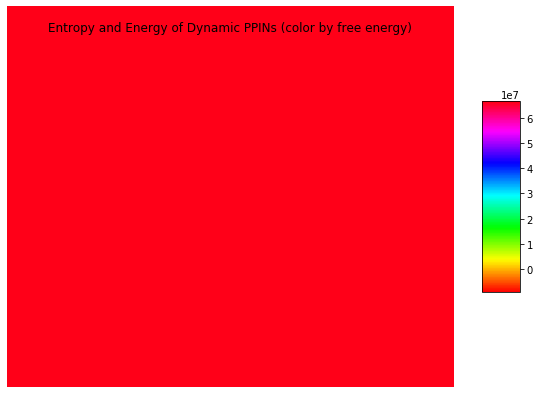

<Figure size 1080x720 with 0 Axes>

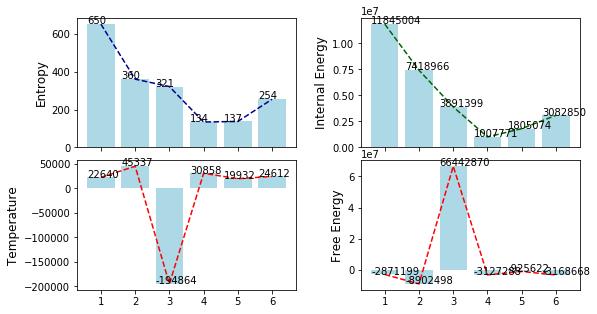

[433, 311, 316, 204, 200, 365]
[650, 360, 321, 134, 137, 254]
[6925040, 5201772, 4931297, 3159419, 3061708, 5826948]
[11845004, 7418966, 3891399, 1007771, 1805074, 3082850]


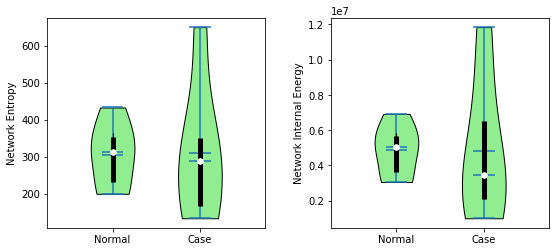

entropy_method:  1 energy_method:  2
wilcoxon: entropy distribution norm-vs-case is the same (value p-value) : 9.0 0.7531523647659145
wilcoxon: energy distribution norm-vs-case is the same (value p-value) : 9.0 0.7531523647659145
mannwhitneyu: entropy distribution norm-vs-case is the same (value p-value) : 16.0 0.40509061820523684
mannwhitneyu: energy distribution norm-vs-case is the same (value p-value) : 16.0 0.40509061820523684
ttest: entropy distribution norm-vs-case is the same (value p-value) : -0.052120891019890585 0.9594588391687167
ttest: energy distribution norm-vs-case is the same (value p-value) : 0.053165789350034236 0.9586469201285442
433 650 28314 42830 66 -589
311 360 22850 28790 121 -14936
316 321 23001 20665 -437 161179
204 134 15791 8277 107 -6163
200 137 15051 10715 68 1292
365 254 24690 16617 72 -1774


C:\Users\Qiong\chunting\tools\Anaconda3\lib\site-packages\scipy\stats\morestats.py:2778: UserWarning: Warning: sample size too small for normal approximation.
  warnings.warn("Warning: sample size too small for normal approximation.")
C:\Users\Qiong\chunting\tools\Anaconda3\lib\site-packages\scipy\stats\morestats.py:2778: UserWarning: Warning: sample size too small for normal approximation.
  warnings.warn("Warning: sample size too small for normal approximation.")


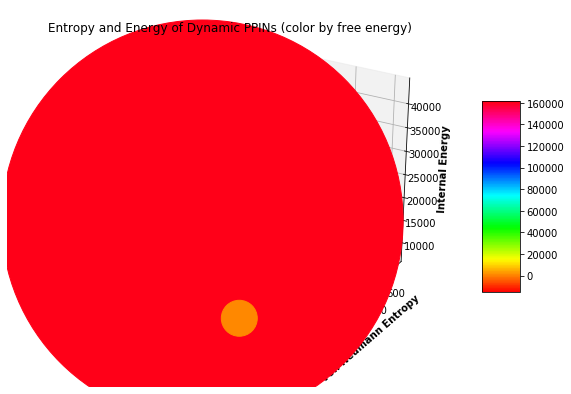

<Figure size 1080x720 with 0 Axes>

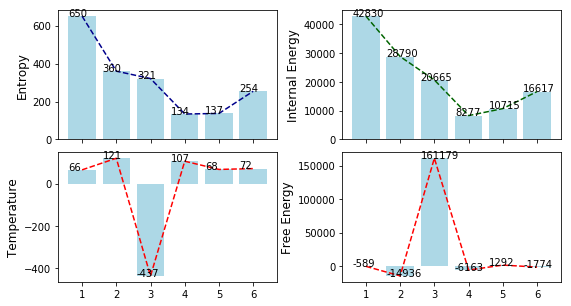

[433, 311, 316, 204, 200, 365]
[650, 360, 321, 134, 137, 254]
[28314, 22850, 23001, 15791, 15051, 24690]
[42830, 28790, 20665, 8277, 10715, 16617]


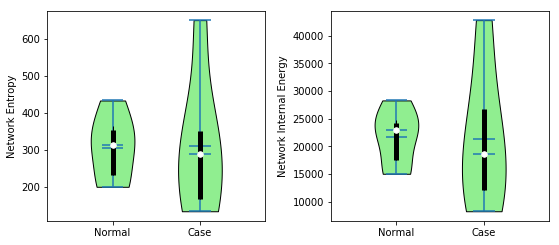

entropy_method:  2 energy_method:  1
wilcoxon: energy distribution norm-vs-case is the same (value p-value) : 10.0 0.916511907863894
mannwhitneyu: energy distribution norm-vs-case is the same (value p-value) : 15.0 0.3444602779022303
ttest: entropy distribution norm-vs-case is the same (value p-value) : nan nan
ttest: energy distribution norm-vs-case is the same (value p-value) : 0.0051610509060787835 0.9959836032581975
1 1 6925040 11845004 4406094448 -4394249444
1 1 5201772 7418966 1902194817 -1894775851
1 1 4931297 3891399 -845556010 849447409
1 1 3159419 1007771 -1518150730 1519158501
1 1 3061708 1805074 -872243047 874048121
1 1 5826948 3082850 -2275367512 2278450362


C:\Users\Qiong\chunting\tools\Anaconda3\lib\site-packages\scipy\stats\morestats.py:2778: UserWarning: Warning: sample size too small for normal approximation.
  warnings.warn("Warning: sample size too small for normal approximation.")


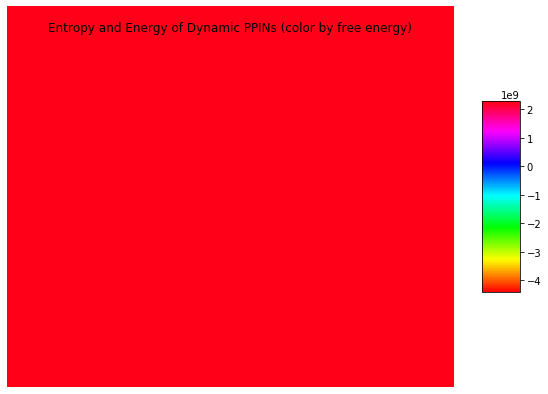

<Figure size 1080x720 with 0 Axes>

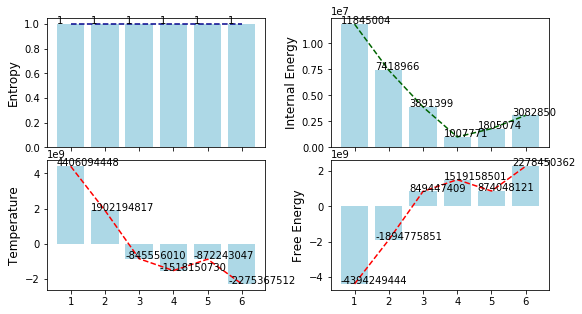

[1, 1, 1, 1, 1, 1]
[1, 1, 1, 1, 1, 1]
[6925040, 5201772, 4931297, 3159419, 3061708, 5826948]
[11845004, 7418966, 3891399, 1007771, 1805074, 3082850]


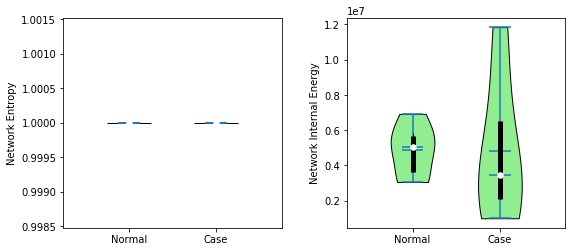

entropy_method:  2 energy_method:  2
wilcoxon: energy distribution norm-vs-case is the same (value p-value) : 9.0 0.7531523647659145
mannwhitneyu: energy distribution norm-vs-case is the same (value p-value) : 16.0 0.40509061820523684
ttest: entropy distribution norm-vs-case is the same (value p-value) : nan nan
ttest: energy distribution norm-vs-case is the same (value p-value) : 0.053165789350034236 0.9586469201285442
1 1 28314 42830 12999864 -12957034
1 1 22850 28790 5096096 -5067306
1 1 23001 20665 -1899435 1920100
1 1 15791 8277 -5301697 5309974
1 1 15051 10715 -3009662 3020377
1 1 24690 16617 -6694018 6710635


C:\Users\Qiong\chunting\tools\Anaconda3\lib\site-packages\scipy\stats\morestats.py:2778: UserWarning: Warning: sample size too small for normal approximation.
  warnings.warn("Warning: sample size too small for normal approximation.")


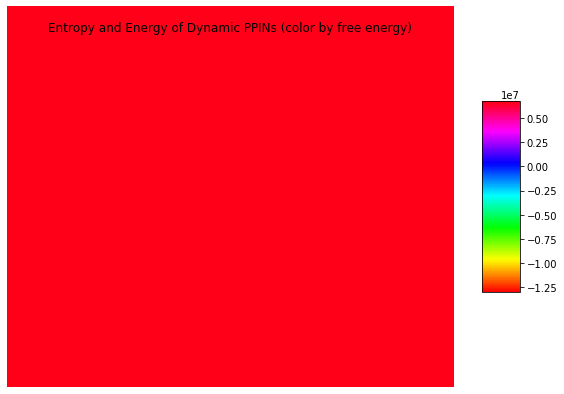

<Figure size 1080x720 with 0 Axes>

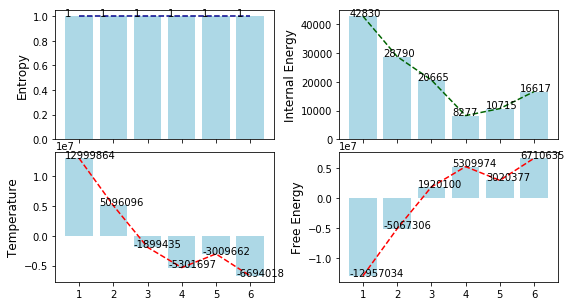

[1, 1, 1, 1, 1, 1]
[1, 1, 1, 1, 1, 1]
[28314, 22850, 23001, 15791, 15051, 24690]
[42830, 28790, 20665, 8277, 10715, 16617]


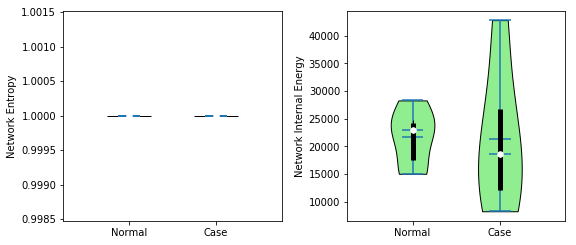

entropy_method:  3 energy_method:  1
wilcoxon: entropy distribution norm-vs-case is the same (value p-value) : 9.0 0.7531523647659145
wilcoxon: energy distribution norm-vs-case is the same (value p-value) : 10.0 0.916511907863894
mannwhitneyu: entropy distribution norm-vs-case is the same (value p-value) : 16.0 0.40509061820523684
mannwhitneyu: energy distribution norm-vs-case is the same (value p-value) : 15.0 0.3444602779022303
ttest: entropy distribution norm-vs-case is the same (value p-value) : 0.05855277946546672 0.9544618668368912
ttest: energy distribution norm-vs-case is the same (value p-value) : 0.0051610509060787835 0.9959836032581975
10232 15471 6925040 11845004 939 -2683877
8249 10326 5201772 7418966 1067 -3603135
8295 7409 4931297 3891399 1173 -4801799
5674 2994 3159419 1007771 802 -1396233
5414 3861 3061708 1805074 809 -1319230
8912 5998 5826948 3082850 941 -2564945


C:\Users\Qiong\chunting\tools\Anaconda3\lib\site-packages\scipy\stats\morestats.py:2778: UserWarning: Warning: sample size too small for normal approximation.
  warnings.warn("Warning: sample size too small for normal approximation.")
C:\Users\Qiong\chunting\tools\Anaconda3\lib\site-packages\scipy\stats\morestats.py:2778: UserWarning: Warning: sample size too small for normal approximation.
  warnings.warn("Warning: sample size too small for normal approximation.")


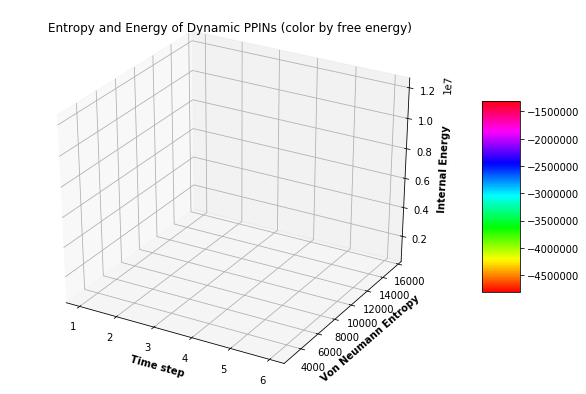

<Figure size 1080x720 with 0 Axes>

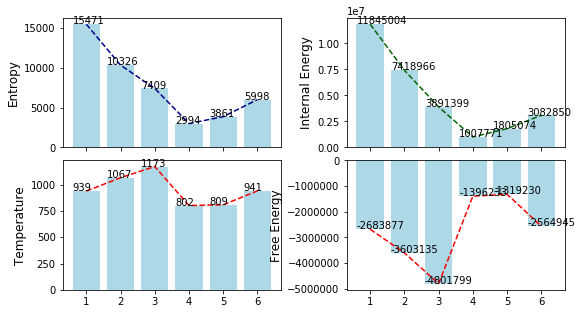

[10232, 8249, 8295, 5674, 5414, 8912]
[15471, 10326, 7409, 2994, 3861, 5998]
[6925040, 5201772, 4931297, 3159419, 3061708, 5826948]
[11845004, 7418966, 3891399, 1007771, 1805074, 3082850]


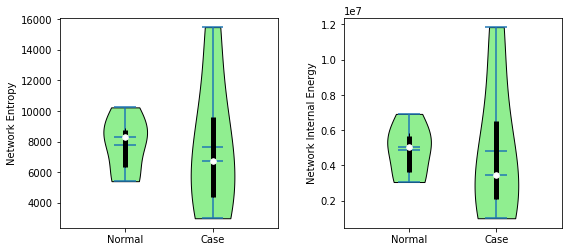

entropy_method:  3 energy_method:  2
wilcoxon: entropy distribution norm-vs-case is the same (value p-value) : 9.0 0.7531523647659145
wilcoxon: energy distribution norm-vs-case is the same (value p-value) : 9.0 0.7531523647659145
mannwhitneyu: entropy distribution norm-vs-case is the same (value p-value) : 16.0 0.40509061820523684
mannwhitneyu: energy distribution norm-vs-case is the same (value p-value) : 16.0 0.40509061820523684
ttest: entropy distribution norm-vs-case is the same (value p-value) : 0.05855277946546672 0.9544618668368912
ttest: energy distribution norm-vs-case is the same (value p-value) : 0.053165789350034236 0.9586469201285442
10232 15471 28314 42830 2 -36
8249 10326 22850 28790 2 -738
8295 7409 23001 20665 2 1136
5674 2994 15791 8277 2 -118
5414 3861 15051 10715 2 -65
8912 5998 24690 16617 2 1


C:\Users\Qiong\chunting\tools\Anaconda3\lib\site-packages\scipy\stats\morestats.py:2778: UserWarning: Warning: sample size too small for normal approximation.
  warnings.warn("Warning: sample size too small for normal approximation.")
C:\Users\Qiong\chunting\tools\Anaconda3\lib\site-packages\scipy\stats\morestats.py:2778: UserWarning: Warning: sample size too small for normal approximation.
  warnings.warn("Warning: sample size too small for normal approximation.")


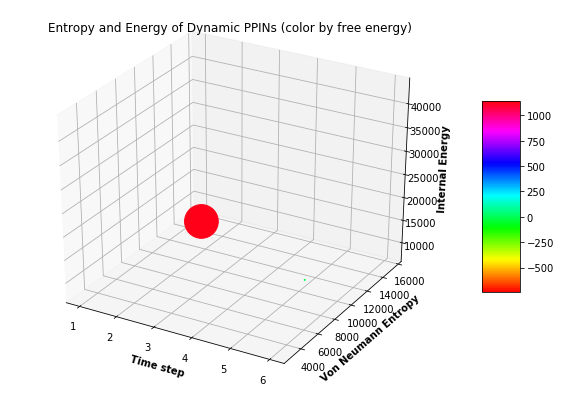

<Figure size 1080x720 with 0 Axes>

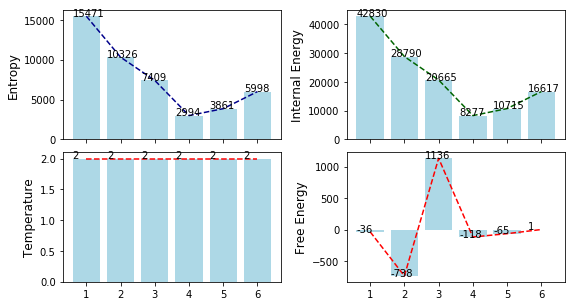

[10232, 8249, 8295, 5674, 5414, 8912]
[15471, 10326, 7409, 2994, 3861, 5998]
[28314, 22850, 23001, 15791, 15051, 24690]
[42830, 28790, 20665, 8277, 10715, 16617]


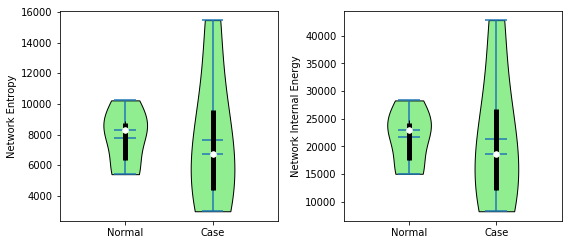

entropy_method:  5 energy_method:  1
wilcoxon: entropy distribution norm-vs-case is the same (value p-value) : 9.0 0.7531523647659145
wilcoxon: energy distribution norm-vs-case is the same (value p-value) : 10.0 0.916511907863894
mannwhitneyu: entropy distribution norm-vs-case is the same (value p-value) : 16.0 0.40509061820523684
mannwhitneyu: energy distribution norm-vs-case is the same (value p-value) : 15.0 0.3444602779022303
ttest: entropy distribution norm-vs-case is the same (value p-value) : 0.05879287529719254 0.9542753736105136
ttest: energy distribution norm-vs-case is the same (value p-value) : 0.0051610509060787835 0.9959836032581975
10261 15507 6925040 11845004 937 -2699045
8276 10357 5201772 7418966 1065 -3617865
8324 7435 4931297 3891399 1170 -4808732
5697 3012 3159419 1007771 801 -1405512
5436 3881 3061708 1805074 807 -1330273
8940 6021 5826948 3082850 940 -2577004


C:\Users\Qiong\chunting\tools\Anaconda3\lib\site-packages\scipy\stats\morestats.py:2778: UserWarning: Warning: sample size too small for normal approximation.
  warnings.warn("Warning: sample size too small for normal approximation.")
C:\Users\Qiong\chunting\tools\Anaconda3\lib\site-packages\scipy\stats\morestats.py:2778: UserWarning: Warning: sample size too small for normal approximation.
  warnings.warn("Warning: sample size too small for normal approximation.")


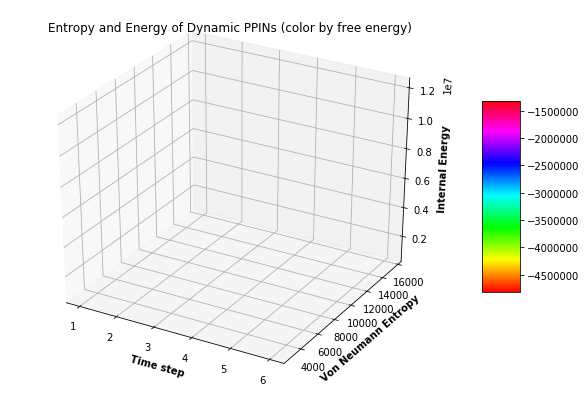

<Figure size 1080x720 with 0 Axes>

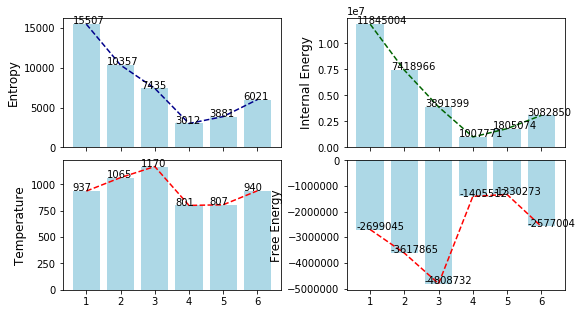

[10261, 8276, 8324, 5697, 5436, 8940]
[15507, 10357, 7435, 3012, 3881, 6021]
[6925040, 5201772, 4931297, 3159419, 3061708, 5826948]
[11845004, 7418966, 3891399, 1007771, 1805074, 3082850]


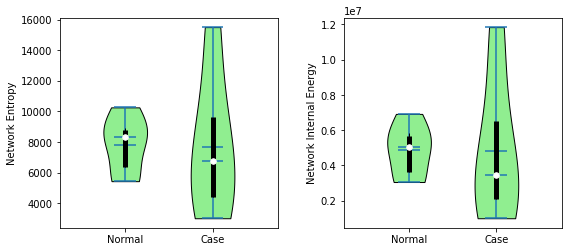

entropy_method:  5 energy_method:  2
wilcoxon: entropy distribution norm-vs-case is the same (value p-value) : 9.0 0.7531523647659145
wilcoxon: energy distribution norm-vs-case is the same (value p-value) : 9.0 0.7531523647659145
mannwhitneyu: entropy distribution norm-vs-case is the same (value p-value) : 16.0 0.40509061820523684
mannwhitneyu: energy distribution norm-vs-case is the same (value p-value) : 16.0 0.40509061820523684
ttest: entropy distribution norm-vs-case is the same (value p-value) : 0.05879287529719254 0.9542753736105136
ttest: energy distribution norm-vs-case is the same (value p-value) : 0.053165789350034236 0.9586469201285442
10261 15507 28314 42830 2 -81
8276 10357 22850 28790 2 -778
8324 7435 23001 20665 2 1121
5697 3012 15791 8277 2 -150
5436 3881 15051 10715 2 -103
8940 6021 24690 16617 2 -34


C:\Users\Qiong\chunting\tools\Anaconda3\lib\site-packages\scipy\stats\morestats.py:2778: UserWarning: Warning: sample size too small for normal approximation.
  warnings.warn("Warning: sample size too small for normal approximation.")
C:\Users\Qiong\chunting\tools\Anaconda3\lib\site-packages\scipy\stats\morestats.py:2778: UserWarning: Warning: sample size too small for normal approximation.
  warnings.warn("Warning: sample size too small for normal approximation.")


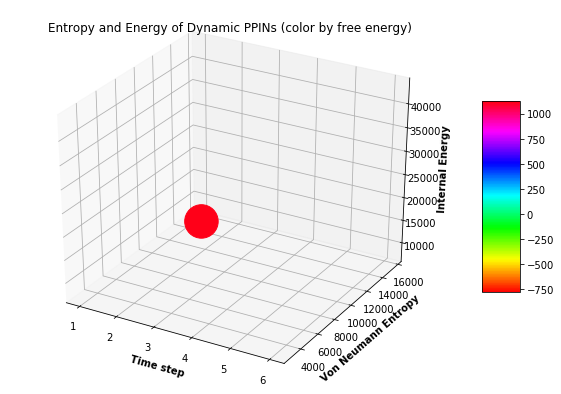

<Figure size 1080x720 with 0 Axes>

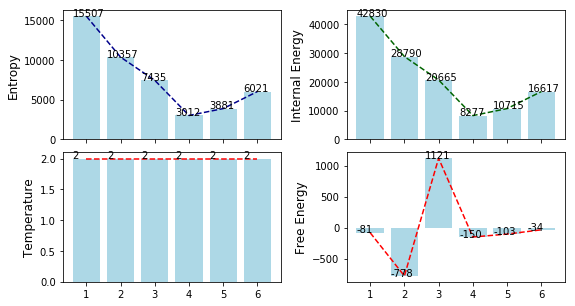

[10261, 8276, 8324, 5697, 5436, 8940]
[15507, 10357, 7435, 3012, 3881, 6021]
[28314, 22850, 23001, 15791, 15051, 24690]
[42830, 28790, 20665, 8277, 10715, 16617]


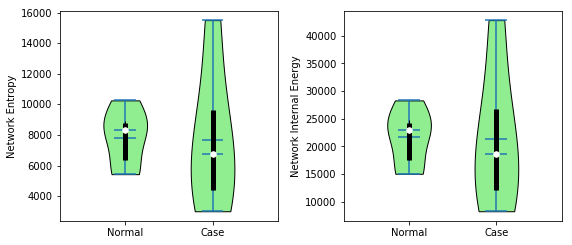

In [37]:
def validate_DPPIN(filename, entropy_method_id, energy_method_id):
    f = open(filename,"r")
    lines = f.readlines()
    f.close()
    M = [list(filter(None, x.strip().split('\t'))) for x in lines]
    entropy_normal = []
    entropy_case = []
    energy_normal = []
    energy_case = []
    temperature = []
    free_energy = []
    for i in range(1, len(M)):
        entropy = int(round(float(M[i][1 + entropy_method_id]),0))
        energy = int(round(float(M[i][5 + energy_method_id]),0))
        if (i % 2 == 1):  #normal/mock
            entropy_normal.append(entropy)
            energy_normal.append(energy)
        else:  #exp/case
            #print(entropy, float(M[i-1][1+ entropy_method_id]))
            entropy_case.append(entropy)
            energy_case.append(energy)
            if (abs(entropy-float(M[i-1][1+ entropy_method_id]))>=0.00001):
                temp = (energy-float(M[i-1][5 + energy_method_id]))/(entropy-float(M[i-1][1+ entropy_method_id]))
                temperature.append(int(temp))
                free_energy.append(int(energy - temp * entropy))
            else:
                print('row', i, ' entropy difference is close to zero')
            
    # computer wilconson t-test whether two distributions are the same around zero
    #the Mann-Whitney U-test tests two independent samples, whereas the Wilcox sign test tests two dependent samples
    if entropy_case[0] != entropy_case[1]:
        w, p = wilcoxon(entropy_normal, entropy_case)
        print('wilcoxon: entropy distribution norm-vs-case is the same (value p-value) :', w, p)
    if energy_case[0] != energy_case[1]:
        w, p = wilcoxon(energy_normal, energy_case)
        print('wilcoxon: energy distribution norm-vs-case is the same (value p-value) :', w, p)
    if entropy_case[0] != entropy_case[1]:
        w, p = mannwhitneyu(entropy_normal, entropy_case)
        print('mannwhitneyu: entropy distribution norm-vs-case is the same (value p-value) :', w, p)
    if energy_case[0] != energy_case[1]:
        w, p = mannwhitneyu(energy_normal, energy_case)
        print('mannwhitneyu: energy distribution norm-vs-case is the same (value p-value) :', w, p)
    w, p = ttest_ind(entropy_normal, entropy_case)
    print('ttest: entropy distribution norm-vs-case is the same (value p-value) :', w, p)
    w, p = ttest_ind(energy_normal, energy_case)
    print('ttest: energy distribution norm-vs-case is the same (value p-value) :', w, p)
    return entropy_normal, entropy_case, energy_normal, energy_case, temperature, free_energy

# Actios
entropy_methods = [1,2,3,5]
energy_methods = [1, 2]
filename = "".join([data_dir, '/data/', tissue, '/dppins_entropy.txt'])

for entropy_idx in range(len(entropy_methods)):
    for energy_idx in range(len(energy_methods)):
        print('entropy_method: ', entropy_methods[entropy_idx], 'energy_method: ', energy_methods[energy_idx])
        entropy_normal, entropy_case, energy_normal, energy_case, temperature, free_energy = validate_DPPIN(filename, entropy_idx, energy_idx)
        for i in range(len(entropy_normal)):
            print(entropy_normal[i], entropy_case[i], energy_normal[i], energy_case[i], temperature[i], free_energy[i])
        plot1(entropy_case, energy_case, temperature, free_energy)
        plot2(entropy_case, energy_case, temperature, free_energy)
        plot3(entropy_normal, entropy_case, energy_normal, energy_case)

#validate_DPPIN("".join([data_dir, '/data/', tissue, '/validate_DPPINsV1.txt']))


# Step 9.1 KL divergence

In [49]:
def get_node_prob(graph_adjacent_matrix, num_proteins):
    prob = np.zeros((num_proteins, ), dtype=np.float32)
    for node_id in range(num_proteins):
        count = 0
        for i in range(num_proteins):
            if (graph_adjacent_matrix[node_id][i] > 0):
                count +=1   
        if count> 0:
            prob[node_id] = count /num_proteins
    return prob

def compute_KL_divergence(mock_node_prob, exp_node_prob, num_proteins):
    kl_l_sum = 0
    kl_r_sum = 0
    for node_id in range(num_proteins):
        if exp_node_prob[node_id] > 0 and mock_node_prob[node_id] > 0:
            kl_l_sum += np.log2(mock_node_prob[node_id]/exp_node_prob[node_id])*mock_node_prob[node_id]
            kl_r_sum += np.log2(exp_node_prob[node_id]/mock_node_prob[node_id])*exp_node_prob[node_id]   
    return (kl_l_sum + kl_r_sum) /2

#Action:
time_points = 6
num_proteins = common_num_proteins
for t in range(time_points):
    mock_node_prob = get_node_prob(mock_DPPINs[t], num_proteins)
    exp_node_prob = get_node_prob(exp_DPPINs[t], num_proteins)
    kl = compute_KL_divergence(mock_node_prob, exp_node_prob, num_proteins)
    print('time point: ', str(t+1), ' KL divergence of mock at t against exp at t: ', kl)

print('Another method...')
for t in range(time_points):
    mock_node_prob = mock_act_vec_list[t]
    exp_node_prob = exp_act_vec_list[t]
    kl = compute_KL_divergence(mock_node_prob, exp_node_prob, num_proteins)
    print('time point: ', str(t+1), ' KL divergence of mock at t against exp at t: ', kl)
    
for t in range(1, time_points):
    mock_node_prob = get_node_prob(mock_DPPINs[t], num_proteins)
    exp_node_prob = get_node_prob(mock_DPPINs[t-1], num_proteins)
    kl = compute_KL_divergence(mock_node_prob, exp_node_prob, num_proteins)
    print('time point: ', str(t+1), ' KL divergence of mock at t against mock at t-1: ', kl)

for t in range(1, time_points):
    mock_node_prob = get_node_prob(exp_DPPINs[t], num_proteins)
    exp_node_prob = get_node_prob(exp_DPPINs[t-1], num_proteins)
    kl = compute_KL_divergence(mock_node_prob, exp_node_prob, num_proteins)
    print('time point: ', str(t+1), ' KL divergence of exp at t against exp at t-1: ', kl)
    
for t in range(1, time_points):
    mock_node_prob = mock_act_vec_list[t]
    exp_node_prob = mock_act_vec_list[t-1]
    kl = compute_KL_divergence(mock_node_prob, exp_node_prob, num_proteins)
    print('time point: ', str(t+1), ' KL divergence of mock at t against mock at t-1: ', kl)

for t in range(1, time_points):
    mock_node_prob = exp_act_vec_list[t]
    exp_node_prob = exp_act_vec_list[t-1]
    kl = compute_KL_divergence(mock_node_prob, exp_node_prob, num_proteins)
    print('time point: ', str(t+1), ' KL divergence of exp at t against exp at t-1: ', kl)

time point:  1  KL divergence of mock at t against exp at t:  0.7323745102039538
time point:  2  KL divergence of mock at t against exp at t:  0.7754130430403166
time point:  3  KL divergence of mock at t against exp at t:  0.4612524211697746
time point:  4  KL divergence of mock at t against exp at t:  0.405444476971752
time point:  5  KL divergence of mock at t against exp at t:  0.3927835036010947
time point:  6  KL divergence of mock at t against exp at t:  0.27923146524699405
Another method...
time point:  1  KL divergence of mock at t against exp at t:  17.921584023696944
time point:  2  KL divergence of mock at t against exp at t:  15.720922000128422
time point:  3  KL divergence of mock at t against exp at t:  19.74699104186776
time point:  4  KL divergence of mock at t against exp at t:  9.323485538776538
time point:  5  KL divergence of mock at t against exp at t:  10.624381764986783
time point:  6  KL divergence of mock at t against exp at t:  7.083688057572264
time point:  

# Step 9.2 Cross validation - critical state of disease development

C:\Users\Qiong\chunting\tools\Anaconda3\lib\site-packages\scipy\stats\morestats.py:2778: UserWarning: Warning: sample size too small for normal approximation.
  warnings.warn("Warning: sample size too small for normal approximation.")
C:\Users\Qiong\chunting\tools\Anaconda3\lib\site-packages\scipy\stats\morestats.py:2778: UserWarning: Warning: sample size too small for normal approximation.
  warnings.warn("Warning: sample size too small for normal approximation.")


wilcoxon: node centrality - (KL divergence of mock at t against mock at t-1) vs (KL divergence of exp at t against exp at t-1) is the same (value p-value) : 3.0 0.22491588401596185
wilcoxon: act prob. - (KL divergence of mock at t against mock at t-1) vs (KL divergence of exp at t against exp at t-1) is the same (value p-value) : 1.0 0.07961580146011343
mannwhitneyu: node centrality -  (KL divergence of mock at t against mock at t-1) vs (KL divergence of exp at t against exp at t-1) is the same (value p-value) : 10.0 0.33805165701157347
mannwhitneyu: act prob. - (KL divergence of mock at t against mock at t-1) vs (KL divergence of exp at t against exp at t-1) is the same (value p-value) : 3.0 0.030051402969433157
ttest: node centrality - (KL divergence of mock at t against mock at t-1) vs (KL divergence of exp at t against exp at t-1) is the same (value p-value) : -0.9838112956053078 0.3540225698529589
ttest: act prob. - (KL divergence of mock at t against mock at t-1) vs (KL divergenc

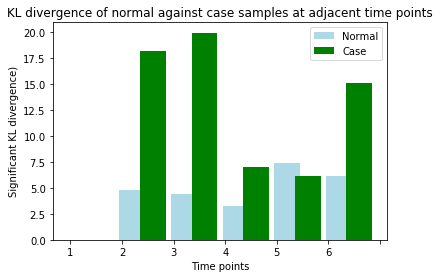

In [68]:
data1 = [1.114164658,0.496105329,0.306998483,0.272522447,1.569461232]
data2 = [3.105117243,0.998566809,1.047754427,0.166260683,1.13953323]

X = [4.820634208,4.446216727,3.284768815,7.340972782,6.135289708]
Y = [18.11531852,19.91523587,7.009294081,6.129588816,15.08587505]

w, p = wilcoxon(data1, data2)
print('wilcoxon: node centrality - (KL divergence of mock at t against mock at t-1) vs (KL divergence of exp at t against exp at t-1) is the same (value p-value) :', w, p)
w, p = wilcoxon(X, Y)
print('wilcoxon: act prob. - (KL divergence of mock at t against mock at t-1) vs (KL divergence of exp at t against exp at t-1) is the same (value p-value) :', w, p)
w, p = mannwhitneyu(data1, data2)
print('mannwhitneyu: node centrality -  (KL divergence of mock at t against mock at t-1) vs (KL divergence of exp at t against exp at t-1) is the same (value p-value) :', w, p)
w, p = mannwhitneyu(X, Y)
print('mannwhitneyu: act prob. - (KL divergence of mock at t against mock at t-1) vs (KL divergence of exp at t against exp at t-1) is the same (value p-value) :', w, p)
w, p = ttest_ind(data1, data2)
print('ttest: node centrality - (KL divergence of mock at t against mock at t-1) vs (KL divergence of exp at t against exp at t-1) is the same (value p-value) :', w, p)
w, p = ttest_ind(X, Y)
print('ttest: act prob. - (KL divergence of mock at t against mock at t-1) vs (KL divergence of exp at t against exp at t-1) is the same (value p-value) :', w, p)

from matplotlib import pyplot as plt
X = [0, 4.820634208,4.446216727,3.284768815,7.340972782,6.135289708]
Y = [0, 18.11531852,19.91523587,7.009294081,6.129588816,15.08587505]

fig, ax = plt.subplots()
plt.bar([0.20,1.20,2.20,3.20,4.20, 5.20], X,label="Normal", color='lightblue',width=.5)
#plt.plot([0.20,1.20,2.20,3.20,4.20, 5.20], X, color='darkblue', linestyle = 'dashed')
plt.bar([.60,1.60,2.60,3.60,4.60, 5.60], Y,label="Case", color='g',width=.5)
ax.set_xticklabels([0, 1, 2, 3, 4, 5, 6])
#plt.plot([.60,1.60,2.60,3.60,4.60, 5.60], Y, color='red', linestyle = 'dashed')
plt.legend()
plt.xlabel('Time points')
plt.ylabel('Significant KL divergence)')
plt.title('KL divergence of normal against case samples at adjacent time points')
plt.show()

In [ ]:
file:///C:/Users/Qiong/chunting/tbox/topics/Computational_Systems_Biology/Good%20Identifying%20critical%20state%20of%20complex.pdf
        In ideal situation with small
noise, when a complex system is near the critical point,
among all observed variables there exists a dominant
group defined as the DNB biomolecules, which satisfy
the following three conditions based on the observed
data [10]:
 The correlation (PCCin) between any pair of
members in the DNB group rapidly increases;
 The correlation (PCCout) between one member of
the DNB group and any other non-DNB member
rapidly decreases;
 The standard deviation (SDin) or coefficient of
variation for any member in the DNB group
drastically increases.

# Step 10 Verify vital nodes

# Step 11 Verify DPPNs

In [44]:
def calculate_num_of_edges(graph_adjacent_matrix):
    num_nodes = np.shape(graph_adjacent_matrix)[0] #num_of_nodes   #np.shape(graph_adjacent_matrix)[0]
    count = 0
    for i in range(num_nodes):
        for j in range(num_nodes):
            if (i != j and graph_adjacent_matrix[i,j] > 0):
                count +=1
    return int(count /2)

def perform_DPPINs_node_seq_sim(PPIN_network, mock_DPPINs, group_name1, exp_DPPINs, group_name2, id2protein, time_points, num_of_nodes, node_ids):
    for t in range(1): #time_points):
        output_temporal_seqw_bipartite_at_t = open(PPIN_network.split('/')[0] + '/' + PPIN_network.split('/')[1] + '/Dynamic_PPIN_' + group_name1 + '_' + group_name2 + '_' + str(t) +  '_seqsim.txt', 'w')
        print(t)
        mock_DPPIN = mock_DPPINs[t]
        mock_num_proteins = np.shape(mock_DPPIN)[0]
        mock_num_edges = calculate_num_of_edges(mock_DPPIN)
        
        exp_DPPIN = exp_DPPINs[t]
        exp_num_proteins = np.shape(exp_DPPIN)[0]
        exp_num_edges = calculate_num_of_edges(exp_DPPIN)
        
        mock_proteins = set()
        exp_proteins = set()

        for j in range(mock_num_proteins):
            for k in range(mock_num_proteins):
                if mock_DPPIN[j, k] > 0:
                    mock_proteins.add(id2protein[j])
                    mock_proteins.add(id2protein[k])

        for j in range(exp_num_proteins):
            for k in range(exp_num_proteins):        
                if exp_DPPIN[j, k] > 0:
                    exp_proteins.add(id2protein[j])
                    exp_proteins.add(id2protein[k])   

        #print(len(mock_proteins))
        seq_align_set = set()
        for gene1 in mock_proteins:
            for gene2 in exp_proteins:
                seq_align = pairwise2.align.globalxx(gene1, gene2)
                if (seq_align[0][2]>0):
                    #if (len(mock_proteins) <= len(exp_proteins)):
                    if (mock_num_edges <= exp_num_edges):
                        seq_align_set.add((gene1, gene2, seq_align[0][2]))
                    else:
                        seq_align_set.add((gene2, gene1, seq_align[0][2]))  
        
        for (gene1, gene2, value) in seq_align_set:
            output_temporal_seqw_bipartite_at_t.write(gene1 + ' ' + gene2 + ' ' + str(value) + '\n')
      
        output_temporal_seqw_bipartite_at_t.close()
    
# Action
perform_DPPINs_node_seq_sim(PPIN_network, mock_DPPINs, 'mock', exp_DPPINs, 'exp', id2protein, time_points, common_num_proteins, common_protein_set)
print('done')


0
done


In [37]:
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx

def community_layout(g, partition):
    """
    Compute the layout for a modular graph.


    Arguments:
    ----------
    g -- networkx.Graph or networkx.DiGraph instance
        graph to plot

    partition -- dict mapping int node -> int community
        graph partitions


    Returns:
    --------
    pos -- dict mapping int node -> (float x, float y)
        node positions

    """

    pos_communities = _position_communities(g, partition, scale=3.)

    pos_nodes = _position_nodes(g, partition, scale=1.)

    # combine positions
    pos = dict()
    for node in g.nodes():
        pos[node] = pos_communities[node] + pos_nodes[node]

    return pos

def _position_communities(g, partitions, **kwargs):

#    for p_name in partitions:
#        partition = partitions[p_name]
    # create a weighted graph, in which each node corresponds to a community,
    # and each edge weight to the number of edges between communities
    between_community_edges = _find_between_community_edges(g, partition)

    communities = set(partition.values())
    hypergraph = nx.DiGraph()
    hypergraph.add_nodes_from(communities)
    for (ci, cj), edges in between_community_edges.items():
        hypergraph.add_edge(ci, cj, weight=len(edges))

    # find layout for communities
    pos_communities = nx.spring_layout(hypergraph, **kwargs)

    # set node positions to position of community
    pos = dict()
    for node, community in partition.items():
        pos[node] = pos_communities[community]

    return pos

def _find_between_community_edges(g, partition):

    edges = dict()

    for (ni, nj) in g.edges():
        ci = partition[ni]
        cj = partition[nj]

        if ci != cj:
            try:
                edges[(ci, cj)] += [(ni, nj)]
            except KeyError:
                edges[(ci, cj)] = [(ni, nj)]

    return edges

def _position_nodes(g, partition, **kwargs):
    """
    Positions nodes within communities.
    """

    communities = dict()
    for node, community in partition.items():
        try:
            communities[community] += [node]
        except KeyError:
            communities[community] = [node]

    pos = dict()
    for ci, nodes in communities.items():
        subgraph = g.subgraph(nodes)
        pos_subgraph = nx.spring_layout(subgraph, **kwargs)
        pos.update(pos_subgraph)

    return pos

def test():
    # to install networkx 2.0 compatible version of python-louvain use:
    # pip install -U git+https://github.com/taynaud/python-louvain.git@networkx2
    from community import community_louvain

    g = nx.karate_club_graph()
    partition = community_louvain.best_partition(g)
    modularity2 = community.modularity(louvain_partition, g, weight='weight')
    pos = community_layout(g, partition)

    nx.draw(g, pos, node_color=list(partition.values())); plt.show()
    return

#

In [9]:
# Generating dynamic networks
tissue = 'lung'
gene_expression = 'data/GSE28166.txt'
PPIN_network_list = ['data/lung/Static_PPIN.txt']
significant_genes = 'data/GSE28166_significant_genes.txt'
time_points = 6

#for PPIN_network in PPIN_network_list:
if True:
    PPIN_network = 'data/lung/Static_PPIN.txt'
    # - Get common appeared proteins (i.e., genes) from PPI network and GSE3431 gene expression data - #
    common_protein_set, protein2id, id2protein, num_proteins = get_common_proteins(gene_expression, PPIN_network, significant_genes)
    print('----------------------------------------------------------------------------------------------------')
    print('Static PPI network: ' + PPIN_network.split('/')[1])
    print('Not every protein has to be active, actual number of nodes may be fewer than ' + str(num_proteins))

    # - GSE3431 has totally 36 time intervals (i.e., time stamps) - #
    groups = 2
    time_points = 6  # - GSE28166 Calu-3 cells were infected with VN1203 influenza virus and profiled at 0, 3, 7, 12, 18, and 24 hours post infection. There are 3 mock and infected replicates for each time point. #
    #num_cycles = 6  # - GSE3431 has 3 consecutive cycles - #
    replicates = 3
    
    # - Get the active prob. of each gene at each time stamp via expression values - #
    # act_vec_list, gene_expression_value #
    mock_act_vec_list, exp_act_vec_list, mock_gene_expression_value, exp_gene_expression_value = get_temporal_act_prob(groups, time_points, replicates, num_proteins, protein2id, gene_expression)

    # - Output node features - #
    output_node_features = open(PPIN_network.split('/')[0] + '/' + PPIN_network.split('/')[1] + '/Node_Features_mock.txt', 'w+')
    for idx in range(num_proteins):
        output_node_features.write(str(idx) + ',' + str(id2protein[idx]) + ',' + ','.join(map(str, mock_gene_expression_value[idx, :])) + '\n')
    output_node_features.close()
    output_node_features = open(PPIN_network.split('/')[0] + '/' + PPIN_network.split('/')[1] + '/Node_Features_exp.txt', 'w+')
    for idx in range(num_proteins):
        output_node_features.write(str(idx) + ',' + str(id2protein[idx]) + ',' + ','.join(map(str, exp_gene_expression_value[idx, :])) + '\n')
    output_node_features.close()
    
    # - Load static PPI network - #
    adj_matrix = load_static_PPI(num_proteins, PPIN_network, protein2id)

    # - Generate dynamic PPI network - #
    mock_DPPINs = generate_dynamic_PPI(PPIN_network, id2protein, time_points, mock_act_vec_list, num_proteins, mock_gene_expression_value, 'mock')
    exp_DPPINs = generate_dynamic_PPI(PPIN_network, id2protein, time_points, exp_act_vec_list, num_proteins, exp_gene_expression_value, 'exp')
    
    perform_DPPINs_node_seq_sim(PPIN_network, mock_DPPINs, 'mock', exp_DPPINs, 'exp', id2protein, time_points)
    
#    with open("".join([data_dir, '/data/', tissue, '/validate_DPPINs.txt']), 'w') as f:
#        for time_point in range(time_points):
#            mock_DPPIN = mock_DPPINs[time_point]
#            filename = '_'.join(['mock_t', str(time_point)])
#            perform_network_validation = perform_network_validation(mock_DPPIN, filename, f)
            
#            exp_DPPIN = exp_DPPINs[time_point]
#            filename = '_'.join(['exp_t', str(time_point)])
#            perform_network_validation(exp_DPPIN, filename, f)            
#    f.close()
#    validate_DPPIN("".join([data_dir, '/data/', tissue, '/validate_DPPINs.txt']))

In [ ]:
def getAllPairs(DPPIN):
    num_nodes = np.shape(DPPIN)[0]
    allpairs_associations = dict()
    for i in range(num_nodes):
        for j in range(i+1, num_nodes):
            if DPPIN[i,j] > 0:
                allpairs_associations[i,j] = DPPIN[i,j]
    return allpairs_associations

def getAllPath(DPPIN):
    num_nodes = np.shape(DPPIN)[0]
    g = Graph(num_nodes)
    g.constructGraph(DPPIN)
    print('getAllPath--- finish the constructGraph')
    allpaths, num_of_paths, allpairs_num_of_paths = g.getAllPaths() 
    return allpaths, num_of_paths, allpairs_num_of_paths

def count_common_complexes(complexes, gene_i, gene_j, complexes_genes, complexes_genes_syn):
    count = 0
    common_complex_names = []
    for i in range(len(complexes_genes)):
        group = complexes_genes[i] + complexes_genes_syn[i]
        if gene_i in group and gene_i in group:
            count += 1
            common_complex_names.append(complexes['ComplexName'][i])
    return count, list(set(common_complex_names))

def getCommonComplex(allpairs_num_of_paths, id2protein):
    complexes = pd.read_excel("".join([data_dir, '/data/', 'humanComplexes.xlsx']), sheet_name = 'humanComplexes')
    complexes_genes_strings = complexes['subunits(Gene name)']
    complexes_genes_syn_strings = complexes['subunits(Gene name syn)']
    complexes_genes = [list(filter(None, genes.strip().split(';')))  for genes in complexes_genes_strings]
    complexes_genes_syn = [list(filter(None, genes.strip().split(';')))  for genes in complexes_genes_syn_strings]
    total_complexes = len(complexes_genes_strings)
    
    allpairs_num_of_complexes = dict()
    allpairs_num_of_complexes_names = defaultdict(list)
    for i,j in allpairs_num_of_paths:
        gene_i = id2protein[i]
        gene_j = id2protein[j]
        count, common_complex_names = count_common_complexes(complexes, gene_i, gene_j, complexes_genes, complexes_genes_syn)
        allpairs_num_of_complexes[i,j] = count   #/total_complexes
        allpairs_num_of_complexes_names[i,j] = common_complex_names
    return allpairs_num_of_complexes, allpairs_num_of_complexes_names, total_complexes

def count_common_pathways(gene_pathways_dict, gene_i, gene_j):
    pathway_i = list(set(gene_pathways_dict[gene_i]))
    pathway_j = list(set(gene_pathways_dict[gene_j]))
    common_pathway_names = [value for value in pathway_i if value in pathway_j]
    return len(common_pathway_names), common_pathway_names

def getCommonPathways(allpairs_num_of_paths, id2protein):
    gene_pathways = pd.read_excel("".join([data_dir, '/data/', 'CTD_genes_pathways.xlsx']), sheet_name = 'CTD_genes_pathways')
    gene_pathways_dict = defaultdict(list)
    for i in range(len(gene_pathways['GeneSymbol'])):
        gene_pathways_dict[gene_pathways['GeneSymbol'][i]].append(gene_pathways['PathwayID'][i])
    total_pathways = len(set(gene_pathways['PathwayID']))
    
    allpairs_num_of_pathways_percentage = dict()
    allpairs_num_of_pathways_names = defaultdict(list)
    for i,j in allpairs_num_of_paths:
        gene_i = id2protein[i]
        gene_j = id2protein[j]
        
        count, common_pathways_names = count_common_pathways(gene_pathways_dict, gene_i, gene_j)
        allpairs_num_of_pathways_percentage[i,j] = count   #/total_pathways
        allpairs_num_of_pathways_names[i,j] = common_pathways_names
    return allpairs_num_of_pathways_percentage, allpairs_num_of_pathways_names, total_pathways

def perform_path_analysis(DPPIN, id2protein, group_name, time_point):
    print('...getAllPairs')
    allpairs_associations = getAllPairs(DPPIN)
    print(allpairs_associations)
    print('...getAllPath')
    allpaths, num_of_paths, allpairs_num_of_paths = getAllPath(DPPIN)
    print('#(total paths)', sum(num_of_paths))
    #print(num_of_paths)
    #print(allpairs_num_of_paths)
    print('...getAllPath percentage')
    allpairs_num_of_paths_prob = dict()
    for i,j in allpairs_num_of_paths:
        allpairs_num_of_paths_prob[i,j] = allpairs_num_of_paths[i,j] / sum(num_of_paths)
        
    print('...getCommonComplex')    
    allpairs_num_of_complexes, allpairs_num_of_complexes_names, total_complexes = getCommonComplex(allpairs_num_of_paths, id2protein)
    
    print('...getCommonPathways')  
    allpairs_num_of_pathways, allpairs_num_of_pathways_names, total_pathways = getCommonPathways(allpairs_num_of_paths, id2protein)
    
    filename="".join([data_dir, '/data/', tissue, '/DPPINs_', group_name,'_t', str(time_point), '_pairs.txt'])
    print('...writing...', filename) 
    with open(filename, 'w') as f:
        f.write(' '.join(['sum(num_of_paths):', str(sum(num_of_paths)), 'total_complexes', str(total_complexes), 'total_pathways', str(total_pathways)]))
        for i,j in allpairs_associations:
            if (i,j) not in allpairs_num_of_paths:
                allpairs_num_of_paths[i,j] = 0
                allpairs_num_of_complexes[i,j] = 0
                allpairs_num_of_pathways[i,j] = 0
                
            #print(allpairs_associations[i,j])
            #print(allpairs_num_of_paths_prob[i,j])
            #print(allpairs_num_of_complexes[i,j])
            #print(allpairs_num_of_complexes[i,j])
            #print(str(allpairs_num_of_pathways[i,j]))
            #print(','.join(allpairs_num_of_pathways_names[i,j]))
            
            f.write(' '.join([id2protein[i], id2protein[j], str(allpairs_associations[i,j]), 
                              str(allpairs_num_of_paths[i,j]),str(allpairs_num_of_complexes[i,j]), ','.join(allpairs_num_of_complexes_names[i,j]), str(allpairs_num_of_pathways[i,j]), ','.join(allpairs_num_of_pathways_names[i,j]), '\n']))
    f.close()
    return allpairs_associations, allpairs_num_of_paths_prob, allpairs_num_of_complexes, allpairs_num_of_pathways
    
# get all paths of dynamic PPINs, check common complexes and common pathways
mock_allpairs_associations = []
mock_allpairs_num_of_paths_prob = []
mock_allpairs_num_of_complexes = []
mock_allpairs_num_of_pathways = []
exp_allpairs_associations = []
exp_allpairs_num_of_paths_prob = []
exp_allpairs_num_of_complexes = []
exp_allpairs_num_of_pathways = []
for time_point in range(time_points):
    print('mock', time_point)
    mock_DPPIN = mock_DPPINs[time_point]
    allpairs_associations, allpairs_num_of_paths_prob, allpairs_num_of_complexes, allpairs_num_of_pathways = perform_path_analysis(mock_DPPIN, id2protein, 'mock',time_point)
    mock_allpairs_associations.append(allpairs_associations)
    mock_allpairs_num_of_paths_prob.append(allpairs_num_of_paths_prob)
    mock_allpairs_num_of_complexes.append(allpairs_num_of_complexes)
    mock_allpairs_num_of_pathways.append(allpairs_num_of_pathways)
    
    print('exp', time_point)
    exp_DPPIN = exp_DPPINs[time_point]
    allpairs_associations, allpairs_num_of_paths_prob, allpairs_num_of_complexes, allpairs_num_of_pathways = perform_path_analysis(exp_DPPIN, id2protein, 'exp',time_point)
    exp_allpairs_associations.append(allpairs_associations)
    exp_allpairs_num_of_paths_prob.append(allpairs_num_of_paths_prob)
    exp_allpairs_num_of_complexes.append(allpairs_num_of_complexes)
    exp_allpairs_num_of_pathways.append(allpairs_num_of_pathways)

In [ ]:
with open("".join([data_dir, '/data/', tissue, '/validate_DPPINs.txt']), 'w') as f:
    for time_point in range(time_points):
        mock_DPPIN = mock_DPPINs[time_point]
        filename = '_'.join(['mock_t', str(time_point)])
        perform_network_validation(mock_DPPIN, filename, f)
        exp_DPPIN = exp_DPPINs[time_point]
        filename = '_'.join(['exp_t', str(time_point)])
        perform_network_validation(exp_DPPIN, filename, f)            
f.close()
#validate_DPPIN("".join([data_dir, '/data/', tissue, '/validate_DPPINs']))

In [20]:
import heapq

def calculate_distances(graph, starting_vertex):
    distances = {vertex: float('infinity') for vertex in graph}
    distances[starting_vertex] = 0

    pq = [(0, starting_vertex)]
    while len(pq) > 0:
        current_distance, current_vertex = heapq.heappop(pq)

        # Nodes can get added to the priority queue multiple times. We only
        # process a vertex the first time we remove it from the priority queue.
        if current_distance > distances[current_vertex]:
            continue

        for neighbor, weight in graph[current_vertex].items():
            distance = current_distance + weight

            # Only consider this new path if it's better than any path we've
            # already found.
            if distance < distances[neighbor]:
                distances[neighbor] = distance
                heapq.heappush(pq, (distance, neighbor))

    return distances


newgraph = {
    'U': {'V': 2, 'W': 5, 'X': 3},
    'V': {'U': 5, 'X': 1, 'W': 3},
    'W': {'V': 3, 'U': 5, 'X': 3, 'Y': 7, 'Z': 5},
    'X': {'U': 1, 'V': 2, 'W': 3, 'Y': 1},
    'Y': {'X': 2, 'W': 3, 'Z': 6},
    'Z': {'W': 5, 'Y': 6},
}
print(calculate_distances(newgraph, 'X'))

{'U': 1, 'V': 2, 'W': 3, 'X': 0, 'Y': 1, 'Z': 7}


In [ ]:
validate_DPPIN("".join([data_dir, '/data/', tissue, '/validate_DPPINs.txt']))

In [ ]:
# dynamic network alignment

In [64]:
from __future__ import print_function
import PSB2009_3opt_2 as psb09   #noseq2
import matching as match

import importlib

importlib.reload(psb09)
importlib.reload(match)

import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt; plt.ion()
from community import community_louvain

# Given any two graphs, where graph vertices include gene symbols, compute the sequence similarity of nodes from smaller 
# graph to larger graph based on the number of edges
def perform_DPPIN_node_seq_sim(graph1, graph2, seqSimfile):
    graph1_num_of_edges = graph1.number_of_edges()
    graph2_num_of_edges = graph2.number_of_edges()
    
    output_seqw_bipartite = open(seqSimfile, 'w')
    seq_align_set = set()
    for gene1 in graph1.nodes():
        for gene2 in graph2.nodes():
            seq_align = pairwise2.align.globalxx(gene1, gene2)
            if (seq_align[0][2]>0):
                #if (len(mock_proteins) <= len(exp_proteins)):
                if (graph1_num_of_edges <= graph2_num_of_edges):
                    seq_align_set.add((gene1, gene2, seq_align[0][2]))
                else:
                    seq_align_set.add((gene2, gene1, seq_align[0][2]))  
        
    for (gene1, gene2, value) in seq_align_set:
        output_seqw_bipartite.write(gene1 + ' ' + gene2 + ' ' + str(value) + '\n')

    output_seqw_bipartite.close() 
    
def make_node_positions(graph,partition_attr,partition_order=None,epsilon=.5):
    #print('partition_order:', partition_order)
    if not partition_order:
        # get a list of all the partition names if not specified
        partition_order = list(set(dict(graph.nodes(data=partition_attr)).values()))
    
    # make position dict for each partition
    orig_partition_pos_dicts = {partition:nx.spring_layout(graph.subgraph([node for node,part in graph.nodes(data=partition_attr)
                                                                                      if part == partition]))
                                for partition in partition_order}
    
    # update the x coordinate in the position dicts so partitions
    # don't overlap and are in the specified order left-to-right
    final_pos_dict = orig_partition_pos_dicts[partition_order[0]]
    max_previous =10
    current_min = 0
    for i,partition in enumerate(partition_order[1:]):
        print(i, partition)
        if len(final_pos_dict.values())>0: 
            # get the largest x coordinate from the previous partition's nodes
            max_previous = max([x for x,y in final_pos_dict.values()])
            # get smallest x coordinate from this partition's nodes
        if len(orig_partition_pos_dicts[partition].values()) > 0:
            current_min = min([x for x,y in orig_partition_pos_dicts[partition].values()])
            # update the x coordinates for this partition to be at least epsilon units
            # to the right of the right-most node in the previous partition
        final_pos_dict.update({node:(pos[0]+max_previous+abs(current_min)+epsilon,pos[1])
                                               for node,pos in orig_partition_pos_dicts[partition].items()})
    return(final_pos_dict)

def alignment(G1, G2, filename4pair, f):
    if G1.number_of_nodes == 0 or G2.number_of_nodes == 0:
        return
    
    plt.figure(figsize=(4, 4))
    options = {"edgecolors": "tab:gray", "node_size": 500, "alpha": 0.9}
    
    seqSimfile = PPIN_network.split('/')[0] + '/' + PPIN_network.split('/')[1] + '/Dynamic_PPIN_' + filename4pair +  '_seqsim.txt'
    perform_DPPIN_node_seq_sim(G1, G2, seqSimfile)
    GS = psb09.graphScores(seqSimfile)   #"pairwise_sequence_similarity_of_network1_and_2.evals")
    #print(G1.nodes)
    #print(G2.nodes)
    #print(GS.edges())
    M0 = match.max_weight_matching(GS) #run hungorian algorithm to produce initial alignment  
    (S, M) = psb09.processOnce(G1, G2, GS, M0, 0.6, 200) #run PISwap
    AlignG = nx.Graph()
    #output the alignment result
    F = open(PPIN_network.split('/')[0] + '/' + PPIN_network.split('/')[1] + '/Dynamic_PPIN_' + filename4pair + '_match_output.txt','w')
    for node in M:
        print(node+" "+M[node], file = F)
        AlignG.add_edge(node, M[node])
    F.close()
    
    # Write plots to files
    #%% Function to make position dicts by partition
    set1 = set()
    set2 = set()
    for node in G1.nodes():
        set1.add(node)
    for node in G2.nodes():
        set2.add(node)
    nxCommon = set1.intersection(set2)
    common2G1 = []
    nxG1 = nx.Graph()
    for node in G1.nodes():
        if node not in nxCommon:
            nxG1.add_node(node)
    for (u, v) in G1.edges():
        if not (u in nxCommon or v in nxCommon):
            nxG1.add_edge(u, v)
        else:
            common2G1.append((u,v))
    common2G2 = []
    nxG2 = nx.Graph()
    for node in G2.nodes():
        if node not in nxCommon:
            nxG2.add_node(node)
    for (u, v) in G2.edges():
        if not (u in nxCommon or v in nxCommon):
            nxG2.add_edge(u, v)
        else:
            common2G2.append((u,v))
    nxCommonG = nx.Graph()
    for item in nxCommon:
        nxCommonG.add_node(item)

    # edges to connect the components
    extra_edges = [(u, v) for (u,v) in AlignG.edges()]
    list_extra_edge_strs = [','.join([u,v]) for (u,v) in AlignG.edges()]
    
    # combine graphs and specify the original graphs
    orig_graphs = {'nxG1':{'graph':nxG1,'color':'red'},
                   'common':{'graph':nxCommonG,'color':'blue'},
                   'nxG2':{'graph':nxG2,'color':'green'}}

    f.write(' '.join(['G1 nodes:', ' '.join(list(set1)),'\n']))
    f.write(' '.join(['G2 nodes:', ' '.join(list(set2)),'\n']))
    f.write(' '.join(['AlignG edges:', '\n'.join(list_extra_edge_strs),'\n']))
    
    nxOutputG = nx.MultiGraph()
    #pos = community_layout(nxOutputG, allPartition)
    for g_name,g_val_dict in orig_graphs.items():
        # add the nodes from that graph and specify the partition and node colors
        nxOutputG.add_nodes_from(g_val_dict['graph'].nodes,partition=g_name,color=g_val_dict['color'])
        if len(g_val_dict['graph'].edges) > 0:
            # if the graph has edges then add the edges
            nxOutputG.add_edges_from(g_val_dict['graph'].edges,partition=g_name,color=g_val_dict['color'])

    # add the extra edges to combine the graphs
    nxOutputG.add_edges_from(extra_edges,color='black')
    nxOutputG.add_edges_from(common2G1,color='red')
    nxOutputG.add_edges_from(common2G2,color='green')

    ##%% Draw graph #####
    my_pos = make_node_positions(nxOutputG,partition_attr='partition',partition_order=['nxG1','common', 'nxG2'])
    nx.draw_networkx_nodes(nxOutputG,my_pos,node_color=[c for n,c in nxOutputG.nodes(data='color')], **options)
    nx.draw_networkx_labels(nxOutputG,my_pos)
    nx.draw_networkx_edges(nxOutputG,my_pos,edge_color=[c for u,v,c in nxOutputG.edges(data='color')], **options)

    #plot_instance = netgraph.InteractiveGraph(nxOutputG, node_positions=my_pos)
    ######## drag nodes around #########
    # To access the new node positions:
    #node_positions = plot_instance.node_positions

    plt.tight_layout()
    plt.axis("off")
    
    plt.savefig(PPIN_network.split('/')[0] + '/' + PPIN_network.split('/')[1] + '/Dynamic_PPIN_' + filename4pair + '_match_output.png', format="PNG")
    plt.show(block=False)
    return S

def get_complex_nodes(graph, partition, complexid):
    nodes = []
    for item in partition:
        if partition[item] == complexid:
            nodes.append(item)
    return nodes

In [ ]:
tissue = 'lung'
gene_expression = 'data/GSE28166.txt'
PPIN_network_list = ['data/lung/Static_PPIN.txt']
significant_genes = 'data/GSE28166_significant_genes.txt'

with open("".join([data_dir, '/data/', tissue, '/mock-exp_PPINs_alignment.txt']), 'w') as f:
# Align mock dynamic PPI with exp. dynamic PPI
    for PPIN_network in PPIN_network_list:
        group_name1 = 'mock'
        group_name2 = 'exp'
        time_interval = 6
        for t in range(time_interval):
            print('==> ' + str(t) + ' ----------------------------------------')
            graph1_name = "".join([PPIN_network.split('/')[0],'/',PPIN_network.split('/')[1],'/Dynamic_PPIN_',group_name1,'_',str(t),'_sim.txt'])
            graph2_name = "".join([PPIN_network.split('/')[0],'/',PPIN_network.split('/')[1],'/Dynamic_PPIN_',group_name2,'_',str(t),'_sim.txt'])
            filename4pair = "".join([group_name1,'_',group_name2,'_',str(t)])

            G1 = psb09.getGraph(graph1_name) #input network1
            G2 = psb09.getGraph(graph2_name)#input network2

            print('==> Align ' + graph1_name + '---' + graph2_name)
            alignment(G1, G2, filename4pair, f)
f.close()

In [ ]:
tissue = 'lung'
gene_expression = 'data/GSE28166.txt'
PPIN_network_list = ['data/lung/Static_PPIN.txt']
significant_genes = 'data/GSE28166_significant_genes.txt'

with open("".join([data_dir, '/data/', tissue, '/exp_PPINs_alignment.txt']), 'w') as f:
# Align mock dynamic PPI with exp. dynamic PPI
    for PPIN_network in PPIN_network_list:
        group_name1 = 'mock'
        group_name2 = 'exp'
        time_interval = 6
        for t in range(time_interval-1):
            print('==> ' + str(t) + ' ----------------------------------------')
            graph1_name = "".join([PPIN_network.split('/')[0],'/',PPIN_network.split('/')[1],'/Dynamic_PPIN_',group_name1,'_',str(t),'_sim.txt'])
            graph2_name = "".join([PPIN_network.split('/')[0],'/',PPIN_network.split('/')[1],'/Dynamic_PPIN_',group_name1,'_',str(t+1),'_sim.txt'])
            filename4pair = "".join([group_name1,'_',group_name2,'_',str(t)])

            G1 = psb09.getGraph(graph1_name) #input network1
            G2 = psb09.getGraph(graph2_name)#input network2

            print('==> Align ' + graph1_name + '---' + graph2_name)
            alignment(G1, G2, filename4pair, f)
f.close()

In [ ]:
# complex alignments

In [ ]:
tissue = 'lung'
gene_expression = 'data/GSE28166.txt'
PPIN_network_list = ['data/lung/Static_PPIN.txt']
significant_genes = 'data/GSE28166_significant_genes.txt'

group_name1 = 'mock'
group_name2 = 'exp'
with open("".join([data_dir, '/data/', tissue, '/', group_name1, '_', group_name2, '_complex_alignment.txt']), 'w') as f:
    # Align mock dynamic PPI with exp. dynamic PPI
    for PPIN_network in PPIN_network_list:
        time_interval = 6
        
        for t in range(time_interval):
            print('==> ' + str(t) + ' ----------------------------------------')
            graph1_name = "".join([PPIN_network.split('/')[0],'/',PPIN_network.split('/')[1],'/Dynamic_PPIN_',group_name1,'_',str(t),'_sim.txt'])
            graph2_name = "".join([PPIN_network.split('/')[0],'/',PPIN_network.split('/')[1],'/Dynamic_PPIN_',group_name2,'_',str(t),'_sim.txt'])

            G1 = psb09.getGraph(graph1_name) #input network1
            G2 = psb09.getGraph(graph2_name)#input network2
            # partition
            partitionG1 = community_louvain.best_partition(G1)
            partitionG2 = community_louvain.best_partition(G2)

            for complexG1 in list(set(partitionG1.values())):
                partitionG1_nodes = get_complex_nodes(G1, partitionG1, complexG1)
                for complexG2 in list(set(partitionG2.values())):
                    partitionG2_nodes = get_complex_nodes(G2, partitionG2, complexG2)
                    G1_complex = G1.subgraph(partitionG1_nodes)
                    G2_complex = G1.subgraph(partitionG2_nodes)
                    filename4pair = "".join([group_name1,'_c', str(complexG1), '_',group_name2,'_c', str(complexG2),'_',str(t)])

                    #print('==> Align ' + "".join([group_name1,'_c', str(complexG1), '_',group_name2,'_c', str(complexG2),'_',str(t)]))
                    complex_align_score = alignment(G1_complex, G2_complex, filename4pair, f)
                    f.write(' '.join([''.join(['t', str(t), group_name1,'_c', str(complexG1)]), ''.join([group_name2, '_c', str(complexG2)]), str(complex_align_score), '\n']))
f.close()

In [ ]:
tissue = 'lung'
gene_expression = 'data/GSE28166.txt'
PPIN_network_list = ['data/lung/Static_PPIN.txt']
significant_genes = 'data/GSE28166_significant_genes.txt'

group_name1 = 'exp'
group_name2 = 'exp'
with open("".join([data_dir, '/data/', tissue, '/', group_name1, '_', group_name2, '_complex_alignment.txt']), 'w') as f:
    # Align mock dynamic PPI with exp. dynamic PPI
    for PPIN_network in PPIN_network_list:
        time_interval = 6
        
        for t in range(time_interval-1):
            print('==> ' + str(t) + ' ----------------------------------------')
            graph1_name = "".join([PPIN_network.split('/')[0],'/',PPIN_network.split('/')[1],'/Dynamic_PPIN_',group_name1,'_',str(t),'_sim.txt'])
            graph2_name = "".join([PPIN_network.split('/')[0],'/',PPIN_network.split('/')[1],'/Dynamic_PPIN_',group_name2,'_',str(t+1),'_sim.txt'])

            G1 = psb09.getGraph(graph1_name) #input network1
            G2 = psb09.getGraph(graph2_name)#input network2
            # partition
            partitionG1 = community_louvain.best_partition(G1)
            partitionG2 = community_louvain.best_partition(G2)

            for complexG1 in list(set(partitionG1.values())):
                partitionG1_nodes = get_complex_nodes(G1, partitionG1, complexG1)
                for complexG2 in list(set(partitionG2.values())):
                    partitionG2_nodes = get_complex_nodes(G2, partitionG2, complexG2)
                    G1_complex = G1.subgraph(partitionG1_nodes)
                    G2_complex = G1.subgraph(partitionG2_nodes)
                    filename4pair = "".join([group_name1,'_c', str(complexG1), '_',group_name2,'_c', str(complexG2),'_',str(t)])

                    #print('==> Align ' + "".join([group_name1,'_c', str(complexG1), '_',group_name2,'_c', str(complexG2),'_',str(t)]))
                    complex_align_score = alignment(G1_complex, G2_complex, filename4pair, f)
                    f.write(' '.join([''.join(['t', str(t), group_name1,'_c', str(complexG1)]), ''.join([group_name2, '_c', str(complexG2)]), str(complex_align_score), '\n']))
f.close()

In [ ]:
tissue = 'lung'
gene_expression = 'data/GSE28166.txt'
PPIN_network_list = ['data/lung/Static_PPIN.txt']
significant_genes = 'data/GSE28166_significant_genes.txt'

group_name1 = 'mock'
group_name2 = 'mock'
with open("".join([data_dir, '/data/', tissue, '/', group_name1, '_', group_name2, '_complex_alignment.txt']), 'w') as f:
    # Align mock dynamic PPI with exp. dynamic PPI
    for PPIN_network in PPIN_network_list:
        time_interval = 6
        
        for t in range(time_interval-1):
            print('==> ' + str(t) + ' ----------------------------------------')
            graph1_name = "".join([PPIN_network.split('/')[0],'/',PPIN_network.split('/')[1],'/Dynamic_PPIN_',group_name1,'_',str(t),'_sim.txt'])
            graph2_name = "".join([PPIN_network.split('/')[0],'/',PPIN_network.split('/')[1],'/Dynamic_PPIN_',group_name2,'_',str(t+1),'_sim.txt'])

            G1 = psb09.getGraph(graph1_name) #input network1
            G2 = psb09.getGraph(graph2_name)#input network2
            # partition
            partitionG1 = community_louvain.best_partition(G1)
            partitionG2 = community_louvain.best_partition(G2)

            for complexG1 in list(set(partitionG1.values())):
                partitionG1_nodes = get_complex_nodes(G1, partitionG1, complexG1)
                for complexG2 in list(set(partitionG2.values())):
                    partitionG2_nodes = get_complex_nodes(G2, partitionG2, complexG2)
                    G1_complex = G1.subgraph(partitionG1_nodes)
                    G2_complex = G1.subgraph(partitionG2_nodes)
                    filename4pair = "".join([group_name1,'_c', str(complexG1), '_',group_name2,'_c', str(complexG2),'_',str(t)])

                    #print('==> Align ' + "".join([group_name1,'_c', str(complexG1), '_',group_name2,'_c', str(complexG2),'_',str(t)]))
                    complex_align_score = alignment(G1_complex, G2_complex, filename4pair, f)
                    f.write(' '.join([''.join(['t', str(t), group_name1,'_c', str(complexG1)]), ''.join([group_name2, '_c', str(complexG2)]), str(complex_align_score), '\n']))
f.close()

In [ ]:
import community as community_louvain
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import networkx as nx
G = nx.karate_club_graph()
print(G.edges())
# compute the best partition
partition = community_louvain.best_partition(G)
# draw the graph
pos = nx.spring_layout(G)
# color the nodes according to their partition
cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
nx.draw_networkx_nodes(G, pos, partition.keys(), node_size=40,
cmap=cmap, node_color=list(partition.values()))
nx.draw_networkx_edges(G, pos, alpha=0.5)
plt.show()
